In [1]:
import torch
from torch import nn
import matplotlib.pyplot as plt
import numpy as np

#device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
device = "cpu"
device

'cpu'

## Neural Network Model

In [2]:
class NeuralNetwork(nn.Module):
    def __init__(self):
        super(NeuralNetwork, self).__init__()
        self.layers = nn.Sequential(
        nn.Linear(1,10),
        nn.Sigmoid(),
        nn.Linear(10,1, bias=False)
        )
        
    def forward(self, x):
        N = self.layers(x)
        return N

In [3]:
def training(x, loss_fn, optimizer):
    x = x.to(device)
    def closure():
        loss = loss_fn(x)
        optimizer.zero_grad()
        loss.backward()
        return loss
    torch.nn.utils.clip_grad_value_(model.parameters(), 10)
    optimizer.step(closure)

### Differential equation
$$\frac{d^2\phi(r)}{dr^2} + \frac{2m}{\hbar^2}\left(E-\frac{l(l+1)}{2mr^2}\hbar^2+V(r)\right)\phi(r) = 0$$ 
Dataset are vectors of domain of differential equation, like the vectors are one-dimentional, the shape of dataset is one by m samples. Trial solution $\phi_t(r) = e^{-\beta r^2}N(r,\vec{p})$, with $\phi(r=0) = 0$ and $\phi(r\rightarrow\infty) = 0$ as boundary conditions.  

In [4]:
model = NeuralNetwork().to(device)
model

NeuralNetwork(
  (layers): Sequential(
    (0): Linear(in_features=1, out_features=10, bias=True)
    (1): Sigmoid()
    (2): Linear(in_features=10, out_features=1, bias=False)
  )
)

In [5]:
beta = 2
global Z
Z = 1
global e
#e = -1.602e-19
e = -1
global hbar
#hbar = 1.054e-34
hbar = 1
global m
#m = 9.109e-31
m = 1
global l
l = 0

V = lambda r: -(Z*e**2)/r
Phi_t = lambda r: torch.exp(-beta*r**2) * model.forward(r)

In [6]:
def initialize_weights(model):
    for m in model.modules():
        if isinstance(m, (nn.Linear)):
            nn.init.xavier_normal_(m.weight.data,0.005)

In [7]:
def loss_fn(r):
    r.requires_grad = True
    
    Phi = Phi_t(r)
    Phi_t_r = torch.autograd.grad(Phi, r, grad_outputs=torch.ones_like(Phi), create_graph=True)[0]
    Phi_t_r_r = torch.autograd.grad(Phi_t_r, r, grad_outputs=torch.ones_like(Phi_t_r), create_graph=True)[0]
    H_Phi = -(hbar**2/(2*m))*Phi_t_r_r + (l*(l+1)*hbar**2/(2*m*r**2) + V(r))*Phi
    
    prom = Phi.size()[0]
    
    norm = torch.trapezoid(Phi**2,r,dim=0)/2 # integral over r=-6 to 6
    
    global E
    E = torch.trapezoid(Phi*H_Phi,r,dim=0)/(2*norm) 
    
    
    return (torch.mean((H_Phi - E*Phi)**2)*prom)/norm #multiply by m to avoit division by m in the mean function of torh 

In [8]:
upper_r = 6
lower_r = -6
steps = 200
R_train = torch.Tensor(np.linspace(lower_r, upper_r, steps)[:,None])
epoch = 1000
lrs = [1e-1, 2e-2, 5e-3, 1e-3, 8e-4, 2e-4, 8e-5]
Phis_t = []
Es = []
lss = []

for lr in lrs:
    model = NeuralNetwork().to(device)
    initialize_weights(model)
    optimizer = torch.optim.LBFGS(model.parameters(), lr=lr)
    loss_prev = 100000
    for t in range(epoch):
        loss = loss_fn(R_train.to(device))
        print(f"Epoch {t+1}\n ---------------------- loss: {loss}")
        if loss > loss_prev:
            break
        loss_prev = loss
        training(R_train, loss_fn, optimizer)
    Phis_t.append(Phi_t(R_train).detach().numpy())
    Es.append(E.detach().numpy())
    lss.append(loss_prev)
print("Done!")

Epoch 1
 ---------------------- loss: tensor([5926.9092], grad_fn=<DivBackward0>)
Epoch 2
 ---------------------- loss: tensor([5925.5498], grad_fn=<DivBackward0>)
Epoch 3
 ---------------------- loss: tensor([5924.9766], grad_fn=<DivBackward0>)
Epoch 4
 ---------------------- loss: tensor([5924.0498], grad_fn=<DivBackward0>)
Epoch 5
 ---------------------- loss: tensor([5893.3042], grad_fn=<DivBackward0>)
Epoch 6
 ---------------------- loss: tensor([151299.4219], grad_fn=<DivBackward0>)
Epoch 1
 ---------------------- loss: tensor([5926.2188], grad_fn=<DivBackward0>)
Epoch 2
 ---------------------- loss: tensor([5859.7817], grad_fn=<DivBackward0>)
Epoch 3
 ---------------------- loss: tensor([5739.9614], grad_fn=<DivBackward0>)
Epoch 4
 ---------------------- loss: tensor([5517.5835], grad_fn=<DivBackward0>)
Epoch 5
 ---------------------- loss: tensor([4871.4731], grad_fn=<DivBackward0>)
Epoch 6
 ---------------------- loss: tensor([735.9959], grad_fn=<DivBackward0>)
Epoch 7
 ------

Epoch 32
 ---------------------- loss: tensor([344.7745], grad_fn=<DivBackward0>)
Epoch 33
 ---------------------- loss: tensor([329.8746], grad_fn=<DivBackward0>)
Epoch 34
 ---------------------- loss: tensor([320.0989], grad_fn=<DivBackward0>)
Epoch 35
 ---------------------- loss: tensor([312.1941], grad_fn=<DivBackward0>)
Epoch 36
 ---------------------- loss: tensor([305.6899], grad_fn=<DivBackward0>)
Epoch 37
 ---------------------- loss: tensor([2078.4182], grad_fn=<DivBackward0>)
Epoch 1
 ---------------------- loss: tensor([5926.0342], grad_fn=<DivBackward0>)
Epoch 2
 ---------------------- loss: tensor([4489.1733], grad_fn=<DivBackward0>)
Epoch 3
 ---------------------- loss: tensor([2172.2664], grad_fn=<DivBackward0>)
Epoch 4
 ---------------------- loss: tensor([1561.9935], grad_fn=<DivBackward0>)
Epoch 5
 ---------------------- loss: tensor([1305.5031], grad_fn=<DivBackward0>)
Epoch 6
 ---------------------- loss: tensor([1140.7710], grad_fn=<DivBackward0>)
Epoch 7
 ------

Epoch 97
 ---------------------- loss: tensor([42.8740], grad_fn=<DivBackward0>)
Epoch 98
 ---------------------- loss: tensor([42.6485], grad_fn=<DivBackward0>)
Epoch 99
 ---------------------- loss: tensor([42.4000], grad_fn=<DivBackward0>)
Epoch 100
 ---------------------- loss: tensor([42.1148], grad_fn=<DivBackward0>)
Epoch 101
 ---------------------- loss: tensor([41.8361], grad_fn=<DivBackward0>)
Epoch 102
 ---------------------- loss: tensor([41.5579], grad_fn=<DivBackward0>)
Epoch 103
 ---------------------- loss: tensor([41.2452], grad_fn=<DivBackward0>)
Epoch 104
 ---------------------- loss: tensor([40.8711], grad_fn=<DivBackward0>)
Epoch 105
 ---------------------- loss: tensor([40.4264], grad_fn=<DivBackward0>)
Epoch 106
 ---------------------- loss: tensor([40.0261], grad_fn=<DivBackward0>)
Epoch 107
 ---------------------- loss: tensor([39.6716], grad_fn=<DivBackward0>)
Epoch 108
 ---------------------- loss: tensor([39.3111], grad_fn=<DivBackward0>)
Epoch 109
 --------

Epoch 199
 ---------------------- loss: tensor([7.4533], grad_fn=<DivBackward0>)
Epoch 200
 ---------------------- loss: tensor([7.3829], grad_fn=<DivBackward0>)
Epoch 201
 ---------------------- loss: tensor([7.3066], grad_fn=<DivBackward0>)
Epoch 202
 ---------------------- loss: tensor([7.2197], grad_fn=<DivBackward0>)
Epoch 203
 ---------------------- loss: tensor([7.1166], grad_fn=<DivBackward0>)
Epoch 204
 ---------------------- loss: tensor([6.9901], grad_fn=<DivBackward0>)
Epoch 205
 ---------------------- loss: tensor([6.8587], grad_fn=<DivBackward0>)
Epoch 206
 ---------------------- loss: tensor([6.7402], grad_fn=<DivBackward0>)
Epoch 207
 ---------------------- loss: tensor([6.6351], grad_fn=<DivBackward0>)
Epoch 208
 ---------------------- loss: tensor([6.5433], grad_fn=<DivBackward0>)
Epoch 209
 ---------------------- loss: tensor([6.4689], grad_fn=<DivBackward0>)
Epoch 210
 ---------------------- loss: tensor([6.3974], grad_fn=<DivBackward0>)
Epoch 211
 -----------------

Epoch 301
 ---------------------- loss: tensor([2.8294], grad_fn=<DivBackward0>)
Epoch 302
 ---------------------- loss: tensor([2.8226], grad_fn=<DivBackward0>)
Epoch 303
 ---------------------- loss: tensor([2.8162], grad_fn=<DivBackward0>)
Epoch 304
 ---------------------- loss: tensor([2.8096], grad_fn=<DivBackward0>)
Epoch 305
 ---------------------- loss: tensor([2.8022], grad_fn=<DivBackward0>)
Epoch 306
 ---------------------- loss: tensor([2.7947], grad_fn=<DivBackward0>)
Epoch 307
 ---------------------- loss: tensor([2.7855], grad_fn=<DivBackward0>)
Epoch 308
 ---------------------- loss: tensor([2.7752], grad_fn=<DivBackward0>)
Epoch 309
 ---------------------- loss: tensor([2.7631], grad_fn=<DivBackward0>)
Epoch 310
 ---------------------- loss: tensor([2.7518], grad_fn=<DivBackward0>)
Epoch 311
 ---------------------- loss: tensor([2.7396], grad_fn=<DivBackward0>)
Epoch 312
 ---------------------- loss: tensor([2.7278], grad_fn=<DivBackward0>)
Epoch 313
 -----------------

Epoch 403
 ---------------------- loss: tensor([2.1260], grad_fn=<DivBackward0>)
Epoch 404
 ---------------------- loss: tensor([2.1230], grad_fn=<DivBackward0>)
Epoch 405
 ---------------------- loss: tensor([2.1202], grad_fn=<DivBackward0>)
Epoch 406
 ---------------------- loss: tensor([2.1180], grad_fn=<DivBackward0>)
Epoch 407
 ---------------------- loss: tensor([2.1154], grad_fn=<DivBackward0>)
Epoch 408
 ---------------------- loss: tensor([2.1137], grad_fn=<DivBackward0>)
Epoch 409
 ---------------------- loss: tensor([2.1113], grad_fn=<DivBackward0>)
Epoch 410
 ---------------------- loss: tensor([2.1089], grad_fn=<DivBackward0>)
Epoch 411
 ---------------------- loss: tensor([2.1065], grad_fn=<DivBackward0>)
Epoch 412
 ---------------------- loss: tensor([2.1042], grad_fn=<DivBackward0>)
Epoch 413
 ---------------------- loss: tensor([2.1019], grad_fn=<DivBackward0>)
Epoch 414
 ---------------------- loss: tensor([2.0996], grad_fn=<DivBackward0>)
Epoch 415
 -----------------

Epoch 506
 ---------------------- loss: tensor([2.0043], grad_fn=<DivBackward0>)
Epoch 507
 ---------------------- loss: tensor([2.0039], grad_fn=<DivBackward0>)
Epoch 508
 ---------------------- loss: tensor([2.0038], grad_fn=<DivBackward0>)
Epoch 509
 ---------------------- loss: tensor([2.0029], grad_fn=<DivBackward0>)
Epoch 510
 ---------------------- loss: tensor([2.0026], grad_fn=<DivBackward0>)
Epoch 511
 ---------------------- loss: tensor([2.0020], grad_fn=<DivBackward0>)
Epoch 512
 ---------------------- loss: tensor([2.0018], grad_fn=<DivBackward0>)
Epoch 513
 ---------------------- loss: tensor([2.0015], grad_fn=<DivBackward0>)
Epoch 514
 ---------------------- loss: tensor([2.0008], grad_fn=<DivBackward0>)
Epoch 515
 ---------------------- loss: tensor([2.0005], grad_fn=<DivBackward0>)
Epoch 516
 ---------------------- loss: tensor([2.0002], grad_fn=<DivBackward0>)
Epoch 517
 ---------------------- loss: tensor([1.9994], grad_fn=<DivBackward0>)
Epoch 518
 -----------------

Epoch 70
 ---------------------- loss: tensor([147.6296], grad_fn=<DivBackward0>)
Epoch 71
 ---------------------- loss: tensor([146.1098], grad_fn=<DivBackward0>)
Epoch 72
 ---------------------- loss: tensor([145.0738], grad_fn=<DivBackward0>)
Epoch 73
 ---------------------- loss: tensor([144.1460], grad_fn=<DivBackward0>)
Epoch 74
 ---------------------- loss: tensor([143.3042], grad_fn=<DivBackward0>)
Epoch 75
 ---------------------- loss: tensor([142.3562], grad_fn=<DivBackward0>)
Epoch 76
 ---------------------- loss: tensor([141.2215], grad_fn=<DivBackward0>)
Epoch 77
 ---------------------- loss: tensor([139.8497], grad_fn=<DivBackward0>)
Epoch 78
 ---------------------- loss: tensor([138.8937], grad_fn=<DivBackward0>)
Epoch 79
 ---------------------- loss: tensor([138.1481], grad_fn=<DivBackward0>)
Epoch 80
 ---------------------- loss: tensor([137.4978], grad_fn=<DivBackward0>)
Epoch 81
 ---------------------- loss: tensor([136.8851], grad_fn=<DivBackward0>)
Epoch 82
 ------

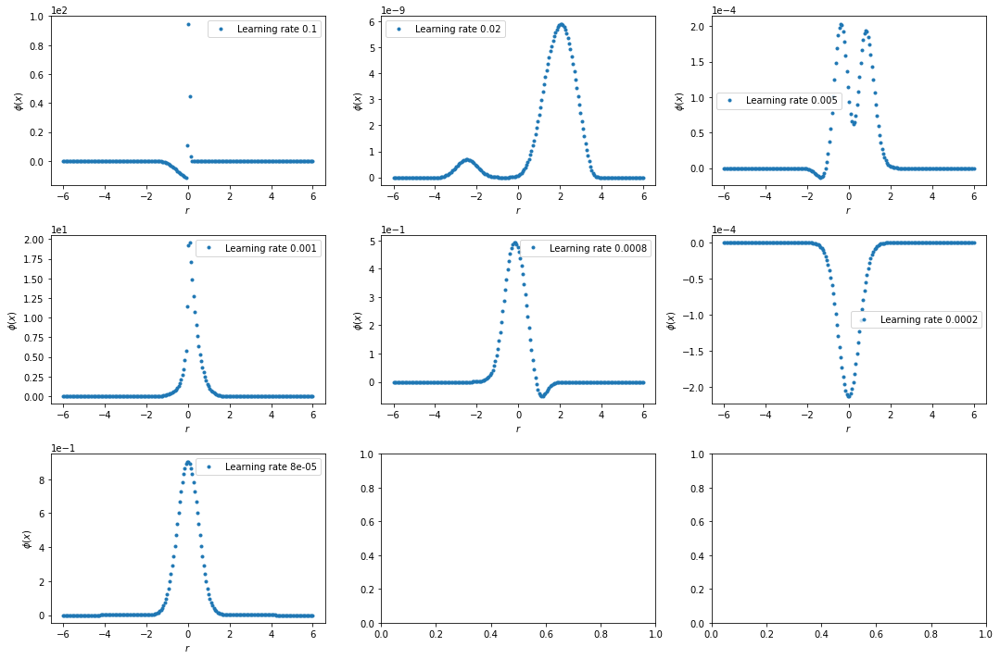

In [9]:
rr = np.linspace(lower_r, upper_r, steps)[:,None]
fig, axs = plt.subplots(3,3,figsize=(15,10))

fil = 0
col = 0
for i in range(0,7):
    yy = Phis_t[i]
    axs[fil,col].plot(rr, yy.squeeze(), ".", label=f"Learning rate {lrs[i]}")
    axs[fil,col].set_xlabel("$r$")
    axs[fil,col].set_ylabel("$\phi(x)$")
    axs[fil,col].legend(loc="best")
    axs[fil,col].ticklabel_format(style='sci', axis='y', scilimits=(0,0))
    if col == 2:
       col = 0
       fil = fil+1
    else:
       col = col+1
plt.tight_layout()
plt.show()    

In [10]:
np.squeeze(Es)

array([ 5.2611145e+01, -4.0679969e-02,  2.8146670e+00, -5.9862976e+00,
        2.3801422e+00,  1.0926245e+00,  1.0001287e+00], dtype=float32)

In [251]:
def training(x, loss_fn, optimizer):
    x = x.to(device)
    def closure():
        loss = loss_fn(x)
        optimizer.zero_grad()
        loss.backward()
        return loss
    torch.nn.utils.clip_grad_value_(model.parameters(), 2)
    optimizer.step(closure)   

In [252]:
def initialize_weights(model):
    for m in model.modules():
        if isinstance(m, (nn.Linear)):
            nn.init.xavier_normal_(m.weight.data)

In [253]:
def loss_fn(r):
    r.requires_grad = True
    
    Phi = Phi_t(r)
    Phi_t_r = torch.autograd.grad(Phi, r, grad_outputs=torch.ones_like(Phi), create_graph=True)[0]
    Phi_t_r_r = torch.autograd.grad(Phi_t_r, r, grad_outputs=torch.ones_like(Phi_t_r), create_graph=True)[0]
    H_Phi = -(hbar**2/(2*m))*Phi_t_r_r + (l*(l+1)*hbar**2/(2*m*r**2) + V(r))*Phi
    
    prom = Phi.size()[0]
    
    norm = torch.trapezoid(Phi[100:]**2,r[100:],dim=0) # integral over r=-6 to 6
    
    global E
    E = torch.trapezoid(Phi[100:]*H_Phi[100:],r[100:],dim=0)/norm 
    
    
    return (torch.mean((H_Phi[100:] - E*Phi[100:])**2)*prom)/(2*norm) #multiply by m to avoit division by m in the mean function of torh 

In [254]:
beta = 2
global Z
Z = 1
global e
#e = -1.602e-19
e = -1
global hbar
#hbar = 1.054e-34
hbar = 1
global m
#m = 9.109e-31
m = 1
global l
l = 0

V = lambda r: -(Z*e**2)/r
Phi_t = lambda r: r*torch.exp(-beta*r**2) * model.forward(r)

In [255]:
upper_r = 6
lower_r = -6
steps = 200
R_train = torch.Tensor(np.linspace(lower_r, upper_r, steps)[:,None])
epoch = 100000
lr = 2e-2
Phis_t = []
Es = []
lss = []
epochs = []


model = NeuralNetwork().to(device)
initialize_weights(model)
optimizer = torch.optim.Adam(model.parameters(), lr=lr)
for t in range(epoch):
    loss = loss_fn(R_train.to(device))
    print(f"Epoch {t+1}\n ---------------------- loss: {loss}")
    training(R_train, loss_fn, optimizer)
    if t%100 == 0:
        Phis_t.append(Phi_t(R_train).detach().numpy())
        Es.append(E.detach().numpy())
        lss.append(loss.detach().numpy())
        epochs.append(t)
print("Done!")

Epoch 1
 ---------------------- loss: tensor([86.5593], grad_fn=<DivBackward0>)
Epoch 2
 ---------------------- loss: tensor([81.2688], grad_fn=<DivBackward0>)
Epoch 3
 ---------------------- loss: tensor([78.4537], grad_fn=<DivBackward0>)
Epoch 4
 ---------------------- loss: tensor([76.7835], grad_fn=<DivBackward0>)
Epoch 5
 ---------------------- loss: tensor([75.7068], grad_fn=<DivBackward0>)
Epoch 6
 ---------------------- loss: tensor([74.9674], grad_fn=<DivBackward0>)
Epoch 7
 ---------------------- loss: tensor([74.4343], grad_fn=<DivBackward0>)
Epoch 8
 ---------------------- loss: tensor([74.0352], grad_fn=<DivBackward0>)
Epoch 9
 ---------------------- loss: tensor([73.7275], grad_fn=<DivBackward0>)
Epoch 10
 ---------------------- loss: tensor([73.4849], grad_fn=<DivBackward0>)
Epoch 11
 ---------------------- loss: tensor([73.2900], grad_fn=<DivBackward0>)
Epoch 12
 ---------------------- loss: tensor([73.1311], grad_fn=<DivBackward0>)
Epoch 13
 ---------------------- loss

Epoch 131
 ---------------------- loss: tensor([24.9708], grad_fn=<DivBackward0>)
Epoch 132
 ---------------------- loss: tensor([24.9376], grad_fn=<DivBackward0>)
Epoch 133
 ---------------------- loss: tensor([24.8519], grad_fn=<DivBackward0>)
Epoch 134
 ---------------------- loss: tensor([24.7249], grad_fn=<DivBackward0>)
Epoch 135
 ---------------------- loss: tensor([24.6039], grad_fn=<DivBackward0>)
Epoch 136
 ---------------------- loss: tensor([24.5381], grad_fn=<DivBackward0>)
Epoch 137
 ---------------------- loss: tensor([24.5136], grad_fn=<DivBackward0>)
Epoch 138
 ---------------------- loss: tensor([24.4917], grad_fn=<DivBackward0>)
Epoch 139
 ---------------------- loss: tensor([24.4503], grad_fn=<DivBackward0>)
Epoch 140
 ---------------------- loss: tensor([24.3673], grad_fn=<DivBackward0>)
Epoch 141
 ---------------------- loss: tensor([24.2643], grad_fn=<DivBackward0>)
Epoch 142
 ---------------------- loss: tensor([24.1887], grad_fn=<DivBackward0>)
Epoch 143
 -----

Epoch 231
 ---------------------- loss: tensor([23.9769], grad_fn=<DivBackward0>)
Epoch 232
 ---------------------- loss: tensor([20.9077], grad_fn=<DivBackward0>)
Epoch 233
 ---------------------- loss: tensor([22.3200], grad_fn=<DivBackward0>)
Epoch 234
 ---------------------- loss: tensor([23.0153], grad_fn=<DivBackward0>)
Epoch 235
 ---------------------- loss: tensor([21.1610], grad_fn=<DivBackward0>)
Epoch 236
 ---------------------- loss: tensor([22.6474], grad_fn=<DivBackward0>)
Epoch 237
 ---------------------- loss: tensor([21.6899], grad_fn=<DivBackward0>)
Epoch 238
 ---------------------- loss: tensor([23.4963], grad_fn=<DivBackward0>)
Epoch 239
 ---------------------- loss: tensor([22.5568], grad_fn=<DivBackward0>)
Epoch 240
 ---------------------- loss: tensor([20.8908], grad_fn=<DivBackward0>)
Epoch 241
 ---------------------- loss: tensor([22.9094], grad_fn=<DivBackward0>)
Epoch 242
 ---------------------- loss: tensor([21.5631], grad_fn=<DivBackward0>)
Epoch 243
 -----

Epoch 379
 ---------------------- loss: tensor([19.0990], grad_fn=<DivBackward0>)
Epoch 380
 ---------------------- loss: tensor([19.0859], grad_fn=<DivBackward0>)
Epoch 381
 ---------------------- loss: tensor([19.0728], grad_fn=<DivBackward0>)
Epoch 382
 ---------------------- loss: tensor([19.0596], grad_fn=<DivBackward0>)
Epoch 383
 ---------------------- loss: tensor([19.0463], grad_fn=<DivBackward0>)
Epoch 384
 ---------------------- loss: tensor([19.0331], grad_fn=<DivBackward0>)
Epoch 385
 ---------------------- loss: tensor([19.0198], grad_fn=<DivBackward0>)
Epoch 386
 ---------------------- loss: tensor([19.0064], grad_fn=<DivBackward0>)
Epoch 387
 ---------------------- loss: tensor([18.9930], grad_fn=<DivBackward0>)
Epoch 388
 ---------------------- loss: tensor([18.9796], grad_fn=<DivBackward0>)
Epoch 389
 ---------------------- loss: tensor([18.9661], grad_fn=<DivBackward0>)
Epoch 390
 ---------------------- loss: tensor([18.9526], grad_fn=<DivBackward0>)
Epoch 391
 -----

Epoch 481
 ---------------------- loss: tensor([57.1134], grad_fn=<DivBackward0>)
Epoch 482
 ---------------------- loss: tensor([56.8617], grad_fn=<DivBackward0>)
Epoch 483
 ---------------------- loss: tensor([56.6056], grad_fn=<DivBackward0>)
Epoch 484
 ---------------------- loss: tensor([56.3451], grad_fn=<DivBackward0>)
Epoch 485
 ---------------------- loss: tensor([56.0800], grad_fn=<DivBackward0>)
Epoch 486
 ---------------------- loss: tensor([55.8104], grad_fn=<DivBackward0>)
Epoch 487
 ---------------------- loss: tensor([55.5360], grad_fn=<DivBackward0>)
Epoch 488
 ---------------------- loss: tensor([55.2568], grad_fn=<DivBackward0>)
Epoch 489
 ---------------------- loss: tensor([54.9728], grad_fn=<DivBackward0>)
Epoch 490
 ---------------------- loss: tensor([54.6838], grad_fn=<DivBackward0>)
Epoch 491
 ---------------------- loss: tensor([54.3897], grad_fn=<DivBackward0>)
Epoch 492
 ---------------------- loss: tensor([54.0904], grad_fn=<DivBackward0>)
Epoch 493
 -----

Epoch 585
 ---------------------- loss: tensor([23.0786], grad_fn=<DivBackward0>)
Epoch 586
 ---------------------- loss: tensor([23.0345], grad_fn=<DivBackward0>)
Epoch 587
 ---------------------- loss: tensor([22.9924], grad_fn=<DivBackward0>)
Epoch 588
 ---------------------- loss: tensor([22.9525], grad_fn=<DivBackward0>)
Epoch 589
 ---------------------- loss: tensor([22.9151], grad_fn=<DivBackward0>)
Epoch 590
 ---------------------- loss: tensor([22.8802], grad_fn=<DivBackward0>)
Epoch 591
 ---------------------- loss: tensor([22.8476], grad_fn=<DivBackward0>)
Epoch 592
 ---------------------- loss: tensor([22.8171], grad_fn=<DivBackward0>)
Epoch 593
 ---------------------- loss: tensor([22.7885], grad_fn=<DivBackward0>)
Epoch 594
 ---------------------- loss: tensor([22.7615], grad_fn=<DivBackward0>)
Epoch 595
 ---------------------- loss: tensor([22.7357], grad_fn=<DivBackward0>)
Epoch 596
 ---------------------- loss: tensor([22.7108], grad_fn=<DivBackward0>)
Epoch 597
 -----

Epoch 687
 ---------------------- loss: tensor([20.9908], grad_fn=<DivBackward0>)
Epoch 688
 ---------------------- loss: tensor([20.9768], grad_fn=<DivBackward0>)
Epoch 689
 ---------------------- loss: tensor([20.9629], grad_fn=<DivBackward0>)
Epoch 690
 ---------------------- loss: tensor([20.9490], grad_fn=<DivBackward0>)
Epoch 691
 ---------------------- loss: tensor([20.9352], grad_fn=<DivBackward0>)
Epoch 692
 ---------------------- loss: tensor([20.9215], grad_fn=<DivBackward0>)
Epoch 693
 ---------------------- loss: tensor([20.9079], grad_fn=<DivBackward0>)
Epoch 694
 ---------------------- loss: tensor([20.8943], grad_fn=<DivBackward0>)
Epoch 695
 ---------------------- loss: tensor([20.8807], grad_fn=<DivBackward0>)
Epoch 696
 ---------------------- loss: tensor([20.8672], grad_fn=<DivBackward0>)
Epoch 697
 ---------------------- loss: tensor([20.8538], grad_fn=<DivBackward0>)
Epoch 698
 ---------------------- loss: tensor([20.8405], grad_fn=<DivBackward0>)
Epoch 699
 -----

Epoch 789
 ---------------------- loss: tensor([19.7892], grad_fn=<DivBackward0>)
Epoch 790
 ---------------------- loss: tensor([19.7789], grad_fn=<DivBackward0>)
Epoch 791
 ---------------------- loss: tensor([19.7685], grad_fn=<DivBackward0>)
Epoch 792
 ---------------------- loss: tensor([19.7582], grad_fn=<DivBackward0>)
Epoch 793
 ---------------------- loss: tensor([19.7480], grad_fn=<DivBackward0>)
Epoch 794
 ---------------------- loss: tensor([19.7377], grad_fn=<DivBackward0>)
Epoch 795
 ---------------------- loss: tensor([19.7275], grad_fn=<DivBackward0>)
Epoch 796
 ---------------------- loss: tensor([19.7172], grad_fn=<DivBackward0>)
Epoch 797
 ---------------------- loss: tensor([19.7070], grad_fn=<DivBackward0>)
Epoch 798
 ---------------------- loss: tensor([19.6968], grad_fn=<DivBackward0>)
Epoch 799
 ---------------------- loss: tensor([19.6866], grad_fn=<DivBackward0>)
Epoch 800
 ---------------------- loss: tensor([19.6765], grad_fn=<DivBackward0>)
Epoch 801
 -----

Epoch 891
 ---------------------- loss: tensor([18.8102], grad_fn=<DivBackward0>)
Epoch 892
 ---------------------- loss: tensor([18.8013], grad_fn=<DivBackward0>)
Epoch 893
 ---------------------- loss: tensor([18.7923], grad_fn=<DivBackward0>)
Epoch 894
 ---------------------- loss: tensor([18.7834], grad_fn=<DivBackward0>)
Epoch 895
 ---------------------- loss: tensor([18.7745], grad_fn=<DivBackward0>)
Epoch 896
 ---------------------- loss: tensor([18.7655], grad_fn=<DivBackward0>)
Epoch 897
 ---------------------- loss: tensor([18.7566], grad_fn=<DivBackward0>)
Epoch 898
 ---------------------- loss: tensor([18.7477], grad_fn=<DivBackward0>)
Epoch 899
 ---------------------- loss: tensor([18.7388], grad_fn=<DivBackward0>)
Epoch 900
 ---------------------- loss: tensor([18.7299], grad_fn=<DivBackward0>)
Epoch 901
 ---------------------- loss: tensor([18.7211], grad_fn=<DivBackward0>)
Epoch 902
 ---------------------- loss: tensor([18.7122], grad_fn=<DivBackward0>)
Epoch 903
 -----

Epoch 994
 ---------------------- loss: tensor([17.9396], grad_fn=<DivBackward0>)
Epoch 995
 ---------------------- loss: tensor([17.9316], grad_fn=<DivBackward0>)
Epoch 996
 ---------------------- loss: tensor([17.9236], grad_fn=<DivBackward0>)
Epoch 997
 ---------------------- loss: tensor([17.9157], grad_fn=<DivBackward0>)
Epoch 998
 ---------------------- loss: tensor([17.9078], grad_fn=<DivBackward0>)
Epoch 999
 ---------------------- loss: tensor([17.8998], grad_fn=<DivBackward0>)
Epoch 1000
 ---------------------- loss: tensor([17.8919], grad_fn=<DivBackward0>)
Epoch 1001
 ---------------------- loss: tensor([17.8840], grad_fn=<DivBackward0>)
Epoch 1002
 ---------------------- loss: tensor([17.8761], grad_fn=<DivBackward0>)
Epoch 1003
 ---------------------- loss: tensor([17.8682], grad_fn=<DivBackward0>)
Epoch 1004
 ---------------------- loss: tensor([17.8603], grad_fn=<DivBackward0>)
Epoch 1005
 ---------------------- loss: tensor([17.8524], grad_fn=<DivBackward0>)
Epoch 1006

Epoch 1099
 ---------------------- loss: tensor([17.1461], grad_fn=<DivBackward0>)
Epoch 1100
 ---------------------- loss: tensor([17.1389], grad_fn=<DivBackward0>)
Epoch 1101
 ---------------------- loss: tensor([17.1317], grad_fn=<DivBackward0>)
Epoch 1102
 ---------------------- loss: tensor([17.1245], grad_fn=<DivBackward0>)
Epoch 1103
 ---------------------- loss: tensor([17.1174], grad_fn=<DivBackward0>)
Epoch 1104
 ---------------------- loss: tensor([17.1102], grad_fn=<DivBackward0>)
Epoch 1105
 ---------------------- loss: tensor([17.1031], grad_fn=<DivBackward0>)
Epoch 1106
 ---------------------- loss: tensor([17.0959], grad_fn=<DivBackward0>)
Epoch 1107
 ---------------------- loss: tensor([17.0888], grad_fn=<DivBackward0>)
Epoch 1108
 ---------------------- loss: tensor([17.0817], grad_fn=<DivBackward0>)
Epoch 1109
 ---------------------- loss: tensor([17.0745], grad_fn=<DivBackward0>)
Epoch 1110
 ---------------------- loss: tensor([17.0674], grad_fn=<DivBackward0>)
Epoc

Epoch 1204
 ---------------------- loss: tensor([16.4197], grad_fn=<DivBackward0>)
Epoch 1205
 ---------------------- loss: tensor([16.4130], grad_fn=<DivBackward0>)
Epoch 1206
 ---------------------- loss: tensor([16.4062], grad_fn=<DivBackward0>)
Epoch 1207
 ---------------------- loss: tensor([16.3995], grad_fn=<DivBackward0>)
Epoch 1208
 ---------------------- loss: tensor([16.3928], grad_fn=<DivBackward0>)
Epoch 1209
 ---------------------- loss: tensor([16.3861], grad_fn=<DivBackward0>)
Epoch 1210
 ---------------------- loss: tensor([16.3794], grad_fn=<DivBackward0>)
Epoch 1211
 ---------------------- loss: tensor([16.3727], grad_fn=<DivBackward0>)
Epoch 1212
 ---------------------- loss: tensor([16.3660], grad_fn=<DivBackward0>)
Epoch 1213
 ---------------------- loss: tensor([16.3593], grad_fn=<DivBackward0>)
Epoch 1214
 ---------------------- loss: tensor([16.3526], grad_fn=<DivBackward0>)
Epoch 1215
 ---------------------- loss: tensor([16.3460], grad_fn=<DivBackward0>)
Epoc

Epoch 1309
 ---------------------- loss: tensor([15.7203], grad_fn=<DivBackward0>)
Epoch 1310
 ---------------------- loss: tensor([15.7136], grad_fn=<DivBackward0>)
Epoch 1311
 ---------------------- loss: tensor([15.7069], grad_fn=<DivBackward0>)
Epoch 1312
 ---------------------- loss: tensor([15.7002], grad_fn=<DivBackward0>)
Epoch 1313
 ---------------------- loss: tensor([15.6935], grad_fn=<DivBackward0>)
Epoch 1314
 ---------------------- loss: tensor([15.6868], grad_fn=<DivBackward0>)
Epoch 1315
 ---------------------- loss: tensor([15.6801], grad_fn=<DivBackward0>)
Epoch 1316
 ---------------------- loss: tensor([15.6734], grad_fn=<DivBackward0>)
Epoch 1317
 ---------------------- loss: tensor([15.6667], grad_fn=<DivBackward0>)
Epoch 1318
 ---------------------- loss: tensor([15.6599], grad_fn=<DivBackward0>)
Epoch 1319
 ---------------------- loss: tensor([15.6532], grad_fn=<DivBackward0>)
Epoch 1320
 ---------------------- loss: tensor([15.6465], grad_fn=<DivBackward0>)
Epoc

Epoch 1412
 ---------------------- loss: tensor([15.0062], grad_fn=<DivBackward0>)
Epoch 1413
 ---------------------- loss: tensor([14.9989], grad_fn=<DivBackward0>)
Epoch 1414
 ---------------------- loss: tensor([14.9916], grad_fn=<DivBackward0>)
Epoch 1415
 ---------------------- loss: tensor([14.9842], grad_fn=<DivBackward0>)
Epoch 1416
 ---------------------- loss: tensor([14.9769], grad_fn=<DivBackward0>)
Epoch 1417
 ---------------------- loss: tensor([14.9696], grad_fn=<DivBackward0>)
Epoch 1418
 ---------------------- loss: tensor([14.9622], grad_fn=<DivBackward0>)
Epoch 1419
 ---------------------- loss: tensor([14.9549], grad_fn=<DivBackward0>)
Epoch 1420
 ---------------------- loss: tensor([14.9475], grad_fn=<DivBackward0>)
Epoch 1421
 ---------------------- loss: tensor([14.9401], grad_fn=<DivBackward0>)
Epoch 1422
 ---------------------- loss: tensor([14.9327], grad_fn=<DivBackward0>)
Epoch 1423
 ---------------------- loss: tensor([14.9253], grad_fn=<DivBackward0>)
Epoc

Epoch 1514
 ---------------------- loss: tensor([14.1831], grad_fn=<DivBackward0>)
Epoch 1515
 ---------------------- loss: tensor([14.1737], grad_fn=<DivBackward0>)
Epoch 1516
 ---------------------- loss: tensor([14.1643], grad_fn=<DivBackward0>)
Epoch 1517
 ---------------------- loss: tensor([14.1548], grad_fn=<DivBackward0>)
Epoch 1518
 ---------------------- loss: tensor([14.1452], grad_fn=<DivBackward0>)
Epoch 1519
 ---------------------- loss: tensor([14.1356], grad_fn=<DivBackward0>)
Epoch 1520
 ---------------------- loss: tensor([14.1259], grad_fn=<DivBackward0>)
Epoch 1521
 ---------------------- loss: tensor([14.1162], grad_fn=<DivBackward0>)
Epoch 1522
 ---------------------- loss: tensor([14.1065], grad_fn=<DivBackward0>)
Epoch 1523
 ---------------------- loss: tensor([14.0966], grad_fn=<DivBackward0>)
Epoch 1524
 ---------------------- loss: tensor([14.0867], grad_fn=<DivBackward0>)
Epoch 1525
 ---------------------- loss: tensor([14.0768], grad_fn=<DivBackward0>)
Epoc

Epoch 1614
 ---------------------- loss: tensor([55.6890], grad_fn=<DivBackward0>)
Epoch 1615
 ---------------------- loss: tensor([55.4957], grad_fn=<DivBackward0>)
Epoch 1616
 ---------------------- loss: tensor([55.3011], grad_fn=<DivBackward0>)
Epoch 1617
 ---------------------- loss: tensor([55.1054], grad_fn=<DivBackward0>)
Epoch 1618
 ---------------------- loss: tensor([54.9084], grad_fn=<DivBackward0>)
Epoch 1619
 ---------------------- loss: tensor([54.7103], grad_fn=<DivBackward0>)
Epoch 1620
 ---------------------- loss: tensor([54.5110], grad_fn=<DivBackward0>)
Epoch 1621
 ---------------------- loss: tensor([54.3107], grad_fn=<DivBackward0>)
Epoch 1622
 ---------------------- loss: tensor([54.1093], grad_fn=<DivBackward0>)
Epoch 1623
 ---------------------- loss: tensor([53.9070], grad_fn=<DivBackward0>)
Epoch 1624
 ---------------------- loss: tensor([53.7038], grad_fn=<DivBackward0>)
Epoch 1625
 ---------------------- loss: tensor([53.4997], grad_fn=<DivBackward0>)
Epoc

Epoch 1715
 ---------------------- loss: tensor([39.5880], grad_fn=<DivBackward0>)
Epoch 1716
 ---------------------- loss: tensor([39.4863], grad_fn=<DivBackward0>)
Epoch 1717
 ---------------------- loss: tensor([39.3848], grad_fn=<DivBackward0>)
Epoch 1718
 ---------------------- loss: tensor([39.2836], grad_fn=<DivBackward0>)
Epoch 1719
 ---------------------- loss: tensor([39.1827], grad_fn=<DivBackward0>)
Epoch 1720
 ---------------------- loss: tensor([39.0820], grad_fn=<DivBackward0>)
Epoch 1721
 ---------------------- loss: tensor([38.9816], grad_fn=<DivBackward0>)
Epoch 1722
 ---------------------- loss: tensor([38.8814], grad_fn=<DivBackward0>)
Epoch 1723
 ---------------------- loss: tensor([38.7815], grad_fn=<DivBackward0>)
Epoch 1724
 ---------------------- loss: tensor([38.6819], grad_fn=<DivBackward0>)
Epoch 1725
 ---------------------- loss: tensor([38.5824], grad_fn=<DivBackward0>)
Epoch 1726
 ---------------------- loss: tensor([38.4833], grad_fn=<DivBackward0>)
Epoc

Epoch 1817
 ---------------------- loss: tensor([30.7945], grad_fn=<DivBackward0>)
Epoch 1818
 ---------------------- loss: tensor([30.7282], grad_fn=<DivBackward0>)
Epoch 1819
 ---------------------- loss: tensor([30.6624], grad_fn=<DivBackward0>)
Epoch 1820
 ---------------------- loss: tensor([30.5971], grad_fn=<DivBackward0>)
Epoch 1821
 ---------------------- loss: tensor([30.5321], grad_fn=<DivBackward0>)
Epoch 1822
 ---------------------- loss: tensor([30.4676], grad_fn=<DivBackward0>)
Epoch 1823
 ---------------------- loss: tensor([30.4036], grad_fn=<DivBackward0>)
Epoch 1824
 ---------------------- loss: tensor([30.3400], grad_fn=<DivBackward0>)
Epoch 1825
 ---------------------- loss: tensor([30.2768], grad_fn=<DivBackward0>)
Epoch 1826
 ---------------------- loss: tensor([30.2140], grad_fn=<DivBackward0>)
Epoch 1827
 ---------------------- loss: tensor([30.1517], grad_fn=<DivBackward0>)
Epoch 1828
 ---------------------- loss: tensor([30.0898], grad_fn=<DivBackward0>)
Epoc

Epoch 1920
 ---------------------- loss: tensor([25.8983], grad_fn=<DivBackward0>)
Epoch 1921
 ---------------------- loss: tensor([25.8643], grad_fn=<DivBackward0>)
Epoch 1922
 ---------------------- loss: tensor([25.8304], grad_fn=<DivBackward0>)
Epoch 1923
 ---------------------- loss: tensor([25.7967], grad_fn=<DivBackward0>)
Epoch 1924
 ---------------------- loss: tensor([25.7631], grad_fn=<DivBackward0>)
Epoch 1925
 ---------------------- loss: tensor([25.7296], grad_fn=<DivBackward0>)
Epoch 1926
 ---------------------- loss: tensor([25.6963], grad_fn=<DivBackward0>)
Epoch 1927
 ---------------------- loss: tensor([25.6631], grad_fn=<DivBackward0>)
Epoch 1928
 ---------------------- loss: tensor([25.6301], grad_fn=<DivBackward0>)
Epoch 1929
 ---------------------- loss: tensor([25.5972], grad_fn=<DivBackward0>)
Epoch 1930
 ---------------------- loss: tensor([25.5644], grad_fn=<DivBackward0>)
Epoch 1931
 ---------------------- loss: tensor([25.5317], grad_fn=<DivBackward0>)
Epoc

Epoch 2023
 ---------------------- loss: tensor([22.8688], grad_fn=<DivBackward0>)
Epoch 2024
 ---------------------- loss: tensor([22.8426], grad_fn=<DivBackward0>)
Epoch 2025
 ---------------------- loss: tensor([22.8164], grad_fn=<DivBackward0>)
Epoch 2026
 ---------------------- loss: tensor([22.7903], grad_fn=<DivBackward0>)
Epoch 2027
 ---------------------- loss: tensor([22.7643], grad_fn=<DivBackward0>)
Epoch 2028
 ---------------------- loss: tensor([22.7382], grad_fn=<DivBackward0>)
Epoch 2029
 ---------------------- loss: tensor([22.7123], grad_fn=<DivBackward0>)
Epoch 2030
 ---------------------- loss: tensor([22.6864], grad_fn=<DivBackward0>)
Epoch 2031
 ---------------------- loss: tensor([22.6605], grad_fn=<DivBackward0>)
Epoch 2032
 ---------------------- loss: tensor([22.6347], grad_fn=<DivBackward0>)
Epoch 2033
 ---------------------- loss: tensor([22.6089], grad_fn=<DivBackward0>)
Epoch 2034
 ---------------------- loss: tensor([22.5832], grad_fn=<DivBackward0>)
Epoc

Epoch 2129
 ---------------------- loss: tensor([20.3965], grad_fn=<DivBackward0>)
Epoch 2130
 ---------------------- loss: tensor([20.3764], grad_fn=<DivBackward0>)
Epoch 2131
 ---------------------- loss: tensor([20.3563], grad_fn=<DivBackward0>)
Epoch 2132
 ---------------------- loss: tensor([20.3364], grad_fn=<DivBackward0>)
Epoch 2133
 ---------------------- loss: tensor([20.3165], grad_fn=<DivBackward0>)
Epoch 2134
 ---------------------- loss: tensor([20.2966], grad_fn=<DivBackward0>)
Epoch 2135
 ---------------------- loss: tensor([20.2769], grad_fn=<DivBackward0>)
Epoch 2136
 ---------------------- loss: tensor([20.2571], grad_fn=<DivBackward0>)
Epoch 2137
 ---------------------- loss: tensor([20.2375], grad_fn=<DivBackward0>)
Epoch 2138
 ---------------------- loss: tensor([20.2179], grad_fn=<DivBackward0>)
Epoch 2139
 ---------------------- loss: tensor([20.1984], grad_fn=<DivBackward0>)
Epoch 2140
 ---------------------- loss: tensor([20.1790], grad_fn=<DivBackward0>)
Epoc

Epoch 2235
 ---------------------- loss: tensor([18.6249], grad_fn=<DivBackward0>)
Epoch 2236
 ---------------------- loss: tensor([18.6114], grad_fn=<DivBackward0>)
Epoch 2237
 ---------------------- loss: tensor([18.5980], grad_fn=<DivBackward0>)
Epoch 2238
 ---------------------- loss: tensor([18.5846], grad_fn=<DivBackward0>)
Epoch 2239
 ---------------------- loss: tensor([18.5713], grad_fn=<DivBackward0>)
Epoch 2240
 ---------------------- loss: tensor([18.5580], grad_fn=<DivBackward0>)
Epoch 2241
 ---------------------- loss: tensor([18.5448], grad_fn=<DivBackward0>)
Epoch 2242
 ---------------------- loss: tensor([18.5316], grad_fn=<DivBackward0>)
Epoch 2243
 ---------------------- loss: tensor([18.5184], grad_fn=<DivBackward0>)
Epoch 2244
 ---------------------- loss: tensor([18.5054], grad_fn=<DivBackward0>)
Epoch 2245
 ---------------------- loss: tensor([18.4923], grad_fn=<DivBackward0>)
Epoch 2246
 ---------------------- loss: tensor([18.4793], grad_fn=<DivBackward0>)
Epoc

Epoch 2342
 ---------------------- loss: tensor([17.4127], grad_fn=<DivBackward0>)
Epoch 2343
 ---------------------- loss: tensor([17.4029], grad_fn=<DivBackward0>)
Epoch 2344
 ---------------------- loss: tensor([17.3932], grad_fn=<DivBackward0>)
Epoch 2345
 ---------------------- loss: tensor([17.3835], grad_fn=<DivBackward0>)
Epoch 2346
 ---------------------- loss: tensor([17.3739], grad_fn=<DivBackward0>)
Epoch 2347
 ---------------------- loss: tensor([17.3642], grad_fn=<DivBackward0>)
Epoch 2348
 ---------------------- loss: tensor([17.3546], grad_fn=<DivBackward0>)
Epoch 2349
 ---------------------- loss: tensor([17.3449], grad_fn=<DivBackward0>)
Epoch 2350
 ---------------------- loss: tensor([17.3353], grad_fn=<DivBackward0>)
Epoch 2351
 ---------------------- loss: tensor([17.3258], grad_fn=<DivBackward0>)
Epoch 2352
 ---------------------- loss: tensor([17.3162], grad_fn=<DivBackward0>)
Epoch 2353
 ---------------------- loss: tensor([17.3067], grad_fn=<DivBackward0>)
Epoc

Epoch 2448
 ---------------------- loss: tensor([16.4597], grad_fn=<DivBackward0>)
Epoch 2449
 ---------------------- loss: tensor([16.4512], grad_fn=<DivBackward0>)
Epoch 2450
 ---------------------- loss: tensor([16.4428], grad_fn=<DivBackward0>)
Epoch 2451
 ---------------------- loss: tensor([16.4343], grad_fn=<DivBackward0>)
Epoch 2452
 ---------------------- loss: tensor([16.4259], grad_fn=<DivBackward0>)
Epoch 2453
 ---------------------- loss: tensor([16.4175], grad_fn=<DivBackward0>)
Epoch 2454
 ---------------------- loss: tensor([16.4091], grad_fn=<DivBackward0>)
Epoch 2455
 ---------------------- loss: tensor([16.4007], grad_fn=<DivBackward0>)
Epoch 2456
 ---------------------- loss: tensor([16.3923], grad_fn=<DivBackward0>)
Epoch 2457
 ---------------------- loss: tensor([16.3839], grad_fn=<DivBackward0>)
Epoch 2458
 ---------------------- loss: tensor([16.3755], grad_fn=<DivBackward0>)
Epoch 2459
 ---------------------- loss: tensor([16.3671], grad_fn=<DivBackward0>)
Epoc

Epoch 2552
 ---------------------- loss: tensor([15.6143], grad_fn=<DivBackward0>)
Epoch 2553
 ---------------------- loss: tensor([15.6065], grad_fn=<DivBackward0>)
Epoch 2554
 ---------------------- loss: tensor([15.5986], grad_fn=<DivBackward0>)
Epoch 2555
 ---------------------- loss: tensor([15.5908], grad_fn=<DivBackward0>)
Epoch 2556
 ---------------------- loss: tensor([15.5829], grad_fn=<DivBackward0>)
Epoch 2557
 ---------------------- loss: tensor([15.5751], grad_fn=<DivBackward0>)
Epoch 2558
 ---------------------- loss: tensor([15.5673], grad_fn=<DivBackward0>)
Epoch 2559
 ---------------------- loss: tensor([15.5594], grad_fn=<DivBackward0>)
Epoch 2560
 ---------------------- loss: tensor([15.5516], grad_fn=<DivBackward0>)
Epoch 2561
 ---------------------- loss: tensor([15.5438], grad_fn=<DivBackward0>)
Epoch 2562
 ---------------------- loss: tensor([15.5360], grad_fn=<DivBackward0>)
Epoch 2563
 ---------------------- loss: tensor([15.5282], grad_fn=<DivBackward0>)
Epoc

Epoch 2656
 ---------------------- loss: tensor([14.8174], grad_fn=<DivBackward0>)
Epoch 2657
 ---------------------- loss: tensor([14.8099], grad_fn=<DivBackward0>)
Epoch 2658
 ---------------------- loss: tensor([14.8024], grad_fn=<DivBackward0>)
Epoch 2659
 ---------------------- loss: tensor([14.7950], grad_fn=<DivBackward0>)
Epoch 2660
 ---------------------- loss: tensor([14.7875], grad_fn=<DivBackward0>)
Epoch 2661
 ---------------------- loss: tensor([14.7800], grad_fn=<DivBackward0>)
Epoch 2662
 ---------------------- loss: tensor([14.7725], grad_fn=<DivBackward0>)
Epoch 2663
 ---------------------- loss: tensor([14.7650], grad_fn=<DivBackward0>)
Epoch 2664
 ---------------------- loss: tensor([14.7576], grad_fn=<DivBackward0>)
Epoch 2665
 ---------------------- loss: tensor([14.7501], grad_fn=<DivBackward0>)
Epoch 2666
 ---------------------- loss: tensor([14.7426], grad_fn=<DivBackward0>)
Epoch 2667
 ---------------------- loss: tensor([14.7351], grad_fn=<DivBackward0>)
Epoc

Epoch 2761
 ---------------------- loss: tensor([14.0430], grad_fn=<DivBackward0>)
Epoch 2762
 ---------------------- loss: tensor([14.0357], grad_fn=<DivBackward0>)
Epoch 2763
 ---------------------- loss: tensor([14.0284], grad_fn=<DivBackward0>)
Epoch 2764
 ---------------------- loss: tensor([14.0212], grad_fn=<DivBackward0>)
Epoch 2765
 ---------------------- loss: tensor([14.0139], grad_fn=<DivBackward0>)
Epoch 2766
 ---------------------- loss: tensor([14.0066], grad_fn=<DivBackward0>)
Epoch 2767
 ---------------------- loss: tensor([13.9994], grad_fn=<DivBackward0>)
Epoch 2768
 ---------------------- loss: tensor([13.9921], grad_fn=<DivBackward0>)
Epoch 2769
 ---------------------- loss: tensor([13.9848], grad_fn=<DivBackward0>)
Epoch 2770
 ---------------------- loss: tensor([13.9776], grad_fn=<DivBackward0>)
Epoch 2771
 ---------------------- loss: tensor([13.9703], grad_fn=<DivBackward0>)
Epoch 2772
 ---------------------- loss: tensor([13.9630], grad_fn=<DivBackward0>)
Epoc

Epoch 2861
 ---------------------- loss: tensor([13.3212], grad_fn=<DivBackward0>)
Epoch 2862
 ---------------------- loss: tensor([13.3140], grad_fn=<DivBackward0>)
Epoch 2863
 ---------------------- loss: tensor([13.3069], grad_fn=<DivBackward0>)
Epoch 2864
 ---------------------- loss: tensor([13.2997], grad_fn=<DivBackward0>)
Epoch 2865
 ---------------------- loss: tensor([13.2925], grad_fn=<DivBackward0>)
Epoch 2866
 ---------------------- loss: tensor([13.2854], grad_fn=<DivBackward0>)
Epoch 2867
 ---------------------- loss: tensor([13.2782], grad_fn=<DivBackward0>)
Epoch 2868
 ---------------------- loss: tensor([13.2710], grad_fn=<DivBackward0>)
Epoch 2869
 ---------------------- loss: tensor([13.2638], grad_fn=<DivBackward0>)
Epoch 2870
 ---------------------- loss: tensor([13.2567], grad_fn=<DivBackward0>)
Epoch 2871
 ---------------------- loss: tensor([13.2495], grad_fn=<DivBackward0>)
Epoch 2872
 ---------------------- loss: tensor([13.2423], grad_fn=<DivBackward0>)
Epoc

Epoch 2963
 ---------------------- loss: tensor([12.5919], grad_fn=<DivBackward0>)
Epoch 2964
 ---------------------- loss: tensor([12.5848], grad_fn=<DivBackward0>)
Epoch 2965
 ---------------------- loss: tensor([12.5776], grad_fn=<DivBackward0>)
Epoch 2966
 ---------------------- loss: tensor([12.5705], grad_fn=<DivBackward0>)
Epoch 2967
 ---------------------- loss: tensor([12.5634], grad_fn=<DivBackward0>)
Epoch 2968
 ---------------------- loss: tensor([12.5562], grad_fn=<DivBackward0>)
Epoch 2969
 ---------------------- loss: tensor([12.5491], grad_fn=<DivBackward0>)
Epoch 2970
 ---------------------- loss: tensor([12.5420], grad_fn=<DivBackward0>)
Epoch 2971
 ---------------------- loss: tensor([12.5348], grad_fn=<DivBackward0>)
Epoch 2972
 ---------------------- loss: tensor([12.5277], grad_fn=<DivBackward0>)
Epoch 2973
 ---------------------- loss: tensor([12.5206], grad_fn=<DivBackward0>)
Epoch 2974
 ---------------------- loss: tensor([12.5134], grad_fn=<DivBackward0>)
Epoc

Epoch 3104
 ---------------------- loss: tensor([11.5872], grad_fn=<DivBackward0>)
Epoch 3105
 ---------------------- loss: tensor([11.5801], grad_fn=<DivBackward0>)
Epoch 3106
 ---------------------- loss: tensor([11.5730], grad_fn=<DivBackward0>)
Epoch 3107
 ---------------------- loss: tensor([11.5659], grad_fn=<DivBackward0>)
Epoch 3108
 ---------------------- loss: tensor([11.5588], grad_fn=<DivBackward0>)
Epoch 3109
 ---------------------- loss: tensor([11.5517], grad_fn=<DivBackward0>)
Epoch 3110
 ---------------------- loss: tensor([11.5445], grad_fn=<DivBackward0>)
Epoch 3111
 ---------------------- loss: tensor([11.5374], grad_fn=<DivBackward0>)
Epoch 3112
 ---------------------- loss: tensor([11.5303], grad_fn=<DivBackward0>)
Epoch 3113
 ---------------------- loss: tensor([11.5232], grad_fn=<DivBackward0>)
Epoch 3114
 ---------------------- loss: tensor([11.5161], grad_fn=<DivBackward0>)
Epoch 3115
 ---------------------- loss: tensor([11.5090], grad_fn=<DivBackward0>)
Epoc

Epoch 3204
 ---------------------- loss: tensor([10.8802], grad_fn=<DivBackward0>)
Epoch 3205
 ---------------------- loss: tensor([10.8732], grad_fn=<DivBackward0>)
Epoch 3206
 ---------------------- loss: tensor([10.8662], grad_fn=<DivBackward0>)
Epoch 3207
 ---------------------- loss: tensor([10.8591], grad_fn=<DivBackward0>)
Epoch 3208
 ---------------------- loss: tensor([10.8521], grad_fn=<DivBackward0>)
Epoch 3209
 ---------------------- loss: tensor([10.8451], grad_fn=<DivBackward0>)
Epoch 3210
 ---------------------- loss: tensor([10.8381], grad_fn=<DivBackward0>)
Epoch 3211
 ---------------------- loss: tensor([10.8311], grad_fn=<DivBackward0>)
Epoch 3212
 ---------------------- loss: tensor([10.8241], grad_fn=<DivBackward0>)
Epoch 3213
 ---------------------- loss: tensor([10.8171], grad_fn=<DivBackward0>)
Epoch 3214
 ---------------------- loss: tensor([10.8101], grad_fn=<DivBackward0>)
Epoch 3215
 ---------------------- loss: tensor([10.8031], grad_fn=<DivBackward0>)
Epoc

Epoch 3308
 ---------------------- loss: tensor([10.1610], grad_fn=<DivBackward0>)
Epoch 3309
 ---------------------- loss: tensor([10.1542], grad_fn=<DivBackward0>)
Epoch 3310
 ---------------------- loss: tensor([10.1474], grad_fn=<DivBackward0>)
Epoch 3311
 ---------------------- loss: tensor([10.1406], grad_fn=<DivBackward0>)
Epoch 3312
 ---------------------- loss: tensor([10.1338], grad_fn=<DivBackward0>)
Epoch 3313
 ---------------------- loss: tensor([10.1270], grad_fn=<DivBackward0>)
Epoch 3314
 ---------------------- loss: tensor([10.1202], grad_fn=<DivBackward0>)
Epoch 3315
 ---------------------- loss: tensor([10.1135], grad_fn=<DivBackward0>)
Epoch 3316
 ---------------------- loss: tensor([10.1067], grad_fn=<DivBackward0>)
Epoch 3317
 ---------------------- loss: tensor([10.0999], grad_fn=<DivBackward0>)
Epoch 3318
 ---------------------- loss: tensor([10.0931], grad_fn=<DivBackward0>)
Epoch 3319
 ---------------------- loss: tensor([10.0864], grad_fn=<DivBackward0>)
Epoc

Epoch 3413
 ---------------------- loss: tensor([9.4642], grad_fn=<DivBackward0>)
Epoch 3414
 ---------------------- loss: tensor([9.4577], grad_fn=<DivBackward0>)
Epoch 3415
 ---------------------- loss: tensor([9.4513], grad_fn=<DivBackward0>)
Epoch 3416
 ---------------------- loss: tensor([9.4448], grad_fn=<DivBackward0>)
Epoch 3417
 ---------------------- loss: tensor([9.4384], grad_fn=<DivBackward0>)
Epoch 3418
 ---------------------- loss: tensor([9.4319], grad_fn=<DivBackward0>)
Epoch 3419
 ---------------------- loss: tensor([9.4255], grad_fn=<DivBackward0>)
Epoch 3420
 ---------------------- loss: tensor([9.4190], grad_fn=<DivBackward0>)
Epoch 3421
 ---------------------- loss: tensor([9.4126], grad_fn=<DivBackward0>)
Epoch 3422
 ---------------------- loss: tensor([9.4062], grad_fn=<DivBackward0>)
Epoch 3423
 ---------------------- loss: tensor([9.3997], grad_fn=<DivBackward0>)
Epoch 3424
 ---------------------- loss: tensor([9.3933], grad_fn=<DivBackward0>)
Epoch 3425
 ----

Epoch 3517
 ---------------------- loss: tensor([8.8122], grad_fn=<DivBackward0>)
Epoch 3518
 ---------------------- loss: tensor([8.8061], grad_fn=<DivBackward0>)
Epoch 3519
 ---------------------- loss: tensor([8.8001], grad_fn=<DivBackward0>)
Epoch 3520
 ---------------------- loss: tensor([8.7940], grad_fn=<DivBackward0>)
Epoch 3521
 ---------------------- loss: tensor([8.7880], grad_fn=<DivBackward0>)
Epoch 3522
 ---------------------- loss: tensor([8.7819], grad_fn=<DivBackward0>)
Epoch 3523
 ---------------------- loss: tensor([8.7759], grad_fn=<DivBackward0>)
Epoch 3524
 ---------------------- loss: tensor([8.7699], grad_fn=<DivBackward0>)
Epoch 3525
 ---------------------- loss: tensor([8.7638], grad_fn=<DivBackward0>)
Epoch 3526
 ---------------------- loss: tensor([8.7578], grad_fn=<DivBackward0>)
Epoch 3527
 ---------------------- loss: tensor([8.7518], grad_fn=<DivBackward0>)
Epoch 3528
 ---------------------- loss: tensor([8.7458], grad_fn=<DivBackward0>)
Epoch 3529
 ----

Epoch 3623
 ---------------------- loss: tensor([8.1945], grad_fn=<DivBackward0>)
Epoch 3624
 ---------------------- loss: tensor([8.1889], grad_fn=<DivBackward0>)
Epoch 3625
 ---------------------- loss: tensor([8.1834], grad_fn=<DivBackward0>)
Epoch 3626
 ---------------------- loss: tensor([8.1778], grad_fn=<DivBackward0>)
Epoch 3627
 ---------------------- loss: tensor([8.1722], grad_fn=<DivBackward0>)
Epoch 3628
 ---------------------- loss: tensor([8.1667], grad_fn=<DivBackward0>)
Epoch 3629
 ---------------------- loss: tensor([8.1612], grad_fn=<DivBackward0>)
Epoch 3630
 ---------------------- loss: tensor([8.1556], grad_fn=<DivBackward0>)
Epoch 3631
 ---------------------- loss: tensor([8.1501], grad_fn=<DivBackward0>)
Epoch 3632
 ---------------------- loss: tensor([8.1446], grad_fn=<DivBackward0>)
Epoch 3633
 ---------------------- loss: tensor([8.1391], grad_fn=<DivBackward0>)
Epoch 3634
 ---------------------- loss: tensor([8.1335], grad_fn=<DivBackward0>)
Epoch 3635
 ----

Epoch 3724
 ---------------------- loss: tensor([7.6622], grad_fn=<DivBackward0>)
Epoch 3725
 ---------------------- loss: tensor([7.6572], grad_fn=<DivBackward0>)
Epoch 3726
 ---------------------- loss: tensor([7.6523], grad_fn=<DivBackward0>)
Epoch 3727
 ---------------------- loss: tensor([7.6474], grad_fn=<DivBackward0>)
Epoch 3728
 ---------------------- loss: tensor([7.6425], grad_fn=<DivBackward0>)
Epoch 3729
 ---------------------- loss: tensor([7.6376], grad_fn=<DivBackward0>)
Epoch 3730
 ---------------------- loss: tensor([7.6327], grad_fn=<DivBackward0>)
Epoch 3731
 ---------------------- loss: tensor([7.6278], grad_fn=<DivBackward0>)
Epoch 3732
 ---------------------- loss: tensor([7.6229], grad_fn=<DivBackward0>)
Epoch 3733
 ---------------------- loss: tensor([7.6180], grad_fn=<DivBackward0>)
Epoch 3734
 ---------------------- loss: tensor([7.6132], grad_fn=<DivBackward0>)
Epoch 3735
 ---------------------- loss: tensor([7.6083], grad_fn=<DivBackward0>)
Epoch 3736
 ----

Epoch 3825
 ---------------------- loss: tensor([7.2033], grad_fn=<DivBackward0>)
Epoch 3826
 ---------------------- loss: tensor([7.1992], grad_fn=<DivBackward0>)
Epoch 3827
 ---------------------- loss: tensor([7.1951], grad_fn=<DivBackward0>)
Epoch 3828
 ---------------------- loss: tensor([7.1910], grad_fn=<DivBackward0>)
Epoch 3829
 ---------------------- loss: tensor([7.1869], grad_fn=<DivBackward0>)
Epoch 3830
 ---------------------- loss: tensor([7.1828], grad_fn=<DivBackward0>)
Epoch 3831
 ---------------------- loss: tensor([7.1787], grad_fn=<DivBackward0>)
Epoch 3832
 ---------------------- loss: tensor([7.1747], grad_fn=<DivBackward0>)
Epoch 3833
 ---------------------- loss: tensor([7.1706], grad_fn=<DivBackward0>)
Epoch 3834
 ---------------------- loss: tensor([7.1666], grad_fn=<DivBackward0>)
Epoch 3835
 ---------------------- loss: tensor([7.1625], grad_fn=<DivBackward0>)
Epoch 3836
 ---------------------- loss: tensor([7.1585], grad_fn=<DivBackward0>)
Epoch 3837
 ----

Epoch 3926
 ---------------------- loss: tensor([6.8271], grad_fn=<DivBackward0>)
Epoch 3927
 ---------------------- loss: tensor([6.8238], grad_fn=<DivBackward0>)
Epoch 3928
 ---------------------- loss: tensor([6.8204], grad_fn=<DivBackward0>)
Epoch 3929
 ---------------------- loss: tensor([6.8170], grad_fn=<DivBackward0>)
Epoch 3930
 ---------------------- loss: tensor([6.8137], grad_fn=<DivBackward0>)
Epoch 3931
 ---------------------- loss: tensor([6.8104], grad_fn=<DivBackward0>)
Epoch 3932
 ---------------------- loss: tensor([6.8070], grad_fn=<DivBackward0>)
Epoch 3933
 ---------------------- loss: tensor([6.8037], grad_fn=<DivBackward0>)
Epoch 3934
 ---------------------- loss: tensor([6.8004], grad_fn=<DivBackward0>)
Epoch 3935
 ---------------------- loss: tensor([6.7970], grad_fn=<DivBackward0>)
Epoch 3936
 ---------------------- loss: tensor([6.7937], grad_fn=<DivBackward0>)
Epoch 3937
 ---------------------- loss: tensor([6.7904], grad_fn=<DivBackward0>)
Epoch 3938
 ----

Epoch 4027
 ---------------------- loss: tensor([6.5106], grad_fn=<DivBackward0>)
Epoch 4028
 ---------------------- loss: tensor([6.5076], grad_fn=<DivBackward0>)
Epoch 4029
 ---------------------- loss: tensor([6.5047], grad_fn=<DivBackward0>)
Epoch 4030
 ---------------------- loss: tensor([6.5017], grad_fn=<DivBackward0>)
Epoch 4031
 ---------------------- loss: tensor([6.4988], grad_fn=<DivBackward0>)
Epoch 4032
 ---------------------- loss: tensor([6.4958], grad_fn=<DivBackward0>)
Epoch 4033
 ---------------------- loss: tensor([6.4929], grad_fn=<DivBackward0>)
Epoch 4034
 ---------------------- loss: tensor([6.4899], grad_fn=<DivBackward0>)
Epoch 4035
 ---------------------- loss: tensor([6.4870], grad_fn=<DivBackward0>)
Epoch 4036
 ---------------------- loss: tensor([6.4841], grad_fn=<DivBackward0>)
Epoch 4037
 ---------------------- loss: tensor([6.4811], grad_fn=<DivBackward0>)
Epoch 4038
 ---------------------- loss: tensor([6.4782], grad_fn=<DivBackward0>)
Epoch 4039
 ----

Epoch 4128
 ---------------------- loss: tensor([6.2228], grad_fn=<DivBackward0>)
Epoch 4129
 ---------------------- loss: tensor([6.2201], grad_fn=<DivBackward0>)
Epoch 4130
 ---------------------- loss: tensor([6.2173], grad_fn=<DivBackward0>)
Epoch 4131
 ---------------------- loss: tensor([6.2145], grad_fn=<DivBackward0>)
Epoch 4132
 ---------------------- loss: tensor([6.2118], grad_fn=<DivBackward0>)
Epoch 4133
 ---------------------- loss: tensor([6.2090], grad_fn=<DivBackward0>)
Epoch 4134
 ---------------------- loss: tensor([6.2063], grad_fn=<DivBackward0>)
Epoch 4135
 ---------------------- loss: tensor([6.2036], grad_fn=<DivBackward0>)
Epoch 4136
 ---------------------- loss: tensor([6.2008], grad_fn=<DivBackward0>)
Epoch 4137
 ---------------------- loss: tensor([6.1981], grad_fn=<DivBackward0>)
Epoch 4138
 ---------------------- loss: tensor([6.1953], grad_fn=<DivBackward0>)
Epoch 4139
 ---------------------- loss: tensor([6.1926], grad_fn=<DivBackward0>)
Epoch 4140
 ----

Epoch 4230
 ---------------------- loss: tensor([5.9495], grad_fn=<DivBackward0>)
Epoch 4231
 ---------------------- loss: tensor([5.9469], grad_fn=<DivBackward0>)
Epoch 4232
 ---------------------- loss: tensor([5.9443], grad_fn=<DivBackward0>)
Epoch 4233
 ---------------------- loss: tensor([5.9417], grad_fn=<DivBackward0>)
Epoch 4234
 ---------------------- loss: tensor([5.9391], grad_fn=<DivBackward0>)
Epoch 4235
 ---------------------- loss: tensor([5.9365], grad_fn=<DivBackward0>)
Epoch 4236
 ---------------------- loss: tensor([5.9339], grad_fn=<DivBackward0>)
Epoch 4237
 ---------------------- loss: tensor([5.9313], grad_fn=<DivBackward0>)
Epoch 4238
 ---------------------- loss: tensor([5.9287], grad_fn=<DivBackward0>)
Epoch 4239
 ---------------------- loss: tensor([5.9261], grad_fn=<DivBackward0>)
Epoch 4240
 ---------------------- loss: tensor([5.9235], grad_fn=<DivBackward0>)
Epoch 4241
 ---------------------- loss: tensor([5.9209], grad_fn=<DivBackward0>)
Epoch 4242
 ----

Epoch 4331
 ---------------------- loss: tensor([5.6926], grad_fn=<DivBackward0>)
Epoch 4332
 ---------------------- loss: tensor([5.6901], grad_fn=<DivBackward0>)
Epoch 4333
 ---------------------- loss: tensor([5.6877], grad_fn=<DivBackward0>)
Epoch 4334
 ---------------------- loss: tensor([5.6852], grad_fn=<DivBackward0>)
Epoch 4335
 ---------------------- loss: tensor([5.6827], grad_fn=<DivBackward0>)
Epoch 4336
 ---------------------- loss: tensor([5.6802], grad_fn=<DivBackward0>)
Epoch 4337
 ---------------------- loss: tensor([5.6777], grad_fn=<DivBackward0>)
Epoch 4338
 ---------------------- loss: tensor([5.6753], grad_fn=<DivBackward0>)
Epoch 4339
 ---------------------- loss: tensor([5.6728], grad_fn=<DivBackward0>)
Epoch 4340
 ---------------------- loss: tensor([5.6703], grad_fn=<DivBackward0>)
Epoch 4341
 ---------------------- loss: tensor([5.6678], grad_fn=<DivBackward0>)
Epoch 4342
 ---------------------- loss: tensor([5.6654], grad_fn=<DivBackward0>)
Epoch 4343
 ----

Epoch 4432
 ---------------------- loss: tensor([12.4223], grad_fn=<DivBackward0>)
Epoch 4433
 ---------------------- loss: tensor([26.4662], grad_fn=<DivBackward0>)
Epoch 4434
 ---------------------- loss: tensor([36.9210], grad_fn=<DivBackward0>)
Epoch 4435
 ---------------------- loss: tensor([40.3799], grad_fn=<DivBackward0>)
Epoch 4436
 ---------------------- loss: tensor([41.0051], grad_fn=<DivBackward0>)
Epoch 4437
 ---------------------- loss: tensor([40.0201], grad_fn=<DivBackward0>)
Epoch 4438
 ---------------------- loss: tensor([37.8213], grad_fn=<DivBackward0>)
Epoch 4439
 ---------------------- loss: tensor([34.4535], grad_fn=<DivBackward0>)
Epoch 4440
 ---------------------- loss: tensor([29.7263], grad_fn=<DivBackward0>)
Epoch 4441
 ---------------------- loss: tensor([23.2543], grad_fn=<DivBackward0>)
Epoch 4442
 ---------------------- loss: tensor([14.8532], grad_fn=<DivBackward0>)
Epoch 4443
 ---------------------- loss: tensor([8.4613], grad_fn=<DivBackward0>)
Epoch

Epoch 4532
 ---------------------- loss: tensor([6.7802], grad_fn=<DivBackward0>)
Epoch 4533
 ---------------------- loss: tensor([6.7723], grad_fn=<DivBackward0>)
Epoch 4534
 ---------------------- loss: tensor([6.7644], grad_fn=<DivBackward0>)
Epoch 4535
 ---------------------- loss: tensor([6.7562], grad_fn=<DivBackward0>)
Epoch 4536
 ---------------------- loss: tensor([6.7478], grad_fn=<DivBackward0>)
Epoch 4537
 ---------------------- loss: tensor([6.7393], grad_fn=<DivBackward0>)
Epoch 4538
 ---------------------- loss: tensor([6.7310], grad_fn=<DivBackward0>)
Epoch 4539
 ---------------------- loss: tensor([6.7231], grad_fn=<DivBackward0>)
Epoch 4540
 ---------------------- loss: tensor([6.7152], grad_fn=<DivBackward0>)
Epoch 4541
 ---------------------- loss: tensor([6.7073], grad_fn=<DivBackward0>)
Epoch 4542
 ---------------------- loss: tensor([6.6992], grad_fn=<DivBackward0>)
Epoch 4543
 ---------------------- loss: tensor([6.6910], grad_fn=<DivBackward0>)
Epoch 4544
 ----

Epoch 4632
 ---------------------- loss: tensor([6.0365], grad_fn=<DivBackward0>)
Epoch 4633
 ---------------------- loss: tensor([6.0297], grad_fn=<DivBackward0>)
Epoch 4634
 ---------------------- loss: tensor([6.0230], grad_fn=<DivBackward0>)
Epoch 4635
 ---------------------- loss: tensor([6.0162], grad_fn=<DivBackward0>)
Epoch 4636
 ---------------------- loss: tensor([6.0095], grad_fn=<DivBackward0>)
Epoch 4637
 ---------------------- loss: tensor([6.0028], grad_fn=<DivBackward0>)
Epoch 4638
 ---------------------- loss: tensor([5.9961], grad_fn=<DivBackward0>)
Epoch 4639
 ---------------------- loss: tensor([5.9894], grad_fn=<DivBackward0>)
Epoch 4640
 ---------------------- loss: tensor([5.9828], grad_fn=<DivBackward0>)
Epoch 4641
 ---------------------- loss: tensor([5.9761], grad_fn=<DivBackward0>)
Epoch 4642
 ---------------------- loss: tensor([5.9695], grad_fn=<DivBackward0>)
Epoch 4643
 ---------------------- loss: tensor([5.9629], grad_fn=<DivBackward0>)
Epoch 4644
 ----

Epoch 4781
 ---------------------- loss: tensor([5.2705], grad_fn=<DivBackward0>)
Epoch 4782
 ---------------------- loss: tensor([5.2671], grad_fn=<DivBackward0>)
Epoch 4783
 ---------------------- loss: tensor([5.2638], grad_fn=<DivBackward0>)
Epoch 4784
 ---------------------- loss: tensor([5.2604], grad_fn=<DivBackward0>)
Epoch 4785
 ---------------------- loss: tensor([5.2571], grad_fn=<DivBackward0>)
Epoch 4786
 ---------------------- loss: tensor([5.2538], grad_fn=<DivBackward0>)
Epoch 4787
 ---------------------- loss: tensor([5.2505], grad_fn=<DivBackward0>)
Epoch 4788
 ---------------------- loss: tensor([5.2473], grad_fn=<DivBackward0>)
Epoch 4789
 ---------------------- loss: tensor([5.2440], grad_fn=<DivBackward0>)
Epoch 4790
 ---------------------- loss: tensor([5.2408], grad_fn=<DivBackward0>)
Epoch 4791
 ---------------------- loss: tensor([5.2376], grad_fn=<DivBackward0>)
Epoch 4792
 ---------------------- loss: tensor([5.2344], grad_fn=<DivBackward0>)
Epoch 4793
 ----

Epoch 4882
 ---------------------- loss: tensor([39.8851], grad_fn=<DivBackward0>)
Epoch 4883
 ---------------------- loss: tensor([38.5992], grad_fn=<DivBackward0>)
Epoch 4884
 ---------------------- loss: tensor([37.2730], grad_fn=<DivBackward0>)
Epoch 4885
 ---------------------- loss: tensor([35.9188], grad_fn=<DivBackward0>)
Epoch 4886
 ---------------------- loss: tensor([34.5523], grad_fn=<DivBackward0>)
Epoch 4887
 ---------------------- loss: tensor([33.1928], grad_fn=<DivBackward0>)
Epoch 4888
 ---------------------- loss: tensor([31.8626], grad_fn=<DivBackward0>)
Epoch 4889
 ---------------------- loss: tensor([30.5855], grad_fn=<DivBackward0>)
Epoch 4890
 ---------------------- loss: tensor([29.3846], grad_fn=<DivBackward0>)
Epoch 4891
 ---------------------- loss: tensor([28.2799], grad_fn=<DivBackward0>)
Epoch 4892
 ---------------------- loss: tensor([27.2855], grad_fn=<DivBackward0>)
Epoch 4893
 ---------------------- loss: tensor([26.4075], grad_fn=<DivBackward0>)
Epoc

Epoch 4987
 ---------------------- loss: tensor([12.1877], grad_fn=<DivBackward0>)
Epoch 4988
 ---------------------- loss: tensor([12.1712], grad_fn=<DivBackward0>)
Epoch 4989
 ---------------------- loss: tensor([12.1549], grad_fn=<DivBackward0>)
Epoch 4990
 ---------------------- loss: tensor([12.1387], grad_fn=<DivBackward0>)
Epoch 4991
 ---------------------- loss: tensor([12.1227], grad_fn=<DivBackward0>)
Epoch 4992
 ---------------------- loss: tensor([12.1068], grad_fn=<DivBackward0>)
Epoch 4993
 ---------------------- loss: tensor([12.0910], grad_fn=<DivBackward0>)
Epoch 4994
 ---------------------- loss: tensor([12.0753], grad_fn=<DivBackward0>)
Epoch 4995
 ---------------------- loss: tensor([12.0598], grad_fn=<DivBackward0>)
Epoch 4996
 ---------------------- loss: tensor([12.0445], grad_fn=<DivBackward0>)
Epoch 4997
 ---------------------- loss: tensor([12.0292], grad_fn=<DivBackward0>)
Epoch 4998
 ---------------------- loss: tensor([12.0141], grad_fn=<DivBackward0>)
Epoc

Epoch 5092
 ---------------------- loss: tensor([10.9324], grad_fn=<DivBackward0>)
Epoch 5093
 ---------------------- loss: tensor([10.9234], grad_fn=<DivBackward0>)
Epoch 5094
 ---------------------- loss: tensor([10.9144], grad_fn=<DivBackward0>)
Epoch 5095
 ---------------------- loss: tensor([10.9055], grad_fn=<DivBackward0>)
Epoch 5096
 ---------------------- loss: tensor([10.8966], grad_fn=<DivBackward0>)
Epoch 5097
 ---------------------- loss: tensor([10.8878], grad_fn=<DivBackward0>)
Epoch 5098
 ---------------------- loss: tensor([10.8790], grad_fn=<DivBackward0>)
Epoch 5099
 ---------------------- loss: tensor([10.8702], grad_fn=<DivBackward0>)
Epoch 5100
 ---------------------- loss: tensor([10.8614], grad_fn=<DivBackward0>)
Epoch 5101
 ---------------------- loss: tensor([10.8527], grad_fn=<DivBackward0>)
Epoch 5102
 ---------------------- loss: tensor([10.8440], grad_fn=<DivBackward0>)
Epoch 5103
 ---------------------- loss: tensor([10.8353], grad_fn=<DivBackward0>)
Epoc

Epoch 5196
 ---------------------- loss: tensor([10.1270], grad_fn=<DivBackward0>)
Epoch 5197
 ---------------------- loss: tensor([10.1201], grad_fn=<DivBackward0>)
Epoch 5198
 ---------------------- loss: tensor([10.1132], grad_fn=<DivBackward0>)
Epoch 5199
 ---------------------- loss: tensor([10.1063], grad_fn=<DivBackward0>)
Epoch 5200
 ---------------------- loss: tensor([10.0995], grad_fn=<DivBackward0>)
Epoch 5201
 ---------------------- loss: tensor([10.0926], grad_fn=<DivBackward0>)
Epoch 5202
 ---------------------- loss: tensor([10.0858], grad_fn=<DivBackward0>)
Epoch 5203
 ---------------------- loss: tensor([10.0789], grad_fn=<DivBackward0>)
Epoch 5204
 ---------------------- loss: tensor([10.0721], grad_fn=<DivBackward0>)
Epoch 5205
 ---------------------- loss: tensor([10.0653], grad_fn=<DivBackward0>)
Epoch 5206
 ---------------------- loss: tensor([10.0585], grad_fn=<DivBackward0>)
Epoch 5207
 ---------------------- loss: tensor([10.0517], grad_fn=<DivBackward0>)
Epoc

Epoch 5297
 ---------------------- loss: tensor([9.4684], grad_fn=<DivBackward0>)
Epoch 5298
 ---------------------- loss: tensor([9.4621], grad_fn=<DivBackward0>)
Epoch 5299
 ---------------------- loss: tensor([9.4559], grad_fn=<DivBackward0>)
Epoch 5300
 ---------------------- loss: tensor([9.4496], grad_fn=<DivBackward0>)
Epoch 5301
 ---------------------- loss: tensor([9.4434], grad_fn=<DivBackward0>)
Epoch 5302
 ---------------------- loss: tensor([9.4371], grad_fn=<DivBackward0>)
Epoch 5303
 ---------------------- loss: tensor([9.4309], grad_fn=<DivBackward0>)
Epoch 5304
 ---------------------- loss: tensor([9.4246], grad_fn=<DivBackward0>)
Epoch 5305
 ---------------------- loss: tensor([9.4184], grad_fn=<DivBackward0>)
Epoch 5306
 ---------------------- loss: tensor([9.4122], grad_fn=<DivBackward0>)
Epoch 5307
 ---------------------- loss: tensor([9.4059], grad_fn=<DivBackward0>)
Epoch 5308
 ---------------------- loss: tensor([9.3997], grad_fn=<DivBackward0>)
Epoch 5309
 ----

Epoch 5400
 ---------------------- loss: tensor([8.8345], grad_fn=<DivBackward0>)
Epoch 5401
 ---------------------- loss: tensor([8.8284], grad_fn=<DivBackward0>)
Epoch 5402
 ---------------------- loss: tensor([8.8223], grad_fn=<DivBackward0>)
Epoch 5403
 ---------------------- loss: tensor([8.8162], grad_fn=<DivBackward0>)
Epoch 5404
 ---------------------- loss: tensor([8.8101], grad_fn=<DivBackward0>)
Epoch 5405
 ---------------------- loss: tensor([8.8040], grad_fn=<DivBackward0>)
Epoch 5406
 ---------------------- loss: tensor([8.7979], grad_fn=<DivBackward0>)
Epoch 5407
 ---------------------- loss: tensor([8.7918], grad_fn=<DivBackward0>)
Epoch 5408
 ---------------------- loss: tensor([8.7857], grad_fn=<DivBackward0>)
Epoch 5409
 ---------------------- loss: tensor([8.7796], grad_fn=<DivBackward0>)
Epoch 5410
 ---------------------- loss: tensor([8.7735], grad_fn=<DivBackward0>)
Epoch 5411
 ---------------------- loss: tensor([8.7674], grad_fn=<DivBackward0>)
Epoch 5412
 ----

Epoch 5502
 ---------------------- loss: tensor([8.2095], grad_fn=<DivBackward0>)
Epoch 5503
 ---------------------- loss: tensor([8.2033], grad_fn=<DivBackward0>)
Epoch 5504
 ---------------------- loss: tensor([8.1972], grad_fn=<DivBackward0>)
Epoch 5505
 ---------------------- loss: tensor([8.1910], grad_fn=<DivBackward0>)
Epoch 5506
 ---------------------- loss: tensor([8.1848], grad_fn=<DivBackward0>)
Epoch 5507
 ---------------------- loss: tensor([8.1786], grad_fn=<DivBackward0>)
Epoch 5508
 ---------------------- loss: tensor([8.1724], grad_fn=<DivBackward0>)
Epoch 5509
 ---------------------- loss: tensor([8.1663], grad_fn=<DivBackward0>)
Epoch 5510
 ---------------------- loss: tensor([8.1601], grad_fn=<DivBackward0>)
Epoch 5511
 ---------------------- loss: tensor([8.1539], grad_fn=<DivBackward0>)
Epoch 5512
 ---------------------- loss: tensor([8.1477], grad_fn=<DivBackward0>)
Epoch 5513
 ---------------------- loss: tensor([8.1415], grad_fn=<DivBackward0>)
Epoch 5514
 ----

Epoch 5603
 ---------------------- loss: tensor([7.5802], grad_fn=<DivBackward0>)
Epoch 5604
 ---------------------- loss: tensor([7.5739], grad_fn=<DivBackward0>)
Epoch 5605
 ---------------------- loss: tensor([7.5676], grad_fn=<DivBackward0>)
Epoch 5606
 ---------------------- loss: tensor([7.5614], grad_fn=<DivBackward0>)
Epoch 5607
 ---------------------- loss: tensor([7.5551], grad_fn=<DivBackward0>)
Epoch 5608
 ---------------------- loss: tensor([7.5488], grad_fn=<DivBackward0>)
Epoch 5609
 ---------------------- loss: tensor([7.5425], grad_fn=<DivBackward0>)
Epoch 5610
 ---------------------- loss: tensor([7.5363], grad_fn=<DivBackward0>)
Epoch 5611
 ---------------------- loss: tensor([7.5300], grad_fn=<DivBackward0>)
Epoch 5612
 ---------------------- loss: tensor([7.5237], grad_fn=<DivBackward0>)
Epoch 5613
 ---------------------- loss: tensor([7.5175], grad_fn=<DivBackward0>)
Epoch 5614
 ---------------------- loss: tensor([7.5112], grad_fn=<DivBackward0>)
Epoch 5615
 ----

Epoch 5704
 ---------------------- loss: tensor([6.9500], grad_fn=<DivBackward0>)
Epoch 5705
 ---------------------- loss: tensor([6.9439], grad_fn=<DivBackward0>)
Epoch 5706
 ---------------------- loss: tensor([6.9377], grad_fn=<DivBackward0>)
Epoch 5707
 ---------------------- loss: tensor([6.9315], grad_fn=<DivBackward0>)
Epoch 5708
 ---------------------- loss: tensor([6.9254], grad_fn=<DivBackward0>)
Epoch 5709
 ---------------------- loss: tensor([6.9192], grad_fn=<DivBackward0>)
Epoch 5710
 ---------------------- loss: tensor([6.9131], grad_fn=<DivBackward0>)
Epoch 5711
 ---------------------- loss: tensor([6.9070], grad_fn=<DivBackward0>)
Epoch 5712
 ---------------------- loss: tensor([6.9008], grad_fn=<DivBackward0>)
Epoch 5713
 ---------------------- loss: tensor([6.8947], grad_fn=<DivBackward0>)
Epoch 5714
 ---------------------- loss: tensor([6.8885], grad_fn=<DivBackward0>)
Epoch 5715
 ---------------------- loss: tensor([6.8824], grad_fn=<DivBackward0>)
Epoch 5716
 ----

Epoch 5806
 ---------------------- loss: tensor([6.3380], grad_fn=<DivBackward0>)
Epoch 5807
 ---------------------- loss: tensor([6.3322], grad_fn=<DivBackward0>)
Epoch 5808
 ---------------------- loss: tensor([6.3264], grad_fn=<DivBackward0>)
Epoch 5809
 ---------------------- loss: tensor([6.3206], grad_fn=<DivBackward0>)
Epoch 5810
 ---------------------- loss: tensor([6.3147], grad_fn=<DivBackward0>)
Epoch 5811
 ---------------------- loss: tensor([6.3089], grad_fn=<DivBackward0>)
Epoch 5812
 ---------------------- loss: tensor([6.3031], grad_fn=<DivBackward0>)
Epoch 5813
 ---------------------- loss: tensor([6.2973], grad_fn=<DivBackward0>)
Epoch 5814
 ---------------------- loss: tensor([6.2915], grad_fn=<DivBackward0>)
Epoch 5815
 ---------------------- loss: tensor([6.2857], grad_fn=<DivBackward0>)
Epoch 5816
 ---------------------- loss: tensor([6.2799], grad_fn=<DivBackward0>)
Epoch 5817
 ---------------------- loss: tensor([6.2741], grad_fn=<DivBackward0>)
Epoch 5818
 ----

Epoch 5910
 ---------------------- loss: tensor([5.7465], grad_fn=<DivBackward0>)
Epoch 5911
 ---------------------- loss: tensor([5.7409], grad_fn=<DivBackward0>)
Epoch 5912
 ---------------------- loss: tensor([5.7353], grad_fn=<DivBackward0>)
Epoch 5913
 ---------------------- loss: tensor([5.7297], grad_fn=<DivBackward0>)
Epoch 5914
 ---------------------- loss: tensor([5.7241], grad_fn=<DivBackward0>)
Epoch 5915
 ---------------------- loss: tensor([5.7185], grad_fn=<DivBackward0>)
Epoch 5916
 ---------------------- loss: tensor([5.7129], grad_fn=<DivBackward0>)
Epoch 5917
 ---------------------- loss: tensor([5.7072], grad_fn=<DivBackward0>)
Epoch 5918
 ---------------------- loss: tensor([5.7016], grad_fn=<DivBackward0>)
Epoch 5919
 ---------------------- loss: tensor([5.6960], grad_fn=<DivBackward0>)
Epoch 5920
 ---------------------- loss: tensor([5.6904], grad_fn=<DivBackward0>)
Epoch 5921
 ---------------------- loss: tensor([5.6848], grad_fn=<DivBackward0>)
Epoch 5922
 ----

Epoch 6012
 ---------------------- loss: tensor([5.1679], grad_fn=<DivBackward0>)
Epoch 6013
 ---------------------- loss: tensor([5.1621], grad_fn=<DivBackward0>)
Epoch 6014
 ---------------------- loss: tensor([5.1563], grad_fn=<DivBackward0>)
Epoch 6015
 ---------------------- loss: tensor([5.1505], grad_fn=<DivBackward0>)
Epoch 6016
 ---------------------- loss: tensor([5.1447], grad_fn=<DivBackward0>)
Epoch 6017
 ---------------------- loss: tensor([5.1389], grad_fn=<DivBackward0>)
Epoch 6018
 ---------------------- loss: tensor([5.1330], grad_fn=<DivBackward0>)
Epoch 6019
 ---------------------- loss: tensor([5.1272], grad_fn=<DivBackward0>)
Epoch 6020
 ---------------------- loss: tensor([5.1214], grad_fn=<DivBackward0>)
Epoch 6021
 ---------------------- loss: tensor([5.1156], grad_fn=<DivBackward0>)
Epoch 6022
 ---------------------- loss: tensor([5.1097], grad_fn=<DivBackward0>)
Epoch 6023
 ---------------------- loss: tensor([5.1039], grad_fn=<DivBackward0>)
Epoch 6024
 ----

Epoch 6112
 ---------------------- loss: tensor([4.5943], grad_fn=<DivBackward0>)
Epoch 6113
 ---------------------- loss: tensor([4.5890], grad_fn=<DivBackward0>)
Epoch 6114
 ---------------------- loss: tensor([4.5838], grad_fn=<DivBackward0>)
Epoch 6115
 ---------------------- loss: tensor([4.5785], grad_fn=<DivBackward0>)
Epoch 6116
 ---------------------- loss: tensor([4.5733], grad_fn=<DivBackward0>)
Epoch 6117
 ---------------------- loss: tensor([4.5682], grad_fn=<DivBackward0>)
Epoch 6118
 ---------------------- loss: tensor([4.5630], grad_fn=<DivBackward0>)
Epoch 6119
 ---------------------- loss: tensor([4.5579], grad_fn=<DivBackward0>)
Epoch 6120
 ---------------------- loss: tensor([4.5527], grad_fn=<DivBackward0>)
Epoch 6121
 ---------------------- loss: tensor([4.5476], grad_fn=<DivBackward0>)
Epoch 6122
 ---------------------- loss: tensor([4.5426], grad_fn=<DivBackward0>)
Epoch 6123
 ---------------------- loss: tensor([4.5375], grad_fn=<DivBackward0>)
Epoch 6124
 ----

Epoch 6213
 ---------------------- loss: tensor([56.1554], grad_fn=<DivBackward0>)
Epoch 6214
 ---------------------- loss: tensor([57.9001], grad_fn=<DivBackward0>)
Epoch 6215
 ---------------------- loss: tensor([58.7474], grad_fn=<DivBackward0>)
Epoch 6216
 ---------------------- loss: tensor([59.1279], grad_fn=<DivBackward0>)
Epoch 6217
 ---------------------- loss: tensor([59.2316], grad_fn=<DivBackward0>)
Epoch 6218
 ---------------------- loss: tensor([59.1545], grad_fn=<DivBackward0>)
Epoch 6219
 ---------------------- loss: tensor([58.9495], grad_fn=<DivBackward0>)
Epoch 6220
 ---------------------- loss: tensor([58.6478], grad_fn=<DivBackward0>)
Epoch 6221
 ---------------------- loss: tensor([58.2681], grad_fn=<DivBackward0>)
Epoch 6222
 ---------------------- loss: tensor([57.8219], grad_fn=<DivBackward0>)
Epoch 6223
 ---------------------- loss: tensor([57.3159], grad_fn=<DivBackward0>)
Epoch 6224
 ---------------------- loss: tensor([56.7538], grad_fn=<DivBackward0>)
Epoc

Epoch 6319
 ---------------------- loss: tensor([9.5094], grad_fn=<DivBackward0>)
Epoch 6320
 ---------------------- loss: tensor([9.4825], grad_fn=<DivBackward0>)
Epoch 6321
 ---------------------- loss: tensor([9.4566], grad_fn=<DivBackward0>)
Epoch 6322
 ---------------------- loss: tensor([9.4319], grad_fn=<DivBackward0>)
Epoch 6323
 ---------------------- loss: tensor([9.4083], grad_fn=<DivBackward0>)
Epoch 6324
 ---------------------- loss: tensor([9.3858], grad_fn=<DivBackward0>)
Epoch 6325
 ---------------------- loss: tensor([9.3640], grad_fn=<DivBackward0>)
Epoch 6326
 ---------------------- loss: tensor([9.3430], grad_fn=<DivBackward0>)
Epoch 6327
 ---------------------- loss: tensor([9.3225], grad_fn=<DivBackward0>)
Epoch 6328
 ---------------------- loss: tensor([9.3023], grad_fn=<DivBackward0>)
Epoch 6329
 ---------------------- loss: tensor([9.2825], grad_fn=<DivBackward0>)
Epoch 6330
 ---------------------- loss: tensor([9.2631], grad_fn=<DivBackward0>)
Epoch 6331
 ----

Epoch 6421
 ---------------------- loss: tensor([8.4652], grad_fn=<DivBackward0>)
Epoch 6422
 ---------------------- loss: tensor([8.4597], grad_fn=<DivBackward0>)
Epoch 6423
 ---------------------- loss: tensor([8.4542], grad_fn=<DivBackward0>)
Epoch 6424
 ---------------------- loss: tensor([8.4488], grad_fn=<DivBackward0>)
Epoch 6425
 ---------------------- loss: tensor([8.4433], grad_fn=<DivBackward0>)
Epoch 6426
 ---------------------- loss: tensor([8.4379], grad_fn=<DivBackward0>)
Epoch 6427
 ---------------------- loss: tensor([8.4324], grad_fn=<DivBackward0>)
Epoch 6428
 ---------------------- loss: tensor([8.4270], grad_fn=<DivBackward0>)
Epoch 6429
 ---------------------- loss: tensor([8.4216], grad_fn=<DivBackward0>)
Epoch 6430
 ---------------------- loss: tensor([8.4163], grad_fn=<DivBackward0>)
Epoch 6431
 ---------------------- loss: tensor([8.4109], grad_fn=<DivBackward0>)
Epoch 6432
 ---------------------- loss: tensor([8.4055], grad_fn=<DivBackward0>)
Epoch 6433
 ----

Epoch 6522
 ---------------------- loss: tensor([7.9547], grad_fn=<DivBackward0>)
Epoch 6523
 ---------------------- loss: tensor([7.9499], grad_fn=<DivBackward0>)
Epoch 6524
 ---------------------- loss: tensor([7.9451], grad_fn=<DivBackward0>)
Epoch 6525
 ---------------------- loss: tensor([7.9404], grad_fn=<DivBackward0>)
Epoch 6526
 ---------------------- loss: tensor([7.9356], grad_fn=<DivBackward0>)
Epoch 6527
 ---------------------- loss: tensor([7.9308], grad_fn=<DivBackward0>)
Epoch 6528
 ---------------------- loss: tensor([7.9261], grad_fn=<DivBackward0>)
Epoch 6529
 ---------------------- loss: tensor([7.9213], grad_fn=<DivBackward0>)
Epoch 6530
 ---------------------- loss: tensor([7.9166], grad_fn=<DivBackward0>)
Epoch 6531
 ---------------------- loss: tensor([7.9118], grad_fn=<DivBackward0>)
Epoch 6532
 ---------------------- loss: tensor([7.9071], grad_fn=<DivBackward0>)
Epoch 6533
 ---------------------- loss: tensor([7.9024], grad_fn=<DivBackward0>)
Epoch 6534
 ----

Epoch 6623
 ---------------------- loss: tensor([7.4849], grad_fn=<DivBackward0>)
Epoch 6624
 ---------------------- loss: tensor([7.4803], grad_fn=<DivBackward0>)
Epoch 6625
 ---------------------- loss: tensor([7.4757], grad_fn=<DivBackward0>)
Epoch 6626
 ---------------------- loss: tensor([7.4711], grad_fn=<DivBackward0>)
Epoch 6627
 ---------------------- loss: tensor([7.4665], grad_fn=<DivBackward0>)
Epoch 6628
 ---------------------- loss: tensor([7.4620], grad_fn=<DivBackward0>)
Epoch 6629
 ---------------------- loss: tensor([7.4574], grad_fn=<DivBackward0>)
Epoch 6630
 ---------------------- loss: tensor([7.4528], grad_fn=<DivBackward0>)
Epoch 6631
 ---------------------- loss: tensor([7.4482], grad_fn=<DivBackward0>)
Epoch 6632
 ---------------------- loss: tensor([7.4437], grad_fn=<DivBackward0>)
Epoch 6633
 ---------------------- loss: tensor([7.4391], grad_fn=<DivBackward0>)
Epoch 6634
 ---------------------- loss: tensor([7.4345], grad_fn=<DivBackward0>)
Epoch 6635
 ----

Epoch 6727
 ---------------------- loss: tensor([7.0079], grad_fn=<DivBackward0>)
Epoch 6728
 ---------------------- loss: tensor([7.0033], grad_fn=<DivBackward0>)
Epoch 6729
 ---------------------- loss: tensor([6.9987], grad_fn=<DivBackward0>)
Epoch 6730
 ---------------------- loss: tensor([6.9941], grad_fn=<DivBackward0>)
Epoch 6731
 ---------------------- loss: tensor([6.9895], grad_fn=<DivBackward0>)
Epoch 6732
 ---------------------- loss: tensor([6.9848], grad_fn=<DivBackward0>)
Epoch 6733
 ---------------------- loss: tensor([6.9802], grad_fn=<DivBackward0>)
Epoch 6734
 ---------------------- loss: tensor([6.9756], grad_fn=<DivBackward0>)
Epoch 6735
 ---------------------- loss: tensor([6.9710], grad_fn=<DivBackward0>)
Epoch 6736
 ---------------------- loss: tensor([6.9664], grad_fn=<DivBackward0>)
Epoch 6737
 ---------------------- loss: tensor([6.9617], grad_fn=<DivBackward0>)
Epoch 6738
 ---------------------- loss: tensor([6.9571], grad_fn=<DivBackward0>)
Epoch 6739
 ----

Epoch 6828
 ---------------------- loss: tensor([6.5353], grad_fn=<DivBackward0>)
Epoch 6829
 ---------------------- loss: tensor([6.5305], grad_fn=<DivBackward0>)
Epoch 6830
 ---------------------- loss: tensor([6.5258], grad_fn=<DivBackward0>)
Epoch 6831
 ---------------------- loss: tensor([6.5210], grad_fn=<DivBackward0>)
Epoch 6832
 ---------------------- loss: tensor([6.5163], grad_fn=<DivBackward0>)
Epoch 6833
 ---------------------- loss: tensor([6.5115], grad_fn=<DivBackward0>)
Epoch 6834
 ---------------------- loss: tensor([6.5067], grad_fn=<DivBackward0>)
Epoch 6835
 ---------------------- loss: tensor([6.5020], grad_fn=<DivBackward0>)
Epoch 6836
 ---------------------- loss: tensor([6.4972], grad_fn=<DivBackward0>)
Epoch 6837
 ---------------------- loss: tensor([6.4924], grad_fn=<DivBackward0>)
Epoch 6838
 ---------------------- loss: tensor([6.4877], grad_fn=<DivBackward0>)
Epoch 6839
 ---------------------- loss: tensor([6.4829], grad_fn=<DivBackward0>)
Epoch 6840
 ----

Epoch 6930
 ---------------------- loss: tensor([6.0427], grad_fn=<DivBackward0>)
Epoch 6931
 ---------------------- loss: tensor([6.0378], grad_fn=<DivBackward0>)
Epoch 6932
 ---------------------- loss: tensor([6.0329], grad_fn=<DivBackward0>)
Epoch 6933
 ---------------------- loss: tensor([6.0280], grad_fn=<DivBackward0>)
Epoch 6934
 ---------------------- loss: tensor([6.0231], grad_fn=<DivBackward0>)
Epoch 6935
 ---------------------- loss: tensor([6.0182], grad_fn=<DivBackward0>)
Epoch 6936
 ---------------------- loss: tensor([6.0133], grad_fn=<DivBackward0>)
Epoch 6937
 ---------------------- loss: tensor([6.0084], grad_fn=<DivBackward0>)
Epoch 6938
 ---------------------- loss: tensor([6.0035], grad_fn=<DivBackward0>)
Epoch 6939
 ---------------------- loss: tensor([5.9986], grad_fn=<DivBackward0>)
Epoch 6940
 ---------------------- loss: tensor([5.9937], grad_fn=<DivBackward0>)
Epoch 6941
 ---------------------- loss: tensor([5.9888], grad_fn=<DivBackward0>)
Epoch 6942
 ----

Epoch 7031
 ---------------------- loss: tensor([5.5426], grad_fn=<DivBackward0>)
Epoch 7032
 ---------------------- loss: tensor([5.5376], grad_fn=<DivBackward0>)
Epoch 7033
 ---------------------- loss: tensor([5.5326], grad_fn=<DivBackward0>)
Epoch 7034
 ---------------------- loss: tensor([5.5276], grad_fn=<DivBackward0>)
Epoch 7035
 ---------------------- loss: tensor([5.5226], grad_fn=<DivBackward0>)
Epoch 7036
 ---------------------- loss: tensor([5.5176], grad_fn=<DivBackward0>)
Epoch 7037
 ---------------------- loss: tensor([5.5126], grad_fn=<DivBackward0>)
Epoch 7038
 ---------------------- loss: tensor([5.5076], grad_fn=<DivBackward0>)
Epoch 7039
 ---------------------- loss: tensor([5.5026], grad_fn=<DivBackward0>)
Epoch 7040
 ---------------------- loss: tensor([5.4976], grad_fn=<DivBackward0>)
Epoch 7041
 ---------------------- loss: tensor([5.4926], grad_fn=<DivBackward0>)
Epoch 7042
 ---------------------- loss: tensor([5.4876], grad_fn=<DivBackward0>)
Epoch 7043
 ----

Epoch 7132
 ---------------------- loss: tensor([5.0358], grad_fn=<DivBackward0>)
Epoch 7133
 ---------------------- loss: tensor([5.0308], grad_fn=<DivBackward0>)
Epoch 7134
 ---------------------- loss: tensor([5.0258], grad_fn=<DivBackward0>)
Epoch 7135
 ---------------------- loss: tensor([5.0207], grad_fn=<DivBackward0>)
Epoch 7136
 ---------------------- loss: tensor([5.0157], grad_fn=<DivBackward0>)
Epoch 7137
 ---------------------- loss: tensor([5.0106], grad_fn=<DivBackward0>)
Epoch 7138
 ---------------------- loss: tensor([5.0056], grad_fn=<DivBackward0>)
Epoch 7139
 ---------------------- loss: tensor([5.0006], grad_fn=<DivBackward0>)
Epoch 7140
 ---------------------- loss: tensor([4.9955], grad_fn=<DivBackward0>)
Epoch 7141
 ---------------------- loss: tensor([4.9905], grad_fn=<DivBackward0>)
Epoch 7142
 ---------------------- loss: tensor([4.9854], grad_fn=<DivBackward0>)
Epoch 7143
 ---------------------- loss: tensor([4.9804], grad_fn=<DivBackward0>)
Epoch 7144
 ----

Epoch 7232
 ---------------------- loss: tensor([4.5321], grad_fn=<DivBackward0>)
Epoch 7233
 ---------------------- loss: tensor([4.5271], grad_fn=<DivBackward0>)
Epoch 7234
 ---------------------- loss: tensor([4.5221], grad_fn=<DivBackward0>)
Epoch 7235
 ---------------------- loss: tensor([4.5171], grad_fn=<DivBackward0>)
Epoch 7236
 ---------------------- loss: tensor([4.5121], grad_fn=<DivBackward0>)
Epoch 7237
 ---------------------- loss: tensor([4.5071], grad_fn=<DivBackward0>)
Epoch 7238
 ---------------------- loss: tensor([4.5021], grad_fn=<DivBackward0>)
Epoch 7239
 ---------------------- loss: tensor([4.4972], grad_fn=<DivBackward0>)
Epoch 7240
 ---------------------- loss: tensor([4.4922], grad_fn=<DivBackward0>)
Epoch 7241
 ---------------------- loss: tensor([4.4872], grad_fn=<DivBackward0>)
Epoch 7242
 ---------------------- loss: tensor([4.4822], grad_fn=<DivBackward0>)
Epoch 7243
 ---------------------- loss: tensor([4.4772], grad_fn=<DivBackward0>)
Epoch 7244
 ----

Epoch 7332
 ---------------------- loss: tensor([4.0521], grad_fn=<DivBackward0>)
Epoch 7333
 ---------------------- loss: tensor([4.0476], grad_fn=<DivBackward0>)
Epoch 7334
 ---------------------- loss: tensor([4.0431], grad_fn=<DivBackward0>)
Epoch 7335
 ---------------------- loss: tensor([4.0386], grad_fn=<DivBackward0>)
Epoch 7336
 ---------------------- loss: tensor([4.0340], grad_fn=<DivBackward0>)
Epoch 7337
 ---------------------- loss: tensor([4.0296], grad_fn=<DivBackward0>)
Epoch 7338
 ---------------------- loss: tensor([4.0251], grad_fn=<DivBackward0>)
Epoch 7339
 ---------------------- loss: tensor([4.0206], grad_fn=<DivBackward0>)
Epoch 7340
 ---------------------- loss: tensor([4.0161], grad_fn=<DivBackward0>)
Epoch 7341
 ---------------------- loss: tensor([4.0116], grad_fn=<DivBackward0>)
Epoch 7342
 ---------------------- loss: tensor([4.0072], grad_fn=<DivBackward0>)
Epoch 7343
 ---------------------- loss: tensor([4.0027], grad_fn=<DivBackward0>)
Epoch 7344
 ----

Epoch 7434
 ---------------------- loss: tensor([3.6248], grad_fn=<DivBackward0>)
Epoch 7435
 ---------------------- loss: tensor([3.6210], grad_fn=<DivBackward0>)
Epoch 7436
 ---------------------- loss: tensor([3.6173], grad_fn=<DivBackward0>)
Epoch 7437
 ---------------------- loss: tensor([3.6141], grad_fn=<DivBackward0>)
Epoch 7438
 ---------------------- loss: tensor([3.6134], grad_fn=<DivBackward0>)
Epoch 7439
 ---------------------- loss: tensor([3.6285], grad_fn=<DivBackward0>)
Epoch 7440
 ---------------------- loss: tensor([3.7372], grad_fn=<DivBackward0>)
Epoch 7441
 ---------------------- loss: tensor([4.5622], grad_fn=<DivBackward0>)
Epoch 7442
 ---------------------- loss: tensor([6.9560], grad_fn=<DivBackward0>)
Epoch 7443
 ---------------------- loss: tensor([21.0354], grad_fn=<DivBackward0>)
Epoch 7444
 ---------------------- loss: tensor([24.2783], grad_fn=<DivBackward0>)
Epoch 7445
 ---------------------- loss: tensor([13.2166], grad_fn=<DivBackward0>)
Epoch 7446
 -

Epoch 7534
 ---------------------- loss: tensor([5.6246], grad_fn=<DivBackward0>)
Epoch 7535
 ---------------------- loss: tensor([5.6200], grad_fn=<DivBackward0>)
Epoch 7536
 ---------------------- loss: tensor([5.6155], grad_fn=<DivBackward0>)
Epoch 7537
 ---------------------- loss: tensor([5.6109], grad_fn=<DivBackward0>)
Epoch 7538
 ---------------------- loss: tensor([5.6061], grad_fn=<DivBackward0>)
Epoch 7539
 ---------------------- loss: tensor([5.6010], grad_fn=<DivBackward0>)
Epoch 7540
 ---------------------- loss: tensor([5.5957], grad_fn=<DivBackward0>)
Epoch 7541
 ---------------------- loss: tensor([5.5902], grad_fn=<DivBackward0>)
Epoch 7542
 ---------------------- loss: tensor([5.5847], grad_fn=<DivBackward0>)
Epoch 7543
 ---------------------- loss: tensor([5.5792], grad_fn=<DivBackward0>)
Epoch 7544
 ---------------------- loss: tensor([5.5739], grad_fn=<DivBackward0>)
Epoch 7545
 ---------------------- loss: tensor([5.5687], grad_fn=<DivBackward0>)
Epoch 7546
 ----

Epoch 7634
 ---------------------- loss: tensor([5.1406], grad_fn=<DivBackward0>)
Epoch 7635
 ---------------------- loss: tensor([5.1359], grad_fn=<DivBackward0>)
Epoch 7636
 ---------------------- loss: tensor([5.1312], grad_fn=<DivBackward0>)
Epoch 7637
 ---------------------- loss: tensor([5.1265], grad_fn=<DivBackward0>)
Epoch 7638
 ---------------------- loss: tensor([5.1219], grad_fn=<DivBackward0>)
Epoch 7639
 ---------------------- loss: tensor([5.1172], grad_fn=<DivBackward0>)
Epoch 7640
 ---------------------- loss: tensor([5.1126], grad_fn=<DivBackward0>)
Epoch 7641
 ---------------------- loss: tensor([5.1079], grad_fn=<DivBackward0>)
Epoch 7642
 ---------------------- loss: tensor([5.1032], grad_fn=<DivBackward0>)
Epoch 7643
 ---------------------- loss: tensor([5.0986], grad_fn=<DivBackward0>)
Epoch 7644
 ---------------------- loss: tensor([5.0939], grad_fn=<DivBackward0>)
Epoch 7645
 ---------------------- loss: tensor([5.0893], grad_fn=<DivBackward0>)
Epoch 7646
 ----

Epoch 7737
 ---------------------- loss: tensor([4.6728], grad_fn=<DivBackward0>)
Epoch 7738
 ---------------------- loss: tensor([4.6684], grad_fn=<DivBackward0>)
Epoch 7739
 ---------------------- loss: tensor([4.6640], grad_fn=<DivBackward0>)
Epoch 7740
 ---------------------- loss: tensor([4.6596], grad_fn=<DivBackward0>)
Epoch 7741
 ---------------------- loss: tensor([4.6552], grad_fn=<DivBackward0>)
Epoch 7742
 ---------------------- loss: tensor([4.6508], grad_fn=<DivBackward0>)
Epoch 7743
 ---------------------- loss: tensor([4.6464], grad_fn=<DivBackward0>)
Epoch 7744
 ---------------------- loss: tensor([4.6420], grad_fn=<DivBackward0>)
Epoch 7745
 ---------------------- loss: tensor([4.6376], grad_fn=<DivBackward0>)
Epoch 7746
 ---------------------- loss: tensor([4.6332], grad_fn=<DivBackward0>)
Epoch 7747
 ---------------------- loss: tensor([4.6288], grad_fn=<DivBackward0>)
Epoch 7748
 ---------------------- loss: tensor([4.6244], grad_fn=<DivBackward0>)
Epoch 7749
 ----

Epoch 7840
 ---------------------- loss: tensor([4.2308], grad_fn=<DivBackward0>)
Epoch 7841
 ---------------------- loss: tensor([4.2266], grad_fn=<DivBackward0>)
Epoch 7842
 ---------------------- loss: tensor([4.2224], grad_fn=<DivBackward0>)
Epoch 7843
 ---------------------- loss: tensor([4.2182], grad_fn=<DivBackward0>)
Epoch 7844
 ---------------------- loss: tensor([4.2141], grad_fn=<DivBackward0>)
Epoch 7845
 ---------------------- loss: tensor([4.2099], grad_fn=<DivBackward0>)
Epoch 7846
 ---------------------- loss: tensor([4.2057], grad_fn=<DivBackward0>)
Epoch 7847
 ---------------------- loss: tensor([4.2016], grad_fn=<DivBackward0>)
Epoch 7848
 ---------------------- loss: tensor([4.1974], grad_fn=<DivBackward0>)
Epoch 7849
 ---------------------- loss: tensor([4.1932], grad_fn=<DivBackward0>)
Epoch 7850
 ---------------------- loss: tensor([4.1891], grad_fn=<DivBackward0>)
Epoch 7851
 ---------------------- loss: tensor([4.1849], grad_fn=<DivBackward0>)
Epoch 7852
 ----

Epoch 7946
 ---------------------- loss: tensor([3.8015], grad_fn=<DivBackward0>)
Epoch 7947
 ---------------------- loss: tensor([3.7976], grad_fn=<DivBackward0>)
Epoch 7948
 ---------------------- loss: tensor([3.7938], grad_fn=<DivBackward0>)
Epoch 7949
 ---------------------- loss: tensor([3.7899], grad_fn=<DivBackward0>)
Epoch 7950
 ---------------------- loss: tensor([3.7860], grad_fn=<DivBackward0>)
Epoch 7951
 ---------------------- loss: tensor([3.7821], grad_fn=<DivBackward0>)
Epoch 7952
 ---------------------- loss: tensor([3.7783], grad_fn=<DivBackward0>)
Epoch 7953
 ---------------------- loss: tensor([3.7744], grad_fn=<DivBackward0>)
Epoch 7954
 ---------------------- loss: tensor([3.7706], grad_fn=<DivBackward0>)
Epoch 7955
 ---------------------- loss: tensor([3.7667], grad_fn=<DivBackward0>)
Epoch 7956
 ---------------------- loss: tensor([3.7629], grad_fn=<DivBackward0>)
Epoch 7957
 ---------------------- loss: tensor([3.7590], grad_fn=<DivBackward0>)
Epoch 7958
 ----

Epoch 8049
 ---------------------- loss: tensor([3.4274], grad_fn=<DivBackward0>)
Epoch 8050
 ---------------------- loss: tensor([3.4241], grad_fn=<DivBackward0>)
Epoch 8051
 ---------------------- loss: tensor([3.4207], grad_fn=<DivBackward0>)
Epoch 8052
 ---------------------- loss: tensor([3.4174], grad_fn=<DivBackward0>)
Epoch 8053
 ---------------------- loss: tensor([3.4140], grad_fn=<DivBackward0>)
Epoch 8054
 ---------------------- loss: tensor([3.4107], grad_fn=<DivBackward0>)
Epoch 8055
 ---------------------- loss: tensor([3.4074], grad_fn=<DivBackward0>)
Epoch 8056
 ---------------------- loss: tensor([3.4041], grad_fn=<DivBackward0>)
Epoch 8057
 ---------------------- loss: tensor([3.4008], grad_fn=<DivBackward0>)
Epoch 8058
 ---------------------- loss: tensor([3.3974], grad_fn=<DivBackward0>)
Epoch 8059
 ---------------------- loss: tensor([3.3941], grad_fn=<DivBackward0>)
Epoch 8060
 ---------------------- loss: tensor([3.3908], grad_fn=<DivBackward0>)
Epoch 8061
 ----

Epoch 8153
 ---------------------- loss: tensor([7.4988], grad_fn=<DivBackward0>)
Epoch 8154
 ---------------------- loss: tensor([7.4592], grad_fn=<DivBackward0>)
Epoch 8155
 ---------------------- loss: tensor([7.4237], grad_fn=<DivBackward0>)
Epoch 8156
 ---------------------- loss: tensor([7.3946], grad_fn=<DivBackward0>)
Epoch 8157
 ---------------------- loss: tensor([7.3730], grad_fn=<DivBackward0>)
Epoch 8158
 ---------------------- loss: tensor([7.3586], grad_fn=<DivBackward0>)
Epoch 8159
 ---------------------- loss: tensor([7.3501], grad_fn=<DivBackward0>)
Epoch 8160
 ---------------------- loss: tensor([7.3456], grad_fn=<DivBackward0>)
Epoch 8161
 ---------------------- loss: tensor([7.3429], grad_fn=<DivBackward0>)
Epoch 8162
 ---------------------- loss: tensor([7.3404], grad_fn=<DivBackward0>)
Epoch 8163
 ---------------------- loss: tensor([7.3368], grad_fn=<DivBackward0>)
Epoch 8164
 ---------------------- loss: tensor([7.3314], grad_fn=<DivBackward0>)
Epoch 8165
 ----

Epoch 8255
 ---------------------- loss: tensor([7.0162], grad_fn=<DivBackward0>)
Epoch 8256
 ---------------------- loss: tensor([7.0132], grad_fn=<DivBackward0>)
Epoch 8257
 ---------------------- loss: tensor([7.0103], grad_fn=<DivBackward0>)
Epoch 8258
 ---------------------- loss: tensor([7.0074], grad_fn=<DivBackward0>)
Epoch 8259
 ---------------------- loss: tensor([7.0045], grad_fn=<DivBackward0>)
Epoch 8260
 ---------------------- loss: tensor([7.0016], grad_fn=<DivBackward0>)
Epoch 8261
 ---------------------- loss: tensor([6.9987], grad_fn=<DivBackward0>)
Epoch 8262
 ---------------------- loss: tensor([6.9958], grad_fn=<DivBackward0>)
Epoch 8263
 ---------------------- loss: tensor([6.9929], grad_fn=<DivBackward0>)
Epoch 8264
 ---------------------- loss: tensor([6.9900], grad_fn=<DivBackward0>)
Epoch 8265
 ---------------------- loss: tensor([6.9871], grad_fn=<DivBackward0>)
Epoch 8266
 ---------------------- loss: tensor([6.9842], grad_fn=<DivBackward0>)
Epoch 8267
 ----

Epoch 8355
 ---------------------- loss: tensor([6.7360], grad_fn=<DivBackward0>)
Epoch 8356
 ---------------------- loss: tensor([6.7332], grad_fn=<DivBackward0>)
Epoch 8357
 ---------------------- loss: tensor([6.7305], grad_fn=<DivBackward0>)
Epoch 8358
 ---------------------- loss: tensor([6.7278], grad_fn=<DivBackward0>)
Epoch 8359
 ---------------------- loss: tensor([6.7251], grad_fn=<DivBackward0>)
Epoch 8360
 ---------------------- loss: tensor([6.7224], grad_fn=<DivBackward0>)
Epoch 8361
 ---------------------- loss: tensor([6.7197], grad_fn=<DivBackward0>)
Epoch 8362
 ---------------------- loss: tensor([6.7169], grad_fn=<DivBackward0>)
Epoch 8363
 ---------------------- loss: tensor([6.7142], grad_fn=<DivBackward0>)
Epoch 8364
 ---------------------- loss: tensor([6.7115], grad_fn=<DivBackward0>)
Epoch 8365
 ---------------------- loss: tensor([6.7088], grad_fn=<DivBackward0>)
Epoch 8366
 ---------------------- loss: tensor([6.7061], grad_fn=<DivBackward0>)
Epoch 8367
 ----

Epoch 8455
 ---------------------- loss: tensor([6.4674], grad_fn=<DivBackward0>)
Epoch 8456
 ---------------------- loss: tensor([6.4648], grad_fn=<DivBackward0>)
Epoch 8457
 ---------------------- loss: tensor([6.4621], grad_fn=<DivBackward0>)
Epoch 8458
 ---------------------- loss: tensor([6.4595], grad_fn=<DivBackward0>)
Epoch 8459
 ---------------------- loss: tensor([6.4568], grad_fn=<DivBackward0>)
Epoch 8460
 ---------------------- loss: tensor([6.4541], grad_fn=<DivBackward0>)
Epoch 8461
 ---------------------- loss: tensor([6.4515], grad_fn=<DivBackward0>)
Epoch 8462
 ---------------------- loss: tensor([6.4488], grad_fn=<DivBackward0>)
Epoch 8463
 ---------------------- loss: tensor([6.4461], grad_fn=<DivBackward0>)
Epoch 8464
 ---------------------- loss: tensor([6.4435], grad_fn=<DivBackward0>)
Epoch 8465
 ---------------------- loss: tensor([6.4408], grad_fn=<DivBackward0>)
Epoch 8466
 ---------------------- loss: tensor([6.4381], grad_fn=<DivBackward0>)
Epoch 8467
 ----

Epoch 8561
 ---------------------- loss: tensor([6.1846], grad_fn=<DivBackward0>)
Epoch 8562
 ---------------------- loss: tensor([6.1819], grad_fn=<DivBackward0>)
Epoch 8563
 ---------------------- loss: tensor([6.1792], grad_fn=<DivBackward0>)
Epoch 8564
 ---------------------- loss: tensor([6.1766], grad_fn=<DivBackward0>)
Epoch 8565
 ---------------------- loss: tensor([6.1739], grad_fn=<DivBackward0>)
Epoch 8566
 ---------------------- loss: tensor([6.1712], grad_fn=<DivBackward0>)
Epoch 8567
 ---------------------- loss: tensor([6.1685], grad_fn=<DivBackward0>)
Epoch 8568
 ---------------------- loss: tensor([6.1658], grad_fn=<DivBackward0>)
Epoch 8569
 ---------------------- loss: tensor([6.1631], grad_fn=<DivBackward0>)
Epoch 8570
 ---------------------- loss: tensor([6.1605], grad_fn=<DivBackward0>)
Epoch 8571
 ---------------------- loss: tensor([6.1578], grad_fn=<DivBackward0>)
Epoch 8572
 ---------------------- loss: tensor([6.1551], grad_fn=<DivBackward0>)
Epoch 8573
 ----

Epoch 8661
 ---------------------- loss: tensor([5.9133], grad_fn=<DivBackward0>)
Epoch 8662
 ---------------------- loss: tensor([5.9106], grad_fn=<DivBackward0>)
Epoch 8663
 ---------------------- loss: tensor([5.9078], grad_fn=<DivBackward0>)
Epoch 8664
 ---------------------- loss: tensor([5.9051], grad_fn=<DivBackward0>)
Epoch 8665
 ---------------------- loss: tensor([5.9023], grad_fn=<DivBackward0>)
Epoch 8666
 ---------------------- loss: tensor([5.8995], grad_fn=<DivBackward0>)
Epoch 8667
 ---------------------- loss: tensor([5.8968], grad_fn=<DivBackward0>)
Epoch 8668
 ---------------------- loss: tensor([5.8940], grad_fn=<DivBackward0>)
Epoch 8669
 ---------------------- loss: tensor([5.8913], grad_fn=<DivBackward0>)
Epoch 8670
 ---------------------- loss: tensor([5.8885], grad_fn=<DivBackward0>)
Epoch 8671
 ---------------------- loss: tensor([5.8857], grad_fn=<DivBackward0>)
Epoch 8672
 ---------------------- loss: tensor([5.8830], grad_fn=<DivBackward0>)
Epoch 8673
 ----

Epoch 8808
 ---------------------- loss: tensor([5.4939], grad_fn=<DivBackward0>)
Epoch 8809
 ---------------------- loss: tensor([5.4909], grad_fn=<DivBackward0>)
Epoch 8810
 ---------------------- loss: tensor([5.4879], grad_fn=<DivBackward0>)
Epoch 8811
 ---------------------- loss: tensor([5.4850], grad_fn=<DivBackward0>)
Epoch 8812
 ---------------------- loss: tensor([5.4820], grad_fn=<DivBackward0>)
Epoch 8813
 ---------------------- loss: tensor([5.4790], grad_fn=<DivBackward0>)
Epoch 8814
 ---------------------- loss: tensor([5.4760], grad_fn=<DivBackward0>)
Epoch 8815
 ---------------------- loss: tensor([5.4730], grad_fn=<DivBackward0>)
Epoch 8816
 ---------------------- loss: tensor([5.4700], grad_fn=<DivBackward0>)
Epoch 8817
 ---------------------- loss: tensor([5.4670], grad_fn=<DivBackward0>)
Epoch 8818
 ---------------------- loss: tensor([5.4640], grad_fn=<DivBackward0>)
Epoch 8819
 ---------------------- loss: tensor([5.4610], grad_fn=<DivBackward0>)
Epoch 8820
 ----

Epoch 8911
 ---------------------- loss: tensor([5.1742], grad_fn=<DivBackward0>)
Epoch 8912
 ---------------------- loss: tensor([5.1710], grad_fn=<DivBackward0>)
Epoch 8913
 ---------------------- loss: tensor([5.1678], grad_fn=<DivBackward0>)
Epoch 8914
 ---------------------- loss: tensor([5.1645], grad_fn=<DivBackward0>)
Epoch 8915
 ---------------------- loss: tensor([5.1613], grad_fn=<DivBackward0>)
Epoch 8916
 ---------------------- loss: tensor([5.1580], grad_fn=<DivBackward0>)
Epoch 8917
 ---------------------- loss: tensor([5.1547], grad_fn=<DivBackward0>)
Epoch 8918
 ---------------------- loss: tensor([5.1515], grad_fn=<DivBackward0>)
Epoch 8919
 ---------------------- loss: tensor([5.1482], grad_fn=<DivBackward0>)
Epoch 8920
 ---------------------- loss: tensor([5.1449], grad_fn=<DivBackward0>)
Epoch 8921
 ---------------------- loss: tensor([5.1417], grad_fn=<DivBackward0>)
Epoch 8922
 ---------------------- loss: tensor([5.1384], grad_fn=<DivBackward0>)
Epoch 8923
 ----

Epoch 9016
 ---------------------- loss: tensor([4.8158], grad_fn=<DivBackward0>)
Epoch 9017
 ---------------------- loss: tensor([4.8122], grad_fn=<DivBackward0>)
Epoch 9018
 ---------------------- loss: tensor([4.8086], grad_fn=<DivBackward0>)
Epoch 9019
 ---------------------- loss: tensor([4.8050], grad_fn=<DivBackward0>)
Epoch 9020
 ---------------------- loss: tensor([4.8014], grad_fn=<DivBackward0>)
Epoch 9021
 ---------------------- loss: tensor([4.7978], grad_fn=<DivBackward0>)
Epoch 9022
 ---------------------- loss: tensor([4.7941], grad_fn=<DivBackward0>)
Epoch 9023
 ---------------------- loss: tensor([4.7905], grad_fn=<DivBackward0>)
Epoch 9024
 ---------------------- loss: tensor([4.7869], grad_fn=<DivBackward0>)
Epoch 9025
 ---------------------- loss: tensor([4.7833], grad_fn=<DivBackward0>)
Epoch 9026
 ---------------------- loss: tensor([4.7796], grad_fn=<DivBackward0>)
Epoch 9027
 ---------------------- loss: tensor([4.7760], grad_fn=<DivBackward0>)
Epoch 9028
 ----

Epoch 9116
 ---------------------- loss: tensor([4.4385], grad_fn=<DivBackward0>)
Epoch 9117
 ---------------------- loss: tensor([4.4345], grad_fn=<DivBackward0>)
Epoch 9118
 ---------------------- loss: tensor([4.4306], grad_fn=<DivBackward0>)
Epoch 9119
 ---------------------- loss: tensor([4.4267], grad_fn=<DivBackward0>)
Epoch 9120
 ---------------------- loss: tensor([4.4227], grad_fn=<DivBackward0>)
Epoch 9121
 ---------------------- loss: tensor([4.4187], grad_fn=<DivBackward0>)
Epoch 9122
 ---------------------- loss: tensor([4.4148], grad_fn=<DivBackward0>)
Epoch 9123
 ---------------------- loss: tensor([4.4108], grad_fn=<DivBackward0>)
Epoch 9124
 ---------------------- loss: tensor([4.4068], grad_fn=<DivBackward0>)
Epoch 9125
 ---------------------- loss: tensor([4.4029], grad_fn=<DivBackward0>)
Epoch 9126
 ---------------------- loss: tensor([4.3989], grad_fn=<DivBackward0>)
Epoch 9127
 ---------------------- loss: tensor([4.3949], grad_fn=<DivBackward0>)
Epoch 9128
 ----

Epoch 9217
 ---------------------- loss: tensor([4.0252], grad_fn=<DivBackward0>)
Epoch 9218
 ---------------------- loss: tensor([4.0210], grad_fn=<DivBackward0>)
Epoch 9219
 ---------------------- loss: tensor([4.0167], grad_fn=<DivBackward0>)
Epoch 9220
 ---------------------- loss: tensor([4.0125], grad_fn=<DivBackward0>)
Epoch 9221
 ---------------------- loss: tensor([4.0083], grad_fn=<DivBackward0>)
Epoch 9222
 ---------------------- loss: tensor([4.0040], grad_fn=<DivBackward0>)
Epoch 9223
 ---------------------- loss: tensor([3.9998], grad_fn=<DivBackward0>)
Epoch 9224
 ---------------------- loss: tensor([3.9955], grad_fn=<DivBackward0>)
Epoch 9225
 ---------------------- loss: tensor([3.9913], grad_fn=<DivBackward0>)
Epoch 9226
 ---------------------- loss: tensor([3.9870], grad_fn=<DivBackward0>)
Epoch 9227
 ---------------------- loss: tensor([3.9827], grad_fn=<DivBackward0>)
Epoch 9228
 ---------------------- loss: tensor([3.9785], grad_fn=<DivBackward0>)
Epoch 9229
 ----

Epoch 9318
 ---------------------- loss: tensor([3.5798], grad_fn=<DivBackward0>)
Epoch 9319
 ---------------------- loss: tensor([3.5751], grad_fn=<DivBackward0>)
Epoch 9320
 ---------------------- loss: tensor([3.5705], grad_fn=<DivBackward0>)
Epoch 9321
 ---------------------- loss: tensor([3.5658], grad_fn=<DivBackward0>)
Epoch 9322
 ---------------------- loss: tensor([3.5611], grad_fn=<DivBackward0>)
Epoch 9323
 ---------------------- loss: tensor([3.5565], grad_fn=<DivBackward0>)
Epoch 9324
 ---------------------- loss: tensor([3.5518], grad_fn=<DivBackward0>)
Epoch 9325
 ---------------------- loss: tensor([3.5471], grad_fn=<DivBackward0>)
Epoch 9326
 ---------------------- loss: tensor([3.5424], grad_fn=<DivBackward0>)
Epoch 9327
 ---------------------- loss: tensor([3.5377], grad_fn=<DivBackward0>)
Epoch 9328
 ---------------------- loss: tensor([3.5330], grad_fn=<DivBackward0>)
Epoch 9329
 ---------------------- loss: tensor([3.5283], grad_fn=<DivBackward0>)
Epoch 9330
 ----

Epoch 9418
 ---------------------- loss: tensor([3.0876], grad_fn=<DivBackward0>)
Epoch 9419
 ---------------------- loss: tensor([3.0826], grad_fn=<DivBackward0>)
Epoch 9420
 ---------------------- loss: tensor([3.0777], grad_fn=<DivBackward0>)
Epoch 9421
 ---------------------- loss: tensor([3.0728], grad_fn=<DivBackward0>)
Epoch 9422
 ---------------------- loss: tensor([3.0679], grad_fn=<DivBackward0>)
Epoch 9423
 ---------------------- loss: tensor([3.0630], grad_fn=<DivBackward0>)
Epoch 9424
 ---------------------- loss: tensor([3.0581], grad_fn=<DivBackward0>)
Epoch 9425
 ---------------------- loss: tensor([3.0532], grad_fn=<DivBackward0>)
Epoch 9426
 ---------------------- loss: tensor([3.0483], grad_fn=<DivBackward0>)
Epoch 9427
 ---------------------- loss: tensor([3.0435], grad_fn=<DivBackward0>)
Epoch 9428
 ---------------------- loss: tensor([3.0386], grad_fn=<DivBackward0>)
Epoch 9429
 ---------------------- loss: tensor([3.0338], grad_fn=<DivBackward0>)
Epoch 9430
 ----

Epoch 9568
 ---------------------- loss: tensor([3.8830], grad_fn=<DivBackward0>)
Epoch 9569
 ---------------------- loss: tensor([3.8797], grad_fn=<DivBackward0>)
Epoch 9570
 ---------------------- loss: tensor([3.8764], grad_fn=<DivBackward0>)
Epoch 9571
 ---------------------- loss: tensor([3.8730], grad_fn=<DivBackward0>)
Epoch 9572
 ---------------------- loss: tensor([3.8696], grad_fn=<DivBackward0>)
Epoch 9573
 ---------------------- loss: tensor([3.8662], grad_fn=<DivBackward0>)
Epoch 9574
 ---------------------- loss: tensor([3.8628], grad_fn=<DivBackward0>)
Epoch 9575
 ---------------------- loss: tensor([3.8594], grad_fn=<DivBackward0>)
Epoch 9576
 ---------------------- loss: tensor([3.8560], grad_fn=<DivBackward0>)
Epoch 9577
 ---------------------- loss: tensor([3.8526], grad_fn=<DivBackward0>)
Epoch 9578
 ---------------------- loss: tensor([3.8492], grad_fn=<DivBackward0>)
Epoch 9579
 ---------------------- loss: tensor([3.8459], grad_fn=<DivBackward0>)
Epoch 9580
 ----

Epoch 9668
 ---------------------- loss: tensor([3.5719], grad_fn=<DivBackward0>)
Epoch 9669
 ---------------------- loss: tensor([3.5690], grad_fn=<DivBackward0>)
Epoch 9670
 ---------------------- loss: tensor([3.5661], grad_fn=<DivBackward0>)
Epoch 9671
 ---------------------- loss: tensor([3.5632], grad_fn=<DivBackward0>)
Epoch 9672
 ---------------------- loss: tensor([3.5603], grad_fn=<DivBackward0>)
Epoch 9673
 ---------------------- loss: tensor([3.5575], grad_fn=<DivBackward0>)
Epoch 9674
 ---------------------- loss: tensor([3.5546], grad_fn=<DivBackward0>)
Epoch 9675
 ---------------------- loss: tensor([3.5517], grad_fn=<DivBackward0>)
Epoch 9676
 ---------------------- loss: tensor([3.5488], grad_fn=<DivBackward0>)
Epoch 9677
 ---------------------- loss: tensor([3.5459], grad_fn=<DivBackward0>)
Epoch 9678
 ---------------------- loss: tensor([3.5430], grad_fn=<DivBackward0>)
Epoch 9679
 ---------------------- loss: tensor([3.5401], grad_fn=<DivBackward0>)
Epoch 9680
 ----

Epoch 9816
 ---------------------- loss: tensor([3.1702], grad_fn=<DivBackward0>)
Epoch 9817
 ---------------------- loss: tensor([3.1677], grad_fn=<DivBackward0>)
Epoch 9818
 ---------------------- loss: tensor([3.1652], grad_fn=<DivBackward0>)
Epoch 9819
 ---------------------- loss: tensor([3.1627], grad_fn=<DivBackward0>)
Epoch 9820
 ---------------------- loss: tensor([3.1602], grad_fn=<DivBackward0>)
Epoch 9821
 ---------------------- loss: tensor([3.1577], grad_fn=<DivBackward0>)
Epoch 9822
 ---------------------- loss: tensor([3.1551], grad_fn=<DivBackward0>)
Epoch 9823
 ---------------------- loss: tensor([3.1526], grad_fn=<DivBackward0>)
Epoch 9824
 ---------------------- loss: tensor([3.1501], grad_fn=<DivBackward0>)
Epoch 9825
 ---------------------- loss: tensor([3.1476], grad_fn=<DivBackward0>)
Epoch 9826
 ---------------------- loss: tensor([3.1452], grad_fn=<DivBackward0>)
Epoch 9827
 ---------------------- loss: tensor([3.1427], grad_fn=<DivBackward0>)
Epoch 9828
 ----

Epoch 9965
 ---------------------- loss: tensor([2.8322], grad_fn=<DivBackward0>)
Epoch 9966
 ---------------------- loss: tensor([2.8302], grad_fn=<DivBackward0>)
Epoch 9967
 ---------------------- loss: tensor([2.8282], grad_fn=<DivBackward0>)
Epoch 9968
 ---------------------- loss: tensor([2.8263], grad_fn=<DivBackward0>)
Epoch 9969
 ---------------------- loss: tensor([2.8243], grad_fn=<DivBackward0>)
Epoch 9970
 ---------------------- loss: tensor([2.8223], grad_fn=<DivBackward0>)
Epoch 9971
 ---------------------- loss: tensor([2.8204], grad_fn=<DivBackward0>)
Epoch 9972
 ---------------------- loss: tensor([2.8184], grad_fn=<DivBackward0>)
Epoch 9973
 ---------------------- loss: tensor([2.8164], grad_fn=<DivBackward0>)
Epoch 9974
 ---------------------- loss: tensor([2.8145], grad_fn=<DivBackward0>)
Epoch 9975
 ---------------------- loss: tensor([2.8126], grad_fn=<DivBackward0>)
Epoch 9976
 ---------------------- loss: tensor([2.8106], grad_fn=<DivBackward0>)
Epoch 9977
 ----

Epoch 10065
 ---------------------- loss: tensor([2.8493], grad_fn=<DivBackward0>)
Epoch 10066
 ---------------------- loss: tensor([2.7484], grad_fn=<DivBackward0>)
Epoch 10067
 ---------------------- loss: tensor([2.7947], grad_fn=<DivBackward0>)
Epoch 10068
 ---------------------- loss: tensor([2.9181], grad_fn=<DivBackward0>)
Epoch 10069
 ---------------------- loss: tensor([3.1626], grad_fn=<DivBackward0>)
Epoch 10070
 ---------------------- loss: tensor([3.0634], grad_fn=<DivBackward0>)
Epoch 10071
 ---------------------- loss: tensor([3.0575], grad_fn=<DivBackward0>)
Epoch 10072
 ---------------------- loss: tensor([2.8379], grad_fn=<DivBackward0>)
Epoch 10073
 ---------------------- loss: tensor([2.7533], grad_fn=<DivBackward0>)
Epoch 10074
 ---------------------- loss: tensor([2.7788], grad_fn=<DivBackward0>)
Epoch 10075
 ---------------------- loss: tensor([2.8565], grad_fn=<DivBackward0>)
Epoch 10076
 ---------------------- loss: tensor([2.9625], grad_fn=<DivBackward0>)
Epoc

Epoch 10169
 ---------------------- loss: tensor([2.9479], grad_fn=<DivBackward0>)
Epoch 10170
 ---------------------- loss: tensor([2.8874], grad_fn=<DivBackward0>)
Epoch 10171
 ---------------------- loss: tensor([2.7455], grad_fn=<DivBackward0>)
Epoch 10172
 ---------------------- loss: tensor([2.7023], grad_fn=<DivBackward0>)
Epoch 10173
 ---------------------- loss: tensor([2.7399], grad_fn=<DivBackward0>)
Epoch 10174
 ---------------------- loss: tensor([2.8011], grad_fn=<DivBackward0>)
Epoch 10175
 ---------------------- loss: tensor([2.8777], grad_fn=<DivBackward0>)
Epoch 10176
 ---------------------- loss: tensor([2.8218], grad_fn=<DivBackward0>)
Epoch 10177
 ---------------------- loss: tensor([2.7775], grad_fn=<DivBackward0>)
Epoch 10178
 ---------------------- loss: tensor([2.7162], grad_fn=<DivBackward0>)
Epoch 10179
 ---------------------- loss: tensor([2.7000], grad_fn=<DivBackward0>)
Epoch 10180
 ---------------------- loss: tensor([2.7212], grad_fn=<DivBackward0>)
Epoc

Epoch 10272
 ---------------------- loss: tensor([5.1534], grad_fn=<DivBackward0>)
Epoch 10273
 ---------------------- loss: tensor([5.0240], grad_fn=<DivBackward0>)
Epoch 10274
 ---------------------- loss: tensor([4.6555], grad_fn=<DivBackward0>)
Epoch 10275
 ---------------------- loss: tensor([4.1857], grad_fn=<DivBackward0>)
Epoch 10276
 ---------------------- loss: tensor([3.8016], grad_fn=<DivBackward0>)
Epoch 10277
 ---------------------- loss: tensor([3.6544], grad_fn=<DivBackward0>)
Epoch 10278
 ---------------------- loss: tensor([3.7755], grad_fn=<DivBackward0>)
Epoch 10279
 ---------------------- loss: tensor([4.0456], grad_fn=<DivBackward0>)
Epoch 10280
 ---------------------- loss: tensor([4.2644], grad_fn=<DivBackward0>)
Epoch 10281
 ---------------------- loss: tensor([4.2885], grad_fn=<DivBackward0>)
Epoch 10282
 ---------------------- loss: tensor([4.1234], grad_fn=<DivBackward0>)
Epoch 10283
 ---------------------- loss: tensor([3.8929], grad_fn=<DivBackward0>)
Epoc

Epoch 10377
 ---------------------- loss: tensor([3.3615], grad_fn=<DivBackward0>)
Epoch 10378
 ---------------------- loss: tensor([3.3587], grad_fn=<DivBackward0>)
Epoch 10379
 ---------------------- loss: tensor([3.3559], grad_fn=<DivBackward0>)
Epoch 10380
 ---------------------- loss: tensor([3.3532], grad_fn=<DivBackward0>)
Epoch 10381
 ---------------------- loss: tensor([3.3504], grad_fn=<DivBackward0>)
Epoch 10382
 ---------------------- loss: tensor([3.3477], grad_fn=<DivBackward0>)
Epoch 10383
 ---------------------- loss: tensor([3.3449], grad_fn=<DivBackward0>)
Epoch 10384
 ---------------------- loss: tensor([3.3422], grad_fn=<DivBackward0>)
Epoch 10385
 ---------------------- loss: tensor([3.3395], grad_fn=<DivBackward0>)
Epoch 10386
 ---------------------- loss: tensor([3.3367], grad_fn=<DivBackward0>)
Epoch 10387
 ---------------------- loss: tensor([3.3340], grad_fn=<DivBackward0>)
Epoch 10388
 ---------------------- loss: tensor([3.3313], grad_fn=<DivBackward0>)
Epoc

Epoch 10479
 ---------------------- loss: tensor([3.0990], grad_fn=<DivBackward0>)
Epoch 10480
 ---------------------- loss: tensor([3.0966], grad_fn=<DivBackward0>)
Epoch 10481
 ---------------------- loss: tensor([3.0942], grad_fn=<DivBackward0>)
Epoch 10482
 ---------------------- loss: tensor([3.0918], grad_fn=<DivBackward0>)
Epoch 10483
 ---------------------- loss: tensor([3.0894], grad_fn=<DivBackward0>)
Epoch 10484
 ---------------------- loss: tensor([3.0870], grad_fn=<DivBackward0>)
Epoch 10485
 ---------------------- loss: tensor([3.0847], grad_fn=<DivBackward0>)
Epoch 10486
 ---------------------- loss: tensor([3.0823], grad_fn=<DivBackward0>)
Epoch 10487
 ---------------------- loss: tensor([3.0799], grad_fn=<DivBackward0>)
Epoch 10488
 ---------------------- loss: tensor([3.0776], grad_fn=<DivBackward0>)
Epoch 10489
 ---------------------- loss: tensor([3.0752], grad_fn=<DivBackward0>)
Epoch 10490
 ---------------------- loss: tensor([3.0728], grad_fn=<DivBackward0>)
Epoc

Epoch 10579
 ---------------------- loss: tensor([2.8761], grad_fn=<DivBackward0>)
Epoch 10580
 ---------------------- loss: tensor([2.8740], grad_fn=<DivBackward0>)
Epoch 10581
 ---------------------- loss: tensor([2.8720], grad_fn=<DivBackward0>)
Epoch 10582
 ---------------------- loss: tensor([2.8699], grad_fn=<DivBackward0>)
Epoch 10583
 ---------------------- loss: tensor([2.8679], grad_fn=<DivBackward0>)
Epoch 10584
 ---------------------- loss: tensor([2.8658], grad_fn=<DivBackward0>)
Epoch 10585
 ---------------------- loss: tensor([2.8638], grad_fn=<DivBackward0>)
Epoch 10586
 ---------------------- loss: tensor([2.8617], grad_fn=<DivBackward0>)
Epoch 10587
 ---------------------- loss: tensor([2.8597], grad_fn=<DivBackward0>)
Epoch 10588
 ---------------------- loss: tensor([2.8576], grad_fn=<DivBackward0>)
Epoch 10589
 ---------------------- loss: tensor([2.8556], grad_fn=<DivBackward0>)
Epoch 10590
 ---------------------- loss: tensor([2.8535], grad_fn=<DivBackward0>)
Epoc

Epoch 10681
 ---------------------- loss: tensor([2.6805], grad_fn=<DivBackward0>)
Epoch 10682
 ---------------------- loss: tensor([2.6787], grad_fn=<DivBackward0>)
Epoch 10683
 ---------------------- loss: tensor([2.6769], grad_fn=<DivBackward0>)
Epoch 10684
 ---------------------- loss: tensor([2.6752], grad_fn=<DivBackward0>)
Epoch 10685
 ---------------------- loss: tensor([2.6734], grad_fn=<DivBackward0>)
Epoch 10686
 ---------------------- loss: tensor([2.6716], grad_fn=<DivBackward0>)
Epoch 10687
 ---------------------- loss: tensor([2.6699], grad_fn=<DivBackward0>)
Epoch 10688
 ---------------------- loss: tensor([2.6681], grad_fn=<DivBackward0>)
Epoch 10689
 ---------------------- loss: tensor([2.6664], grad_fn=<DivBackward0>)
Epoch 10690
 ---------------------- loss: tensor([2.6646], grad_fn=<DivBackward0>)
Epoch 10691
 ---------------------- loss: tensor([2.6629], grad_fn=<DivBackward0>)
Epoch 10692
 ---------------------- loss: tensor([2.6611], grad_fn=<DivBackward0>)
Epoc

Epoch 10780
 ---------------------- loss: tensor([46.0165], grad_fn=<DivBackward0>)
Epoch 10781
 ---------------------- loss: tensor([43.2713], grad_fn=<DivBackward0>)
Epoch 10782
 ---------------------- loss: tensor([40.3607], grad_fn=<DivBackward0>)
Epoch 10783
 ---------------------- loss: tensor([37.2327], grad_fn=<DivBackward0>)
Epoch 10784
 ---------------------- loss: tensor([33.8535], grad_fn=<DivBackward0>)
Epoch 10785
 ---------------------- loss: tensor([30.2351], grad_fn=<DivBackward0>)
Epoch 10786
 ---------------------- loss: tensor([26.4758], grad_fn=<DivBackward0>)
Epoch 10787
 ---------------------- loss: tensor([22.8097], grad_fn=<DivBackward0>)
Epoch 10788
 ---------------------- loss: tensor([19.6359], grad_fn=<DivBackward0>)
Epoch 10789
 ---------------------- loss: tensor([17.4642], grad_fn=<DivBackward0>)
Epoch 10790
 ---------------------- loss: tensor([16.7046], grad_fn=<DivBackward0>)
Epoch 10791
 ---------------------- loss: tensor([17.3316], grad_fn=<DivBack

Epoch 10880
 ---------------------- loss: tensor([4.6211], grad_fn=<DivBackward0>)
Epoch 10881
 ---------------------- loss: tensor([4.6195], grad_fn=<DivBackward0>)
Epoch 10882
 ---------------------- loss: tensor([4.6179], grad_fn=<DivBackward0>)
Epoch 10883
 ---------------------- loss: tensor([4.6163], grad_fn=<DivBackward0>)
Epoch 10884
 ---------------------- loss: tensor([4.6146], grad_fn=<DivBackward0>)
Epoch 10885
 ---------------------- loss: tensor([4.6130], grad_fn=<DivBackward0>)
Epoch 10886
 ---------------------- loss: tensor([4.6114], grad_fn=<DivBackward0>)
Epoch 10887
 ---------------------- loss: tensor([4.6098], grad_fn=<DivBackward0>)
Epoch 10888
 ---------------------- loss: tensor([4.6082], grad_fn=<DivBackward0>)
Epoch 10889
 ---------------------- loss: tensor([4.6066], grad_fn=<DivBackward0>)
Epoch 10890
 ---------------------- loss: tensor([4.6050], grad_fn=<DivBackward0>)
Epoch 10891
 ---------------------- loss: tensor([4.6034], grad_fn=<DivBackward0>)
Epoc

Epoch 10980
 ---------------------- loss: tensor([4.4658], grad_fn=<DivBackward0>)
Epoch 10981
 ---------------------- loss: tensor([4.4643], grad_fn=<DivBackward0>)
Epoch 10982
 ---------------------- loss: tensor([4.4627], grad_fn=<DivBackward0>)
Epoch 10983
 ---------------------- loss: tensor([4.4612], grad_fn=<DivBackward0>)
Epoch 10984
 ---------------------- loss: tensor([4.4597], grad_fn=<DivBackward0>)
Epoch 10985
 ---------------------- loss: tensor([4.4581], grad_fn=<DivBackward0>)
Epoch 10986
 ---------------------- loss: tensor([4.4566], grad_fn=<DivBackward0>)
Epoch 10987
 ---------------------- loss: tensor([4.4551], grad_fn=<DivBackward0>)
Epoch 10988
 ---------------------- loss: tensor([4.4535], grad_fn=<DivBackward0>)
Epoch 10989
 ---------------------- loss: tensor([4.4520], grad_fn=<DivBackward0>)
Epoch 10990
 ---------------------- loss: tensor([4.4505], grad_fn=<DivBackward0>)
Epoch 10991
 ---------------------- loss: tensor([4.4490], grad_fn=<DivBackward0>)
Epoc

Epoch 11082
 ---------------------- loss: tensor([4.3104], grad_fn=<DivBackward0>)
Epoch 11083
 ---------------------- loss: tensor([4.3089], grad_fn=<DivBackward0>)
Epoch 11084
 ---------------------- loss: tensor([4.3073], grad_fn=<DivBackward0>)
Epoch 11085
 ---------------------- loss: tensor([4.3058], grad_fn=<DivBackward0>)
Epoch 11086
 ---------------------- loss: tensor([4.3043], grad_fn=<DivBackward0>)
Epoch 11087
 ---------------------- loss: tensor([4.3028], grad_fn=<DivBackward0>)
Epoch 11088
 ---------------------- loss: tensor([4.3013], grad_fn=<DivBackward0>)
Epoch 11089
 ---------------------- loss: tensor([4.2997], grad_fn=<DivBackward0>)
Epoch 11090
 ---------------------- loss: tensor([4.2982], grad_fn=<DivBackward0>)
Epoch 11091
 ---------------------- loss: tensor([4.2967], grad_fn=<DivBackward0>)
Epoch 11092
 ---------------------- loss: tensor([4.2952], grad_fn=<DivBackward0>)
Epoch 11093
 ---------------------- loss: tensor([4.2936], grad_fn=<DivBackward0>)
Epoc

Epoch 11183
 ---------------------- loss: tensor([4.1563], grad_fn=<DivBackward0>)
Epoch 11184
 ---------------------- loss: tensor([4.1548], grad_fn=<DivBackward0>)
Epoch 11185
 ---------------------- loss: tensor([4.1532], grad_fn=<DivBackward0>)
Epoch 11186
 ---------------------- loss: tensor([4.1517], grad_fn=<DivBackward0>)
Epoch 11187
 ---------------------- loss: tensor([4.1502], grad_fn=<DivBackward0>)
Epoch 11188
 ---------------------- loss: tensor([4.1486], grad_fn=<DivBackward0>)
Epoch 11189
 ---------------------- loss: tensor([4.1471], grad_fn=<DivBackward0>)
Epoch 11190
 ---------------------- loss: tensor([4.1456], grad_fn=<DivBackward0>)
Epoch 11191
 ---------------------- loss: tensor([4.1440], grad_fn=<DivBackward0>)
Epoch 11192
 ---------------------- loss: tensor([4.1425], grad_fn=<DivBackward0>)
Epoch 11193
 ---------------------- loss: tensor([4.1410], grad_fn=<DivBackward0>)
Epoch 11194
 ---------------------- loss: tensor([4.1394], grad_fn=<DivBackward0>)
Epoc

Epoch 11285
 ---------------------- loss: tensor([3.9980], grad_fn=<DivBackward0>)
Epoch 11286
 ---------------------- loss: tensor([3.9965], grad_fn=<DivBackward0>)
Epoch 11287
 ---------------------- loss: tensor([3.9949], grad_fn=<DivBackward0>)
Epoch 11288
 ---------------------- loss: tensor([3.9933], grad_fn=<DivBackward0>)
Epoch 11289
 ---------------------- loss: tensor([3.9917], grad_fn=<DivBackward0>)
Epoch 11290
 ---------------------- loss: tensor([3.9902], grad_fn=<DivBackward0>)
Epoch 11291
 ---------------------- loss: tensor([3.9886], grad_fn=<DivBackward0>)
Epoch 11292
 ---------------------- loss: tensor([3.9870], grad_fn=<DivBackward0>)
Epoch 11293
 ---------------------- loss: tensor([3.9854], grad_fn=<DivBackward0>)
Epoch 11294
 ---------------------- loss: tensor([3.9838], grad_fn=<DivBackward0>)
Epoch 11295
 ---------------------- loss: tensor([3.9823], grad_fn=<DivBackward0>)
Epoch 11296
 ---------------------- loss: tensor([3.9807], grad_fn=<DivBackward0>)
Epoc

Epoch 11386
 ---------------------- loss: tensor([3.8357], grad_fn=<DivBackward0>)
Epoch 11387
 ---------------------- loss: tensor([3.8340], grad_fn=<DivBackward0>)
Epoch 11388
 ---------------------- loss: tensor([3.8324], grad_fn=<DivBackward0>)
Epoch 11389
 ---------------------- loss: tensor([3.8307], grad_fn=<DivBackward0>)
Epoch 11390
 ---------------------- loss: tensor([3.8291], grad_fn=<DivBackward0>)
Epoch 11391
 ---------------------- loss: tensor([3.8274], grad_fn=<DivBackward0>)
Epoch 11392
 ---------------------- loss: tensor([3.8258], grad_fn=<DivBackward0>)
Epoch 11393
 ---------------------- loss: tensor([3.8241], grad_fn=<DivBackward0>)
Epoch 11394
 ---------------------- loss: tensor([3.8224], grad_fn=<DivBackward0>)
Epoch 11395
 ---------------------- loss: tensor([3.8208], grad_fn=<DivBackward0>)
Epoch 11396
 ---------------------- loss: tensor([3.8191], grad_fn=<DivBackward0>)
Epoch 11397
 ---------------------- loss: tensor([3.8175], grad_fn=<DivBackward0>)
Epoc

Epoch 11487
 ---------------------- loss: tensor([3.6637], grad_fn=<DivBackward0>)
Epoch 11488
 ---------------------- loss: tensor([3.6619], grad_fn=<DivBackward0>)
Epoch 11489
 ---------------------- loss: tensor([3.6602], grad_fn=<DivBackward0>)
Epoch 11490
 ---------------------- loss: tensor([3.6584], grad_fn=<DivBackward0>)
Epoch 11491
 ---------------------- loss: tensor([3.6566], grad_fn=<DivBackward0>)
Epoch 11492
 ---------------------- loss: tensor([3.6549], grad_fn=<DivBackward0>)
Epoch 11493
 ---------------------- loss: tensor([3.6531], grad_fn=<DivBackward0>)
Epoch 11494
 ---------------------- loss: tensor([3.6513], grad_fn=<DivBackward0>)
Epoch 11495
 ---------------------- loss: tensor([3.6495], grad_fn=<DivBackward0>)
Epoch 11496
 ---------------------- loss: tensor([3.6478], grad_fn=<DivBackward0>)
Epoch 11497
 ---------------------- loss: tensor([3.6460], grad_fn=<DivBackward0>)
Epoch 11498
 ---------------------- loss: tensor([3.6442], grad_fn=<DivBackward0>)
Epoc

Epoch 11587
 ---------------------- loss: tensor([3.4789], grad_fn=<DivBackward0>)
Epoch 11588
 ---------------------- loss: tensor([3.4770], grad_fn=<DivBackward0>)
Epoch 11589
 ---------------------- loss: tensor([3.4750], grad_fn=<DivBackward0>)
Epoch 11590
 ---------------------- loss: tensor([3.4731], grad_fn=<DivBackward0>)
Epoch 11591
 ---------------------- loss: tensor([3.4711], grad_fn=<DivBackward0>)
Epoch 11592
 ---------------------- loss: tensor([3.4692], grad_fn=<DivBackward0>)
Epoch 11593
 ---------------------- loss: tensor([3.4672], grad_fn=<DivBackward0>)
Epoch 11594
 ---------------------- loss: tensor([3.4653], grad_fn=<DivBackward0>)
Epoch 11595
 ---------------------- loss: tensor([3.4633], grad_fn=<DivBackward0>)
Epoch 11596
 ---------------------- loss: tensor([3.4613], grad_fn=<DivBackward0>)
Epoch 11597
 ---------------------- loss: tensor([3.4594], grad_fn=<DivBackward0>)
Epoch 11598
 ---------------------- loss: tensor([3.4574], grad_fn=<DivBackward0>)
Epoc

Epoch 11690
 ---------------------- loss: tensor([3.2669], grad_fn=<DivBackward0>)
Epoch 11691
 ---------------------- loss: tensor([3.2647], grad_fn=<DivBackward0>)
Epoch 11692
 ---------------------- loss: tensor([3.2625], grad_fn=<DivBackward0>)
Epoch 11693
 ---------------------- loss: tensor([3.2603], grad_fn=<DivBackward0>)
Epoch 11694
 ---------------------- loss: tensor([3.2581], grad_fn=<DivBackward0>)
Epoch 11695
 ---------------------- loss: tensor([3.2559], grad_fn=<DivBackward0>)
Epoch 11696
 ---------------------- loss: tensor([3.2537], grad_fn=<DivBackward0>)
Epoch 11697
 ---------------------- loss: tensor([3.2515], grad_fn=<DivBackward0>)
Epoch 11698
 ---------------------- loss: tensor([3.2493], grad_fn=<DivBackward0>)
Epoch 11699
 ---------------------- loss: tensor([3.2471], grad_fn=<DivBackward0>)
Epoch 11700
 ---------------------- loss: tensor([3.2449], grad_fn=<DivBackward0>)
Epoch 11701
 ---------------------- loss: tensor([3.2427], grad_fn=<DivBackward0>)
Epoc

Epoch 11793
 ---------------------- loss: tensor([3.0277], grad_fn=<DivBackward0>)
Epoch 11794
 ---------------------- loss: tensor([3.0253], grad_fn=<DivBackward0>)
Epoch 11795
 ---------------------- loss: tensor([3.0228], grad_fn=<DivBackward0>)
Epoch 11796
 ---------------------- loss: tensor([3.0204], grad_fn=<DivBackward0>)
Epoch 11797
 ---------------------- loss: tensor([3.0179], grad_fn=<DivBackward0>)
Epoch 11798
 ---------------------- loss: tensor([3.0154], grad_fn=<DivBackward0>)
Epoch 11799
 ---------------------- loss: tensor([3.0130], grad_fn=<DivBackward0>)
Epoch 11800
 ---------------------- loss: tensor([3.0105], grad_fn=<DivBackward0>)
Epoch 11801
 ---------------------- loss: tensor([3.0080], grad_fn=<DivBackward0>)
Epoch 11802
 ---------------------- loss: tensor([3.0056], grad_fn=<DivBackward0>)
Epoch 11803
 ---------------------- loss: tensor([3.0031], grad_fn=<DivBackward0>)
Epoch 11804
 ---------------------- loss: tensor([3.0006], grad_fn=<DivBackward0>)
Epoc

Epoch 11892
 ---------------------- loss: tensor([2.7754], grad_fn=<DivBackward0>)
Epoch 11893
 ---------------------- loss: tensor([2.7728], grad_fn=<DivBackward0>)
Epoch 11894
 ---------------------- loss: tensor([2.7702], grad_fn=<DivBackward0>)
Epoch 11895
 ---------------------- loss: tensor([2.7675], grad_fn=<DivBackward0>)
Epoch 11896
 ---------------------- loss: tensor([2.7649], grad_fn=<DivBackward0>)
Epoch 11897
 ---------------------- loss: tensor([2.7623], grad_fn=<DivBackward0>)
Epoch 11898
 ---------------------- loss: tensor([2.7597], grad_fn=<DivBackward0>)
Epoch 11899
 ---------------------- loss: tensor([2.7570], grad_fn=<DivBackward0>)
Epoch 11900
 ---------------------- loss: tensor([2.7544], grad_fn=<DivBackward0>)
Epoch 11901
 ---------------------- loss: tensor([2.7518], grad_fn=<DivBackward0>)
Epoch 11902
 ---------------------- loss: tensor([2.7492], grad_fn=<DivBackward0>)
Epoch 11903
 ---------------------- loss: tensor([2.7465], grad_fn=<DivBackward0>)
Epoc

Epoch 11994
 ---------------------- loss: tensor([2.5059], grad_fn=<DivBackward0>)
Epoch 11995
 ---------------------- loss: tensor([2.5033], grad_fn=<DivBackward0>)
Epoch 11996
 ---------------------- loss: tensor([2.5006], grad_fn=<DivBackward0>)
Epoch 11997
 ---------------------- loss: tensor([2.4980], grad_fn=<DivBackward0>)
Epoch 11998
 ---------------------- loss: tensor([2.4954], grad_fn=<DivBackward0>)
Epoch 11999
 ---------------------- loss: tensor([2.4927], grad_fn=<DivBackward0>)
Epoch 12000
 ---------------------- loss: tensor([2.4901], grad_fn=<DivBackward0>)
Epoch 12001
 ---------------------- loss: tensor([2.4874], grad_fn=<DivBackward0>)
Epoch 12002
 ---------------------- loss: tensor([2.4848], grad_fn=<DivBackward0>)
Epoch 12003
 ---------------------- loss: tensor([2.4822], grad_fn=<DivBackward0>)
Epoch 12004
 ---------------------- loss: tensor([2.4795], grad_fn=<DivBackward0>)
Epoch 12005
 ---------------------- loss: tensor([2.4769], grad_fn=<DivBackward0>)
Epoc

Epoch 12099
 ---------------------- loss: tensor([22.7081], grad_fn=<DivBackward0>)
Epoch 12100
 ---------------------- loss: tensor([13.7178], grad_fn=<DivBackward0>)
Epoch 12101
 ---------------------- loss: tensor([18.2423], grad_fn=<DivBackward0>)
Epoch 12102
 ---------------------- loss: tensor([8.3047], grad_fn=<DivBackward0>)
Epoch 12103
 ---------------------- loss: tensor([9.9084], grad_fn=<DivBackward0>)
Epoch 12104
 ---------------------- loss: tensor([8.1764], grad_fn=<DivBackward0>)
Epoch 12105
 ---------------------- loss: tensor([3.0211], grad_fn=<DivBackward0>)
Epoch 12106
 ---------------------- loss: tensor([7.2556], grad_fn=<DivBackward0>)
Epoch 12107
 ---------------------- loss: tensor([7.3213], grad_fn=<DivBackward0>)
Epoch 12108
 ---------------------- loss: tensor([3.5777], grad_fn=<DivBackward0>)
Epoch 12109
 ---------------------- loss: tensor([2.8864], grad_fn=<DivBackward0>)
Epoch 12110
 ---------------------- loss: tensor([4.0322], grad_fn=<DivBackward0>)
E

Epoch 12201
 ---------------------- loss: tensor([2.7962], grad_fn=<DivBackward0>)
Epoch 12202
 ---------------------- loss: tensor([2.7942], grad_fn=<DivBackward0>)
Epoch 12203
 ---------------------- loss: tensor([2.7922], grad_fn=<DivBackward0>)
Epoch 12204
 ---------------------- loss: tensor([2.7902], grad_fn=<DivBackward0>)
Epoch 12205
 ---------------------- loss: tensor([2.7881], grad_fn=<DivBackward0>)
Epoch 12206
 ---------------------- loss: tensor([2.7861], grad_fn=<DivBackward0>)
Epoch 12207
 ---------------------- loss: tensor([2.7840], grad_fn=<DivBackward0>)
Epoch 12208
 ---------------------- loss: tensor([2.7820], grad_fn=<DivBackward0>)
Epoch 12209
 ---------------------- loss: tensor([2.7800], grad_fn=<DivBackward0>)
Epoch 12210
 ---------------------- loss: tensor([2.7780], grad_fn=<DivBackward0>)
Epoch 12211
 ---------------------- loss: tensor([2.7760], grad_fn=<DivBackward0>)
Epoch 12212
 ---------------------- loss: tensor([2.7739], grad_fn=<DivBackward0>)
Epoc

Epoch 12303
 ---------------------- loss: tensor([2.5951], grad_fn=<DivBackward0>)
Epoch 12304
 ---------------------- loss: tensor([2.5932], grad_fn=<DivBackward0>)
Epoch 12305
 ---------------------- loss: tensor([2.5913], grad_fn=<DivBackward0>)
Epoch 12306
 ---------------------- loss: tensor([2.5894], grad_fn=<DivBackward0>)
Epoch 12307
 ---------------------- loss: tensor([2.5875], grad_fn=<DivBackward0>)
Epoch 12308
 ---------------------- loss: tensor([2.5856], grad_fn=<DivBackward0>)
Epoch 12309
 ---------------------- loss: tensor([2.5838], grad_fn=<DivBackward0>)
Epoch 12310
 ---------------------- loss: tensor([2.5819], grad_fn=<DivBackward0>)
Epoch 12311
 ---------------------- loss: tensor([2.5800], grad_fn=<DivBackward0>)
Epoch 12312
 ---------------------- loss: tensor([2.5781], grad_fn=<DivBackward0>)
Epoch 12313
 ---------------------- loss: tensor([2.5763], grad_fn=<DivBackward0>)
Epoch 12314
 ---------------------- loss: tensor([2.5744], grad_fn=<DivBackward0>)
Epoc

Epoch 12403
 ---------------------- loss: tensor([2.4186], grad_fn=<DivBackward0>)
Epoch 12404
 ---------------------- loss: tensor([2.4170], grad_fn=<DivBackward0>)
Epoch 12405
 ---------------------- loss: tensor([2.4153], grad_fn=<DivBackward0>)
Epoch 12406
 ---------------------- loss: tensor([2.4137], grad_fn=<DivBackward0>)
Epoch 12407
 ---------------------- loss: tensor([2.4121], grad_fn=<DivBackward0>)
Epoch 12408
 ---------------------- loss: tensor([2.4105], grad_fn=<DivBackward0>)
Epoch 12409
 ---------------------- loss: tensor([2.4089], grad_fn=<DivBackward0>)
Epoch 12410
 ---------------------- loss: tensor([2.4073], grad_fn=<DivBackward0>)
Epoch 12411
 ---------------------- loss: tensor([2.4057], grad_fn=<DivBackward0>)
Epoch 12412
 ---------------------- loss: tensor([2.4041], grad_fn=<DivBackward0>)
Epoch 12413
 ---------------------- loss: tensor([2.4025], grad_fn=<DivBackward0>)
Epoch 12414
 ---------------------- loss: tensor([2.4009], grad_fn=<DivBackward0>)
Epoc

Epoch 12504
 ---------------------- loss: tensor([2.2696], grad_fn=<DivBackward0>)
Epoch 12505
 ---------------------- loss: tensor([2.2683], grad_fn=<DivBackward0>)
Epoch 12506
 ---------------------- loss: tensor([2.2670], grad_fn=<DivBackward0>)
Epoch 12507
 ---------------------- loss: tensor([2.2657], grad_fn=<DivBackward0>)
Epoch 12508
 ---------------------- loss: tensor([2.2643], grad_fn=<DivBackward0>)
Epoch 12509
 ---------------------- loss: tensor([2.2630], grad_fn=<DivBackward0>)
Epoch 12510
 ---------------------- loss: tensor([2.2617], grad_fn=<DivBackward0>)
Epoch 12511
 ---------------------- loss: tensor([2.2604], grad_fn=<DivBackward0>)
Epoch 12512
 ---------------------- loss: tensor([2.2591], grad_fn=<DivBackward0>)
Epoch 12513
 ---------------------- loss: tensor([2.2578], grad_fn=<DivBackward0>)
Epoch 12514
 ---------------------- loss: tensor([2.2565], grad_fn=<DivBackward0>)
Epoch 12515
 ---------------------- loss: tensor([2.2552], grad_fn=<DivBackward0>)
Epoc

Epoch 12606
 ---------------------- loss: tensor([2.1456], grad_fn=<DivBackward0>)
Epoch 12607
 ---------------------- loss: tensor([2.1445], grad_fn=<DivBackward0>)
Epoch 12608
 ---------------------- loss: tensor([2.1434], grad_fn=<DivBackward0>)
Epoch 12609
 ---------------------- loss: tensor([2.1423], grad_fn=<DivBackward0>)
Epoch 12610
 ---------------------- loss: tensor([2.1411], grad_fn=<DivBackward0>)
Epoch 12611
 ---------------------- loss: tensor([2.1400], grad_fn=<DivBackward0>)
Epoch 12612
 ---------------------- loss: tensor([2.1389], grad_fn=<DivBackward0>)
Epoch 12613
 ---------------------- loss: tensor([2.1378], grad_fn=<DivBackward0>)
Epoch 12614
 ---------------------- loss: tensor([2.1368], grad_fn=<DivBackward0>)
Epoch 12615
 ---------------------- loss: tensor([2.1362], grad_fn=<DivBackward0>)
Epoch 12616
 ---------------------- loss: tensor([2.1376], grad_fn=<DivBackward0>)
Epoch 12617
 ---------------------- loss: tensor([2.1480], grad_fn=<DivBackward0>)
Epoc

Epoch 12706
 ---------------------- loss: tensor([2.4480], grad_fn=<DivBackward0>)
Epoch 12707
 ---------------------- loss: tensor([2.4458], grad_fn=<DivBackward0>)
Epoch 12708
 ---------------------- loss: tensor([2.4434], grad_fn=<DivBackward0>)
Epoch 12709
 ---------------------- loss: tensor([2.4413], grad_fn=<DivBackward0>)
Epoch 12710
 ---------------------- loss: tensor([2.4395], grad_fn=<DivBackward0>)
Epoch 12711
 ---------------------- loss: tensor([2.4376], grad_fn=<DivBackward0>)
Epoch 12712
 ---------------------- loss: tensor([2.4355], grad_fn=<DivBackward0>)
Epoch 12713
 ---------------------- loss: tensor([2.4334], grad_fn=<DivBackward0>)
Epoch 12714
 ---------------------- loss: tensor([2.4313], grad_fn=<DivBackward0>)
Epoch 12715
 ---------------------- loss: tensor([2.4294], grad_fn=<DivBackward0>)
Epoch 12716
 ---------------------- loss: tensor([2.4274], grad_fn=<DivBackward0>)
Epoch 12717
 ---------------------- loss: tensor([2.4254], grad_fn=<DivBackward0>)
Epoc

Epoch 12806
 ---------------------- loss: tensor([2.2746], grad_fn=<DivBackward0>)
Epoch 12807
 ---------------------- loss: tensor([2.2732], grad_fn=<DivBackward0>)
Epoch 12808
 ---------------------- loss: tensor([2.2717], grad_fn=<DivBackward0>)
Epoch 12809
 ---------------------- loss: tensor([2.2703], grad_fn=<DivBackward0>)
Epoch 12810
 ---------------------- loss: tensor([2.2689], grad_fn=<DivBackward0>)
Epoch 12811
 ---------------------- loss: tensor([2.2674], grad_fn=<DivBackward0>)
Epoch 12812
 ---------------------- loss: tensor([2.2660], grad_fn=<DivBackward0>)
Epoch 12813
 ---------------------- loss: tensor([2.2646], grad_fn=<DivBackward0>)
Epoch 12814
 ---------------------- loss: tensor([2.2632], grad_fn=<DivBackward0>)
Epoch 12815
 ---------------------- loss: tensor([2.2618], grad_fn=<DivBackward0>)
Epoch 12816
 ---------------------- loss: tensor([2.2604], grad_fn=<DivBackward0>)
Epoch 12817
 ---------------------- loss: tensor([2.2590], grad_fn=<DivBackward0>)
Epoc

Epoch 12909
 ---------------------- loss: tensor([2.1464], grad_fn=<DivBackward0>)
Epoch 12910
 ---------------------- loss: tensor([2.1453], grad_fn=<DivBackward0>)
Epoch 12911
 ---------------------- loss: tensor([2.1443], grad_fn=<DivBackward0>)
Epoch 12912
 ---------------------- loss: tensor([2.1432], grad_fn=<DivBackward0>)
Epoch 12913
 ---------------------- loss: tensor([2.1421], grad_fn=<DivBackward0>)
Epoch 12914
 ---------------------- loss: tensor([2.1410], grad_fn=<DivBackward0>)
Epoch 12915
 ---------------------- loss: tensor([2.1400], grad_fn=<DivBackward0>)
Epoch 12916
 ---------------------- loss: tensor([2.1389], grad_fn=<DivBackward0>)
Epoch 12917
 ---------------------- loss: tensor([2.1378], grad_fn=<DivBackward0>)
Epoch 12918
 ---------------------- loss: tensor([2.1368], grad_fn=<DivBackward0>)
Epoch 12919
 ---------------------- loss: tensor([2.1357], grad_fn=<DivBackward0>)
Epoch 12920
 ---------------------- loss: tensor([2.1347], grad_fn=<DivBackward0>)
Epoc

Epoch 13008
 ---------------------- loss: tensor([2.0496], grad_fn=<DivBackward0>)
Epoch 13009
 ---------------------- loss: tensor([2.0487], grad_fn=<DivBackward0>)
Epoch 13010
 ---------------------- loss: tensor([2.0478], grad_fn=<DivBackward0>)
Epoch 13011
 ---------------------- loss: tensor([2.0469], grad_fn=<DivBackward0>)
Epoch 13012
 ---------------------- loss: tensor([2.0460], grad_fn=<DivBackward0>)
Epoch 13013
 ---------------------- loss: tensor([2.0452], grad_fn=<DivBackward0>)
Epoch 13014
 ---------------------- loss: tensor([2.0443], grad_fn=<DivBackward0>)
Epoch 13015
 ---------------------- loss: tensor([2.0434], grad_fn=<DivBackward0>)
Epoch 13016
 ---------------------- loss: tensor([2.0425], grad_fn=<DivBackward0>)
Epoch 13017
 ---------------------- loss: tensor([2.0416], grad_fn=<DivBackward0>)
Epoch 13018
 ---------------------- loss: tensor([2.0407], grad_fn=<DivBackward0>)
Epoch 13019
 ---------------------- loss: tensor([2.0398], grad_fn=<DivBackward0>)
Epoc

Epoch 13109
 ---------------------- loss: tensor([2.8701], grad_fn=<DivBackward0>)
Epoch 13110
 ---------------------- loss: tensor([2.8714], grad_fn=<DivBackward0>)
Epoch 13111
 ---------------------- loss: tensor([2.8720], grad_fn=<DivBackward0>)
Epoch 13112
 ---------------------- loss: tensor([2.8713], grad_fn=<DivBackward0>)
Epoch 13113
 ---------------------- loss: tensor([2.8694], grad_fn=<DivBackward0>)
Epoch 13114
 ---------------------- loss: tensor([2.8665], grad_fn=<DivBackward0>)
Epoch 13115
 ---------------------- loss: tensor([2.8634], grad_fn=<DivBackward0>)
Epoch 13116
 ---------------------- loss: tensor([2.8604], grad_fn=<DivBackward0>)
Epoch 13117
 ---------------------- loss: tensor([2.8579], grad_fn=<DivBackward0>)
Epoch 13118
 ---------------------- loss: tensor([2.8558], grad_fn=<DivBackward0>)
Epoch 13119
 ---------------------- loss: tensor([2.8542], grad_fn=<DivBackward0>)
Epoch 13120
 ---------------------- loss: tensor([2.8527], grad_fn=<DivBackward0>)
Epoc

Epoch 13212
 ---------------------- loss: tensor([2.7355], grad_fn=<DivBackward0>)
Epoch 13213
 ---------------------- loss: tensor([2.7343], grad_fn=<DivBackward0>)
Epoch 13214
 ---------------------- loss: tensor([2.7330], grad_fn=<DivBackward0>)
Epoch 13215
 ---------------------- loss: tensor([2.7318], grad_fn=<DivBackward0>)
Epoch 13216
 ---------------------- loss: tensor([2.7305], grad_fn=<DivBackward0>)
Epoch 13217
 ---------------------- loss: tensor([2.7293], grad_fn=<DivBackward0>)
Epoch 13218
 ---------------------- loss: tensor([2.7280], grad_fn=<DivBackward0>)
Epoch 13219
 ---------------------- loss: tensor([2.7268], grad_fn=<DivBackward0>)
Epoch 13220
 ---------------------- loss: tensor([2.7255], grad_fn=<DivBackward0>)
Epoch 13221
 ---------------------- loss: tensor([2.7243], grad_fn=<DivBackward0>)
Epoch 13222
 ---------------------- loss: tensor([2.7230], grad_fn=<DivBackward0>)
Epoch 13223
 ---------------------- loss: tensor([2.7217], grad_fn=<DivBackward0>)
Epoc

Epoch 13317
 ---------------------- loss: tensor([2.5997], grad_fn=<DivBackward0>)
Epoch 13318
 ---------------------- loss: tensor([2.5984], grad_fn=<DivBackward0>)
Epoch 13319
 ---------------------- loss: tensor([2.5971], grad_fn=<DivBackward0>)
Epoch 13320
 ---------------------- loss: tensor([2.5957], grad_fn=<DivBackward0>)
Epoch 13321
 ---------------------- loss: tensor([2.5944], grad_fn=<DivBackward0>)
Epoch 13322
 ---------------------- loss: tensor([2.5931], grad_fn=<DivBackward0>)
Epoch 13323
 ---------------------- loss: tensor([2.5917], grad_fn=<DivBackward0>)
Epoch 13324
 ---------------------- loss: tensor([2.5904], grad_fn=<DivBackward0>)
Epoch 13325
 ---------------------- loss: tensor([2.5890], grad_fn=<DivBackward0>)
Epoch 13326
 ---------------------- loss: tensor([2.5877], grad_fn=<DivBackward0>)
Epoch 13327
 ---------------------- loss: tensor([2.5863], grad_fn=<DivBackward0>)
Epoch 13328
 ---------------------- loss: tensor([2.5850], grad_fn=<DivBackward0>)
Epoc

Epoch 13420
 ---------------------- loss: tensor([2.4586], grad_fn=<DivBackward0>)
Epoch 13421
 ---------------------- loss: tensor([2.4572], grad_fn=<DivBackward0>)
Epoch 13422
 ---------------------- loss: tensor([2.4558], grad_fn=<DivBackward0>)
Epoch 13423
 ---------------------- loss: tensor([2.4544], grad_fn=<DivBackward0>)
Epoch 13424
 ---------------------- loss: tensor([2.4530], grad_fn=<DivBackward0>)
Epoch 13425
 ---------------------- loss: tensor([2.4517], grad_fn=<DivBackward0>)
Epoch 13426
 ---------------------- loss: tensor([2.4503], grad_fn=<DivBackward0>)
Epoch 13427
 ---------------------- loss: tensor([2.4489], grad_fn=<DivBackward0>)
Epoch 13428
 ---------------------- loss: tensor([2.4475], grad_fn=<DivBackward0>)
Epoch 13429
 ---------------------- loss: tensor([2.4461], grad_fn=<DivBackward0>)
Epoch 13430
 ---------------------- loss: tensor([2.4447], grad_fn=<DivBackward0>)
Epoch 13431
 ---------------------- loss: tensor([2.4433], grad_fn=<DivBackward0>)
Epoc

Epoch 13519
 ---------------------- loss: tensor([2.3222], grad_fn=<DivBackward0>)
Epoch 13520
 ---------------------- loss: tensor([2.3209], grad_fn=<DivBackward0>)
Epoch 13521
 ---------------------- loss: tensor([2.3195], grad_fn=<DivBackward0>)
Epoch 13522
 ---------------------- loss: tensor([2.3182], grad_fn=<DivBackward0>)
Epoch 13523
 ---------------------- loss: tensor([2.3168], grad_fn=<DivBackward0>)
Epoch 13524
 ---------------------- loss: tensor([2.3155], grad_fn=<DivBackward0>)
Epoch 13525
 ---------------------- loss: tensor([2.3142], grad_fn=<DivBackward0>)
Epoch 13526
 ---------------------- loss: tensor([2.3128], grad_fn=<DivBackward0>)
Epoch 13527
 ---------------------- loss: tensor([2.3115], grad_fn=<DivBackward0>)
Epoch 13528
 ---------------------- loss: tensor([2.3102], grad_fn=<DivBackward0>)
Epoch 13529
 ---------------------- loss: tensor([2.3088], grad_fn=<DivBackward0>)
Epoch 13530
 ---------------------- loss: tensor([2.3075], grad_fn=<DivBackward0>)
Epoc

Epoch 13627
 ---------------------- loss: tensor([2.1853], grad_fn=<DivBackward0>)
Epoch 13628
 ---------------------- loss: tensor([2.1841], grad_fn=<DivBackward0>)
Epoch 13629
 ---------------------- loss: tensor([2.1829], grad_fn=<DivBackward0>)
Epoch 13630
 ---------------------- loss: tensor([2.1818], grad_fn=<DivBackward0>)
Epoch 13631
 ---------------------- loss: tensor([2.1806], grad_fn=<DivBackward0>)
Epoch 13632
 ---------------------- loss: tensor([2.1794], grad_fn=<DivBackward0>)
Epoch 13633
 ---------------------- loss: tensor([2.1782], grad_fn=<DivBackward0>)
Epoch 13634
 ---------------------- loss: tensor([2.1771], grad_fn=<DivBackward0>)
Epoch 13635
 ---------------------- loss: tensor([2.1759], grad_fn=<DivBackward0>)
Epoch 13636
 ---------------------- loss: tensor([2.1748], grad_fn=<DivBackward0>)
Epoch 13637
 ---------------------- loss: tensor([2.1736], grad_fn=<DivBackward0>)
Epoch 13638
 ---------------------- loss: tensor([2.1724], grad_fn=<DivBackward0>)
Epoc

Epoch 13728
 ---------------------- loss: tensor([2.0757], grad_fn=<DivBackward0>)
Epoch 13729
 ---------------------- loss: tensor([2.0747], grad_fn=<DivBackward0>)
Epoch 13730
 ---------------------- loss: tensor([2.0737], grad_fn=<DivBackward0>)
Epoch 13731
 ---------------------- loss: tensor([2.0727], grad_fn=<DivBackward0>)
Epoch 13732
 ---------------------- loss: tensor([2.0717], grad_fn=<DivBackward0>)
Epoch 13733
 ---------------------- loss: tensor([2.0708], grad_fn=<DivBackward0>)
Epoch 13734
 ---------------------- loss: tensor([2.0698], grad_fn=<DivBackward0>)
Epoch 13735
 ---------------------- loss: tensor([2.0688], grad_fn=<DivBackward0>)
Epoch 13736
 ---------------------- loss: tensor([2.0678], grad_fn=<DivBackward0>)
Epoch 13737
 ---------------------- loss: tensor([2.0668], grad_fn=<DivBackward0>)
Epoch 13738
 ---------------------- loss: tensor([2.0658], grad_fn=<DivBackward0>)
Epoch 13739
 ---------------------- loss: tensor([2.0649], grad_fn=<DivBackward0>)
Epoc

Epoch 13828
 ---------------------- loss: tensor([1.9831], grad_fn=<DivBackward0>)
Epoch 13829
 ---------------------- loss: tensor([1.9823], grad_fn=<DivBackward0>)
Epoch 13830
 ---------------------- loss: tensor([1.9814], grad_fn=<DivBackward0>)
Epoch 13831
 ---------------------- loss: tensor([1.9805], grad_fn=<DivBackward0>)
Epoch 13832
 ---------------------- loss: tensor([1.9797], grad_fn=<DivBackward0>)
Epoch 13833
 ---------------------- loss: tensor([1.9788], grad_fn=<DivBackward0>)
Epoch 13834
 ---------------------- loss: tensor([1.9779], grad_fn=<DivBackward0>)
Epoch 13835
 ---------------------- loss: tensor([1.9771], grad_fn=<DivBackward0>)
Epoch 13836
 ---------------------- loss: tensor([1.9762], grad_fn=<DivBackward0>)
Epoch 13837
 ---------------------- loss: tensor([1.9754], grad_fn=<DivBackward0>)
Epoch 13838
 ---------------------- loss: tensor([1.9745], grad_fn=<DivBackward0>)
Epoch 13839
 ---------------------- loss: tensor([1.9737], grad_fn=<DivBackward0>)
Epoc

Epoch 13928
 ---------------------- loss: tensor([1.9002], grad_fn=<DivBackward0>)
Epoch 13929
 ---------------------- loss: tensor([1.8994], grad_fn=<DivBackward0>)
Epoch 13930
 ---------------------- loss: tensor([1.8986], grad_fn=<DivBackward0>)
Epoch 13931
 ---------------------- loss: tensor([1.8978], grad_fn=<DivBackward0>)
Epoch 13932
 ---------------------- loss: tensor([1.8970], grad_fn=<DivBackward0>)
Epoch 13933
 ---------------------- loss: tensor([1.8962], grad_fn=<DivBackward0>)
Epoch 13934
 ---------------------- loss: tensor([1.8954], grad_fn=<DivBackward0>)
Epoch 13935
 ---------------------- loss: tensor([1.8946], grad_fn=<DivBackward0>)
Epoch 13936
 ---------------------- loss: tensor([1.8938], grad_fn=<DivBackward0>)
Epoch 13937
 ---------------------- loss: tensor([1.8930], grad_fn=<DivBackward0>)
Epoch 13938
 ---------------------- loss: tensor([1.8922], grad_fn=<DivBackward0>)
Epoch 13939
 ---------------------- loss: tensor([1.8914], grad_fn=<DivBackward0>)
Epoc

Epoch 14028
 ---------------------- loss: tensor([2.2491], grad_fn=<DivBackward0>)
Epoch 14029
 ---------------------- loss: tensor([2.1487], grad_fn=<DivBackward0>)
Epoch 14030
 ---------------------- loss: tensor([2.1497], grad_fn=<DivBackward0>)
Epoch 14031
 ---------------------- loss: tensor([2.2208], grad_fn=<DivBackward0>)
Epoch 14032
 ---------------------- loss: tensor([2.2642], grad_fn=<DivBackward0>)
Epoch 14033
 ---------------------- loss: tensor([2.2354], grad_fn=<DivBackward0>)
Epoch 14034
 ---------------------- loss: tensor([2.1725], grad_fn=<DivBackward0>)
Epoch 14035
 ---------------------- loss: tensor([2.1421], grad_fn=<DivBackward0>)
Epoch 14036
 ---------------------- loss: tensor([2.1684], grad_fn=<DivBackward0>)
Epoch 14037
 ---------------------- loss: tensor([2.2097], grad_fn=<DivBackward0>)
Epoch 14038
 ---------------------- loss: tensor([2.2101], grad_fn=<DivBackward0>)
Epoch 14039
 ---------------------- loss: tensor([2.1687], grad_fn=<DivBackward0>)
Epoc

Epoch 14132
 ---------------------- loss: tensor([1.9797], grad_fn=<DivBackward0>)
Epoch 14133
 ---------------------- loss: tensor([1.9785], grad_fn=<DivBackward0>)
Epoch 14134
 ---------------------- loss: tensor([1.9773], grad_fn=<DivBackward0>)
Epoch 14135
 ---------------------- loss: tensor([1.9761], grad_fn=<DivBackward0>)
Epoch 14136
 ---------------------- loss: tensor([1.9750], grad_fn=<DivBackward0>)
Epoch 14137
 ---------------------- loss: tensor([1.9738], grad_fn=<DivBackward0>)
Epoch 14138
 ---------------------- loss: tensor([1.9726], grad_fn=<DivBackward0>)
Epoch 14139
 ---------------------- loss: tensor([1.9715], grad_fn=<DivBackward0>)
Epoch 14140
 ---------------------- loss: tensor([1.9703], grad_fn=<DivBackward0>)
Epoch 14141
 ---------------------- loss: tensor([1.9692], grad_fn=<DivBackward0>)
Epoch 14142
 ---------------------- loss: tensor([1.9681], grad_fn=<DivBackward0>)
Epoch 14143
 ---------------------- loss: tensor([1.9670], grad_fn=<DivBackward0>)
Epoc

Epoch 14236
 ---------------------- loss: tensor([1.8837], grad_fn=<DivBackward0>)
Epoch 14237
 ---------------------- loss: tensor([1.8829], grad_fn=<DivBackward0>)
Epoch 14238
 ---------------------- loss: tensor([1.8822], grad_fn=<DivBackward0>)
Epoch 14239
 ---------------------- loss: tensor([1.8814], grad_fn=<DivBackward0>)
Epoch 14240
 ---------------------- loss: tensor([1.8807], grad_fn=<DivBackward0>)
Epoch 14241
 ---------------------- loss: tensor([1.8799], grad_fn=<DivBackward0>)
Epoch 14242
 ---------------------- loss: tensor([1.8792], grad_fn=<DivBackward0>)
Epoch 14243
 ---------------------- loss: tensor([1.8785], grad_fn=<DivBackward0>)
Epoch 14244
 ---------------------- loss: tensor([1.8777], grad_fn=<DivBackward0>)
Epoch 14245
 ---------------------- loss: tensor([1.8770], grad_fn=<DivBackward0>)
Epoch 14246
 ---------------------- loss: tensor([1.8763], grad_fn=<DivBackward0>)
Epoch 14247
 ---------------------- loss: tensor([1.8755], grad_fn=<DivBackward0>)
Epoc

Epoch 14340
 ---------------------- loss: tensor([1.8131], grad_fn=<DivBackward0>)
Epoch 14341
 ---------------------- loss: tensor([1.8124], grad_fn=<DivBackward0>)
Epoch 14342
 ---------------------- loss: tensor([1.8118], grad_fn=<DivBackward0>)
Epoch 14343
 ---------------------- loss: tensor([1.8112], grad_fn=<DivBackward0>)
Epoch 14344
 ---------------------- loss: tensor([1.8106], grad_fn=<DivBackward0>)
Epoch 14345
 ---------------------- loss: tensor([1.8099], grad_fn=<DivBackward0>)
Epoch 14346
 ---------------------- loss: tensor([1.8093], grad_fn=<DivBackward0>)
Epoch 14347
 ---------------------- loss: tensor([1.8087], grad_fn=<DivBackward0>)
Epoch 14348
 ---------------------- loss: tensor([1.8081], grad_fn=<DivBackward0>)
Epoch 14349
 ---------------------- loss: tensor([1.8074], grad_fn=<DivBackward0>)
Epoch 14350
 ---------------------- loss: tensor([1.8068], grad_fn=<DivBackward0>)
Epoch 14351
 ---------------------- loss: tensor([1.8062], grad_fn=<DivBackward0>)
Epoc

Epoch 14441
 ---------------------- loss: tensor([1.7520], grad_fn=<DivBackward0>)
Epoch 14442
 ---------------------- loss: tensor([1.7514], grad_fn=<DivBackward0>)
Epoch 14443
 ---------------------- loss: tensor([1.7508], grad_fn=<DivBackward0>)
Epoch 14444
 ---------------------- loss: tensor([1.7503], grad_fn=<DivBackward0>)
Epoch 14445
 ---------------------- loss: tensor([1.7497], grad_fn=<DivBackward0>)
Epoch 14446
 ---------------------- loss: tensor([1.7491], grad_fn=<DivBackward0>)
Epoch 14447
 ---------------------- loss: tensor([1.7485], grad_fn=<DivBackward0>)
Epoch 14448
 ---------------------- loss: tensor([1.7479], grad_fn=<DivBackward0>)
Epoch 14449
 ---------------------- loss: tensor([1.7474], grad_fn=<DivBackward0>)
Epoch 14450
 ---------------------- loss: tensor([1.7468], grad_fn=<DivBackward0>)
Epoch 14451
 ---------------------- loss: tensor([1.7464], grad_fn=<DivBackward0>)
Epoch 14452
 ---------------------- loss: tensor([1.7463], grad_fn=<DivBackward0>)
Epoc

Epoch 14541
 ---------------------- loss: tensor([2.1309], grad_fn=<DivBackward0>)
Epoch 14542
 ---------------------- loss: tensor([2.1286], grad_fn=<DivBackward0>)
Epoch 14543
 ---------------------- loss: tensor([2.1269], grad_fn=<DivBackward0>)
Epoch 14544
 ---------------------- loss: tensor([2.1255], grad_fn=<DivBackward0>)
Epoch 14545
 ---------------------- loss: tensor([2.1239], grad_fn=<DivBackward0>)
Epoch 14546
 ---------------------- loss: tensor([2.1219], grad_fn=<DivBackward0>)
Epoch 14547
 ---------------------- loss: tensor([2.1196], grad_fn=<DivBackward0>)
Epoch 14548
 ---------------------- loss: tensor([2.1174], grad_fn=<DivBackward0>)
Epoch 14549
 ---------------------- loss: tensor([2.1156], grad_fn=<DivBackward0>)
Epoch 14550
 ---------------------- loss: tensor([2.1140], grad_fn=<DivBackward0>)
Epoch 14551
 ---------------------- loss: tensor([2.1125], grad_fn=<DivBackward0>)
Epoch 14552
 ---------------------- loss: tensor([2.1108], grad_fn=<DivBackward0>)
Epoc

Epoch 14643
 ---------------------- loss: tensor([1.9813], grad_fn=<DivBackward0>)
Epoch 14644
 ---------------------- loss: tensor([1.9801], grad_fn=<DivBackward0>)
Epoch 14645
 ---------------------- loss: tensor([1.9790], grad_fn=<DivBackward0>)
Epoch 14646
 ---------------------- loss: tensor([1.9778], grad_fn=<DivBackward0>)
Epoch 14647
 ---------------------- loss: tensor([1.9767], grad_fn=<DivBackward0>)
Epoch 14648
 ---------------------- loss: tensor([1.9755], grad_fn=<DivBackward0>)
Epoch 14649
 ---------------------- loss: tensor([1.9744], grad_fn=<DivBackward0>)
Epoch 14650
 ---------------------- loss: tensor([1.9732], grad_fn=<DivBackward0>)
Epoch 14651
 ---------------------- loss: tensor([1.9721], grad_fn=<DivBackward0>)
Epoch 14652
 ---------------------- loss: tensor([1.9710], grad_fn=<DivBackward0>)
Epoch 14653
 ---------------------- loss: tensor([1.9698], grad_fn=<DivBackward0>)
Epoch 14654
 ---------------------- loss: tensor([1.9687], grad_fn=<DivBackward0>)
Epoc

Epoch 14744
 ---------------------- loss: tensor([1.8812], grad_fn=<DivBackward0>)
Epoch 14745
 ---------------------- loss: tensor([1.8804], grad_fn=<DivBackward0>)
Epoch 14746
 ---------------------- loss: tensor([1.8795], grad_fn=<DivBackward0>)
Epoch 14747
 ---------------------- loss: tensor([1.8787], grad_fn=<DivBackward0>)
Epoch 14748
 ---------------------- loss: tensor([1.8779], grad_fn=<DivBackward0>)
Epoch 14749
 ---------------------- loss: tensor([1.8770], grad_fn=<DivBackward0>)
Epoch 14750
 ---------------------- loss: tensor([1.8762], grad_fn=<DivBackward0>)
Epoch 14751
 ---------------------- loss: tensor([1.8753], grad_fn=<DivBackward0>)
Epoch 14752
 ---------------------- loss: tensor([1.8745], grad_fn=<DivBackward0>)
Epoch 14753
 ---------------------- loss: tensor([1.8737], grad_fn=<DivBackward0>)
Epoch 14754
 ---------------------- loss: tensor([1.8728], grad_fn=<DivBackward0>)
Epoch 14755
 ---------------------- loss: tensor([1.8720], grad_fn=<DivBackward0>)
Epoc

Epoch 14846
 ---------------------- loss: tensor([1.8040], grad_fn=<DivBackward0>)
Epoch 14847
 ---------------------- loss: tensor([1.8033], grad_fn=<DivBackward0>)
Epoch 14848
 ---------------------- loss: tensor([1.8026], grad_fn=<DivBackward0>)
Epoch 14849
 ---------------------- loss: tensor([1.8020], grad_fn=<DivBackward0>)
Epoch 14850
 ---------------------- loss: tensor([1.8013], grad_fn=<DivBackward0>)
Epoch 14851
 ---------------------- loss: tensor([1.8006], grad_fn=<DivBackward0>)
Epoch 14852
 ---------------------- loss: tensor([1.7999], grad_fn=<DivBackward0>)
Epoch 14853
 ---------------------- loss: tensor([1.7993], grad_fn=<DivBackward0>)
Epoch 14854
 ---------------------- loss: tensor([1.7986], grad_fn=<DivBackward0>)
Epoch 14855
 ---------------------- loss: tensor([1.7979], grad_fn=<DivBackward0>)
Epoch 14856
 ---------------------- loss: tensor([1.7972], grad_fn=<DivBackward0>)
Epoch 14857
 ---------------------- loss: tensor([1.7966], grad_fn=<DivBackward0>)
Epoc

Epoch 14947
 ---------------------- loss: tensor([1.7401], grad_fn=<DivBackward0>)
Epoch 14948
 ---------------------- loss: tensor([1.7395], grad_fn=<DivBackward0>)
Epoch 14949
 ---------------------- loss: tensor([1.7389], grad_fn=<DivBackward0>)
Epoch 14950
 ---------------------- loss: tensor([1.7384], grad_fn=<DivBackward0>)
Epoch 14951
 ---------------------- loss: tensor([1.7378], grad_fn=<DivBackward0>)
Epoch 14952
 ---------------------- loss: tensor([1.7372], grad_fn=<DivBackward0>)
Epoch 14953
 ---------------------- loss: tensor([1.7366], grad_fn=<DivBackward0>)
Epoch 14954
 ---------------------- loss: tensor([1.7360], grad_fn=<DivBackward0>)
Epoch 14955
 ---------------------- loss: tensor([1.7354], grad_fn=<DivBackward0>)
Epoch 14956
 ---------------------- loss: tensor([1.7348], grad_fn=<DivBackward0>)
Epoch 14957
 ---------------------- loss: tensor([1.7342], grad_fn=<DivBackward0>)
Epoch 14958
 ---------------------- loss: tensor([1.7337], grad_fn=<DivBackward0>)
Epoc

Epoch 15093
 ---------------------- loss: tensor([1.6598], grad_fn=<DivBackward0>)
Epoch 15094
 ---------------------- loss: tensor([1.6593], grad_fn=<DivBackward0>)
Epoch 15095
 ---------------------- loss: tensor([1.6587], grad_fn=<DivBackward0>)
Epoch 15096
 ---------------------- loss: tensor([1.6582], grad_fn=<DivBackward0>)
Epoch 15097
 ---------------------- loss: tensor([1.6577], grad_fn=<DivBackward0>)
Epoch 15098
 ---------------------- loss: tensor([1.6572], grad_fn=<DivBackward0>)
Epoch 15099
 ---------------------- loss: tensor([1.6567], grad_fn=<DivBackward0>)
Epoch 15100
 ---------------------- loss: tensor([1.6562], grad_fn=<DivBackward0>)
Epoch 15101
 ---------------------- loss: tensor([1.6558], grad_fn=<DivBackward0>)
Epoch 15102
 ---------------------- loss: tensor([1.6555], grad_fn=<DivBackward0>)
Epoch 15103
 ---------------------- loss: tensor([1.6556], grad_fn=<DivBackward0>)
Epoch 15104
 ---------------------- loss: tensor([1.6574], grad_fn=<DivBackward0>)
Epoc

Epoch 15195
 ---------------------- loss: tensor([1.8713], grad_fn=<DivBackward0>)
Epoch 15196
 ---------------------- loss: tensor([1.8692], grad_fn=<DivBackward0>)
Epoch 15197
 ---------------------- loss: tensor([1.8673], grad_fn=<DivBackward0>)
Epoch 15198
 ---------------------- loss: tensor([1.8656], grad_fn=<DivBackward0>)
Epoch 15199
 ---------------------- loss: tensor([1.8641], grad_fn=<DivBackward0>)
Epoch 15200
 ---------------------- loss: tensor([1.8626], grad_fn=<DivBackward0>)
Epoch 15201
 ---------------------- loss: tensor([1.8609], grad_fn=<DivBackward0>)
Epoch 15202
 ---------------------- loss: tensor([1.8591], grad_fn=<DivBackward0>)
Epoch 15203
 ---------------------- loss: tensor([1.8574], grad_fn=<DivBackward0>)
Epoch 15204
 ---------------------- loss: tensor([1.8557], grad_fn=<DivBackward0>)
Epoch 15205
 ---------------------- loss: tensor([1.8543], grad_fn=<DivBackward0>)
Epoch 15206
 ---------------------- loss: tensor([1.8528], grad_fn=<DivBackward0>)
Epoc

Epoch 15295
 ---------------------- loss: tensor([1.7600], grad_fn=<DivBackward0>)
Epoch 15296
 ---------------------- loss: tensor([1.7593], grad_fn=<DivBackward0>)
Epoch 15297
 ---------------------- loss: tensor([1.7586], grad_fn=<DivBackward0>)
Epoch 15298
 ---------------------- loss: tensor([1.7578], grad_fn=<DivBackward0>)
Epoch 15299
 ---------------------- loss: tensor([1.7571], grad_fn=<DivBackward0>)
Epoch 15300
 ---------------------- loss: tensor([1.7564], grad_fn=<DivBackward0>)
Epoch 15301
 ---------------------- loss: tensor([1.7557], grad_fn=<DivBackward0>)
Epoch 15302
 ---------------------- loss: tensor([1.7550], grad_fn=<DivBackward0>)
Epoch 15303
 ---------------------- loss: tensor([1.7542], grad_fn=<DivBackward0>)
Epoch 15304
 ---------------------- loss: tensor([1.7535], grad_fn=<DivBackward0>)
Epoch 15305
 ---------------------- loss: tensor([1.7528], grad_fn=<DivBackward0>)
Epoch 15306
 ---------------------- loss: tensor([1.7521], grad_fn=<DivBackward0>)
Epoc

Epoch 15394
 ---------------------- loss: tensor([1.6988], grad_fn=<DivBackward0>)
Epoch 15395
 ---------------------- loss: tensor([1.6983], grad_fn=<DivBackward0>)
Epoch 15396
 ---------------------- loss: tensor([1.6978], grad_fn=<DivBackward0>)
Epoch 15397
 ---------------------- loss: tensor([1.6972], grad_fn=<DivBackward0>)
Epoch 15398
 ---------------------- loss: tensor([1.6967], grad_fn=<DivBackward0>)
Epoch 15399
 ---------------------- loss: tensor([1.6961], grad_fn=<DivBackward0>)
Epoch 15400
 ---------------------- loss: tensor([1.6956], grad_fn=<DivBackward0>)
Epoch 15401
 ---------------------- loss: tensor([1.6950], grad_fn=<DivBackward0>)
Epoch 15402
 ---------------------- loss: tensor([1.6945], grad_fn=<DivBackward0>)
Epoch 15403
 ---------------------- loss: tensor([1.6940], grad_fn=<DivBackward0>)
Epoch 15404
 ---------------------- loss: tensor([1.6934], grad_fn=<DivBackward0>)
Epoch 15405
 ---------------------- loss: tensor([1.6929], grad_fn=<DivBackward0>)
Epoc

Epoch 15493
 ---------------------- loss: tensor([1.6477], grad_fn=<DivBackward0>)
Epoch 15494
 ---------------------- loss: tensor([1.6472], grad_fn=<DivBackward0>)
Epoch 15495
 ---------------------- loss: tensor([1.6467], grad_fn=<DivBackward0>)
Epoch 15496
 ---------------------- loss: tensor([1.6462], grad_fn=<DivBackward0>)
Epoch 15497
 ---------------------- loss: tensor([1.6457], grad_fn=<DivBackward0>)
Epoch 15498
 ---------------------- loss: tensor([1.6452], grad_fn=<DivBackward0>)
Epoch 15499
 ---------------------- loss: tensor([1.6447], grad_fn=<DivBackward0>)
Epoch 15500
 ---------------------- loss: tensor([1.6443], grad_fn=<DivBackward0>)
Epoch 15501
 ---------------------- loss: tensor([1.6438], grad_fn=<DivBackward0>)
Epoch 15502
 ---------------------- loss: tensor([1.6433], grad_fn=<DivBackward0>)
Epoch 15503
 ---------------------- loss: tensor([1.6428], grad_fn=<DivBackward0>)
Epoch 15504
 ---------------------- loss: tensor([1.6423], grad_fn=<DivBackward0>)
Epoc

Epoch 15593
 ---------------------- loss: tensor([1.5998], grad_fn=<DivBackward0>)
Epoch 15594
 ---------------------- loss: tensor([1.5993], grad_fn=<DivBackward0>)
Epoch 15595
 ---------------------- loss: tensor([1.5988], grad_fn=<DivBackward0>)
Epoch 15596
 ---------------------- loss: tensor([1.5984], grad_fn=<DivBackward0>)
Epoch 15597
 ---------------------- loss: tensor([1.5979], grad_fn=<DivBackward0>)
Epoch 15598
 ---------------------- loss: tensor([1.5974], grad_fn=<DivBackward0>)
Epoch 15599
 ---------------------- loss: tensor([1.5970], grad_fn=<DivBackward0>)
Epoch 15600
 ---------------------- loss: tensor([1.5965], grad_fn=<DivBackward0>)
Epoch 15601
 ---------------------- loss: tensor([1.5960], grad_fn=<DivBackward0>)
Epoch 15602
 ---------------------- loss: tensor([1.5956], grad_fn=<DivBackward0>)
Epoch 15603
 ---------------------- loss: tensor([1.5951], grad_fn=<DivBackward0>)
Epoch 15604
 ---------------------- loss: tensor([1.5947], grad_fn=<DivBackward0>)
Epoc

Epoch 15692
 ---------------------- loss: tensor([1.5550], grad_fn=<DivBackward0>)
Epoch 15693
 ---------------------- loss: tensor([1.5545], grad_fn=<DivBackward0>)
Epoch 15694
 ---------------------- loss: tensor([1.5541], grad_fn=<DivBackward0>)
Epoch 15695
 ---------------------- loss: tensor([1.5536], grad_fn=<DivBackward0>)
Epoch 15696
 ---------------------- loss: tensor([1.5532], grad_fn=<DivBackward0>)
Epoch 15697
 ---------------------- loss: tensor([1.5528], grad_fn=<DivBackward0>)
Epoch 15698
 ---------------------- loss: tensor([1.5523], grad_fn=<DivBackward0>)
Epoch 15699
 ---------------------- loss: tensor([1.5519], grad_fn=<DivBackward0>)
Epoch 15700
 ---------------------- loss: tensor([1.5514], grad_fn=<DivBackward0>)
Epoch 15701
 ---------------------- loss: tensor([1.5510], grad_fn=<DivBackward0>)
Epoch 15702
 ---------------------- loss: tensor([1.5506], grad_fn=<DivBackward0>)
Epoch 15703
 ---------------------- loss: tensor([1.5501], grad_fn=<DivBackward0>)
Epoc

Epoch 15793
 ---------------------- loss: tensor([1.5117], grad_fn=<DivBackward0>)
Epoch 15794
 ---------------------- loss: tensor([1.5113], grad_fn=<DivBackward0>)
Epoch 15795
 ---------------------- loss: tensor([1.5108], grad_fn=<DivBackward0>)
Epoch 15796
 ---------------------- loss: tensor([1.5104], grad_fn=<DivBackward0>)
Epoch 15797
 ---------------------- loss: tensor([1.5100], grad_fn=<DivBackward0>)
Epoch 15798
 ---------------------- loss: tensor([1.5096], grad_fn=<DivBackward0>)
Epoch 15799
 ---------------------- loss: tensor([1.5092], grad_fn=<DivBackward0>)
Epoch 15800
 ---------------------- loss: tensor([1.5088], grad_fn=<DivBackward0>)
Epoch 15801
 ---------------------- loss: tensor([1.5083], grad_fn=<DivBackward0>)
Epoch 15802
 ---------------------- loss: tensor([1.5079], grad_fn=<DivBackward0>)
Epoch 15803
 ---------------------- loss: tensor([1.5075], grad_fn=<DivBackward0>)
Epoch 15804
 ---------------------- loss: tensor([1.5071], grad_fn=<DivBackward0>)
Epoc

Epoch 15896
 ---------------------- loss: tensor([1.4978], grad_fn=<DivBackward0>)
Epoch 15897
 ---------------------- loss: tensor([1.4988], grad_fn=<DivBackward0>)
Epoch 15898
 ---------------------- loss: tensor([1.4994], grad_fn=<DivBackward0>)
Epoch 15899
 ---------------------- loss: tensor([1.4967], grad_fn=<DivBackward0>)
Epoch 15900
 ---------------------- loss: tensor([1.4962], grad_fn=<DivBackward0>)
Epoch 15901
 ---------------------- loss: tensor([1.4973], grad_fn=<DivBackward0>)
Epoch 15902
 ---------------------- loss: tensor([1.4960], grad_fn=<DivBackward0>)
Epoch 15903
 ---------------------- loss: tensor([1.4943], grad_fn=<DivBackward0>)
Epoch 15904
 ---------------------- loss: tensor([1.4947], grad_fn=<DivBackward0>)
Epoch 15905
 ---------------------- loss: tensor([1.4947], grad_fn=<DivBackward0>)
Epoch 15906
 ---------------------- loss: tensor([1.4933], grad_fn=<DivBackward0>)
Epoch 15907
 ---------------------- loss: tensor([1.4924], grad_fn=<DivBackward0>)
Epoc

Epoch 15996
 ---------------------- loss: tensor([1.5836], grad_fn=<DivBackward0>)
Epoch 15997
 ---------------------- loss: tensor([1.5317], grad_fn=<DivBackward0>)
Epoch 15998
 ---------------------- loss: tensor([1.5813], grad_fn=<DivBackward0>)
Epoch 15999
 ---------------------- loss: tensor([1.5344], grad_fn=<DivBackward0>)
Epoch 16000
 ---------------------- loss: tensor([1.5582], grad_fn=<DivBackward0>)
Epoch 16001
 ---------------------- loss: tensor([1.5502], grad_fn=<DivBackward0>)
Epoch 16002
 ---------------------- loss: tensor([1.5350], grad_fn=<DivBackward0>)
Epoch 16003
 ---------------------- loss: tensor([1.5564], grad_fn=<DivBackward0>)
Epoch 16004
 ---------------------- loss: tensor([1.5274], grad_fn=<DivBackward0>)
Epoch 16005
 ---------------------- loss: tensor([1.5491], grad_fn=<DivBackward0>)
Epoch 16006
 ---------------------- loss: tensor([1.5312], grad_fn=<DivBackward0>)
Epoch 16007
 ---------------------- loss: tensor([1.5357], grad_fn=<DivBackward0>)
Epoc

Epoch 16097
 ---------------------- loss: tensor([1.4684], grad_fn=<DivBackward0>)
Epoch 16098
 ---------------------- loss: tensor([1.4679], grad_fn=<DivBackward0>)
Epoch 16099
 ---------------------- loss: tensor([1.4675], grad_fn=<DivBackward0>)
Epoch 16100
 ---------------------- loss: tensor([1.4671], grad_fn=<DivBackward0>)
Epoch 16101
 ---------------------- loss: tensor([1.4666], grad_fn=<DivBackward0>)
Epoch 16102
 ---------------------- loss: tensor([1.4662], grad_fn=<DivBackward0>)
Epoch 16103
 ---------------------- loss: tensor([1.4657], grad_fn=<DivBackward0>)
Epoch 16104
 ---------------------- loss: tensor([1.4653], grad_fn=<DivBackward0>)
Epoch 16105
 ---------------------- loss: tensor([1.4649], grad_fn=<DivBackward0>)
Epoch 16106
 ---------------------- loss: tensor([1.4644], grad_fn=<DivBackward0>)
Epoch 16107
 ---------------------- loss: tensor([1.4640], grad_fn=<DivBackward0>)
Epoch 16108
 ---------------------- loss: tensor([1.4636], grad_fn=<DivBackward0>)
Epoc

Epoch 16198
 ---------------------- loss: tensor([1.4285], grad_fn=<DivBackward0>)
Epoch 16199
 ---------------------- loss: tensor([1.4313], grad_fn=<DivBackward0>)
Epoch 16200
 ---------------------- loss: tensor([1.4403], grad_fn=<DivBackward0>)
Epoch 16201
 ---------------------- loss: tensor([1.4735], grad_fn=<DivBackward0>)
Epoch 16202
 ---------------------- loss: tensor([1.5668], grad_fn=<DivBackward0>)
Epoch 16203
 ---------------------- loss: tensor([1.9644], grad_fn=<DivBackward0>)
Epoch 16204
 ---------------------- loss: tensor([2.4912], grad_fn=<DivBackward0>)
Epoch 16205
 ---------------------- loss: tensor([5.2311], grad_fn=<DivBackward0>)
Epoch 16206
 ---------------------- loss: tensor([1.7128], grad_fn=<DivBackward0>)
Epoch 16207
 ---------------------- loss: tensor([3.4308], grad_fn=<DivBackward0>)
Epoch 16208
 ---------------------- loss: tensor([9.2106], grad_fn=<DivBackward0>)
Epoch 16209
 ---------------------- loss: tensor([6.2161], grad_fn=<DivBackward0>)
Epoc

Epoch 16299
 ---------------------- loss: tensor([1.5231], grad_fn=<DivBackward0>)
Epoch 16300
 ---------------------- loss: tensor([1.5222], grad_fn=<DivBackward0>)
Epoch 16301
 ---------------------- loss: tensor([1.5213], grad_fn=<DivBackward0>)
Epoch 16302
 ---------------------- loss: tensor([1.5203], grad_fn=<DivBackward0>)
Epoch 16303
 ---------------------- loss: tensor([1.5193], grad_fn=<DivBackward0>)
Epoch 16304
 ---------------------- loss: tensor([1.5184], grad_fn=<DivBackward0>)
Epoch 16305
 ---------------------- loss: tensor([1.5176], grad_fn=<DivBackward0>)
Epoch 16306
 ---------------------- loss: tensor([1.5166], grad_fn=<DivBackward0>)
Epoch 16307
 ---------------------- loss: tensor([1.5157], grad_fn=<DivBackward0>)
Epoch 16308
 ---------------------- loss: tensor([1.5149], grad_fn=<DivBackward0>)
Epoch 16309
 ---------------------- loss: tensor([1.5141], grad_fn=<DivBackward0>)
Epoch 16310
 ---------------------- loss: tensor([1.5132], grad_fn=<DivBackward0>)
Epoc

Epoch 16401
 ---------------------- loss: tensor([1.4612], grad_fn=<DivBackward0>)
Epoch 16402
 ---------------------- loss: tensor([1.4608], grad_fn=<DivBackward0>)
Epoch 16403
 ---------------------- loss: tensor([1.4603], grad_fn=<DivBackward0>)
Epoch 16404
 ---------------------- loss: tensor([1.4599], grad_fn=<DivBackward0>)
Epoch 16405
 ---------------------- loss: tensor([1.4594], grad_fn=<DivBackward0>)
Epoch 16406
 ---------------------- loss: tensor([1.4590], grad_fn=<DivBackward0>)
Epoch 16407
 ---------------------- loss: tensor([1.4585], grad_fn=<DivBackward0>)
Epoch 16408
 ---------------------- loss: tensor([1.4581], grad_fn=<DivBackward0>)
Epoch 16409
 ---------------------- loss: tensor([1.4576], grad_fn=<DivBackward0>)
Epoch 16410
 ---------------------- loss: tensor([1.4571], grad_fn=<DivBackward0>)
Epoch 16411
 ---------------------- loss: tensor([1.4567], grad_fn=<DivBackward0>)
Epoch 16412
 ---------------------- loss: tensor([1.4562], grad_fn=<DivBackward0>)
Epoc

Epoch 16502
 ---------------------- loss: tensor([1.4180], grad_fn=<DivBackward0>)
Epoch 16503
 ---------------------- loss: tensor([1.4176], grad_fn=<DivBackward0>)
Epoch 16504
 ---------------------- loss: tensor([1.4172], grad_fn=<DivBackward0>)
Epoch 16505
 ---------------------- loss: tensor([1.4168], grad_fn=<DivBackward0>)
Epoch 16506
 ---------------------- loss: tensor([1.4163], grad_fn=<DivBackward0>)
Epoch 16507
 ---------------------- loss: tensor([1.4159], grad_fn=<DivBackward0>)
Epoch 16508
 ---------------------- loss: tensor([1.4155], grad_fn=<DivBackward0>)
Epoch 16509
 ---------------------- loss: tensor([1.4151], grad_fn=<DivBackward0>)
Epoch 16510
 ---------------------- loss: tensor([1.4147], grad_fn=<DivBackward0>)
Epoch 16511
 ---------------------- loss: tensor([1.4143], grad_fn=<DivBackward0>)
Epoch 16512
 ---------------------- loss: tensor([1.4139], grad_fn=<DivBackward0>)
Epoch 16513
 ---------------------- loss: tensor([1.4135], grad_fn=<DivBackward0>)
Epoc

Epoch 16605
 ---------------------- loss: tensor([1.3777], grad_fn=<DivBackward0>)
Epoch 16606
 ---------------------- loss: tensor([1.3773], grad_fn=<DivBackward0>)
Epoch 16607
 ---------------------- loss: tensor([1.3770], grad_fn=<DivBackward0>)
Epoch 16608
 ---------------------- loss: tensor([1.3766], grad_fn=<DivBackward0>)
Epoch 16609
 ---------------------- loss: tensor([1.3762], grad_fn=<DivBackward0>)
Epoch 16610
 ---------------------- loss: tensor([1.3758], grad_fn=<DivBackward0>)
Epoch 16611
 ---------------------- loss: tensor([1.3755], grad_fn=<DivBackward0>)
Epoch 16612
 ---------------------- loss: tensor([1.3751], grad_fn=<DivBackward0>)
Epoch 16613
 ---------------------- loss: tensor([1.3747], grad_fn=<DivBackward0>)
Epoch 16614
 ---------------------- loss: tensor([1.3743], grad_fn=<DivBackward0>)
Epoch 16615
 ---------------------- loss: tensor([1.3740], grad_fn=<DivBackward0>)
Epoch 16616
 ---------------------- loss: tensor([1.3736], grad_fn=<DivBackward0>)
Epoc

Epoch 16704
 ---------------------- loss: tensor([1.3757], grad_fn=<DivBackward0>)
Epoch 16705
 ---------------------- loss: tensor([1.3718], grad_fn=<DivBackward0>)
Epoch 16706
 ---------------------- loss: tensor([1.3848], grad_fn=<DivBackward0>)
Epoch 16707
 ---------------------- loss: tensor([1.3689], grad_fn=<DivBackward0>)
Epoch 16708
 ---------------------- loss: tensor([1.3726], grad_fn=<DivBackward0>)
Epoch 16709
 ---------------------- loss: tensor([1.3772], grad_fn=<DivBackward0>)
Epoch 16710
 ---------------------- loss: tensor([1.3656], grad_fn=<DivBackward0>)
Epoch 16711
 ---------------------- loss: tensor([1.3713], grad_fn=<DivBackward0>)
Epoch 16712
 ---------------------- loss: tensor([1.3709], grad_fn=<DivBackward0>)
Epoch 16713
 ---------------------- loss: tensor([1.3640], grad_fn=<DivBackward0>)
Epoch 16714
 ---------------------- loss: tensor([1.3691], grad_fn=<DivBackward0>)
Epoch 16715
 ---------------------- loss: tensor([1.3666], grad_fn=<DivBackward0>)
Epoc

Epoch 16807
 ---------------------- loss: tensor([1.3499], grad_fn=<DivBackward0>)
Epoch 16808
 ---------------------- loss: tensor([1.3832], grad_fn=<DivBackward0>)
Epoch 16809
 ---------------------- loss: tensor([1.3770], grad_fn=<DivBackward0>)
Epoch 16810
 ---------------------- loss: tensor([1.3480], grad_fn=<DivBackward0>)
Epoch 16811
 ---------------------- loss: tensor([1.3605], grad_fn=<DivBackward0>)
Epoch 16812
 ---------------------- loss: tensor([1.3685], grad_fn=<DivBackward0>)
Epoch 16813
 ---------------------- loss: tensor([1.3483], grad_fn=<DivBackward0>)
Epoch 16814
 ---------------------- loss: tensor([1.3512], grad_fn=<DivBackward0>)
Epoch 16815
 ---------------------- loss: tensor([1.3618], grad_fn=<DivBackward0>)
Epoch 16816
 ---------------------- loss: tensor([1.3486], grad_fn=<DivBackward0>)
Epoch 16817
 ---------------------- loss: tensor([1.3472], grad_fn=<DivBackward0>)
Epoch 16818
 ---------------------- loss: tensor([1.3564], grad_fn=<DivBackward0>)
Epoc

Epoch 16909
 ---------------------- loss: tensor([1.4053], grad_fn=<DivBackward0>)
Epoch 16910
 ---------------------- loss: tensor([1.3867], grad_fn=<DivBackward0>)
Epoch 16911
 ---------------------- loss: tensor([1.3415], grad_fn=<DivBackward0>)
Epoch 16912
 ---------------------- loss: tensor([1.4092], grad_fn=<DivBackward0>)
Epoch 16913
 ---------------------- loss: tensor([1.3686], grad_fn=<DivBackward0>)
Epoch 16914
 ---------------------- loss: tensor([1.3498], grad_fn=<DivBackward0>)
Epoch 16915
 ---------------------- loss: tensor([1.3963], grad_fn=<DivBackward0>)
Epoch 16916
 ---------------------- loss: tensor([1.3540], grad_fn=<DivBackward0>)
Epoch 16917
 ---------------------- loss: tensor([1.3529], grad_fn=<DivBackward0>)
Epoch 16918
 ---------------------- loss: tensor([1.3756], grad_fn=<DivBackward0>)
Epoch 16919
 ---------------------- loss: tensor([1.3459], grad_fn=<DivBackward0>)
Epoch 16920
 ---------------------- loss: tensor([1.3503], grad_fn=<DivBackward0>)
Epoc

Epoch 17013
 ---------------------- loss: tensor([1.3823], grad_fn=<DivBackward0>)
Epoch 17014
 ---------------------- loss: tensor([1.4275], grad_fn=<DivBackward0>)
Epoch 17015
 ---------------------- loss: tensor([1.4154], grad_fn=<DivBackward0>)
Epoch 17016
 ---------------------- loss: tensor([1.3638], grad_fn=<DivBackward0>)
Epoch 17017
 ---------------------- loss: tensor([1.3373], grad_fn=<DivBackward0>)
Epoch 17018
 ---------------------- loss: tensor([1.3916], grad_fn=<DivBackward0>)
Epoch 17019
 ---------------------- loss: tensor([1.3940], grad_fn=<DivBackward0>)
Epoch 17020
 ---------------------- loss: tensor([1.3193], grad_fn=<DivBackward0>)
Epoch 17021
 ---------------------- loss: tensor([1.3500], grad_fn=<DivBackward0>)
Epoch 17022
 ---------------------- loss: tensor([1.3908], grad_fn=<DivBackward0>)
Epoch 17023
 ---------------------- loss: tensor([1.3256], grad_fn=<DivBackward0>)
Epoch 17024
 ---------------------- loss: tensor([1.3231], grad_fn=<DivBackward0>)
Epoc

Epoch 17115
 ---------------------- loss: tensor([1.9091], grad_fn=<DivBackward0>)
Epoch 17116
 ---------------------- loss: tensor([1.4211], grad_fn=<DivBackward0>)
Epoch 17117
 ---------------------- loss: tensor([1.6443], grad_fn=<DivBackward0>)
Epoch 17118
 ---------------------- loss: tensor([1.7779], grad_fn=<DivBackward0>)
Epoch 17119
 ---------------------- loss: tensor([1.5347], grad_fn=<DivBackward0>)
Epoch 17120
 ---------------------- loss: tensor([1.4506], grad_fn=<DivBackward0>)
Epoch 17121
 ---------------------- loss: tensor([1.6602], grad_fn=<DivBackward0>)
Epoch 17122
 ---------------------- loss: tensor([1.5838], grad_fn=<DivBackward0>)
Epoch 17123
 ---------------------- loss: tensor([1.4270], grad_fn=<DivBackward0>)
Epoch 17124
 ---------------------- loss: tensor([1.5239], grad_fn=<DivBackward0>)
Epoch 17125
 ---------------------- loss: tensor([1.5941], grad_fn=<DivBackward0>)
Epoch 17126
 ---------------------- loss: tensor([1.4866], grad_fn=<DivBackward0>)
Epoc

Epoch 17215
 ---------------------- loss: tensor([1.3427], grad_fn=<DivBackward0>)
Epoch 17216
 ---------------------- loss: tensor([1.3421], grad_fn=<DivBackward0>)
Epoch 17217
 ---------------------- loss: tensor([1.3415], grad_fn=<DivBackward0>)
Epoch 17218
 ---------------------- loss: tensor([1.3410], grad_fn=<DivBackward0>)
Epoch 17219
 ---------------------- loss: tensor([1.3404], grad_fn=<DivBackward0>)
Epoch 17220
 ---------------------- loss: tensor([1.3399], grad_fn=<DivBackward0>)
Epoch 17221
 ---------------------- loss: tensor([1.3393], grad_fn=<DivBackward0>)
Epoch 17222
 ---------------------- loss: tensor([1.3388], grad_fn=<DivBackward0>)
Epoch 17223
 ---------------------- loss: tensor([1.3383], grad_fn=<DivBackward0>)
Epoch 17224
 ---------------------- loss: tensor([1.3377], grad_fn=<DivBackward0>)
Epoch 17225
 ---------------------- loss: tensor([1.3372], grad_fn=<DivBackward0>)
Epoch 17226
 ---------------------- loss: tensor([1.3367], grad_fn=<DivBackward0>)
Epoc

Epoch 17314
 ---------------------- loss: tensor([1.2992], grad_fn=<DivBackward0>)
Epoch 17315
 ---------------------- loss: tensor([1.2988], grad_fn=<DivBackward0>)
Epoch 17316
 ---------------------- loss: tensor([1.2984], grad_fn=<DivBackward0>)
Epoch 17317
 ---------------------- loss: tensor([1.2981], grad_fn=<DivBackward0>)
Epoch 17318
 ---------------------- loss: tensor([1.2977], grad_fn=<DivBackward0>)
Epoch 17319
 ---------------------- loss: tensor([1.2973], grad_fn=<DivBackward0>)
Epoch 17320
 ---------------------- loss: tensor([1.2969], grad_fn=<DivBackward0>)
Epoch 17321
 ---------------------- loss: tensor([1.2966], grad_fn=<DivBackward0>)
Epoch 17322
 ---------------------- loss: tensor([1.2962], grad_fn=<DivBackward0>)
Epoch 17323
 ---------------------- loss: tensor([1.2958], grad_fn=<DivBackward0>)
Epoch 17324
 ---------------------- loss: tensor([1.2955], grad_fn=<DivBackward0>)
Epoch 17325
 ---------------------- loss: tensor([1.2951], grad_fn=<DivBackward0>)
Epoc

Epoch 17416
 ---------------------- loss: tensor([1.2632], grad_fn=<DivBackward0>)
Epoch 17417
 ---------------------- loss: tensor([1.2628], grad_fn=<DivBackward0>)
Epoch 17418
 ---------------------- loss: tensor([1.2625], grad_fn=<DivBackward0>)
Epoch 17419
 ---------------------- loss: tensor([1.2622], grad_fn=<DivBackward0>)
Epoch 17420
 ---------------------- loss: tensor([1.2618], grad_fn=<DivBackward0>)
Epoch 17421
 ---------------------- loss: tensor([1.2615], grad_fn=<DivBackward0>)
Epoch 17422
 ---------------------- loss: tensor([1.2612], grad_fn=<DivBackward0>)
Epoch 17423
 ---------------------- loss: tensor([1.2608], grad_fn=<DivBackward0>)
Epoch 17424
 ---------------------- loss: tensor([1.2605], grad_fn=<DivBackward0>)
Epoch 17425
 ---------------------- loss: tensor([1.2602], grad_fn=<DivBackward0>)
Epoch 17426
 ---------------------- loss: tensor([1.2599], grad_fn=<DivBackward0>)
Epoch 17427
 ---------------------- loss: tensor([1.2595], grad_fn=<DivBackward0>)
Epoc

Epoch 17562
 ---------------------- loss: tensor([1.2903], grad_fn=<DivBackward0>)
Epoch 17563
 ---------------------- loss: tensor([1.2898], grad_fn=<DivBackward0>)
Epoch 17564
 ---------------------- loss: tensor([1.2894], grad_fn=<DivBackward0>)
Epoch 17565
 ---------------------- loss: tensor([1.2890], grad_fn=<DivBackward0>)
Epoch 17566
 ---------------------- loss: tensor([1.2885], grad_fn=<DivBackward0>)
Epoch 17567
 ---------------------- loss: tensor([1.2881], grad_fn=<DivBackward0>)
Epoch 17568
 ---------------------- loss: tensor([1.2877], grad_fn=<DivBackward0>)
Epoch 17569
 ---------------------- loss: tensor([1.2873], grad_fn=<DivBackward0>)
Epoch 17570
 ---------------------- loss: tensor([1.2869], grad_fn=<DivBackward0>)
Epoch 17571
 ---------------------- loss: tensor([1.2864], grad_fn=<DivBackward0>)
Epoch 17572
 ---------------------- loss: tensor([1.2860], grad_fn=<DivBackward0>)
Epoch 17573
 ---------------------- loss: tensor([1.2856], grad_fn=<DivBackward0>)
Epoc

Epoch 17661
 ---------------------- loss: tensor([1.2537], grad_fn=<DivBackward0>)
Epoch 17662
 ---------------------- loss: tensor([1.2533], grad_fn=<DivBackward0>)
Epoch 17663
 ---------------------- loss: tensor([1.2530], grad_fn=<DivBackward0>)
Epoch 17664
 ---------------------- loss: tensor([1.2527], grad_fn=<DivBackward0>)
Epoch 17665
 ---------------------- loss: tensor([1.2523], grad_fn=<DivBackward0>)
Epoch 17666
 ---------------------- loss: tensor([1.2520], grad_fn=<DivBackward0>)
Epoch 17667
 ---------------------- loss: tensor([1.2516], grad_fn=<DivBackward0>)
Epoch 17668
 ---------------------- loss: tensor([1.2513], grad_fn=<DivBackward0>)
Epoch 17669
 ---------------------- loss: tensor([1.2510], grad_fn=<DivBackward0>)
Epoch 17670
 ---------------------- loss: tensor([1.2506], grad_fn=<DivBackward0>)
Epoch 17671
 ---------------------- loss: tensor([1.2503], grad_fn=<DivBackward0>)
Epoch 17672
 ---------------------- loss: tensor([1.2500], grad_fn=<DivBackward0>)
Epoc

Epoch 17760
 ---------------------- loss: tensor([1.2212], grad_fn=<DivBackward0>)
Epoch 17761
 ---------------------- loss: tensor([1.2208], grad_fn=<DivBackward0>)
Epoch 17762
 ---------------------- loss: tensor([1.2205], grad_fn=<DivBackward0>)
Epoch 17763
 ---------------------- loss: tensor([1.2202], grad_fn=<DivBackward0>)
Epoch 17764
 ---------------------- loss: tensor([1.2199], grad_fn=<DivBackward0>)
Epoch 17765
 ---------------------- loss: tensor([1.2196], grad_fn=<DivBackward0>)
Epoch 17766
 ---------------------- loss: tensor([1.2193], grad_fn=<DivBackward0>)
Epoch 17767
 ---------------------- loss: tensor([1.2189], grad_fn=<DivBackward0>)
Epoch 17768
 ---------------------- loss: tensor([1.2186], grad_fn=<DivBackward0>)
Epoch 17769
 ---------------------- loss: tensor([1.2183], grad_fn=<DivBackward0>)
Epoch 17770
 ---------------------- loss: tensor([1.2180], grad_fn=<DivBackward0>)
Epoch 17771
 ---------------------- loss: tensor([1.2177], grad_fn=<DivBackward0>)
Epoc

Epoch 17861
 ---------------------- loss: tensor([1.3094], grad_fn=<DivBackward0>)
Epoch 17862
 ---------------------- loss: tensor([1.2954], grad_fn=<DivBackward0>)
Epoch 17863
 ---------------------- loss: tensor([1.2691], grad_fn=<DivBackward0>)
Epoch 17864
 ---------------------- loss: tensor([1.2929], grad_fn=<DivBackward0>)
Epoch 17865
 ---------------------- loss: tensor([1.2601], grad_fn=<DivBackward0>)
Epoch 17866
 ---------------------- loss: tensor([1.2847], grad_fn=<DivBackward0>)
Epoch 17867
 ---------------------- loss: tensor([1.2534], grad_fn=<DivBackward0>)
Epoch 17868
 ---------------------- loss: tensor([1.2683], grad_fn=<DivBackward0>)
Epoch 17869
 ---------------------- loss: tensor([1.2519], grad_fn=<DivBackward0>)
Epoch 17870
 ---------------------- loss: tensor([1.2588], grad_fn=<DivBackward0>)
Epoch 17871
 ---------------------- loss: tensor([1.2488], grad_fn=<DivBackward0>)
Epoch 17872
 ---------------------- loss: tensor([1.2507], grad_fn=<DivBackward0>)
Epoc

Epoch 17965
 ---------------------- loss: tensor([1.1915], grad_fn=<DivBackward0>)
Epoch 17966
 ---------------------- loss: tensor([1.1912], grad_fn=<DivBackward0>)
Epoch 17967
 ---------------------- loss: tensor([1.1909], grad_fn=<DivBackward0>)
Epoch 17968
 ---------------------- loss: tensor([1.1906], grad_fn=<DivBackward0>)
Epoch 17969
 ---------------------- loss: tensor([1.1903], grad_fn=<DivBackward0>)
Epoch 17970
 ---------------------- loss: tensor([1.1899], grad_fn=<DivBackward0>)
Epoch 17971
 ---------------------- loss: tensor([1.1896], grad_fn=<DivBackward0>)
Epoch 17972
 ---------------------- loss: tensor([1.1893], grad_fn=<DivBackward0>)
Epoch 17973
 ---------------------- loss: tensor([1.1890], grad_fn=<DivBackward0>)
Epoch 17974
 ---------------------- loss: tensor([1.1887], grad_fn=<DivBackward0>)
Epoch 17975
 ---------------------- loss: tensor([1.1884], grad_fn=<DivBackward0>)
Epoch 17976
 ---------------------- loss: tensor([1.1881], grad_fn=<DivBackward0>)
Epoc

Epoch 18067
 ---------------------- loss: tensor([1.4447], grad_fn=<DivBackward0>)
Epoch 18068
 ---------------------- loss: tensor([1.4505], grad_fn=<DivBackward0>)
Epoch 18069
 ---------------------- loss: tensor([1.4583], grad_fn=<DivBackward0>)
Epoch 18070
 ---------------------- loss: tensor([1.4599], grad_fn=<DivBackward0>)
Epoch 18071
 ---------------------- loss: tensor([1.4539], grad_fn=<DivBackward0>)
Epoch 18072
 ---------------------- loss: tensor([1.4450], grad_fn=<DivBackward0>)
Epoch 18073
 ---------------------- loss: tensor([1.4381], grad_fn=<DivBackward0>)
Epoch 18074
 ---------------------- loss: tensor([1.4355], grad_fn=<DivBackward0>)
Epoch 18075
 ---------------------- loss: tensor([1.4362], grad_fn=<DivBackward0>)
Epoch 18076
 ---------------------- loss: tensor([1.4378], grad_fn=<DivBackward0>)
Epoch 18077
 ---------------------- loss: tensor([1.4375], grad_fn=<DivBackward0>)
Epoch 18078
 ---------------------- loss: tensor([1.4342], grad_fn=<DivBackward0>)
Epoc

Epoch 18170
 ---------------------- loss: tensor([1.3260], grad_fn=<DivBackward0>)
Epoch 18171
 ---------------------- loss: tensor([1.3253], grad_fn=<DivBackward0>)
Epoch 18172
 ---------------------- loss: tensor([1.3246], grad_fn=<DivBackward0>)
Epoch 18173
 ---------------------- loss: tensor([1.3239], grad_fn=<DivBackward0>)
Epoch 18174
 ---------------------- loss: tensor([1.3232], grad_fn=<DivBackward0>)
Epoch 18175
 ---------------------- loss: tensor([1.3225], grad_fn=<DivBackward0>)
Epoch 18176
 ---------------------- loss: tensor([1.3218], grad_fn=<DivBackward0>)
Epoch 18177
 ---------------------- loss: tensor([1.3211], grad_fn=<DivBackward0>)
Epoch 18178
 ---------------------- loss: tensor([1.3205], grad_fn=<DivBackward0>)
Epoch 18179
 ---------------------- loss: tensor([1.3198], grad_fn=<DivBackward0>)
Epoch 18180
 ---------------------- loss: tensor([1.3191], grad_fn=<DivBackward0>)
Epoch 18181
 ---------------------- loss: tensor([1.3184], grad_fn=<DivBackward0>)
Epoc

Epoch 18270
 ---------------------- loss: tensor([1.2690], grad_fn=<DivBackward0>)
Epoch 18271
 ---------------------- loss: tensor([1.2685], grad_fn=<DivBackward0>)
Epoch 18272
 ---------------------- loss: tensor([1.2680], grad_fn=<DivBackward0>)
Epoch 18273
 ---------------------- loss: tensor([1.2676], grad_fn=<DivBackward0>)
Epoch 18274
 ---------------------- loss: tensor([1.2671], grad_fn=<DivBackward0>)
Epoch 18275
 ---------------------- loss: tensor([1.2666], grad_fn=<DivBackward0>)
Epoch 18276
 ---------------------- loss: tensor([1.2662], grad_fn=<DivBackward0>)
Epoch 18277
 ---------------------- loss: tensor([1.2657], grad_fn=<DivBackward0>)
Epoch 18278
 ---------------------- loss: tensor([1.2652], grad_fn=<DivBackward0>)
Epoch 18279
 ---------------------- loss: tensor([1.2648], grad_fn=<DivBackward0>)
Epoch 18280
 ---------------------- loss: tensor([1.2643], grad_fn=<DivBackward0>)
Epoch 18281
 ---------------------- loss: tensor([1.2639], grad_fn=<DivBackward0>)
Epoc

Epoch 18370
 ---------------------- loss: tensor([1.2272], grad_fn=<DivBackward0>)
Epoch 18371
 ---------------------- loss: tensor([1.2268], grad_fn=<DivBackward0>)
Epoch 18372
 ---------------------- loss: tensor([1.2264], grad_fn=<DivBackward0>)
Epoch 18373
 ---------------------- loss: tensor([1.2260], grad_fn=<DivBackward0>)
Epoch 18374
 ---------------------- loss: tensor([1.2257], grad_fn=<DivBackward0>)
Epoch 18375
 ---------------------- loss: tensor([1.2253], grad_fn=<DivBackward0>)
Epoch 18376
 ---------------------- loss: tensor([1.2249], grad_fn=<DivBackward0>)
Epoch 18377
 ---------------------- loss: tensor([1.2246], grad_fn=<DivBackward0>)
Epoch 18378
 ---------------------- loss: tensor([1.2242], grad_fn=<DivBackward0>)
Epoch 18379
 ---------------------- loss: tensor([1.2238], grad_fn=<DivBackward0>)
Epoch 18380
 ---------------------- loss: tensor([1.2235], grad_fn=<DivBackward0>)
Epoch 18381
 ---------------------- loss: tensor([1.2231], grad_fn=<DivBackward0>)
Epoc

Epoch 18470
 ---------------------- loss: tensor([1.1932], grad_fn=<DivBackward0>)
Epoch 18471
 ---------------------- loss: tensor([1.1929], grad_fn=<DivBackward0>)
Epoch 18472
 ---------------------- loss: tensor([1.1926], grad_fn=<DivBackward0>)
Epoch 18473
 ---------------------- loss: tensor([1.1923], grad_fn=<DivBackward0>)
Epoch 18474
 ---------------------- loss: tensor([1.1920], grad_fn=<DivBackward0>)
Epoch 18475
 ---------------------- loss: tensor([1.1917], grad_fn=<DivBackward0>)
Epoch 18476
 ---------------------- loss: tensor([1.1914], grad_fn=<DivBackward0>)
Epoch 18477
 ---------------------- loss: tensor([1.1911], grad_fn=<DivBackward0>)
Epoch 18478
 ---------------------- loss: tensor([1.1908], grad_fn=<DivBackward0>)
Epoch 18479
 ---------------------- loss: tensor([1.1905], grad_fn=<DivBackward0>)
Epoch 18480
 ---------------------- loss: tensor([1.1902], grad_fn=<DivBackward0>)
Epoch 18481
 ---------------------- loss: tensor([1.1899], grad_fn=<DivBackward0>)
Epoc

Epoch 18576
 ---------------------- loss: tensor([1.1627], grad_fn=<DivBackward0>)
Epoch 18577
 ---------------------- loss: tensor([1.1625], grad_fn=<DivBackward0>)
Epoch 18578
 ---------------------- loss: tensor([1.1622], grad_fn=<DivBackward0>)
Epoch 18579
 ---------------------- loss: tensor([1.1619], grad_fn=<DivBackward0>)
Epoch 18580
 ---------------------- loss: tensor([1.1617], grad_fn=<DivBackward0>)
Epoch 18581
 ---------------------- loss: tensor([1.1614], grad_fn=<DivBackward0>)
Epoch 18582
 ---------------------- loss: tensor([1.1611], grad_fn=<DivBackward0>)
Epoch 18583
 ---------------------- loss: tensor([1.1609], grad_fn=<DivBackward0>)
Epoch 18584
 ---------------------- loss: tensor([1.1606], grad_fn=<DivBackward0>)
Epoch 18585
 ---------------------- loss: tensor([1.1603], grad_fn=<DivBackward0>)
Epoch 18586
 ---------------------- loss: tensor([1.1601], grad_fn=<DivBackward0>)
Epoch 18587
 ---------------------- loss: tensor([1.1598], grad_fn=<DivBackward0>)
Epoc

Epoch 18677
 ---------------------- loss: tensor([1.3783], grad_fn=<DivBackward0>)
Epoch 18678
 ---------------------- loss: tensor([1.2379], grad_fn=<DivBackward0>)
Epoch 18679
 ---------------------- loss: tensor([1.2731], grad_fn=<DivBackward0>)
Epoch 18680
 ---------------------- loss: tensor([1.3131], grad_fn=<DivBackward0>)
Epoch 18681
 ---------------------- loss: tensor([1.2203], grad_fn=<DivBackward0>)
Epoch 18682
 ---------------------- loss: tensor([1.2805], grad_fn=<DivBackward0>)
Epoch 18683
 ---------------------- loss: tensor([1.2640], grad_fn=<DivBackward0>)
Epoch 18684
 ---------------------- loss: tensor([1.2239], grad_fn=<DivBackward0>)
Epoch 18685
 ---------------------- loss: tensor([1.2752], grad_fn=<DivBackward0>)
Epoch 18686
 ---------------------- loss: tensor([1.2359], grad_fn=<DivBackward0>)
Epoch 18687
 ---------------------- loss: tensor([1.2296], grad_fn=<DivBackward0>)
Epoch 18688
 ---------------------- loss: tensor([1.2627], grad_fn=<DivBackward0>)
Epoc

Epoch 18780
 ---------------------- loss: tensor([1.1645], grad_fn=<DivBackward0>)
Epoch 18781
 ---------------------- loss: tensor([1.1642], grad_fn=<DivBackward0>)
Epoch 18782
 ---------------------- loss: tensor([1.1639], grad_fn=<DivBackward0>)
Epoch 18783
 ---------------------- loss: tensor([1.1635], grad_fn=<DivBackward0>)
Epoch 18784
 ---------------------- loss: tensor([1.1632], grad_fn=<DivBackward0>)
Epoch 18785
 ---------------------- loss: tensor([1.1629], grad_fn=<DivBackward0>)
Epoch 18786
 ---------------------- loss: tensor([1.1626], grad_fn=<DivBackward0>)
Epoch 18787
 ---------------------- loss: tensor([1.1623], grad_fn=<DivBackward0>)
Epoch 18788
 ---------------------- loss: tensor([1.1620], grad_fn=<DivBackward0>)
Epoch 18789
 ---------------------- loss: tensor([1.1616], grad_fn=<DivBackward0>)
Epoch 18790
 ---------------------- loss: tensor([1.1613], grad_fn=<DivBackward0>)
Epoch 18791
 ---------------------- loss: tensor([1.1610], grad_fn=<DivBackward0>)
Epoc

Epoch 18886
 ---------------------- loss: tensor([1.1343], grad_fn=<DivBackward0>)
Epoch 18887
 ---------------------- loss: tensor([1.1340], grad_fn=<DivBackward0>)
Epoch 18888
 ---------------------- loss: tensor([1.1337], grad_fn=<DivBackward0>)
Epoch 18889
 ---------------------- loss: tensor([1.1335], grad_fn=<DivBackward0>)
Epoch 18890
 ---------------------- loss: tensor([1.1332], grad_fn=<DivBackward0>)
Epoch 18891
 ---------------------- loss: tensor([1.1329], grad_fn=<DivBackward0>)
Epoch 18892
 ---------------------- loss: tensor([1.1327], grad_fn=<DivBackward0>)
Epoch 18893
 ---------------------- loss: tensor([1.1324], grad_fn=<DivBackward0>)
Epoch 18894
 ---------------------- loss: tensor([1.1321], grad_fn=<DivBackward0>)
Epoch 18895
 ---------------------- loss: tensor([1.1319], grad_fn=<DivBackward0>)
Epoch 18896
 ---------------------- loss: tensor([1.1316], grad_fn=<DivBackward0>)
Epoch 18897
 ---------------------- loss: tensor([1.1313], grad_fn=<DivBackward0>)
Epoc

Epoch 18992
 ---------------------- loss: tensor([1.1068], grad_fn=<DivBackward0>)
Epoch 18993
 ---------------------- loss: tensor([1.1065], grad_fn=<DivBackward0>)
Epoch 18994
 ---------------------- loss: tensor([1.1062], grad_fn=<DivBackward0>)
Epoch 18995
 ---------------------- loss: tensor([1.1060], grad_fn=<DivBackward0>)
Epoch 18996
 ---------------------- loss: tensor([1.1057], grad_fn=<DivBackward0>)
Epoch 18997
 ---------------------- loss: tensor([1.1055], grad_fn=<DivBackward0>)
Epoch 18998
 ---------------------- loss: tensor([1.1052], grad_fn=<DivBackward0>)
Epoch 18999
 ---------------------- loss: tensor([1.1050], grad_fn=<DivBackward0>)
Epoch 19000
 ---------------------- loss: tensor([1.1047], grad_fn=<DivBackward0>)
Epoch 19001
 ---------------------- loss: tensor([1.1045], grad_fn=<DivBackward0>)
Epoch 19002
 ---------------------- loss: tensor([1.1042], grad_fn=<DivBackward0>)
Epoch 19003
 ---------------------- loss: tensor([1.1040], grad_fn=<DivBackward0>)
Epoc

Epoch 19095
 ---------------------- loss: tensor([1.1598], grad_fn=<DivBackward0>)
Epoch 19096
 ---------------------- loss: tensor([1.1587], grad_fn=<DivBackward0>)
Epoch 19097
 ---------------------- loss: tensor([1.1575], grad_fn=<DivBackward0>)
Epoch 19098
 ---------------------- loss: tensor([1.1575], grad_fn=<DivBackward0>)
Epoch 19099
 ---------------------- loss: tensor([1.1563], grad_fn=<DivBackward0>)
Epoch 19100
 ---------------------- loss: tensor([1.1553], grad_fn=<DivBackward0>)
Epoch 19101
 ---------------------- loss: tensor([1.1553], grad_fn=<DivBackward0>)
Epoch 19102
 ---------------------- loss: tensor([1.1541], grad_fn=<DivBackward0>)
Epoch 19103
 ---------------------- loss: tensor([1.1535], grad_fn=<DivBackward0>)
Epoch 19104
 ---------------------- loss: tensor([1.1531], grad_fn=<DivBackward0>)
Epoch 19105
 ---------------------- loss: tensor([1.1522], grad_fn=<DivBackward0>)
Epoch 19106
 ---------------------- loss: tensor([1.1516], grad_fn=<DivBackward0>)
Epoc

Epoch 19197
 ---------------------- loss: tensor([1.1188], grad_fn=<DivBackward0>)
Epoch 19198
 ---------------------- loss: tensor([1.1185], grad_fn=<DivBackward0>)
Epoch 19199
 ---------------------- loss: tensor([1.1182], grad_fn=<DivBackward0>)
Epoch 19200
 ---------------------- loss: tensor([1.1179], grad_fn=<DivBackward0>)
Epoch 19201
 ---------------------- loss: tensor([1.1177], grad_fn=<DivBackward0>)
Epoch 19202
 ---------------------- loss: tensor([1.1174], grad_fn=<DivBackward0>)
Epoch 19203
 ---------------------- loss: tensor([1.1171], grad_fn=<DivBackward0>)
Epoch 19204
 ---------------------- loss: tensor([1.1168], grad_fn=<DivBackward0>)
Epoch 19205
 ---------------------- loss: tensor([1.1165], grad_fn=<DivBackward0>)
Epoch 19206
 ---------------------- loss: tensor([1.1163], grad_fn=<DivBackward0>)
Epoch 19207
 ---------------------- loss: tensor([1.1160], grad_fn=<DivBackward0>)
Epoch 19208
 ---------------------- loss: tensor([1.1157], grad_fn=<DivBackward0>)
Epoc

Epoch 19299
 ---------------------- loss: tensor([1.0912], grad_fn=<DivBackward0>)
Epoch 19300
 ---------------------- loss: tensor([1.0909], grad_fn=<DivBackward0>)
Epoch 19301
 ---------------------- loss: tensor([1.0907], grad_fn=<DivBackward0>)
Epoch 19302
 ---------------------- loss: tensor([1.0904], grad_fn=<DivBackward0>)
Epoch 19303
 ---------------------- loss: tensor([1.0902], grad_fn=<DivBackward0>)
Epoch 19304
 ---------------------- loss: tensor([1.0899], grad_fn=<DivBackward0>)
Epoch 19305
 ---------------------- loss: tensor([1.0896], grad_fn=<DivBackward0>)
Epoch 19306
 ---------------------- loss: tensor([1.0894], grad_fn=<DivBackward0>)
Epoch 19307
 ---------------------- loss: tensor([1.0891], grad_fn=<DivBackward0>)
Epoch 19308
 ---------------------- loss: tensor([1.0888], grad_fn=<DivBackward0>)
Epoch 19309
 ---------------------- loss: tensor([1.0886], grad_fn=<DivBackward0>)
Epoch 19310
 ---------------------- loss: tensor([1.0883], grad_fn=<DivBackward0>)
Epoc

Epoch 19401
 ---------------------- loss: tensor([1.0647], grad_fn=<DivBackward0>)
Epoch 19402
 ---------------------- loss: tensor([1.0645], grad_fn=<DivBackward0>)
Epoch 19403
 ---------------------- loss: tensor([1.0643], grad_fn=<DivBackward0>)
Epoch 19404
 ---------------------- loss: tensor([1.0642], grad_fn=<DivBackward0>)
Epoch 19405
 ---------------------- loss: tensor([1.0644], grad_fn=<DivBackward0>)
Epoch 19406
 ---------------------- loss: tensor([1.0656], grad_fn=<DivBackward0>)
Epoch 19407
 ---------------------- loss: tensor([1.0709], grad_fn=<DivBackward0>)
Epoch 19408
 ---------------------- loss: tensor([1.0893], grad_fn=<DivBackward0>)
Epoch 19409
 ---------------------- loss: tensor([1.1651], grad_fn=<DivBackward0>)
Epoch 19410
 ---------------------- loss: tensor([1.3755], grad_fn=<DivBackward0>)
Epoch 19411
 ---------------------- loss: tensor([2.3555], grad_fn=<DivBackward0>)
Epoch 19412
 ---------------------- loss: tensor([2.3110], grad_fn=<DivBackward0>)
Epoc

Epoch 19504
 ---------------------- loss: tensor([1.1925], grad_fn=<DivBackward0>)
Epoch 19505
 ---------------------- loss: tensor([1.1916], grad_fn=<DivBackward0>)
Epoch 19506
 ---------------------- loss: tensor([1.1905], grad_fn=<DivBackward0>)
Epoch 19507
 ---------------------- loss: tensor([1.1895], grad_fn=<DivBackward0>)
Epoch 19508
 ---------------------- loss: tensor([1.1886], grad_fn=<DivBackward0>)
Epoch 19509
 ---------------------- loss: tensor([1.1878], grad_fn=<DivBackward0>)
Epoch 19510
 ---------------------- loss: tensor([1.1870], grad_fn=<DivBackward0>)
Epoch 19511
 ---------------------- loss: tensor([1.1862], grad_fn=<DivBackward0>)
Epoch 19512
 ---------------------- loss: tensor([1.1853], grad_fn=<DivBackward0>)
Epoch 19513
 ---------------------- loss: tensor([1.1845], grad_fn=<DivBackward0>)
Epoch 19514
 ---------------------- loss: tensor([1.1837], grad_fn=<DivBackward0>)
Epoch 19515
 ---------------------- loss: tensor([1.1830], grad_fn=<DivBackward0>)
Epoc

Epoch 19607
 ---------------------- loss: tensor([1.1409], grad_fn=<DivBackward0>)
Epoch 19608
 ---------------------- loss: tensor([1.1406], grad_fn=<DivBackward0>)
Epoch 19609
 ---------------------- loss: tensor([1.1403], grad_fn=<DivBackward0>)
Epoch 19610
 ---------------------- loss: tensor([1.1400], grad_fn=<DivBackward0>)
Epoch 19611
 ---------------------- loss: tensor([1.1397], grad_fn=<DivBackward0>)
Epoch 19612
 ---------------------- loss: tensor([1.1394], grad_fn=<DivBackward0>)
Epoch 19613
 ---------------------- loss: tensor([1.1391], grad_fn=<DivBackward0>)
Epoch 19614
 ---------------------- loss: tensor([1.1388], grad_fn=<DivBackward0>)
Epoch 19615
 ---------------------- loss: tensor([1.1385], grad_fn=<DivBackward0>)
Epoch 19616
 ---------------------- loss: tensor([1.1382], grad_fn=<DivBackward0>)
Epoch 19617
 ---------------------- loss: tensor([1.1379], grad_fn=<DivBackward0>)
Epoch 19618
 ---------------------- loss: tensor([1.1376], grad_fn=<DivBackward0>)
Epoc

Epoch 19752
 ---------------------- loss: tensor([1.1026], grad_fn=<DivBackward0>)
Epoch 19753
 ---------------------- loss: tensor([1.1024], grad_fn=<DivBackward0>)
Epoch 19754
 ---------------------- loss: tensor([1.1021], grad_fn=<DivBackward0>)
Epoch 19755
 ---------------------- loss: tensor([1.1019], grad_fn=<DivBackward0>)
Epoch 19756
 ---------------------- loss: tensor([1.1016], grad_fn=<DivBackward0>)
Epoch 19757
 ---------------------- loss: tensor([1.1014], grad_fn=<DivBackward0>)
Epoch 19758
 ---------------------- loss: tensor([1.1012], grad_fn=<DivBackward0>)
Epoch 19759
 ---------------------- loss: tensor([1.1009], grad_fn=<DivBackward0>)
Epoch 19760
 ---------------------- loss: tensor([1.1007], grad_fn=<DivBackward0>)
Epoch 19761
 ---------------------- loss: tensor([1.1005], grad_fn=<DivBackward0>)
Epoch 19762
 ---------------------- loss: tensor([1.1002], grad_fn=<DivBackward0>)
Epoch 19763
 ---------------------- loss: tensor([1.1000], grad_fn=<DivBackward0>)
Epoc

Epoch 19900
 ---------------------- loss: tensor([1.0699], grad_fn=<DivBackward0>)
Epoch 19901
 ---------------------- loss: tensor([1.0696], grad_fn=<DivBackward0>)
Epoch 19902
 ---------------------- loss: tensor([1.0694], grad_fn=<DivBackward0>)
Epoch 19903
 ---------------------- loss: tensor([1.0692], grad_fn=<DivBackward0>)
Epoch 19904
 ---------------------- loss: tensor([1.0690], grad_fn=<DivBackward0>)
Epoch 19905
 ---------------------- loss: tensor([1.0688], grad_fn=<DivBackward0>)
Epoch 19906
 ---------------------- loss: tensor([1.0686], grad_fn=<DivBackward0>)
Epoch 19907
 ---------------------- loss: tensor([1.0684], grad_fn=<DivBackward0>)
Epoch 19908
 ---------------------- loss: tensor([1.0682], grad_fn=<DivBackward0>)
Epoch 19909
 ---------------------- loss: tensor([1.0680], grad_fn=<DivBackward0>)
Epoch 19910
 ---------------------- loss: tensor([1.0678], grad_fn=<DivBackward0>)
Epoch 19911
 ---------------------- loss: tensor([1.0676], grad_fn=<DivBackward0>)
Epoc

Epoch 20000
 ---------------------- loss: tensor([1.0751], grad_fn=<DivBackward0>)
Epoch 20001
 ---------------------- loss: tensor([1.1232], grad_fn=<DivBackward0>)
Epoch 20002
 ---------------------- loss: tensor([1.2824], grad_fn=<DivBackward0>)
Epoch 20003
 ---------------------- loss: tensor([1.6560], grad_fn=<DivBackward0>)
Epoch 20004
 ---------------------- loss: tensor([2.8337], grad_fn=<DivBackward0>)
Epoch 20005
 ---------------------- loss: tensor([3.0311], grad_fn=<DivBackward0>)
Epoch 20006
 ---------------------- loss: tensor([2.8643], grad_fn=<DivBackward0>)
Epoch 20007
 ---------------------- loss: tensor([1.0909], grad_fn=<DivBackward0>)
Epoch 20008
 ---------------------- loss: tensor([2.4980], grad_fn=<DivBackward0>)
Epoch 20009
 ---------------------- loss: tensor([2.6663], grad_fn=<DivBackward0>)
Epoch 20010
 ---------------------- loss: tensor([1.3559], grad_fn=<DivBackward0>)
Epoch 20011
 ---------------------- loss: tensor([2.5819], grad_fn=<DivBackward0>)
Epoc

Epoch 20101
 ---------------------- loss: tensor([1.0798], grad_fn=<DivBackward0>)
Epoch 20102
 ---------------------- loss: tensor([1.0795], grad_fn=<DivBackward0>)
Epoch 20103
 ---------------------- loss: tensor([1.0791], grad_fn=<DivBackward0>)
Epoch 20104
 ---------------------- loss: tensor([1.0788], grad_fn=<DivBackward0>)
Epoch 20105
 ---------------------- loss: tensor([1.0785], grad_fn=<DivBackward0>)
Epoch 20106
 ---------------------- loss: tensor([1.0782], grad_fn=<DivBackward0>)
Epoch 20107
 ---------------------- loss: tensor([1.0779], grad_fn=<DivBackward0>)
Epoch 20108
 ---------------------- loss: tensor([1.0776], grad_fn=<DivBackward0>)
Epoch 20109
 ---------------------- loss: tensor([1.0773], grad_fn=<DivBackward0>)
Epoch 20110
 ---------------------- loss: tensor([1.0770], grad_fn=<DivBackward0>)
Epoch 20111
 ---------------------- loss: tensor([1.0767], grad_fn=<DivBackward0>)
Epoch 20112
 ---------------------- loss: tensor([1.0764], grad_fn=<DivBackward0>)
Epoc

Epoch 20203
 ---------------------- loss: tensor([1.0532], grad_fn=<DivBackward0>)
Epoch 20204
 ---------------------- loss: tensor([1.0530], grad_fn=<DivBackward0>)
Epoch 20205
 ---------------------- loss: tensor([1.0527], grad_fn=<DivBackward0>)
Epoch 20206
 ---------------------- loss: tensor([1.0525], grad_fn=<DivBackward0>)
Epoch 20207
 ---------------------- loss: tensor([1.0523], grad_fn=<DivBackward0>)
Epoch 20208
 ---------------------- loss: tensor([1.0520], grad_fn=<DivBackward0>)
Epoch 20209
 ---------------------- loss: tensor([1.0518], grad_fn=<DivBackward0>)
Epoch 20210
 ---------------------- loss: tensor([1.0515], grad_fn=<DivBackward0>)
Epoch 20211
 ---------------------- loss: tensor([1.0513], grad_fn=<DivBackward0>)
Epoch 20212
 ---------------------- loss: tensor([1.0511], grad_fn=<DivBackward0>)
Epoch 20213
 ---------------------- loss: tensor([1.0508], grad_fn=<DivBackward0>)
Epoch 20214
 ---------------------- loss: tensor([1.0506], grad_fn=<DivBackward0>)
Epoc

Epoch 20303
 ---------------------- loss: tensor([1.0303], grad_fn=<DivBackward0>)
Epoch 20304
 ---------------------- loss: tensor([1.0301], grad_fn=<DivBackward0>)
Epoch 20305
 ---------------------- loss: tensor([1.0299], grad_fn=<DivBackward0>)
Epoch 20306
 ---------------------- loss: tensor([1.0297], grad_fn=<DivBackward0>)
Epoch 20307
 ---------------------- loss: tensor([1.0294], grad_fn=<DivBackward0>)
Epoch 20308
 ---------------------- loss: tensor([1.0292], grad_fn=<DivBackward0>)
Epoch 20309
 ---------------------- loss: tensor([1.0290], grad_fn=<DivBackward0>)
Epoch 20310
 ---------------------- loss: tensor([1.0288], grad_fn=<DivBackward0>)
Epoch 20311
 ---------------------- loss: tensor([1.0285], grad_fn=<DivBackward0>)
Epoch 20312
 ---------------------- loss: tensor([1.0283], grad_fn=<DivBackward0>)
Epoch 20313
 ---------------------- loss: tensor([1.0281], grad_fn=<DivBackward0>)
Epoch 20314
 ---------------------- loss: tensor([1.0279], grad_fn=<DivBackward0>)
Epoc

Epoch 20402
 ---------------------- loss: tensor([1.0993], grad_fn=<DivBackward0>)
Epoch 20403
 ---------------------- loss: tensor([1.3158], grad_fn=<DivBackward0>)
Epoch 20404
 ---------------------- loss: tensor([1.8440], grad_fn=<DivBackward0>)
Epoch 20405
 ---------------------- loss: tensor([3.5210], grad_fn=<DivBackward0>)
Epoch 20406
 ---------------------- loss: tensor([3.2485], grad_fn=<DivBackward0>)
Epoch 20407
 ---------------------- loss: tensor([1.9406], grad_fn=<DivBackward0>)
Epoch 20408
 ---------------------- loss: tensor([1.1417], grad_fn=<DivBackward0>)
Epoch 20409
 ---------------------- loss: tensor([2.2010], grad_fn=<DivBackward0>)
Epoch 20410
 ---------------------- loss: tensor([1.5886], grad_fn=<DivBackward0>)
Epoch 20411
 ---------------------- loss: tensor([1.5325], grad_fn=<DivBackward0>)
Epoch 20412
 ---------------------- loss: tensor([1.6468], grad_fn=<DivBackward0>)
Epoch 20413
 ---------------------- loss: tensor([1.1860], grad_fn=<DivBackward0>)
Epoc

Epoch 20502
 ---------------------- loss: tensor([1.0315], grad_fn=<DivBackward0>)
Epoch 20503
 ---------------------- loss: tensor([1.0312], grad_fn=<DivBackward0>)
Epoch 20504
 ---------------------- loss: tensor([1.0309], grad_fn=<DivBackward0>)
Epoch 20505
 ---------------------- loss: tensor([1.0306], grad_fn=<DivBackward0>)
Epoch 20506
 ---------------------- loss: tensor([1.0303], grad_fn=<DivBackward0>)
Epoch 20507
 ---------------------- loss: tensor([1.0301], grad_fn=<DivBackward0>)
Epoch 20508
 ---------------------- loss: tensor([1.0298], grad_fn=<DivBackward0>)
Epoch 20509
 ---------------------- loss: tensor([1.0295], grad_fn=<DivBackward0>)
Epoch 20510
 ---------------------- loss: tensor([1.0292], grad_fn=<DivBackward0>)
Epoch 20511
 ---------------------- loss: tensor([1.0289], grad_fn=<DivBackward0>)
Epoch 20512
 ---------------------- loss: tensor([1.0287], grad_fn=<DivBackward0>)
Epoch 20513
 ---------------------- loss: tensor([1.0284], grad_fn=<DivBackward0>)
Epoc

Epoch 20602
 ---------------------- loss: tensor([1.0064], grad_fn=<DivBackward0>)
Epoch 20603
 ---------------------- loss: tensor([1.0061], grad_fn=<DivBackward0>)
Epoch 20604
 ---------------------- loss: tensor([1.0059], grad_fn=<DivBackward0>)
Epoch 20605
 ---------------------- loss: tensor([1.0056], grad_fn=<DivBackward0>)
Epoch 20606
 ---------------------- loss: tensor([1.0054], grad_fn=<DivBackward0>)
Epoch 20607
 ---------------------- loss: tensor([1.0052], grad_fn=<DivBackward0>)
Epoch 20608
 ---------------------- loss: tensor([1.0049], grad_fn=<DivBackward0>)
Epoch 20609
 ---------------------- loss: tensor([1.0047], grad_fn=<DivBackward0>)
Epoch 20610
 ---------------------- loss: tensor([1.0045], grad_fn=<DivBackward0>)
Epoch 20611
 ---------------------- loss: tensor([1.0042], grad_fn=<DivBackward0>)
Epoch 20612
 ---------------------- loss: tensor([1.0040], grad_fn=<DivBackward0>)
Epoch 20613
 ---------------------- loss: tensor([1.0037], grad_fn=<DivBackward0>)
Epoc

Epoch 20702
 ---------------------- loss: tensor([0.9830], grad_fn=<DivBackward0>)
Epoch 20703
 ---------------------- loss: tensor([0.9828], grad_fn=<DivBackward0>)
Epoch 20704
 ---------------------- loss: tensor([0.9826], grad_fn=<DivBackward0>)
Epoch 20705
 ---------------------- loss: tensor([0.9824], grad_fn=<DivBackward0>)
Epoch 20706
 ---------------------- loss: tensor([0.9823], grad_fn=<DivBackward0>)
Epoch 20707
 ---------------------- loss: tensor([0.9824], grad_fn=<DivBackward0>)
Epoch 20708
 ---------------------- loss: tensor([0.9834], grad_fn=<DivBackward0>)
Epoch 20709
 ---------------------- loss: tensor([0.9873], grad_fn=<DivBackward0>)
Epoch 20710
 ---------------------- loss: tensor([1.0011], grad_fn=<DivBackward0>)
Epoch 20711
 ---------------------- loss: tensor([1.0547], grad_fn=<DivBackward0>)
Epoch 20712
 ---------------------- loss: tensor([1.2157], grad_fn=<DivBackward0>)
Epoch 20713
 ---------------------- loss: tensor([1.9122], grad_fn=<DivBackward0>)
Epoc

Epoch 20803
 ---------------------- loss: tensor([1.0869], grad_fn=<DivBackward0>)
Epoch 20804
 ---------------------- loss: tensor([1.0862], grad_fn=<DivBackward0>)
Epoch 20805
 ---------------------- loss: tensor([1.0856], grad_fn=<DivBackward0>)
Epoch 20806
 ---------------------- loss: tensor([1.0851], grad_fn=<DivBackward0>)
Epoch 20807
 ---------------------- loss: tensor([1.0846], grad_fn=<DivBackward0>)
Epoch 20808
 ---------------------- loss: tensor([1.0838], grad_fn=<DivBackward0>)
Epoch 20809
 ---------------------- loss: tensor([1.0831], grad_fn=<DivBackward0>)
Epoch 20810
 ---------------------- loss: tensor([1.0826], grad_fn=<DivBackward0>)
Epoch 20811
 ---------------------- loss: tensor([1.0821], grad_fn=<DivBackward0>)
Epoch 20812
 ---------------------- loss: tensor([1.0816], grad_fn=<DivBackward0>)
Epoch 20813
 ---------------------- loss: tensor([1.0810], grad_fn=<DivBackward0>)
Epoch 20814
 ---------------------- loss: tensor([1.0804], grad_fn=<DivBackward0>)
Epoc

Epoch 20905
 ---------------------- loss: tensor([1.0476], grad_fn=<DivBackward0>)
Epoch 20906
 ---------------------- loss: tensor([1.0474], grad_fn=<DivBackward0>)
Epoch 20907
 ---------------------- loss: tensor([1.0471], grad_fn=<DivBackward0>)
Epoch 20908
 ---------------------- loss: tensor([1.0468], grad_fn=<DivBackward0>)
Epoch 20909
 ---------------------- loss: tensor([1.0465], grad_fn=<DivBackward0>)
Epoch 20910
 ---------------------- loss: tensor([1.0462], grad_fn=<DivBackward0>)
Epoch 20911
 ---------------------- loss: tensor([1.0460], grad_fn=<DivBackward0>)
Epoch 20912
 ---------------------- loss: tensor([1.0457], grad_fn=<DivBackward0>)
Epoch 20913
 ---------------------- loss: tensor([1.0454], grad_fn=<DivBackward0>)
Epoch 20914
 ---------------------- loss: tensor([1.0451], grad_fn=<DivBackward0>)
Epoch 20915
 ---------------------- loss: tensor([1.0449], grad_fn=<DivBackward0>)
Epoch 20916
 ---------------------- loss: tensor([1.0446], grad_fn=<DivBackward0>)
Epoc

Epoch 21006
 ---------------------- loss: tensor([1.0224], grad_fn=<DivBackward0>)
Epoch 21007
 ---------------------- loss: tensor([1.0222], grad_fn=<DivBackward0>)
Epoch 21008
 ---------------------- loss: tensor([1.0220], grad_fn=<DivBackward0>)
Epoch 21009
 ---------------------- loss: tensor([1.0217], grad_fn=<DivBackward0>)
Epoch 21010
 ---------------------- loss: tensor([1.0215], grad_fn=<DivBackward0>)
Epoch 21011
 ---------------------- loss: tensor([1.0213], grad_fn=<DivBackward0>)
Epoch 21012
 ---------------------- loss: tensor([1.0211], grad_fn=<DivBackward0>)
Epoch 21013
 ---------------------- loss: tensor([1.0208], grad_fn=<DivBackward0>)
Epoch 21014
 ---------------------- loss: tensor([1.0206], grad_fn=<DivBackward0>)
Epoch 21015
 ---------------------- loss: tensor([1.0204], grad_fn=<DivBackward0>)
Epoch 21016
 ---------------------- loss: tensor([1.0202], grad_fn=<DivBackward0>)
Epoch 21017
 ---------------------- loss: tensor([1.0200], grad_fn=<DivBackward0>)
Epoc

Epoch 21105
 ---------------------- loss: tensor([1.0016], grad_fn=<DivBackward0>)
Epoch 21106
 ---------------------- loss: tensor([1.0014], grad_fn=<DivBackward0>)
Epoch 21107
 ---------------------- loss: tensor([1.0012], grad_fn=<DivBackward0>)
Epoch 21108
 ---------------------- loss: tensor([1.0011], grad_fn=<DivBackward0>)
Epoch 21109
 ---------------------- loss: tensor([1.0009], grad_fn=<DivBackward0>)
Epoch 21110
 ---------------------- loss: tensor([1.0007], grad_fn=<DivBackward0>)
Epoch 21111
 ---------------------- loss: tensor([1.0005], grad_fn=<DivBackward0>)
Epoch 21112
 ---------------------- loss: tensor([1.0003], grad_fn=<DivBackward0>)
Epoch 21113
 ---------------------- loss: tensor([1.0001], grad_fn=<DivBackward0>)
Epoch 21114
 ---------------------- loss: tensor([0.9999], grad_fn=<DivBackward0>)
Epoch 21115
 ---------------------- loss: tensor([0.9997], grad_fn=<DivBackward0>)
Epoch 21116
 ---------------------- loss: tensor([0.9995], grad_fn=<DivBackward0>)
Epoc

Epoch 21206
 ---------------------- loss: tensor([0.9824], grad_fn=<DivBackward0>)
Epoch 21207
 ---------------------- loss: tensor([0.9822], grad_fn=<DivBackward0>)
Epoch 21208
 ---------------------- loss: tensor([0.9820], grad_fn=<DivBackward0>)
Epoch 21209
 ---------------------- loss: tensor([0.9819], grad_fn=<DivBackward0>)
Epoch 21210
 ---------------------- loss: tensor([0.9817], grad_fn=<DivBackward0>)
Epoch 21211
 ---------------------- loss: tensor([0.9815], grad_fn=<DivBackward0>)
Epoch 21212
 ---------------------- loss: tensor([0.9813], grad_fn=<DivBackward0>)
Epoch 21213
 ---------------------- loss: tensor([0.9811], grad_fn=<DivBackward0>)
Epoch 21214
 ---------------------- loss: tensor([0.9809], grad_fn=<DivBackward0>)
Epoch 21215
 ---------------------- loss: tensor([0.9808], grad_fn=<DivBackward0>)
Epoch 21216
 ---------------------- loss: tensor([0.9806], grad_fn=<DivBackward0>)
Epoch 21217
 ---------------------- loss: tensor([0.9804], grad_fn=<DivBackward0>)
Epoc

Epoch 21311
 ---------------------- loss: tensor([1.0157], grad_fn=<DivBackward0>)
Epoch 21312
 ---------------------- loss: tensor([1.0110], grad_fn=<DivBackward0>)
Epoch 21313
 ---------------------- loss: tensor([1.0120], grad_fn=<DivBackward0>)
Epoch 21314
 ---------------------- loss: tensor([1.0124], grad_fn=<DivBackward0>)
Epoch 21315
 ---------------------- loss: tensor([1.0091], grad_fn=<DivBackward0>)
Epoch 21316
 ---------------------- loss: tensor([1.0116], grad_fn=<DivBackward0>)
Epoch 21317
 ---------------------- loss: tensor([1.0093], grad_fn=<DivBackward0>)
Epoch 21318
 ---------------------- loss: tensor([1.0086], grad_fn=<DivBackward0>)
Epoch 21319
 ---------------------- loss: tensor([1.0099], grad_fn=<DivBackward0>)
Epoch 21320
 ---------------------- loss: tensor([1.0071], grad_fn=<DivBackward0>)
Epoch 21321
 ---------------------- loss: tensor([1.0081], grad_fn=<DivBackward0>)
Epoch 21322
 ---------------------- loss: tensor([1.0075], grad_fn=<DivBackward0>)
Epoc

Epoch 21460
 ---------------------- loss: tensor([0.9720], grad_fn=<DivBackward0>)
Epoch 21461
 ---------------------- loss: tensor([0.9718], grad_fn=<DivBackward0>)
Epoch 21462
 ---------------------- loss: tensor([0.9716], grad_fn=<DivBackward0>)
Epoch 21463
 ---------------------- loss: tensor([0.9714], grad_fn=<DivBackward0>)
Epoch 21464
 ---------------------- loss: tensor([0.9712], grad_fn=<DivBackward0>)
Epoch 21465
 ---------------------- loss: tensor([0.9710], grad_fn=<DivBackward0>)
Epoch 21466
 ---------------------- loss: tensor([0.9707], grad_fn=<DivBackward0>)
Epoch 21467
 ---------------------- loss: tensor([0.9705], grad_fn=<DivBackward0>)
Epoch 21468
 ---------------------- loss: tensor([0.9703], grad_fn=<DivBackward0>)
Epoch 21469
 ---------------------- loss: tensor([0.9701], grad_fn=<DivBackward0>)
Epoch 21470
 ---------------------- loss: tensor([0.9699], grad_fn=<DivBackward0>)
Epoch 21471
 ---------------------- loss: tensor([0.9697], grad_fn=<DivBackward0>)
Epoc

Epoch 21564
 ---------------------- loss: tensor([0.9509], grad_fn=<DivBackward0>)
Epoch 21565
 ---------------------- loss: tensor([0.9507], grad_fn=<DivBackward0>)
Epoch 21566
 ---------------------- loss: tensor([0.9505], grad_fn=<DivBackward0>)
Epoch 21567
 ---------------------- loss: tensor([0.9503], grad_fn=<DivBackward0>)
Epoch 21568
 ---------------------- loss: tensor([0.9501], grad_fn=<DivBackward0>)
Epoch 21569
 ---------------------- loss: tensor([0.9499], grad_fn=<DivBackward0>)
Epoch 21570
 ---------------------- loss: tensor([0.9497], grad_fn=<DivBackward0>)
Epoch 21571
 ---------------------- loss: tensor([0.9495], grad_fn=<DivBackward0>)
Epoch 21572
 ---------------------- loss: tensor([0.9493], grad_fn=<DivBackward0>)
Epoch 21573
 ---------------------- loss: tensor([0.9491], grad_fn=<DivBackward0>)
Epoch 21574
 ---------------------- loss: tensor([0.9489], grad_fn=<DivBackward0>)
Epoch 21575
 ---------------------- loss: tensor([0.9487], grad_fn=<DivBackward0>)
Epoc

Epoch 21667
 ---------------------- loss: tensor([1.0048], grad_fn=<DivBackward0>)
Epoch 21668
 ---------------------- loss: tensor([1.0048], grad_fn=<DivBackward0>)
Epoch 21669
 ---------------------- loss: tensor([1.0039], grad_fn=<DivBackward0>)
Epoch 21670
 ---------------------- loss: tensor([1.0032], grad_fn=<DivBackward0>)
Epoch 21671
 ---------------------- loss: tensor([1.0032], grad_fn=<DivBackward0>)
Epoch 21672
 ---------------------- loss: tensor([1.0026], grad_fn=<DivBackward0>)
Epoch 21673
 ---------------------- loss: tensor([1.0019], grad_fn=<DivBackward0>)
Epoch 21674
 ---------------------- loss: tensor([1.0017], grad_fn=<DivBackward0>)
Epoch 21675
 ---------------------- loss: tensor([1.0013], grad_fn=<DivBackward0>)
Epoch 21676
 ---------------------- loss: tensor([1.0007], grad_fn=<DivBackward0>)
Epoch 21677
 ---------------------- loss: tensor([1.0004], grad_fn=<DivBackward0>)
Epoch 21678
 ---------------------- loss: tensor([1.0000], grad_fn=<DivBackward0>)
Epoc

Epoch 21769
 ---------------------- loss: tensor([0.9733], grad_fn=<DivBackward0>)
Epoch 21770
 ---------------------- loss: tensor([0.9731], grad_fn=<DivBackward0>)
Epoch 21771
 ---------------------- loss: tensor([0.9728], grad_fn=<DivBackward0>)
Epoch 21772
 ---------------------- loss: tensor([0.9726], grad_fn=<DivBackward0>)
Epoch 21773
 ---------------------- loss: tensor([0.9723], grad_fn=<DivBackward0>)
Epoch 21774
 ---------------------- loss: tensor([0.9721], grad_fn=<DivBackward0>)
Epoch 21775
 ---------------------- loss: tensor([0.9718], grad_fn=<DivBackward0>)
Epoch 21776
 ---------------------- loss: tensor([0.9716], grad_fn=<DivBackward0>)
Epoch 21777
 ---------------------- loss: tensor([0.9713], grad_fn=<DivBackward0>)
Epoch 21778
 ---------------------- loss: tensor([0.9711], grad_fn=<DivBackward0>)
Epoch 21779
 ---------------------- loss: tensor([0.9709], grad_fn=<DivBackward0>)
Epoch 21780
 ---------------------- loss: tensor([0.9706], grad_fn=<DivBackward0>)
Epoc

Epoch 21872
 ---------------------- loss: tensor([0.9494], grad_fn=<DivBackward0>)
Epoch 21873
 ---------------------- loss: tensor([0.9492], grad_fn=<DivBackward0>)
Epoch 21874
 ---------------------- loss: tensor([0.9490], grad_fn=<DivBackward0>)
Epoch 21875
 ---------------------- loss: tensor([0.9488], grad_fn=<DivBackward0>)
Epoch 21876
 ---------------------- loss: tensor([0.9486], grad_fn=<DivBackward0>)
Epoch 21877
 ---------------------- loss: tensor([0.9484], grad_fn=<DivBackward0>)
Epoch 21878
 ---------------------- loss: tensor([0.9481], grad_fn=<DivBackward0>)
Epoch 21879
 ---------------------- loss: tensor([0.9479], grad_fn=<DivBackward0>)
Epoch 21880
 ---------------------- loss: tensor([0.9477], grad_fn=<DivBackward0>)
Epoch 21881
 ---------------------- loss: tensor([0.9475], grad_fn=<DivBackward0>)
Epoch 21882
 ---------------------- loss: tensor([0.9473], grad_fn=<DivBackward0>)
Epoch 21883
 ---------------------- loss: tensor([0.9471], grad_fn=<DivBackward0>)
Epoc

Epoch 21976
 ---------------------- loss: tensor([0.9275], grad_fn=<DivBackward0>)
Epoch 21977
 ---------------------- loss: tensor([0.9273], grad_fn=<DivBackward0>)
Epoch 21978
 ---------------------- loss: tensor([0.9271], grad_fn=<DivBackward0>)
Epoch 21979
 ---------------------- loss: tensor([0.9268], grad_fn=<DivBackward0>)
Epoch 21980
 ---------------------- loss: tensor([0.9266], grad_fn=<DivBackward0>)
Epoch 21981
 ---------------------- loss: tensor([0.9264], grad_fn=<DivBackward0>)
Epoch 21982
 ---------------------- loss: tensor([0.9262], grad_fn=<DivBackward0>)
Epoch 21983
 ---------------------- loss: tensor([0.9260], grad_fn=<DivBackward0>)
Epoch 21984
 ---------------------- loss: tensor([0.9258], grad_fn=<DivBackward0>)
Epoch 21985
 ---------------------- loss: tensor([0.9256], grad_fn=<DivBackward0>)
Epoch 21986
 ---------------------- loss: tensor([0.9254], grad_fn=<DivBackward0>)
Epoch 21987
 ---------------------- loss: tensor([0.9252], grad_fn=<DivBackward0>)
Epoc

Epoch 22080
 ---------------------- loss: tensor([0.9432], grad_fn=<DivBackward0>)
Epoch 22081
 ---------------------- loss: tensor([0.9422], grad_fn=<DivBackward0>)
Epoch 22082
 ---------------------- loss: tensor([0.9411], grad_fn=<DivBackward0>)
Epoch 22083
 ---------------------- loss: tensor([0.9419], grad_fn=<DivBackward0>)
Epoch 22084
 ---------------------- loss: tensor([0.9395], grad_fn=<DivBackward0>)
Epoch 22085
 ---------------------- loss: tensor([0.9411], grad_fn=<DivBackward0>)
Epoch 22086
 ---------------------- loss: tensor([0.9384], grad_fn=<DivBackward0>)
Epoch 22087
 ---------------------- loss: tensor([0.9402], grad_fn=<DivBackward0>)
Epoch 22088
 ---------------------- loss: tensor([0.9376], grad_fn=<DivBackward0>)
Epoch 22089
 ---------------------- loss: tensor([0.9391], grad_fn=<DivBackward0>)
Epoch 22090
 ---------------------- loss: tensor([0.9369], grad_fn=<DivBackward0>)
Epoch 22091
 ---------------------- loss: tensor([0.9380], grad_fn=<DivBackward0>)
Epoc

Epoch 22216
 ---------------------- loss: tensor([0.9069], grad_fn=<DivBackward0>)
Epoch 22217
 ---------------------- loss: tensor([0.9093], grad_fn=<DivBackward0>)
Epoch 22218
 ---------------------- loss: tensor([0.9182], grad_fn=<DivBackward0>)
Epoch 22219
 ---------------------- loss: tensor([0.9465], grad_fn=<DivBackward0>)
Epoch 22220
 ---------------------- loss: tensor([1.0594], grad_fn=<DivBackward0>)
Epoch 22221
 ---------------------- loss: tensor([1.3300], grad_fn=<DivBackward0>)
Epoch 22222
 ---------------------- loss: tensor([2.4894], grad_fn=<DivBackward0>)
Epoch 22223
 ---------------------- loss: tensor([1.8786], grad_fn=<DivBackward0>)
Epoch 22224
 ---------------------- loss: tensor([1.7623], grad_fn=<DivBackward0>)
Epoch 22225
 ---------------------- loss: tensor([1.0379], grad_fn=<DivBackward0>)
Epoch 22226
 ---------------------- loss: tensor([1.4270], grad_fn=<DivBackward0>)
Epoch 22227
 ---------------------- loss: tensor([1.7910], grad_fn=<DivBackward0>)
Epoc

Epoch 22317
 ---------------------- loss: tensor([0.9262], grad_fn=<DivBackward0>)
Epoch 22318
 ---------------------- loss: tensor([0.9259], grad_fn=<DivBackward0>)
Epoch 22319
 ---------------------- loss: tensor([0.9256], grad_fn=<DivBackward0>)
Epoch 22320
 ---------------------- loss: tensor([0.9254], grad_fn=<DivBackward0>)
Epoch 22321
 ---------------------- loss: tensor([0.9251], grad_fn=<DivBackward0>)
Epoch 22322
 ---------------------- loss: tensor([0.9248], grad_fn=<DivBackward0>)
Epoch 22323
 ---------------------- loss: tensor([0.9246], grad_fn=<DivBackward0>)
Epoch 22324
 ---------------------- loss: tensor([0.9243], grad_fn=<DivBackward0>)
Epoch 22325
 ---------------------- loss: tensor([0.9241], grad_fn=<DivBackward0>)
Epoch 22326
 ---------------------- loss: tensor([0.9238], grad_fn=<DivBackward0>)
Epoch 22327
 ---------------------- loss: tensor([0.9235], grad_fn=<DivBackward0>)
Epoch 22328
 ---------------------- loss: tensor([0.9233], grad_fn=<DivBackward0>)
Epoc

Epoch 22418
 ---------------------- loss: tensor([0.9021], grad_fn=<DivBackward0>)
Epoch 22419
 ---------------------- loss: tensor([0.9019], grad_fn=<DivBackward0>)
Epoch 22420
 ---------------------- loss: tensor([0.9017], grad_fn=<DivBackward0>)
Epoch 22421
 ---------------------- loss: tensor([0.9015], grad_fn=<DivBackward0>)
Epoch 22422
 ---------------------- loss: tensor([0.9013], grad_fn=<DivBackward0>)
Epoch 22423
 ---------------------- loss: tensor([0.9010], grad_fn=<DivBackward0>)
Epoch 22424
 ---------------------- loss: tensor([0.9008], grad_fn=<DivBackward0>)
Epoch 22425
 ---------------------- loss: tensor([0.9006], grad_fn=<DivBackward0>)
Epoch 22426
 ---------------------- loss: tensor([0.9004], grad_fn=<DivBackward0>)
Epoch 22427
 ---------------------- loss: tensor([0.9002], grad_fn=<DivBackward0>)
Epoch 22428
 ---------------------- loss: tensor([0.9000], grad_fn=<DivBackward0>)
Epoch 22429
 ---------------------- loss: tensor([0.8997], grad_fn=<DivBackward0>)
Epoc

Epoch 22519
 ---------------------- loss: tensor([0.9912], grad_fn=<DivBackward0>)
Epoch 22520
 ---------------------- loss: tensor([0.9901], grad_fn=<DivBackward0>)
Epoch 22521
 ---------------------- loss: tensor([0.9901], grad_fn=<DivBackward0>)
Epoch 22522
 ---------------------- loss: tensor([0.9897], grad_fn=<DivBackward0>)
Epoch 22523
 ---------------------- loss: tensor([0.9885], grad_fn=<DivBackward0>)
Epoch 22524
 ---------------------- loss: tensor([0.9875], grad_fn=<DivBackward0>)
Epoch 22525
 ---------------------- loss: tensor([0.9871], grad_fn=<DivBackward0>)
Epoch 22526
 ---------------------- loss: tensor([0.9866], grad_fn=<DivBackward0>)
Epoch 22527
 ---------------------- loss: tensor([0.9859], grad_fn=<DivBackward0>)
Epoch 22528
 ---------------------- loss: tensor([0.9852], grad_fn=<DivBackward0>)
Epoch 22529
 ---------------------- loss: tensor([0.9846], grad_fn=<DivBackward0>)
Epoch 22530
 ---------------------- loss: tensor([0.9839], grad_fn=<DivBackward0>)
Epoc

Epoch 22666
 ---------------------- loss: tensor([0.9385], grad_fn=<DivBackward0>)
Epoch 22667
 ---------------------- loss: tensor([0.9382], grad_fn=<DivBackward0>)
Epoch 22668
 ---------------------- loss: tensor([0.9380], grad_fn=<DivBackward0>)
Epoch 22669
 ---------------------- loss: tensor([0.9377], grad_fn=<DivBackward0>)
Epoch 22670
 ---------------------- loss: tensor([0.9375], grad_fn=<DivBackward0>)
Epoch 22671
 ---------------------- loss: tensor([0.9372], grad_fn=<DivBackward0>)
Epoch 22672
 ---------------------- loss: tensor([0.9370], grad_fn=<DivBackward0>)
Epoch 22673
 ---------------------- loss: tensor([0.9367], grad_fn=<DivBackward0>)
Epoch 22674
 ---------------------- loss: tensor([0.9364], grad_fn=<DivBackward0>)
Epoch 22675
 ---------------------- loss: tensor([0.9362], grad_fn=<DivBackward0>)
Epoch 22676
 ---------------------- loss: tensor([0.9359], grad_fn=<DivBackward0>)
Epoch 22677
 ---------------------- loss: tensor([0.9357], grad_fn=<DivBackward0>)
Epoc

Epoch 22814
 ---------------------- loss: tensor([0.9054], grad_fn=<DivBackward0>)
Epoch 22815
 ---------------------- loss: tensor([0.9052], grad_fn=<DivBackward0>)
Epoch 22816
 ---------------------- loss: tensor([0.9050], grad_fn=<DivBackward0>)
Epoch 22817
 ---------------------- loss: tensor([0.9048], grad_fn=<DivBackward0>)
Epoch 22818
 ---------------------- loss: tensor([0.9046], grad_fn=<DivBackward0>)
Epoch 22819
 ---------------------- loss: tensor([0.9044], grad_fn=<DivBackward0>)
Epoch 22820
 ---------------------- loss: tensor([0.9042], grad_fn=<DivBackward0>)
Epoch 22821
 ---------------------- loss: tensor([0.9040], grad_fn=<DivBackward0>)
Epoch 22822
 ---------------------- loss: tensor([0.9038], grad_fn=<DivBackward0>)
Epoch 22823
 ---------------------- loss: tensor([0.9036], grad_fn=<DivBackward0>)
Epoch 22824
 ---------------------- loss: tensor([0.9034], grad_fn=<DivBackward0>)
Epoch 22825
 ---------------------- loss: tensor([0.9032], grad_fn=<DivBackward0>)
Epoc

Epoch 22961
 ---------------------- loss: tensor([0.8763], grad_fn=<DivBackward0>)
Epoch 22962
 ---------------------- loss: tensor([0.8761], grad_fn=<DivBackward0>)
Epoch 22963
 ---------------------- loss: tensor([0.8759], grad_fn=<DivBackward0>)
Epoch 22964
 ---------------------- loss: tensor([0.8757], grad_fn=<DivBackward0>)
Epoch 22965
 ---------------------- loss: tensor([0.8755], grad_fn=<DivBackward0>)
Epoch 22966
 ---------------------- loss: tensor([0.8753], grad_fn=<DivBackward0>)
Epoch 22967
 ---------------------- loss: tensor([0.8751], grad_fn=<DivBackward0>)
Epoch 22968
 ---------------------- loss: tensor([0.8749], grad_fn=<DivBackward0>)
Epoch 22969
 ---------------------- loss: tensor([0.8747], grad_fn=<DivBackward0>)
Epoch 22970
 ---------------------- loss: tensor([0.8745], grad_fn=<DivBackward0>)
Epoch 22971
 ---------------------- loss: tensor([0.8743], grad_fn=<DivBackward0>)
Epoch 22972
 ---------------------- loss: tensor([0.8740], grad_fn=<DivBackward0>)
Epoc

Epoch 23060
 ---------------------- loss: tensor([0.9217], grad_fn=<DivBackward0>)
Epoch 23061
 ---------------------- loss: tensor([0.9231], grad_fn=<DivBackward0>)
Epoch 23062
 ---------------------- loss: tensor([0.9219], grad_fn=<DivBackward0>)
Epoch 23063
 ---------------------- loss: tensor([0.9197], grad_fn=<DivBackward0>)
Epoch 23064
 ---------------------- loss: tensor([0.9199], grad_fn=<DivBackward0>)
Epoch 23065
 ---------------------- loss: tensor([0.9203], grad_fn=<DivBackward0>)
Epoch 23066
 ---------------------- loss: tensor([0.9188], grad_fn=<DivBackward0>)
Epoch 23067
 ---------------------- loss: tensor([0.9176], grad_fn=<DivBackward0>)
Epoch 23068
 ---------------------- loss: tensor([0.9180], grad_fn=<DivBackward0>)
Epoch 23069
 ---------------------- loss: tensor([0.9178], grad_fn=<DivBackward0>)
Epoch 23070
 ---------------------- loss: tensor([0.9164], grad_fn=<DivBackward0>)
Epoch 23071
 ---------------------- loss: tensor([0.9160], grad_fn=<DivBackward0>)
Epoc

Epoch 23159
 ---------------------- loss: tensor([0.8911], grad_fn=<DivBackward0>)
Epoch 23160
 ---------------------- loss: tensor([0.8908], grad_fn=<DivBackward0>)
Epoch 23161
 ---------------------- loss: tensor([0.8906], grad_fn=<DivBackward0>)
Epoch 23162
 ---------------------- loss: tensor([0.8904], grad_fn=<DivBackward0>)
Epoch 23163
 ---------------------- loss: tensor([0.8902], grad_fn=<DivBackward0>)
Epoch 23164
 ---------------------- loss: tensor([0.8899], grad_fn=<DivBackward0>)
Epoch 23165
 ---------------------- loss: tensor([0.8897], grad_fn=<DivBackward0>)
Epoch 23166
 ---------------------- loss: tensor([0.8895], grad_fn=<DivBackward0>)
Epoch 23167
 ---------------------- loss: tensor([0.8893], grad_fn=<DivBackward0>)
Epoch 23168
 ---------------------- loss: tensor([0.8890], grad_fn=<DivBackward0>)
Epoch 23169
 ---------------------- loss: tensor([0.8888], grad_fn=<DivBackward0>)
Epoch 23170
 ---------------------- loss: tensor([0.8886], grad_fn=<DivBackward0>)
Epoc

Epoch 23261
 ---------------------- loss: tensor([0.8698], grad_fn=<DivBackward0>)
Epoch 23262
 ---------------------- loss: tensor([0.8696], grad_fn=<DivBackward0>)
Epoch 23263
 ---------------------- loss: tensor([0.8694], grad_fn=<DivBackward0>)
Epoch 23264
 ---------------------- loss: tensor([0.8692], grad_fn=<DivBackward0>)
Epoch 23265
 ---------------------- loss: tensor([0.8690], grad_fn=<DivBackward0>)
Epoch 23266
 ---------------------- loss: tensor([0.8689], grad_fn=<DivBackward0>)
Epoch 23267
 ---------------------- loss: tensor([0.8687], grad_fn=<DivBackward0>)
Epoch 23268
 ---------------------- loss: tensor([0.8685], grad_fn=<DivBackward0>)
Epoch 23269
 ---------------------- loss: tensor([0.8683], grad_fn=<DivBackward0>)
Epoch 23270
 ---------------------- loss: tensor([0.8681], grad_fn=<DivBackward0>)
Epoch 23271
 ---------------------- loss: tensor([0.8679], grad_fn=<DivBackward0>)
Epoch 23272
 ---------------------- loss: tensor([0.8677], grad_fn=<DivBackward0>)
Epoc

Epoch 23362
 ---------------------- loss: tensor([0.9391], grad_fn=<DivBackward0>)
Epoch 23363
 ---------------------- loss: tensor([0.9428], grad_fn=<DivBackward0>)
Epoch 23364
 ---------------------- loss: tensor([0.9453], grad_fn=<DivBackward0>)
Epoch 23365
 ---------------------- loss: tensor([0.9390], grad_fn=<DivBackward0>)
Epoch 23366
 ---------------------- loss: tensor([0.9350], grad_fn=<DivBackward0>)
Epoch 23367
 ---------------------- loss: tensor([0.9383], grad_fn=<DivBackward0>)
Epoch 23368
 ---------------------- loss: tensor([0.9388], grad_fn=<DivBackward0>)
Epoch 23369
 ---------------------- loss: tensor([0.9338], grad_fn=<DivBackward0>)
Epoch 23370
 ---------------------- loss: tensor([0.9319], grad_fn=<DivBackward0>)
Epoch 23371
 ---------------------- loss: tensor([0.9339], grad_fn=<DivBackward0>)
Epoch 23372
 ---------------------- loss: tensor([0.9330], grad_fn=<DivBackward0>)
Epoch 23373
 ---------------------- loss: tensor([0.9298], grad_fn=<DivBackward0>)
Epoc

Epoch 23509
 ---------------------- loss: tensor([0.8879], grad_fn=<DivBackward0>)
Epoch 23510
 ---------------------- loss: tensor([0.8877], grad_fn=<DivBackward0>)
Epoch 23511
 ---------------------- loss: tensor([0.8874], grad_fn=<DivBackward0>)
Epoch 23512
 ---------------------- loss: tensor([0.8872], grad_fn=<DivBackward0>)
Epoch 23513
 ---------------------- loss: tensor([0.8870], grad_fn=<DivBackward0>)
Epoch 23514
 ---------------------- loss: tensor([0.8868], grad_fn=<DivBackward0>)
Epoch 23515
 ---------------------- loss: tensor([0.8866], grad_fn=<DivBackward0>)
Epoch 23516
 ---------------------- loss: tensor([0.8863], grad_fn=<DivBackward0>)
Epoch 23517
 ---------------------- loss: tensor([0.8861], grad_fn=<DivBackward0>)
Epoch 23518
 ---------------------- loss: tensor([0.8859], grad_fn=<DivBackward0>)
Epoch 23519
 ---------------------- loss: tensor([0.8857], grad_fn=<DivBackward0>)
Epoch 23520
 ---------------------- loss: tensor([0.8855], grad_fn=<DivBackward0>)
Epoc

Epoch 23657
 ---------------------- loss: tensor([0.8576], grad_fn=<DivBackward0>)
Epoch 23658
 ---------------------- loss: tensor([0.8574], grad_fn=<DivBackward0>)
Epoch 23659
 ---------------------- loss: tensor([0.8572], grad_fn=<DivBackward0>)
Epoch 23660
 ---------------------- loss: tensor([0.8570], grad_fn=<DivBackward0>)
Epoch 23661
 ---------------------- loss: tensor([0.8567], grad_fn=<DivBackward0>)
Epoch 23662
 ---------------------- loss: tensor([0.8566], grad_fn=<DivBackward0>)
Epoch 23663
 ---------------------- loss: tensor([0.8564], grad_fn=<DivBackward0>)
Epoch 23664
 ---------------------- loss: tensor([0.8562], grad_fn=<DivBackward0>)
Epoch 23665
 ---------------------- loss: tensor([0.8559], grad_fn=<DivBackward0>)
Epoch 23666
 ---------------------- loss: tensor([0.8558], grad_fn=<DivBackward0>)
Epoch 23667
 ---------------------- loss: tensor([0.8555], grad_fn=<DivBackward0>)
Epoch 23668
 ---------------------- loss: tensor([0.8553], grad_fn=<DivBackward0>)
Epoc

Epoch 23757
 ---------------------- loss: tensor([0.8368], grad_fn=<DivBackward0>)
Epoch 23758
 ---------------------- loss: tensor([0.8366], grad_fn=<DivBackward0>)
Epoch 23759
 ---------------------- loss: tensor([0.8364], grad_fn=<DivBackward0>)
Epoch 23760
 ---------------------- loss: tensor([0.8362], grad_fn=<DivBackward0>)
Epoch 23761
 ---------------------- loss: tensor([0.8360], grad_fn=<DivBackward0>)
Epoch 23762
 ---------------------- loss: tensor([0.8357], grad_fn=<DivBackward0>)
Epoch 23763
 ---------------------- loss: tensor([0.8355], grad_fn=<DivBackward0>)
Epoch 23764
 ---------------------- loss: tensor([0.8353], grad_fn=<DivBackward0>)
Epoch 23765
 ---------------------- loss: tensor([0.8351], grad_fn=<DivBackward0>)
Epoch 23766
 ---------------------- loss: tensor([0.8348], grad_fn=<DivBackward0>)
Epoch 23767
 ---------------------- loss: tensor([0.8346], grad_fn=<DivBackward0>)
Epoch 23768
 ---------------------- loss: tensor([0.8344], grad_fn=<DivBackward0>)
Epoc

Epoch 23904
 ---------------------- loss: tensor([0.8917], grad_fn=<DivBackward0>)
Epoch 23905
 ---------------------- loss: tensor([0.8914], grad_fn=<DivBackward0>)
Epoch 23906
 ---------------------- loss: tensor([0.8911], grad_fn=<DivBackward0>)
Epoch 23907
 ---------------------- loss: tensor([0.8908], grad_fn=<DivBackward0>)
Epoch 23908
 ---------------------- loss: tensor([0.8904], grad_fn=<DivBackward0>)
Epoch 23909
 ---------------------- loss: tensor([0.8901], grad_fn=<DivBackward0>)
Epoch 23910
 ---------------------- loss: tensor([0.8898], grad_fn=<DivBackward0>)
Epoch 23911
 ---------------------- loss: tensor([0.8895], grad_fn=<DivBackward0>)
Epoch 23912
 ---------------------- loss: tensor([0.8892], grad_fn=<DivBackward0>)
Epoch 23913
 ---------------------- loss: tensor([0.8888], grad_fn=<DivBackward0>)
Epoch 23914
 ---------------------- loss: tensor([0.8885], grad_fn=<DivBackward0>)
Epoch 23915
 ---------------------- loss: tensor([0.8882], grad_fn=<DivBackward0>)
Epoc

Epoch 24051
 ---------------------- loss: tensor([0.8544], grad_fn=<DivBackward0>)
Epoch 24052
 ---------------------- loss: tensor([0.8542], grad_fn=<DivBackward0>)
Epoch 24053
 ---------------------- loss: tensor([0.8540], grad_fn=<DivBackward0>)
Epoch 24054
 ---------------------- loss: tensor([0.8538], grad_fn=<DivBackward0>)
Epoch 24055
 ---------------------- loss: tensor([0.8536], grad_fn=<DivBackward0>)
Epoch 24056
 ---------------------- loss: tensor([0.8534], grad_fn=<DivBackward0>)
Epoch 24057
 ---------------------- loss: tensor([0.8532], grad_fn=<DivBackward0>)
Epoch 24058
 ---------------------- loss: tensor([0.8530], grad_fn=<DivBackward0>)
Epoch 24059
 ---------------------- loss: tensor([0.8528], grad_fn=<DivBackward0>)
Epoch 24060
 ---------------------- loss: tensor([0.8526], grad_fn=<DivBackward0>)
Epoch 24061
 ---------------------- loss: tensor([0.8524], grad_fn=<DivBackward0>)
Epoch 24062
 ---------------------- loss: tensor([0.8522], grad_fn=<DivBackward0>)
Epoc

Epoch 24198
 ---------------------- loss: tensor([0.8246], grad_fn=<DivBackward0>)
Epoch 24199
 ---------------------- loss: tensor([0.8244], grad_fn=<DivBackward0>)
Epoch 24200
 ---------------------- loss: tensor([0.8242], grad_fn=<DivBackward0>)
Epoch 24201
 ---------------------- loss: tensor([0.8239], grad_fn=<DivBackward0>)
Epoch 24202
 ---------------------- loss: tensor([0.8237], grad_fn=<DivBackward0>)
Epoch 24203
 ---------------------- loss: tensor([0.8235], grad_fn=<DivBackward0>)
Epoch 24204
 ---------------------- loss: tensor([0.8233], grad_fn=<DivBackward0>)
Epoch 24205
 ---------------------- loss: tensor([0.8231], grad_fn=<DivBackward0>)
Epoch 24206
 ---------------------- loss: tensor([0.8229], grad_fn=<DivBackward0>)
Epoch 24207
 ---------------------- loss: tensor([0.8227], grad_fn=<DivBackward0>)
Epoch 24208
 ---------------------- loss: tensor([0.8224], grad_fn=<DivBackward0>)
Epoch 24209
 ---------------------- loss: tensor([0.8222], grad_fn=<DivBackward0>)
Epoc

Epoch 24344
 ---------------------- loss: tensor([0.8265], grad_fn=<DivBackward0>)
Epoch 24345
 ---------------------- loss: tensor([0.8262], grad_fn=<DivBackward0>)
Epoch 24346
 ---------------------- loss: tensor([0.8260], grad_fn=<DivBackward0>)
Epoch 24347
 ---------------------- loss: tensor([0.8258], grad_fn=<DivBackward0>)
Epoch 24348
 ---------------------- loss: tensor([0.8255], grad_fn=<DivBackward0>)
Epoch 24349
 ---------------------- loss: tensor([0.8253], grad_fn=<DivBackward0>)
Epoch 24350
 ---------------------- loss: tensor([0.8251], grad_fn=<DivBackward0>)
Epoch 24351
 ---------------------- loss: tensor([0.8248], grad_fn=<DivBackward0>)
Epoch 24352
 ---------------------- loss: tensor([0.8246], grad_fn=<DivBackward0>)
Epoch 24353
 ---------------------- loss: tensor([0.8244], grad_fn=<DivBackward0>)
Epoch 24354
 ---------------------- loss: tensor([0.8241], grad_fn=<DivBackward0>)
Epoch 24355
 ---------------------- loss: tensor([0.8239], grad_fn=<DivBackward0>)
Epoc

Epoch 24491
 ---------------------- loss: tensor([0.8475], grad_fn=<DivBackward0>)
Epoch 24492
 ---------------------- loss: tensor([0.9226], grad_fn=<DivBackward0>)
Epoch 24493
 ---------------------- loss: tensor([0.8544], grad_fn=<DivBackward0>)
Epoch 24494
 ---------------------- loss: tensor([0.8821], grad_fn=<DivBackward0>)
Epoch 24495
 ---------------------- loss: tensor([0.8812], grad_fn=<DivBackward0>)
Epoch 24496
 ---------------------- loss: tensor([0.8499], grad_fn=<DivBackward0>)
Epoch 24497
 ---------------------- loss: tensor([0.8893], grad_fn=<DivBackward0>)
Epoch 24498
 ---------------------- loss: tensor([0.8448], grad_fn=<DivBackward0>)
Epoch 24499
 ---------------------- loss: tensor([0.8674], grad_fn=<DivBackward0>)
Epoch 24500
 ---------------------- loss: tensor([0.8601], grad_fn=<DivBackward0>)
Epoch 24501
 ---------------------- loss: tensor([0.8454], grad_fn=<DivBackward0>)
Epoch 24502
 ---------------------- loss: tensor([0.8663], grad_fn=<DivBackward0>)
Epoc

Epoch 24591
 ---------------------- loss: tensor([0.8050], grad_fn=<DivBackward0>)
Epoch 24592
 ---------------------- loss: tensor([0.8048], grad_fn=<DivBackward0>)
Epoch 24593
 ---------------------- loss: tensor([0.8045], grad_fn=<DivBackward0>)
Epoch 24594
 ---------------------- loss: tensor([0.8042], grad_fn=<DivBackward0>)
Epoch 24595
 ---------------------- loss: tensor([0.8040], grad_fn=<DivBackward0>)
Epoch 24596
 ---------------------- loss: tensor([0.8037], grad_fn=<DivBackward0>)
Epoch 24597
 ---------------------- loss: tensor([0.8035], grad_fn=<DivBackward0>)
Epoch 24598
 ---------------------- loss: tensor([0.8032], grad_fn=<DivBackward0>)
Epoch 24599
 ---------------------- loss: tensor([0.8029], grad_fn=<DivBackward0>)
Epoch 24600
 ---------------------- loss: tensor([0.8027], grad_fn=<DivBackward0>)
Epoch 24601
 ---------------------- loss: tensor([0.8024], grad_fn=<DivBackward0>)
Epoch 24602
 ---------------------- loss: tensor([0.8022], grad_fn=<DivBackward0>)
Epoc

Epoch 24690
 ---------------------- loss: tensor([1.6501], grad_fn=<DivBackward0>)
Epoch 24691
 ---------------------- loss: tensor([3.2202], grad_fn=<DivBackward0>)
Epoch 24692
 ---------------------- loss: tensor([1.6396], grad_fn=<DivBackward0>)
Epoch 24693
 ---------------------- loss: tensor([2.7050], grad_fn=<DivBackward0>)
Epoch 24694
 ---------------------- loss: tensor([0.8762], grad_fn=<DivBackward0>)
Epoch 24695
 ---------------------- loss: tensor([1.5635], grad_fn=<DivBackward0>)
Epoch 24696
 ---------------------- loss: tensor([1.3527], grad_fn=<DivBackward0>)
Epoch 24697
 ---------------------- loss: tensor([0.8981], grad_fn=<DivBackward0>)
Epoch 24698
 ---------------------- loss: tensor([1.3041], grad_fn=<DivBackward0>)
Epoch 24699
 ---------------------- loss: tensor([1.1648], grad_fn=<DivBackward0>)
Epoch 24700
 ---------------------- loss: tensor([0.9158], grad_fn=<DivBackward0>)
Epoch 24701
 ---------------------- loss: tensor([1.0663], grad_fn=<DivBackward0>)
Epoc

Epoch 24837
 ---------------------- loss: tensor([0.8168], grad_fn=<DivBackward0>)
Epoch 24838
 ---------------------- loss: tensor([0.8165], grad_fn=<DivBackward0>)
Epoch 24839
 ---------------------- loss: tensor([0.8163], grad_fn=<DivBackward0>)
Epoch 24840
 ---------------------- loss: tensor([0.8160], grad_fn=<DivBackward0>)
Epoch 24841
 ---------------------- loss: tensor([0.8157], grad_fn=<DivBackward0>)
Epoch 24842
 ---------------------- loss: tensor([0.8154], grad_fn=<DivBackward0>)
Epoch 24843
 ---------------------- loss: tensor([0.8151], grad_fn=<DivBackward0>)
Epoch 24844
 ---------------------- loss: tensor([0.8148], grad_fn=<DivBackward0>)
Epoch 24845
 ---------------------- loss: tensor([0.8146], grad_fn=<DivBackward0>)
Epoch 24846
 ---------------------- loss: tensor([0.8143], grad_fn=<DivBackward0>)
Epoch 24847
 ---------------------- loss: tensor([0.8140], grad_fn=<DivBackward0>)
Epoch 24848
 ---------------------- loss: tensor([0.8137], grad_fn=<DivBackward0>)
Epoc

Epoch 24937
 ---------------------- loss: tensor([0.7928], grad_fn=<DivBackward0>)
Epoch 24938
 ---------------------- loss: tensor([0.7926], grad_fn=<DivBackward0>)
Epoch 24939
 ---------------------- loss: tensor([0.7924], grad_fn=<DivBackward0>)
Epoch 24940
 ---------------------- loss: tensor([0.7922], grad_fn=<DivBackward0>)
Epoch 24941
 ---------------------- loss: tensor([0.7919], grad_fn=<DivBackward0>)
Epoch 24942
 ---------------------- loss: tensor([0.7917], grad_fn=<DivBackward0>)
Epoch 24943
 ---------------------- loss: tensor([0.7915], grad_fn=<DivBackward0>)
Epoch 24944
 ---------------------- loss: tensor([0.7913], grad_fn=<DivBackward0>)
Epoch 24945
 ---------------------- loss: tensor([0.7911], grad_fn=<DivBackward0>)
Epoch 24946
 ---------------------- loss: tensor([0.7909], grad_fn=<DivBackward0>)
Epoch 24947
 ---------------------- loss: tensor([0.7906], grad_fn=<DivBackward0>)
Epoch 24948
 ---------------------- loss: tensor([0.7904], grad_fn=<DivBackward0>)
Epoc

Epoch 25084
 ---------------------- loss: tensor([0.8266], grad_fn=<DivBackward0>)
Epoch 25085
 ---------------------- loss: tensor([0.8290], grad_fn=<DivBackward0>)
Epoch 25086
 ---------------------- loss: tensor([0.8303], grad_fn=<DivBackward0>)
Epoch 25087
 ---------------------- loss: tensor([0.8248], grad_fn=<DivBackward0>)
Epoch 25088
 ---------------------- loss: tensor([0.8252], grad_fn=<DivBackward0>)
Epoch 25089
 ---------------------- loss: tensor([0.8269], grad_fn=<DivBackward0>)
Epoch 25090
 ---------------------- loss: tensor([0.8231], grad_fn=<DivBackward0>)
Epoch 25091
 ---------------------- loss: tensor([0.8229], grad_fn=<DivBackward0>)
Epoch 25092
 ---------------------- loss: tensor([0.8245], grad_fn=<DivBackward0>)
Epoch 25093
 ---------------------- loss: tensor([0.8216], grad_fn=<DivBackward0>)
Epoch 25094
 ---------------------- loss: tensor([0.8208], grad_fn=<DivBackward0>)
Epoch 25095
 ---------------------- loss: tensor([0.8221], grad_fn=<DivBackward0>)
Epoc

Epoch 25184
 ---------------------- loss: tensor([0.7936], grad_fn=<DivBackward0>)
Epoch 25185
 ---------------------- loss: tensor([0.7933], grad_fn=<DivBackward0>)
Epoch 25186
 ---------------------- loss: tensor([0.7931], grad_fn=<DivBackward0>)
Epoch 25187
 ---------------------- loss: tensor([0.7929], grad_fn=<DivBackward0>)
Epoch 25188
 ---------------------- loss: tensor([0.7926], grad_fn=<DivBackward0>)
Epoch 25189
 ---------------------- loss: tensor([0.7924], grad_fn=<DivBackward0>)
Epoch 25190
 ---------------------- loss: tensor([0.7921], grad_fn=<DivBackward0>)
Epoch 25191
 ---------------------- loss: tensor([0.7919], grad_fn=<DivBackward0>)
Epoch 25192
 ---------------------- loss: tensor([0.7916], grad_fn=<DivBackward0>)
Epoch 25193
 ---------------------- loss: tensor([0.7914], grad_fn=<DivBackward0>)
Epoch 25194
 ---------------------- loss: tensor([0.7912], grad_fn=<DivBackward0>)
Epoch 25195
 ---------------------- loss: tensor([0.7909], grad_fn=<DivBackward0>)
Epoc

Epoch 25288
 ---------------------- loss: tensor([0.7691], grad_fn=<DivBackward0>)
Epoch 25289
 ---------------------- loss: tensor([0.7689], grad_fn=<DivBackward0>)
Epoch 25290
 ---------------------- loss: tensor([0.7686], grad_fn=<DivBackward0>)
Epoch 25291
 ---------------------- loss: tensor([0.7684], grad_fn=<DivBackward0>)
Epoch 25292
 ---------------------- loss: tensor([0.7682], grad_fn=<DivBackward0>)
Epoch 25293
 ---------------------- loss: tensor([0.7679], grad_fn=<DivBackward0>)
Epoch 25294
 ---------------------- loss: tensor([0.7677], grad_fn=<DivBackward0>)
Epoch 25295
 ---------------------- loss: tensor([0.7674], grad_fn=<DivBackward0>)
Epoch 25296
 ---------------------- loss: tensor([0.7672], grad_fn=<DivBackward0>)
Epoch 25297
 ---------------------- loss: tensor([0.7670], grad_fn=<DivBackward0>)
Epoch 25298
 ---------------------- loss: tensor([0.7667], grad_fn=<DivBackward0>)
Epoch 25299
 ---------------------- loss: tensor([0.7665], grad_fn=<DivBackward0>)
Epoc

Epoch 25390
 ---------------------- loss: tensor([0.7657], grad_fn=<DivBackward0>)
Epoch 25391
 ---------------------- loss: tensor([0.8376], grad_fn=<DivBackward0>)
Epoch 25392
 ---------------------- loss: tensor([1.1134], grad_fn=<DivBackward0>)
Epoch 25393
 ---------------------- loss: tensor([2.2711], grad_fn=<DivBackward0>)
Epoch 25394
 ---------------------- loss: tensor([3.6271], grad_fn=<DivBackward0>)
Epoch 25395
 ---------------------- loss: tensor([3.6751], grad_fn=<DivBackward0>)
Epoch 25396
 ---------------------- loss: tensor([1.1827], grad_fn=<DivBackward0>)
Epoch 25397
 ---------------------- loss: tensor([2.6814], grad_fn=<DivBackward0>)
Epoch 25398
 ---------------------- loss: tensor([0.9496], grad_fn=<DivBackward0>)
Epoch 25399
 ---------------------- loss: tensor([1.6359], grad_fn=<DivBackward0>)
Epoch 25400
 ---------------------- loss: tensor([1.5552], grad_fn=<DivBackward0>)
Epoch 25401
 ---------------------- loss: tensor([0.9380], grad_fn=<DivBackward0>)
Epoc

Epoch 25495
 ---------------------- loss: tensor([0.8006], grad_fn=<DivBackward0>)
Epoch 25496
 ---------------------- loss: tensor([0.8003], grad_fn=<DivBackward0>)
Epoch 25497
 ---------------------- loss: tensor([0.8001], grad_fn=<DivBackward0>)
Epoch 25498
 ---------------------- loss: tensor([0.7998], grad_fn=<DivBackward0>)
Epoch 25499
 ---------------------- loss: tensor([0.7995], grad_fn=<DivBackward0>)
Epoch 25500
 ---------------------- loss: tensor([0.7992], grad_fn=<DivBackward0>)
Epoch 25501
 ---------------------- loss: tensor([0.7990], grad_fn=<DivBackward0>)
Epoch 25502
 ---------------------- loss: tensor([0.7987], grad_fn=<DivBackward0>)
Epoch 25503
 ---------------------- loss: tensor([0.7984], grad_fn=<DivBackward0>)
Epoch 25504
 ---------------------- loss: tensor([0.7981], grad_fn=<DivBackward0>)
Epoch 25505
 ---------------------- loss: tensor([0.7979], grad_fn=<DivBackward0>)
Epoch 25506
 ---------------------- loss: tensor([0.7976], grad_fn=<DivBackward0>)
Epoc

Epoch 25598
 ---------------------- loss: tensor([0.7761], grad_fn=<DivBackward0>)
Epoch 25599
 ---------------------- loss: tensor([0.7759], grad_fn=<DivBackward0>)
Epoch 25600
 ---------------------- loss: tensor([0.7757], grad_fn=<DivBackward0>)
Epoch 25601
 ---------------------- loss: tensor([0.7754], grad_fn=<DivBackward0>)
Epoch 25602
 ---------------------- loss: tensor([0.7752], grad_fn=<DivBackward0>)
Epoch 25603
 ---------------------- loss: tensor([0.7750], grad_fn=<DivBackward0>)
Epoch 25604
 ---------------------- loss: tensor([0.7748], grad_fn=<DivBackward0>)
Epoch 25605
 ---------------------- loss: tensor([0.7746], grad_fn=<DivBackward0>)
Epoch 25606
 ---------------------- loss: tensor([0.7743], grad_fn=<DivBackward0>)
Epoch 25607
 ---------------------- loss: tensor([0.7741], grad_fn=<DivBackward0>)
Epoch 25608
 ---------------------- loss: tensor([0.7739], grad_fn=<DivBackward0>)
Epoch 25609
 ---------------------- loss: tensor([0.7737], grad_fn=<DivBackward0>)
Epoc

Epoch 25700
 ---------------------- loss: tensor([0.7531], grad_fn=<DivBackward0>)
Epoch 25701
 ---------------------- loss: tensor([0.7529], grad_fn=<DivBackward0>)
Epoch 25702
 ---------------------- loss: tensor([0.7526], grad_fn=<DivBackward0>)
Epoch 25703
 ---------------------- loss: tensor([0.7524], grad_fn=<DivBackward0>)
Epoch 25704
 ---------------------- loss: tensor([0.7522], grad_fn=<DivBackward0>)
Epoch 25705
 ---------------------- loss: tensor([0.7519], grad_fn=<DivBackward0>)
Epoch 25706
 ---------------------- loss: tensor([0.7517], grad_fn=<DivBackward0>)
Epoch 25707
 ---------------------- loss: tensor([0.7514], grad_fn=<DivBackward0>)
Epoch 25708
 ---------------------- loss: tensor([0.7512], grad_fn=<DivBackward0>)
Epoch 25709
 ---------------------- loss: tensor([0.7510], grad_fn=<DivBackward0>)
Epoch 25710
 ---------------------- loss: tensor([0.7507], grad_fn=<DivBackward0>)
Epoch 25711
 ---------------------- loss: tensor([0.7505], grad_fn=<DivBackward0>)
Epoc

Epoch 25801
 ---------------------- loss: tensor([1.1635], grad_fn=<DivBackward0>)
Epoch 25802
 ---------------------- loss: tensor([1.1081], grad_fn=<DivBackward0>)
Epoch 25803
 ---------------------- loss: tensor([0.9924], grad_fn=<DivBackward0>)
Epoch 25804
 ---------------------- loss: tensor([0.9368], grad_fn=<DivBackward0>)
Epoch 25805
 ---------------------- loss: tensor([0.9781], grad_fn=<DivBackward0>)
Epoch 25806
 ---------------------- loss: tensor([1.0478], grad_fn=<DivBackward0>)
Epoch 25807
 ---------------------- loss: tensor([1.0625], grad_fn=<DivBackward0>)
Epoch 25808
 ---------------------- loss: tensor([1.0065], grad_fn=<DivBackward0>)
Epoch 25809
 ---------------------- loss: tensor([0.9369], grad_fn=<DivBackward0>)
Epoch 25810
 ---------------------- loss: tensor([0.9182], grad_fn=<DivBackward0>)
Epoch 25811
 ---------------------- loss: tensor([0.9534], grad_fn=<DivBackward0>)
Epoch 25812
 ---------------------- loss: tensor([0.9857], grad_fn=<DivBackward0>)
Epoc

Epoch 25904
 ---------------------- loss: tensor([0.8231], grad_fn=<DivBackward0>)
Epoch 25905
 ---------------------- loss: tensor([0.8227], grad_fn=<DivBackward0>)
Epoch 25906
 ---------------------- loss: tensor([0.8223], grad_fn=<DivBackward0>)
Epoch 25907
 ---------------------- loss: tensor([0.8219], grad_fn=<DivBackward0>)
Epoch 25908
 ---------------------- loss: tensor([0.8215], grad_fn=<DivBackward0>)
Epoch 25909
 ---------------------- loss: tensor([0.8211], grad_fn=<DivBackward0>)
Epoch 25910
 ---------------------- loss: tensor([0.8207], grad_fn=<DivBackward0>)
Epoch 25911
 ---------------------- loss: tensor([0.8203], grad_fn=<DivBackward0>)
Epoch 25912
 ---------------------- loss: tensor([0.8199], grad_fn=<DivBackward0>)
Epoch 25913
 ---------------------- loss: tensor([0.8195], grad_fn=<DivBackward0>)
Epoch 25914
 ---------------------- loss: tensor([0.8192], grad_fn=<DivBackward0>)
Epoch 25915
 ---------------------- loss: tensor([0.8188], grad_fn=<DivBackward0>)
Epoc

Epoch 26005
 ---------------------- loss: tensor([0.7935], grad_fn=<DivBackward0>)
Epoch 26006
 ---------------------- loss: tensor([0.7933], grad_fn=<DivBackward0>)
Epoch 26007
 ---------------------- loss: tensor([0.7931], grad_fn=<DivBackward0>)
Epoch 26008
 ---------------------- loss: tensor([0.7929], grad_fn=<DivBackward0>)
Epoch 26009
 ---------------------- loss: tensor([0.7926], grad_fn=<DivBackward0>)
Epoch 26010
 ---------------------- loss: tensor([0.7924], grad_fn=<DivBackward0>)
Epoch 26011
 ---------------------- loss: tensor([0.7922], grad_fn=<DivBackward0>)
Epoch 26012
 ---------------------- loss: tensor([0.7920], grad_fn=<DivBackward0>)
Epoch 26013
 ---------------------- loss: tensor([0.7918], grad_fn=<DivBackward0>)
Epoch 26014
 ---------------------- loss: tensor([0.7916], grad_fn=<DivBackward0>)
Epoch 26015
 ---------------------- loss: tensor([0.7913], grad_fn=<DivBackward0>)
Epoch 26016
 ---------------------- loss: tensor([0.7911], grad_fn=<DivBackward0>)
Epoc

Epoch 26153
 ---------------------- loss: tensor([0.7651], grad_fn=<DivBackward0>)
Epoch 26154
 ---------------------- loss: tensor([0.7649], grad_fn=<DivBackward0>)
Epoch 26155
 ---------------------- loss: tensor([0.7648], grad_fn=<DivBackward0>)
Epoch 26156
 ---------------------- loss: tensor([0.7646], grad_fn=<DivBackward0>)
Epoch 26157
 ---------------------- loss: tensor([0.7644], grad_fn=<DivBackward0>)
Epoch 26158
 ---------------------- loss: tensor([0.7642], grad_fn=<DivBackward0>)
Epoch 26159
 ---------------------- loss: tensor([0.7640], grad_fn=<DivBackward0>)
Epoch 26160
 ---------------------- loss: tensor([0.7638], grad_fn=<DivBackward0>)
Epoch 26161
 ---------------------- loss: tensor([0.7637], grad_fn=<DivBackward0>)
Epoch 26162
 ---------------------- loss: tensor([0.7635], grad_fn=<DivBackward0>)
Epoch 26163
 ---------------------- loss: tensor([0.7633], grad_fn=<DivBackward0>)
Epoch 26164
 ---------------------- loss: tensor([0.7631], grad_fn=<DivBackward0>)
Epoc

Epoch 26254
 ---------------------- loss: tensor([0.7463], grad_fn=<DivBackward0>)
Epoch 26255
 ---------------------- loss: tensor([0.7461], grad_fn=<DivBackward0>)
Epoch 26256
 ---------------------- loss: tensor([0.7459], grad_fn=<DivBackward0>)
Epoch 26257
 ---------------------- loss: tensor([0.7457], grad_fn=<DivBackward0>)
Epoch 26258
 ---------------------- loss: tensor([0.7455], grad_fn=<DivBackward0>)
Epoch 26259
 ---------------------- loss: tensor([0.7453], grad_fn=<DivBackward0>)
Epoch 26260
 ---------------------- loss: tensor([0.7451], grad_fn=<DivBackward0>)
Epoch 26261
 ---------------------- loss: tensor([0.7449], grad_fn=<DivBackward0>)
Epoch 26262
 ---------------------- loss: tensor([0.7447], grad_fn=<DivBackward0>)
Epoch 26263
 ---------------------- loss: tensor([0.7445], grad_fn=<DivBackward0>)
Epoch 26264
 ---------------------- loss: tensor([0.7443], grad_fn=<DivBackward0>)
Epoch 26265
 ---------------------- loss: tensor([0.7441], grad_fn=<DivBackward0>)
Epoc

Epoch 26354
 ---------------------- loss: tensor([0.7261], grad_fn=<DivBackward0>)
Epoch 26355
 ---------------------- loss: tensor([0.7259], grad_fn=<DivBackward0>)
Epoch 26356
 ---------------------- loss: tensor([0.7257], grad_fn=<DivBackward0>)
Epoch 26357
 ---------------------- loss: tensor([0.7255], grad_fn=<DivBackward0>)
Epoch 26358
 ---------------------- loss: tensor([0.7253], grad_fn=<DivBackward0>)
Epoch 26359
 ---------------------- loss: tensor([0.7251], grad_fn=<DivBackward0>)
Epoch 26360
 ---------------------- loss: tensor([0.7248], grad_fn=<DivBackward0>)
Epoch 26361
 ---------------------- loss: tensor([0.7246], grad_fn=<DivBackward0>)
Epoch 26362
 ---------------------- loss: tensor([0.7244], grad_fn=<DivBackward0>)
Epoch 26363
 ---------------------- loss: tensor([0.7242], grad_fn=<DivBackward0>)
Epoch 26364
 ---------------------- loss: tensor([0.7240], grad_fn=<DivBackward0>)
Epoch 26365
 ---------------------- loss: tensor([0.7238], grad_fn=<DivBackward0>)
Epoc

Epoch 26453
 ---------------------- loss: tensor([0.8793], grad_fn=<DivBackward0>)
Epoch 26454
 ---------------------- loss: tensor([1.0164], grad_fn=<DivBackward0>)
Epoch 26455
 ---------------------- loss: tensor([1.1072], grad_fn=<DivBackward0>)
Epoch 26456
 ---------------------- loss: tensor([0.9397], grad_fn=<DivBackward0>)
Epoch 26457
 ---------------------- loss: tensor([0.8865], grad_fn=<DivBackward0>)
Epoch 26458
 ---------------------- loss: tensor([1.0038], grad_fn=<DivBackward0>)
Epoch 26459
 ---------------------- loss: tensor([0.9810], grad_fn=<DivBackward0>)
Epoch 26460
 ---------------------- loss: tensor([0.8664], grad_fn=<DivBackward0>)
Epoch 26461
 ---------------------- loss: tensor([0.8877], grad_fn=<DivBackward0>)
Epoch 26462
 ---------------------- loss: tensor([0.9491], grad_fn=<DivBackward0>)
Epoch 26463
 ---------------------- loss: tensor([0.9033], grad_fn=<DivBackward0>)
Epoch 26464
 ---------------------- loss: tensor([0.8432], grad_fn=<DivBackward0>)
Epoc

Epoch 26556
 ---------------------- loss: tensor([0.7557], grad_fn=<DivBackward0>)
Epoch 26557
 ---------------------- loss: tensor([0.7554], grad_fn=<DivBackward0>)
Epoch 26558
 ---------------------- loss: tensor([0.7552], grad_fn=<DivBackward0>)
Epoch 26559
 ---------------------- loss: tensor([0.7549], grad_fn=<DivBackward0>)
Epoch 26560
 ---------------------- loss: tensor([0.7547], grad_fn=<DivBackward0>)
Epoch 26561
 ---------------------- loss: tensor([0.7544], grad_fn=<DivBackward0>)
Epoch 26562
 ---------------------- loss: tensor([0.7541], grad_fn=<DivBackward0>)
Epoch 26563
 ---------------------- loss: tensor([0.7539], grad_fn=<DivBackward0>)
Epoch 26564
 ---------------------- loss: tensor([0.7536], grad_fn=<DivBackward0>)
Epoch 26565
 ---------------------- loss: tensor([0.7534], grad_fn=<DivBackward0>)
Epoch 26566
 ---------------------- loss: tensor([0.7531], grad_fn=<DivBackward0>)
Epoch 26567
 ---------------------- loss: tensor([0.7529], grad_fn=<DivBackward0>)
Epoc

Epoch 26657
 ---------------------- loss: tensor([0.7332], grad_fn=<DivBackward0>)
Epoch 26658
 ---------------------- loss: tensor([0.7330], grad_fn=<DivBackward0>)
Epoch 26659
 ---------------------- loss: tensor([0.7327], grad_fn=<DivBackward0>)
Epoch 26660
 ---------------------- loss: tensor([0.7325], grad_fn=<DivBackward0>)
Epoch 26661
 ---------------------- loss: tensor([0.7323], grad_fn=<DivBackward0>)
Epoch 26662
 ---------------------- loss: tensor([0.7321], grad_fn=<DivBackward0>)
Epoch 26663
 ---------------------- loss: tensor([0.7319], grad_fn=<DivBackward0>)
Epoch 26664
 ---------------------- loss: tensor([0.7317], grad_fn=<DivBackward0>)
Epoch 26665
 ---------------------- loss: tensor([0.7315], grad_fn=<DivBackward0>)
Epoch 26666
 ---------------------- loss: tensor([0.7313], grad_fn=<DivBackward0>)
Epoch 26667
 ---------------------- loss: tensor([0.7311], grad_fn=<DivBackward0>)
Epoch 26668
 ---------------------- loss: tensor([0.7309], grad_fn=<DivBackward0>)
Epoc

Epoch 26758
 ---------------------- loss: tensor([0.7120], grad_fn=<DivBackward0>)
Epoch 26759
 ---------------------- loss: tensor([0.7118], grad_fn=<DivBackward0>)
Epoch 26760
 ---------------------- loss: tensor([0.7116], grad_fn=<DivBackward0>)
Epoch 26761
 ---------------------- loss: tensor([0.7114], grad_fn=<DivBackward0>)
Epoch 26762
 ---------------------- loss: tensor([0.7112], grad_fn=<DivBackward0>)
Epoch 26763
 ---------------------- loss: tensor([0.7110], grad_fn=<DivBackward0>)
Epoch 26764
 ---------------------- loss: tensor([0.7107], grad_fn=<DivBackward0>)
Epoch 26765
 ---------------------- loss: tensor([0.7105], grad_fn=<DivBackward0>)
Epoch 26766
 ---------------------- loss: tensor([0.7103], grad_fn=<DivBackward0>)
Epoch 26767
 ---------------------- loss: tensor([0.7101], grad_fn=<DivBackward0>)
Epoch 26768
 ---------------------- loss: tensor([0.7099], grad_fn=<DivBackward0>)
Epoch 26769
 ---------------------- loss: tensor([0.7097], grad_fn=<DivBackward0>)
Epoc

Epoch 26858
 ---------------------- loss: tensor([0.9004], grad_fn=<DivBackward0>)
Epoch 26859
 ---------------------- loss: tensor([0.9853], grad_fn=<DivBackward0>)
Epoch 26860
 ---------------------- loss: tensor([1.0886], grad_fn=<DivBackward0>)
Epoch 26861
 ---------------------- loss: tensor([1.0647], grad_fn=<DivBackward0>)
Epoch 26862
 ---------------------- loss: tensor([0.9500], grad_fn=<DivBackward0>)
Epoch 26863
 ---------------------- loss: tensor([0.8813], grad_fn=<DivBackward0>)
Epoch 26864
 ---------------------- loss: tensor([0.9145], grad_fn=<DivBackward0>)
Epoch 26865
 ---------------------- loss: tensor([0.9824], grad_fn=<DivBackward0>)
Epoch 26866
 ---------------------- loss: tensor([0.9964], grad_fn=<DivBackward0>)
Epoch 26867
 ---------------------- loss: tensor([0.9406], grad_fn=<DivBackward0>)
Epoch 26868
 ---------------------- loss: tensor([0.8734], grad_fn=<DivBackward0>)
Epoch 26869
 ---------------------- loss: tensor([0.8584], grad_fn=<DivBackward0>)
Epoc

Epoch 26958
 ---------------------- loss: tensor([0.7717], grad_fn=<DivBackward0>)
Epoch 26959
 ---------------------- loss: tensor([0.7713], grad_fn=<DivBackward0>)
Epoch 26960
 ---------------------- loss: tensor([0.7709], grad_fn=<DivBackward0>)
Epoch 26961
 ---------------------- loss: tensor([0.7705], grad_fn=<DivBackward0>)
Epoch 26962
 ---------------------- loss: tensor([0.7701], grad_fn=<DivBackward0>)
Epoch 26963
 ---------------------- loss: tensor([0.7697], grad_fn=<DivBackward0>)
Epoch 26964
 ---------------------- loss: tensor([0.7693], grad_fn=<DivBackward0>)
Epoch 26965
 ---------------------- loss: tensor([0.7689], grad_fn=<DivBackward0>)
Epoch 26966
 ---------------------- loss: tensor([0.7685], grad_fn=<DivBackward0>)
Epoch 26967
 ---------------------- loss: tensor([0.7682], grad_fn=<DivBackward0>)
Epoch 26968
 ---------------------- loss: tensor([0.7678], grad_fn=<DivBackward0>)
Epoch 26969
 ---------------------- loss: tensor([0.7674], grad_fn=<DivBackward0>)
Epoc

Epoch 27058
 ---------------------- loss: tensor([0.7437], grad_fn=<DivBackward0>)
Epoch 27059
 ---------------------- loss: tensor([0.7435], grad_fn=<DivBackward0>)
Epoch 27060
 ---------------------- loss: tensor([0.7433], grad_fn=<DivBackward0>)
Epoch 27061
 ---------------------- loss: tensor([0.7431], grad_fn=<DivBackward0>)
Epoch 27062
 ---------------------- loss: tensor([0.7429], grad_fn=<DivBackward0>)
Epoch 27063
 ---------------------- loss: tensor([0.7427], grad_fn=<DivBackward0>)
Epoch 27064
 ---------------------- loss: tensor([0.7425], grad_fn=<DivBackward0>)
Epoch 27065
 ---------------------- loss: tensor([0.7423], grad_fn=<DivBackward0>)
Epoch 27066
 ---------------------- loss: tensor([0.7421], grad_fn=<DivBackward0>)
Epoch 27067
 ---------------------- loss: tensor([0.7419], grad_fn=<DivBackward0>)
Epoch 27068
 ---------------------- loss: tensor([0.7417], grad_fn=<DivBackward0>)
Epoch 27069
 ---------------------- loss: tensor([0.7415], grad_fn=<DivBackward0>)
Epoc

Epoch 27202
 ---------------------- loss: tensor([0.7160], grad_fn=<DivBackward0>)
Epoch 27203
 ---------------------- loss: tensor([0.7158], grad_fn=<DivBackward0>)
Epoch 27204
 ---------------------- loss: tensor([0.7156], grad_fn=<DivBackward0>)
Epoch 27205
 ---------------------- loss: tensor([0.7154], grad_fn=<DivBackward0>)
Epoch 27206
 ---------------------- loss: tensor([0.7152], grad_fn=<DivBackward0>)
Epoch 27207
 ---------------------- loss: tensor([0.7150], grad_fn=<DivBackward0>)
Epoch 27208
 ---------------------- loss: tensor([0.7148], grad_fn=<DivBackward0>)
Epoch 27209
 ---------------------- loss: tensor([0.7146], grad_fn=<DivBackward0>)
Epoch 27210
 ---------------------- loss: tensor([0.7144], grad_fn=<DivBackward0>)
Epoch 27211
 ---------------------- loss: tensor([0.7142], grad_fn=<DivBackward0>)
Epoch 27212
 ---------------------- loss: tensor([0.7141], grad_fn=<DivBackward0>)
Epoch 27213
 ---------------------- loss: tensor([0.7139], grad_fn=<DivBackward0>)
Epoc

Epoch 27303
 ---------------------- loss: tensor([0.6962], grad_fn=<DivBackward0>)
Epoch 27304
 ---------------------- loss: tensor([0.6960], grad_fn=<DivBackward0>)
Epoch 27305
 ---------------------- loss: tensor([0.6958], grad_fn=<DivBackward0>)
Epoch 27306
 ---------------------- loss: tensor([0.6956], grad_fn=<DivBackward0>)
Epoch 27307
 ---------------------- loss: tensor([0.6954], grad_fn=<DivBackward0>)
Epoch 27308
 ---------------------- loss: tensor([0.6952], grad_fn=<DivBackward0>)
Epoch 27309
 ---------------------- loss: tensor([0.6950], grad_fn=<DivBackward0>)
Epoch 27310
 ---------------------- loss: tensor([0.6948], grad_fn=<DivBackward0>)
Epoch 27311
 ---------------------- loss: tensor([0.6946], grad_fn=<DivBackward0>)
Epoch 27312
 ---------------------- loss: tensor([0.6944], grad_fn=<DivBackward0>)
Epoch 27313
 ---------------------- loss: tensor([0.6942], grad_fn=<DivBackward0>)
Epoch 27314
 ---------------------- loss: tensor([0.6940], grad_fn=<DivBackward0>)
Epoc

Epoch 27405
 ---------------------- loss: tensor([0.9316], grad_fn=<DivBackward0>)
Epoch 27406
 ---------------------- loss: tensor([0.9575], grad_fn=<DivBackward0>)
Epoch 27407
 ---------------------- loss: tensor([0.8158], grad_fn=<DivBackward0>)
Epoch 27408
 ---------------------- loss: tensor([0.8403], grad_fn=<DivBackward0>)
Epoch 27409
 ---------------------- loss: tensor([0.9123], grad_fn=<DivBackward0>)
Epoch 27410
 ---------------------- loss: tensor([0.8431], grad_fn=<DivBackward0>)
Epoch 27411
 ---------------------- loss: tensor([0.7949], grad_fn=<DivBackward0>)
Epoch 27412
 ---------------------- loss: tensor([0.8472], grad_fn=<DivBackward0>)
Epoch 27413
 ---------------------- loss: tensor([0.8444], grad_fn=<DivBackward0>)
Epoch 27414
 ---------------------- loss: tensor([0.7927], grad_fn=<DivBackward0>)
Epoch 27415
 ---------------------- loss: tensor([0.8037], grad_fn=<DivBackward0>)
Epoch 27416
 ---------------------- loss: tensor([0.8262], grad_fn=<DivBackward0>)
Epoc

Epoch 27505
 ---------------------- loss: tensor([0.7175], grad_fn=<DivBackward0>)
Epoch 27506
 ---------------------- loss: tensor([0.7173], grad_fn=<DivBackward0>)
Epoch 27507
 ---------------------- loss: tensor([0.7170], grad_fn=<DivBackward0>)
Epoch 27508
 ---------------------- loss: tensor([0.7168], grad_fn=<DivBackward0>)
Epoch 27509
 ---------------------- loss: tensor([0.7165], grad_fn=<DivBackward0>)
Epoch 27510
 ---------------------- loss: tensor([0.7162], grad_fn=<DivBackward0>)
Epoch 27511
 ---------------------- loss: tensor([0.7160], grad_fn=<DivBackward0>)
Epoch 27512
 ---------------------- loss: tensor([0.7157], grad_fn=<DivBackward0>)
Epoch 27513
 ---------------------- loss: tensor([0.7155], grad_fn=<DivBackward0>)
Epoch 27514
 ---------------------- loss: tensor([0.7153], grad_fn=<DivBackward0>)
Epoch 27515
 ---------------------- loss: tensor([0.7150], grad_fn=<DivBackward0>)
Epoch 27516
 ---------------------- loss: tensor([0.7148], grad_fn=<DivBackward0>)
Epoc

Epoch 27605
 ---------------------- loss: tensor([0.6959], grad_fn=<DivBackward0>)
Epoch 27606
 ---------------------- loss: tensor([0.6957], grad_fn=<DivBackward0>)
Epoch 27607
 ---------------------- loss: tensor([0.6955], grad_fn=<DivBackward0>)
Epoch 27608
 ---------------------- loss: tensor([0.6953], grad_fn=<DivBackward0>)
Epoch 27609
 ---------------------- loss: tensor([0.6951], grad_fn=<DivBackward0>)
Epoch 27610
 ---------------------- loss: tensor([0.6949], grad_fn=<DivBackward0>)
Epoch 27611
 ---------------------- loss: tensor([0.6947], grad_fn=<DivBackward0>)
Epoch 27612
 ---------------------- loss: tensor([0.6945], grad_fn=<DivBackward0>)
Epoch 27613
 ---------------------- loss: tensor([0.6943], grad_fn=<DivBackward0>)
Epoch 27614
 ---------------------- loss: tensor([0.6941], grad_fn=<DivBackward0>)
Epoch 27615
 ---------------------- loss: tensor([0.6939], grad_fn=<DivBackward0>)
Epoch 27616
 ---------------------- loss: tensor([0.6937], grad_fn=<DivBackward0>)
Epoc

Epoch 27707
 ---------------------- loss: tensor([0.6749], grad_fn=<DivBackward0>)
Epoch 27708
 ---------------------- loss: tensor([0.6747], grad_fn=<DivBackward0>)
Epoch 27709
 ---------------------- loss: tensor([0.6744], grad_fn=<DivBackward0>)
Epoch 27710
 ---------------------- loss: tensor([0.6742], grad_fn=<DivBackward0>)
Epoch 27711
 ---------------------- loss: tensor([0.6740], grad_fn=<DivBackward0>)
Epoch 27712
 ---------------------- loss: tensor([0.6738], grad_fn=<DivBackward0>)
Epoch 27713
 ---------------------- loss: tensor([0.6736], grad_fn=<DivBackward0>)
Epoch 27714
 ---------------------- loss: tensor([0.6734], grad_fn=<DivBackward0>)
Epoch 27715
 ---------------------- loss: tensor([0.6731], grad_fn=<DivBackward0>)
Epoch 27716
 ---------------------- loss: tensor([0.6729], grad_fn=<DivBackward0>)
Epoch 27717
 ---------------------- loss: tensor([0.6727], grad_fn=<DivBackward0>)
Epoch 27718
 ---------------------- loss: tensor([0.6725], grad_fn=<DivBackward0>)
Epoc

Epoch 27809
 ---------------------- loss: tensor([0.8102], grad_fn=<DivBackward0>)
Epoch 27810
 ---------------------- loss: tensor([0.8071], grad_fn=<DivBackward0>)
Epoch 27811
 ---------------------- loss: tensor([0.8097], grad_fn=<DivBackward0>)
Epoch 27812
 ---------------------- loss: tensor([0.8129], grad_fn=<DivBackward0>)
Epoch 27813
 ---------------------- loss: tensor([0.8113], grad_fn=<DivBackward0>)
Epoch 27814
 ---------------------- loss: tensor([0.8044], grad_fn=<DivBackward0>)
Epoch 27815
 ---------------------- loss: tensor([0.7978], grad_fn=<DivBackward0>)
Epoch 27816
 ---------------------- loss: tensor([0.7968], grad_fn=<DivBackward0>)
Epoch 27817
 ---------------------- loss: tensor([0.7997], grad_fn=<DivBackward0>)
Epoch 27818
 ---------------------- loss: tensor([0.8007], grad_fn=<DivBackward0>)
Epoch 27819
 ---------------------- loss: tensor([0.7971], grad_fn=<DivBackward0>)
Epoch 27820
 ---------------------- loss: tensor([0.7921], grad_fn=<DivBackward0>)
Epoc

Epoch 27910
 ---------------------- loss: tensor([0.7344], grad_fn=<DivBackward0>)
Epoch 27911
 ---------------------- loss: tensor([0.7341], grad_fn=<DivBackward0>)
Epoch 27912
 ---------------------- loss: tensor([0.7337], grad_fn=<DivBackward0>)
Epoch 27913
 ---------------------- loss: tensor([0.7334], grad_fn=<DivBackward0>)
Epoch 27914
 ---------------------- loss: tensor([0.7331], grad_fn=<DivBackward0>)
Epoch 27915
 ---------------------- loss: tensor([0.7328], grad_fn=<DivBackward0>)
Epoch 27916
 ---------------------- loss: tensor([0.7325], grad_fn=<DivBackward0>)
Epoch 27917
 ---------------------- loss: tensor([0.7323], grad_fn=<DivBackward0>)
Epoch 27918
 ---------------------- loss: tensor([0.7320], grad_fn=<DivBackward0>)
Epoch 27919
 ---------------------- loss: tensor([0.7317], grad_fn=<DivBackward0>)
Epoch 27920
 ---------------------- loss: tensor([0.7314], grad_fn=<DivBackward0>)
Epoch 27921
 ---------------------- loss: tensor([0.7311], grad_fn=<DivBackward0>)
Epoc

Epoch 28010
 ---------------------- loss: tensor([0.7116], grad_fn=<DivBackward0>)
Epoch 28011
 ---------------------- loss: tensor([0.7114], grad_fn=<DivBackward0>)
Epoch 28012
 ---------------------- loss: tensor([0.7112], grad_fn=<DivBackward0>)
Epoch 28013
 ---------------------- loss: tensor([0.7111], grad_fn=<DivBackward0>)
Epoch 28014
 ---------------------- loss: tensor([0.7109], grad_fn=<DivBackward0>)
Epoch 28015
 ---------------------- loss: tensor([0.7107], grad_fn=<DivBackward0>)
Epoch 28016
 ---------------------- loss: tensor([0.7105], grad_fn=<DivBackward0>)
Epoch 28017
 ---------------------- loss: tensor([0.7103], grad_fn=<DivBackward0>)
Epoch 28018
 ---------------------- loss: tensor([0.7101], grad_fn=<DivBackward0>)
Epoch 28019
 ---------------------- loss: tensor([0.7100], grad_fn=<DivBackward0>)
Epoch 28020
 ---------------------- loss: tensor([0.7098], grad_fn=<DivBackward0>)
Epoch 28021
 ---------------------- loss: tensor([0.7096], grad_fn=<DivBackward0>)
Epoc

Epoch 28109
 ---------------------- loss: tensor([0.6939], grad_fn=<DivBackward0>)
Epoch 28110
 ---------------------- loss: tensor([0.6937], grad_fn=<DivBackward0>)
Epoch 28111
 ---------------------- loss: tensor([0.6935], grad_fn=<DivBackward0>)
Epoch 28112
 ---------------------- loss: tensor([0.6934], grad_fn=<DivBackward0>)
Epoch 28113
 ---------------------- loss: tensor([0.6932], grad_fn=<DivBackward0>)
Epoch 28114
 ---------------------- loss: tensor([0.6930], grad_fn=<DivBackward0>)
Epoch 28115
 ---------------------- loss: tensor([0.6928], grad_fn=<DivBackward0>)
Epoch 28116
 ---------------------- loss: tensor([0.6927], grad_fn=<DivBackward0>)
Epoch 28117
 ---------------------- loss: tensor([0.6925], grad_fn=<DivBackward0>)
Epoch 28118
 ---------------------- loss: tensor([0.6923], grad_fn=<DivBackward0>)
Epoch 28119
 ---------------------- loss: tensor([0.6921], grad_fn=<DivBackward0>)
Epoch 28120
 ---------------------- loss: tensor([0.6920], grad_fn=<DivBackward0>)
Epoc

Epoch 28209
 ---------------------- loss: tensor([0.6760], grad_fn=<DivBackward0>)
Epoch 28210
 ---------------------- loss: tensor([0.6758], grad_fn=<DivBackward0>)
Epoch 28211
 ---------------------- loss: tensor([0.6756], grad_fn=<DivBackward0>)
Epoch 28212
 ---------------------- loss: tensor([0.6754], grad_fn=<DivBackward0>)
Epoch 28213
 ---------------------- loss: tensor([0.6753], grad_fn=<DivBackward0>)
Epoch 28214
 ---------------------- loss: tensor([0.6751], grad_fn=<DivBackward0>)
Epoch 28215
 ---------------------- loss: tensor([0.6749], grad_fn=<DivBackward0>)
Epoch 28216
 ---------------------- loss: tensor([0.6747], grad_fn=<DivBackward0>)
Epoch 28217
 ---------------------- loss: tensor([0.6745], grad_fn=<DivBackward0>)
Epoch 28218
 ---------------------- loss: tensor([0.6743], grad_fn=<DivBackward0>)
Epoch 28219
 ---------------------- loss: tensor([0.6742], grad_fn=<DivBackward0>)
Epoch 28220
 ---------------------- loss: tensor([0.6740], grad_fn=<DivBackward0>)
Epoc

Epoch 28309
 ---------------------- loss: tensor([0.6570], grad_fn=<DivBackward0>)
Epoch 28310
 ---------------------- loss: tensor([0.6568], grad_fn=<DivBackward0>)
Epoch 28311
 ---------------------- loss: tensor([0.6566], grad_fn=<DivBackward0>)
Epoch 28312
 ---------------------- loss: tensor([0.6564], grad_fn=<DivBackward0>)
Epoch 28313
 ---------------------- loss: tensor([0.6562], grad_fn=<DivBackward0>)
Epoch 28314
 ---------------------- loss: tensor([0.6561], grad_fn=<DivBackward0>)
Epoch 28315
 ---------------------- loss: tensor([0.6559], grad_fn=<DivBackward0>)
Epoch 28316
 ---------------------- loss: tensor([0.6560], grad_fn=<DivBackward0>)
Epoch 28317
 ---------------------- loss: tensor([0.6566], grad_fn=<DivBackward0>)
Epoch 28318
 ---------------------- loss: tensor([0.6592], grad_fn=<DivBackward0>)
Epoch 28319
 ---------------------- loss: tensor([0.6698], grad_fn=<DivBackward0>)
Epoch 28320
 ---------------------- loss: tensor([0.7089], grad_fn=<DivBackward0>)
Epoc

Epoch 28457
 ---------------------- loss: tensor([0.6650], grad_fn=<DivBackward0>)
Epoch 28458
 ---------------------- loss: tensor([0.6648], grad_fn=<DivBackward0>)
Epoch 28459
 ---------------------- loss: tensor([0.6646], grad_fn=<DivBackward0>)
Epoch 28460
 ---------------------- loss: tensor([0.6643], grad_fn=<DivBackward0>)
Epoch 28461
 ---------------------- loss: tensor([0.6641], grad_fn=<DivBackward0>)
Epoch 28462
 ---------------------- loss: tensor([0.6639], grad_fn=<DivBackward0>)
Epoch 28463
 ---------------------- loss: tensor([0.6637], grad_fn=<DivBackward0>)
Epoch 28464
 ---------------------- loss: tensor([0.6635], grad_fn=<DivBackward0>)
Epoch 28465
 ---------------------- loss: tensor([0.6633], grad_fn=<DivBackward0>)
Epoch 28466
 ---------------------- loss: tensor([0.6631], grad_fn=<DivBackward0>)
Epoch 28467
 ---------------------- loss: tensor([0.6629], grad_fn=<DivBackward0>)
Epoch 28468
 ---------------------- loss: tensor([0.6627], grad_fn=<DivBackward0>)
Epoc

Epoch 28556
 ---------------------- loss: tensor([0.6447], grad_fn=<DivBackward0>)
Epoch 28557
 ---------------------- loss: tensor([0.6445], grad_fn=<DivBackward0>)
Epoch 28558
 ---------------------- loss: tensor([0.6443], grad_fn=<DivBackward0>)
Epoch 28559
 ---------------------- loss: tensor([0.6440], grad_fn=<DivBackward0>)
Epoch 28560
 ---------------------- loss: tensor([0.6438], grad_fn=<DivBackward0>)
Epoch 28561
 ---------------------- loss: tensor([0.6436], grad_fn=<DivBackward0>)
Epoch 28562
 ---------------------- loss: tensor([0.6434], grad_fn=<DivBackward0>)
Epoch 28563
 ---------------------- loss: tensor([0.6432], grad_fn=<DivBackward0>)
Epoch 28564
 ---------------------- loss: tensor([0.6430], grad_fn=<DivBackward0>)
Epoch 28565
 ---------------------- loss: tensor([0.6428], grad_fn=<DivBackward0>)
Epoch 28566
 ---------------------- loss: tensor([0.6426], grad_fn=<DivBackward0>)
Epoch 28567
 ---------------------- loss: tensor([0.6424], grad_fn=<DivBackward0>)
Epoc

Epoch 28703
 ---------------------- loss: tensor([0.6964], grad_fn=<DivBackward0>)
Epoch 28704
 ---------------------- loss: tensor([0.6961], grad_fn=<DivBackward0>)
Epoch 28705
 ---------------------- loss: tensor([0.6958], grad_fn=<DivBackward0>)
Epoch 28706
 ---------------------- loss: tensor([0.6956], grad_fn=<DivBackward0>)
Epoch 28707
 ---------------------- loss: tensor([0.6953], grad_fn=<DivBackward0>)
Epoch 28708
 ---------------------- loss: tensor([0.6950], grad_fn=<DivBackward0>)
Epoch 28709
 ---------------------- loss: tensor([0.6948], grad_fn=<DivBackward0>)
Epoch 28710
 ---------------------- loss: tensor([0.6945], grad_fn=<DivBackward0>)
Epoch 28711
 ---------------------- loss: tensor([0.6942], grad_fn=<DivBackward0>)
Epoch 28712
 ---------------------- loss: tensor([0.6940], grad_fn=<DivBackward0>)
Epoch 28713
 ---------------------- loss: tensor([0.6937], grad_fn=<DivBackward0>)
Epoch 28714
 ---------------------- loss: tensor([0.6935], grad_fn=<DivBackward0>)
Epoc

Epoch 28802
 ---------------------- loss: tensor([0.6763], grad_fn=<DivBackward0>)
Epoch 28803
 ---------------------- loss: tensor([0.6762], grad_fn=<DivBackward0>)
Epoch 28804
 ---------------------- loss: tensor([0.6760], grad_fn=<DivBackward0>)
Epoch 28805
 ---------------------- loss: tensor([0.6758], grad_fn=<DivBackward0>)
Epoch 28806
 ---------------------- loss: tensor([0.6756], grad_fn=<DivBackward0>)
Epoch 28807
 ---------------------- loss: tensor([0.6755], grad_fn=<DivBackward0>)
Epoch 28808
 ---------------------- loss: tensor([0.6753], grad_fn=<DivBackward0>)
Epoch 28809
 ---------------------- loss: tensor([0.6751], grad_fn=<DivBackward0>)
Epoch 28810
 ---------------------- loss: tensor([0.6750], grad_fn=<DivBackward0>)
Epoch 28811
 ---------------------- loss: tensor([0.6748], grad_fn=<DivBackward0>)
Epoch 28812
 ---------------------- loss: tensor([0.6746], grad_fn=<DivBackward0>)
Epoch 28813
 ---------------------- loss: tensor([0.6744], grad_fn=<DivBackward0>)
Epoc

Epoch 28905
 ---------------------- loss: tensor([0.6584], grad_fn=<DivBackward0>)
Epoch 28906
 ---------------------- loss: tensor([0.6582], grad_fn=<DivBackward0>)
Epoch 28907
 ---------------------- loss: tensor([0.6580], grad_fn=<DivBackward0>)
Epoch 28908
 ---------------------- loss: tensor([0.6579], grad_fn=<DivBackward0>)
Epoch 28909
 ---------------------- loss: tensor([0.6577], grad_fn=<DivBackward0>)
Epoch 28910
 ---------------------- loss: tensor([0.6575], grad_fn=<DivBackward0>)
Epoch 28911
 ---------------------- loss: tensor([0.6573], grad_fn=<DivBackward0>)
Epoch 28912
 ---------------------- loss: tensor([0.6571], grad_fn=<DivBackward0>)
Epoch 28913
 ---------------------- loss: tensor([0.6570], grad_fn=<DivBackward0>)
Epoch 28914
 ---------------------- loss: tensor([0.6568], grad_fn=<DivBackward0>)
Epoch 28915
 ---------------------- loss: tensor([0.6566], grad_fn=<DivBackward0>)
Epoch 28916
 ---------------------- loss: tensor([0.6564], grad_fn=<DivBackward0>)
Epoc

Epoch 29008
 ---------------------- loss: tensor([0.6390], grad_fn=<DivBackward0>)
Epoch 29009
 ---------------------- loss: tensor([0.6388], grad_fn=<DivBackward0>)
Epoch 29010
 ---------------------- loss: tensor([0.6386], grad_fn=<DivBackward0>)
Epoch 29011
 ---------------------- loss: tensor([0.6384], grad_fn=<DivBackward0>)
Epoch 29012
 ---------------------- loss: tensor([0.6382], grad_fn=<DivBackward0>)
Epoch 29013
 ---------------------- loss: tensor([0.6380], grad_fn=<DivBackward0>)
Epoch 29014
 ---------------------- loss: tensor([0.6378], grad_fn=<DivBackward0>)
Epoch 29015
 ---------------------- loss: tensor([0.6376], grad_fn=<DivBackward0>)
Epoch 29016
 ---------------------- loss: tensor([0.6374], grad_fn=<DivBackward0>)
Epoch 29017
 ---------------------- loss: tensor([0.6372], grad_fn=<DivBackward0>)
Epoch 29018
 ---------------------- loss: tensor([0.6370], grad_fn=<DivBackward0>)
Epoch 29019
 ---------------------- loss: tensor([0.6369], grad_fn=<DivBackward0>)
Epoc

Epoch 29110
 ---------------------- loss: tensor([0.6697], grad_fn=<DivBackward0>)
Epoch 29111
 ---------------------- loss: tensor([0.6691], grad_fn=<DivBackward0>)
Epoch 29112
 ---------------------- loss: tensor([0.6692], grad_fn=<DivBackward0>)
Epoch 29113
 ---------------------- loss: tensor([0.6684], grad_fn=<DivBackward0>)
Epoch 29114
 ---------------------- loss: tensor([0.6678], grad_fn=<DivBackward0>)
Epoch 29115
 ---------------------- loss: tensor([0.6678], grad_fn=<DivBackward0>)
Epoch 29116
 ---------------------- loss: tensor([0.6673], grad_fn=<DivBackward0>)
Epoch 29117
 ---------------------- loss: tensor([0.6667], grad_fn=<DivBackward0>)
Epoch 29118
 ---------------------- loss: tensor([0.6665], grad_fn=<DivBackward0>)
Epoch 29119
 ---------------------- loss: tensor([0.6662], grad_fn=<DivBackward0>)
Epoch 29120
 ---------------------- loss: tensor([0.6657], grad_fn=<DivBackward0>)
Epoch 29121
 ---------------------- loss: tensor([0.6654], grad_fn=<DivBackward0>)
Epoc

Epoch 29211
 ---------------------- loss: tensor([0.6444], grad_fn=<DivBackward0>)
Epoch 29212
 ---------------------- loss: tensor([0.6442], grad_fn=<DivBackward0>)
Epoch 29213
 ---------------------- loss: tensor([0.6440], grad_fn=<DivBackward0>)
Epoch 29214
 ---------------------- loss: tensor([0.6438], grad_fn=<DivBackward0>)
Epoch 29215
 ---------------------- loss: tensor([0.6436], grad_fn=<DivBackward0>)
Epoch 29216
 ---------------------- loss: tensor([0.6434], grad_fn=<DivBackward0>)
Epoch 29217
 ---------------------- loss: tensor([0.6432], grad_fn=<DivBackward0>)
Epoch 29218
 ---------------------- loss: tensor([0.6430], grad_fn=<DivBackward0>)
Epoch 29219
 ---------------------- loss: tensor([0.6428], grad_fn=<DivBackward0>)
Epoch 29220
 ---------------------- loss: tensor([0.6427], grad_fn=<DivBackward0>)
Epoch 29221
 ---------------------- loss: tensor([0.6425], grad_fn=<DivBackward0>)
Epoch 29222
 ---------------------- loss: tensor([0.6423], grad_fn=<DivBackward0>)
Epoc

Epoch 29311
 ---------------------- loss: tensor([0.6245], grad_fn=<DivBackward0>)
Epoch 29312
 ---------------------- loss: tensor([0.6243], grad_fn=<DivBackward0>)
Epoch 29313
 ---------------------- loss: tensor([0.6241], grad_fn=<DivBackward0>)
Epoch 29314
 ---------------------- loss: tensor([0.6239], grad_fn=<DivBackward0>)
Epoch 29315
 ---------------------- loss: tensor([0.6237], grad_fn=<DivBackward0>)
Epoch 29316
 ---------------------- loss: tensor([0.6235], grad_fn=<DivBackward0>)
Epoch 29317
 ---------------------- loss: tensor([0.6233], grad_fn=<DivBackward0>)
Epoch 29318
 ---------------------- loss: tensor([0.6231], grad_fn=<DivBackward0>)
Epoch 29319
 ---------------------- loss: tensor([0.6228], grad_fn=<DivBackward0>)
Epoch 29320
 ---------------------- loss: tensor([0.6226], grad_fn=<DivBackward0>)
Epoch 29321
 ---------------------- loss: tensor([0.6224], grad_fn=<DivBackward0>)
Epoch 29322
 ---------------------- loss: tensor([0.6222], grad_fn=<DivBackward0>)
Epoc

Epoch 29411
 ---------------------- loss: tensor([0.6585], grad_fn=<DivBackward0>)
Epoch 29412
 ---------------------- loss: tensor([0.6567], grad_fn=<DivBackward0>)
Epoch 29413
 ---------------------- loss: tensor([0.6566], grad_fn=<DivBackward0>)
Epoch 29414
 ---------------------- loss: tensor([0.6563], grad_fn=<DivBackward0>)
Epoch 29415
 ---------------------- loss: tensor([0.6549], grad_fn=<DivBackward0>)
Epoch 29416
 ---------------------- loss: tensor([0.6554], grad_fn=<DivBackward0>)
Epoch 29417
 ---------------------- loss: tensor([0.6546], grad_fn=<DivBackward0>)
Epoch 29418
 ---------------------- loss: tensor([0.6538], grad_fn=<DivBackward0>)
Epoch 29419
 ---------------------- loss: tensor([0.6540], grad_fn=<DivBackward0>)
Epoch 29420
 ---------------------- loss: tensor([0.6530], grad_fn=<DivBackward0>)
Epoch 29421
 ---------------------- loss: tensor([0.6529], grad_fn=<DivBackward0>)
Epoch 29422
 ---------------------- loss: tensor([0.6526], grad_fn=<DivBackward0>)
Epoc

Epoch 29513
 ---------------------- loss: tensor([0.6310], grad_fn=<DivBackward0>)
Epoch 29514
 ---------------------- loss: tensor([0.6308], grad_fn=<DivBackward0>)
Epoch 29515
 ---------------------- loss: tensor([0.6306], grad_fn=<DivBackward0>)
Epoch 29516
 ---------------------- loss: tensor([0.6304], grad_fn=<DivBackward0>)
Epoch 29517
 ---------------------- loss: tensor([0.6302], grad_fn=<DivBackward0>)
Epoch 29518
 ---------------------- loss: tensor([0.6300], grad_fn=<DivBackward0>)
Epoch 29519
 ---------------------- loss: tensor([0.6298], grad_fn=<DivBackward0>)
Epoch 29520
 ---------------------- loss: tensor([0.6297], grad_fn=<DivBackward0>)
Epoch 29521
 ---------------------- loss: tensor([0.6295], grad_fn=<DivBackward0>)
Epoch 29522
 ---------------------- loss: tensor([0.6293], grad_fn=<DivBackward0>)
Epoch 29523
 ---------------------- loss: tensor([0.6291], grad_fn=<DivBackward0>)
Epoch 29524
 ---------------------- loss: tensor([0.6289], grad_fn=<DivBackward0>)
Epoc

Epoch 29612
 ---------------------- loss: tensor([1.0262], grad_fn=<DivBackward0>)
Epoch 29613
 ---------------------- loss: tensor([2.9339], grad_fn=<DivBackward0>)
Epoch 29614
 ---------------------- loss: tensor([0.7105], grad_fn=<DivBackward0>)
Epoch 29615
 ---------------------- loss: tensor([1.7519], grad_fn=<DivBackward0>)
Epoch 29616
 ---------------------- loss: tensor([1.2315], grad_fn=<DivBackward0>)
Epoch 29617
 ---------------------- loss: tensor([0.7928], grad_fn=<DivBackward0>)
Epoch 29618
 ---------------------- loss: tensor([1.3879], grad_fn=<DivBackward0>)
Epoch 29619
 ---------------------- loss: tensor([1.0332], grad_fn=<DivBackward0>)
Epoch 29620
 ---------------------- loss: tensor([0.7500], grad_fn=<DivBackward0>)
Epoch 29621
 ---------------------- loss: tensor([1.0026], grad_fn=<DivBackward0>)
Epoch 29622
 ---------------------- loss: tensor([1.0792], grad_fn=<DivBackward0>)
Epoch 29623
 ---------------------- loss: tensor([0.8674], grad_fn=<DivBackward0>)
Epoc

Epoch 29715
 ---------------------- loss: tensor([0.6647], grad_fn=<DivBackward0>)
Epoch 29716
 ---------------------- loss: tensor([0.6644], grad_fn=<DivBackward0>)
Epoch 29717
 ---------------------- loss: tensor([0.6641], grad_fn=<DivBackward0>)
Epoch 29718
 ---------------------- loss: tensor([0.6638], grad_fn=<DivBackward0>)
Epoch 29719
 ---------------------- loss: tensor([0.6635], grad_fn=<DivBackward0>)
Epoch 29720
 ---------------------- loss: tensor([0.6632], grad_fn=<DivBackward0>)
Epoch 29721
 ---------------------- loss: tensor([0.6629], grad_fn=<DivBackward0>)
Epoch 29722
 ---------------------- loss: tensor([0.6627], grad_fn=<DivBackward0>)
Epoch 29723
 ---------------------- loss: tensor([0.6624], grad_fn=<DivBackward0>)
Epoch 29724
 ---------------------- loss: tensor([0.6621], grad_fn=<DivBackward0>)
Epoch 29725
 ---------------------- loss: tensor([0.6618], grad_fn=<DivBackward0>)
Epoch 29726
 ---------------------- loss: tensor([0.6616], grad_fn=<DivBackward0>)
Epoc

Epoch 29814
 ---------------------- loss: tensor([0.6438], grad_fn=<DivBackward0>)
Epoch 29815
 ---------------------- loss: tensor([0.6436], grad_fn=<DivBackward0>)
Epoch 29816
 ---------------------- loss: tensor([0.6435], grad_fn=<DivBackward0>)
Epoch 29817
 ---------------------- loss: tensor([0.6433], grad_fn=<DivBackward0>)
Epoch 29818
 ---------------------- loss: tensor([0.6431], grad_fn=<DivBackward0>)
Epoch 29819
 ---------------------- loss: tensor([0.6429], grad_fn=<DivBackward0>)
Epoch 29820
 ---------------------- loss: tensor([0.6428], grad_fn=<DivBackward0>)
Epoch 29821
 ---------------------- loss: tensor([0.6426], grad_fn=<DivBackward0>)
Epoch 29822
 ---------------------- loss: tensor([0.6424], grad_fn=<DivBackward0>)
Epoch 29823
 ---------------------- loss: tensor([0.6422], grad_fn=<DivBackward0>)
Epoch 29824
 ---------------------- loss: tensor([0.6421], grad_fn=<DivBackward0>)
Epoch 29825
 ---------------------- loss: tensor([0.6419], grad_fn=<DivBackward0>)
Epoc

Epoch 29918
 ---------------------- loss: tensor([0.6257], grad_fn=<DivBackward0>)
Epoch 29919
 ---------------------- loss: tensor([0.6255], grad_fn=<DivBackward0>)
Epoch 29920
 ---------------------- loss: tensor([0.6253], grad_fn=<DivBackward0>)
Epoch 29921
 ---------------------- loss: tensor([0.6251], grad_fn=<DivBackward0>)
Epoch 29922
 ---------------------- loss: tensor([0.6250], grad_fn=<DivBackward0>)
Epoch 29923
 ---------------------- loss: tensor([0.6248], grad_fn=<DivBackward0>)
Epoch 29924
 ---------------------- loss: tensor([0.6246], grad_fn=<DivBackward0>)
Epoch 29925
 ---------------------- loss: tensor([0.6244], grad_fn=<DivBackward0>)
Epoch 29926
 ---------------------- loss: tensor([0.6242], grad_fn=<DivBackward0>)
Epoch 29927
 ---------------------- loss: tensor([0.6241], grad_fn=<DivBackward0>)
Epoch 29928
 ---------------------- loss: tensor([0.6239], grad_fn=<DivBackward0>)
Epoch 29929
 ---------------------- loss: tensor([0.6237], grad_fn=<DivBackward0>)
Epoc

Epoch 30021
 ---------------------- loss: tensor([0.6064], grad_fn=<DivBackward0>)
Epoch 30022
 ---------------------- loss: tensor([0.6062], grad_fn=<DivBackward0>)
Epoch 30023
 ---------------------- loss: tensor([0.6060], grad_fn=<DivBackward0>)
Epoch 30024
 ---------------------- loss: tensor([0.6058], grad_fn=<DivBackward0>)
Epoch 30025
 ---------------------- loss: tensor([0.6056], grad_fn=<DivBackward0>)
Epoch 30026
 ---------------------- loss: tensor([0.6055], grad_fn=<DivBackward0>)
Epoch 30027
 ---------------------- loss: tensor([0.6053], grad_fn=<DivBackward0>)
Epoch 30028
 ---------------------- loss: tensor([0.6054], grad_fn=<DivBackward0>)
Epoch 30029
 ---------------------- loss: tensor([0.6063], grad_fn=<DivBackward0>)
Epoch 30030
 ---------------------- loss: tensor([0.6101], grad_fn=<DivBackward0>)
Epoch 30031
 ---------------------- loss: tensor([0.6254], grad_fn=<DivBackward0>)
Epoch 30032
 ---------------------- loss: tensor([0.6831], grad_fn=<DivBackward0>)
Epoc

Epoch 30124
 ---------------------- loss: tensor([0.6417], grad_fn=<DivBackward0>)
Epoch 30125
 ---------------------- loss: tensor([0.6414], grad_fn=<DivBackward0>)
Epoch 30126
 ---------------------- loss: tensor([0.6412], grad_fn=<DivBackward0>)
Epoch 30127
 ---------------------- loss: tensor([0.6409], grad_fn=<DivBackward0>)
Epoch 30128
 ---------------------- loss: tensor([0.6406], grad_fn=<DivBackward0>)
Epoch 30129
 ---------------------- loss: tensor([0.6404], grad_fn=<DivBackward0>)
Epoch 30130
 ---------------------- loss: tensor([0.6401], grad_fn=<DivBackward0>)
Epoch 30131
 ---------------------- loss: tensor([0.6398], grad_fn=<DivBackward0>)
Epoch 30132
 ---------------------- loss: tensor([0.6396], grad_fn=<DivBackward0>)
Epoch 30133
 ---------------------- loss: tensor([0.6393], grad_fn=<DivBackward0>)
Epoch 30134
 ---------------------- loss: tensor([0.6391], grad_fn=<DivBackward0>)
Epoch 30135
 ---------------------- loss: tensor([0.6388], grad_fn=<DivBackward0>)
Epoc

Epoch 30224
 ---------------------- loss: tensor([0.6222], grad_fn=<DivBackward0>)
Epoch 30225
 ---------------------- loss: tensor([0.6221], grad_fn=<DivBackward0>)
Epoch 30226
 ---------------------- loss: tensor([0.6219], grad_fn=<DivBackward0>)
Epoch 30227
 ---------------------- loss: tensor([0.6217], grad_fn=<DivBackward0>)
Epoch 30228
 ---------------------- loss: tensor([0.6215], grad_fn=<DivBackward0>)
Epoch 30229
 ---------------------- loss: tensor([0.6214], grad_fn=<DivBackward0>)
Epoch 30230
 ---------------------- loss: tensor([0.6212], grad_fn=<DivBackward0>)
Epoch 30231
 ---------------------- loss: tensor([0.6210], grad_fn=<DivBackward0>)
Epoch 30232
 ---------------------- loss: tensor([0.6208], grad_fn=<DivBackward0>)
Epoch 30233
 ---------------------- loss: tensor([0.6207], grad_fn=<DivBackward0>)
Epoch 30234
 ---------------------- loss: tensor([0.6205], grad_fn=<DivBackward0>)
Epoch 30235
 ---------------------- loss: tensor([0.6203], grad_fn=<DivBackward0>)
Epoc

Epoch 30370
 ---------------------- loss: tensor([0.5951], grad_fn=<DivBackward0>)
Epoch 30371
 ---------------------- loss: tensor([0.5949], grad_fn=<DivBackward0>)
Epoch 30372
 ---------------------- loss: tensor([0.5947], grad_fn=<DivBackward0>)
Epoch 30373
 ---------------------- loss: tensor([0.5945], grad_fn=<DivBackward0>)
Epoch 30374
 ---------------------- loss: tensor([0.5943], grad_fn=<DivBackward0>)
Epoch 30375
 ---------------------- loss: tensor([0.5941], grad_fn=<DivBackward0>)
Epoch 30376
 ---------------------- loss: tensor([0.5939], grad_fn=<DivBackward0>)
Epoch 30377
 ---------------------- loss: tensor([0.5937], grad_fn=<DivBackward0>)
Epoch 30378
 ---------------------- loss: tensor([0.5937], grad_fn=<DivBackward0>)
Epoch 30379
 ---------------------- loss: tensor([0.5943], grad_fn=<DivBackward0>)
Epoch 30380
 ---------------------- loss: tensor([0.5976], grad_fn=<DivBackward0>)
Epoch 30381
 ---------------------- loss: tensor([0.6122], grad_fn=<DivBackward0>)
Epoc

Epoch 30470
 ---------------------- loss: tensor([0.6240], grad_fn=<DivBackward0>)
Epoch 30471
 ---------------------- loss: tensor([0.6237], grad_fn=<DivBackward0>)
Epoch 30472
 ---------------------- loss: tensor([0.6234], grad_fn=<DivBackward0>)
Epoch 30473
 ---------------------- loss: tensor([0.6231], grad_fn=<DivBackward0>)
Epoch 30474
 ---------------------- loss: tensor([0.6228], grad_fn=<DivBackward0>)
Epoch 30475
 ---------------------- loss: tensor([0.6225], grad_fn=<DivBackward0>)
Epoch 30476
 ---------------------- loss: tensor([0.6222], grad_fn=<DivBackward0>)
Epoch 30477
 ---------------------- loss: tensor([0.6220], grad_fn=<DivBackward0>)
Epoch 30478
 ---------------------- loss: tensor([0.6217], grad_fn=<DivBackward0>)
Epoch 30479
 ---------------------- loss: tensor([0.6214], grad_fn=<DivBackward0>)
Epoch 30480
 ---------------------- loss: tensor([0.6211], grad_fn=<DivBackward0>)
Epoch 30481
 ---------------------- loss: tensor([0.6209], grad_fn=<DivBackward0>)
Epoc

Epoch 30572
 ---------------------- loss: tensor([0.6023], grad_fn=<DivBackward0>)
Epoch 30573
 ---------------------- loss: tensor([0.6021], grad_fn=<DivBackward0>)
Epoch 30574
 ---------------------- loss: tensor([0.6019], grad_fn=<DivBackward0>)
Epoch 30575
 ---------------------- loss: tensor([0.6017], grad_fn=<DivBackward0>)
Epoch 30576
 ---------------------- loss: tensor([0.6015], grad_fn=<DivBackward0>)
Epoch 30577
 ---------------------- loss: tensor([0.6013], grad_fn=<DivBackward0>)
Epoch 30578
 ---------------------- loss: tensor([0.6011], grad_fn=<DivBackward0>)
Epoch 30579
 ---------------------- loss: tensor([0.6009], grad_fn=<DivBackward0>)
Epoch 30580
 ---------------------- loss: tensor([0.6007], grad_fn=<DivBackward0>)
Epoch 30581
 ---------------------- loss: tensor([0.6005], grad_fn=<DivBackward0>)
Epoch 30582
 ---------------------- loss: tensor([0.6003], grad_fn=<DivBackward0>)
Epoch 30583
 ---------------------- loss: tensor([0.6001], grad_fn=<DivBackward0>)
Epoc

Epoch 30673
 ---------------------- loss: tensor([0.6692], grad_fn=<DivBackward0>)
Epoch 30674
 ---------------------- loss: tensor([0.6712], grad_fn=<DivBackward0>)
Epoch 30675
 ---------------------- loss: tensor([0.6888], grad_fn=<DivBackward0>)
Epoch 30676
 ---------------------- loss: tensor([0.6585], grad_fn=<DivBackward0>)
Epoch 30677
 ---------------------- loss: tensor([0.6624], grad_fn=<DivBackward0>)
Epoch 30678
 ---------------------- loss: tensor([0.6725], grad_fn=<DivBackward0>)
Epoch 30679
 ---------------------- loss: tensor([0.6492], grad_fn=<DivBackward0>)
Epoch 30680
 ---------------------- loss: tensor([0.6532], grad_fn=<DivBackward0>)
Epoch 30681
 ---------------------- loss: tensor([0.6611], grad_fn=<DivBackward0>)
Epoch 30682
 ---------------------- loss: tensor([0.6447], grad_fn=<DivBackward0>)
Epoch 30683
 ---------------------- loss: tensor([0.6499], grad_fn=<DivBackward0>)
Epoch 30684
 ---------------------- loss: tensor([0.6534], grad_fn=<DivBackward0>)
Epoc

Epoch 30773
 ---------------------- loss: tensor([0.6098], grad_fn=<DivBackward0>)
Epoch 30774
 ---------------------- loss: tensor([0.6096], grad_fn=<DivBackward0>)
Epoch 30775
 ---------------------- loss: tensor([0.6094], grad_fn=<DivBackward0>)
Epoch 30776
 ---------------------- loss: tensor([0.6092], grad_fn=<DivBackward0>)
Epoch 30777
 ---------------------- loss: tensor([0.6090], grad_fn=<DivBackward0>)
Epoch 30778
 ---------------------- loss: tensor([0.6088], grad_fn=<DivBackward0>)
Epoch 30779
 ---------------------- loss: tensor([0.6086], grad_fn=<DivBackward0>)
Epoch 30780
 ---------------------- loss: tensor([0.6084], grad_fn=<DivBackward0>)
Epoch 30781
 ---------------------- loss: tensor([0.6083], grad_fn=<DivBackward0>)
Epoch 30782
 ---------------------- loss: tensor([0.6081], grad_fn=<DivBackward0>)
Epoch 30783
 ---------------------- loss: tensor([0.6079], grad_fn=<DivBackward0>)
Epoch 30784
 ---------------------- loss: tensor([0.6077], grad_fn=<DivBackward0>)
Epoc

Epoch 30921
 ---------------------- loss: tensor([0.5818], grad_fn=<DivBackward0>)
Epoch 30922
 ---------------------- loss: tensor([0.5816], grad_fn=<DivBackward0>)
Epoch 30923
 ---------------------- loss: tensor([0.5814], grad_fn=<DivBackward0>)
Epoch 30924
 ---------------------- loss: tensor([0.5812], grad_fn=<DivBackward0>)
Epoch 30925
 ---------------------- loss: tensor([0.5810], grad_fn=<DivBackward0>)
Epoch 30926
 ---------------------- loss: tensor([0.5808], grad_fn=<DivBackward0>)
Epoch 30927
 ---------------------- loss: tensor([0.5806], grad_fn=<DivBackward0>)
Epoch 30928
 ---------------------- loss: tensor([0.5804], grad_fn=<DivBackward0>)
Epoch 30929
 ---------------------- loss: tensor([0.5802], grad_fn=<DivBackward0>)
Epoch 30930
 ---------------------- loss: tensor([0.5800], grad_fn=<DivBackward0>)
Epoch 30931
 ---------------------- loss: tensor([0.5798], grad_fn=<DivBackward0>)
Epoch 30932
 ---------------------- loss: tensor([0.5796], grad_fn=<DivBackward0>)
Epoc

Epoch 31023
 ---------------------- loss: tensor([0.6084], grad_fn=<DivBackward0>)
Epoch 31024
 ---------------------- loss: tensor([0.6081], grad_fn=<DivBackward0>)
Epoch 31025
 ---------------------- loss: tensor([0.6078], grad_fn=<DivBackward0>)
Epoch 31026
 ---------------------- loss: tensor([0.6075], grad_fn=<DivBackward0>)
Epoch 31027
 ---------------------- loss: tensor([0.6072], grad_fn=<DivBackward0>)
Epoch 31028
 ---------------------- loss: tensor([0.6069], grad_fn=<DivBackward0>)
Epoch 31029
 ---------------------- loss: tensor([0.6067], grad_fn=<DivBackward0>)
Epoch 31030
 ---------------------- loss: tensor([0.6064], grad_fn=<DivBackward0>)
Epoch 31031
 ---------------------- loss: tensor([0.6061], grad_fn=<DivBackward0>)
Epoch 31032
 ---------------------- loss: tensor([0.6059], grad_fn=<DivBackward0>)
Epoch 31033
 ---------------------- loss: tensor([0.6056], grad_fn=<DivBackward0>)
Epoch 31034
 ---------------------- loss: tensor([0.6053], grad_fn=<DivBackward0>)
Epoc

Epoch 31124
 ---------------------- loss: tensor([0.5872], grad_fn=<DivBackward0>)
Epoch 31125
 ---------------------- loss: tensor([0.5870], grad_fn=<DivBackward0>)
Epoch 31126
 ---------------------- loss: tensor([0.5868], grad_fn=<DivBackward0>)
Epoch 31127
 ---------------------- loss: tensor([0.5866], grad_fn=<DivBackward0>)
Epoch 31128
 ---------------------- loss: tensor([0.5864], grad_fn=<DivBackward0>)
Epoch 31129
 ---------------------- loss: tensor([0.5863], grad_fn=<DivBackward0>)
Epoch 31130
 ---------------------- loss: tensor([0.5861], grad_fn=<DivBackward0>)
Epoch 31131
 ---------------------- loss: tensor([0.5859], grad_fn=<DivBackward0>)
Epoch 31132
 ---------------------- loss: tensor([0.5857], grad_fn=<DivBackward0>)
Epoch 31133
 ---------------------- loss: tensor([0.5855], grad_fn=<DivBackward0>)
Epoch 31134
 ---------------------- loss: tensor([0.5853], grad_fn=<DivBackward0>)
Epoch 31135
 ---------------------- loss: tensor([0.5851], grad_fn=<DivBackward0>)
Epoc

Epoch 31225
 ---------------------- loss: tensor([0.6618], grad_fn=<DivBackward0>)
Epoch 31226
 ---------------------- loss: tensor([0.6681], grad_fn=<DivBackward0>)
Epoch 31227
 ---------------------- loss: tensor([0.6476], grad_fn=<DivBackward0>)
Epoch 31228
 ---------------------- loss: tensor([0.6488], grad_fn=<DivBackward0>)
Epoch 31229
 ---------------------- loss: tensor([0.6507], grad_fn=<DivBackward0>)
Epoch 31230
 ---------------------- loss: tensor([0.6394], grad_fn=<DivBackward0>)
Epoch 31231
 ---------------------- loss: tensor([0.6438], grad_fn=<DivBackward0>)
Epoch 31232
 ---------------------- loss: tensor([0.6424], grad_fn=<DivBackward0>)
Epoch 31233
 ---------------------- loss: tensor([0.6337], grad_fn=<DivBackward0>)
Epoch 31234
 ---------------------- loss: tensor([0.6392], grad_fn=<DivBackward0>)
Epoch 31235
 ---------------------- loss: tensor([0.6373], grad_fn=<DivBackward0>)
Epoch 31236
 ---------------------- loss: tensor([0.6304], grad_fn=<DivBackward0>)
Epoc

Epoch 31326
 ---------------------- loss: tensor([0.5969], grad_fn=<DivBackward0>)
Epoch 31327
 ---------------------- loss: tensor([0.5967], grad_fn=<DivBackward0>)
Epoch 31328
 ---------------------- loss: tensor([0.5965], grad_fn=<DivBackward0>)
Epoch 31329
 ---------------------- loss: tensor([0.5963], grad_fn=<DivBackward0>)
Epoch 31330
 ---------------------- loss: tensor([0.5962], grad_fn=<DivBackward0>)
Epoch 31331
 ---------------------- loss: tensor([0.5960], grad_fn=<DivBackward0>)
Epoch 31332
 ---------------------- loss: tensor([0.5958], grad_fn=<DivBackward0>)
Epoch 31333
 ---------------------- loss: tensor([0.5956], grad_fn=<DivBackward0>)
Epoch 31334
 ---------------------- loss: tensor([0.5955], grad_fn=<DivBackward0>)
Epoch 31335
 ---------------------- loss: tensor([0.5953], grad_fn=<DivBackward0>)
Epoch 31336
 ---------------------- loss: tensor([0.5951], grad_fn=<DivBackward0>)
Epoch 31337
 ---------------------- loss: tensor([0.5949], grad_fn=<DivBackward0>)
Epoc

Epoch 31426
 ---------------------- loss: tensor([0.5790], grad_fn=<DivBackward0>)
Epoch 31427
 ---------------------- loss: tensor([0.5788], grad_fn=<DivBackward0>)
Epoch 31428
 ---------------------- loss: tensor([0.5787], grad_fn=<DivBackward0>)
Epoch 31429
 ---------------------- loss: tensor([0.5785], grad_fn=<DivBackward0>)
Epoch 31430
 ---------------------- loss: tensor([0.5783], grad_fn=<DivBackward0>)
Epoch 31431
 ---------------------- loss: tensor([0.5781], grad_fn=<DivBackward0>)
Epoch 31432
 ---------------------- loss: tensor([0.5779], grad_fn=<DivBackward0>)
Epoch 31433
 ---------------------- loss: tensor([0.5777], grad_fn=<DivBackward0>)
Epoch 31434
 ---------------------- loss: tensor([0.5775], grad_fn=<DivBackward0>)
Epoch 31435
 ---------------------- loss: tensor([0.5773], grad_fn=<DivBackward0>)
Epoch 31436
 ---------------------- loss: tensor([0.5771], grad_fn=<DivBackward0>)
Epoch 31437
 ---------------------- loss: tensor([0.5770], grad_fn=<DivBackward0>)
Epoc

Epoch 31525
 ---------------------- loss: tensor([0.6293], grad_fn=<DivBackward0>)
Epoch 31526
 ---------------------- loss: tensor([0.6217], grad_fn=<DivBackward0>)
Epoch 31527
 ---------------------- loss: tensor([0.6325], grad_fn=<DivBackward0>)
Epoch 31528
 ---------------------- loss: tensor([0.6296], grad_fn=<DivBackward0>)
Epoch 31529
 ---------------------- loss: tensor([0.6194], grad_fn=<DivBackward0>)
Epoch 31530
 ---------------------- loss: tensor([0.6246], grad_fn=<DivBackward0>)
Epoch 31531
 ---------------------- loss: tensor([0.6274], grad_fn=<DivBackward0>)
Epoch 31532
 ---------------------- loss: tensor([0.6186], grad_fn=<DivBackward0>)
Epoch 31533
 ---------------------- loss: tensor([0.6184], grad_fn=<DivBackward0>)
Epoch 31534
 ---------------------- loss: tensor([0.6234], grad_fn=<DivBackward0>)
Epoch 31535
 ---------------------- loss: tensor([0.6187], grad_fn=<DivBackward0>)
Epoch 31536
 ---------------------- loss: tensor([0.6154], grad_fn=<DivBackward0>)
Epoc

Epoch 31625
 ---------------------- loss: tensor([0.5856], grad_fn=<DivBackward0>)
Epoch 31626
 ---------------------- loss: tensor([0.5854], grad_fn=<DivBackward0>)
Epoch 31627
 ---------------------- loss: tensor([0.5852], grad_fn=<DivBackward0>)
Epoch 31628
 ---------------------- loss: tensor([0.5850], grad_fn=<DivBackward0>)
Epoch 31629
 ---------------------- loss: tensor([0.5848], grad_fn=<DivBackward0>)
Epoch 31630
 ---------------------- loss: tensor([0.5846], grad_fn=<DivBackward0>)
Epoch 31631
 ---------------------- loss: tensor([0.5844], grad_fn=<DivBackward0>)
Epoch 31632
 ---------------------- loss: tensor([0.5843], grad_fn=<DivBackward0>)
Epoch 31633
 ---------------------- loss: tensor([0.5841], grad_fn=<DivBackward0>)
Epoch 31634
 ---------------------- loss: tensor([0.5839], grad_fn=<DivBackward0>)
Epoch 31635
 ---------------------- loss: tensor([0.5837], grad_fn=<DivBackward0>)
Epoch 31636
 ---------------------- loss: tensor([0.5835], grad_fn=<DivBackward0>)
Epoc

Epoch 31725
 ---------------------- loss: tensor([0.5668], grad_fn=<DivBackward0>)
Epoch 31726
 ---------------------- loss: tensor([0.5666], grad_fn=<DivBackward0>)
Epoch 31727
 ---------------------- loss: tensor([0.5664], grad_fn=<DivBackward0>)
Epoch 31728
 ---------------------- loss: tensor([0.5663], grad_fn=<DivBackward0>)
Epoch 31729
 ---------------------- loss: tensor([0.5661], grad_fn=<DivBackward0>)
Epoch 31730
 ---------------------- loss: tensor([0.5659], grad_fn=<DivBackward0>)
Epoch 31731
 ---------------------- loss: tensor([0.5657], grad_fn=<DivBackward0>)
Epoch 31732
 ---------------------- loss: tensor([0.5655], grad_fn=<DivBackward0>)
Epoch 31733
 ---------------------- loss: tensor([0.5653], grad_fn=<DivBackward0>)
Epoch 31734
 ---------------------- loss: tensor([0.5651], grad_fn=<DivBackward0>)
Epoch 31735
 ---------------------- loss: tensor([0.5649], grad_fn=<DivBackward0>)
Epoch 31736
 ---------------------- loss: tensor([0.5647], grad_fn=<DivBackward0>)
Epoc

Epoch 31824
 ---------------------- loss: tensor([0.6162], grad_fn=<DivBackward0>)
Epoch 31825
 ---------------------- loss: tensor([0.6158], grad_fn=<DivBackward0>)
Epoch 31826
 ---------------------- loss: tensor([0.6162], grad_fn=<DivBackward0>)
Epoch 31827
 ---------------------- loss: tensor([0.6148], grad_fn=<DivBackward0>)
Epoch 31828
 ---------------------- loss: tensor([0.6137], grad_fn=<DivBackward0>)
Epoch 31829
 ---------------------- loss: tensor([0.6140], grad_fn=<DivBackward0>)
Epoch 31830
 ---------------------- loss: tensor([0.6134], grad_fn=<DivBackward0>)
Epoch 31831
 ---------------------- loss: tensor([0.6123], grad_fn=<DivBackward0>)
Epoch 31832
 ---------------------- loss: tensor([0.6122], grad_fn=<DivBackward0>)
Epoch 31833
 ---------------------- loss: tensor([0.6120], grad_fn=<DivBackward0>)
Epoch 31834
 ---------------------- loss: tensor([0.6110], grad_fn=<DivBackward0>)
Epoch 31835
 ---------------------- loss: tensor([0.6107], grad_fn=<DivBackward0>)
Epoc

Epoch 31970
 ---------------------- loss: tensor([0.5849], grad_fn=<DivBackward0>)
Epoch 31971
 ---------------------- loss: tensor([0.5847], grad_fn=<DivBackward0>)
Epoch 31972
 ---------------------- loss: tensor([0.5846], grad_fn=<DivBackward0>)
Epoch 31973
 ---------------------- loss: tensor([0.5844], grad_fn=<DivBackward0>)
Epoch 31974
 ---------------------- loss: tensor([0.5843], grad_fn=<DivBackward0>)
Epoch 31975
 ---------------------- loss: tensor([0.5841], grad_fn=<DivBackward0>)
Epoch 31976
 ---------------------- loss: tensor([0.5840], grad_fn=<DivBackward0>)
Epoch 31977
 ---------------------- loss: tensor([0.5838], grad_fn=<DivBackward0>)
Epoch 31978
 ---------------------- loss: tensor([0.5837], grad_fn=<DivBackward0>)
Epoch 31979
 ---------------------- loss: tensor([0.5835], grad_fn=<DivBackward0>)
Epoch 31980
 ---------------------- loss: tensor([0.5834], grad_fn=<DivBackward0>)
Epoch 31981
 ---------------------- loss: tensor([0.5832], grad_fn=<DivBackward0>)
Epoc

Epoch 32069
 ---------------------- loss: tensor([0.5691], grad_fn=<DivBackward0>)
Epoch 32070
 ---------------------- loss: tensor([0.5689], grad_fn=<DivBackward0>)
Epoch 32071
 ---------------------- loss: tensor([0.5688], grad_fn=<DivBackward0>)
Epoch 32072
 ---------------------- loss: tensor([0.5686], grad_fn=<DivBackward0>)
Epoch 32073
 ---------------------- loss: tensor([0.5684], grad_fn=<DivBackward0>)
Epoch 32074
 ---------------------- loss: tensor([0.5682], grad_fn=<DivBackward0>)
Epoch 32075
 ---------------------- loss: tensor([0.5681], grad_fn=<DivBackward0>)
Epoch 32076
 ---------------------- loss: tensor([0.5679], grad_fn=<DivBackward0>)
Epoch 32077
 ---------------------- loss: tensor([0.5677], grad_fn=<DivBackward0>)
Epoch 32078
 ---------------------- loss: tensor([0.5675], grad_fn=<DivBackward0>)
Epoch 32079
 ---------------------- loss: tensor([0.5674], grad_fn=<DivBackward0>)
Epoch 32080
 ---------------------- loss: tensor([0.5672], grad_fn=<DivBackward0>)
Epoc

Epoch 32215
 ---------------------- loss: tensor([0.6049], grad_fn=<DivBackward0>)
Epoch 32216
 ---------------------- loss: tensor([0.6050], grad_fn=<DivBackward0>)
Epoch 32217
 ---------------------- loss: tensor([0.6045], grad_fn=<DivBackward0>)
Epoch 32218
 ---------------------- loss: tensor([0.6033], grad_fn=<DivBackward0>)
Epoch 32219
 ---------------------- loss: tensor([0.6029], grad_fn=<DivBackward0>)
Epoch 32220
 ---------------------- loss: tensor([0.6028], grad_fn=<DivBackward0>)
Epoch 32221
 ---------------------- loss: tensor([0.6021], grad_fn=<DivBackward0>)
Epoch 32222
 ---------------------- loss: tensor([0.6013], grad_fn=<DivBackward0>)
Epoch 32223
 ---------------------- loss: tensor([0.6010], grad_fn=<DivBackward0>)
Epoch 32224
 ---------------------- loss: tensor([0.6008], grad_fn=<DivBackward0>)
Epoch 32225
 ---------------------- loss: tensor([0.6001], grad_fn=<DivBackward0>)
Epoch 32226
 ---------------------- loss: tensor([0.5996], grad_fn=<DivBackward0>)
Epoc

Epoch 32314
 ---------------------- loss: tensor([0.5800], grad_fn=<DivBackward0>)
Epoch 32315
 ---------------------- loss: tensor([0.5799], grad_fn=<DivBackward0>)
Epoch 32316
 ---------------------- loss: tensor([0.5797], grad_fn=<DivBackward0>)
Epoch 32317
 ---------------------- loss: tensor([0.5795], grad_fn=<DivBackward0>)
Epoch 32318
 ---------------------- loss: tensor([0.5794], grad_fn=<DivBackward0>)
Epoch 32319
 ---------------------- loss: tensor([0.5792], grad_fn=<DivBackward0>)
Epoch 32320
 ---------------------- loss: tensor([0.5791], grad_fn=<DivBackward0>)
Epoch 32321
 ---------------------- loss: tensor([0.5789], grad_fn=<DivBackward0>)
Epoch 32322
 ---------------------- loss: tensor([0.5787], grad_fn=<DivBackward0>)
Epoch 32323
 ---------------------- loss: tensor([0.5786], grad_fn=<DivBackward0>)
Epoch 32324
 ---------------------- loss: tensor([0.5784], grad_fn=<DivBackward0>)
Epoch 32325
 ---------------------- loss: tensor([0.5783], grad_fn=<DivBackward0>)
Epoc

Epoch 32459
 ---------------------- loss: tensor([0.5559], grad_fn=<DivBackward0>)
Epoch 32460
 ---------------------- loss: tensor([0.5558], grad_fn=<DivBackward0>)
Epoch 32461
 ---------------------- loss: tensor([0.5556], grad_fn=<DivBackward0>)
Epoch 32462
 ---------------------- loss: tensor([0.5554], grad_fn=<DivBackward0>)
Epoch 32463
 ---------------------- loss: tensor([0.5552], grad_fn=<DivBackward0>)
Epoch 32464
 ---------------------- loss: tensor([0.5550], grad_fn=<DivBackward0>)
Epoch 32465
 ---------------------- loss: tensor([0.5549], grad_fn=<DivBackward0>)
Epoch 32466
 ---------------------- loss: tensor([0.5547], grad_fn=<DivBackward0>)
Epoch 32467
 ---------------------- loss: tensor([0.5545], grad_fn=<DivBackward0>)
Epoch 32468
 ---------------------- loss: tensor([0.5543], grad_fn=<DivBackward0>)
Epoch 32469
 ---------------------- loss: tensor([0.5541], grad_fn=<DivBackward0>)
Epoch 32470
 ---------------------- loss: tensor([0.5540], grad_fn=<DivBackward0>)
Epoc

Epoch 32604
 ---------------------- loss: tensor([0.5816], grad_fn=<DivBackward0>)
Epoch 32605
 ---------------------- loss: tensor([0.5813], grad_fn=<DivBackward0>)
Epoch 32606
 ---------------------- loss: tensor([0.5811], grad_fn=<DivBackward0>)
Epoch 32607
 ---------------------- loss: tensor([0.5809], grad_fn=<DivBackward0>)
Epoch 32608
 ---------------------- loss: tensor([0.5806], grad_fn=<DivBackward0>)
Epoch 32609
 ---------------------- loss: tensor([0.5804], grad_fn=<DivBackward0>)
Epoch 32610
 ---------------------- loss: tensor([0.5802], grad_fn=<DivBackward0>)
Epoch 32611
 ---------------------- loss: tensor([0.5800], grad_fn=<DivBackward0>)
Epoch 32612
 ---------------------- loss: tensor([0.5798], grad_fn=<DivBackward0>)
Epoch 32613
 ---------------------- loss: tensor([0.5796], grad_fn=<DivBackward0>)
Epoch 32614
 ---------------------- loss: tensor([0.5793], grad_fn=<DivBackward0>)
Epoch 32615
 ---------------------- loss: tensor([0.5791], grad_fn=<DivBackward0>)
Epoc

Epoch 32750
 ---------------------- loss: tensor([0.5569], grad_fn=<DivBackward0>)
Epoch 32751
 ---------------------- loss: tensor([0.5568], grad_fn=<DivBackward0>)
Epoch 32752
 ---------------------- loss: tensor([0.5566], grad_fn=<DivBackward0>)
Epoch 32753
 ---------------------- loss: tensor([0.5564], grad_fn=<DivBackward0>)
Epoch 32754
 ---------------------- loss: tensor([0.5563], grad_fn=<DivBackward0>)
Epoch 32755
 ---------------------- loss: tensor([0.5561], grad_fn=<DivBackward0>)
Epoch 32756
 ---------------------- loss: tensor([0.5559], grad_fn=<DivBackward0>)
Epoch 32757
 ---------------------- loss: tensor([0.5558], grad_fn=<DivBackward0>)
Epoch 32758
 ---------------------- loss: tensor([0.5556], grad_fn=<DivBackward0>)
Epoch 32759
 ---------------------- loss: tensor([0.5554], grad_fn=<DivBackward0>)
Epoch 32760
 ---------------------- loss: tensor([0.5552], grad_fn=<DivBackward0>)
Epoch 32761
 ---------------------- loss: tensor([0.5551], grad_fn=<DivBackward0>)
Epoc

Epoch 32898
 ---------------------- loss: tensor([0.5925], grad_fn=<DivBackward0>)
Epoch 32899
 ---------------------- loss: tensor([0.5921], grad_fn=<DivBackward0>)
Epoch 32900
 ---------------------- loss: tensor([0.5940], grad_fn=<DivBackward0>)
Epoch 32901
 ---------------------- loss: tensor([0.5914], grad_fn=<DivBackward0>)
Epoch 32902
 ---------------------- loss: tensor([0.5893], grad_fn=<DivBackward0>)
Epoch 32903
 ---------------------- loss: tensor([0.5906], grad_fn=<DivBackward0>)
Epoch 32904
 ---------------------- loss: tensor([0.5896], grad_fn=<DivBackward0>)
Epoch 32905
 ---------------------- loss: tensor([0.5871], grad_fn=<DivBackward0>)
Epoch 32906
 ---------------------- loss: tensor([0.5872], grad_fn=<DivBackward0>)
Epoch 32907
 ---------------------- loss: tensor([0.5878], grad_fn=<DivBackward0>)
Epoch 32908
 ---------------------- loss: tensor([0.5864], grad_fn=<DivBackward0>)
Epoch 32909
 ---------------------- loss: tensor([0.5850], grad_fn=<DivBackward0>)
Epoc

Epoch 33045
 ---------------------- loss: tensor([0.5545], grad_fn=<DivBackward0>)
Epoch 33046
 ---------------------- loss: tensor([0.5543], grad_fn=<DivBackward0>)
Epoch 33047
 ---------------------- loss: tensor([0.5541], grad_fn=<DivBackward0>)
Epoch 33048
 ---------------------- loss: tensor([0.5540], grad_fn=<DivBackward0>)
Epoch 33049
 ---------------------- loss: tensor([0.5538], grad_fn=<DivBackward0>)
Epoch 33050
 ---------------------- loss: tensor([0.5537], grad_fn=<DivBackward0>)
Epoch 33051
 ---------------------- loss: tensor([0.5535], grad_fn=<DivBackward0>)
Epoch 33052
 ---------------------- loss: tensor([0.5533], grad_fn=<DivBackward0>)
Epoch 33053
 ---------------------- loss: tensor([0.5532], grad_fn=<DivBackward0>)
Epoch 33054
 ---------------------- loss: tensor([0.5530], grad_fn=<DivBackward0>)
Epoch 33055
 ---------------------- loss: tensor([0.5529], grad_fn=<DivBackward0>)
Epoch 33056
 ---------------------- loss: tensor([0.5527], grad_fn=<DivBackward0>)
Epoc

Epoch 33193
 ---------------------- loss: tensor([0.6212], grad_fn=<DivBackward0>)
Epoch 33194
 ---------------------- loss: tensor([0.6306], grad_fn=<DivBackward0>)
Epoch 33195
 ---------------------- loss: tensor([0.6358], grad_fn=<DivBackward0>)
Epoch 33196
 ---------------------- loss: tensor([0.6175], grad_fn=<DivBackward0>)
Epoch 33197
 ---------------------- loss: tensor([0.6146], grad_fn=<DivBackward0>)
Epoch 33198
 ---------------------- loss: tensor([0.6219], grad_fn=<DivBackward0>)
Epoch 33199
 ---------------------- loss: tensor([0.6106], grad_fn=<DivBackward0>)
Epoch 33200
 ---------------------- loss: tensor([0.6058], grad_fn=<DivBackward0>)
Epoch 33201
 ---------------------- loss: tensor([0.6159], grad_fn=<DivBackward0>)
Epoch 33202
 ---------------------- loss: tensor([0.6104], grad_fn=<DivBackward0>)
Epoch 33203
 ---------------------- loss: tensor([0.5990], grad_fn=<DivBackward0>)
Epoch 33204
 ---------------------- loss: tensor([0.6050], grad_fn=<DivBackward0>)
Epoc

Epoch 33341
 ---------------------- loss: tensor([0.5582], grad_fn=<DivBackward0>)
Epoch 33342
 ---------------------- loss: tensor([0.5580], grad_fn=<DivBackward0>)
Epoch 33343
 ---------------------- loss: tensor([0.5579], grad_fn=<DivBackward0>)
Epoch 33344
 ---------------------- loss: tensor([0.5577], grad_fn=<DivBackward0>)
Epoch 33345
 ---------------------- loss: tensor([0.5576], grad_fn=<DivBackward0>)
Epoch 33346
 ---------------------- loss: tensor([0.5574], grad_fn=<DivBackward0>)
Epoch 33347
 ---------------------- loss: tensor([0.5573], grad_fn=<DivBackward0>)
Epoch 33348
 ---------------------- loss: tensor([0.5572], grad_fn=<DivBackward0>)
Epoch 33349
 ---------------------- loss: tensor([0.5570], grad_fn=<DivBackward0>)
Epoch 33350
 ---------------------- loss: tensor([0.5569], grad_fn=<DivBackward0>)
Epoch 33351
 ---------------------- loss: tensor([0.5567], grad_fn=<DivBackward0>)
Epoch 33352
 ---------------------- loss: tensor([0.5566], grad_fn=<DivBackward0>)
Epoc

Epoch 33488
 ---------------------- loss: tensor([0.5346], grad_fn=<DivBackward0>)
Epoch 33489
 ---------------------- loss: tensor([0.5344], grad_fn=<DivBackward0>)
Epoch 33490
 ---------------------- loss: tensor([0.5342], grad_fn=<DivBackward0>)
Epoch 33491
 ---------------------- loss: tensor([0.5340], grad_fn=<DivBackward0>)
Epoch 33492
 ---------------------- loss: tensor([0.5338], grad_fn=<DivBackward0>)
Epoch 33493
 ---------------------- loss: tensor([0.5337], grad_fn=<DivBackward0>)
Epoch 33494
 ---------------------- loss: tensor([0.5335], grad_fn=<DivBackward0>)
Epoch 33495
 ---------------------- loss: tensor([0.5333], grad_fn=<DivBackward0>)
Epoch 33496
 ---------------------- loss: tensor([0.5331], grad_fn=<DivBackward0>)
Epoch 33497
 ---------------------- loss: tensor([0.5329], grad_fn=<DivBackward0>)
Epoch 33498
 ---------------------- loss: tensor([0.5327], grad_fn=<DivBackward0>)
Epoch 33499
 ---------------------- loss: tensor([0.5326], grad_fn=<DivBackward0>)
Epoc

Epoch 33635
 ---------------------- loss: tensor([0.5614], grad_fn=<DivBackward0>)
Epoch 33636
 ---------------------- loss: tensor([0.5612], grad_fn=<DivBackward0>)
Epoch 33637
 ---------------------- loss: tensor([0.5610], grad_fn=<DivBackward0>)
Epoch 33638
 ---------------------- loss: tensor([0.5607], grad_fn=<DivBackward0>)
Epoch 33639
 ---------------------- loss: tensor([0.5605], grad_fn=<DivBackward0>)
Epoch 33640
 ---------------------- loss: tensor([0.5603], grad_fn=<DivBackward0>)
Epoch 33641
 ---------------------- loss: tensor([0.5601], grad_fn=<DivBackward0>)
Epoch 33642
 ---------------------- loss: tensor([0.5599], grad_fn=<DivBackward0>)
Epoch 33643
 ---------------------- loss: tensor([0.5597], grad_fn=<DivBackward0>)
Epoch 33644
 ---------------------- loss: tensor([0.5595], grad_fn=<DivBackward0>)
Epoch 33645
 ---------------------- loss: tensor([0.5593], grad_fn=<DivBackward0>)
Epoch 33646
 ---------------------- loss: tensor([0.5591], grad_fn=<DivBackward0>)
Epoc

Epoch 33739
 ---------------------- loss: tensor([0.5449], grad_fn=<DivBackward0>)
Epoch 33740
 ---------------------- loss: tensor([0.5447], grad_fn=<DivBackward0>)
Epoch 33741
 ---------------------- loss: tensor([0.5446], grad_fn=<DivBackward0>)
Epoch 33742
 ---------------------- loss: tensor([0.5444], grad_fn=<DivBackward0>)
Epoch 33743
 ---------------------- loss: tensor([0.5443], grad_fn=<DivBackward0>)
Epoch 33744
 ---------------------- loss: tensor([0.5441], grad_fn=<DivBackward0>)
Epoch 33745
 ---------------------- loss: tensor([0.5440], grad_fn=<DivBackward0>)
Epoch 33746
 ---------------------- loss: tensor([0.5439], grad_fn=<DivBackward0>)
Epoch 33747
 ---------------------- loss: tensor([0.5437], grad_fn=<DivBackward0>)
Epoch 33748
 ---------------------- loss: tensor([0.5436], grad_fn=<DivBackward0>)
Epoch 33749
 ---------------------- loss: tensor([0.5434], grad_fn=<DivBackward0>)
Epoch 33750
 ---------------------- loss: tensor([0.5433], grad_fn=<DivBackward0>)
Epoc

Epoch 33843
 ---------------------- loss: tensor([0.5289], grad_fn=<DivBackward0>)
Epoch 33844
 ---------------------- loss: tensor([0.5287], grad_fn=<DivBackward0>)
Epoch 33845
 ---------------------- loss: tensor([0.5285], grad_fn=<DivBackward0>)
Epoch 33846
 ---------------------- loss: tensor([0.5284], grad_fn=<DivBackward0>)
Epoch 33847
 ---------------------- loss: tensor([0.5282], grad_fn=<DivBackward0>)
Epoch 33848
 ---------------------- loss: tensor([0.5280], grad_fn=<DivBackward0>)
Epoch 33849
 ---------------------- loss: tensor([0.5279], grad_fn=<DivBackward0>)
Epoch 33850
 ---------------------- loss: tensor([0.5277], grad_fn=<DivBackward0>)
Epoch 33851
 ---------------------- loss: tensor([0.5275], grad_fn=<DivBackward0>)
Epoch 33852
 ---------------------- loss: tensor([0.5274], grad_fn=<DivBackward0>)
Epoch 33853
 ---------------------- loss: tensor([0.5272], grad_fn=<DivBackward0>)
Epoch 33854
 ---------------------- loss: tensor([0.5270], grad_fn=<DivBackward0>)
Epoc

Epoch 33944
 ---------------------- loss: tensor([0.5711], grad_fn=<DivBackward0>)
Epoch 33945
 ---------------------- loss: tensor([0.5713], grad_fn=<DivBackward0>)
Epoch 33946
 ---------------------- loss: tensor([0.5699], grad_fn=<DivBackward0>)
Epoch 33947
 ---------------------- loss: tensor([0.5691], grad_fn=<DivBackward0>)
Epoch 33948
 ---------------------- loss: tensor([0.5694], grad_fn=<DivBackward0>)
Epoch 33949
 ---------------------- loss: tensor([0.5685], grad_fn=<DivBackward0>)
Epoch 33950
 ---------------------- loss: tensor([0.5675], grad_fn=<DivBackward0>)
Epoch 33951
 ---------------------- loss: tensor([0.5676], grad_fn=<DivBackward0>)
Epoch 33952
 ---------------------- loss: tensor([0.5670], grad_fn=<DivBackward0>)
Epoch 33953
 ---------------------- loss: tensor([0.5662], grad_fn=<DivBackward0>)
Epoch 33954
 ---------------------- loss: tensor([0.5661], grad_fn=<DivBackward0>)
Epoch 33955
 ---------------------- loss: tensor([0.5657], grad_fn=<DivBackward0>)
Epoc

Epoch 34091
 ---------------------- loss: tensor([0.5406], grad_fn=<DivBackward0>)
Epoch 34092
 ---------------------- loss: tensor([0.5404], grad_fn=<DivBackward0>)
Epoch 34093
 ---------------------- loss: tensor([0.5403], grad_fn=<DivBackward0>)
Epoch 34094
 ---------------------- loss: tensor([0.5402], grad_fn=<DivBackward0>)
Epoch 34095
 ---------------------- loss: tensor([0.5400], grad_fn=<DivBackward0>)
Epoch 34096
 ---------------------- loss: tensor([0.5399], grad_fn=<DivBackward0>)
Epoch 34097
 ---------------------- loss: tensor([0.5397], grad_fn=<DivBackward0>)
Epoch 34098
 ---------------------- loss: tensor([0.5396], grad_fn=<DivBackward0>)
Epoch 34099
 ---------------------- loss: tensor([0.5394], grad_fn=<DivBackward0>)
Epoch 34100
 ---------------------- loss: tensor([0.5393], grad_fn=<DivBackward0>)
Epoch 34101
 ---------------------- loss: tensor([0.5391], grad_fn=<DivBackward0>)
Epoch 34102
 ---------------------- loss: tensor([0.5390], grad_fn=<DivBackward0>)
Epoc

Epoch 34194
 ---------------------- loss: tensor([0.5245], grad_fn=<DivBackward0>)
Epoch 34195
 ---------------------- loss: tensor([0.5243], grad_fn=<DivBackward0>)
Epoch 34196
 ---------------------- loss: tensor([0.5241], grad_fn=<DivBackward0>)
Epoch 34197
 ---------------------- loss: tensor([0.5240], grad_fn=<DivBackward0>)
Epoch 34198
 ---------------------- loss: tensor([0.5238], grad_fn=<DivBackward0>)
Epoch 34199
 ---------------------- loss: tensor([0.5236], grad_fn=<DivBackward0>)
Epoch 34200
 ---------------------- loss: tensor([0.5234], grad_fn=<DivBackward0>)
Epoch 34201
 ---------------------- loss: tensor([0.5233], grad_fn=<DivBackward0>)
Epoch 34202
 ---------------------- loss: tensor([0.5231], grad_fn=<DivBackward0>)
Epoch 34203
 ---------------------- loss: tensor([0.5229], grad_fn=<DivBackward0>)
Epoch 34204
 ---------------------- loss: tensor([0.5227], grad_fn=<DivBackward0>)
Epoch 34205
 ---------------------- loss: tensor([0.5226], grad_fn=<DivBackward0>)
Epoc

Epoch 34297
 ---------------------- loss: tensor([0.5560], grad_fn=<DivBackward0>)
Epoch 34298
 ---------------------- loss: tensor([0.5541], grad_fn=<DivBackward0>)
Epoch 34299
 ---------------------- loss: tensor([0.5615], grad_fn=<DivBackward0>)
Epoch 34300
 ---------------------- loss: tensor([0.5546], grad_fn=<DivBackward0>)
Epoch 34301
 ---------------------- loss: tensor([0.5515], grad_fn=<DivBackward0>)
Epoch 34302
 ---------------------- loss: tensor([0.5577], grad_fn=<DivBackward0>)
Epoch 34303
 ---------------------- loss: tensor([0.5537], grad_fn=<DivBackward0>)
Epoch 34304
 ---------------------- loss: tensor([0.5502], grad_fn=<DivBackward0>)
Epoch 34305
 ---------------------- loss: tensor([0.5545], grad_fn=<DivBackward0>)
Epoch 34306
 ---------------------- loss: tensor([0.5521], grad_fn=<DivBackward0>)
Epoch 34307
 ---------------------- loss: tensor([0.5494], grad_fn=<DivBackward0>)
Epoch 34308
 ---------------------- loss: tensor([0.5526], grad_fn=<DivBackward0>)
Epoc

Epoch 34397
 ---------------------- loss: tensor([0.5296], grad_fn=<DivBackward0>)
Epoch 34398
 ---------------------- loss: tensor([0.5295], grad_fn=<DivBackward0>)
Epoch 34399
 ---------------------- loss: tensor([0.5293], grad_fn=<DivBackward0>)
Epoch 34400
 ---------------------- loss: tensor([0.5292], grad_fn=<DivBackward0>)
Epoch 34401
 ---------------------- loss: tensor([0.5290], grad_fn=<DivBackward0>)
Epoch 34402
 ---------------------- loss: tensor([0.5289], grad_fn=<DivBackward0>)
Epoch 34403
 ---------------------- loss: tensor([0.5287], grad_fn=<DivBackward0>)
Epoch 34404
 ---------------------- loss: tensor([0.5286], grad_fn=<DivBackward0>)
Epoch 34405
 ---------------------- loss: tensor([0.5284], grad_fn=<DivBackward0>)
Epoch 34406
 ---------------------- loss: tensor([0.5283], grad_fn=<DivBackward0>)
Epoch 34407
 ---------------------- loss: tensor([0.5281], grad_fn=<DivBackward0>)
Epoch 34408
 ---------------------- loss: tensor([0.5280], grad_fn=<DivBackward0>)
Epoc

Epoch 34545
 ---------------------- loss: tensor([0.6667], grad_fn=<DivBackward0>)
Epoch 34546
 ---------------------- loss: tensor([0.6204], grad_fn=<DivBackward0>)
Epoch 34547
 ---------------------- loss: tensor([0.6368], grad_fn=<DivBackward0>)
Epoch 34548
 ---------------------- loss: tensor([0.6606], grad_fn=<DivBackward0>)
Epoch 34549
 ---------------------- loss: tensor([0.6292], grad_fn=<DivBackward0>)
Epoch 34550
 ---------------------- loss: tensor([0.6068], grad_fn=<DivBackward0>)
Epoch 34551
 ---------------------- loss: tensor([0.6308], grad_fn=<DivBackward0>)
Epoch 34552
 ---------------------- loss: tensor([0.6365], grad_fn=<DivBackward0>)
Epoch 34553
 ---------------------- loss: tensor([0.6078], grad_fn=<DivBackward0>)
Epoch 34554
 ---------------------- loss: tensor([0.5997], grad_fn=<DivBackward0>)
Epoch 34555
 ---------------------- loss: tensor([0.6146], grad_fn=<DivBackward0>)
Epoch 34556
 ---------------------- loss: tensor([0.6131], grad_fn=<DivBackward0>)
Epoc

Epoch 34644
 ---------------------- loss: tensor([0.5479], grad_fn=<DivBackward0>)
Epoch 34645
 ---------------------- loss: tensor([0.5477], grad_fn=<DivBackward0>)
Epoch 34646
 ---------------------- loss: tensor([0.5476], grad_fn=<DivBackward0>)
Epoch 34647
 ---------------------- loss: tensor([0.5474], grad_fn=<DivBackward0>)
Epoch 34648
 ---------------------- loss: tensor([0.5472], grad_fn=<DivBackward0>)
Epoch 34649
 ---------------------- loss: tensor([0.5471], grad_fn=<DivBackward0>)
Epoch 34650
 ---------------------- loss: tensor([0.5469], grad_fn=<DivBackward0>)
Epoch 34651
 ---------------------- loss: tensor([0.5467], grad_fn=<DivBackward0>)
Epoch 34652
 ---------------------- loss: tensor([0.5466], grad_fn=<DivBackward0>)
Epoch 34653
 ---------------------- loss: tensor([0.5464], grad_fn=<DivBackward0>)
Epoch 34654
 ---------------------- loss: tensor([0.5463], grad_fn=<DivBackward0>)
Epoch 34655
 ---------------------- loss: tensor([0.5461], grad_fn=<DivBackward0>)
Epoc

Epoch 34790
 ---------------------- loss: tensor([0.5275], grad_fn=<DivBackward0>)
Epoch 34791
 ---------------------- loss: tensor([0.5273], grad_fn=<DivBackward0>)
Epoch 34792
 ---------------------- loss: tensor([0.5272], grad_fn=<DivBackward0>)
Epoch 34793
 ---------------------- loss: tensor([0.5270], grad_fn=<DivBackward0>)
Epoch 34794
 ---------------------- loss: tensor([0.5269], grad_fn=<DivBackward0>)
Epoch 34795
 ---------------------- loss: tensor([0.5267], grad_fn=<DivBackward0>)
Epoch 34796
 ---------------------- loss: tensor([0.5266], grad_fn=<DivBackward0>)
Epoch 34797
 ---------------------- loss: tensor([0.5265], grad_fn=<DivBackward0>)
Epoch 34798
 ---------------------- loss: tensor([0.5263], grad_fn=<DivBackward0>)
Epoch 34799
 ---------------------- loss: tensor([0.5262], grad_fn=<DivBackward0>)
Epoch 34800
 ---------------------- loss: tensor([0.5260], grad_fn=<DivBackward0>)
Epoch 34801
 ---------------------- loss: tensor([0.5259], grad_fn=<DivBackward0>)
Epoc

Epoch 34893
 ---------------------- loss: tensor([0.5115], grad_fn=<DivBackward0>)
Epoch 34894
 ---------------------- loss: tensor([0.5114], grad_fn=<DivBackward0>)
Epoch 34895
 ---------------------- loss: tensor([0.5112], grad_fn=<DivBackward0>)
Epoch 34896
 ---------------------- loss: tensor([0.5110], grad_fn=<DivBackward0>)
Epoch 34897
 ---------------------- loss: tensor([0.5109], grad_fn=<DivBackward0>)
Epoch 34898
 ---------------------- loss: tensor([0.5107], grad_fn=<DivBackward0>)
Epoch 34899
 ---------------------- loss: tensor([0.5105], grad_fn=<DivBackward0>)
Epoch 34900
 ---------------------- loss: tensor([0.5103], grad_fn=<DivBackward0>)
Epoch 34901
 ---------------------- loss: tensor([0.5102], grad_fn=<DivBackward0>)
Epoch 34902
 ---------------------- loss: tensor([0.5100], grad_fn=<DivBackward0>)
Epoch 34903
 ---------------------- loss: tensor([0.5098], grad_fn=<DivBackward0>)
Epoch 34904
 ---------------------- loss: tensor([0.5097], grad_fn=<DivBackward0>)
Epoc

Epoch 34994
 ---------------------- loss: tensor([0.5322], grad_fn=<DivBackward0>)
Epoch 34995
 ---------------------- loss: tensor([0.5301], grad_fn=<DivBackward0>)
Epoch 34996
 ---------------------- loss: tensor([0.5307], grad_fn=<DivBackward0>)
Epoch 34997
 ---------------------- loss: tensor([0.5306], grad_fn=<DivBackward0>)
Epoch 34998
 ---------------------- loss: tensor([0.5291], grad_fn=<DivBackward0>)
Epoch 34999
 ---------------------- loss: tensor([0.5297], grad_fn=<DivBackward0>)
Epoch 35000
 ---------------------- loss: tensor([0.5289], grad_fn=<DivBackward0>)
Epoch 35001
 ---------------------- loss: tensor([0.5284], grad_fn=<DivBackward0>)
Epoch 35002
 ---------------------- loss: tensor([0.5285], grad_fn=<DivBackward0>)
Epoch 35003
 ---------------------- loss: tensor([0.5276], grad_fn=<DivBackward0>)
Epoch 35004
 ---------------------- loss: tensor([0.5275], grad_fn=<DivBackward0>)
Epoch 35005
 ---------------------- loss: tensor([0.5274], grad_fn=<DivBackward0>)
Epoc

Epoch 35093
 ---------------------- loss: tensor([0.5121], grad_fn=<DivBackward0>)
Epoch 35094
 ---------------------- loss: tensor([0.5120], grad_fn=<DivBackward0>)
Epoch 35095
 ---------------------- loss: tensor([0.5118], grad_fn=<DivBackward0>)
Epoch 35096
 ---------------------- loss: tensor([0.5117], grad_fn=<DivBackward0>)
Epoch 35097
 ---------------------- loss: tensor([0.5115], grad_fn=<DivBackward0>)
Epoch 35098
 ---------------------- loss: tensor([0.5114], grad_fn=<DivBackward0>)
Epoch 35099
 ---------------------- loss: tensor([0.5112], grad_fn=<DivBackward0>)
Epoch 35100
 ---------------------- loss: tensor([0.5111], grad_fn=<DivBackward0>)
Epoch 35101
 ---------------------- loss: tensor([0.5109], grad_fn=<DivBackward0>)
Epoch 35102
 ---------------------- loss: tensor([0.5108], grad_fn=<DivBackward0>)
Epoch 35103
 ---------------------- loss: tensor([0.5106], grad_fn=<DivBackward0>)
Epoch 35104
 ---------------------- loss: tensor([0.5105], grad_fn=<DivBackward0>)
Epoc

Epoch 35196
 ---------------------- loss: tensor([0.8532], grad_fn=<DivBackward0>)
Epoch 35197
 ---------------------- loss: tensor([0.7879], grad_fn=<DivBackward0>)
Epoch 35198
 ---------------------- loss: tensor([0.7549], grad_fn=<DivBackward0>)
Epoch 35199
 ---------------------- loss: tensor([0.7229], grad_fn=<DivBackward0>)
Epoch 35200
 ---------------------- loss: tensor([0.6810], grad_fn=<DivBackward0>)
Epoch 35201
 ---------------------- loss: tensor([0.7227], grad_fn=<DivBackward0>)
Epoch 35202
 ---------------------- loss: tensor([0.7145], grad_fn=<DivBackward0>)
Epoch 35203
 ---------------------- loss: tensor([0.6511], grad_fn=<DivBackward0>)
Epoch 35204
 ---------------------- loss: tensor([0.6650], grad_fn=<DivBackward0>)
Epoch 35205
 ---------------------- loss: tensor([0.6957], grad_fn=<DivBackward0>)
Epoch 35206
 ---------------------- loss: tensor([0.6478], grad_fn=<DivBackward0>)
Epoch 35207
 ---------------------- loss: tensor([0.6224], grad_fn=<DivBackward0>)
Epoc

Epoch 35298
 ---------------------- loss: tensor([0.5357], grad_fn=<DivBackward0>)
Epoch 35299
 ---------------------- loss: tensor([0.5356], grad_fn=<DivBackward0>)
Epoch 35300
 ---------------------- loss: tensor([0.5354], grad_fn=<DivBackward0>)
Epoch 35301
 ---------------------- loss: tensor([0.5352], grad_fn=<DivBackward0>)
Epoch 35302
 ---------------------- loss: tensor([0.5350], grad_fn=<DivBackward0>)
Epoch 35303
 ---------------------- loss: tensor([0.5349], grad_fn=<DivBackward0>)
Epoch 35304
 ---------------------- loss: tensor([0.5347], grad_fn=<DivBackward0>)
Epoch 35305
 ---------------------- loss: tensor([0.5345], grad_fn=<DivBackward0>)
Epoch 35306
 ---------------------- loss: tensor([0.5344], grad_fn=<DivBackward0>)
Epoch 35307
 ---------------------- loss: tensor([0.5342], grad_fn=<DivBackward0>)
Epoch 35308
 ---------------------- loss: tensor([0.5340], grad_fn=<DivBackward0>)
Epoch 35309
 ---------------------- loss: tensor([0.5339], grad_fn=<DivBackward0>)
Epoc

Epoch 35398
 ---------------------- loss: tensor([0.5218], grad_fn=<DivBackward0>)
Epoch 35399
 ---------------------- loss: tensor([0.5217], grad_fn=<DivBackward0>)
Epoch 35400
 ---------------------- loss: tensor([0.5216], grad_fn=<DivBackward0>)
Epoch 35401
 ---------------------- loss: tensor([0.5214], grad_fn=<DivBackward0>)
Epoch 35402
 ---------------------- loss: tensor([0.5213], grad_fn=<DivBackward0>)
Epoch 35403
 ---------------------- loss: tensor([0.5212], grad_fn=<DivBackward0>)
Epoch 35404
 ---------------------- loss: tensor([0.5211], grad_fn=<DivBackward0>)
Epoch 35405
 ---------------------- loss: tensor([0.5209], grad_fn=<DivBackward0>)
Epoch 35406
 ---------------------- loss: tensor([0.5208], grad_fn=<DivBackward0>)
Epoch 35407
 ---------------------- loss: tensor([0.5207], grad_fn=<DivBackward0>)
Epoch 35408
 ---------------------- loss: tensor([0.5205], grad_fn=<DivBackward0>)
Epoch 35409
 ---------------------- loss: tensor([0.5204], grad_fn=<DivBackward0>)
Epoc

Epoch 35497
 ---------------------- loss: tensor([0.5081], grad_fn=<DivBackward0>)
Epoch 35498
 ---------------------- loss: tensor([0.5079], grad_fn=<DivBackward0>)
Epoch 35499
 ---------------------- loss: tensor([0.5078], grad_fn=<DivBackward0>)
Epoch 35500
 ---------------------- loss: tensor([0.5076], grad_fn=<DivBackward0>)
Epoch 35501
 ---------------------- loss: tensor([0.5075], grad_fn=<DivBackward0>)
Epoch 35502
 ---------------------- loss: tensor([0.5073], grad_fn=<DivBackward0>)
Epoch 35503
 ---------------------- loss: tensor([0.5072], grad_fn=<DivBackward0>)
Epoch 35504
 ---------------------- loss: tensor([0.5070], grad_fn=<DivBackward0>)
Epoch 35505
 ---------------------- loss: tensor([0.5069], grad_fn=<DivBackward0>)
Epoch 35506
 ---------------------- loss: tensor([0.5067], grad_fn=<DivBackward0>)
Epoch 35507
 ---------------------- loss: tensor([0.5066], grad_fn=<DivBackward0>)
Epoch 35508
 ---------------------- loss: tensor([0.5064], grad_fn=<DivBackward0>)
Epoc

Epoch 35601
 ---------------------- loss: tensor([0.6821], grad_fn=<DivBackward0>)
Epoch 35602
 ---------------------- loss: tensor([0.7251], grad_fn=<DivBackward0>)
Epoch 35603
 ---------------------- loss: tensor([0.7439], grad_fn=<DivBackward0>)
Epoch 35604
 ---------------------- loss: tensor([0.6220], grad_fn=<DivBackward0>)
Epoch 35605
 ---------------------- loss: tensor([0.7045], grad_fn=<DivBackward0>)
Epoch 35606
 ---------------------- loss: tensor([0.6738], grad_fn=<DivBackward0>)
Epoch 35607
 ---------------------- loss: tensor([0.5970], grad_fn=<DivBackward0>)
Epoch 35608
 ---------------------- loss: tensor([0.6861], grad_fn=<DivBackward0>)
Epoch 35609
 ---------------------- loss: tensor([0.6169], grad_fn=<DivBackward0>)
Epoch 35610
 ---------------------- loss: tensor([0.5748], grad_fn=<DivBackward0>)
Epoch 35611
 ---------------------- loss: tensor([0.6426], grad_fn=<DivBackward0>)
Epoch 35612
 ---------------------- loss: tensor([0.6016], grad_fn=<DivBackward0>)
Epoc

Epoch 35701
 ---------------------- loss: tensor([0.5128], grad_fn=<DivBackward0>)
Epoch 35702
 ---------------------- loss: tensor([0.5126], grad_fn=<DivBackward0>)
Epoch 35703
 ---------------------- loss: tensor([0.5125], grad_fn=<DivBackward0>)
Epoch 35704
 ---------------------- loss: tensor([0.5123], grad_fn=<DivBackward0>)
Epoch 35705
 ---------------------- loss: tensor([0.5122], grad_fn=<DivBackward0>)
Epoch 35706
 ---------------------- loss: tensor([0.5120], grad_fn=<DivBackward0>)
Epoch 35707
 ---------------------- loss: tensor([0.5119], grad_fn=<DivBackward0>)
Epoch 35708
 ---------------------- loss: tensor([0.5118], grad_fn=<DivBackward0>)
Epoch 35709
 ---------------------- loss: tensor([0.5116], grad_fn=<DivBackward0>)
Epoch 35710
 ---------------------- loss: tensor([0.5115], grad_fn=<DivBackward0>)
Epoch 35711
 ---------------------- loss: tensor([0.5113], grad_fn=<DivBackward0>)
Epoch 35712
 ---------------------- loss: tensor([0.5112], grad_fn=<DivBackward0>)
Epoc

Epoch 35801
 ---------------------- loss: tensor([0.4988], grad_fn=<DivBackward0>)
Epoch 35802
 ---------------------- loss: tensor([0.4987], grad_fn=<DivBackward0>)
Epoch 35803
 ---------------------- loss: tensor([0.4985], grad_fn=<DivBackward0>)
Epoch 35804
 ---------------------- loss: tensor([0.4984], grad_fn=<DivBackward0>)
Epoch 35805
 ---------------------- loss: tensor([0.4982], grad_fn=<DivBackward0>)
Epoch 35806
 ---------------------- loss: tensor([0.4981], grad_fn=<DivBackward0>)
Epoch 35807
 ---------------------- loss: tensor([0.4979], grad_fn=<DivBackward0>)
Epoch 35808
 ---------------------- loss: tensor([0.4978], grad_fn=<DivBackward0>)
Epoch 35809
 ---------------------- loss: tensor([0.4976], grad_fn=<DivBackward0>)
Epoch 35810
 ---------------------- loss: tensor([0.4975], grad_fn=<DivBackward0>)
Epoch 35811
 ---------------------- loss: tensor([0.4973], grad_fn=<DivBackward0>)
Epoch 35812
 ---------------------- loss: tensor([0.4972], grad_fn=<DivBackward0>)
Epoc

Epoch 35948
 ---------------------- loss: tensor([0.5346], grad_fn=<DivBackward0>)
Epoch 35949
 ---------------------- loss: tensor([0.5337], grad_fn=<DivBackward0>)
Epoch 35950
 ---------------------- loss: tensor([0.5337], grad_fn=<DivBackward0>)
Epoch 35951
 ---------------------- loss: tensor([0.5334], grad_fn=<DivBackward0>)
Epoch 35952
 ---------------------- loss: tensor([0.5325], grad_fn=<DivBackward0>)
Epoch 35953
 ---------------------- loss: tensor([0.5323], grad_fn=<DivBackward0>)
Epoch 35954
 ---------------------- loss: tensor([0.5321], grad_fn=<DivBackward0>)
Epoch 35955
 ---------------------- loss: tensor([0.5315], grad_fn=<DivBackward0>)
Epoch 35956
 ---------------------- loss: tensor([0.5311], grad_fn=<DivBackward0>)
Epoch 35957
 ---------------------- loss: tensor([0.5310], grad_fn=<DivBackward0>)
Epoch 35958
 ---------------------- loss: tensor([0.5306], grad_fn=<DivBackward0>)
Epoch 35959
 ---------------------- loss: tensor([0.5301], grad_fn=<DivBackward0>)
Epoc

Epoch 36049
 ---------------------- loss: tensor([0.5154], grad_fn=<DivBackward0>)
Epoch 36050
 ---------------------- loss: tensor([0.5153], grad_fn=<DivBackward0>)
Epoch 36051
 ---------------------- loss: tensor([0.5151], grad_fn=<DivBackward0>)
Epoch 36052
 ---------------------- loss: tensor([0.5150], grad_fn=<DivBackward0>)
Epoch 36053
 ---------------------- loss: tensor([0.5149], grad_fn=<DivBackward0>)
Epoch 36054
 ---------------------- loss: tensor([0.5148], grad_fn=<DivBackward0>)
Epoch 36055
 ---------------------- loss: tensor([0.5147], grad_fn=<DivBackward0>)
Epoch 36056
 ---------------------- loss: tensor([0.5145], grad_fn=<DivBackward0>)
Epoch 36057
 ---------------------- loss: tensor([0.5144], grad_fn=<DivBackward0>)
Epoch 36058
 ---------------------- loss: tensor([0.5143], grad_fn=<DivBackward0>)
Epoch 36059
 ---------------------- loss: tensor([0.5142], grad_fn=<DivBackward0>)
Epoch 36060
 ---------------------- loss: tensor([0.5141], grad_fn=<DivBackward0>)
Epoc

Epoch 36150
 ---------------------- loss: tensor([0.5028], grad_fn=<DivBackward0>)
Epoch 36151
 ---------------------- loss: tensor([0.5026], grad_fn=<DivBackward0>)
Epoch 36152
 ---------------------- loss: tensor([0.5025], grad_fn=<DivBackward0>)
Epoch 36153
 ---------------------- loss: tensor([0.5024], grad_fn=<DivBackward0>)
Epoch 36154
 ---------------------- loss: tensor([0.5022], grad_fn=<DivBackward0>)
Epoch 36155
 ---------------------- loss: tensor([0.5021], grad_fn=<DivBackward0>)
Epoch 36156
 ---------------------- loss: tensor([0.5020], grad_fn=<DivBackward0>)
Epoch 36157
 ---------------------- loss: tensor([0.5018], grad_fn=<DivBackward0>)
Epoch 36158
 ---------------------- loss: tensor([0.5017], grad_fn=<DivBackward0>)
Epoch 36159
 ---------------------- loss: tensor([0.5016], grad_fn=<DivBackward0>)
Epoch 36160
 ---------------------- loss: tensor([0.5014], grad_fn=<DivBackward0>)
Epoch 36161
 ---------------------- loss: tensor([0.5013], grad_fn=<DivBackward0>)
Epoc

Epoch 36250
 ---------------------- loss: tensor([0.4883], grad_fn=<DivBackward0>)
Epoch 36251
 ---------------------- loss: tensor([0.4881], grad_fn=<DivBackward0>)
Epoch 36252
 ---------------------- loss: tensor([0.4880], grad_fn=<DivBackward0>)
Epoch 36253
 ---------------------- loss: tensor([0.4878], grad_fn=<DivBackward0>)
Epoch 36254
 ---------------------- loss: tensor([0.4876], grad_fn=<DivBackward0>)
Epoch 36255
 ---------------------- loss: tensor([0.4875], grad_fn=<DivBackward0>)
Epoch 36256
 ---------------------- loss: tensor([0.4873], grad_fn=<DivBackward0>)
Epoch 36257
 ---------------------- loss: tensor([0.4872], grad_fn=<DivBackward0>)
Epoch 36258
 ---------------------- loss: tensor([0.4870], grad_fn=<DivBackward0>)
Epoch 36259
 ---------------------- loss: tensor([0.4868], grad_fn=<DivBackward0>)
Epoch 36260
 ---------------------- loss: tensor([0.4867], grad_fn=<DivBackward0>)
Epoch 36261
 ---------------------- loss: tensor([0.4865], grad_fn=<DivBackward0>)
Epoc

Epoch 36352
 ---------------------- loss: tensor([0.5014], grad_fn=<DivBackward0>)
Epoch 36353
 ---------------------- loss: tensor([0.5015], grad_fn=<DivBackward0>)
Epoch 36354
 ---------------------- loss: tensor([0.5009], grad_fn=<DivBackward0>)
Epoch 36355
 ---------------------- loss: tensor([0.5009], grad_fn=<DivBackward0>)
Epoch 36356
 ---------------------- loss: tensor([0.5005], grad_fn=<DivBackward0>)
Epoch 36357
 ---------------------- loss: tensor([0.5003], grad_fn=<DivBackward0>)
Epoch 36358
 ---------------------- loss: tensor([0.5002], grad_fn=<DivBackward0>)
Epoch 36359
 ---------------------- loss: tensor([0.4998], grad_fn=<DivBackward0>)
Epoch 36360
 ---------------------- loss: tensor([0.4998], grad_fn=<DivBackward0>)
Epoch 36361
 ---------------------- loss: tensor([0.4994], grad_fn=<DivBackward0>)
Epoch 36362
 ---------------------- loss: tensor([0.4994], grad_fn=<DivBackward0>)
Epoch 36363
 ---------------------- loss: tensor([0.4991], grad_fn=<DivBackward0>)
Epoc

Epoch 36453
 ---------------------- loss: tensor([0.4859], grad_fn=<DivBackward0>)
Epoch 36454
 ---------------------- loss: tensor([0.4858], grad_fn=<DivBackward0>)
Epoch 36455
 ---------------------- loss: tensor([0.4856], grad_fn=<DivBackward0>)
Epoch 36456
 ---------------------- loss: tensor([0.4855], grad_fn=<DivBackward0>)
Epoch 36457
 ---------------------- loss: tensor([0.4853], grad_fn=<DivBackward0>)
Epoch 36458
 ---------------------- loss: tensor([0.4852], grad_fn=<DivBackward0>)
Epoch 36459
 ---------------------- loss: tensor([0.4850], grad_fn=<DivBackward0>)
Epoch 36460
 ---------------------- loss: tensor([0.4849], grad_fn=<DivBackward0>)
Epoch 36461
 ---------------------- loss: tensor([0.4847], grad_fn=<DivBackward0>)
Epoch 36462
 ---------------------- loss: tensor([0.4846], grad_fn=<DivBackward0>)
Epoch 36463
 ---------------------- loss: tensor([0.4844], grad_fn=<DivBackward0>)
Epoch 36464
 ---------------------- loss: tensor([0.4843], grad_fn=<DivBackward0>)
Epoc

Epoch 36554
 ---------------------- loss: tensor([0.5425], grad_fn=<DivBackward0>)
Epoch 36555
 ---------------------- loss: tensor([0.5463], grad_fn=<DivBackward0>)
Epoch 36556
 ---------------------- loss: tensor([0.5397], grad_fn=<DivBackward0>)
Epoch 36557
 ---------------------- loss: tensor([0.5375], grad_fn=<DivBackward0>)
Epoch 36558
 ---------------------- loss: tensor([0.5408], grad_fn=<DivBackward0>)
Epoch 36559
 ---------------------- loss: tensor([0.5375], grad_fn=<DivBackward0>)
Epoch 36560
 ---------------------- loss: tensor([0.5344], grad_fn=<DivBackward0>)
Epoch 36561
 ---------------------- loss: tensor([0.5376], grad_fn=<DivBackward0>)
Epoch 36562
 ---------------------- loss: tensor([0.5364], grad_fn=<DivBackward0>)
Epoch 36563
 ---------------------- loss: tensor([0.5320], grad_fn=<DivBackward0>)
Epoch 36564
 ---------------------- loss: tensor([0.5332], grad_fn=<DivBackward0>)
Epoch 36565
 ---------------------- loss: tensor([0.5342], grad_fn=<DivBackward0>)
Epoc

Epoch 36655
 ---------------------- loss: tensor([0.5080], grad_fn=<DivBackward0>)
Epoch 36656
 ---------------------- loss: tensor([0.5078], grad_fn=<DivBackward0>)
Epoch 36657
 ---------------------- loss: tensor([0.5077], grad_fn=<DivBackward0>)
Epoch 36658
 ---------------------- loss: tensor([0.5076], grad_fn=<DivBackward0>)
Epoch 36659
 ---------------------- loss: tensor([0.5075], grad_fn=<DivBackward0>)
Epoch 36660
 ---------------------- loss: tensor([0.5073], grad_fn=<DivBackward0>)
Epoch 36661
 ---------------------- loss: tensor([0.5072], grad_fn=<DivBackward0>)
Epoch 36662
 ---------------------- loss: tensor([0.5071], grad_fn=<DivBackward0>)
Epoch 36663
 ---------------------- loss: tensor([0.5070], grad_fn=<DivBackward0>)
Epoch 36664
 ---------------------- loss: tensor([0.5069], grad_fn=<DivBackward0>)
Epoch 36665
 ---------------------- loss: tensor([0.5067], grad_fn=<DivBackward0>)
Epoch 36666
 ---------------------- loss: tensor([0.5066], grad_fn=<DivBackward0>)
Epoc

Epoch 36754
 ---------------------- loss: tensor([0.4962], grad_fn=<DivBackward0>)
Epoch 36755
 ---------------------- loss: tensor([0.4961], grad_fn=<DivBackward0>)
Epoch 36756
 ---------------------- loss: tensor([0.4959], grad_fn=<DivBackward0>)
Epoch 36757
 ---------------------- loss: tensor([0.4958], grad_fn=<DivBackward0>)
Epoch 36758
 ---------------------- loss: tensor([0.4957], grad_fn=<DivBackward0>)
Epoch 36759
 ---------------------- loss: tensor([0.4956], grad_fn=<DivBackward0>)
Epoch 36760
 ---------------------- loss: tensor([0.4954], grad_fn=<DivBackward0>)
Epoch 36761
 ---------------------- loss: tensor([0.4953], grad_fn=<DivBackward0>)
Epoch 36762
 ---------------------- loss: tensor([0.4952], grad_fn=<DivBackward0>)
Epoch 36763
 ---------------------- loss: tensor([0.4951], grad_fn=<DivBackward0>)
Epoch 36764
 ---------------------- loss: tensor([0.4949], grad_fn=<DivBackward0>)
Epoch 36765
 ---------------------- loss: tensor([0.4948], grad_fn=<DivBackward0>)
Epoc

Epoch 36854
 ---------------------- loss: tensor([0.4829], grad_fn=<DivBackward0>)
Epoch 36855
 ---------------------- loss: tensor([0.4828], grad_fn=<DivBackward0>)
Epoch 36856
 ---------------------- loss: tensor([0.4827], grad_fn=<DivBackward0>)
Epoch 36857
 ---------------------- loss: tensor([0.4825], grad_fn=<DivBackward0>)
Epoch 36858
 ---------------------- loss: tensor([0.4824], grad_fn=<DivBackward0>)
Epoch 36859
 ---------------------- loss: tensor([0.4822], grad_fn=<DivBackward0>)
Epoch 36860
 ---------------------- loss: tensor([0.4821], grad_fn=<DivBackward0>)
Epoch 36861
 ---------------------- loss: tensor([0.4819], grad_fn=<DivBackward0>)
Epoch 36862
 ---------------------- loss: tensor([0.4818], grad_fn=<DivBackward0>)
Epoch 36863
 ---------------------- loss: tensor([0.4816], grad_fn=<DivBackward0>)
Epoch 36864
 ---------------------- loss: tensor([0.4815], grad_fn=<DivBackward0>)
Epoch 36865
 ---------------------- loss: tensor([0.4813], grad_fn=<DivBackward0>)
Epoc

Epoch 36953
 ---------------------- loss: tensor([0.5502], grad_fn=<DivBackward0>)
Epoch 36954
 ---------------------- loss: tensor([0.5664], grad_fn=<DivBackward0>)
Epoch 36955
 ---------------------- loss: tensor([0.5578], grad_fn=<DivBackward0>)
Epoch 36956
 ---------------------- loss: tensor([0.5362], grad_fn=<DivBackward0>)
Epoch 36957
 ---------------------- loss: tensor([0.5383], grad_fn=<DivBackward0>)
Epoch 36958
 ---------------------- loss: tensor([0.5484], grad_fn=<DivBackward0>)
Epoch 36959
 ---------------------- loss: tensor([0.5376], grad_fn=<DivBackward0>)
Epoch 36960
 ---------------------- loss: tensor([0.5264], grad_fn=<DivBackward0>)
Epoch 36961
 ---------------------- loss: tensor([0.5341], grad_fn=<DivBackward0>)
Epoch 36962
 ---------------------- loss: tensor([0.5381], grad_fn=<DivBackward0>)
Epoch 36963
 ---------------------- loss: tensor([0.5279], grad_fn=<DivBackward0>)
Epoch 36964
 ---------------------- loss: tensor([0.5244], grad_fn=<DivBackward0>)
Epoc

Epoch 37052
 ---------------------- loss: tensor([0.5022], grad_fn=<DivBackward0>)
Epoch 37053
 ---------------------- loss: tensor([0.5020], grad_fn=<DivBackward0>)
Epoch 37054
 ---------------------- loss: tensor([0.5019], grad_fn=<DivBackward0>)
Epoch 37055
 ---------------------- loss: tensor([0.5018], grad_fn=<DivBackward0>)
Epoch 37056
 ---------------------- loss: tensor([0.5017], grad_fn=<DivBackward0>)
Epoch 37057
 ---------------------- loss: tensor([0.5016], grad_fn=<DivBackward0>)
Epoch 37058
 ---------------------- loss: tensor([0.5015], grad_fn=<DivBackward0>)
Epoch 37059
 ---------------------- loss: tensor([0.5014], grad_fn=<DivBackward0>)
Epoch 37060
 ---------------------- loss: tensor([0.5012], grad_fn=<DivBackward0>)
Epoch 37061
 ---------------------- loss: tensor([0.5011], grad_fn=<DivBackward0>)
Epoch 37062
 ---------------------- loss: tensor([0.5010], grad_fn=<DivBackward0>)
Epoch 37063
 ---------------------- loss: tensor([0.5009], grad_fn=<DivBackward0>)
Epoc

Epoch 37155
 ---------------------- loss: tensor([0.4911], grad_fn=<DivBackward0>)
Epoch 37156
 ---------------------- loss: tensor([0.4910], grad_fn=<DivBackward0>)
Epoch 37157
 ---------------------- loss: tensor([0.4909], grad_fn=<DivBackward0>)
Epoch 37158
 ---------------------- loss: tensor([0.4908], grad_fn=<DivBackward0>)
Epoch 37159
 ---------------------- loss: tensor([0.4906], grad_fn=<DivBackward0>)
Epoch 37160
 ---------------------- loss: tensor([0.4905], grad_fn=<DivBackward0>)
Epoch 37161
 ---------------------- loss: tensor([0.4904], grad_fn=<DivBackward0>)
Epoch 37162
 ---------------------- loss: tensor([0.4903], grad_fn=<DivBackward0>)
Epoch 37163
 ---------------------- loss: tensor([0.4902], grad_fn=<DivBackward0>)
Epoch 37164
 ---------------------- loss: tensor([0.4901], grad_fn=<DivBackward0>)
Epoch 37165
 ---------------------- loss: tensor([0.4900], grad_fn=<DivBackward0>)
Epoch 37166
 ---------------------- loss: tensor([0.4899], grad_fn=<DivBackward0>)
Epoc

Epoch 37258
 ---------------------- loss: tensor([0.4788], grad_fn=<DivBackward0>)
Epoch 37259
 ---------------------- loss: tensor([0.4787], grad_fn=<DivBackward0>)
Epoch 37260
 ---------------------- loss: tensor([0.4785], grad_fn=<DivBackward0>)
Epoch 37261
 ---------------------- loss: tensor([0.4784], grad_fn=<DivBackward0>)
Epoch 37262
 ---------------------- loss: tensor([0.4783], grad_fn=<DivBackward0>)
Epoch 37263
 ---------------------- loss: tensor([0.4782], grad_fn=<DivBackward0>)
Epoch 37264
 ---------------------- loss: tensor([0.4780], grad_fn=<DivBackward0>)
Epoch 37265
 ---------------------- loss: tensor([0.4779], grad_fn=<DivBackward0>)
Epoch 37266
 ---------------------- loss: tensor([0.4778], grad_fn=<DivBackward0>)
Epoch 37267
 ---------------------- loss: tensor([0.4776], grad_fn=<DivBackward0>)
Epoch 37268
 ---------------------- loss: tensor([0.4775], grad_fn=<DivBackward0>)
Epoch 37269
 ---------------------- loss: tensor([0.4774], grad_fn=<DivBackward0>)
Epoc

Epoch 37359
 ---------------------- loss: tensor([0.5811], grad_fn=<DivBackward0>)
Epoch 37360
 ---------------------- loss: tensor([0.7684], grad_fn=<DivBackward0>)
Epoch 37361
 ---------------------- loss: tensor([0.7038], grad_fn=<DivBackward0>)
Epoch 37362
 ---------------------- loss: tensor([0.5759], grad_fn=<DivBackward0>)
Epoch 37363
 ---------------------- loss: tensor([0.6797], grad_fn=<DivBackward0>)
Epoch 37364
 ---------------------- loss: tensor([0.6823], grad_fn=<DivBackward0>)
Epoch 37365
 ---------------------- loss: tensor([0.5760], grad_fn=<DivBackward0>)
Epoch 37366
 ---------------------- loss: tensor([0.6121], grad_fn=<DivBackward0>)
Epoch 37367
 ---------------------- loss: tensor([0.6643], grad_fn=<DivBackward0>)
Epoch 37368
 ---------------------- loss: tensor([0.5930], grad_fn=<DivBackward0>)
Epoch 37369
 ---------------------- loss: tensor([0.5652], grad_fn=<DivBackward0>)
Epoch 37370
 ---------------------- loss: tensor([0.6146], grad_fn=<DivBackward0>)
Epoc

Epoch 37462
 ---------------------- loss: tensor([0.4985], grad_fn=<DivBackward0>)
Epoch 37463
 ---------------------- loss: tensor([0.4984], grad_fn=<DivBackward0>)
Epoch 37464
 ---------------------- loss: tensor([0.4982], grad_fn=<DivBackward0>)
Epoch 37465
 ---------------------- loss: tensor([0.4981], grad_fn=<DivBackward0>)
Epoch 37466
 ---------------------- loss: tensor([0.4980], grad_fn=<DivBackward0>)
Epoch 37467
 ---------------------- loss: tensor([0.4978], grad_fn=<DivBackward0>)
Epoch 37468
 ---------------------- loss: tensor([0.4977], grad_fn=<DivBackward0>)
Epoch 37469
 ---------------------- loss: tensor([0.4976], grad_fn=<DivBackward0>)
Epoch 37470
 ---------------------- loss: tensor([0.4974], grad_fn=<DivBackward0>)
Epoch 37471
 ---------------------- loss: tensor([0.4973], grad_fn=<DivBackward0>)
Epoch 37472
 ---------------------- loss: tensor([0.4972], grad_fn=<DivBackward0>)
Epoch 37473
 ---------------------- loss: tensor([0.4971], grad_fn=<DivBackward0>)
Epoc

Epoch 37566
 ---------------------- loss: tensor([0.4865], grad_fn=<DivBackward0>)
Epoch 37567
 ---------------------- loss: tensor([0.4864], grad_fn=<DivBackward0>)
Epoch 37568
 ---------------------- loss: tensor([0.4863], grad_fn=<DivBackward0>)
Epoch 37569
 ---------------------- loss: tensor([0.4862], grad_fn=<DivBackward0>)
Epoch 37570
 ---------------------- loss: tensor([0.4860], grad_fn=<DivBackward0>)
Epoch 37571
 ---------------------- loss: tensor([0.4859], grad_fn=<DivBackward0>)
Epoch 37572
 ---------------------- loss: tensor([0.4858], grad_fn=<DivBackward0>)
Epoch 37573
 ---------------------- loss: tensor([0.4857], grad_fn=<DivBackward0>)
Epoch 37574
 ---------------------- loss: tensor([0.4856], grad_fn=<DivBackward0>)
Epoch 37575
 ---------------------- loss: tensor([0.4855], grad_fn=<DivBackward0>)
Epoch 37576
 ---------------------- loss: tensor([0.4854], grad_fn=<DivBackward0>)
Epoch 37577
 ---------------------- loss: tensor([0.4852], grad_fn=<DivBackward0>)
Epoc

Epoch 37670
 ---------------------- loss: tensor([0.4738], grad_fn=<DivBackward0>)
Epoch 37671
 ---------------------- loss: tensor([0.4736], grad_fn=<DivBackward0>)
Epoch 37672
 ---------------------- loss: tensor([0.4735], grad_fn=<DivBackward0>)
Epoch 37673
 ---------------------- loss: tensor([0.4734], grad_fn=<DivBackward0>)
Epoch 37674
 ---------------------- loss: tensor([0.4732], grad_fn=<DivBackward0>)
Epoch 37675
 ---------------------- loss: tensor([0.4731], grad_fn=<DivBackward0>)
Epoch 37676
 ---------------------- loss: tensor([0.4730], grad_fn=<DivBackward0>)
Epoch 37677
 ---------------------- loss: tensor([0.4728], grad_fn=<DivBackward0>)
Epoch 37678
 ---------------------- loss: tensor([0.4727], grad_fn=<DivBackward0>)
Epoch 37679
 ---------------------- loss: tensor([0.4726], grad_fn=<DivBackward0>)
Epoch 37680
 ---------------------- loss: tensor([0.4724], grad_fn=<DivBackward0>)
Epoch 37681
 ---------------------- loss: tensor([0.4723], grad_fn=<DivBackward0>)
Epoc

Epoch 37772
 ---------------------- loss: tensor([0.6398], grad_fn=<DivBackward0>)
Epoch 37773
 ---------------------- loss: tensor([0.5860], grad_fn=<DivBackward0>)
Epoch 37774
 ---------------------- loss: tensor([0.5430], grad_fn=<DivBackward0>)
Epoch 37775
 ---------------------- loss: tensor([0.5962], grad_fn=<DivBackward0>)
Epoch 37776
 ---------------------- loss: tensor([0.5700], grad_fn=<DivBackward0>)
Epoch 37777
 ---------------------- loss: tensor([0.5343], grad_fn=<DivBackward0>)
Epoch 37778
 ---------------------- loss: tensor([0.5666], grad_fn=<DivBackward0>)
Epoch 37779
 ---------------------- loss: tensor([0.5528], grad_fn=<DivBackward0>)
Epoch 37780
 ---------------------- loss: tensor([0.5209], grad_fn=<DivBackward0>)
Epoch 37781
 ---------------------- loss: tensor([0.5383], grad_fn=<DivBackward0>)
Epoch 37782
 ---------------------- loss: tensor([0.5409], grad_fn=<DivBackward0>)
Epoch 37783
 ---------------------- loss: tensor([0.5148], grad_fn=<DivBackward0>)
Epoc

Epoch 37921
 ---------------------- loss: tensor([0.4771], grad_fn=<DivBackward0>)
Epoch 37922
 ---------------------- loss: tensor([0.4770], grad_fn=<DivBackward0>)
Epoch 37923
 ---------------------- loss: tensor([0.4769], grad_fn=<DivBackward0>)
Epoch 37924
 ---------------------- loss: tensor([0.4768], grad_fn=<DivBackward0>)
Epoch 37925
 ---------------------- loss: tensor([0.4767], grad_fn=<DivBackward0>)
Epoch 37926
 ---------------------- loss: tensor([0.4766], grad_fn=<DivBackward0>)
Epoch 37927
 ---------------------- loss: tensor([0.4764], grad_fn=<DivBackward0>)
Epoch 37928
 ---------------------- loss: tensor([0.4763], grad_fn=<DivBackward0>)
Epoch 37929
 ---------------------- loss: tensor([0.4762], grad_fn=<DivBackward0>)
Epoch 37930
 ---------------------- loss: tensor([0.4761], grad_fn=<DivBackward0>)
Epoch 37931
 ---------------------- loss: tensor([0.4760], grad_fn=<DivBackward0>)
Epoch 37932
 ---------------------- loss: tensor([0.4759], grad_fn=<DivBackward0>)
Epoc

Epoch 38023
 ---------------------- loss: tensor([0.4646], grad_fn=<DivBackward0>)
Epoch 38024
 ---------------------- loss: tensor([0.4645], grad_fn=<DivBackward0>)
Epoch 38025
 ---------------------- loss: tensor([0.4644], grad_fn=<DivBackward0>)
Epoch 38026
 ---------------------- loss: tensor([0.4642], grad_fn=<DivBackward0>)
Epoch 38027
 ---------------------- loss: tensor([0.4641], grad_fn=<DivBackward0>)
Epoch 38028
 ---------------------- loss: tensor([0.4640], grad_fn=<DivBackward0>)
Epoch 38029
 ---------------------- loss: tensor([0.4638], grad_fn=<DivBackward0>)
Epoch 38030
 ---------------------- loss: tensor([0.4637], grad_fn=<DivBackward0>)
Epoch 38031
 ---------------------- loss: tensor([0.4636], grad_fn=<DivBackward0>)
Epoch 38032
 ---------------------- loss: tensor([0.4634], grad_fn=<DivBackward0>)
Epoch 38033
 ---------------------- loss: tensor([0.4633], grad_fn=<DivBackward0>)
Epoch 38034
 ---------------------- loss: tensor([0.4632], grad_fn=<DivBackward0>)
Epoc

Epoch 38125
 ---------------------- loss: tensor([0.5008], grad_fn=<DivBackward0>)
Epoch 38126
 ---------------------- loss: tensor([0.4977], grad_fn=<DivBackward0>)
Epoch 38127
 ---------------------- loss: tensor([0.4993], grad_fn=<DivBackward0>)
Epoch 38128
 ---------------------- loss: tensor([0.4994], grad_fn=<DivBackward0>)
Epoch 38129
 ---------------------- loss: tensor([0.4963], grad_fn=<DivBackward0>)
Epoch 38130
 ---------------------- loss: tensor([0.4976], grad_fn=<DivBackward0>)
Epoch 38131
 ---------------------- loss: tensor([0.4973], grad_fn=<DivBackward0>)
Epoch 38132
 ---------------------- loss: tensor([0.4945], grad_fn=<DivBackward0>)
Epoch 38133
 ---------------------- loss: tensor([0.4958], grad_fn=<DivBackward0>)
Epoch 38134
 ---------------------- loss: tensor([0.4952], grad_fn=<DivBackward0>)
Epoch 38135
 ---------------------- loss: tensor([0.4929], grad_fn=<DivBackward0>)
Epoch 38136
 ---------------------- loss: tensor([0.4937], grad_fn=<DivBackward0>)
Epoc

Epoch 38228
 ---------------------- loss: tensor([0.4748], grad_fn=<DivBackward0>)
Epoch 38229
 ---------------------- loss: tensor([0.4747], grad_fn=<DivBackward0>)
Epoch 38230
 ---------------------- loss: tensor([0.4746], grad_fn=<DivBackward0>)
Epoch 38231
 ---------------------- loss: tensor([0.4745], grad_fn=<DivBackward0>)
Epoch 38232
 ---------------------- loss: tensor([0.4744], grad_fn=<DivBackward0>)
Epoch 38233
 ---------------------- loss: tensor([0.4742], grad_fn=<DivBackward0>)
Epoch 38234
 ---------------------- loss: tensor([0.4741], grad_fn=<DivBackward0>)
Epoch 38235
 ---------------------- loss: tensor([0.4740], grad_fn=<DivBackward0>)
Epoch 38236
 ---------------------- loss: tensor([0.4739], grad_fn=<DivBackward0>)
Epoch 38237
 ---------------------- loss: tensor([0.4738], grad_fn=<DivBackward0>)
Epoch 38238
 ---------------------- loss: tensor([0.4736], grad_fn=<DivBackward0>)
Epoch 38239
 ---------------------- loss: tensor([0.4735], grad_fn=<DivBackward0>)
Epoc

Epoch 38328
 ---------------------- loss: tensor([0.4626], grad_fn=<DivBackward0>)
Epoch 38329
 ---------------------- loss: tensor([0.4624], grad_fn=<DivBackward0>)
Epoch 38330
 ---------------------- loss: tensor([0.4623], grad_fn=<DivBackward0>)
Epoch 38331
 ---------------------- loss: tensor([0.4622], grad_fn=<DivBackward0>)
Epoch 38332
 ---------------------- loss: tensor([0.4620], grad_fn=<DivBackward0>)
Epoch 38333
 ---------------------- loss: tensor([0.4619], grad_fn=<DivBackward0>)
Epoch 38334
 ---------------------- loss: tensor([0.4618], grad_fn=<DivBackward0>)
Epoch 38335
 ---------------------- loss: tensor([0.4617], grad_fn=<DivBackward0>)
Epoch 38336
 ---------------------- loss: tensor([0.4615], grad_fn=<DivBackward0>)
Epoch 38337
 ---------------------- loss: tensor([0.4614], grad_fn=<DivBackward0>)
Epoch 38338
 ---------------------- loss: tensor([0.4613], grad_fn=<DivBackward0>)
Epoch 38339
 ---------------------- loss: tensor([0.4611], grad_fn=<DivBackward0>)
Epoc

Epoch 38431
 ---------------------- loss: tensor([0.5263], grad_fn=<DivBackward0>)
Epoch 38432
 ---------------------- loss: tensor([0.5274], grad_fn=<DivBackward0>)
Epoch 38433
 ---------------------- loss: tensor([0.5386], grad_fn=<DivBackward0>)
Epoch 38434
 ---------------------- loss: tensor([0.5283], grad_fn=<DivBackward0>)
Epoch 38435
 ---------------------- loss: tensor([0.5119], grad_fn=<DivBackward0>)
Epoch 38436
 ---------------------- loss: tensor([0.5172], grad_fn=<DivBackward0>)
Epoch 38437
 ---------------------- loss: tensor([0.5247], grad_fn=<DivBackward0>)
Epoch 38438
 ---------------------- loss: tensor([0.5120], grad_fn=<DivBackward0>)
Epoch 38439
 ---------------------- loss: tensor([0.5046], grad_fn=<DivBackward0>)
Epoch 38440
 ---------------------- loss: tensor([0.5136], grad_fn=<DivBackward0>)
Epoch 38441
 ---------------------- loss: tensor([0.5124], grad_fn=<DivBackward0>)
Epoch 38442
 ---------------------- loss: tensor([0.5023], grad_fn=<DivBackward0>)
Epoc

Epoch 38533
 ---------------------- loss: tensor([0.4792], grad_fn=<DivBackward0>)
Epoch 38534
 ---------------------- loss: tensor([0.4791], grad_fn=<DivBackward0>)
Epoch 38535
 ---------------------- loss: tensor([0.4790], grad_fn=<DivBackward0>)
Epoch 38536
 ---------------------- loss: tensor([0.4789], grad_fn=<DivBackward0>)
Epoch 38537
 ---------------------- loss: tensor([0.4787], grad_fn=<DivBackward0>)
Epoch 38538
 ---------------------- loss: tensor([0.4786], grad_fn=<DivBackward0>)
Epoch 38539
 ---------------------- loss: tensor([0.4785], grad_fn=<DivBackward0>)
Epoch 38540
 ---------------------- loss: tensor([0.4784], grad_fn=<DivBackward0>)
Epoch 38541
 ---------------------- loss: tensor([0.4783], grad_fn=<DivBackward0>)
Epoch 38542
 ---------------------- loss: tensor([0.4782], grad_fn=<DivBackward0>)
Epoch 38543
 ---------------------- loss: tensor([0.4781], grad_fn=<DivBackward0>)
Epoch 38544
 ---------------------- loss: tensor([0.4780], grad_fn=<DivBackward0>)
Epoc

Epoch 38636
 ---------------------- loss: tensor([0.4685], grad_fn=<DivBackward0>)
Epoch 38637
 ---------------------- loss: tensor([0.4684], grad_fn=<DivBackward0>)
Epoch 38638
 ---------------------- loss: tensor([0.4683], grad_fn=<DivBackward0>)
Epoch 38639
 ---------------------- loss: tensor([0.4682], grad_fn=<DivBackward0>)
Epoch 38640
 ---------------------- loss: tensor([0.4681], grad_fn=<DivBackward0>)
Epoch 38641
 ---------------------- loss: tensor([0.4680], grad_fn=<DivBackward0>)
Epoch 38642
 ---------------------- loss: tensor([0.4679], grad_fn=<DivBackward0>)
Epoch 38643
 ---------------------- loss: tensor([0.4678], grad_fn=<DivBackward0>)
Epoch 38644
 ---------------------- loss: tensor([0.4677], grad_fn=<DivBackward0>)
Epoch 38645
 ---------------------- loss: tensor([0.4675], grad_fn=<DivBackward0>)
Epoch 38646
 ---------------------- loss: tensor([0.4674], grad_fn=<DivBackward0>)
Epoch 38647
 ---------------------- loss: tensor([0.4673], grad_fn=<DivBackward0>)
Epoc

Epoch 38739
 ---------------------- loss: tensor([0.4567], grad_fn=<DivBackward0>)
Epoch 38740
 ---------------------- loss: tensor([0.4565], grad_fn=<DivBackward0>)
Epoch 38741
 ---------------------- loss: tensor([0.4564], grad_fn=<DivBackward0>)
Epoch 38742
 ---------------------- loss: tensor([0.4563], grad_fn=<DivBackward0>)
Epoch 38743
 ---------------------- loss: tensor([0.4562], grad_fn=<DivBackward0>)
Epoch 38744
 ---------------------- loss: tensor([0.4560], grad_fn=<DivBackward0>)
Epoch 38745
 ---------------------- loss: tensor([0.4559], grad_fn=<DivBackward0>)
Epoch 38746
 ---------------------- loss: tensor([0.4558], grad_fn=<DivBackward0>)
Epoch 38747
 ---------------------- loss: tensor([0.4557], grad_fn=<DivBackward0>)
Epoch 38748
 ---------------------- loss: tensor([0.4555], grad_fn=<DivBackward0>)
Epoch 38749
 ---------------------- loss: tensor([0.4554], grad_fn=<DivBackward0>)
Epoch 38750
 ---------------------- loss: tensor([0.4553], grad_fn=<DivBackward0>)
Epoc

Epoch 38840
 ---------------------- loss: tensor([0.5766], grad_fn=<DivBackward0>)
Epoch 38841
 ---------------------- loss: tensor([0.5439], grad_fn=<DivBackward0>)
Epoch 38842
 ---------------------- loss: tensor([0.5332], grad_fn=<DivBackward0>)
Epoch 38843
 ---------------------- loss: tensor([0.5529], grad_fn=<DivBackward0>)
Epoch 38844
 ---------------------- loss: tensor([0.5547], grad_fn=<DivBackward0>)
Epoch 38845
 ---------------------- loss: tensor([0.5298], grad_fn=<DivBackward0>)
Epoch 38846
 ---------------------- loss: tensor([0.5191], grad_fn=<DivBackward0>)
Epoch 38847
 ---------------------- loss: tensor([0.5327], grad_fn=<DivBackward0>)
Epoch 38848
 ---------------------- loss: tensor([0.5368], grad_fn=<DivBackward0>)
Epoch 38849
 ---------------------- loss: tensor([0.5221], grad_fn=<DivBackward0>)
Epoch 38850
 ---------------------- loss: tensor([0.5152], grad_fn=<DivBackward0>)
Epoch 38851
 ---------------------- loss: tensor([0.5226], grad_fn=<DivBackward0>)
Epoc

Epoch 38942
 ---------------------- loss: tensor([0.4849], grad_fn=<DivBackward0>)
Epoch 38943
 ---------------------- loss: tensor([0.4848], grad_fn=<DivBackward0>)
Epoch 38944
 ---------------------- loss: tensor([0.4847], grad_fn=<DivBackward0>)
Epoch 38945
 ---------------------- loss: tensor([0.4846], grad_fn=<DivBackward0>)
Epoch 38946
 ---------------------- loss: tensor([0.4845], grad_fn=<DivBackward0>)
Epoch 38947
 ---------------------- loss: tensor([0.4843], grad_fn=<DivBackward0>)
Epoch 38948
 ---------------------- loss: tensor([0.4842], grad_fn=<DivBackward0>)
Epoch 38949
 ---------------------- loss: tensor([0.4841], grad_fn=<DivBackward0>)
Epoch 38950
 ---------------------- loss: tensor([0.4840], grad_fn=<DivBackward0>)
Epoch 38951
 ---------------------- loss: tensor([0.4839], grad_fn=<DivBackward0>)
Epoch 38952
 ---------------------- loss: tensor([0.4838], grad_fn=<DivBackward0>)
Epoch 38953
 ---------------------- loss: tensor([0.4837], grad_fn=<DivBackward0>)
Epoc

Epoch 39044
 ---------------------- loss: tensor([0.4755], grad_fn=<DivBackward0>)
Epoch 39045
 ---------------------- loss: tensor([0.4755], grad_fn=<DivBackward0>)
Epoch 39046
 ---------------------- loss: tensor([0.4754], grad_fn=<DivBackward0>)
Epoch 39047
 ---------------------- loss: tensor([0.4753], grad_fn=<DivBackward0>)
Epoch 39048
 ---------------------- loss: tensor([0.4752], grad_fn=<DivBackward0>)
Epoch 39049
 ---------------------- loss: tensor([0.4751], grad_fn=<DivBackward0>)
Epoch 39050
 ---------------------- loss: tensor([0.4750], grad_fn=<DivBackward0>)
Epoch 39051
 ---------------------- loss: tensor([0.4749], grad_fn=<DivBackward0>)
Epoch 39052
 ---------------------- loss: tensor([0.4748], grad_fn=<DivBackward0>)
Epoch 39053
 ---------------------- loss: tensor([0.4748], grad_fn=<DivBackward0>)
Epoch 39054
 ---------------------- loss: tensor([0.4747], grad_fn=<DivBackward0>)
Epoch 39055
 ---------------------- loss: tensor([0.4746], grad_fn=<DivBackward0>)
Epoc

Epoch 39144
 ---------------------- loss: tensor([0.4663], grad_fn=<DivBackward0>)
Epoch 39145
 ---------------------- loss: tensor([0.4662], grad_fn=<DivBackward0>)
Epoch 39146
 ---------------------- loss: tensor([0.4661], grad_fn=<DivBackward0>)
Epoch 39147
 ---------------------- loss: tensor([0.4660], grad_fn=<DivBackward0>)
Epoch 39148
 ---------------------- loss: tensor([0.4659], grad_fn=<DivBackward0>)
Epoch 39149
 ---------------------- loss: tensor([0.4658], grad_fn=<DivBackward0>)
Epoch 39150
 ---------------------- loss: tensor([0.4657], grad_fn=<DivBackward0>)
Epoch 39151
 ---------------------- loss: tensor([0.4656], grad_fn=<DivBackward0>)
Epoch 39152
 ---------------------- loss: tensor([0.4655], grad_fn=<DivBackward0>)
Epoch 39153
 ---------------------- loss: tensor([0.4654], grad_fn=<DivBackward0>)
Epoch 39154
 ---------------------- loss: tensor([0.4653], grad_fn=<DivBackward0>)
Epoch 39155
 ---------------------- loss: tensor([0.4652], grad_fn=<DivBackward0>)
Epoc

Epoch 39244
 ---------------------- loss: tensor([0.4554], grad_fn=<DivBackward0>)
Epoch 39245
 ---------------------- loss: tensor([0.4553], grad_fn=<DivBackward0>)
Epoch 39246
 ---------------------- loss: tensor([0.4552], grad_fn=<DivBackward0>)
Epoch 39247
 ---------------------- loss: tensor([0.4551], grad_fn=<DivBackward0>)
Epoch 39248
 ---------------------- loss: tensor([0.4550], grad_fn=<DivBackward0>)
Epoch 39249
 ---------------------- loss: tensor([0.4549], grad_fn=<DivBackward0>)
Epoch 39250
 ---------------------- loss: tensor([0.4547], grad_fn=<DivBackward0>)
Epoch 39251
 ---------------------- loss: tensor([0.4546], grad_fn=<DivBackward0>)
Epoch 39252
 ---------------------- loss: tensor([0.4545], grad_fn=<DivBackward0>)
Epoch 39253
 ---------------------- loss: tensor([0.4544], grad_fn=<DivBackward0>)
Epoch 39254
 ---------------------- loss: tensor([0.4543], grad_fn=<DivBackward0>)
Epoch 39255
 ---------------------- loss: tensor([0.4541], grad_fn=<DivBackward0>)
Epoc

Epoch 39347
 ---------------------- loss: tensor([1.0162], grad_fn=<DivBackward0>)
Epoch 39348
 ---------------------- loss: tensor([1.0824], grad_fn=<DivBackward0>)
Epoch 39349
 ---------------------- loss: tensor([0.8087], grad_fn=<DivBackward0>)
Epoch 39350
 ---------------------- loss: tensor([0.8507], grad_fn=<DivBackward0>)
Epoch 39351
 ---------------------- loss: tensor([0.8758], grad_fn=<DivBackward0>)
Epoch 39352
 ---------------------- loss: tensor([0.6068], grad_fn=<DivBackward0>)
Epoch 39353
 ---------------------- loss: tensor([0.7920], grad_fn=<DivBackward0>)
Epoch 39354
 ---------------------- loss: tensor([0.7206], grad_fn=<DivBackward0>)
Epoch 39355
 ---------------------- loss: tensor([0.6071], grad_fn=<DivBackward0>)
Epoch 39356
 ---------------------- loss: tensor([0.7107], grad_fn=<DivBackward0>)
Epoch 39357
 ---------------------- loss: tensor([0.6625], grad_fn=<DivBackward0>)
Epoch 39358
 ---------------------- loss: tensor([0.5727], grad_fn=<DivBackward0>)
Epoc

Epoch 39446
 ---------------------- loss: tensor([0.4674], grad_fn=<DivBackward0>)
Epoch 39447
 ---------------------- loss: tensor([0.4673], grad_fn=<DivBackward0>)
Epoch 39448
 ---------------------- loss: tensor([0.4672], grad_fn=<DivBackward0>)
Epoch 39449
 ---------------------- loss: tensor([0.4671], grad_fn=<DivBackward0>)
Epoch 39450
 ---------------------- loss: tensor([0.4670], grad_fn=<DivBackward0>)
Epoch 39451
 ---------------------- loss: tensor([0.4668], grad_fn=<DivBackward0>)
Epoch 39452
 ---------------------- loss: tensor([0.4667], grad_fn=<DivBackward0>)
Epoch 39453
 ---------------------- loss: tensor([0.4666], grad_fn=<DivBackward0>)
Epoch 39454
 ---------------------- loss: tensor([0.4665], grad_fn=<DivBackward0>)
Epoch 39455
 ---------------------- loss: tensor([0.4664], grad_fn=<DivBackward0>)
Epoch 39456
 ---------------------- loss: tensor([0.4663], grad_fn=<DivBackward0>)
Epoch 39457
 ---------------------- loss: tensor([0.4662], grad_fn=<DivBackward0>)
Epoc

Epoch 39596
 ---------------------- loss: tensor([0.4519], grad_fn=<DivBackward0>)
Epoch 39597
 ---------------------- loss: tensor([0.4518], grad_fn=<DivBackward0>)
Epoch 39598
 ---------------------- loss: tensor([0.4517], grad_fn=<DivBackward0>)
Epoch 39599
 ---------------------- loss: tensor([0.4516], grad_fn=<DivBackward0>)
Epoch 39600
 ---------------------- loss: tensor([0.4515], grad_fn=<DivBackward0>)
Epoch 39601
 ---------------------- loss: tensor([0.4514], grad_fn=<DivBackward0>)
Epoch 39602
 ---------------------- loss: tensor([0.4513], grad_fn=<DivBackward0>)
Epoch 39603
 ---------------------- loss: tensor([0.4511], grad_fn=<DivBackward0>)
Epoch 39604
 ---------------------- loss: tensor([0.4510], grad_fn=<DivBackward0>)
Epoch 39605
 ---------------------- loss: tensor([0.4509], grad_fn=<DivBackward0>)
Epoch 39606
 ---------------------- loss: tensor([0.4508], grad_fn=<DivBackward0>)
Epoch 39607
 ---------------------- loss: tensor([0.4507], grad_fn=<DivBackward0>)
Epoc

Epoch 39700
 ---------------------- loss: tensor([0.4396], grad_fn=<DivBackward0>)
Epoch 39701
 ---------------------- loss: tensor([0.4395], grad_fn=<DivBackward0>)
Epoch 39702
 ---------------------- loss: tensor([0.4394], grad_fn=<DivBackward0>)
Epoch 39703
 ---------------------- loss: tensor([0.4392], grad_fn=<DivBackward0>)
Epoch 39704
 ---------------------- loss: tensor([0.4391], grad_fn=<DivBackward0>)
Epoch 39705
 ---------------------- loss: tensor([0.4390], grad_fn=<DivBackward0>)
Epoch 39706
 ---------------------- loss: tensor([0.4389], grad_fn=<DivBackward0>)
Epoch 39707
 ---------------------- loss: tensor([0.4387], grad_fn=<DivBackward0>)
Epoch 39708
 ---------------------- loss: tensor([0.4387], grad_fn=<DivBackward0>)
Epoch 39709
 ---------------------- loss: tensor([0.4388], grad_fn=<DivBackward0>)
Epoch 39710
 ---------------------- loss: tensor([0.4394], grad_fn=<DivBackward0>)
Epoch 39711
 ---------------------- loss: tensor([0.4422], grad_fn=<DivBackward0>)
Epoc

Epoch 39805
 ---------------------- loss: tensor([0.4779], grad_fn=<DivBackward0>)
Epoch 39806
 ---------------------- loss: tensor([0.4777], grad_fn=<DivBackward0>)
Epoch 39807
 ---------------------- loss: tensor([0.4775], grad_fn=<DivBackward0>)
Epoch 39808
 ---------------------- loss: tensor([0.4773], grad_fn=<DivBackward0>)
Epoch 39809
 ---------------------- loss: tensor([0.4771], grad_fn=<DivBackward0>)
Epoch 39810
 ---------------------- loss: tensor([0.4769], grad_fn=<DivBackward0>)
Epoch 39811
 ---------------------- loss: tensor([0.4767], grad_fn=<DivBackward0>)
Epoch 39812
 ---------------------- loss: tensor([0.4766], grad_fn=<DivBackward0>)
Epoch 39813
 ---------------------- loss: tensor([0.4764], grad_fn=<DivBackward0>)
Epoch 39814
 ---------------------- loss: tensor([0.4762], grad_fn=<DivBackward0>)
Epoch 39815
 ---------------------- loss: tensor([0.4761], grad_fn=<DivBackward0>)
Epoch 39816
 ---------------------- loss: tensor([0.4759], grad_fn=<DivBackward0>)
Epoc

Epoch 39905
 ---------------------- loss: tensor([0.4668], grad_fn=<DivBackward0>)
Epoch 39906
 ---------------------- loss: tensor([0.4667], grad_fn=<DivBackward0>)
Epoch 39907
 ---------------------- loss: tensor([0.4666], grad_fn=<DivBackward0>)
Epoch 39908
 ---------------------- loss: tensor([0.4665], grad_fn=<DivBackward0>)
Epoch 39909
 ---------------------- loss: tensor([0.4665], grad_fn=<DivBackward0>)
Epoch 39910
 ---------------------- loss: tensor([0.4664], grad_fn=<DivBackward0>)
Epoch 39911
 ---------------------- loss: tensor([0.4663], grad_fn=<DivBackward0>)
Epoch 39912
 ---------------------- loss: tensor([0.4662], grad_fn=<DivBackward0>)
Epoch 39913
 ---------------------- loss: tensor([0.4661], grad_fn=<DivBackward0>)
Epoch 39914
 ---------------------- loss: tensor([0.4660], grad_fn=<DivBackward0>)
Epoch 39915
 ---------------------- loss: tensor([0.4659], grad_fn=<DivBackward0>)
Epoch 39916
 ---------------------- loss: tensor([0.4659], grad_fn=<DivBackward0>)
Epoc

Epoch 40009
 ---------------------- loss: tensor([0.4578], grad_fn=<DivBackward0>)
Epoch 40010
 ---------------------- loss: tensor([0.4577], grad_fn=<DivBackward0>)
Epoch 40011
 ---------------------- loss: tensor([0.4576], grad_fn=<DivBackward0>)
Epoch 40012
 ---------------------- loss: tensor([0.4575], grad_fn=<DivBackward0>)
Epoch 40013
 ---------------------- loss: tensor([0.4574], grad_fn=<DivBackward0>)
Epoch 40014
 ---------------------- loss: tensor([0.4573], grad_fn=<DivBackward0>)
Epoch 40015
 ---------------------- loss: tensor([0.4572], grad_fn=<DivBackward0>)
Epoch 40016
 ---------------------- loss: tensor([0.4571], grad_fn=<DivBackward0>)
Epoch 40017
 ---------------------- loss: tensor([0.4570], grad_fn=<DivBackward0>)
Epoch 40018
 ---------------------- loss: tensor([0.4569], grad_fn=<DivBackward0>)
Epoch 40019
 ---------------------- loss: tensor([0.4568], grad_fn=<DivBackward0>)
Epoch 40020
 ---------------------- loss: tensor([0.4567], grad_fn=<DivBackward0>)
Epoc

Epoch 40114
 ---------------------- loss: tensor([0.4473], grad_fn=<DivBackward0>)
Epoch 40115
 ---------------------- loss: tensor([0.4472], grad_fn=<DivBackward0>)
Epoch 40116
 ---------------------- loss: tensor([0.4471], grad_fn=<DivBackward0>)
Epoch 40117
 ---------------------- loss: tensor([0.4470], grad_fn=<DivBackward0>)
Epoch 40118
 ---------------------- loss: tensor([0.4469], grad_fn=<DivBackward0>)
Epoch 40119
 ---------------------- loss: tensor([0.4468], grad_fn=<DivBackward0>)
Epoch 40120
 ---------------------- loss: tensor([0.4467], grad_fn=<DivBackward0>)
Epoch 40121
 ---------------------- loss: tensor([0.4465], grad_fn=<DivBackward0>)
Epoch 40122
 ---------------------- loss: tensor([0.4464], grad_fn=<DivBackward0>)
Epoch 40123
 ---------------------- loss: tensor([0.4463], grad_fn=<DivBackward0>)
Epoch 40124
 ---------------------- loss: tensor([0.4462], grad_fn=<DivBackward0>)
Epoch 40125
 ---------------------- loss: tensor([0.4461], grad_fn=<DivBackward0>)
Epoc

Epoch 40244
 ---------------------- loss: tensor([0.7760], grad_fn=<DivBackward0>)
Epoch 40245
 ---------------------- loss: tensor([0.6199], grad_fn=<DivBackward0>)
Epoch 40246
 ---------------------- loss: tensor([0.5769], grad_fn=<DivBackward0>)
Epoch 40247
 ---------------------- loss: tensor([0.6879], grad_fn=<DivBackward0>)
Epoch 40248
 ---------------------- loss: tensor([0.6256], grad_fn=<DivBackward0>)
Epoch 40249
 ---------------------- loss: tensor([0.5463], grad_fn=<DivBackward0>)
Epoch 40250
 ---------------------- loss: tensor([0.6079], grad_fn=<DivBackward0>)
Epoch 40251
 ---------------------- loss: tensor([0.6195], grad_fn=<DivBackward0>)
Epoch 40252
 ---------------------- loss: tensor([0.5482], grad_fn=<DivBackward0>)
Epoch 40253
 ---------------------- loss: tensor([0.5399], grad_fn=<DivBackward0>)
Epoch 40254
 ---------------------- loss: tensor([0.5750], grad_fn=<DivBackward0>)
Epoch 40255
 ---------------------- loss: tensor([0.5547], grad_fn=<DivBackward0>)
Epoc

Epoch 40370
 ---------------------- loss: tensor([0.4592], grad_fn=<DivBackward0>)
Epoch 40371
 ---------------------- loss: tensor([0.4591], grad_fn=<DivBackward0>)
Epoch 40372
 ---------------------- loss: tensor([0.4590], grad_fn=<DivBackward0>)
Epoch 40373
 ---------------------- loss: tensor([0.4589], grad_fn=<DivBackward0>)
Epoch 40374
 ---------------------- loss: tensor([0.4588], grad_fn=<DivBackward0>)
Epoch 40375
 ---------------------- loss: tensor([0.4588], grad_fn=<DivBackward0>)
Epoch 40376
 ---------------------- loss: tensor([0.4587], grad_fn=<DivBackward0>)
Epoch 40377
 ---------------------- loss: tensor([0.4586], grad_fn=<DivBackward0>)
Epoch 40378
 ---------------------- loss: tensor([0.4585], grad_fn=<DivBackward0>)
Epoch 40379
 ---------------------- loss: tensor([0.4584], grad_fn=<DivBackward0>)
Epoch 40380
 ---------------------- loss: tensor([0.4583], grad_fn=<DivBackward0>)
Epoch 40381
 ---------------------- loss: tensor([0.4582], grad_fn=<DivBackward0>)
Epoc

Epoch 40498
 ---------------------- loss: tensor([0.4480], grad_fn=<DivBackward0>)
Epoch 40499
 ---------------------- loss: tensor([0.4479], grad_fn=<DivBackward0>)
Epoch 40500
 ---------------------- loss: tensor([0.4478], grad_fn=<DivBackward0>)
Epoch 40501
 ---------------------- loss: tensor([0.4477], grad_fn=<DivBackward0>)
Epoch 40502
 ---------------------- loss: tensor([0.4476], grad_fn=<DivBackward0>)
Epoch 40503
 ---------------------- loss: tensor([0.4475], grad_fn=<DivBackward0>)
Epoch 40504
 ---------------------- loss: tensor([0.4474], grad_fn=<DivBackward0>)
Epoch 40505
 ---------------------- loss: tensor([0.4473], grad_fn=<DivBackward0>)
Epoch 40506
 ---------------------- loss: tensor([0.4472], grad_fn=<DivBackward0>)
Epoch 40507
 ---------------------- loss: tensor([0.4471], grad_fn=<DivBackward0>)
Epoch 40508
 ---------------------- loss: tensor([0.4470], grad_fn=<DivBackward0>)
Epoch 40509
 ---------------------- loss: tensor([0.4469], grad_fn=<DivBackward0>)
Epoc

Epoch 40599
 ---------------------- loss: tensor([0.4378], grad_fn=<DivBackward0>)
Epoch 40600
 ---------------------- loss: tensor([0.4377], grad_fn=<DivBackward0>)
Epoch 40601
 ---------------------- loss: tensor([0.4376], grad_fn=<DivBackward0>)
Epoch 40602
 ---------------------- loss: tensor([0.4375], grad_fn=<DivBackward0>)
Epoch 40603
 ---------------------- loss: tensor([0.4374], grad_fn=<DivBackward0>)
Epoch 40604
 ---------------------- loss: tensor([0.4372], grad_fn=<DivBackward0>)
Epoch 40605
 ---------------------- loss: tensor([0.4371], grad_fn=<DivBackward0>)
Epoch 40606
 ---------------------- loss: tensor([0.4370], grad_fn=<DivBackward0>)
Epoch 40607
 ---------------------- loss: tensor([0.4369], grad_fn=<DivBackward0>)
Epoch 40608
 ---------------------- loss: tensor([0.4368], grad_fn=<DivBackward0>)
Epoch 40609
 ---------------------- loss: tensor([0.4367], grad_fn=<DivBackward0>)
Epoch 40610
 ---------------------- loss: tensor([0.4366], grad_fn=<DivBackward0>)
Epoc

Epoch 40698
 ---------------------- loss: tensor([0.6048], grad_fn=<DivBackward0>)
Epoch 40699
 ---------------------- loss: tensor([0.6469], grad_fn=<DivBackward0>)
Epoch 40700
 ---------------------- loss: tensor([0.6249], grad_fn=<DivBackward0>)
Epoch 40701
 ---------------------- loss: tensor([0.5807], grad_fn=<DivBackward0>)
Epoch 40702
 ---------------------- loss: tensor([0.5980], grad_fn=<DivBackward0>)
Epoch 40703
 ---------------------- loss: tensor([0.6012], grad_fn=<DivBackward0>)
Epoch 40704
 ---------------------- loss: tensor([0.5607], grad_fn=<DivBackward0>)
Epoch 40705
 ---------------------- loss: tensor([0.5570], grad_fn=<DivBackward0>)
Epoch 40706
 ---------------------- loss: tensor([0.5695], grad_fn=<DivBackward0>)
Epoch 40707
 ---------------------- loss: tensor([0.5473], grad_fn=<DivBackward0>)
Epoch 40708
 ---------------------- loss: tensor([0.5255], grad_fn=<DivBackward0>)
Epoch 40709
 ---------------------- loss: tensor([0.5339], grad_fn=<DivBackward0>)
Epoc

Epoch 40798
 ---------------------- loss: tensor([0.4587], grad_fn=<DivBackward0>)
Epoch 40799
 ---------------------- loss: tensor([0.4586], grad_fn=<DivBackward0>)
Epoch 40800
 ---------------------- loss: tensor([0.4585], grad_fn=<DivBackward0>)
Epoch 40801
 ---------------------- loss: tensor([0.4584], grad_fn=<DivBackward0>)
Epoch 40802
 ---------------------- loss: tensor([0.4583], grad_fn=<DivBackward0>)
Epoch 40803
 ---------------------- loss: tensor([0.4581], grad_fn=<DivBackward0>)
Epoch 40804
 ---------------------- loss: tensor([0.4580], grad_fn=<DivBackward0>)
Epoch 40805
 ---------------------- loss: tensor([0.4579], grad_fn=<DivBackward0>)
Epoch 40806
 ---------------------- loss: tensor([0.4578], grad_fn=<DivBackward0>)
Epoch 40807
 ---------------------- loss: tensor([0.4577], grad_fn=<DivBackward0>)
Epoch 40808
 ---------------------- loss: tensor([0.4576], grad_fn=<DivBackward0>)
Epoch 40809
 ---------------------- loss: tensor([0.4575], grad_fn=<DivBackward0>)
Epoc

Epoch 40901
 ---------------------- loss: tensor([0.4494], grad_fn=<DivBackward0>)
Epoch 40902
 ---------------------- loss: tensor([0.4493], grad_fn=<DivBackward0>)
Epoch 40903
 ---------------------- loss: tensor([0.4492], grad_fn=<DivBackward0>)
Epoch 40904
 ---------------------- loss: tensor([0.4492], grad_fn=<DivBackward0>)
Epoch 40905
 ---------------------- loss: tensor([0.4491], grad_fn=<DivBackward0>)
Epoch 40906
 ---------------------- loss: tensor([0.4490], grad_fn=<DivBackward0>)
Epoch 40907
 ---------------------- loss: tensor([0.4489], grad_fn=<DivBackward0>)
Epoch 40908
 ---------------------- loss: tensor([0.4488], grad_fn=<DivBackward0>)
Epoch 40909
 ---------------------- loss: tensor([0.4487], grad_fn=<DivBackward0>)
Epoch 40910
 ---------------------- loss: tensor([0.4486], grad_fn=<DivBackward0>)
Epoch 40911
 ---------------------- loss: tensor([0.4485], grad_fn=<DivBackward0>)
Epoch 40912
 ---------------------- loss: tensor([0.4485], grad_fn=<DivBackward0>)
Epoc

Epoch 41006
 ---------------------- loss: tensor([0.4398], grad_fn=<DivBackward0>)
Epoch 41007
 ---------------------- loss: tensor([0.4397], grad_fn=<DivBackward0>)
Epoch 41008
 ---------------------- loss: tensor([0.4396], grad_fn=<DivBackward0>)
Epoch 41009
 ---------------------- loss: tensor([0.4395], grad_fn=<DivBackward0>)
Epoch 41010
 ---------------------- loss: tensor([0.4394], grad_fn=<DivBackward0>)
Epoch 41011
 ---------------------- loss: tensor([0.4393], grad_fn=<DivBackward0>)
Epoch 41012
 ---------------------- loss: tensor([0.4392], grad_fn=<DivBackward0>)
Epoch 41013
 ---------------------- loss: tensor([0.4391], grad_fn=<DivBackward0>)
Epoch 41014
 ---------------------- loss: tensor([0.4390], grad_fn=<DivBackward0>)
Epoch 41015
 ---------------------- loss: tensor([0.4389], grad_fn=<DivBackward0>)
Epoch 41016
 ---------------------- loss: tensor([0.4388], grad_fn=<DivBackward0>)
Epoch 41017
 ---------------------- loss: tensor([0.4387], grad_fn=<DivBackward0>)
Epoc

Epoch 41111
 ---------------------- loss: tensor([0.4284], grad_fn=<DivBackward0>)
Epoch 41112
 ---------------------- loss: tensor([0.4283], grad_fn=<DivBackward0>)
Epoch 41113
 ---------------------- loss: tensor([0.4281], grad_fn=<DivBackward0>)
Epoch 41114
 ---------------------- loss: tensor([0.4280], grad_fn=<DivBackward0>)
Epoch 41115
 ---------------------- loss: tensor([0.4279], grad_fn=<DivBackward0>)
Epoch 41116
 ---------------------- loss: tensor([0.4278], grad_fn=<DivBackward0>)
Epoch 41117
 ---------------------- loss: tensor([0.4277], grad_fn=<DivBackward0>)
Epoch 41118
 ---------------------- loss: tensor([0.4275], grad_fn=<DivBackward0>)
Epoch 41119
 ---------------------- loss: tensor([0.4274], grad_fn=<DivBackward0>)
Epoch 41120
 ---------------------- loss: tensor([0.4273], grad_fn=<DivBackward0>)
Epoch 41121
 ---------------------- loss: tensor([0.4272], grad_fn=<DivBackward0>)
Epoch 41122
 ---------------------- loss: tensor([0.4271], grad_fn=<DivBackward0>)
Epoc

Epoch 41213
 ---------------------- loss: tensor([0.4548], grad_fn=<DivBackward0>)
Epoch 41214
 ---------------------- loss: tensor([0.4547], grad_fn=<DivBackward0>)
Epoch 41215
 ---------------------- loss: tensor([0.4548], grad_fn=<DivBackward0>)
Epoch 41216
 ---------------------- loss: tensor([0.4542], grad_fn=<DivBackward0>)
Epoch 41217
 ---------------------- loss: tensor([0.4539], grad_fn=<DivBackward0>)
Epoch 41218
 ---------------------- loss: tensor([0.4539], grad_fn=<DivBackward0>)
Epoch 41219
 ---------------------- loss: tensor([0.4536], grad_fn=<DivBackward0>)
Epoch 41220
 ---------------------- loss: tensor([0.4533], grad_fn=<DivBackward0>)
Epoch 41221
 ---------------------- loss: tensor([0.4533], grad_fn=<DivBackward0>)
Epoch 41222
 ---------------------- loss: tensor([0.4530], grad_fn=<DivBackward0>)
Epoch 41223
 ---------------------- loss: tensor([0.4528], grad_fn=<DivBackward0>)
Epoch 41224
 ---------------------- loss: tensor([0.4526], grad_fn=<DivBackward0>)
Epoc

Epoch 41357
 ---------------------- loss: tensor([0.4396], grad_fn=<DivBackward0>)
Epoch 41358
 ---------------------- loss: tensor([0.4395], grad_fn=<DivBackward0>)
Epoch 41359
 ---------------------- loss: tensor([0.4394], grad_fn=<DivBackward0>)
Epoch 41360
 ---------------------- loss: tensor([0.4393], grad_fn=<DivBackward0>)
Epoch 41361
 ---------------------- loss: tensor([0.4392], grad_fn=<DivBackward0>)
Epoch 41362
 ---------------------- loss: tensor([0.4391], grad_fn=<DivBackward0>)
Epoch 41363
 ---------------------- loss: tensor([0.4390], grad_fn=<DivBackward0>)
Epoch 41364
 ---------------------- loss: tensor([0.4390], grad_fn=<DivBackward0>)
Epoch 41365
 ---------------------- loss: tensor([0.4389], grad_fn=<DivBackward0>)
Epoch 41366
 ---------------------- loss: tensor([0.4388], grad_fn=<DivBackward0>)
Epoch 41367
 ---------------------- loss: tensor([0.4387], grad_fn=<DivBackward0>)
Epoch 41368
 ---------------------- loss: tensor([0.4386], grad_fn=<DivBackward0>)
Epoc

Epoch 41460
 ---------------------- loss: tensor([0.4298], grad_fn=<DivBackward0>)
Epoch 41461
 ---------------------- loss: tensor([0.4297], grad_fn=<DivBackward0>)
Epoch 41462
 ---------------------- loss: tensor([0.4296], grad_fn=<DivBackward0>)
Epoch 41463
 ---------------------- loss: tensor([0.4295], grad_fn=<DivBackward0>)
Epoch 41464
 ---------------------- loss: tensor([0.4294], grad_fn=<DivBackward0>)
Epoch 41465
 ---------------------- loss: tensor([0.4293], grad_fn=<DivBackward0>)
Epoch 41466
 ---------------------- loss: tensor([0.4292], grad_fn=<DivBackward0>)
Epoch 41467
 ---------------------- loss: tensor([0.4291], grad_fn=<DivBackward0>)
Epoch 41468
 ---------------------- loss: tensor([0.4290], grad_fn=<DivBackward0>)
Epoch 41469
 ---------------------- loss: tensor([0.4289], grad_fn=<DivBackward0>)
Epoch 41470
 ---------------------- loss: tensor([0.4288], grad_fn=<DivBackward0>)
Epoch 41471
 ---------------------- loss: tensor([0.4287], grad_fn=<DivBackward0>)
Epoc

Epoch 41559
 ---------------------- loss: tensor([1.9922], grad_fn=<DivBackward0>)
Epoch 41560
 ---------------------- loss: tensor([1.8034], grad_fn=<DivBackward0>)
Epoch 41561
 ---------------------- loss: tensor([0.6779], grad_fn=<DivBackward0>)
Epoch 41562
 ---------------------- loss: tensor([1.5675], grad_fn=<DivBackward0>)
Epoch 41563
 ---------------------- loss: tensor([0.5555], grad_fn=<DivBackward0>)
Epoch 41564
 ---------------------- loss: tensor([1.1250], grad_fn=<DivBackward0>)
Epoch 41565
 ---------------------- loss: tensor([0.6154], grad_fn=<DivBackward0>)
Epoch 41566
 ---------------------- loss: tensor([0.8023], grad_fn=<DivBackward0>)
Epoch 41567
 ---------------------- loss: tensor([0.7501], grad_fn=<DivBackward0>)
Epoch 41568
 ---------------------- loss: tensor([0.6493], grad_fn=<DivBackward0>)
Epoch 41569
 ---------------------- loss: tensor([0.7050], grad_fn=<DivBackward0>)
Epoch 41570
 ---------------------- loss: tensor([0.6496], grad_fn=<DivBackward0>)
Epoc

Epoch 41659
 ---------------------- loss: tensor([0.4476], grad_fn=<DivBackward0>)
Epoch 41660
 ---------------------- loss: tensor([0.4475], grad_fn=<DivBackward0>)
Epoch 41661
 ---------------------- loss: tensor([0.4473], grad_fn=<DivBackward0>)
Epoch 41662
 ---------------------- loss: tensor([0.4472], grad_fn=<DivBackward0>)
Epoch 41663
 ---------------------- loss: tensor([0.4471], grad_fn=<DivBackward0>)
Epoch 41664
 ---------------------- loss: tensor([0.4470], grad_fn=<DivBackward0>)
Epoch 41665
 ---------------------- loss: tensor([0.4469], grad_fn=<DivBackward0>)
Epoch 41666
 ---------------------- loss: tensor([0.4468], grad_fn=<DivBackward0>)
Epoch 41667
 ---------------------- loss: tensor([0.4466], grad_fn=<DivBackward0>)
Epoch 41668
 ---------------------- loss: tensor([0.4465], grad_fn=<DivBackward0>)
Epoch 41669
 ---------------------- loss: tensor([0.4464], grad_fn=<DivBackward0>)
Epoch 41670
 ---------------------- loss: tensor([0.4463], grad_fn=<DivBackward0>)
Epoc

Epoch 41763
 ---------------------- loss: tensor([0.4380], grad_fn=<DivBackward0>)
Epoch 41764
 ---------------------- loss: tensor([0.4379], grad_fn=<DivBackward0>)
Epoch 41765
 ---------------------- loss: tensor([0.4378], grad_fn=<DivBackward0>)
Epoch 41766
 ---------------------- loss: tensor([0.4377], grad_fn=<DivBackward0>)
Epoch 41767
 ---------------------- loss: tensor([0.4377], grad_fn=<DivBackward0>)
Epoch 41768
 ---------------------- loss: tensor([0.4376], grad_fn=<DivBackward0>)
Epoch 41769
 ---------------------- loss: tensor([0.4375], grad_fn=<DivBackward0>)
Epoch 41770
 ---------------------- loss: tensor([0.4374], grad_fn=<DivBackward0>)
Epoch 41771
 ---------------------- loss: tensor([0.4373], grad_fn=<DivBackward0>)
Epoch 41772
 ---------------------- loss: tensor([0.4372], grad_fn=<DivBackward0>)
Epoch 41773
 ---------------------- loss: tensor([0.4371], grad_fn=<DivBackward0>)
Epoch 41774
 ---------------------- loss: tensor([0.4371], grad_fn=<DivBackward0>)
Epoc

Epoch 41865
 ---------------------- loss: tensor([0.4288], grad_fn=<DivBackward0>)
Epoch 41866
 ---------------------- loss: tensor([0.4287], grad_fn=<DivBackward0>)
Epoch 41867
 ---------------------- loss: tensor([0.4286], grad_fn=<DivBackward0>)
Epoch 41868
 ---------------------- loss: tensor([0.4285], grad_fn=<DivBackward0>)
Epoch 41869
 ---------------------- loss: tensor([0.4284], grad_fn=<DivBackward0>)
Epoch 41870
 ---------------------- loss: tensor([0.4283], grad_fn=<DivBackward0>)
Epoch 41871
 ---------------------- loss: tensor([0.4282], grad_fn=<DivBackward0>)
Epoch 41872
 ---------------------- loss: tensor([0.4281], grad_fn=<DivBackward0>)
Epoch 41873
 ---------------------- loss: tensor([0.4280], grad_fn=<DivBackward0>)
Epoch 41874
 ---------------------- loss: tensor([0.4279], grad_fn=<DivBackward0>)
Epoch 41875
 ---------------------- loss: tensor([0.4278], grad_fn=<DivBackward0>)
Epoch 41876
 ---------------------- loss: tensor([0.4277], grad_fn=<DivBackward0>)
Epoc

Epoch 41967
 ---------------------- loss: tensor([0.4181], grad_fn=<DivBackward0>)
Epoch 41968
 ---------------------- loss: tensor([0.4180], grad_fn=<DivBackward0>)
Epoch 41969
 ---------------------- loss: tensor([0.4178], grad_fn=<DivBackward0>)
Epoch 41970
 ---------------------- loss: tensor([0.4177], grad_fn=<DivBackward0>)
Epoch 41971
 ---------------------- loss: tensor([0.4176], grad_fn=<DivBackward0>)
Epoch 41972
 ---------------------- loss: tensor([0.4175], grad_fn=<DivBackward0>)
Epoch 41973
 ---------------------- loss: tensor([0.4174], grad_fn=<DivBackward0>)
Epoch 41974
 ---------------------- loss: tensor([0.4173], grad_fn=<DivBackward0>)
Epoch 41975
 ---------------------- loss: tensor([0.4172], grad_fn=<DivBackward0>)
Epoch 41976
 ---------------------- loss: tensor([0.4170], grad_fn=<DivBackward0>)
Epoch 41977
 ---------------------- loss: tensor([0.4169], grad_fn=<DivBackward0>)
Epoch 41978
 ---------------------- loss: tensor([0.4168], grad_fn=<DivBackward0>)
Epoc

Epoch 42067
 ---------------------- loss: tensor([0.4362], grad_fn=<DivBackward0>)
Epoch 42068
 ---------------------- loss: tensor([0.4361], grad_fn=<DivBackward0>)
Epoch 42069
 ---------------------- loss: tensor([0.4359], grad_fn=<DivBackward0>)
Epoch 42070
 ---------------------- loss: tensor([0.4358], grad_fn=<DivBackward0>)
Epoch 42071
 ---------------------- loss: tensor([0.4356], grad_fn=<DivBackward0>)
Epoch 42072
 ---------------------- loss: tensor([0.4354], grad_fn=<DivBackward0>)
Epoch 42073
 ---------------------- loss: tensor([0.4353], grad_fn=<DivBackward0>)
Epoch 42074
 ---------------------- loss: tensor([0.4352], grad_fn=<DivBackward0>)
Epoch 42075
 ---------------------- loss: tensor([0.4350], grad_fn=<DivBackward0>)
Epoch 42076
 ---------------------- loss: tensor([0.4349], grad_fn=<DivBackward0>)
Epoch 42077
 ---------------------- loss: tensor([0.4347], grad_fn=<DivBackward0>)
Epoch 42078
 ---------------------- loss: tensor([0.4346], grad_fn=<DivBackward0>)
Epoc

Epoch 42169
 ---------------------- loss: tensor([0.4257], grad_fn=<DivBackward0>)
Epoch 42170
 ---------------------- loss: tensor([0.4256], grad_fn=<DivBackward0>)
Epoch 42171
 ---------------------- loss: tensor([0.4255], grad_fn=<DivBackward0>)
Epoch 42172
 ---------------------- loss: tensor([0.4254], grad_fn=<DivBackward0>)
Epoch 42173
 ---------------------- loss: tensor([0.4253], grad_fn=<DivBackward0>)
Epoch 42174
 ---------------------- loss: tensor([0.4252], grad_fn=<DivBackward0>)
Epoch 42175
 ---------------------- loss: tensor([0.4252], grad_fn=<DivBackward0>)
Epoch 42176
 ---------------------- loss: tensor([0.4251], grad_fn=<DivBackward0>)
Epoch 42177
 ---------------------- loss: tensor([0.4250], grad_fn=<DivBackward0>)
Epoch 42178
 ---------------------- loss: tensor([0.4249], grad_fn=<DivBackward0>)
Epoch 42179
 ---------------------- loss: tensor([0.4248], grad_fn=<DivBackward0>)
Epoch 42180
 ---------------------- loss: tensor([0.4247], grad_fn=<DivBackward0>)
Epoc

Epoch 42268
 ---------------------- loss: tensor([0.4159], grad_fn=<DivBackward0>)
Epoch 42269
 ---------------------- loss: tensor([0.4158], grad_fn=<DivBackward0>)
Epoch 42270
 ---------------------- loss: tensor([0.4157], grad_fn=<DivBackward0>)
Epoch 42271
 ---------------------- loss: tensor([0.4156], grad_fn=<DivBackward0>)
Epoch 42272
 ---------------------- loss: tensor([0.4154], grad_fn=<DivBackward0>)
Epoch 42273
 ---------------------- loss: tensor([0.4153], grad_fn=<DivBackward0>)
Epoch 42274
 ---------------------- loss: tensor([0.4152], grad_fn=<DivBackward0>)
Epoch 42275
 ---------------------- loss: tensor([0.4151], grad_fn=<DivBackward0>)
Epoch 42276
 ---------------------- loss: tensor([0.4150], grad_fn=<DivBackward0>)
Epoch 42277
 ---------------------- loss: tensor([0.4149], grad_fn=<DivBackward0>)
Epoch 42278
 ---------------------- loss: tensor([0.4148], grad_fn=<DivBackward0>)
Epoch 42279
 ---------------------- loss: tensor([0.4147], grad_fn=<DivBackward0>)
Epoc

Epoch 42415
 ---------------------- loss: tensor([0.4338], grad_fn=<DivBackward0>)
Epoch 42416
 ---------------------- loss: tensor([0.4337], grad_fn=<DivBackward0>)
Epoch 42417
 ---------------------- loss: tensor([0.4336], grad_fn=<DivBackward0>)
Epoch 42418
 ---------------------- loss: tensor([0.4335], grad_fn=<DivBackward0>)
Epoch 42419
 ---------------------- loss: tensor([0.4334], grad_fn=<DivBackward0>)
Epoch 42420
 ---------------------- loss: tensor([0.4333], grad_fn=<DivBackward0>)
Epoch 42421
 ---------------------- loss: tensor([0.4332], grad_fn=<DivBackward0>)
Epoch 42422
 ---------------------- loss: tensor([0.4331], grad_fn=<DivBackward0>)
Epoch 42423
 ---------------------- loss: tensor([0.4330], grad_fn=<DivBackward0>)
Epoch 42424
 ---------------------- loss: tensor([0.4329], grad_fn=<DivBackward0>)
Epoch 42425
 ---------------------- loss: tensor([0.4328], grad_fn=<DivBackward0>)
Epoch 42426
 ---------------------- loss: tensor([0.4327], grad_fn=<DivBackward0>)
Epoc

Epoch 42565
 ---------------------- loss: tensor([0.4204], grad_fn=<DivBackward0>)
Epoch 42566
 ---------------------- loss: tensor([0.4203], grad_fn=<DivBackward0>)
Epoch 42567
 ---------------------- loss: tensor([0.4202], grad_fn=<DivBackward0>)
Epoch 42568
 ---------------------- loss: tensor([0.4202], grad_fn=<DivBackward0>)
Epoch 42569
 ---------------------- loss: tensor([0.4201], grad_fn=<DivBackward0>)
Epoch 42570
 ---------------------- loss: tensor([0.4200], grad_fn=<DivBackward0>)
Epoch 42571
 ---------------------- loss: tensor([0.4199], grad_fn=<DivBackward0>)
Epoch 42572
 ---------------------- loss: tensor([0.4198], grad_fn=<DivBackward0>)
Epoch 42573
 ---------------------- loss: tensor([0.4197], grad_fn=<DivBackward0>)
Epoch 42574
 ---------------------- loss: tensor([0.4196], grad_fn=<DivBackward0>)
Epoch 42575
 ---------------------- loss: tensor([0.4195], grad_fn=<DivBackward0>)
Epoch 42576
 ---------------------- loss: tensor([0.4194], grad_fn=<DivBackward0>)
Epoc

Epoch 42667
 ---------------------- loss: tensor([0.4103], grad_fn=<DivBackward0>)
Epoch 42668
 ---------------------- loss: tensor([0.4102], grad_fn=<DivBackward0>)
Epoch 42669
 ---------------------- loss: tensor([0.4101], grad_fn=<DivBackward0>)
Epoch 42670
 ---------------------- loss: tensor([0.4100], grad_fn=<DivBackward0>)
Epoch 42671
 ---------------------- loss: tensor([0.4099], grad_fn=<DivBackward0>)
Epoch 42672
 ---------------------- loss: tensor([0.4098], grad_fn=<DivBackward0>)
Epoch 42673
 ---------------------- loss: tensor([0.4097], grad_fn=<DivBackward0>)
Epoch 42674
 ---------------------- loss: tensor([0.4096], grad_fn=<DivBackward0>)
Epoch 42675
 ---------------------- loss: tensor([0.4095], grad_fn=<DivBackward0>)
Epoch 42676
 ---------------------- loss: tensor([0.4094], grad_fn=<DivBackward0>)
Epoch 42677
 ---------------------- loss: tensor([0.4093], grad_fn=<DivBackward0>)
Epoch 42678
 ---------------------- loss: tensor([0.4092], grad_fn=<DivBackward0>)
Epoc

Epoch 42769
 ---------------------- loss: tensor([0.4271], grad_fn=<DivBackward0>)
Epoch 42770
 ---------------------- loss: tensor([0.4269], grad_fn=<DivBackward0>)
Epoch 42771
 ---------------------- loss: tensor([0.4268], grad_fn=<DivBackward0>)
Epoch 42772
 ---------------------- loss: tensor([0.4267], grad_fn=<DivBackward0>)
Epoch 42773
 ---------------------- loss: tensor([0.4265], grad_fn=<DivBackward0>)
Epoch 42774
 ---------------------- loss: tensor([0.4264], grad_fn=<DivBackward0>)
Epoch 42775
 ---------------------- loss: tensor([0.4262], grad_fn=<DivBackward0>)
Epoch 42776
 ---------------------- loss: tensor([0.4261], grad_fn=<DivBackward0>)
Epoch 42777
 ---------------------- loss: tensor([0.4260], grad_fn=<DivBackward0>)
Epoch 42778
 ---------------------- loss: tensor([0.4258], grad_fn=<DivBackward0>)
Epoch 42779
 ---------------------- loss: tensor([0.4258], grad_fn=<DivBackward0>)
Epoch 42780
 ---------------------- loss: tensor([0.4256], grad_fn=<DivBackward0>)
Epoc

Epoch 42868
 ---------------------- loss: tensor([0.4175], grad_fn=<DivBackward0>)
Epoch 42869
 ---------------------- loss: tensor([0.4174], grad_fn=<DivBackward0>)
Epoch 42870
 ---------------------- loss: tensor([0.4173], grad_fn=<DivBackward0>)
Epoch 42871
 ---------------------- loss: tensor([0.4172], grad_fn=<DivBackward0>)
Epoch 42872
 ---------------------- loss: tensor([0.4171], grad_fn=<DivBackward0>)
Epoch 42873
 ---------------------- loss: tensor([0.4170], grad_fn=<DivBackward0>)
Epoch 42874
 ---------------------- loss: tensor([0.4169], grad_fn=<DivBackward0>)
Epoch 42875
 ---------------------- loss: tensor([0.4168], grad_fn=<DivBackward0>)
Epoch 42876
 ---------------------- loss: tensor([0.4167], grad_fn=<DivBackward0>)
Epoch 42877
 ---------------------- loss: tensor([0.4166], grad_fn=<DivBackward0>)
Epoch 42878
 ---------------------- loss: tensor([0.4166], grad_fn=<DivBackward0>)
Epoch 42879
 ---------------------- loss: tensor([0.4165], grad_fn=<DivBackward0>)
Epoc

Epoch 42967
 ---------------------- loss: tensor([0.4081], grad_fn=<DivBackward0>)
Epoch 42968
 ---------------------- loss: tensor([0.4080], grad_fn=<DivBackward0>)
Epoch 42969
 ---------------------- loss: tensor([0.4079], grad_fn=<DivBackward0>)
Epoch 42970
 ---------------------- loss: tensor([0.4078], grad_fn=<DivBackward0>)
Epoch 42971
 ---------------------- loss: tensor([0.4077], grad_fn=<DivBackward0>)
Epoch 42972
 ---------------------- loss: tensor([0.4076], grad_fn=<DivBackward0>)
Epoch 42973
 ---------------------- loss: tensor([0.4075], grad_fn=<DivBackward0>)
Epoch 42974
 ---------------------- loss: tensor([0.4074], grad_fn=<DivBackward0>)
Epoch 42975
 ---------------------- loss: tensor([0.4072], grad_fn=<DivBackward0>)
Epoch 42976
 ---------------------- loss: tensor([0.4071], grad_fn=<DivBackward0>)
Epoch 42977
 ---------------------- loss: tensor([0.4070], grad_fn=<DivBackward0>)
Epoch 42978
 ---------------------- loss: tensor([0.4069], grad_fn=<DivBackward0>)
Epoc

Epoch 43069
 ---------------------- loss: tensor([0.4149], grad_fn=<DivBackward0>)
Epoch 43070
 ---------------------- loss: tensor([0.4149], grad_fn=<DivBackward0>)
Epoch 43071
 ---------------------- loss: tensor([0.4147], grad_fn=<DivBackward0>)
Epoch 43072
 ---------------------- loss: tensor([0.4146], grad_fn=<DivBackward0>)
Epoch 43073
 ---------------------- loss: tensor([0.4144], grad_fn=<DivBackward0>)
Epoch 43074
 ---------------------- loss: tensor([0.4143], grad_fn=<DivBackward0>)
Epoch 43075
 ---------------------- loss: tensor([0.4142], grad_fn=<DivBackward0>)
Epoch 43076
 ---------------------- loss: tensor([0.4140], grad_fn=<DivBackward0>)
Epoch 43077
 ---------------------- loss: tensor([0.4139], grad_fn=<DivBackward0>)
Epoch 43078
 ---------------------- loss: tensor([0.4138], grad_fn=<DivBackward0>)
Epoch 43079
 ---------------------- loss: tensor([0.4137], grad_fn=<DivBackward0>)
Epoch 43080
 ---------------------- loss: tensor([0.4135], grad_fn=<DivBackward0>)
Epoc

Epoch 43169
 ---------------------- loss: tensor([0.4110], grad_fn=<DivBackward0>)
Epoch 43170
 ---------------------- loss: tensor([0.4291], grad_fn=<DivBackward0>)
Epoch 43171
 ---------------------- loss: tensor([0.4913], grad_fn=<DivBackward0>)
Epoch 43172
 ---------------------- loss: tensor([0.7370], grad_fn=<DivBackward0>)
Epoch 43173
 ---------------------- loss: tensor([1.2511], grad_fn=<DivBackward0>)
Epoch 43174
 ---------------------- loss: tensor([2.3435], grad_fn=<DivBackward0>)
Epoch 43175
 ---------------------- loss: tensor([0.7542], grad_fn=<DivBackward0>)
Epoch 43176
 ---------------------- loss: tensor([1.0700], grad_fn=<DivBackward0>)
Epoch 43177
 ---------------------- loss: tensor([1.0079], grad_fn=<DivBackward0>)
Epoch 43178
 ---------------------- loss: tensor([0.7508], grad_fn=<DivBackward0>)
Epoch 43179
 ---------------------- loss: tensor([0.8350], grad_fn=<DivBackward0>)
Epoch 43180
 ---------------------- loss: tensor([0.7564], grad_fn=<DivBackward0>)
Epoc

Epoch 43268
 ---------------------- loss: tensor([0.4262], grad_fn=<DivBackward0>)
Epoch 43269
 ---------------------- loss: tensor([0.4261], grad_fn=<DivBackward0>)
Epoch 43270
 ---------------------- loss: tensor([0.4260], grad_fn=<DivBackward0>)
Epoch 43271
 ---------------------- loss: tensor([0.4259], grad_fn=<DivBackward0>)
Epoch 43272
 ---------------------- loss: tensor([0.4257], grad_fn=<DivBackward0>)
Epoch 43273
 ---------------------- loss: tensor([0.4256], grad_fn=<DivBackward0>)
Epoch 43274
 ---------------------- loss: tensor([0.4255], grad_fn=<DivBackward0>)
Epoch 43275
 ---------------------- loss: tensor([0.4254], grad_fn=<DivBackward0>)
Epoch 43276
 ---------------------- loss: tensor([0.4253], grad_fn=<DivBackward0>)
Epoch 43277
 ---------------------- loss: tensor([0.4252], grad_fn=<DivBackward0>)
Epoch 43278
 ---------------------- loss: tensor([0.4251], grad_fn=<DivBackward0>)
Epoch 43279
 ---------------------- loss: tensor([0.4251], grad_fn=<DivBackward0>)
Epoc

Epoch 43367
 ---------------------- loss: tensor([0.4180], grad_fn=<DivBackward0>)
Epoch 43368
 ---------------------- loss: tensor([0.4179], grad_fn=<DivBackward0>)
Epoch 43369
 ---------------------- loss: tensor([0.4178], grad_fn=<DivBackward0>)
Epoch 43370
 ---------------------- loss: tensor([0.4177], grad_fn=<DivBackward0>)
Epoch 43371
 ---------------------- loss: tensor([0.4177], grad_fn=<DivBackward0>)
Epoch 43372
 ---------------------- loss: tensor([0.4176], grad_fn=<DivBackward0>)
Epoch 43373
 ---------------------- loss: tensor([0.4175], grad_fn=<DivBackward0>)
Epoch 43374
 ---------------------- loss: tensor([0.4174], grad_fn=<DivBackward0>)
Epoch 43375
 ---------------------- loss: tensor([0.4173], grad_fn=<DivBackward0>)
Epoch 43376
 ---------------------- loss: tensor([0.4173], grad_fn=<DivBackward0>)
Epoch 43377
 ---------------------- loss: tensor([0.4172], grad_fn=<DivBackward0>)
Epoch 43378
 ---------------------- loss: tensor([0.4171], grad_fn=<DivBackward0>)
Epoc

Epoch 43467
 ---------------------- loss: tensor([0.4097], grad_fn=<DivBackward0>)
Epoch 43468
 ---------------------- loss: tensor([0.4097], grad_fn=<DivBackward0>)
Epoch 43469
 ---------------------- loss: tensor([0.4096], grad_fn=<DivBackward0>)
Epoch 43470
 ---------------------- loss: tensor([0.4095], grad_fn=<DivBackward0>)
Epoch 43471
 ---------------------- loss: tensor([0.4094], grad_fn=<DivBackward0>)
Epoch 43472
 ---------------------- loss: tensor([0.4093], grad_fn=<DivBackward0>)
Epoch 43473
 ---------------------- loss: tensor([0.4092], grad_fn=<DivBackward0>)
Epoch 43474
 ---------------------- loss: tensor([0.4091], grad_fn=<DivBackward0>)
Epoch 43475
 ---------------------- loss: tensor([0.4090], grad_fn=<DivBackward0>)
Epoch 43476
 ---------------------- loss: tensor([0.4089], grad_fn=<DivBackward0>)
Epoch 43477
 ---------------------- loss: tensor([0.4089], grad_fn=<DivBackward0>)
Epoch 43478
 ---------------------- loss: tensor([0.4088], grad_fn=<DivBackward0>)
Epoc

Epoch 43566
 ---------------------- loss: tensor([0.4005], grad_fn=<DivBackward0>)
Epoch 43567
 ---------------------- loss: tensor([0.4007], grad_fn=<DivBackward0>)
Epoch 43568
 ---------------------- loss: tensor([0.4016], grad_fn=<DivBackward0>)
Epoch 43569
 ---------------------- loss: tensor([0.4051], grad_fn=<DivBackward0>)
Epoch 43570
 ---------------------- loss: tensor([0.4170], grad_fn=<DivBackward0>)
Epoch 43571
 ---------------------- loss: tensor([0.4622], grad_fn=<DivBackward0>)
Epoch 43572
 ---------------------- loss: tensor([0.6084], grad_fn=<DivBackward0>)
Epoch 43573
 ---------------------- loss: tensor([1.1456], grad_fn=<DivBackward0>)
Epoch 43574
 ---------------------- loss: tensor([1.6541], grad_fn=<DivBackward0>)
Epoch 43575
 ---------------------- loss: tensor([1.8018], grad_fn=<DivBackward0>)
Epoch 43576
 ---------------------- loss: tensor([0.5244], grad_fn=<DivBackward0>)
Epoch 43577
 ---------------------- loss: tensor([1.4002], grad_fn=<DivBackward0>)
Epoc

Epoch 43672
 ---------------------- loss: tensor([0.4230], grad_fn=<DivBackward0>)
Epoch 43673
 ---------------------- loss: tensor([0.4229], grad_fn=<DivBackward0>)
Epoch 43674
 ---------------------- loss: tensor([0.4227], grad_fn=<DivBackward0>)
Epoch 43675
 ---------------------- loss: tensor([0.4226], grad_fn=<DivBackward0>)
Epoch 43676
 ---------------------- loss: tensor([0.4225], grad_fn=<DivBackward0>)
Epoch 43677
 ---------------------- loss: tensor([0.4224], grad_fn=<DivBackward0>)
Epoch 43678
 ---------------------- loss: tensor([0.4223], grad_fn=<DivBackward0>)
Epoch 43679
 ---------------------- loss: tensor([0.4222], grad_fn=<DivBackward0>)
Epoch 43680
 ---------------------- loss: tensor([0.4221], grad_fn=<DivBackward0>)
Epoch 43681
 ---------------------- loss: tensor([0.4221], grad_fn=<DivBackward0>)
Epoch 43682
 ---------------------- loss: tensor([0.4220], grad_fn=<DivBackward0>)
Epoch 43683
 ---------------------- loss: tensor([0.4219], grad_fn=<DivBackward0>)
Epoc

Epoch 43773
 ---------------------- loss: tensor([0.4148], grad_fn=<DivBackward0>)
Epoch 43774
 ---------------------- loss: tensor([0.4147], grad_fn=<DivBackward0>)
Epoch 43775
 ---------------------- loss: tensor([0.4146], grad_fn=<DivBackward0>)
Epoch 43776
 ---------------------- loss: tensor([0.4146], grad_fn=<DivBackward0>)
Epoch 43777
 ---------------------- loss: tensor([0.4145], grad_fn=<DivBackward0>)
Epoch 43778
 ---------------------- loss: tensor([0.4144], grad_fn=<DivBackward0>)
Epoch 43779
 ---------------------- loss: tensor([0.4143], grad_fn=<DivBackward0>)
Epoch 43780
 ---------------------- loss: tensor([0.4143], grad_fn=<DivBackward0>)
Epoch 43781
 ---------------------- loss: tensor([0.4142], grad_fn=<DivBackward0>)
Epoch 43782
 ---------------------- loss: tensor([0.4141], grad_fn=<DivBackward0>)
Epoch 43783
 ---------------------- loss: tensor([0.4140], grad_fn=<DivBackward0>)
Epoch 43784
 ---------------------- loss: tensor([0.4140], grad_fn=<DivBackward0>)
Epoc

Epoch 43872
 ---------------------- loss: tensor([0.4069], grad_fn=<DivBackward0>)
Epoch 43873
 ---------------------- loss: tensor([0.4068], grad_fn=<DivBackward0>)
Epoch 43874
 ---------------------- loss: tensor([0.4067], grad_fn=<DivBackward0>)
Epoch 43875
 ---------------------- loss: tensor([0.4066], grad_fn=<DivBackward0>)
Epoch 43876
 ---------------------- loss: tensor([0.4065], grad_fn=<DivBackward0>)
Epoch 43877
 ---------------------- loss: tensor([0.4065], grad_fn=<DivBackward0>)
Epoch 43878
 ---------------------- loss: tensor([0.4064], grad_fn=<DivBackward0>)
Epoch 43879
 ---------------------- loss: tensor([0.4063], grad_fn=<DivBackward0>)
Epoch 43880
 ---------------------- loss: tensor([0.4062], grad_fn=<DivBackward0>)
Epoch 43881
 ---------------------- loss: tensor([0.4061], grad_fn=<DivBackward0>)
Epoch 43882
 ---------------------- loss: tensor([0.4060], grad_fn=<DivBackward0>)
Epoch 43883
 ---------------------- loss: tensor([0.4059], grad_fn=<DivBackward0>)
Epoc

Epoch 44019
 ---------------------- loss: tensor([0.4599], grad_fn=<DivBackward0>)
Epoch 44020
 ---------------------- loss: tensor([0.4451], grad_fn=<DivBackward0>)
Epoch 44021
 ---------------------- loss: tensor([0.4573], grad_fn=<DivBackward0>)
Epoch 44022
 ---------------------- loss: tensor([0.4563], grad_fn=<DivBackward0>)
Epoch 44023
 ---------------------- loss: tensor([0.4397], grad_fn=<DivBackward0>)
Epoch 44024
 ---------------------- loss: tensor([0.4464], grad_fn=<DivBackward0>)
Epoch 44025
 ---------------------- loss: tensor([0.4495], grad_fn=<DivBackward0>)
Epoch 44026
 ---------------------- loss: tensor([0.4359], grad_fn=<DivBackward0>)
Epoch 44027
 ---------------------- loss: tensor([0.4411], grad_fn=<DivBackward0>)
Epoch 44028
 ---------------------- loss: tensor([0.4459], grad_fn=<DivBackward0>)
Epoch 44029
 ---------------------- loss: tensor([0.4336], grad_fn=<DivBackward0>)
Epoch 44030
 ---------------------- loss: tensor([0.4360], grad_fn=<DivBackward0>)
Epoc

Epoch 44118
 ---------------------- loss: tensor([0.4152], grad_fn=<DivBackward0>)
Epoch 44119
 ---------------------- loss: tensor([0.4151], grad_fn=<DivBackward0>)
Epoch 44120
 ---------------------- loss: tensor([0.4150], grad_fn=<DivBackward0>)
Epoch 44121
 ---------------------- loss: tensor([0.4149], grad_fn=<DivBackward0>)
Epoch 44122
 ---------------------- loss: tensor([0.4149], grad_fn=<DivBackward0>)
Epoch 44123
 ---------------------- loss: tensor([0.4148], grad_fn=<DivBackward0>)
Epoch 44124
 ---------------------- loss: tensor([0.4147], grad_fn=<DivBackward0>)
Epoch 44125
 ---------------------- loss: tensor([0.4146], grad_fn=<DivBackward0>)
Epoch 44126
 ---------------------- loss: tensor([0.4145], grad_fn=<DivBackward0>)
Epoch 44127
 ---------------------- loss: tensor([0.4145], grad_fn=<DivBackward0>)
Epoch 44128
 ---------------------- loss: tensor([0.4144], grad_fn=<DivBackward0>)
Epoch 44129
 ---------------------- loss: tensor([0.4143], grad_fn=<DivBackward0>)
Epoc

Epoch 44265
 ---------------------- loss: tensor([0.4038], grad_fn=<DivBackward0>)
Epoch 44266
 ---------------------- loss: tensor([0.4037], grad_fn=<DivBackward0>)
Epoch 44267
 ---------------------- loss: tensor([0.4036], grad_fn=<DivBackward0>)
Epoch 44268
 ---------------------- loss: tensor([0.4035], grad_fn=<DivBackward0>)
Epoch 44269
 ---------------------- loss: tensor([0.4034], grad_fn=<DivBackward0>)
Epoch 44270
 ---------------------- loss: tensor([0.4033], grad_fn=<DivBackward0>)
Epoch 44271
 ---------------------- loss: tensor([0.4033], grad_fn=<DivBackward0>)
Epoch 44272
 ---------------------- loss: tensor([0.4032], grad_fn=<DivBackward0>)
Epoch 44273
 ---------------------- loss: tensor([0.4031], grad_fn=<DivBackward0>)
Epoch 44274
 ---------------------- loss: tensor([0.4030], grad_fn=<DivBackward0>)
Epoch 44275
 ---------------------- loss: tensor([0.4029], grad_fn=<DivBackward0>)
Epoch 44276
 ---------------------- loss: tensor([0.4028], grad_fn=<DivBackward0>)
Epoc

Epoch 44364
 ---------------------- loss: tensor([0.3950], grad_fn=<DivBackward0>)
Epoch 44365
 ---------------------- loss: tensor([0.3949], grad_fn=<DivBackward0>)
Epoch 44366
 ---------------------- loss: tensor([0.3948], grad_fn=<DivBackward0>)
Epoch 44367
 ---------------------- loss: tensor([0.3947], grad_fn=<DivBackward0>)
Epoch 44368
 ---------------------- loss: tensor([0.3946], grad_fn=<DivBackward0>)
Epoch 44369
 ---------------------- loss: tensor([0.3945], grad_fn=<DivBackward0>)
Epoch 44370
 ---------------------- loss: tensor([0.3944], grad_fn=<DivBackward0>)
Epoch 44371
 ---------------------- loss: tensor([0.3943], grad_fn=<DivBackward0>)
Epoch 44372
 ---------------------- loss: tensor([0.3942], grad_fn=<DivBackward0>)
Epoch 44373
 ---------------------- loss: tensor([0.3941], grad_fn=<DivBackward0>)
Epoch 44374
 ---------------------- loss: tensor([0.3940], grad_fn=<DivBackward0>)
Epoch 44375
 ---------------------- loss: tensor([0.3939], grad_fn=<DivBackward0>)
Epoc

Epoch 44508
 ---------------------- loss: tensor([0.4059], grad_fn=<DivBackward0>)
Epoch 44509
 ---------------------- loss: tensor([0.4058], grad_fn=<DivBackward0>)
Epoch 44510
 ---------------------- loss: tensor([0.4057], grad_fn=<DivBackward0>)
Epoch 44511
 ---------------------- loss: tensor([0.4056], grad_fn=<DivBackward0>)
Epoch 44512
 ---------------------- loss: tensor([0.4055], grad_fn=<DivBackward0>)
Epoch 44513
 ---------------------- loss: tensor([0.4054], grad_fn=<DivBackward0>)
Epoch 44514
 ---------------------- loss: tensor([0.4053], grad_fn=<DivBackward0>)
Epoch 44515
 ---------------------- loss: tensor([0.4053], grad_fn=<DivBackward0>)
Epoch 44516
 ---------------------- loss: tensor([0.4052], grad_fn=<DivBackward0>)
Epoch 44517
 ---------------------- loss: tensor([0.4051], grad_fn=<DivBackward0>)
Epoch 44518
 ---------------------- loss: tensor([0.4050], grad_fn=<DivBackward0>)
Epoch 44519
 ---------------------- loss: tensor([0.4049], grad_fn=<DivBackward0>)
Epoc

Epoch 44607
 ---------------------- loss: tensor([0.3975], grad_fn=<DivBackward0>)
Epoch 44608
 ---------------------- loss: tensor([0.3974], grad_fn=<DivBackward0>)
Epoch 44609
 ---------------------- loss: tensor([0.3973], grad_fn=<DivBackward0>)
Epoch 44610
 ---------------------- loss: tensor([0.3972], grad_fn=<DivBackward0>)
Epoch 44611
 ---------------------- loss: tensor([0.3971], grad_fn=<DivBackward0>)
Epoch 44612
 ---------------------- loss: tensor([0.3970], grad_fn=<DivBackward0>)
Epoch 44613
 ---------------------- loss: tensor([0.3969], grad_fn=<DivBackward0>)
Epoch 44614
 ---------------------- loss: tensor([0.3969], grad_fn=<DivBackward0>)
Epoch 44615
 ---------------------- loss: tensor([0.3968], grad_fn=<DivBackward0>)
Epoch 44616
 ---------------------- loss: tensor([0.3967], grad_fn=<DivBackward0>)
Epoch 44617
 ---------------------- loss: tensor([0.3966], grad_fn=<DivBackward0>)
Epoch 44618
 ---------------------- loss: tensor([0.3965], grad_fn=<DivBackward0>)
Epoc

Epoch 44707
 ---------------------- loss: tensor([0.4554], grad_fn=<DivBackward0>)
Epoch 44708
 ---------------------- loss: tensor([0.5243], grad_fn=<DivBackward0>)
Epoch 44709
 ---------------------- loss: tensor([0.4939], grad_fn=<DivBackward0>)
Epoch 44710
 ---------------------- loss: tensor([0.4706], grad_fn=<DivBackward0>)
Epoch 44711
 ---------------------- loss: tensor([0.5031], grad_fn=<DivBackward0>)
Epoch 44712
 ---------------------- loss: tensor([0.4578], grad_fn=<DivBackward0>)
Epoch 44713
 ---------------------- loss: tensor([0.4629], grad_fn=<DivBackward0>)
Epoch 44714
 ---------------------- loss: tensor([0.4789], grad_fn=<DivBackward0>)
Epoch 44715
 ---------------------- loss: tensor([0.4486], grad_fn=<DivBackward0>)
Epoch 44716
 ---------------------- loss: tensor([0.4476], grad_fn=<DivBackward0>)
Epoch 44717
 ---------------------- loss: tensor([0.4577], grad_fn=<DivBackward0>)
Epoch 44718
 ---------------------- loss: tensor([0.4366], grad_fn=<DivBackward0>)
Epoc

Epoch 44807
 ---------------------- loss: tensor([0.4036], grad_fn=<DivBackward0>)
Epoch 44808
 ---------------------- loss: tensor([0.4035], grad_fn=<DivBackward0>)
Epoch 44809
 ---------------------- loss: tensor([0.4035], grad_fn=<DivBackward0>)
Epoch 44810
 ---------------------- loss: tensor([0.4034], grad_fn=<DivBackward0>)
Epoch 44811
 ---------------------- loss: tensor([0.4033], grad_fn=<DivBackward0>)
Epoch 44812
 ---------------------- loss: tensor([0.4032], grad_fn=<DivBackward0>)
Epoch 44813
 ---------------------- loss: tensor([0.4031], grad_fn=<DivBackward0>)
Epoch 44814
 ---------------------- loss: tensor([0.4030], grad_fn=<DivBackward0>)
Epoch 44815
 ---------------------- loss: tensor([0.4030], grad_fn=<DivBackward0>)
Epoch 44816
 ---------------------- loss: tensor([0.4029], grad_fn=<DivBackward0>)
Epoch 44817
 ---------------------- loss: tensor([0.4028], grad_fn=<DivBackward0>)
Epoch 44818
 ---------------------- loss: tensor([0.4027], grad_fn=<DivBackward0>)
Epoc

Epoch 44908
 ---------------------- loss: tensor([0.3954], grad_fn=<DivBackward0>)
Epoch 44909
 ---------------------- loss: tensor([0.3953], grad_fn=<DivBackward0>)
Epoch 44910
 ---------------------- loss: tensor([0.3953], grad_fn=<DivBackward0>)
Epoch 44911
 ---------------------- loss: tensor([0.3952], grad_fn=<DivBackward0>)
Epoch 44912
 ---------------------- loss: tensor([0.3951], grad_fn=<DivBackward0>)
Epoch 44913
 ---------------------- loss: tensor([0.3950], grad_fn=<DivBackward0>)
Epoch 44914
 ---------------------- loss: tensor([0.3949], grad_fn=<DivBackward0>)
Epoch 44915
 ---------------------- loss: tensor([0.3948], grad_fn=<DivBackward0>)
Epoch 44916
 ---------------------- loss: tensor([0.3948], grad_fn=<DivBackward0>)
Epoch 44917
 ---------------------- loss: tensor([0.3947], grad_fn=<DivBackward0>)
Epoch 44918
 ---------------------- loss: tensor([0.3946], grad_fn=<DivBackward0>)
Epoch 44919
 ---------------------- loss: tensor([0.3945], grad_fn=<DivBackward0>)
Epoc

Epoch 45008
 ---------------------- loss: tensor([1.2161], grad_fn=<DivBackward0>)
Epoch 45009
 ---------------------- loss: tensor([1.1278], grad_fn=<DivBackward0>)
Epoch 45010
 ---------------------- loss: tensor([0.7751], grad_fn=<DivBackward0>)
Epoch 45011
 ---------------------- loss: tensor([0.8930], grad_fn=<DivBackward0>)
Epoch 45012
 ---------------------- loss: tensor([0.7209], grad_fn=<DivBackward0>)
Epoch 45013
 ---------------------- loss: tensor([0.5822], grad_fn=<DivBackward0>)
Epoch 45014
 ---------------------- loss: tensor([0.8450], grad_fn=<DivBackward0>)
Epoch 45015
 ---------------------- loss: tensor([0.4736], grad_fn=<DivBackward0>)
Epoch 45016
 ---------------------- loss: tensor([0.6602], grad_fn=<DivBackward0>)
Epoch 45017
 ---------------------- loss: tensor([0.6624], grad_fn=<DivBackward0>)
Epoch 45018
 ---------------------- loss: tensor([0.4740], grad_fn=<DivBackward0>)
Epoch 45019
 ---------------------- loss: tensor([0.6316], grad_fn=<DivBackward0>)
Epoc

Epoch 45110
 ---------------------- loss: tensor([0.4103], grad_fn=<DivBackward0>)
Epoch 45111
 ---------------------- loss: tensor([0.4102], grad_fn=<DivBackward0>)
Epoch 45112
 ---------------------- loss: tensor([0.4101], grad_fn=<DivBackward0>)
Epoch 45113
 ---------------------- loss: tensor([0.4100], grad_fn=<DivBackward0>)
Epoch 45114
 ---------------------- loss: tensor([0.4099], grad_fn=<DivBackward0>)
Epoch 45115
 ---------------------- loss: tensor([0.4098], grad_fn=<DivBackward0>)
Epoch 45116
 ---------------------- loss: tensor([0.4097], grad_fn=<DivBackward0>)
Epoch 45117
 ---------------------- loss: tensor([0.4097], grad_fn=<DivBackward0>)
Epoch 45118
 ---------------------- loss: tensor([0.4096], grad_fn=<DivBackward0>)
Epoch 45119
 ---------------------- loss: tensor([0.4095], grad_fn=<DivBackward0>)
Epoch 45120
 ---------------------- loss: tensor([0.4094], grad_fn=<DivBackward0>)
Epoch 45121
 ---------------------- loss: tensor([0.4093], grad_fn=<DivBackward0>)
Epoc

Epoch 45210
 ---------------------- loss: tensor([0.4028], grad_fn=<DivBackward0>)
Epoch 45211
 ---------------------- loss: tensor([0.4028], grad_fn=<DivBackward0>)
Epoch 45212
 ---------------------- loss: tensor([0.4027], grad_fn=<DivBackward0>)
Epoch 45213
 ---------------------- loss: tensor([0.4026], grad_fn=<DivBackward0>)
Epoch 45214
 ---------------------- loss: tensor([0.4025], grad_fn=<DivBackward0>)
Epoch 45215
 ---------------------- loss: tensor([0.4025], grad_fn=<DivBackward0>)
Epoch 45216
 ---------------------- loss: tensor([0.4024], grad_fn=<DivBackward0>)
Epoch 45217
 ---------------------- loss: tensor([0.4023], grad_fn=<DivBackward0>)
Epoch 45218
 ---------------------- loss: tensor([0.4023], grad_fn=<DivBackward0>)
Epoch 45219
 ---------------------- loss: tensor([0.4022], grad_fn=<DivBackward0>)
Epoch 45220
 ---------------------- loss: tensor([0.4021], grad_fn=<DivBackward0>)
Epoch 45221
 ---------------------- loss: tensor([0.4020], grad_fn=<DivBackward0>)
Epoc

Epoch 45315
 ---------------------- loss: tensor([0.3950], grad_fn=<DivBackward0>)
Epoch 45316
 ---------------------- loss: tensor([0.3949], grad_fn=<DivBackward0>)
Epoch 45317
 ---------------------- loss: tensor([0.3949], grad_fn=<DivBackward0>)
Epoch 45318
 ---------------------- loss: tensor([0.3948], grad_fn=<DivBackward0>)
Epoch 45319
 ---------------------- loss: tensor([0.3947], grad_fn=<DivBackward0>)
Epoch 45320
 ---------------------- loss: tensor([0.3946], grad_fn=<DivBackward0>)
Epoch 45321
 ---------------------- loss: tensor([0.3945], grad_fn=<DivBackward0>)
Epoch 45322
 ---------------------- loss: tensor([0.3945], grad_fn=<DivBackward0>)
Epoch 45323
 ---------------------- loss: tensor([0.3944], grad_fn=<DivBackward0>)
Epoch 45324
 ---------------------- loss: tensor([0.3943], grad_fn=<DivBackward0>)
Epoch 45325
 ---------------------- loss: tensor([0.3942], grad_fn=<DivBackward0>)
Epoch 45326
 ---------------------- loss: tensor([0.3941], grad_fn=<DivBackward0>)
Epoc

Epoch 45420
 ---------------------- loss: tensor([0.3859], grad_fn=<DivBackward0>)
Epoch 45421
 ---------------------- loss: tensor([0.3859], grad_fn=<DivBackward0>)
Epoch 45422
 ---------------------- loss: tensor([0.3858], grad_fn=<DivBackward0>)
Epoch 45423
 ---------------------- loss: tensor([0.3857], grad_fn=<DivBackward0>)
Epoch 45424
 ---------------------- loss: tensor([0.3856], grad_fn=<DivBackward0>)
Epoch 45425
 ---------------------- loss: tensor([0.3855], grad_fn=<DivBackward0>)
Epoch 45426
 ---------------------- loss: tensor([0.3854], grad_fn=<DivBackward0>)
Epoch 45427
 ---------------------- loss: tensor([0.3853], grad_fn=<DivBackward0>)
Epoch 45428
 ---------------------- loss: tensor([0.3852], grad_fn=<DivBackward0>)
Epoch 45429
 ---------------------- loss: tensor([0.3851], grad_fn=<DivBackward0>)
Epoch 45430
 ---------------------- loss: tensor([0.3850], grad_fn=<DivBackward0>)
Epoch 45431
 ---------------------- loss: tensor([0.3849], grad_fn=<DivBackward0>)
Epoc

Epoch 45525
 ---------------------- loss: tensor([0.3986], grad_fn=<DivBackward0>)
Epoch 45526
 ---------------------- loss: tensor([0.3984], grad_fn=<DivBackward0>)
Epoch 45527
 ---------------------- loss: tensor([0.3984], grad_fn=<DivBackward0>)
Epoch 45528
 ---------------------- loss: tensor([0.3983], grad_fn=<DivBackward0>)
Epoch 45529
 ---------------------- loss: tensor([0.3982], grad_fn=<DivBackward0>)
Epoch 45530
 ---------------------- loss: tensor([0.3981], grad_fn=<DivBackward0>)
Epoch 45531
 ---------------------- loss: tensor([0.3980], grad_fn=<DivBackward0>)
Epoch 45532
 ---------------------- loss: tensor([0.3979], grad_fn=<DivBackward0>)
Epoch 45533
 ---------------------- loss: tensor([0.3978], grad_fn=<DivBackward0>)
Epoch 45534
 ---------------------- loss: tensor([0.3977], grad_fn=<DivBackward0>)
Epoch 45535
 ---------------------- loss: tensor([0.3976], grad_fn=<DivBackward0>)
Epoch 45536
 ---------------------- loss: tensor([0.3975], grad_fn=<DivBackward0>)
Epoc

Epoch 45628
 ---------------------- loss: tensor([0.3903], grad_fn=<DivBackward0>)
Epoch 45629
 ---------------------- loss: tensor([0.3902], grad_fn=<DivBackward0>)
Epoch 45630
 ---------------------- loss: tensor([0.3901], grad_fn=<DivBackward0>)
Epoch 45631
 ---------------------- loss: tensor([0.3900], grad_fn=<DivBackward0>)
Epoch 45632
 ---------------------- loss: tensor([0.3900], grad_fn=<DivBackward0>)
Epoch 45633
 ---------------------- loss: tensor([0.3899], grad_fn=<DivBackward0>)
Epoch 45634
 ---------------------- loss: tensor([0.3898], grad_fn=<DivBackward0>)
Epoch 45635
 ---------------------- loss: tensor([0.3897], grad_fn=<DivBackward0>)
Epoch 45636
 ---------------------- loss: tensor([0.3896], grad_fn=<DivBackward0>)
Epoch 45637
 ---------------------- loss: tensor([0.3896], grad_fn=<DivBackward0>)
Epoch 45638
 ---------------------- loss: tensor([0.3895], grad_fn=<DivBackward0>)
Epoch 45639
 ---------------------- loss: tensor([0.3894], grad_fn=<DivBackward0>)
Epoc

Epoch 45730
 ---------------------- loss: tensor([0.3815], grad_fn=<DivBackward0>)
Epoch 45731
 ---------------------- loss: tensor([0.3814], grad_fn=<DivBackward0>)
Epoch 45732
 ---------------------- loss: tensor([0.3814], grad_fn=<DivBackward0>)
Epoch 45733
 ---------------------- loss: tensor([0.3815], grad_fn=<DivBackward0>)
Epoch 45734
 ---------------------- loss: tensor([0.3819], grad_fn=<DivBackward0>)
Epoch 45735
 ---------------------- loss: tensor([0.3837], grad_fn=<DivBackward0>)
Epoch 45736
 ---------------------- loss: tensor([0.3902], grad_fn=<DivBackward0>)
Epoch 45737
 ---------------------- loss: tensor([0.4126], grad_fn=<DivBackward0>)
Epoch 45738
 ---------------------- loss: tensor([0.4994], grad_fn=<DivBackward0>)
Epoch 45739
 ---------------------- loss: tensor([0.7574], grad_fn=<DivBackward0>)
Epoch 45740
 ---------------------- loss: tensor([1.6303], grad_fn=<DivBackward0>)
Epoch 45741
 ---------------------- loss: tensor([1.5703], grad_fn=<DivBackward0>)
Epoc

Epoch 45836
 ---------------------- loss: tensor([0.3980], grad_fn=<DivBackward0>)
Epoch 45837
 ---------------------- loss: tensor([0.3979], grad_fn=<DivBackward0>)
Epoch 45838
 ---------------------- loss: tensor([0.3978], grad_fn=<DivBackward0>)
Epoch 45839
 ---------------------- loss: tensor([0.3977], grad_fn=<DivBackward0>)
Epoch 45840
 ---------------------- loss: tensor([0.3976], grad_fn=<DivBackward0>)
Epoch 45841
 ---------------------- loss: tensor([0.3975], grad_fn=<DivBackward0>)
Epoch 45842
 ---------------------- loss: tensor([0.3974], grad_fn=<DivBackward0>)
Epoch 45843
 ---------------------- loss: tensor([0.3974], grad_fn=<DivBackward0>)
Epoch 45844
 ---------------------- loss: tensor([0.3973], grad_fn=<DivBackward0>)
Epoch 45845
 ---------------------- loss: tensor([0.3972], grad_fn=<DivBackward0>)
Epoch 45846
 ---------------------- loss: tensor([0.3971], grad_fn=<DivBackward0>)
Epoch 45847
 ---------------------- loss: tensor([0.3970], grad_fn=<DivBackward0>)
Epoc

Epoch 45937
 ---------------------- loss: tensor([0.3901], grad_fn=<DivBackward0>)
Epoch 45938
 ---------------------- loss: tensor([0.3901], grad_fn=<DivBackward0>)
Epoch 45939
 ---------------------- loss: tensor([0.3900], grad_fn=<DivBackward0>)
Epoch 45940
 ---------------------- loss: tensor([0.3899], grad_fn=<DivBackward0>)
Epoch 45941
 ---------------------- loss: tensor([0.3898], grad_fn=<DivBackward0>)
Epoch 45942
 ---------------------- loss: tensor([0.3898], grad_fn=<DivBackward0>)
Epoch 45943
 ---------------------- loss: tensor([0.3897], grad_fn=<DivBackward0>)
Epoch 45944
 ---------------------- loss: tensor([0.3896], grad_fn=<DivBackward0>)
Epoch 45945
 ---------------------- loss: tensor([0.3895], grad_fn=<DivBackward0>)
Epoch 45946
 ---------------------- loss: tensor([0.3895], grad_fn=<DivBackward0>)
Epoch 45947
 ---------------------- loss: tensor([0.3894], grad_fn=<DivBackward0>)
Epoch 45948
 ---------------------- loss: tensor([0.3893], grad_fn=<DivBackward0>)
Epoc

Epoch 46036
 ---------------------- loss: tensor([0.3822], grad_fn=<DivBackward0>)
Epoch 46037
 ---------------------- loss: tensor([0.3821], grad_fn=<DivBackward0>)
Epoch 46038
 ---------------------- loss: tensor([0.3820], grad_fn=<DivBackward0>)
Epoch 46039
 ---------------------- loss: tensor([0.3819], grad_fn=<DivBackward0>)
Epoch 46040
 ---------------------- loss: tensor([0.3819], grad_fn=<DivBackward0>)
Epoch 46041
 ---------------------- loss: tensor([0.3818], grad_fn=<DivBackward0>)
Epoch 46042
 ---------------------- loss: tensor([0.3817], grad_fn=<DivBackward0>)
Epoch 46043
 ---------------------- loss: tensor([0.3816], grad_fn=<DivBackward0>)
Epoch 46044
 ---------------------- loss: tensor([0.3815], grad_fn=<DivBackward0>)
Epoch 46045
 ---------------------- loss: tensor([0.3814], grad_fn=<DivBackward0>)
Epoch 46046
 ---------------------- loss: tensor([0.3813], grad_fn=<DivBackward0>)
Epoch 46047
 ---------------------- loss: tensor([0.3813], grad_fn=<DivBackward0>)
Epoc

Epoch 46135
 ---------------------- loss: tensor([0.4123], grad_fn=<DivBackward0>)
Epoch 46136
 ---------------------- loss: tensor([0.4106], grad_fn=<DivBackward0>)
Epoch 46137
 ---------------------- loss: tensor([0.4099], grad_fn=<DivBackward0>)
Epoch 46138
 ---------------------- loss: tensor([0.4099], grad_fn=<DivBackward0>)
Epoch 46139
 ---------------------- loss: tensor([0.4093], grad_fn=<DivBackward0>)
Epoch 46140
 ---------------------- loss: tensor([0.4081], grad_fn=<DivBackward0>)
Epoch 46141
 ---------------------- loss: tensor([0.4080], grad_fn=<DivBackward0>)
Epoch 46142
 ---------------------- loss: tensor([0.4076], grad_fn=<DivBackward0>)
Epoch 46143
 ---------------------- loss: tensor([0.4065], grad_fn=<DivBackward0>)
Epoch 46144
 ---------------------- loss: tensor([0.4067], grad_fn=<DivBackward0>)
Epoch 46145
 ---------------------- loss: tensor([0.4063], grad_fn=<DivBackward0>)
Epoch 46146
 ---------------------- loss: tensor([0.4051], grad_fn=<DivBackward0>)
Epoc

Epoch 46237
 ---------------------- loss: tensor([0.3950], grad_fn=<DivBackward0>)
Epoch 46238
 ---------------------- loss: tensor([0.3949], grad_fn=<DivBackward0>)
Epoch 46239
 ---------------------- loss: tensor([0.3948], grad_fn=<DivBackward0>)
Epoch 46240
 ---------------------- loss: tensor([0.3948], grad_fn=<DivBackward0>)
Epoch 46241
 ---------------------- loss: tensor([0.3947], grad_fn=<DivBackward0>)
Epoch 46242
 ---------------------- loss: tensor([0.3946], grad_fn=<DivBackward0>)
Epoch 46243
 ---------------------- loss: tensor([0.3945], grad_fn=<DivBackward0>)
Epoch 46244
 ---------------------- loss: tensor([0.3945], grad_fn=<DivBackward0>)
Epoch 46245
 ---------------------- loss: tensor([0.3944], grad_fn=<DivBackward0>)
Epoch 46246
 ---------------------- loss: tensor([0.3943], grad_fn=<DivBackward0>)
Epoch 46247
 ---------------------- loss: tensor([0.3943], grad_fn=<DivBackward0>)
Epoch 46248
 ---------------------- loss: tensor([0.3942], grad_fn=<DivBackward0>)
Epoc

Epoch 46340
 ---------------------- loss: tensor([0.3879], grad_fn=<DivBackward0>)
Epoch 46341
 ---------------------- loss: tensor([0.3879], grad_fn=<DivBackward0>)
Epoch 46342
 ---------------------- loss: tensor([0.3878], grad_fn=<DivBackward0>)
Epoch 46343
 ---------------------- loss: tensor([0.3877], grad_fn=<DivBackward0>)
Epoch 46344
 ---------------------- loss: tensor([0.3876], grad_fn=<DivBackward0>)
Epoch 46345
 ---------------------- loss: tensor([0.3876], grad_fn=<DivBackward0>)
Epoch 46346
 ---------------------- loss: tensor([0.3875], grad_fn=<DivBackward0>)
Epoch 46347
 ---------------------- loss: tensor([0.3874], grad_fn=<DivBackward0>)
Epoch 46348
 ---------------------- loss: tensor([0.3874], grad_fn=<DivBackward0>)
Epoch 46349
 ---------------------- loss: tensor([0.3873], grad_fn=<DivBackward0>)
Epoch 46350
 ---------------------- loss: tensor([0.3872], grad_fn=<DivBackward0>)
Epoch 46351
 ---------------------- loss: tensor([0.3871], grad_fn=<DivBackward0>)
Epoc

Epoch 46444
 ---------------------- loss: tensor([0.3800], grad_fn=<DivBackward0>)
Epoch 46445
 ---------------------- loss: tensor([0.3799], grad_fn=<DivBackward0>)
Epoch 46446
 ---------------------- loss: tensor([0.3798], grad_fn=<DivBackward0>)
Epoch 46447
 ---------------------- loss: tensor([0.3798], grad_fn=<DivBackward0>)
Epoch 46448
 ---------------------- loss: tensor([0.3797], grad_fn=<DivBackward0>)
Epoch 46449
 ---------------------- loss: tensor([0.3796], grad_fn=<DivBackward0>)
Epoch 46450
 ---------------------- loss: tensor([0.3795], grad_fn=<DivBackward0>)
Epoch 46451
 ---------------------- loss: tensor([0.3794], grad_fn=<DivBackward0>)
Epoch 46452
 ---------------------- loss: tensor([0.3794], grad_fn=<DivBackward0>)
Epoch 46453
 ---------------------- loss: tensor([0.3793], grad_fn=<DivBackward0>)
Epoch 46454
 ---------------------- loss: tensor([0.3792], grad_fn=<DivBackward0>)
Epoch 46455
 ---------------------- loss: tensor([0.3791], grad_fn=<DivBackward0>)
Epoc

Epoch 46590
 ---------------------- loss: tensor([0.3915], grad_fn=<DivBackward0>)
Epoch 46591
 ---------------------- loss: tensor([0.3914], grad_fn=<DivBackward0>)
Epoch 46592
 ---------------------- loss: tensor([0.3913], grad_fn=<DivBackward0>)
Epoch 46593
 ---------------------- loss: tensor([0.3911], grad_fn=<DivBackward0>)
Epoch 46594
 ---------------------- loss: tensor([0.3910], grad_fn=<DivBackward0>)
Epoch 46595
 ---------------------- loss: tensor([0.3909], grad_fn=<DivBackward0>)
Epoch 46596
 ---------------------- loss: tensor([0.3908], grad_fn=<DivBackward0>)
Epoch 46597
 ---------------------- loss: tensor([0.3907], grad_fn=<DivBackward0>)
Epoch 46598
 ---------------------- loss: tensor([0.3906], grad_fn=<DivBackward0>)
Epoch 46599
 ---------------------- loss: tensor([0.3906], grad_fn=<DivBackward0>)
Epoch 46600
 ---------------------- loss: tensor([0.3905], grad_fn=<DivBackward0>)
Epoch 46601
 ---------------------- loss: tensor([0.3904], grad_fn=<DivBackward0>)
Epoc

Epoch 46737
 ---------------------- loss: tensor([0.3801], grad_fn=<DivBackward0>)
Epoch 46738
 ---------------------- loss: tensor([0.3800], grad_fn=<DivBackward0>)
Epoch 46739
 ---------------------- loss: tensor([0.3799], grad_fn=<DivBackward0>)
Epoch 46740
 ---------------------- loss: tensor([0.3799], grad_fn=<DivBackward0>)
Epoch 46741
 ---------------------- loss: tensor([0.3798], grad_fn=<DivBackward0>)
Epoch 46742
 ---------------------- loss: tensor([0.3797], grad_fn=<DivBackward0>)
Epoch 46743
 ---------------------- loss: tensor([0.3796], grad_fn=<DivBackward0>)
Epoch 46744
 ---------------------- loss: tensor([0.3795], grad_fn=<DivBackward0>)
Epoch 46745
 ---------------------- loss: tensor([0.3795], grad_fn=<DivBackward0>)
Epoch 46746
 ---------------------- loss: tensor([0.3794], grad_fn=<DivBackward0>)
Epoch 46747
 ---------------------- loss: tensor([0.3793], grad_fn=<DivBackward0>)
Epoch 46748
 ---------------------- loss: tensor([0.3792], grad_fn=<DivBackward0>)
Epoc

Epoch 46839
 ---------------------- loss: tensor([0.6307], grad_fn=<DivBackward0>)
Epoch 46840
 ---------------------- loss: tensor([0.6824], grad_fn=<DivBackward0>)
Epoch 46841
 ---------------------- loss: tensor([0.7055], grad_fn=<DivBackward0>)
Epoch 46842
 ---------------------- loss: tensor([0.5718], grad_fn=<DivBackward0>)
Epoch 46843
 ---------------------- loss: tensor([0.5796], grad_fn=<DivBackward0>)
Epoch 46844
 ---------------------- loss: tensor([0.5375], grad_fn=<DivBackward0>)
Epoch 46845
 ---------------------- loss: tensor([0.5155], grad_fn=<DivBackward0>)
Epoch 46846
 ---------------------- loss: tensor([0.5776], grad_fn=<DivBackward0>)
Epoch 46847
 ---------------------- loss: tensor([0.4304], grad_fn=<DivBackward0>)
Epoch 46848
 ---------------------- loss: tensor([0.5685], grad_fn=<DivBackward0>)
Epoch 46849
 ---------------------- loss: tensor([0.4595], grad_fn=<DivBackward0>)
Epoch 46850
 ---------------------- loss: tensor([0.4913], grad_fn=<DivBackward0>)
Epoc

Epoch 46986
 ---------------------- loss: tensor([0.3826], grad_fn=<DivBackward0>)
Epoch 46987
 ---------------------- loss: tensor([0.3825], grad_fn=<DivBackward0>)
Epoch 46988
 ---------------------- loss: tensor([0.3824], grad_fn=<DivBackward0>)
Epoch 46989
 ---------------------- loss: tensor([0.3824], grad_fn=<DivBackward0>)
Epoch 46990
 ---------------------- loss: tensor([0.3823], grad_fn=<DivBackward0>)
Epoch 46991
 ---------------------- loss: tensor([0.3822], grad_fn=<DivBackward0>)
Epoch 46992
 ---------------------- loss: tensor([0.3821], grad_fn=<DivBackward0>)
Epoch 46993
 ---------------------- loss: tensor([0.3821], grad_fn=<DivBackward0>)
Epoch 46994
 ---------------------- loss: tensor([0.3820], grad_fn=<DivBackward0>)
Epoch 46995
 ---------------------- loss: tensor([0.3819], grad_fn=<DivBackward0>)
Epoch 46996
 ---------------------- loss: tensor([0.3819], grad_fn=<DivBackward0>)
Epoch 46997
 ---------------------- loss: tensor([0.3818], grad_fn=<DivBackward0>)
Epoc

Epoch 47133
 ---------------------- loss: tensor([0.3713], grad_fn=<DivBackward0>)
Epoch 47134
 ---------------------- loss: tensor([0.3713], grad_fn=<DivBackward0>)
Epoch 47135
 ---------------------- loss: tensor([0.3712], grad_fn=<DivBackward0>)
Epoch 47136
 ---------------------- loss: tensor([0.3711], grad_fn=<DivBackward0>)
Epoch 47137
 ---------------------- loss: tensor([0.3710], grad_fn=<DivBackward0>)
Epoch 47138
 ---------------------- loss: tensor([0.3709], grad_fn=<DivBackward0>)
Epoch 47139
 ---------------------- loss: tensor([0.3708], grad_fn=<DivBackward0>)
Epoch 47140
 ---------------------- loss: tensor([0.3708], grad_fn=<DivBackward0>)
Epoch 47141
 ---------------------- loss: tensor([0.3707], grad_fn=<DivBackward0>)
Epoch 47142
 ---------------------- loss: tensor([0.3707], grad_fn=<DivBackward0>)
Epoch 47143
 ---------------------- loss: tensor([0.3709], grad_fn=<DivBackward0>)
Epoch 47144
 ---------------------- loss: tensor([0.3716], grad_fn=<DivBackward0>)
Epoc

Epoch 47280
 ---------------------- loss: tensor([0.3740], grad_fn=<DivBackward0>)
Epoch 47281
 ---------------------- loss: tensor([0.3740], grad_fn=<DivBackward0>)
Epoch 47282
 ---------------------- loss: tensor([0.3739], grad_fn=<DivBackward0>)
Epoch 47283
 ---------------------- loss: tensor([0.3738], grad_fn=<DivBackward0>)
Epoch 47284
 ---------------------- loss: tensor([0.3737], grad_fn=<DivBackward0>)
Epoch 47285
 ---------------------- loss: tensor([0.3736], grad_fn=<DivBackward0>)
Epoch 47286
 ---------------------- loss: tensor([0.3735], grad_fn=<DivBackward0>)
Epoch 47287
 ---------------------- loss: tensor([0.3735], grad_fn=<DivBackward0>)
Epoch 47288
 ---------------------- loss: tensor([0.3734], grad_fn=<DivBackward0>)
Epoch 47289
 ---------------------- loss: tensor([0.3733], grad_fn=<DivBackward0>)
Epoch 47290
 ---------------------- loss: tensor([0.3732], grad_fn=<DivBackward0>)
Epoch 47291
 ---------------------- loss: tensor([0.3731], grad_fn=<DivBackward0>)
Epoc

Epoch 47380
 ---------------------- loss: tensor([0.4163], grad_fn=<DivBackward0>)
Epoch 47381
 ---------------------- loss: tensor([0.4080], grad_fn=<DivBackward0>)
Epoch 47382
 ---------------------- loss: tensor([0.4252], grad_fn=<DivBackward0>)
Epoch 47383
 ---------------------- loss: tensor([0.4108], grad_fn=<DivBackward0>)
Epoch 47384
 ---------------------- loss: tensor([0.4030], grad_fn=<DivBackward0>)
Epoch 47385
 ---------------------- loss: tensor([0.4166], grad_fn=<DivBackward0>)
Epoch 47386
 ---------------------- loss: tensor([0.4077], grad_fn=<DivBackward0>)
Epoch 47387
 ---------------------- loss: tensor([0.4006], grad_fn=<DivBackward0>)
Epoch 47388
 ---------------------- loss: tensor([0.4106], grad_fn=<DivBackward0>)
Epoch 47389
 ---------------------- loss: tensor([0.4048], grad_fn=<DivBackward0>)
Epoch 47390
 ---------------------- loss: tensor([0.3996], grad_fn=<DivBackward0>)
Epoch 47391
 ---------------------- loss: tensor([0.4071], grad_fn=<DivBackward0>)
Epoc

Epoch 47480
 ---------------------- loss: tensor([0.3839], grad_fn=<DivBackward0>)
Epoch 47481
 ---------------------- loss: tensor([0.3838], grad_fn=<DivBackward0>)
Epoch 47482
 ---------------------- loss: tensor([0.3838], grad_fn=<DivBackward0>)
Epoch 47483
 ---------------------- loss: tensor([0.3837], grad_fn=<DivBackward0>)
Epoch 47484
 ---------------------- loss: tensor([0.3836], grad_fn=<DivBackward0>)
Epoch 47485
 ---------------------- loss: tensor([0.3836], grad_fn=<DivBackward0>)
Epoch 47486
 ---------------------- loss: tensor([0.3835], grad_fn=<DivBackward0>)
Epoch 47487
 ---------------------- loss: tensor([0.3834], grad_fn=<DivBackward0>)
Epoch 47488
 ---------------------- loss: tensor([0.3834], grad_fn=<DivBackward0>)
Epoch 47489
 ---------------------- loss: tensor([0.3833], grad_fn=<DivBackward0>)
Epoch 47490
 ---------------------- loss: tensor([0.3832], grad_fn=<DivBackward0>)
Epoch 47491
 ---------------------- loss: tensor([0.3832], grad_fn=<DivBackward0>)
Epoc

Epoch 47580
 ---------------------- loss: tensor([0.3775], grad_fn=<DivBackward0>)
Epoch 47581
 ---------------------- loss: tensor([0.3774], grad_fn=<DivBackward0>)
Epoch 47582
 ---------------------- loss: tensor([0.3774], grad_fn=<DivBackward0>)
Epoch 47583
 ---------------------- loss: tensor([0.3773], grad_fn=<DivBackward0>)
Epoch 47584
 ---------------------- loss: tensor([0.3772], grad_fn=<DivBackward0>)
Epoch 47585
 ---------------------- loss: tensor([0.3772], grad_fn=<DivBackward0>)
Epoch 47586
 ---------------------- loss: tensor([0.3771], grad_fn=<DivBackward0>)
Epoch 47587
 ---------------------- loss: tensor([0.3770], grad_fn=<DivBackward0>)
Epoch 47588
 ---------------------- loss: tensor([0.3770], grad_fn=<DivBackward0>)
Epoch 47589
 ---------------------- loss: tensor([0.3769], grad_fn=<DivBackward0>)
Epoch 47590
 ---------------------- loss: tensor([0.3768], grad_fn=<DivBackward0>)
Epoch 47591
 ---------------------- loss: tensor([0.3768], grad_fn=<DivBackward0>)
Epoc

Epoch 47681
 ---------------------- loss: tensor([0.3704], grad_fn=<DivBackward0>)
Epoch 47682
 ---------------------- loss: tensor([0.3703], grad_fn=<DivBackward0>)
Epoch 47683
 ---------------------- loss: tensor([0.3703], grad_fn=<DivBackward0>)
Epoch 47684
 ---------------------- loss: tensor([0.3702], grad_fn=<DivBackward0>)
Epoch 47685
 ---------------------- loss: tensor([0.3701], grad_fn=<DivBackward0>)
Epoch 47686
 ---------------------- loss: tensor([0.3700], grad_fn=<DivBackward0>)
Epoch 47687
 ---------------------- loss: tensor([0.3700], grad_fn=<DivBackward0>)
Epoch 47688
 ---------------------- loss: tensor([0.3699], grad_fn=<DivBackward0>)
Epoch 47689
 ---------------------- loss: tensor([0.3698], grad_fn=<DivBackward0>)
Epoch 47690
 ---------------------- loss: tensor([0.3697], grad_fn=<DivBackward0>)
Epoch 47691
 ---------------------- loss: tensor([0.3697], grad_fn=<DivBackward0>)
Epoch 47692
 ---------------------- loss: tensor([0.3696], grad_fn=<DivBackward0>)
Epoc

Epoch 47780
 ---------------------- loss: tensor([0.4274], grad_fn=<DivBackward0>)
Epoch 47781
 ---------------------- loss: tensor([0.4113], grad_fn=<DivBackward0>)
Epoch 47782
 ---------------------- loss: tensor([0.4035], grad_fn=<DivBackward0>)
Epoch 47783
 ---------------------- loss: tensor([0.4177], grad_fn=<DivBackward0>)
Epoch 47784
 ---------------------- loss: tensor([0.4039], grad_fn=<DivBackward0>)
Epoch 47785
 ---------------------- loss: tensor([0.4017], grad_fn=<DivBackward0>)
Epoch 47786
 ---------------------- loss: tensor([0.4123], grad_fn=<DivBackward0>)
Epoch 47787
 ---------------------- loss: tensor([0.4003], grad_fn=<DivBackward0>)
Epoch 47788
 ---------------------- loss: tensor([0.3996], grad_fn=<DivBackward0>)
Epoch 47789
 ---------------------- loss: tensor([0.4065], grad_fn=<DivBackward0>)
Epoch 47790
 ---------------------- loss: tensor([0.3989], grad_fn=<DivBackward0>)
Epoch 47791
 ---------------------- loss: tensor([0.3991], grad_fn=<DivBackward0>)
Epoc

Epoch 47880
 ---------------------- loss: tensor([0.3807], grad_fn=<DivBackward0>)
Epoch 47881
 ---------------------- loss: tensor([0.3807], grad_fn=<DivBackward0>)
Epoch 47882
 ---------------------- loss: tensor([0.3806], grad_fn=<DivBackward0>)
Epoch 47883
 ---------------------- loss: tensor([0.3805], grad_fn=<DivBackward0>)
Epoch 47884
 ---------------------- loss: tensor([0.3805], grad_fn=<DivBackward0>)
Epoch 47885
 ---------------------- loss: tensor([0.3804], grad_fn=<DivBackward0>)
Epoch 47886
 ---------------------- loss: tensor([0.3804], grad_fn=<DivBackward0>)
Epoch 47887
 ---------------------- loss: tensor([0.3803], grad_fn=<DivBackward0>)
Epoch 47888
 ---------------------- loss: tensor([0.3802], grad_fn=<DivBackward0>)
Epoch 47889
 ---------------------- loss: tensor([0.3802], grad_fn=<DivBackward0>)
Epoch 47890
 ---------------------- loss: tensor([0.3801], grad_fn=<DivBackward0>)
Epoch 47891
 ---------------------- loss: tensor([0.3800], grad_fn=<DivBackward0>)
Epoc

Epoch 47979
 ---------------------- loss: tensor([0.3745], grad_fn=<DivBackward0>)
Epoch 47980
 ---------------------- loss: tensor([0.3744], grad_fn=<DivBackward0>)
Epoch 47981
 ---------------------- loss: tensor([0.3743], grad_fn=<DivBackward0>)
Epoch 47982
 ---------------------- loss: tensor([0.3743], grad_fn=<DivBackward0>)
Epoch 47983
 ---------------------- loss: tensor([0.3742], grad_fn=<DivBackward0>)
Epoch 47984
 ---------------------- loss: tensor([0.3741], grad_fn=<DivBackward0>)
Epoch 47985
 ---------------------- loss: tensor([0.3741], grad_fn=<DivBackward0>)
Epoch 47986
 ---------------------- loss: tensor([0.3740], grad_fn=<DivBackward0>)
Epoch 47987
 ---------------------- loss: tensor([0.3740], grad_fn=<DivBackward0>)
Epoch 47988
 ---------------------- loss: tensor([0.3739], grad_fn=<DivBackward0>)
Epoch 47989
 ---------------------- loss: tensor([0.3738], grad_fn=<DivBackward0>)
Epoch 47990
 ---------------------- loss: tensor([0.3738], grad_fn=<DivBackward0>)
Epoc

Epoch 48126
 ---------------------- loss: tensor([0.3640], grad_fn=<DivBackward0>)
Epoch 48127
 ---------------------- loss: tensor([0.3640], grad_fn=<DivBackward0>)
Epoch 48128
 ---------------------- loss: tensor([0.3639], grad_fn=<DivBackward0>)
Epoch 48129
 ---------------------- loss: tensor([0.3638], grad_fn=<DivBackward0>)
Epoch 48130
 ---------------------- loss: tensor([0.3637], grad_fn=<DivBackward0>)
Epoch 48131
 ---------------------- loss: tensor([0.3636], grad_fn=<DivBackward0>)
Epoch 48132
 ---------------------- loss: tensor([0.3636], grad_fn=<DivBackward0>)
Epoch 48133
 ---------------------- loss: tensor([0.3635], grad_fn=<DivBackward0>)
Epoch 48134
 ---------------------- loss: tensor([0.3634], grad_fn=<DivBackward0>)
Epoch 48135
 ---------------------- loss: tensor([0.3633], grad_fn=<DivBackward0>)
Epoch 48136
 ---------------------- loss: tensor([0.3632], grad_fn=<DivBackward0>)
Epoch 48137
 ---------------------- loss: tensor([0.3632], grad_fn=<DivBackward0>)
Epoc

Epoch 48225
 ---------------------- loss: tensor([0.3907], grad_fn=<DivBackward0>)
Epoch 48226
 ---------------------- loss: tensor([0.3908], grad_fn=<DivBackward0>)
Epoch 48227
 ---------------------- loss: tensor([0.3906], grad_fn=<DivBackward0>)
Epoch 48228
 ---------------------- loss: tensor([0.3901], grad_fn=<DivBackward0>)
Epoch 48229
 ---------------------- loss: tensor([0.3901], grad_fn=<DivBackward0>)
Epoch 48230
 ---------------------- loss: tensor([0.3900], grad_fn=<DivBackward0>)
Epoch 48231
 ---------------------- loss: tensor([0.3896], grad_fn=<DivBackward0>)
Epoch 48232
 ---------------------- loss: tensor([0.3895], grad_fn=<DivBackward0>)
Epoch 48233
 ---------------------- loss: tensor([0.3895], grad_fn=<DivBackward0>)
Epoch 48234
 ---------------------- loss: tensor([0.3892], grad_fn=<DivBackward0>)
Epoch 48235
 ---------------------- loss: tensor([0.3890], grad_fn=<DivBackward0>)
Epoch 48236
 ---------------------- loss: tensor([0.3890], grad_fn=<DivBackward0>)
Epoc

Epoch 48326
 ---------------------- loss: tensor([0.3823], grad_fn=<DivBackward0>)
Epoch 48327
 ---------------------- loss: tensor([0.3822], grad_fn=<DivBackward0>)
Epoch 48328
 ---------------------- loss: tensor([0.3822], grad_fn=<DivBackward0>)
Epoch 48329
 ---------------------- loss: tensor([0.3821], grad_fn=<DivBackward0>)
Epoch 48330
 ---------------------- loss: tensor([0.3821], grad_fn=<DivBackward0>)
Epoch 48331
 ---------------------- loss: tensor([0.3820], grad_fn=<DivBackward0>)
Epoch 48332
 ---------------------- loss: tensor([0.3820], grad_fn=<DivBackward0>)
Epoch 48333
 ---------------------- loss: tensor([0.3819], grad_fn=<DivBackward0>)
Epoch 48334
 ---------------------- loss: tensor([0.3818], grad_fn=<DivBackward0>)
Epoch 48335
 ---------------------- loss: tensor([0.3818], grad_fn=<DivBackward0>)
Epoch 48336
 ---------------------- loss: tensor([0.3817], grad_fn=<DivBackward0>)
Epoch 48337
 ---------------------- loss: tensor([0.3817], grad_fn=<DivBackward0>)
Epoc

Epoch 48427
 ---------------------- loss: tensor([0.3768], grad_fn=<DivBackward0>)
Epoch 48428
 ---------------------- loss: tensor([0.3767], grad_fn=<DivBackward0>)
Epoch 48429
 ---------------------- loss: tensor([0.3767], grad_fn=<DivBackward0>)
Epoch 48430
 ---------------------- loss: tensor([0.3766], grad_fn=<DivBackward0>)
Epoch 48431
 ---------------------- loss: tensor([0.3765], grad_fn=<DivBackward0>)
Epoch 48432
 ---------------------- loss: tensor([0.3765], grad_fn=<DivBackward0>)
Epoch 48433
 ---------------------- loss: tensor([0.3764], grad_fn=<DivBackward0>)
Epoch 48434
 ---------------------- loss: tensor([0.3764], grad_fn=<DivBackward0>)
Epoch 48435
 ---------------------- loss: tensor([0.3763], grad_fn=<DivBackward0>)
Epoch 48436
 ---------------------- loss: tensor([0.3763], grad_fn=<DivBackward0>)
Epoch 48437
 ---------------------- loss: tensor([0.3762], grad_fn=<DivBackward0>)
Epoch 48438
 ---------------------- loss: tensor([0.3761], grad_fn=<DivBackward0>)
Epoc

Epoch 48530
 ---------------------- loss: tensor([0.3706], grad_fn=<DivBackward0>)
Epoch 48531
 ---------------------- loss: tensor([0.3705], grad_fn=<DivBackward0>)
Epoch 48532
 ---------------------- loss: tensor([0.3705], grad_fn=<DivBackward0>)
Epoch 48533
 ---------------------- loss: tensor([0.3704], grad_fn=<DivBackward0>)
Epoch 48534
 ---------------------- loss: tensor([0.3704], grad_fn=<DivBackward0>)
Epoch 48535
 ---------------------- loss: tensor([0.3703], grad_fn=<DivBackward0>)
Epoch 48536
 ---------------------- loss: tensor([0.3702], grad_fn=<DivBackward0>)
Epoch 48537
 ---------------------- loss: tensor([0.3702], grad_fn=<DivBackward0>)
Epoch 48538
 ---------------------- loss: tensor([0.3701], grad_fn=<DivBackward0>)
Epoch 48539
 ---------------------- loss: tensor([0.3700], grad_fn=<DivBackward0>)
Epoch 48540
 ---------------------- loss: tensor([0.3700], grad_fn=<DivBackward0>)
Epoch 48541
 ---------------------- loss: tensor([0.3699], grad_fn=<DivBackward0>)
Epoc

Epoch 48630
 ---------------------- loss: tensor([0.3636], grad_fn=<DivBackward0>)
Epoch 48631
 ---------------------- loss: tensor([0.3636], grad_fn=<DivBackward0>)
Epoch 48632
 ---------------------- loss: tensor([0.3635], grad_fn=<DivBackward0>)
Epoch 48633
 ---------------------- loss: tensor([0.3634], grad_fn=<DivBackward0>)
Epoch 48634
 ---------------------- loss: tensor([0.3633], grad_fn=<DivBackward0>)
Epoch 48635
 ---------------------- loss: tensor([0.3632], grad_fn=<DivBackward0>)
Epoch 48636
 ---------------------- loss: tensor([0.3632], grad_fn=<DivBackward0>)
Epoch 48637
 ---------------------- loss: tensor([0.3631], grad_fn=<DivBackward0>)
Epoch 48638
 ---------------------- loss: tensor([0.3630], grad_fn=<DivBackward0>)
Epoch 48639
 ---------------------- loss: tensor([0.3629], grad_fn=<DivBackward0>)
Epoch 48640
 ---------------------- loss: tensor([0.3629], grad_fn=<DivBackward0>)
Epoch 48641
 ---------------------- loss: tensor([0.3628], grad_fn=<DivBackward0>)
Epoc

Epoch 48775
 ---------------------- loss: tensor([0.3731], grad_fn=<DivBackward0>)
Epoch 48776
 ---------------------- loss: tensor([0.3731], grad_fn=<DivBackward0>)
Epoch 48777
 ---------------------- loss: tensor([0.3730], grad_fn=<DivBackward0>)
Epoch 48778
 ---------------------- loss: tensor([0.3729], grad_fn=<DivBackward0>)
Epoch 48779
 ---------------------- loss: tensor([0.3728], grad_fn=<DivBackward0>)
Epoch 48780
 ---------------------- loss: tensor([0.3728], grad_fn=<DivBackward0>)
Epoch 48781
 ---------------------- loss: tensor([0.3727], grad_fn=<DivBackward0>)
Epoch 48782
 ---------------------- loss: tensor([0.3726], grad_fn=<DivBackward0>)
Epoch 48783
 ---------------------- loss: tensor([0.3726], grad_fn=<DivBackward0>)
Epoch 48784
 ---------------------- loss: tensor([0.3725], grad_fn=<DivBackward0>)
Epoch 48785
 ---------------------- loss: tensor([0.3724], grad_fn=<DivBackward0>)
Epoch 48786
 ---------------------- loss: tensor([0.3724], grad_fn=<DivBackward0>)
Epoc

Epoch 48923
 ---------------------- loss: tensor([0.3634], grad_fn=<DivBackward0>)
Epoch 48924
 ---------------------- loss: tensor([0.3634], grad_fn=<DivBackward0>)
Epoch 48925
 ---------------------- loss: tensor([0.3633], grad_fn=<DivBackward0>)
Epoch 48926
 ---------------------- loss: tensor([0.3632], grad_fn=<DivBackward0>)
Epoch 48927
 ---------------------- loss: tensor([0.3632], grad_fn=<DivBackward0>)
Epoch 48928
 ---------------------- loss: tensor([0.3631], grad_fn=<DivBackward0>)
Epoch 48929
 ---------------------- loss: tensor([0.3630], grad_fn=<DivBackward0>)
Epoch 48930
 ---------------------- loss: tensor([0.3630], grad_fn=<DivBackward0>)
Epoch 48931
 ---------------------- loss: tensor([0.3629], grad_fn=<DivBackward0>)
Epoch 48932
 ---------------------- loss: tensor([0.3628], grad_fn=<DivBackward0>)
Epoch 48933
 ---------------------- loss: tensor([0.3628], grad_fn=<DivBackward0>)
Epoch 48934
 ---------------------- loss: tensor([0.3627], grad_fn=<DivBackward0>)
Epoc

Epoch 49024
 ---------------------- loss: tensor([0.9236], grad_fn=<DivBackward0>)
Epoch 49025
 ---------------------- loss: tensor([0.4875], grad_fn=<DivBackward0>)
Epoch 49026
 ---------------------- loss: tensor([0.6263], grad_fn=<DivBackward0>)
Epoch 49027
 ---------------------- loss: tensor([0.4642], grad_fn=<DivBackward0>)
Epoch 49028
 ---------------------- loss: tensor([0.5968], grad_fn=<DivBackward0>)
Epoch 49029
 ---------------------- loss: tensor([0.4124], grad_fn=<DivBackward0>)
Epoch 49030
 ---------------------- loss: tensor([0.5724], grad_fn=<DivBackward0>)
Epoch 49031
 ---------------------- loss: tensor([0.4095], grad_fn=<DivBackward0>)
Epoch 49032
 ---------------------- loss: tensor([0.5151], grad_fn=<DivBackward0>)
Epoch 49033
 ---------------------- loss: tensor([0.4531], grad_fn=<DivBackward0>)
Epoch 49034
 ---------------------- loss: tensor([0.4341], grad_fn=<DivBackward0>)
Epoch 49035
 ---------------------- loss: tensor([0.4887], grad_fn=<DivBackward0>)
Epoc

Epoch 49126
 ---------------------- loss: tensor([0.3694], grad_fn=<DivBackward0>)
Epoch 49127
 ---------------------- loss: tensor([0.3694], grad_fn=<DivBackward0>)
Epoch 49128
 ---------------------- loss: tensor([0.3693], grad_fn=<DivBackward0>)
Epoch 49129
 ---------------------- loss: tensor([0.3692], grad_fn=<DivBackward0>)
Epoch 49130
 ---------------------- loss: tensor([0.3692], grad_fn=<DivBackward0>)
Epoch 49131
 ---------------------- loss: tensor([0.3691], grad_fn=<DivBackward0>)
Epoch 49132
 ---------------------- loss: tensor([0.3690], grad_fn=<DivBackward0>)
Epoch 49133
 ---------------------- loss: tensor([0.3689], grad_fn=<DivBackward0>)
Epoch 49134
 ---------------------- loss: tensor([0.3689], grad_fn=<DivBackward0>)
Epoch 49135
 ---------------------- loss: tensor([0.3688], grad_fn=<DivBackward0>)
Epoch 49136
 ---------------------- loss: tensor([0.3687], grad_fn=<DivBackward0>)
Epoch 49137
 ---------------------- loss: tensor([0.3687], grad_fn=<DivBackward0>)
Epoc

Epoch 49227
 ---------------------- loss: tensor([0.3627], grad_fn=<DivBackward0>)
Epoch 49228
 ---------------------- loss: tensor([0.3626], grad_fn=<DivBackward0>)
Epoch 49229
 ---------------------- loss: tensor([0.3626], grad_fn=<DivBackward0>)
Epoch 49230
 ---------------------- loss: tensor([0.3625], grad_fn=<DivBackward0>)
Epoch 49231
 ---------------------- loss: tensor([0.3624], grad_fn=<DivBackward0>)
Epoch 49232
 ---------------------- loss: tensor([0.3623], grad_fn=<DivBackward0>)
Epoch 49233
 ---------------------- loss: tensor([0.3623], grad_fn=<DivBackward0>)
Epoch 49234
 ---------------------- loss: tensor([0.3622], grad_fn=<DivBackward0>)
Epoch 49235
 ---------------------- loss: tensor([0.3621], grad_fn=<DivBackward0>)
Epoch 49236
 ---------------------- loss: tensor([0.3621], grad_fn=<DivBackward0>)
Epoch 49237
 ---------------------- loss: tensor([0.3620], grad_fn=<DivBackward0>)
Epoch 49238
 ---------------------- loss: tensor([0.3619], grad_fn=<DivBackward0>)
Epoc

Epoch 49328
 ---------------------- loss: tensor([0.3554], grad_fn=<DivBackward0>)
Epoch 49329
 ---------------------- loss: tensor([0.3553], grad_fn=<DivBackward0>)
Epoch 49330
 ---------------------- loss: tensor([0.3552], grad_fn=<DivBackward0>)
Epoch 49331
 ---------------------- loss: tensor([0.3551], grad_fn=<DivBackward0>)
Epoch 49332
 ---------------------- loss: tensor([0.3551], grad_fn=<DivBackward0>)
Epoch 49333
 ---------------------- loss: tensor([0.3550], grad_fn=<DivBackward0>)
Epoch 49334
 ---------------------- loss: tensor([0.3549], grad_fn=<DivBackward0>)
Epoch 49335
 ---------------------- loss: tensor([0.3548], grad_fn=<DivBackward0>)
Epoch 49336
 ---------------------- loss: tensor([0.3547], grad_fn=<DivBackward0>)
Epoch 49337
 ---------------------- loss: tensor([0.3547], grad_fn=<DivBackward0>)
Epoch 49338
 ---------------------- loss: tensor([0.3546], grad_fn=<DivBackward0>)
Epoch 49339
 ---------------------- loss: tensor([0.3545], grad_fn=<DivBackward0>)
Epoc

Epoch 49429
 ---------------------- loss: tensor([0.3714], grad_fn=<DivBackward0>)
Epoch 49430
 ---------------------- loss: tensor([0.3714], grad_fn=<DivBackward0>)
Epoch 49431
 ---------------------- loss: tensor([0.3712], grad_fn=<DivBackward0>)
Epoch 49432
 ---------------------- loss: tensor([0.3711], grad_fn=<DivBackward0>)
Epoch 49433
 ---------------------- loss: tensor([0.3711], grad_fn=<DivBackward0>)
Epoch 49434
 ---------------------- loss: tensor([0.3709], grad_fn=<DivBackward0>)
Epoch 49435
 ---------------------- loss: tensor([0.3709], grad_fn=<DivBackward0>)
Epoch 49436
 ---------------------- loss: tensor([0.3708], grad_fn=<DivBackward0>)
Epoch 49437
 ---------------------- loss: tensor([0.3706], grad_fn=<DivBackward0>)
Epoch 49438
 ---------------------- loss: tensor([0.3706], grad_fn=<DivBackward0>)
Epoch 49439
 ---------------------- loss: tensor([0.3705], grad_fn=<DivBackward0>)
Epoch 49440
 ---------------------- loss: tensor([0.3704], grad_fn=<DivBackward0>)
Epoc

Epoch 49530
 ---------------------- loss: tensor([0.3648], grad_fn=<DivBackward0>)
Epoch 49531
 ---------------------- loss: tensor([0.3648], grad_fn=<DivBackward0>)
Epoch 49532
 ---------------------- loss: tensor([0.3647], grad_fn=<DivBackward0>)
Epoch 49533
 ---------------------- loss: tensor([0.3647], grad_fn=<DivBackward0>)
Epoch 49534
 ---------------------- loss: tensor([0.3646], grad_fn=<DivBackward0>)
Epoch 49535
 ---------------------- loss: tensor([0.3645], grad_fn=<DivBackward0>)
Epoch 49536
 ---------------------- loss: tensor([0.3645], grad_fn=<DivBackward0>)
Epoch 49537
 ---------------------- loss: tensor([0.3644], grad_fn=<DivBackward0>)
Epoch 49538
 ---------------------- loss: tensor([0.3644], grad_fn=<DivBackward0>)
Epoch 49539
 ---------------------- loss: tensor([0.3643], grad_fn=<DivBackward0>)
Epoch 49540
 ---------------------- loss: tensor([0.3642], grad_fn=<DivBackward0>)
Epoch 49541
 ---------------------- loss: tensor([0.3642], grad_fn=<DivBackward0>)
Epoc

Epoch 49634
 ---------------------- loss: tensor([0.3585], grad_fn=<DivBackward0>)
Epoch 49635
 ---------------------- loss: tensor([0.3584], grad_fn=<DivBackward0>)
Epoch 49636
 ---------------------- loss: tensor([0.3583], grad_fn=<DivBackward0>)
Epoch 49637
 ---------------------- loss: tensor([0.3583], grad_fn=<DivBackward0>)
Epoch 49638
 ---------------------- loss: tensor([0.3582], grad_fn=<DivBackward0>)
Epoch 49639
 ---------------------- loss: tensor([0.3581], grad_fn=<DivBackward0>)
Epoch 49640
 ---------------------- loss: tensor([0.3581], grad_fn=<DivBackward0>)
Epoch 49641
 ---------------------- loss: tensor([0.3580], grad_fn=<DivBackward0>)
Epoch 49642
 ---------------------- loss: tensor([0.3580], grad_fn=<DivBackward0>)
Epoch 49643
 ---------------------- loss: tensor([0.3579], grad_fn=<DivBackward0>)
Epoch 49644
 ---------------------- loss: tensor([0.3578], grad_fn=<DivBackward0>)
Epoch 49645
 ---------------------- loss: tensor([0.3578], grad_fn=<DivBackward0>)
Epoc

Epoch 49735
 ---------------------- loss: tensor([0.3636], grad_fn=<DivBackward0>)
Epoch 49736
 ---------------------- loss: tensor([0.3822], grad_fn=<DivBackward0>)
Epoch 49737
 ---------------------- loss: tensor([0.3674], grad_fn=<DivBackward0>)
Epoch 49738
 ---------------------- loss: tensor([0.3723], grad_fn=<DivBackward0>)
Epoch 49739
 ---------------------- loss: tensor([0.3699], grad_fn=<DivBackward0>)
Epoch 49740
 ---------------------- loss: tensor([0.3676], grad_fn=<DivBackward0>)
Epoch 49741
 ---------------------- loss: tensor([0.3687], grad_fn=<DivBackward0>)
Epoch 49742
 ---------------------- loss: tensor([0.3656], grad_fn=<DivBackward0>)
Epoch 49743
 ---------------------- loss: tensor([0.3672], grad_fn=<DivBackward0>)
Epoch 49744
 ---------------------- loss: tensor([0.3638], grad_fn=<DivBackward0>)
Epoch 49745
 ---------------------- loss: tensor([0.3668], grad_fn=<DivBackward0>)
Epoch 49746
 ---------------------- loss: tensor([0.3616], grad_fn=<DivBackward0>)
Epoc

Epoch 49881
 ---------------------- loss: tensor([0.3718], grad_fn=<DivBackward0>)
Epoch 49882
 ---------------------- loss: tensor([0.3695], grad_fn=<DivBackward0>)
Epoch 49883
 ---------------------- loss: tensor([0.3725], grad_fn=<DivBackward0>)
Epoch 49884
 ---------------------- loss: tensor([0.3678], grad_fn=<DivBackward0>)
Epoch 49885
 ---------------------- loss: tensor([0.3721], grad_fn=<DivBackward0>)
Epoch 49886
 ---------------------- loss: tensor([0.3670], grad_fn=<DivBackward0>)
Epoch 49887
 ---------------------- loss: tensor([0.3702], grad_fn=<DivBackward0>)
Epoch 49888
 ---------------------- loss: tensor([0.3678], grad_fn=<DivBackward0>)
Epoch 49889
 ---------------------- loss: tensor([0.3678], grad_fn=<DivBackward0>)
Epoch 49890
 ---------------------- loss: tensor([0.3679], grad_fn=<DivBackward0>)
Epoch 49891
 ---------------------- loss: tensor([0.3662], grad_fn=<DivBackward0>)
Epoch 49892
 ---------------------- loss: tensor([0.3676], grad_fn=<DivBackward0>)
Epoc

Epoch 49982
 ---------------------- loss: tensor([0.3564], grad_fn=<DivBackward0>)
Epoch 49983
 ---------------------- loss: tensor([0.3563], grad_fn=<DivBackward0>)
Epoch 49984
 ---------------------- loss: tensor([0.3562], grad_fn=<DivBackward0>)
Epoch 49985
 ---------------------- loss: tensor([0.3562], grad_fn=<DivBackward0>)
Epoch 49986
 ---------------------- loss: tensor([0.3561], grad_fn=<DivBackward0>)
Epoch 49987
 ---------------------- loss: tensor([0.3560], grad_fn=<DivBackward0>)
Epoch 49988
 ---------------------- loss: tensor([0.3560], grad_fn=<DivBackward0>)
Epoch 49989
 ---------------------- loss: tensor([0.3559], grad_fn=<DivBackward0>)
Epoch 49990
 ---------------------- loss: tensor([0.3558], grad_fn=<DivBackward0>)
Epoch 49991
 ---------------------- loss: tensor([0.3558], grad_fn=<DivBackward0>)
Epoch 49992
 ---------------------- loss: tensor([0.3557], grad_fn=<DivBackward0>)
Epoch 49993
 ---------------------- loss: tensor([0.3556], grad_fn=<DivBackward0>)
Epoc

Epoch 50082
 ---------------------- loss: tensor([0.3495], grad_fn=<DivBackward0>)
Epoch 50083
 ---------------------- loss: tensor([0.3495], grad_fn=<DivBackward0>)
Epoch 50084
 ---------------------- loss: tensor([0.3494], grad_fn=<DivBackward0>)
Epoch 50085
 ---------------------- loss: tensor([0.3493], grad_fn=<DivBackward0>)
Epoch 50086
 ---------------------- loss: tensor([0.3492], grad_fn=<DivBackward0>)
Epoch 50087
 ---------------------- loss: tensor([0.3492], grad_fn=<DivBackward0>)
Epoch 50088
 ---------------------- loss: tensor([0.3491], grad_fn=<DivBackward0>)
Epoch 50089
 ---------------------- loss: tensor([0.3490], grad_fn=<DivBackward0>)
Epoch 50090
 ---------------------- loss: tensor([0.3490], grad_fn=<DivBackward0>)
Epoch 50091
 ---------------------- loss: tensor([0.3489], grad_fn=<DivBackward0>)
Epoch 50092
 ---------------------- loss: tensor([0.3488], grad_fn=<DivBackward0>)
Epoch 50093
 ---------------------- loss: tensor([0.3487], grad_fn=<DivBackward0>)
Epoc

Epoch 50181
 ---------------------- loss: tensor([0.3682], grad_fn=<DivBackward0>)
Epoch 50182
 ---------------------- loss: tensor([0.3681], grad_fn=<DivBackward0>)
Epoch 50183
 ---------------------- loss: tensor([0.3679], grad_fn=<DivBackward0>)
Epoch 50184
 ---------------------- loss: tensor([0.3679], grad_fn=<DivBackward0>)
Epoch 50185
 ---------------------- loss: tensor([0.3677], grad_fn=<DivBackward0>)
Epoch 50186
 ---------------------- loss: tensor([0.3676], grad_fn=<DivBackward0>)
Epoch 50187
 ---------------------- loss: tensor([0.3675], grad_fn=<DivBackward0>)
Epoch 50188
 ---------------------- loss: tensor([0.3674], grad_fn=<DivBackward0>)
Epoch 50189
 ---------------------- loss: tensor([0.3673], grad_fn=<DivBackward0>)
Epoch 50190
 ---------------------- loss: tensor([0.3672], grad_fn=<DivBackward0>)
Epoch 50191
 ---------------------- loss: tensor([0.3671], grad_fn=<DivBackward0>)
Epoch 50192
 ---------------------- loss: tensor([0.3670], grad_fn=<DivBackward0>)
Epoc

Epoch 50280
 ---------------------- loss: tensor([0.3619], grad_fn=<DivBackward0>)
Epoch 50281
 ---------------------- loss: tensor([0.3618], grad_fn=<DivBackward0>)
Epoch 50282
 ---------------------- loss: tensor([0.3618], grad_fn=<DivBackward0>)
Epoch 50283
 ---------------------- loss: tensor([0.3617], grad_fn=<DivBackward0>)
Epoch 50284
 ---------------------- loss: tensor([0.3617], grad_fn=<DivBackward0>)
Epoch 50285
 ---------------------- loss: tensor([0.3616], grad_fn=<DivBackward0>)
Epoch 50286
 ---------------------- loss: tensor([0.3616], grad_fn=<DivBackward0>)
Epoch 50287
 ---------------------- loss: tensor([0.3615], grad_fn=<DivBackward0>)
Epoch 50288
 ---------------------- loss: tensor([0.3615], grad_fn=<DivBackward0>)
Epoch 50289
 ---------------------- loss: tensor([0.3614], grad_fn=<DivBackward0>)
Epoch 50290
 ---------------------- loss: tensor([0.3613], grad_fn=<DivBackward0>)
Epoch 50291
 ---------------------- loss: tensor([0.3613], grad_fn=<DivBackward0>)
Epoc

Epoch 50429
 ---------------------- loss: tensor([0.3538], grad_fn=<DivBackward0>)
Epoch 50430
 ---------------------- loss: tensor([0.3537], grad_fn=<DivBackward0>)
Epoch 50431
 ---------------------- loss: tensor([0.3536], grad_fn=<DivBackward0>)
Epoch 50432
 ---------------------- loss: tensor([0.3536], grad_fn=<DivBackward0>)
Epoch 50433
 ---------------------- loss: tensor([0.3535], grad_fn=<DivBackward0>)
Epoch 50434
 ---------------------- loss: tensor([0.3535], grad_fn=<DivBackward0>)
Epoch 50435
 ---------------------- loss: tensor([0.3534], grad_fn=<DivBackward0>)
Epoch 50436
 ---------------------- loss: tensor([0.3533], grad_fn=<DivBackward0>)
Epoch 50437
 ---------------------- loss: tensor([0.3533], grad_fn=<DivBackward0>)
Epoch 50438
 ---------------------- loss: tensor([0.3532], grad_fn=<DivBackward0>)
Epoch 50439
 ---------------------- loss: tensor([0.3532], grad_fn=<DivBackward0>)
Epoch 50440
 ---------------------- loss: tensor([0.3531], grad_fn=<DivBackward0>)
Epoc

Epoch 50530
 ---------------------- loss: tensor([0.3473], grad_fn=<DivBackward0>)
Epoch 50531
 ---------------------- loss: tensor([0.3472], grad_fn=<DivBackward0>)
Epoch 50532
 ---------------------- loss: tensor([0.3472], grad_fn=<DivBackward0>)
Epoch 50533
 ---------------------- loss: tensor([0.3471], grad_fn=<DivBackward0>)
Epoch 50534
 ---------------------- loss: tensor([0.3470], grad_fn=<DivBackward0>)
Epoch 50535
 ---------------------- loss: tensor([0.3470], grad_fn=<DivBackward0>)
Epoch 50536
 ---------------------- loss: tensor([0.3469], grad_fn=<DivBackward0>)
Epoch 50537
 ---------------------- loss: tensor([0.3468], grad_fn=<DivBackward0>)
Epoch 50538
 ---------------------- loss: tensor([0.3467], grad_fn=<DivBackward0>)
Epoch 50539
 ---------------------- loss: tensor([0.3467], grad_fn=<DivBackward0>)
Epoch 50540
 ---------------------- loss: tensor([0.3466], grad_fn=<DivBackward0>)
Epoch 50541
 ---------------------- loss: tensor([0.3465], grad_fn=<DivBackward0>)
Epoc

Epoch 50633
 ---------------------- loss: tensor([0.3640], grad_fn=<DivBackward0>)
Epoch 50634
 ---------------------- loss: tensor([0.3640], grad_fn=<DivBackward0>)
Epoch 50635
 ---------------------- loss: tensor([0.3638], grad_fn=<DivBackward0>)
Epoch 50636
 ---------------------- loss: tensor([0.3637], grad_fn=<DivBackward0>)
Epoch 50637
 ---------------------- loss: tensor([0.3637], grad_fn=<DivBackward0>)
Epoch 50638
 ---------------------- loss: tensor([0.3634], grad_fn=<DivBackward0>)
Epoch 50639
 ---------------------- loss: tensor([0.3634], grad_fn=<DivBackward0>)
Epoch 50640
 ---------------------- loss: tensor([0.3633], grad_fn=<DivBackward0>)
Epoch 50641
 ---------------------- loss: tensor([0.3631], grad_fn=<DivBackward0>)
Epoch 50642
 ---------------------- loss: tensor([0.3631], grad_fn=<DivBackward0>)
Epoch 50643
 ---------------------- loss: tensor([0.3630], grad_fn=<DivBackward0>)
Epoch 50644
 ---------------------- loss: tensor([0.3629], grad_fn=<DivBackward0>)
Epoc

Epoch 50734
 ---------------------- loss: tensor([0.3574], grad_fn=<DivBackward0>)
Epoch 50735
 ---------------------- loss: tensor([0.3573], grad_fn=<DivBackward0>)
Epoch 50736
 ---------------------- loss: tensor([0.3572], grad_fn=<DivBackward0>)
Epoch 50737
 ---------------------- loss: tensor([0.3572], grad_fn=<DivBackward0>)
Epoch 50738
 ---------------------- loss: tensor([0.3571], grad_fn=<DivBackward0>)
Epoch 50739
 ---------------------- loss: tensor([0.3571], grad_fn=<DivBackward0>)
Epoch 50740
 ---------------------- loss: tensor([0.3570], grad_fn=<DivBackward0>)
Epoch 50741
 ---------------------- loss: tensor([0.3570], grad_fn=<DivBackward0>)
Epoch 50742
 ---------------------- loss: tensor([0.3569], grad_fn=<DivBackward0>)
Epoch 50743
 ---------------------- loss: tensor([0.3569], grad_fn=<DivBackward0>)
Epoch 50744
 ---------------------- loss: tensor([0.3568], grad_fn=<DivBackward0>)
Epoch 50745
 ---------------------- loss: tensor([0.3567], grad_fn=<DivBackward0>)
Epoc

Epoch 50835
 ---------------------- loss: tensor([0.3516], grad_fn=<DivBackward0>)
Epoch 50836
 ---------------------- loss: tensor([0.3516], grad_fn=<DivBackward0>)
Epoch 50837
 ---------------------- loss: tensor([0.3515], grad_fn=<DivBackward0>)
Epoch 50838
 ---------------------- loss: tensor([0.3515], grad_fn=<DivBackward0>)
Epoch 50839
 ---------------------- loss: tensor([0.3514], grad_fn=<DivBackward0>)
Epoch 50840
 ---------------------- loss: tensor([0.3514], grad_fn=<DivBackward0>)
Epoch 50841
 ---------------------- loss: tensor([0.3513], grad_fn=<DivBackward0>)
Epoch 50842
 ---------------------- loss: tensor([0.3512], grad_fn=<DivBackward0>)
Epoch 50843
 ---------------------- loss: tensor([0.3512], grad_fn=<DivBackward0>)
Epoch 50844
 ---------------------- loss: tensor([0.3511], grad_fn=<DivBackward0>)
Epoch 50845
 ---------------------- loss: tensor([0.3510], grad_fn=<DivBackward0>)
Epoch 50846
 ---------------------- loss: tensor([0.3510], grad_fn=<DivBackward0>)
Epoc

Epoch 50935
 ---------------------- loss: tensor([0.3452], grad_fn=<DivBackward0>)
Epoch 50936
 ---------------------- loss: tensor([0.3452], grad_fn=<DivBackward0>)
Epoch 50937
 ---------------------- loss: tensor([0.3451], grad_fn=<DivBackward0>)
Epoch 50938
 ---------------------- loss: tensor([0.3450], grad_fn=<DivBackward0>)
Epoch 50939
 ---------------------- loss: tensor([0.3450], grad_fn=<DivBackward0>)
Epoch 50940
 ---------------------- loss: tensor([0.3449], grad_fn=<DivBackward0>)
Epoch 50941
 ---------------------- loss: tensor([0.3448], grad_fn=<DivBackward0>)
Epoch 50942
 ---------------------- loss: tensor([0.3448], grad_fn=<DivBackward0>)
Epoch 50943
 ---------------------- loss: tensor([0.3447], grad_fn=<DivBackward0>)
Epoch 50944
 ---------------------- loss: tensor([0.3446], grad_fn=<DivBackward0>)
Epoch 50945
 ---------------------- loss: tensor([0.3445], grad_fn=<DivBackward0>)
Epoch 50946
 ---------------------- loss: tensor([0.3445], grad_fn=<DivBackward0>)
Epoc

Epoch 51036
 ---------------------- loss: tensor([0.3572], grad_fn=<DivBackward0>)
Epoch 51037
 ---------------------- loss: tensor([0.3569], grad_fn=<DivBackward0>)
Epoch 51038
 ---------------------- loss: tensor([0.3569], grad_fn=<DivBackward0>)
Epoch 51039
 ---------------------- loss: tensor([0.3568], grad_fn=<DivBackward0>)
Epoch 51040
 ---------------------- loss: tensor([0.3566], grad_fn=<DivBackward0>)
Epoch 51041
 ---------------------- loss: tensor([0.3566], grad_fn=<DivBackward0>)
Epoch 51042
 ---------------------- loss: tensor([0.3564], grad_fn=<DivBackward0>)
Epoch 51043
 ---------------------- loss: tensor([0.3564], grad_fn=<DivBackward0>)
Epoch 51044
 ---------------------- loss: tensor([0.3563], grad_fn=<DivBackward0>)
Epoch 51045
 ---------------------- loss: tensor([0.3562], grad_fn=<DivBackward0>)
Epoch 51046
 ---------------------- loss: tensor([0.3562], grad_fn=<DivBackward0>)
Epoch 51047
 ---------------------- loss: tensor([0.3561], grad_fn=<DivBackward0>)
Epoc

Epoch 51140
 ---------------------- loss: tensor([0.3507], grad_fn=<DivBackward0>)
Epoch 51141
 ---------------------- loss: tensor([0.3506], grad_fn=<DivBackward0>)
Epoch 51142
 ---------------------- loss: tensor([0.3506], grad_fn=<DivBackward0>)
Epoch 51143
 ---------------------- loss: tensor([0.3505], grad_fn=<DivBackward0>)
Epoch 51144
 ---------------------- loss: tensor([0.3505], grad_fn=<DivBackward0>)
Epoch 51145
 ---------------------- loss: tensor([0.3504], grad_fn=<DivBackward0>)
Epoch 51146
 ---------------------- loss: tensor([0.3504], grad_fn=<DivBackward0>)
Epoch 51147
 ---------------------- loss: tensor([0.3503], grad_fn=<DivBackward0>)
Epoch 51148
 ---------------------- loss: tensor([0.3502], grad_fn=<DivBackward0>)
Epoch 51149
 ---------------------- loss: tensor([0.3502], grad_fn=<DivBackward0>)
Epoch 51150
 ---------------------- loss: tensor([0.3501], grad_fn=<DivBackward0>)
Epoch 51151
 ---------------------- loss: tensor([0.3501], grad_fn=<DivBackward0>)
Epoc

Epoch 51242
 ---------------------- loss: tensor([0.3446], grad_fn=<DivBackward0>)
Epoch 51243
 ---------------------- loss: tensor([0.3445], grad_fn=<DivBackward0>)
Epoch 51244
 ---------------------- loss: tensor([0.3445], grad_fn=<DivBackward0>)
Epoch 51245
 ---------------------- loss: tensor([0.3444], grad_fn=<DivBackward0>)
Epoch 51246
 ---------------------- loss: tensor([0.3444], grad_fn=<DivBackward0>)
Epoch 51247
 ---------------------- loss: tensor([0.3443], grad_fn=<DivBackward0>)
Epoch 51248
 ---------------------- loss: tensor([0.3442], grad_fn=<DivBackward0>)
Epoch 51249
 ---------------------- loss: tensor([0.3442], grad_fn=<DivBackward0>)
Epoch 51250
 ---------------------- loss: tensor([0.3441], grad_fn=<DivBackward0>)
Epoch 51251
 ---------------------- loss: tensor([0.3440], grad_fn=<DivBackward0>)
Epoch 51252
 ---------------------- loss: tensor([0.3440], grad_fn=<DivBackward0>)
Epoch 51253
 ---------------------- loss: tensor([0.3439], grad_fn=<DivBackward0>)
Epoc

Epoch 51344
 ---------------------- loss: tensor([0.3798], grad_fn=<DivBackward0>)
Epoch 51345
 ---------------------- loss: tensor([0.3751], grad_fn=<DivBackward0>)
Epoch 51346
 ---------------------- loss: tensor([0.3798], grad_fn=<DivBackward0>)
Epoch 51347
 ---------------------- loss: tensor([0.3778], grad_fn=<DivBackward0>)
Epoch 51348
 ---------------------- loss: tensor([0.3728], grad_fn=<DivBackward0>)
Epoch 51349
 ---------------------- loss: tensor([0.3761], grad_fn=<DivBackward0>)
Epoch 51350
 ---------------------- loss: tensor([0.3756], grad_fn=<DivBackward0>)
Epoch 51351
 ---------------------- loss: tensor([0.3707], grad_fn=<DivBackward0>)
Epoch 51352
 ---------------------- loss: tensor([0.3728], grad_fn=<DivBackward0>)
Epoch 51353
 ---------------------- loss: tensor([0.3734], grad_fn=<DivBackward0>)
Epoch 51354
 ---------------------- loss: tensor([0.3693], grad_fn=<DivBackward0>)
Epoch 51355
 ---------------------- loss: tensor([0.3702], grad_fn=<DivBackward0>)
Epoc

Epoch 51444
 ---------------------- loss: tensor([0.3576], grad_fn=<DivBackward0>)
Epoch 51445
 ---------------------- loss: tensor([0.3575], grad_fn=<DivBackward0>)
Epoch 51446
 ---------------------- loss: tensor([0.3575], grad_fn=<DivBackward0>)
Epoch 51447
 ---------------------- loss: tensor([0.3574], grad_fn=<DivBackward0>)
Epoch 51448
 ---------------------- loss: tensor([0.3574], grad_fn=<DivBackward0>)
Epoch 51449
 ---------------------- loss: tensor([0.3573], grad_fn=<DivBackward0>)
Epoch 51450
 ---------------------- loss: tensor([0.3572], grad_fn=<DivBackward0>)
Epoch 51451
 ---------------------- loss: tensor([0.3572], grad_fn=<DivBackward0>)
Epoch 51452
 ---------------------- loss: tensor([0.3571], grad_fn=<DivBackward0>)
Epoch 51453
 ---------------------- loss: tensor([0.3571], grad_fn=<DivBackward0>)
Epoch 51454
 ---------------------- loss: tensor([0.3570], grad_fn=<DivBackward0>)
Epoch 51455
 ---------------------- loss: tensor([0.3570], grad_fn=<DivBackward0>)
Epoc

Epoch 51548
 ---------------------- loss: tensor([0.3525], grad_fn=<DivBackward0>)
Epoch 51549
 ---------------------- loss: tensor([0.3524], grad_fn=<DivBackward0>)
Epoch 51550
 ---------------------- loss: tensor([0.3524], grad_fn=<DivBackward0>)
Epoch 51551
 ---------------------- loss: tensor([0.3523], grad_fn=<DivBackward0>)
Epoch 51552
 ---------------------- loss: tensor([0.3523], grad_fn=<DivBackward0>)
Epoch 51553
 ---------------------- loss: tensor([0.3522], grad_fn=<DivBackward0>)
Epoch 51554
 ---------------------- loss: tensor([0.3522], grad_fn=<DivBackward0>)
Epoch 51555
 ---------------------- loss: tensor([0.3521], grad_fn=<DivBackward0>)
Epoch 51556
 ---------------------- loss: tensor([0.3521], grad_fn=<DivBackward0>)
Epoch 51557
 ---------------------- loss: tensor([0.3520], grad_fn=<DivBackward0>)
Epoch 51558
 ---------------------- loss: tensor([0.3520], grad_fn=<DivBackward0>)
Epoch 51559
 ---------------------- loss: tensor([0.3519], grad_fn=<DivBackward0>)
Epoc

Epoch 51680
 ---------------------- loss: tensor([0.3455], grad_fn=<DivBackward0>)
Epoch 51681
 ---------------------- loss: tensor([0.3455], grad_fn=<DivBackward0>)
Epoch 51682
 ---------------------- loss: tensor([0.3454], grad_fn=<DivBackward0>)
Epoch 51683
 ---------------------- loss: tensor([0.3454], grad_fn=<DivBackward0>)
Epoch 51684
 ---------------------- loss: tensor([0.3453], grad_fn=<DivBackward0>)
Epoch 51685
 ---------------------- loss: tensor([0.3452], grad_fn=<DivBackward0>)
Epoch 51686
 ---------------------- loss: tensor([0.3452], grad_fn=<DivBackward0>)
Epoch 51687
 ---------------------- loss: tensor([0.3451], grad_fn=<DivBackward0>)
Epoch 51688
 ---------------------- loss: tensor([0.3451], grad_fn=<DivBackward0>)
Epoch 51689
 ---------------------- loss: tensor([0.3450], grad_fn=<DivBackward0>)
Epoch 51690
 ---------------------- loss: tensor([0.3450], grad_fn=<DivBackward0>)
Epoch 51691
 ---------------------- loss: tensor([0.3449], grad_fn=<DivBackward0>)
Epoc

Epoch 51822
 ---------------------- loss: tensor([0.3834], grad_fn=<DivBackward0>)
Epoch 51823
 ---------------------- loss: tensor([0.4194], grad_fn=<DivBackward0>)
Epoch 51824
 ---------------------- loss: tensor([0.3936], grad_fn=<DivBackward0>)
Epoch 51825
 ---------------------- loss: tensor([0.3782], grad_fn=<DivBackward0>)
Epoch 51826
 ---------------------- loss: tensor([0.4032], grad_fn=<DivBackward0>)
Epoch 51827
 ---------------------- loss: tensor([0.3748], grad_fn=<DivBackward0>)
Epoch 51828
 ---------------------- loss: tensor([0.3812], grad_fn=<DivBackward0>)
Epoch 51829
 ---------------------- loss: tensor([0.3843], grad_fn=<DivBackward0>)
Epoch 51830
 ---------------------- loss: tensor([0.3673], grad_fn=<DivBackward0>)
Epoch 51831
 ---------------------- loss: tensor([0.3779], grad_fn=<DivBackward0>)
Epoch 51832
 ---------------------- loss: tensor([0.3747], grad_fn=<DivBackward0>)
Epoch 51833
 ---------------------- loss: tensor([0.3639], grad_fn=<DivBackward0>)
Epoc

Epoch 51921
 ---------------------- loss: tensor([0.3488], grad_fn=<DivBackward0>)
Epoch 51922
 ---------------------- loss: tensor([0.3487], grad_fn=<DivBackward0>)
Epoch 51923
 ---------------------- loss: tensor([0.3486], grad_fn=<DivBackward0>)
Epoch 51924
 ---------------------- loss: tensor([0.3486], grad_fn=<DivBackward0>)
Epoch 51925
 ---------------------- loss: tensor([0.3485], grad_fn=<DivBackward0>)
Epoch 51926
 ---------------------- loss: tensor([0.3485], grad_fn=<DivBackward0>)
Epoch 51927
 ---------------------- loss: tensor([0.3484], grad_fn=<DivBackward0>)
Epoch 51928
 ---------------------- loss: tensor([0.3484], grad_fn=<DivBackward0>)
Epoch 51929
 ---------------------- loss: tensor([0.3483], grad_fn=<DivBackward0>)
Epoch 51930
 ---------------------- loss: tensor([0.3483], grad_fn=<DivBackward0>)
Epoch 51931
 ---------------------- loss: tensor([0.3482], grad_fn=<DivBackward0>)
Epoch 51932
 ---------------------- loss: tensor([0.3481], grad_fn=<DivBackward0>)
Epoc

Epoch 52067
 ---------------------- loss: tensor([0.3406], grad_fn=<DivBackward0>)
Epoch 52068
 ---------------------- loss: tensor([0.3406], grad_fn=<DivBackward0>)
Epoch 52069
 ---------------------- loss: tensor([0.3405], grad_fn=<DivBackward0>)
Epoch 52070
 ---------------------- loss: tensor([0.3405], grad_fn=<DivBackward0>)
Epoch 52071
 ---------------------- loss: tensor([0.3404], grad_fn=<DivBackward0>)
Epoch 52072
 ---------------------- loss: tensor([0.3403], grad_fn=<DivBackward0>)
Epoch 52073
 ---------------------- loss: tensor([0.3403], grad_fn=<DivBackward0>)
Epoch 52074
 ---------------------- loss: tensor([0.3402], grad_fn=<DivBackward0>)
Epoch 52075
 ---------------------- loss: tensor([0.3402], grad_fn=<DivBackward0>)
Epoch 52076
 ---------------------- loss: tensor([0.3401], grad_fn=<DivBackward0>)
Epoch 52077
 ---------------------- loss: tensor([0.3400], grad_fn=<DivBackward0>)
Epoch 52078
 ---------------------- loss: tensor([0.3400], grad_fn=<DivBackward0>)
Epoc

Epoch 52167
 ---------------------- loss: tensor([0.3489], grad_fn=<DivBackward0>)
Epoch 52168
 ---------------------- loss: tensor([0.3512], grad_fn=<DivBackward0>)
Epoch 52169
 ---------------------- loss: tensor([0.3471], grad_fn=<DivBackward0>)
Epoch 52170
 ---------------------- loss: tensor([0.3505], grad_fn=<DivBackward0>)
Epoch 52171
 ---------------------- loss: tensor([0.3466], grad_fn=<DivBackward0>)
Epoch 52172
 ---------------------- loss: tensor([0.3489], grad_fn=<DivBackward0>)
Epoch 52173
 ---------------------- loss: tensor([0.3465], grad_fn=<DivBackward0>)
Epoch 52174
 ---------------------- loss: tensor([0.3476], grad_fn=<DivBackward0>)
Epoch 52175
 ---------------------- loss: tensor([0.3465], grad_fn=<DivBackward0>)
Epoch 52176
 ---------------------- loss: tensor([0.3463], grad_fn=<DivBackward0>)
Epoch 52177
 ---------------------- loss: tensor([0.3463], grad_fn=<DivBackward0>)
Epoch 52178
 ---------------------- loss: tensor([0.3456], grad_fn=<DivBackward0>)
Epoc

Epoch 52314
 ---------------------- loss: tensor([0.7492], grad_fn=<DivBackward0>)
Epoch 52315
 ---------------------- loss: tensor([0.3947], grad_fn=<DivBackward0>)
Epoch 52316
 ---------------------- loss: tensor([0.6060], grad_fn=<DivBackward0>)
Epoch 52317
 ---------------------- loss: tensor([0.4502], grad_fn=<DivBackward0>)
Epoch 52318
 ---------------------- loss: tensor([0.4784], grad_fn=<DivBackward0>)
Epoch 52319
 ---------------------- loss: tensor([0.5042], grad_fn=<DivBackward0>)
Epoch 52320
 ---------------------- loss: tensor([0.4162], grad_fn=<DivBackward0>)
Epoch 52321
 ---------------------- loss: tensor([0.4936], grad_fn=<DivBackward0>)
Epoch 52322
 ---------------------- loss: tensor([0.4273], grad_fn=<DivBackward0>)
Epoch 52323
 ---------------------- loss: tensor([0.4184], grad_fn=<DivBackward0>)
Epoch 52324
 ---------------------- loss: tensor([0.4700], grad_fn=<DivBackward0>)
Epoch 52325
 ---------------------- loss: tensor([0.3972], grad_fn=<DivBackward0>)
Epoc

Epoch 52416
 ---------------------- loss: tensor([0.3468], grad_fn=<DivBackward0>)
Epoch 52417
 ---------------------- loss: tensor([0.3468], grad_fn=<DivBackward0>)
Epoch 52418
 ---------------------- loss: tensor([0.3467], grad_fn=<DivBackward0>)
Epoch 52419
 ---------------------- loss: tensor([0.3467], grad_fn=<DivBackward0>)
Epoch 52420
 ---------------------- loss: tensor([0.3466], grad_fn=<DivBackward0>)
Epoch 52421
 ---------------------- loss: tensor([0.3466], grad_fn=<DivBackward0>)
Epoch 52422
 ---------------------- loss: tensor([0.3465], grad_fn=<DivBackward0>)
Epoch 52423
 ---------------------- loss: tensor([0.3464], grad_fn=<DivBackward0>)
Epoch 52424
 ---------------------- loss: tensor([0.3464], grad_fn=<DivBackward0>)
Epoch 52425
 ---------------------- loss: tensor([0.3463], grad_fn=<DivBackward0>)
Epoch 52426
 ---------------------- loss: tensor([0.3463], grad_fn=<DivBackward0>)
Epoch 52427
 ---------------------- loss: tensor([0.3462], grad_fn=<DivBackward0>)
Epoc

Epoch 52516
 ---------------------- loss: tensor([0.3417], grad_fn=<DivBackward0>)
Epoch 52517
 ---------------------- loss: tensor([0.3417], grad_fn=<DivBackward0>)
Epoch 52518
 ---------------------- loss: tensor([0.3416], grad_fn=<DivBackward0>)
Epoch 52519
 ---------------------- loss: tensor([0.3416], grad_fn=<DivBackward0>)
Epoch 52520
 ---------------------- loss: tensor([0.3415], grad_fn=<DivBackward0>)
Epoch 52521
 ---------------------- loss: tensor([0.3415], grad_fn=<DivBackward0>)
Epoch 52522
 ---------------------- loss: tensor([0.3414], grad_fn=<DivBackward0>)
Epoch 52523
 ---------------------- loss: tensor([0.3414], grad_fn=<DivBackward0>)
Epoch 52524
 ---------------------- loss: tensor([0.3413], grad_fn=<DivBackward0>)
Epoch 52525
 ---------------------- loss: tensor([0.3413], grad_fn=<DivBackward0>)
Epoch 52526
 ---------------------- loss: tensor([0.3412], grad_fn=<DivBackward0>)
Epoch 52527
 ---------------------- loss: tensor([0.3412], grad_fn=<DivBackward0>)
Epoc

Epoch 52616
 ---------------------- loss: tensor([0.3364], grad_fn=<DivBackward0>)
Epoch 52617
 ---------------------- loss: tensor([0.3363], grad_fn=<DivBackward0>)
Epoch 52618
 ---------------------- loss: tensor([0.3363], grad_fn=<DivBackward0>)
Epoch 52619
 ---------------------- loss: tensor([0.3362], grad_fn=<DivBackward0>)
Epoch 52620
 ---------------------- loss: tensor([0.3361], grad_fn=<DivBackward0>)
Epoch 52621
 ---------------------- loss: tensor([0.3361], grad_fn=<DivBackward0>)
Epoch 52622
 ---------------------- loss: tensor([0.3360], grad_fn=<DivBackward0>)
Epoch 52623
 ---------------------- loss: tensor([0.3360], grad_fn=<DivBackward0>)
Epoch 52624
 ---------------------- loss: tensor([0.3359], grad_fn=<DivBackward0>)
Epoch 52625
 ---------------------- loss: tensor([0.3358], grad_fn=<DivBackward0>)
Epoch 52626
 ---------------------- loss: tensor([0.3358], grad_fn=<DivBackward0>)
Epoch 52627
 ---------------------- loss: tensor([0.3357], grad_fn=<DivBackward0>)
Epoc

Epoch 52718
 ---------------------- loss: tensor([0.3966], grad_fn=<DivBackward0>)
Epoch 52719
 ---------------------- loss: tensor([0.4131], grad_fn=<DivBackward0>)
Epoch 52720
 ---------------------- loss: tensor([0.4044], grad_fn=<DivBackward0>)
Epoch 52721
 ---------------------- loss: tensor([0.3803], grad_fn=<DivBackward0>)
Epoch 52722
 ---------------------- loss: tensor([0.3990], grad_fn=<DivBackward0>)
Epoch 52723
 ---------------------- loss: tensor([0.3964], grad_fn=<DivBackward0>)
Epoch 52724
 ---------------------- loss: tensor([0.3698], grad_fn=<DivBackward0>)
Epoch 52725
 ---------------------- loss: tensor([0.3848], grad_fn=<DivBackward0>)
Epoch 52726
 ---------------------- loss: tensor([0.3905], grad_fn=<DivBackward0>)
Epoch 52727
 ---------------------- loss: tensor([0.3688], grad_fn=<DivBackward0>)
Epoch 52728
 ---------------------- loss: tensor([0.3750], grad_fn=<DivBackward0>)
Epoch 52729
 ---------------------- loss: tensor([0.3814], grad_fn=<DivBackward0>)
Epoc

Epoch 52819
 ---------------------- loss: tensor([0.3481], grad_fn=<DivBackward0>)
Epoch 52820
 ---------------------- loss: tensor([0.3481], grad_fn=<DivBackward0>)
Epoch 52821
 ---------------------- loss: tensor([0.3480], grad_fn=<DivBackward0>)
Epoch 52822
 ---------------------- loss: tensor([0.3480], grad_fn=<DivBackward0>)
Epoch 52823
 ---------------------- loss: tensor([0.3479], grad_fn=<DivBackward0>)
Epoch 52824
 ---------------------- loss: tensor([0.3479], grad_fn=<DivBackward0>)
Epoch 52825
 ---------------------- loss: tensor([0.3478], grad_fn=<DivBackward0>)
Epoch 52826
 ---------------------- loss: tensor([0.3478], grad_fn=<DivBackward0>)
Epoch 52827
 ---------------------- loss: tensor([0.3477], grad_fn=<DivBackward0>)
Epoch 52828
 ---------------------- loss: tensor([0.3477], grad_fn=<DivBackward0>)
Epoch 52829
 ---------------------- loss: tensor([0.3476], grad_fn=<DivBackward0>)
Epoch 52830
 ---------------------- loss: tensor([0.3476], grad_fn=<DivBackward0>)
Epoc

Epoch 52920
 ---------------------- loss: tensor([0.3435], grad_fn=<DivBackward0>)
Epoch 52921
 ---------------------- loss: tensor([0.3434], grad_fn=<DivBackward0>)
Epoch 52922
 ---------------------- loss: tensor([0.3434], grad_fn=<DivBackward0>)
Epoch 52923
 ---------------------- loss: tensor([0.3434], grad_fn=<DivBackward0>)
Epoch 52924
 ---------------------- loss: tensor([0.3433], grad_fn=<DivBackward0>)
Epoch 52925
 ---------------------- loss: tensor([0.3433], grad_fn=<DivBackward0>)
Epoch 52926
 ---------------------- loss: tensor([0.3432], grad_fn=<DivBackward0>)
Epoch 52927
 ---------------------- loss: tensor([0.3432], grad_fn=<DivBackward0>)
Epoch 52928
 ---------------------- loss: tensor([0.3431], grad_fn=<DivBackward0>)
Epoch 52929
 ---------------------- loss: tensor([0.3431], grad_fn=<DivBackward0>)
Epoch 52930
 ---------------------- loss: tensor([0.3430], grad_fn=<DivBackward0>)
Epoch 52931
 ---------------------- loss: tensor([0.3430], grad_fn=<DivBackward0>)
Epoc

Epoch 53020
 ---------------------- loss: tensor([0.3389], grad_fn=<DivBackward0>)
Epoch 53021
 ---------------------- loss: tensor([0.3389], grad_fn=<DivBackward0>)
Epoch 53022
 ---------------------- loss: tensor([0.3388], grad_fn=<DivBackward0>)
Epoch 53023
 ---------------------- loss: tensor([0.3388], grad_fn=<DivBackward0>)
Epoch 53024
 ---------------------- loss: tensor([0.3387], grad_fn=<DivBackward0>)
Epoch 53025
 ---------------------- loss: tensor([0.3387], grad_fn=<DivBackward0>)
Epoch 53026
 ---------------------- loss: tensor([0.3386], grad_fn=<DivBackward0>)
Epoch 53027
 ---------------------- loss: tensor([0.3386], grad_fn=<DivBackward0>)
Epoch 53028
 ---------------------- loss: tensor([0.3385], grad_fn=<DivBackward0>)
Epoch 53029
 ---------------------- loss: tensor([0.3385], grad_fn=<DivBackward0>)
Epoch 53030
 ---------------------- loss: tensor([0.3384], grad_fn=<DivBackward0>)
Epoch 53031
 ---------------------- loss: tensor([0.3384], grad_fn=<DivBackward0>)
Epoc

Epoch 53119
 ---------------------- loss: tensor([0.3337], grad_fn=<DivBackward0>)
Epoch 53120
 ---------------------- loss: tensor([0.3337], grad_fn=<DivBackward0>)
Epoch 53121
 ---------------------- loss: tensor([0.3336], grad_fn=<DivBackward0>)
Epoch 53122
 ---------------------- loss: tensor([0.3336], grad_fn=<DivBackward0>)
Epoch 53123
 ---------------------- loss: tensor([0.3335], grad_fn=<DivBackward0>)
Epoch 53124
 ---------------------- loss: tensor([0.3335], grad_fn=<DivBackward0>)
Epoch 53125
 ---------------------- loss: tensor([0.3334], grad_fn=<DivBackward0>)
Epoch 53126
 ---------------------- loss: tensor([0.3333], grad_fn=<DivBackward0>)
Epoch 53127
 ---------------------- loss: tensor([0.3333], grad_fn=<DivBackward0>)
Epoch 53128
 ---------------------- loss: tensor([0.3332], grad_fn=<DivBackward0>)
Epoch 53129
 ---------------------- loss: tensor([0.3332], grad_fn=<DivBackward0>)
Epoch 53130
 ---------------------- loss: tensor([0.3331], grad_fn=<DivBackward0>)
Epoc

Epoch 53220
 ---------------------- loss: tensor([0.3941], grad_fn=<DivBackward0>)
Epoch 53221
 ---------------------- loss: tensor([0.3883], grad_fn=<DivBackward0>)
Epoch 53222
 ---------------------- loss: tensor([0.3662], grad_fn=<DivBackward0>)
Epoch 53223
 ---------------------- loss: tensor([0.3837], grad_fn=<DivBackward0>)
Epoch 53224
 ---------------------- loss: tensor([0.3777], grad_fn=<DivBackward0>)
Epoch 53225
 ---------------------- loss: tensor([0.3618], grad_fn=<DivBackward0>)
Epoch 53226
 ---------------------- loss: tensor([0.3761], grad_fn=<DivBackward0>)
Epoch 53227
 ---------------------- loss: tensor([0.3690], grad_fn=<DivBackward0>)
Epoch 53228
 ---------------------- loss: tensor([0.3593], grad_fn=<DivBackward0>)
Epoch 53229
 ---------------------- loss: tensor([0.3712], grad_fn=<DivBackward0>)
Epoch 53230
 ---------------------- loss: tensor([0.3626], grad_fn=<DivBackward0>)
Epoch 53231
 ---------------------- loss: tensor([0.3577], grad_fn=<DivBackward0>)
Epoc

Epoch 53320
 ---------------------- loss: tensor([0.3423], grad_fn=<DivBackward0>)
Epoch 53321
 ---------------------- loss: tensor([0.3422], grad_fn=<DivBackward0>)
Epoch 53322
 ---------------------- loss: tensor([0.3422], grad_fn=<DivBackward0>)
Epoch 53323
 ---------------------- loss: tensor([0.3421], grad_fn=<DivBackward0>)
Epoch 53324
 ---------------------- loss: tensor([0.3421], grad_fn=<DivBackward0>)
Epoch 53325
 ---------------------- loss: tensor([0.3420], grad_fn=<DivBackward0>)
Epoch 53326
 ---------------------- loss: tensor([0.3420], grad_fn=<DivBackward0>)
Epoch 53327
 ---------------------- loss: tensor([0.3419], grad_fn=<DivBackward0>)
Epoch 53328
 ---------------------- loss: tensor([0.3419], grad_fn=<DivBackward0>)
Epoch 53329
 ---------------------- loss: tensor([0.3418], grad_fn=<DivBackward0>)
Epoch 53330
 ---------------------- loss: tensor([0.3418], grad_fn=<DivBackward0>)
Epoch 53331
 ---------------------- loss: tensor([0.3417], grad_fn=<DivBackward0>)
Epoc

Epoch 53422
 ---------------------- loss: tensor([0.3373], grad_fn=<DivBackward0>)
Epoch 53423
 ---------------------- loss: tensor([0.3372], grad_fn=<DivBackward0>)
Epoch 53424
 ---------------------- loss: tensor([0.3372], grad_fn=<DivBackward0>)
Epoch 53425
 ---------------------- loss: tensor([0.3372], grad_fn=<DivBackward0>)
Epoch 53426
 ---------------------- loss: tensor([0.3371], grad_fn=<DivBackward0>)
Epoch 53427
 ---------------------- loss: tensor([0.3371], grad_fn=<DivBackward0>)
Epoch 53428
 ---------------------- loss: tensor([0.3370], grad_fn=<DivBackward0>)
Epoch 53429
 ---------------------- loss: tensor([0.3370], grad_fn=<DivBackward0>)
Epoch 53430
 ---------------------- loss: tensor([0.3369], grad_fn=<DivBackward0>)
Epoch 53431
 ---------------------- loss: tensor([0.3369], grad_fn=<DivBackward0>)
Epoch 53432
 ---------------------- loss: tensor([0.3368], grad_fn=<DivBackward0>)
Epoch 53433
 ---------------------- loss: tensor([0.3368], grad_fn=<DivBackward0>)
Epoc

Epoch 53522
 ---------------------- loss: tensor([0.3321], grad_fn=<DivBackward0>)
Epoch 53523
 ---------------------- loss: tensor([0.3321], grad_fn=<DivBackward0>)
Epoch 53524
 ---------------------- loss: tensor([0.3320], grad_fn=<DivBackward0>)
Epoch 53525
 ---------------------- loss: tensor([0.3319], grad_fn=<DivBackward0>)
Epoch 53526
 ---------------------- loss: tensor([0.3319], grad_fn=<DivBackward0>)
Epoch 53527
 ---------------------- loss: tensor([0.3318], grad_fn=<DivBackward0>)
Epoch 53528
 ---------------------- loss: tensor([0.3318], grad_fn=<DivBackward0>)
Epoch 53529
 ---------------------- loss: tensor([0.3317], grad_fn=<DivBackward0>)
Epoch 53530
 ---------------------- loss: tensor([0.3317], grad_fn=<DivBackward0>)
Epoch 53531
 ---------------------- loss: tensor([0.3316], grad_fn=<DivBackward0>)
Epoch 53532
 ---------------------- loss: tensor([0.3315], grad_fn=<DivBackward0>)
Epoch 53533
 ---------------------- loss: tensor([0.3315], grad_fn=<DivBackward0>)
Epoc

Epoch 53666
 ---------------------- loss: tensor([0.3454], grad_fn=<DivBackward0>)
Epoch 53667
 ---------------------- loss: tensor([0.3454], grad_fn=<DivBackward0>)
Epoch 53668
 ---------------------- loss: tensor([0.3459], grad_fn=<DivBackward0>)
Epoch 53669
 ---------------------- loss: tensor([0.3445], grad_fn=<DivBackward0>)
Epoch 53670
 ---------------------- loss: tensor([0.3449], grad_fn=<DivBackward0>)
Epoch 53671
 ---------------------- loss: tensor([0.3448], grad_fn=<DivBackward0>)
Epoch 53672
 ---------------------- loss: tensor([0.3439], grad_fn=<DivBackward0>)
Epoch 53673
 ---------------------- loss: tensor([0.3443], grad_fn=<DivBackward0>)
Epoch 53674
 ---------------------- loss: tensor([0.3441], grad_fn=<DivBackward0>)
Epoch 53675
 ---------------------- loss: tensor([0.3435], grad_fn=<DivBackward0>)
Epoch 53676
 ---------------------- loss: tensor([0.3438], grad_fn=<DivBackward0>)
Epoch 53677
 ---------------------- loss: tensor([0.3435], grad_fn=<DivBackward0>)
Epoc

Epoch 53812
 ---------------------- loss: tensor([0.3361], grad_fn=<DivBackward0>)
Epoch 53813
 ---------------------- loss: tensor([0.3361], grad_fn=<DivBackward0>)
Epoch 53814
 ---------------------- loss: tensor([0.3360], grad_fn=<DivBackward0>)
Epoch 53815
 ---------------------- loss: tensor([0.3360], grad_fn=<DivBackward0>)
Epoch 53816
 ---------------------- loss: tensor([0.3359], grad_fn=<DivBackward0>)
Epoch 53817
 ---------------------- loss: tensor([0.3359], grad_fn=<DivBackward0>)
Epoch 53818
 ---------------------- loss: tensor([0.3358], grad_fn=<DivBackward0>)
Epoch 53819
 ---------------------- loss: tensor([0.3358], grad_fn=<DivBackward0>)
Epoch 53820
 ---------------------- loss: tensor([0.3358], grad_fn=<DivBackward0>)
Epoch 53821
 ---------------------- loss: tensor([0.3357], grad_fn=<DivBackward0>)
Epoch 53822
 ---------------------- loss: tensor([0.3357], grad_fn=<DivBackward0>)
Epoch 53823
 ---------------------- loss: tensor([0.3356], grad_fn=<DivBackward0>)
Epoc

Epoch 53916
 ---------------------- loss: tensor([0.3312], grad_fn=<DivBackward0>)
Epoch 53917
 ---------------------- loss: tensor([0.3312], grad_fn=<DivBackward0>)
Epoch 53918
 ---------------------- loss: tensor([0.3311], grad_fn=<DivBackward0>)
Epoch 53919
 ---------------------- loss: tensor([0.3311], grad_fn=<DivBackward0>)
Epoch 53920
 ---------------------- loss: tensor([0.3310], grad_fn=<DivBackward0>)
Epoch 53921
 ---------------------- loss: tensor([0.3310], grad_fn=<DivBackward0>)
Epoch 53922
 ---------------------- loss: tensor([0.3309], grad_fn=<DivBackward0>)
Epoch 53923
 ---------------------- loss: tensor([0.3309], grad_fn=<DivBackward0>)
Epoch 53924
 ---------------------- loss: tensor([0.3308], grad_fn=<DivBackward0>)
Epoch 53925
 ---------------------- loss: tensor([0.3308], grad_fn=<DivBackward0>)
Epoch 53926
 ---------------------- loss: tensor([0.3307], grad_fn=<DivBackward0>)
Epoch 53927
 ---------------------- loss: tensor([0.3307], grad_fn=<DivBackward0>)
Epoc

Epoch 54019
 ---------------------- loss: tensor([0.3256], grad_fn=<DivBackward0>)
Epoch 54020
 ---------------------- loss: tensor([0.3256], grad_fn=<DivBackward0>)
Epoch 54021
 ---------------------- loss: tensor([0.3255], grad_fn=<DivBackward0>)
Epoch 54022
 ---------------------- loss: tensor([0.3256], grad_fn=<DivBackward0>)
Epoch 54023
 ---------------------- loss: tensor([0.3257], grad_fn=<DivBackward0>)
Epoch 54024
 ---------------------- loss: tensor([0.3263], grad_fn=<DivBackward0>)
Epoch 54025
 ---------------------- loss: tensor([0.3279], grad_fn=<DivBackward0>)
Epoch 54026
 ---------------------- loss: tensor([0.3327], grad_fn=<DivBackward0>)
Epoch 54027
 ---------------------- loss: tensor([0.3460], grad_fn=<DivBackward0>)
Epoch 54028
 ---------------------- loss: tensor([0.3859], grad_fn=<DivBackward0>)
Epoch 54029
 ---------------------- loss: tensor([0.4763], grad_fn=<DivBackward0>)
Epoch 54030
 ---------------------- loss: tensor([0.6832], grad_fn=<DivBackward0>)
Epoc

Epoch 54123
 ---------------------- loss: tensor([0.3286], grad_fn=<DivBackward0>)
Epoch 54124
 ---------------------- loss: tensor([0.3286], grad_fn=<DivBackward0>)
Epoch 54125
 ---------------------- loss: tensor([0.3285], grad_fn=<DivBackward0>)
Epoch 54126
 ---------------------- loss: tensor([0.3284], grad_fn=<DivBackward0>)
Epoch 54127
 ---------------------- loss: tensor([0.3284], grad_fn=<DivBackward0>)
Epoch 54128
 ---------------------- loss: tensor([0.3283], grad_fn=<DivBackward0>)
Epoch 54129
 ---------------------- loss: tensor([0.3282], grad_fn=<DivBackward0>)
Epoch 54130
 ---------------------- loss: tensor([0.3282], grad_fn=<DivBackward0>)
Epoch 54131
 ---------------------- loss: tensor([0.3281], grad_fn=<DivBackward0>)
Epoch 54132
 ---------------------- loss: tensor([0.3280], grad_fn=<DivBackward0>)
Epoch 54133
 ---------------------- loss: tensor([0.3280], grad_fn=<DivBackward0>)
Epoch 54134
 ---------------------- loss: tensor([0.3279], grad_fn=<DivBackward0>)
Epoc

Epoch 54227
 ---------------------- loss: tensor([0.4133], grad_fn=<DivBackward0>)
Epoch 54228
 ---------------------- loss: tensor([0.4038], grad_fn=<DivBackward0>)
Epoch 54229
 ---------------------- loss: tensor([0.3745], grad_fn=<DivBackward0>)
Epoch 54230
 ---------------------- loss: tensor([0.4095], grad_fn=<DivBackward0>)
Epoch 54231
 ---------------------- loss: tensor([0.3593], grad_fn=<DivBackward0>)
Epoch 54232
 ---------------------- loss: tensor([0.3899], grad_fn=<DivBackward0>)
Epoch 54233
 ---------------------- loss: tensor([0.3752], grad_fn=<DivBackward0>)
Epoch 54234
 ---------------------- loss: tensor([0.3560], grad_fn=<DivBackward0>)
Epoch 54235
 ---------------------- loss: tensor([0.3812], grad_fn=<DivBackward0>)
Epoch 54236
 ---------------------- loss: tensor([0.3508], grad_fn=<DivBackward0>)
Epoch 54237
 ---------------------- loss: tensor([0.3662], grad_fn=<DivBackward0>)
Epoch 54238
 ---------------------- loss: tensor([0.3593], grad_fn=<DivBackward0>)
Epoc

Epoch 54328
 ---------------------- loss: tensor([0.3318], grad_fn=<DivBackward0>)
Epoch 54329
 ---------------------- loss: tensor([0.3317], grad_fn=<DivBackward0>)
Epoch 54330
 ---------------------- loss: tensor([0.3317], grad_fn=<DivBackward0>)
Epoch 54331
 ---------------------- loss: tensor([0.3316], grad_fn=<DivBackward0>)
Epoch 54332
 ---------------------- loss: tensor([0.3316], grad_fn=<DivBackward0>)
Epoch 54333
 ---------------------- loss: tensor([0.3315], grad_fn=<DivBackward0>)
Epoch 54334
 ---------------------- loss: tensor([0.3315], grad_fn=<DivBackward0>)
Epoch 54335
 ---------------------- loss: tensor([0.3314], grad_fn=<DivBackward0>)
Epoch 54336
 ---------------------- loss: tensor([0.3314], grad_fn=<DivBackward0>)
Epoch 54337
 ---------------------- loss: tensor([0.3313], grad_fn=<DivBackward0>)
Epoch 54338
 ---------------------- loss: tensor([0.3313], grad_fn=<DivBackward0>)
Epoch 54339
 ---------------------- loss: tensor([0.3312], grad_fn=<DivBackward0>)
Epoc

Epoch 54432
 ---------------------- loss: tensor([0.3267], grad_fn=<DivBackward0>)
Epoch 54433
 ---------------------- loss: tensor([0.3267], grad_fn=<DivBackward0>)
Epoch 54434
 ---------------------- loss: tensor([0.3266], grad_fn=<DivBackward0>)
Epoch 54435
 ---------------------- loss: tensor([0.3266], grad_fn=<DivBackward0>)
Epoch 54436
 ---------------------- loss: tensor([0.3265], grad_fn=<DivBackward0>)
Epoch 54437
 ---------------------- loss: tensor([0.3265], grad_fn=<DivBackward0>)
Epoch 54438
 ---------------------- loss: tensor([0.3264], grad_fn=<DivBackward0>)
Epoch 54439
 ---------------------- loss: tensor([0.3264], grad_fn=<DivBackward0>)
Epoch 54440
 ---------------------- loss: tensor([0.3263], grad_fn=<DivBackward0>)
Epoch 54441
 ---------------------- loss: tensor([0.3263], grad_fn=<DivBackward0>)
Epoch 54442
 ---------------------- loss: tensor([0.3262], grad_fn=<DivBackward0>)
Epoch 54443
 ---------------------- loss: tensor([0.3262], grad_fn=<DivBackward0>)
Epoc

Epoch 54535
 ---------------------- loss: tensor([0.3217], grad_fn=<DivBackward0>)
Epoch 54536
 ---------------------- loss: tensor([0.3225], grad_fn=<DivBackward0>)
Epoch 54537
 ---------------------- loss: tensor([0.3250], grad_fn=<DivBackward0>)
Epoch 54538
 ---------------------- loss: tensor([0.3325], grad_fn=<DivBackward0>)
Epoch 54539
 ---------------------- loss: tensor([0.3567], grad_fn=<DivBackward0>)
Epoch 54540
 ---------------------- loss: tensor([0.4271], grad_fn=<DivBackward0>)
Epoch 54541
 ---------------------- loss: tensor([0.6542], grad_fn=<DivBackward0>)
Epoch 54542
 ---------------------- loss: tensor([1.0508], grad_fn=<DivBackward0>)
Epoch 54543
 ---------------------- loss: tensor([1.6404], grad_fn=<DivBackward0>)
Epoch 54544
 ---------------------- loss: tensor([0.6464], grad_fn=<DivBackward0>)
Epoch 54545
 ---------------------- loss: tensor([0.5303], grad_fn=<DivBackward0>)
Epoch 54546
 ---------------------- loss: tensor([0.8656], grad_fn=<DivBackward0>)
Epoc

Epoch 54637
 ---------------------- loss: tensor([0.3340], grad_fn=<DivBackward0>)
Epoch 54638
 ---------------------- loss: tensor([0.3340], grad_fn=<DivBackward0>)
Epoch 54639
 ---------------------- loss: tensor([0.3339], grad_fn=<DivBackward0>)
Epoch 54640
 ---------------------- loss: tensor([0.3339], grad_fn=<DivBackward0>)
Epoch 54641
 ---------------------- loss: tensor([0.3338], grad_fn=<DivBackward0>)
Epoch 54642
 ---------------------- loss: tensor([0.3338], grad_fn=<DivBackward0>)
Epoch 54643
 ---------------------- loss: tensor([0.3337], grad_fn=<DivBackward0>)
Epoch 54644
 ---------------------- loss: tensor([0.3337], grad_fn=<DivBackward0>)
Epoch 54645
 ---------------------- loss: tensor([0.3336], grad_fn=<DivBackward0>)
Epoch 54646
 ---------------------- loss: tensor([0.3335], grad_fn=<DivBackward0>)
Epoch 54647
 ---------------------- loss: tensor([0.3335], grad_fn=<DivBackward0>)
Epoch 54648
 ---------------------- loss: tensor([0.3334], grad_fn=<DivBackward0>)
Epoc

Epoch 54783
 ---------------------- loss: tensor([0.3273], grad_fn=<DivBackward0>)
Epoch 54784
 ---------------------- loss: tensor([0.3272], grad_fn=<DivBackward0>)
Epoch 54785
 ---------------------- loss: tensor([0.3272], grad_fn=<DivBackward0>)
Epoch 54786
 ---------------------- loss: tensor([0.3271], grad_fn=<DivBackward0>)
Epoch 54787
 ---------------------- loss: tensor([0.3271], grad_fn=<DivBackward0>)
Epoch 54788
 ---------------------- loss: tensor([0.3270], grad_fn=<DivBackward0>)
Epoch 54789
 ---------------------- loss: tensor([0.3270], grad_fn=<DivBackward0>)
Epoch 54790
 ---------------------- loss: tensor([0.3269], grad_fn=<DivBackward0>)
Epoch 54791
 ---------------------- loss: tensor([0.3269], grad_fn=<DivBackward0>)
Epoch 54792
 ---------------------- loss: tensor([0.3269], grad_fn=<DivBackward0>)
Epoch 54793
 ---------------------- loss: tensor([0.3268], grad_fn=<DivBackward0>)
Epoch 54794
 ---------------------- loss: tensor([0.3268], grad_fn=<DivBackward0>)
Epoc

Epoch 54883
 ---------------------- loss: tensor([0.3224], grad_fn=<DivBackward0>)
Epoch 54884
 ---------------------- loss: tensor([0.3224], grad_fn=<DivBackward0>)
Epoch 54885
 ---------------------- loss: tensor([0.3223], grad_fn=<DivBackward0>)
Epoch 54886
 ---------------------- loss: tensor([0.3223], grad_fn=<DivBackward0>)
Epoch 54887
 ---------------------- loss: tensor([0.3222], grad_fn=<DivBackward0>)
Epoch 54888
 ---------------------- loss: tensor([0.3222], grad_fn=<DivBackward0>)
Epoch 54889
 ---------------------- loss: tensor([0.3221], grad_fn=<DivBackward0>)
Epoch 54890
 ---------------------- loss: tensor([0.3220], grad_fn=<DivBackward0>)
Epoch 54891
 ---------------------- loss: tensor([0.3220], grad_fn=<DivBackward0>)
Epoch 54892
 ---------------------- loss: tensor([0.3219], grad_fn=<DivBackward0>)
Epoch 54893
 ---------------------- loss: tensor([0.3219], grad_fn=<DivBackward0>)
Epoch 54894
 ---------------------- loss: tensor([0.3218], grad_fn=<DivBackward0>)
Epoc

Epoch 54987
 ---------------------- loss: tensor([0.3464], grad_fn=<DivBackward0>)
Epoch 54988
 ---------------------- loss: tensor([0.3505], grad_fn=<DivBackward0>)
Epoch 54989
 ---------------------- loss: tensor([0.3539], grad_fn=<DivBackward0>)
Epoch 54990
 ---------------------- loss: tensor([0.3433], grad_fn=<DivBackward0>)
Epoch 54991
 ---------------------- loss: tensor([0.3514], grad_fn=<DivBackward0>)
Epoch 54992
 ---------------------- loss: tensor([0.3464], grad_fn=<DivBackward0>)
Epoch 54993
 ---------------------- loss: tensor([0.3426], grad_fn=<DivBackward0>)
Epoch 54994
 ---------------------- loss: tensor([0.3495], grad_fn=<DivBackward0>)
Epoch 54995
 ---------------------- loss: tensor([0.3419], grad_fn=<DivBackward0>)
Epoch 54996
 ---------------------- loss: tensor([0.3432], grad_fn=<DivBackward0>)
Epoch 54997
 ---------------------- loss: tensor([0.3449], grad_fn=<DivBackward0>)
Epoch 54998
 ---------------------- loss: tensor([0.3400], grad_fn=<DivBackward0>)
Epoc

Epoch 55092
 ---------------------- loss: tensor([0.3291], grad_fn=<DivBackward0>)
Epoch 55093
 ---------------------- loss: tensor([0.3290], grad_fn=<DivBackward0>)
Epoch 55094
 ---------------------- loss: tensor([0.3290], grad_fn=<DivBackward0>)
Epoch 55095
 ---------------------- loss: tensor([0.3289], grad_fn=<DivBackward0>)
Epoch 55096
 ---------------------- loss: tensor([0.3289], grad_fn=<DivBackward0>)
Epoch 55097
 ---------------------- loss: tensor([0.3288], grad_fn=<DivBackward0>)
Epoch 55098
 ---------------------- loss: tensor([0.3288], grad_fn=<DivBackward0>)
Epoch 55099
 ---------------------- loss: tensor([0.3287], grad_fn=<DivBackward0>)
Epoch 55100
 ---------------------- loss: tensor([0.3287], grad_fn=<DivBackward0>)
Epoch 55101
 ---------------------- loss: tensor([0.3286], grad_fn=<DivBackward0>)
Epoch 55102
 ---------------------- loss: tensor([0.3286], grad_fn=<DivBackward0>)
Epoch 55103
 ---------------------- loss: tensor([0.3286], grad_fn=<DivBackward0>)
Epoc

Epoch 55194
 ---------------------- loss: tensor([0.3245], grad_fn=<DivBackward0>)
Epoch 55195
 ---------------------- loss: tensor([0.3245], grad_fn=<DivBackward0>)
Epoch 55196
 ---------------------- loss: tensor([0.3244], grad_fn=<DivBackward0>)
Epoch 55197
 ---------------------- loss: tensor([0.3244], grad_fn=<DivBackward0>)
Epoch 55198
 ---------------------- loss: tensor([0.3243], grad_fn=<DivBackward0>)
Epoch 55199
 ---------------------- loss: tensor([0.3243], grad_fn=<DivBackward0>)
Epoch 55200
 ---------------------- loss: tensor([0.3242], grad_fn=<DivBackward0>)
Epoch 55201
 ---------------------- loss: tensor([0.3242], grad_fn=<DivBackward0>)
Epoch 55202
 ---------------------- loss: tensor([0.3242], grad_fn=<DivBackward0>)
Epoch 55203
 ---------------------- loss: tensor([0.3241], grad_fn=<DivBackward0>)
Epoch 55204
 ---------------------- loss: tensor([0.3241], grad_fn=<DivBackward0>)
Epoch 55205
 ---------------------- loss: tensor([0.3240], grad_fn=<DivBackward0>)
Epoc

Epoch 55343
 ---------------------- loss: tensor([0.3170], grad_fn=<DivBackward0>)
Epoch 55344
 ---------------------- loss: tensor([0.3170], grad_fn=<DivBackward0>)
Epoch 55345
 ---------------------- loss: tensor([0.3169], grad_fn=<DivBackward0>)
Epoch 55346
 ---------------------- loss: tensor([0.3168], grad_fn=<DivBackward0>)
Epoch 55347
 ---------------------- loss: tensor([0.3168], grad_fn=<DivBackward0>)
Epoch 55348
 ---------------------- loss: tensor([0.3167], grad_fn=<DivBackward0>)
Epoch 55349
 ---------------------- loss: tensor([0.3167], grad_fn=<DivBackward0>)
Epoch 55350
 ---------------------- loss: tensor([0.3166], grad_fn=<DivBackward0>)
Epoch 55351
 ---------------------- loss: tensor([0.3166], grad_fn=<DivBackward0>)
Epoch 55352
 ---------------------- loss: tensor([0.3165], grad_fn=<DivBackward0>)
Epoch 55353
 ---------------------- loss: tensor([0.3165], grad_fn=<DivBackward0>)
Epoch 55354
 ---------------------- loss: tensor([0.3164], grad_fn=<DivBackward0>)
Epoc

Epoch 55443
 ---------------------- loss: tensor([0.3361], grad_fn=<DivBackward0>)
Epoch 55444
 ---------------------- loss: tensor([0.3360], grad_fn=<DivBackward0>)
Epoch 55445
 ---------------------- loss: tensor([0.3359], grad_fn=<DivBackward0>)
Epoch 55446
 ---------------------- loss: tensor([0.3358], grad_fn=<DivBackward0>)
Epoch 55447
 ---------------------- loss: tensor([0.3357], grad_fn=<DivBackward0>)
Epoch 55448
 ---------------------- loss: tensor([0.3356], grad_fn=<DivBackward0>)
Epoch 55449
 ---------------------- loss: tensor([0.3356], grad_fn=<DivBackward0>)
Epoch 55450
 ---------------------- loss: tensor([0.3355], grad_fn=<DivBackward0>)
Epoch 55451
 ---------------------- loss: tensor([0.3354], grad_fn=<DivBackward0>)
Epoch 55452
 ---------------------- loss: tensor([0.3354], grad_fn=<DivBackward0>)
Epoch 55453
 ---------------------- loss: tensor([0.3353], grad_fn=<DivBackward0>)
Epoch 55454
 ---------------------- loss: tensor([0.3352], grad_fn=<DivBackward0>)
Epoc

Epoch 55543
 ---------------------- loss: tensor([0.3313], grad_fn=<DivBackward0>)
Epoch 55544
 ---------------------- loss: tensor([0.3313], grad_fn=<DivBackward0>)
Epoch 55545
 ---------------------- loss: tensor([0.3312], grad_fn=<DivBackward0>)
Epoch 55546
 ---------------------- loss: tensor([0.3312], grad_fn=<DivBackward0>)
Epoch 55547
 ---------------------- loss: tensor([0.3312], grad_fn=<DivBackward0>)
Epoch 55548
 ---------------------- loss: tensor([0.3311], grad_fn=<DivBackward0>)
Epoch 55549
 ---------------------- loss: tensor([0.3311], grad_fn=<DivBackward0>)
Epoch 55550
 ---------------------- loss: tensor([0.3310], grad_fn=<DivBackward0>)
Epoch 55551
 ---------------------- loss: tensor([0.3310], grad_fn=<DivBackward0>)
Epoch 55552
 ---------------------- loss: tensor([0.3310], grad_fn=<DivBackward0>)
Epoch 55553
 ---------------------- loss: tensor([0.3309], grad_fn=<DivBackward0>)
Epoch 55554
 ---------------------- loss: tensor([0.3309], grad_fn=<DivBackward0>)
Epoc

Epoch 55643
 ---------------------- loss: tensor([0.3278], grad_fn=<DivBackward0>)
Epoch 55644
 ---------------------- loss: tensor([0.3278], grad_fn=<DivBackward0>)
Epoch 55645
 ---------------------- loss: tensor([0.3277], grad_fn=<DivBackward0>)
Epoch 55646
 ---------------------- loss: tensor([0.3277], grad_fn=<DivBackward0>)
Epoch 55647
 ---------------------- loss: tensor([0.3277], grad_fn=<DivBackward0>)
Epoch 55648
 ---------------------- loss: tensor([0.3276], grad_fn=<DivBackward0>)
Epoch 55649
 ---------------------- loss: tensor([0.3276], grad_fn=<DivBackward0>)
Epoch 55650
 ---------------------- loss: tensor([0.3276], grad_fn=<DivBackward0>)
Epoch 55651
 ---------------------- loss: tensor([0.3275], grad_fn=<DivBackward0>)
Epoch 55652
 ---------------------- loss: tensor([0.3275], grad_fn=<DivBackward0>)
Epoch 55653
 ---------------------- loss: tensor([0.3275], grad_fn=<DivBackward0>)
Epoch 55654
 ---------------------- loss: tensor([0.3274], grad_fn=<DivBackward0>)
Epoc

Epoch 55791
 ---------------------- loss: tensor([0.3222], grad_fn=<DivBackward0>)
Epoch 55792
 ---------------------- loss: tensor([0.3221], grad_fn=<DivBackward0>)
Epoch 55793
 ---------------------- loss: tensor([0.3221], grad_fn=<DivBackward0>)
Epoch 55794
 ---------------------- loss: tensor([0.3220], grad_fn=<DivBackward0>)
Epoch 55795
 ---------------------- loss: tensor([0.3220], grad_fn=<DivBackward0>)
Epoch 55796
 ---------------------- loss: tensor([0.3220], grad_fn=<DivBackward0>)
Epoch 55797
 ---------------------- loss: tensor([0.3219], grad_fn=<DivBackward0>)
Epoch 55798
 ---------------------- loss: tensor([0.3219], grad_fn=<DivBackward0>)
Epoch 55799
 ---------------------- loss: tensor([0.3218], grad_fn=<DivBackward0>)
Epoch 55800
 ---------------------- loss: tensor([0.3218], grad_fn=<DivBackward0>)
Epoch 55801
 ---------------------- loss: tensor([0.3218], grad_fn=<DivBackward0>)
Epoch 55802
 ---------------------- loss: tensor([0.3217], grad_fn=<DivBackward0>)
Epoc

Epoch 55892
 ---------------------- loss: tensor([0.3176], grad_fn=<DivBackward0>)
Epoch 55893
 ---------------------- loss: tensor([0.3175], grad_fn=<DivBackward0>)
Epoch 55894
 ---------------------- loss: tensor([0.3175], grad_fn=<DivBackward0>)
Epoch 55895
 ---------------------- loss: tensor([0.3174], grad_fn=<DivBackward0>)
Epoch 55896
 ---------------------- loss: tensor([0.3174], grad_fn=<DivBackward0>)
Epoch 55897
 ---------------------- loss: tensor([0.3173], grad_fn=<DivBackward0>)
Epoch 55898
 ---------------------- loss: tensor([0.3173], grad_fn=<DivBackward0>)
Epoch 55899
 ---------------------- loss: tensor([0.3172], grad_fn=<DivBackward0>)
Epoch 55900
 ---------------------- loss: tensor([0.3172], grad_fn=<DivBackward0>)
Epoch 55901
 ---------------------- loss: tensor([0.3171], grad_fn=<DivBackward0>)
Epoch 55902
 ---------------------- loss: tensor([0.3171], grad_fn=<DivBackward0>)
Epoch 55903
 ---------------------- loss: tensor([0.3170], grad_fn=<DivBackward0>)
Epoc

Epoch 55995
 ---------------------- loss: tensor([0.4032], grad_fn=<DivBackward0>)
Epoch 55996
 ---------------------- loss: tensor([0.3735], grad_fn=<DivBackward0>)
Epoch 55997
 ---------------------- loss: tensor([0.3697], grad_fn=<DivBackward0>)
Epoch 55998
 ---------------------- loss: tensor([0.3902], grad_fn=<DivBackward0>)
Epoch 55999
 ---------------------- loss: tensor([0.3632], grad_fn=<DivBackward0>)
Epoch 56000
 ---------------------- loss: tensor([0.3562], grad_fn=<DivBackward0>)
Epoch 56001
 ---------------------- loss: tensor([0.3783], grad_fn=<DivBackward0>)
Epoch 56002
 ---------------------- loss: tensor([0.3541], grad_fn=<DivBackward0>)
Epoch 56003
 ---------------------- loss: tensor([0.3500], grad_fn=<DivBackward0>)
Epoch 56004
 ---------------------- loss: tensor([0.3687], grad_fn=<DivBackward0>)
Epoch 56005
 ---------------------- loss: tensor([0.3489], grad_fn=<DivBackward0>)
Epoch 56006
 ---------------------- loss: tensor([0.3466], grad_fn=<DivBackward0>)
Epoc

Epoch 56097
 ---------------------- loss: tensor([0.3272], grad_fn=<DivBackward0>)
Epoch 56098
 ---------------------- loss: tensor([0.3271], grad_fn=<DivBackward0>)
Epoch 56099
 ---------------------- loss: tensor([0.3271], grad_fn=<DivBackward0>)
Epoch 56100
 ---------------------- loss: tensor([0.3270], grad_fn=<DivBackward0>)
Epoch 56101
 ---------------------- loss: tensor([0.3270], grad_fn=<DivBackward0>)
Epoch 56102
 ---------------------- loss: tensor([0.3270], grad_fn=<DivBackward0>)
Epoch 56103
 ---------------------- loss: tensor([0.3269], grad_fn=<DivBackward0>)
Epoch 56104
 ---------------------- loss: tensor([0.3269], grad_fn=<DivBackward0>)
Epoch 56105
 ---------------------- loss: tensor([0.3268], grad_fn=<DivBackward0>)
Epoch 56106
 ---------------------- loss: tensor([0.3268], grad_fn=<DivBackward0>)
Epoch 56107
 ---------------------- loss: tensor([0.3268], grad_fn=<DivBackward0>)
Epoch 56108
 ---------------------- loss: tensor([0.3267], grad_fn=<DivBackward0>)
Epoc

Epoch 56198
 ---------------------- loss: tensor([0.3233], grad_fn=<DivBackward0>)
Epoch 56199
 ---------------------- loss: tensor([0.3233], grad_fn=<DivBackward0>)
Epoch 56200
 ---------------------- loss: tensor([0.3232], grad_fn=<DivBackward0>)
Epoch 56201
 ---------------------- loss: tensor([0.3232], grad_fn=<DivBackward0>)
Epoch 56202
 ---------------------- loss: tensor([0.3231], grad_fn=<DivBackward0>)
Epoch 56203
 ---------------------- loss: tensor([0.3231], grad_fn=<DivBackward0>)
Epoch 56204
 ---------------------- loss: tensor([0.3231], grad_fn=<DivBackward0>)
Epoch 56205
 ---------------------- loss: tensor([0.3230], grad_fn=<DivBackward0>)
Epoch 56206
 ---------------------- loss: tensor([0.3230], grad_fn=<DivBackward0>)
Epoch 56207
 ---------------------- loss: tensor([0.3230], grad_fn=<DivBackward0>)
Epoch 56208
 ---------------------- loss: tensor([0.3229], grad_fn=<DivBackward0>)
Epoch 56209
 ---------------------- loss: tensor([0.3229], grad_fn=<DivBackward0>)
Epoc

Epoch 56300
 ---------------------- loss: tensor([0.3194], grad_fn=<DivBackward0>)
Epoch 56301
 ---------------------- loss: tensor([0.3193], grad_fn=<DivBackward0>)
Epoch 56302
 ---------------------- loss: tensor([0.3193], grad_fn=<DivBackward0>)
Epoch 56303
 ---------------------- loss: tensor([0.3192], grad_fn=<DivBackward0>)
Epoch 56304
 ---------------------- loss: tensor([0.3192], grad_fn=<DivBackward0>)
Epoch 56305
 ---------------------- loss: tensor([0.3192], grad_fn=<DivBackward0>)
Epoch 56306
 ---------------------- loss: tensor([0.3191], grad_fn=<DivBackward0>)
Epoch 56307
 ---------------------- loss: tensor([0.3191], grad_fn=<DivBackward0>)
Epoch 56308
 ---------------------- loss: tensor([0.3190], grad_fn=<DivBackward0>)
Epoch 56309
 ---------------------- loss: tensor([0.3190], grad_fn=<DivBackward0>)
Epoch 56310
 ---------------------- loss: tensor([0.3190], grad_fn=<DivBackward0>)
Epoch 56311
 ---------------------- loss: tensor([0.3189], grad_fn=<DivBackward0>)
Epoc

Epoch 56400
 ---------------------- loss: tensor([0.3149], grad_fn=<DivBackward0>)
Epoch 56401
 ---------------------- loss: tensor([0.3149], grad_fn=<DivBackward0>)
Epoch 56402
 ---------------------- loss: tensor([0.3148], grad_fn=<DivBackward0>)
Epoch 56403
 ---------------------- loss: tensor([0.3148], grad_fn=<DivBackward0>)
Epoch 56404
 ---------------------- loss: tensor([0.3147], grad_fn=<DivBackward0>)
Epoch 56405
 ---------------------- loss: tensor([0.3147], grad_fn=<DivBackward0>)
Epoch 56406
 ---------------------- loss: tensor([0.3146], grad_fn=<DivBackward0>)
Epoch 56407
 ---------------------- loss: tensor([0.3146], grad_fn=<DivBackward0>)
Epoch 56408
 ---------------------- loss: tensor([0.3146], grad_fn=<DivBackward0>)
Epoch 56409
 ---------------------- loss: tensor([0.3145], grad_fn=<DivBackward0>)
Epoch 56410
 ---------------------- loss: tensor([0.3145], grad_fn=<DivBackward0>)
Epoch 56411
 ---------------------- loss: tensor([0.3144], grad_fn=<DivBackward0>)
Epoc

Epoch 56501
 ---------------------- loss: tensor([0.3387], grad_fn=<DivBackward0>)
Epoch 56502
 ---------------------- loss: tensor([0.3544], grad_fn=<DivBackward0>)
Epoch 56503
 ---------------------- loss: tensor([0.3452], grad_fn=<DivBackward0>)
Epoch 56504
 ---------------------- loss: tensor([0.3377], grad_fn=<DivBackward0>)
Epoch 56505
 ---------------------- loss: tensor([0.3483], grad_fn=<DivBackward0>)
Epoch 56506
 ---------------------- loss: tensor([0.3329], grad_fn=<DivBackward0>)
Epoch 56507
 ---------------------- loss: tensor([0.3424], grad_fn=<DivBackward0>)
Epoch 56508
 ---------------------- loss: tensor([0.3353], grad_fn=<DivBackward0>)
Epoch 56509
 ---------------------- loss: tensor([0.3332], grad_fn=<DivBackward0>)
Epoch 56510
 ---------------------- loss: tensor([0.3393], grad_fn=<DivBackward0>)
Epoch 56511
 ---------------------- loss: tensor([0.3284], grad_fn=<DivBackward0>)
Epoch 56512
 ---------------------- loss: tensor([0.3365], grad_fn=<DivBackward0>)
Epoc

Epoch 56607
 ---------------------- loss: tensor([0.3180], grad_fn=<DivBackward0>)
Epoch 56608
 ---------------------- loss: tensor([0.3180], grad_fn=<DivBackward0>)
Epoch 56609
 ---------------------- loss: tensor([0.3179], grad_fn=<DivBackward0>)
Epoch 56610
 ---------------------- loss: tensor([0.3179], grad_fn=<DivBackward0>)
Epoch 56611
 ---------------------- loss: tensor([0.3178], grad_fn=<DivBackward0>)
Epoch 56612
 ---------------------- loss: tensor([0.3178], grad_fn=<DivBackward0>)
Epoch 56613
 ---------------------- loss: tensor([0.3177], grad_fn=<DivBackward0>)
Epoch 56614
 ---------------------- loss: tensor([0.3177], grad_fn=<DivBackward0>)
Epoch 56615
 ---------------------- loss: tensor([0.3176], grad_fn=<DivBackward0>)
Epoch 56616
 ---------------------- loss: tensor([0.3176], grad_fn=<DivBackward0>)
Epoch 56617
 ---------------------- loss: tensor([0.3175], grad_fn=<DivBackward0>)
Epoch 56618
 ---------------------- loss: tensor([0.3175], grad_fn=<DivBackward0>)
Epoc

Epoch 56711
 ---------------------- loss: tensor([0.3132], grad_fn=<DivBackward0>)
Epoch 56712
 ---------------------- loss: tensor([0.3132], grad_fn=<DivBackward0>)
Epoch 56713
 ---------------------- loss: tensor([0.3131], grad_fn=<DivBackward0>)
Epoch 56714
 ---------------------- loss: tensor([0.3131], grad_fn=<DivBackward0>)
Epoch 56715
 ---------------------- loss: tensor([0.3130], grad_fn=<DivBackward0>)
Epoch 56716
 ---------------------- loss: tensor([0.3130], grad_fn=<DivBackward0>)
Epoch 56717
 ---------------------- loss: tensor([0.3129], grad_fn=<DivBackward0>)
Epoch 56718
 ---------------------- loss: tensor([0.3129], grad_fn=<DivBackward0>)
Epoch 56719
 ---------------------- loss: tensor([0.3128], grad_fn=<DivBackward0>)
Epoch 56720
 ---------------------- loss: tensor([0.3128], grad_fn=<DivBackward0>)
Epoch 56721
 ---------------------- loss: tensor([0.3127], grad_fn=<DivBackward0>)
Epoch 56722
 ---------------------- loss: tensor([0.3127], grad_fn=<DivBackward0>)
Epoc

Epoch 56814
 ---------------------- loss: tensor([0.4340], grad_fn=<DivBackward0>)
Epoch 56815
 ---------------------- loss: tensor([0.3975], grad_fn=<DivBackward0>)
Epoch 56816
 ---------------------- loss: tensor([0.3743], grad_fn=<DivBackward0>)
Epoch 56817
 ---------------------- loss: tensor([0.4049], grad_fn=<DivBackward0>)
Epoch 56818
 ---------------------- loss: tensor([0.3710], grad_fn=<DivBackward0>)
Epoch 56819
 ---------------------- loss: tensor([0.3613], grad_fn=<DivBackward0>)
Epoch 56820
 ---------------------- loss: tensor([0.3898], grad_fn=<DivBackward0>)
Epoch 56821
 ---------------------- loss: tensor([0.3469], grad_fn=<DivBackward0>)
Epoch 56822
 ---------------------- loss: tensor([0.3613], grad_fn=<DivBackward0>)
Epoch 56823
 ---------------------- loss: tensor([0.3668], grad_fn=<DivBackward0>)
Epoch 56824
 ---------------------- loss: tensor([0.3368], grad_fn=<DivBackward0>)
Epoch 56825
 ---------------------- loss: tensor([0.3613], grad_fn=<DivBackward0>)
Epoc

Epoch 56917
 ---------------------- loss: tensor([0.3188], grad_fn=<DivBackward0>)
Epoch 56918
 ---------------------- loss: tensor([0.3187], grad_fn=<DivBackward0>)
Epoch 56919
 ---------------------- loss: tensor([0.3187], grad_fn=<DivBackward0>)
Epoch 56920
 ---------------------- loss: tensor([0.3186], grad_fn=<DivBackward0>)
Epoch 56921
 ---------------------- loss: tensor([0.3186], grad_fn=<DivBackward0>)
Epoch 56922
 ---------------------- loss: tensor([0.3186], grad_fn=<DivBackward0>)
Epoch 56923
 ---------------------- loss: tensor([0.3185], grad_fn=<DivBackward0>)
Epoch 56924
 ---------------------- loss: tensor([0.3185], grad_fn=<DivBackward0>)
Epoch 56925
 ---------------------- loss: tensor([0.3184], grad_fn=<DivBackward0>)
Epoch 56926
 ---------------------- loss: tensor([0.3184], grad_fn=<DivBackward0>)
Epoch 56927
 ---------------------- loss: tensor([0.3184], grad_fn=<DivBackward0>)
Epoch 56928
 ---------------------- loss: tensor([0.3183], grad_fn=<DivBackward0>)
Epoc

Epoch 57019
 ---------------------- loss: tensor([0.3147], grad_fn=<DivBackward0>)
Epoch 57020
 ---------------------- loss: tensor([0.3147], grad_fn=<DivBackward0>)
Epoch 57021
 ---------------------- loss: tensor([0.3146], grad_fn=<DivBackward0>)
Epoch 57022
 ---------------------- loss: tensor([0.3146], grad_fn=<DivBackward0>)
Epoch 57023
 ---------------------- loss: tensor([0.3145], grad_fn=<DivBackward0>)
Epoch 57024
 ---------------------- loss: tensor([0.3145], grad_fn=<DivBackward0>)
Epoch 57025
 ---------------------- loss: tensor([0.3145], grad_fn=<DivBackward0>)
Epoch 57026
 ---------------------- loss: tensor([0.3144], grad_fn=<DivBackward0>)
Epoch 57027
 ---------------------- loss: tensor([0.3144], grad_fn=<DivBackward0>)
Epoch 57028
 ---------------------- loss: tensor([0.3143], grad_fn=<DivBackward0>)
Epoch 57029
 ---------------------- loss: tensor([0.3143], grad_fn=<DivBackward0>)
Epoch 57030
 ---------------------- loss: tensor([0.3143], grad_fn=<DivBackward0>)
Epoc

Epoch 57125
 ---------------------- loss: tensor([0.3102], grad_fn=<DivBackward0>)
Epoch 57126
 ---------------------- loss: tensor([0.3101], grad_fn=<DivBackward0>)
Epoch 57127
 ---------------------- loss: tensor([0.3101], grad_fn=<DivBackward0>)
Epoch 57128
 ---------------------- loss: tensor([0.3100], grad_fn=<DivBackward0>)
Epoch 57129
 ---------------------- loss: tensor([0.3100], grad_fn=<DivBackward0>)
Epoch 57130
 ---------------------- loss: tensor([0.3099], grad_fn=<DivBackward0>)
Epoch 57131
 ---------------------- loss: tensor([0.3099], grad_fn=<DivBackward0>)
Epoch 57132
 ---------------------- loss: tensor([0.3098], grad_fn=<DivBackward0>)
Epoch 57133
 ---------------------- loss: tensor([0.3098], grad_fn=<DivBackward0>)
Epoch 57134
 ---------------------- loss: tensor([0.3098], grad_fn=<DivBackward0>)
Epoch 57135
 ---------------------- loss: tensor([0.3097], grad_fn=<DivBackward0>)
Epoch 57136
 ---------------------- loss: tensor([0.3097], grad_fn=<DivBackward0>)
Epoc

Epoch 57226
 ---------------------- loss: tensor([0.3197], grad_fn=<DivBackward0>)
Epoch 57227
 ---------------------- loss: tensor([0.3174], grad_fn=<DivBackward0>)
Epoch 57228
 ---------------------- loss: tensor([0.3191], grad_fn=<DivBackward0>)
Epoch 57229
 ---------------------- loss: tensor([0.3169], grad_fn=<DivBackward0>)
Epoch 57230
 ---------------------- loss: tensor([0.3182], grad_fn=<DivBackward0>)
Epoch 57231
 ---------------------- loss: tensor([0.3165], grad_fn=<DivBackward0>)
Epoch 57232
 ---------------------- loss: tensor([0.3175], grad_fn=<DivBackward0>)
Epoch 57233
 ---------------------- loss: tensor([0.3162], grad_fn=<DivBackward0>)
Epoch 57234
 ---------------------- loss: tensor([0.3167], grad_fn=<DivBackward0>)
Epoch 57235
 ---------------------- loss: tensor([0.3160], grad_fn=<DivBackward0>)
Epoch 57236
 ---------------------- loss: tensor([0.3161], grad_fn=<DivBackward0>)
Epoch 57237
 ---------------------- loss: tensor([0.3158], grad_fn=<DivBackward0>)
Epoc

Epoch 57328
 ---------------------- loss: tensor([0.3100], grad_fn=<DivBackward0>)
Epoch 57329
 ---------------------- loss: tensor([0.3099], grad_fn=<DivBackward0>)
Epoch 57330
 ---------------------- loss: tensor([0.3099], grad_fn=<DivBackward0>)
Epoch 57331
 ---------------------- loss: tensor([0.3098], grad_fn=<DivBackward0>)
Epoch 57332
 ---------------------- loss: tensor([0.3098], grad_fn=<DivBackward0>)
Epoch 57333
 ---------------------- loss: tensor([0.3097], grad_fn=<DivBackward0>)
Epoch 57334
 ---------------------- loss: tensor([0.3097], grad_fn=<DivBackward0>)
Epoch 57335
 ---------------------- loss: tensor([0.3096], grad_fn=<DivBackward0>)
Epoch 57336
 ---------------------- loss: tensor([0.3096], grad_fn=<DivBackward0>)
Epoch 57337
 ---------------------- loss: tensor([0.3095], grad_fn=<DivBackward0>)
Epoch 57338
 ---------------------- loss: tensor([0.3095], grad_fn=<DivBackward0>)
Epoch 57339
 ---------------------- loss: tensor([0.3094], grad_fn=<DivBackward0>)
Epoc

Epoch 57475
 ---------------------- loss: tensor([0.3229], grad_fn=<DivBackward0>)
Epoch 57476
 ---------------------- loss: tensor([0.3229], grad_fn=<DivBackward0>)
Epoch 57477
 ---------------------- loss: tensor([0.3234], grad_fn=<DivBackward0>)
Epoch 57478
 ---------------------- loss: tensor([0.3211], grad_fn=<DivBackward0>)
Epoch 57479
 ---------------------- loss: tensor([0.3222], grad_fn=<DivBackward0>)
Epoch 57480
 ---------------------- loss: tensor([0.3213], grad_fn=<DivBackward0>)
Epoch 57481
 ---------------------- loss: tensor([0.3205], grad_fn=<DivBackward0>)
Epoch 57482
 ---------------------- loss: tensor([0.3207], grad_fn=<DivBackward0>)
Epoch 57483
 ---------------------- loss: tensor([0.3202], grad_fn=<DivBackward0>)
Epoch 57484
 ---------------------- loss: tensor([0.3199], grad_fn=<DivBackward0>)
Epoch 57485
 ---------------------- loss: tensor([0.3197], grad_fn=<DivBackward0>)
Epoch 57486
 ---------------------- loss: tensor([0.3195], grad_fn=<DivBackward0>)
Epoc

Epoch 57576
 ---------------------- loss: tensor([0.3141], grad_fn=<DivBackward0>)
Epoch 57577
 ---------------------- loss: tensor([0.3141], grad_fn=<DivBackward0>)
Epoch 57578
 ---------------------- loss: tensor([0.3140], grad_fn=<DivBackward0>)
Epoch 57579
 ---------------------- loss: tensor([0.3140], grad_fn=<DivBackward0>)
Epoch 57580
 ---------------------- loss: tensor([0.3139], grad_fn=<DivBackward0>)
Epoch 57581
 ---------------------- loss: tensor([0.3139], grad_fn=<DivBackward0>)
Epoch 57582
 ---------------------- loss: tensor([0.3139], grad_fn=<DivBackward0>)
Epoch 57583
 ---------------------- loss: tensor([0.3138], grad_fn=<DivBackward0>)
Epoch 57584
 ---------------------- loss: tensor([0.3138], grad_fn=<DivBackward0>)
Epoch 57585
 ---------------------- loss: tensor([0.3138], grad_fn=<DivBackward0>)
Epoch 57586
 ---------------------- loss: tensor([0.3137], grad_fn=<DivBackward0>)
Epoch 57587
 ---------------------- loss: tensor([0.3137], grad_fn=<DivBackward0>)
Epoc

Epoch 57678
 ---------------------- loss: tensor([0.3103], grad_fn=<DivBackward0>)
Epoch 57679
 ---------------------- loss: tensor([0.3103], grad_fn=<DivBackward0>)
Epoch 57680
 ---------------------- loss: tensor([0.3102], grad_fn=<DivBackward0>)
Epoch 57681
 ---------------------- loss: tensor([0.3102], grad_fn=<DivBackward0>)
Epoch 57682
 ---------------------- loss: tensor([0.3102], grad_fn=<DivBackward0>)
Epoch 57683
 ---------------------- loss: tensor([0.3101], grad_fn=<DivBackward0>)
Epoch 57684
 ---------------------- loss: tensor([0.3101], grad_fn=<DivBackward0>)
Epoch 57685
 ---------------------- loss: tensor([0.3101], grad_fn=<DivBackward0>)
Epoch 57686
 ---------------------- loss: tensor([0.3100], grad_fn=<DivBackward0>)
Epoch 57687
 ---------------------- loss: tensor([0.3100], grad_fn=<DivBackward0>)
Epoch 57688
 ---------------------- loss: tensor([0.3099], grad_fn=<DivBackward0>)
Epoch 57689
 ---------------------- loss: tensor([0.3099], grad_fn=<DivBackward0>)
Epoc

Epoch 57783
 ---------------------- loss: tensor([0.3060], grad_fn=<DivBackward0>)
Epoch 57784
 ---------------------- loss: tensor([0.3060], grad_fn=<DivBackward0>)
Epoch 57785
 ---------------------- loss: tensor([0.3059], grad_fn=<DivBackward0>)
Epoch 57786
 ---------------------- loss: tensor([0.3059], grad_fn=<DivBackward0>)
Epoch 57787
 ---------------------- loss: tensor([0.3059], grad_fn=<DivBackward0>)
Epoch 57788
 ---------------------- loss: tensor([0.3058], grad_fn=<DivBackward0>)
Epoch 57789
 ---------------------- loss: tensor([0.3058], grad_fn=<DivBackward0>)
Epoch 57790
 ---------------------- loss: tensor([0.3057], grad_fn=<DivBackward0>)
Epoch 57791
 ---------------------- loss: tensor([0.3057], grad_fn=<DivBackward0>)
Epoch 57792
 ---------------------- loss: tensor([0.3056], grad_fn=<DivBackward0>)
Epoch 57793
 ---------------------- loss: tensor([0.3056], grad_fn=<DivBackward0>)
Epoch 57794
 ---------------------- loss: tensor([0.3055], grad_fn=<DivBackward0>)
Epoc

Epoch 57884
 ---------------------- loss: tensor([0.3450], grad_fn=<DivBackward0>)
Epoch 57885
 ---------------------- loss: tensor([0.3346], grad_fn=<DivBackward0>)
Epoch 57886
 ---------------------- loss: tensor([0.3456], grad_fn=<DivBackward0>)
Epoch 57887
 ---------------------- loss: tensor([0.3385], grad_fn=<DivBackward0>)
Epoch 57888
 ---------------------- loss: tensor([0.3325], grad_fn=<DivBackward0>)
Epoch 57889
 ---------------------- loss: tensor([0.3392], grad_fn=<DivBackward0>)
Epoch 57890
 ---------------------- loss: tensor([0.3358], grad_fn=<DivBackward0>)
Epoch 57891
 ---------------------- loss: tensor([0.3300], grad_fn=<DivBackward0>)
Epoch 57892
 ---------------------- loss: tensor([0.3335], grad_fn=<DivBackward0>)
Epoch 57893
 ---------------------- loss: tensor([0.3330], grad_fn=<DivBackward0>)
Epoch 57894
 ---------------------- loss: tensor([0.3285], grad_fn=<DivBackward0>)
Epoch 57895
 ---------------------- loss: tensor([0.3300], grad_fn=<DivBackward0>)
Epoc

Epoch 57988
 ---------------------- loss: tensor([0.3151], grad_fn=<DivBackward0>)
Epoch 57989
 ---------------------- loss: tensor([0.3150], grad_fn=<DivBackward0>)
Epoch 57990
 ---------------------- loss: tensor([0.3150], grad_fn=<DivBackward0>)
Epoch 57991
 ---------------------- loss: tensor([0.3149], grad_fn=<DivBackward0>)
Epoch 57992
 ---------------------- loss: tensor([0.3149], grad_fn=<DivBackward0>)
Epoch 57993
 ---------------------- loss: tensor([0.3149], grad_fn=<DivBackward0>)
Epoch 57994
 ---------------------- loss: tensor([0.3148], grad_fn=<DivBackward0>)
Epoch 57995
 ---------------------- loss: tensor([0.3148], grad_fn=<DivBackward0>)
Epoch 57996
 ---------------------- loss: tensor([0.3147], grad_fn=<DivBackward0>)
Epoch 57997
 ---------------------- loss: tensor([0.3147], grad_fn=<DivBackward0>)
Epoch 57998
 ---------------------- loss: tensor([0.3147], grad_fn=<DivBackward0>)
Epoch 57999
 ---------------------- loss: tensor([0.3146], grad_fn=<DivBackward0>)
Epoc

Epoch 58091
 ---------------------- loss: tensor([0.3115], grad_fn=<DivBackward0>)
Epoch 58092
 ---------------------- loss: tensor([0.3114], grad_fn=<DivBackward0>)
Epoch 58093
 ---------------------- loss: tensor([0.3114], grad_fn=<DivBackward0>)
Epoch 58094
 ---------------------- loss: tensor([0.3114], grad_fn=<DivBackward0>)
Epoch 58095
 ---------------------- loss: tensor([0.3113], grad_fn=<DivBackward0>)
Epoch 58096
 ---------------------- loss: tensor([0.3113], grad_fn=<DivBackward0>)
Epoch 58097
 ---------------------- loss: tensor([0.3113], grad_fn=<DivBackward0>)
Epoch 58098
 ---------------------- loss: tensor([0.3112], grad_fn=<DivBackward0>)
Epoch 58099
 ---------------------- loss: tensor([0.3112], grad_fn=<DivBackward0>)
Epoch 58100
 ---------------------- loss: tensor([0.3112], grad_fn=<DivBackward0>)
Epoch 58101
 ---------------------- loss: tensor([0.3111], grad_fn=<DivBackward0>)
Epoch 58102
 ---------------------- loss: tensor([0.3111], grad_fn=<DivBackward0>)
Epoc

Epoch 58191
 ---------------------- loss: tensor([0.3080], grad_fn=<DivBackward0>)
Epoch 58192
 ---------------------- loss: tensor([0.3080], grad_fn=<DivBackward0>)
Epoch 58193
 ---------------------- loss: tensor([0.3079], grad_fn=<DivBackward0>)
Epoch 58194
 ---------------------- loss: tensor([0.3079], grad_fn=<DivBackward0>)
Epoch 58195
 ---------------------- loss: tensor([0.3079], grad_fn=<DivBackward0>)
Epoch 58196
 ---------------------- loss: tensor([0.3078], grad_fn=<DivBackward0>)
Epoch 58197
 ---------------------- loss: tensor([0.3078], grad_fn=<DivBackward0>)
Epoch 58198
 ---------------------- loss: tensor([0.3077], grad_fn=<DivBackward0>)
Epoch 58199
 ---------------------- loss: tensor([0.3077], grad_fn=<DivBackward0>)
Epoch 58200
 ---------------------- loss: tensor([0.3077], grad_fn=<DivBackward0>)
Epoch 58201
 ---------------------- loss: tensor([0.3076], grad_fn=<DivBackward0>)
Epoch 58202
 ---------------------- loss: tensor([0.3076], grad_fn=<DivBackward0>)
Epoc

Epoch 58290
 ---------------------- loss: tensor([0.3041], grad_fn=<DivBackward0>)
Epoch 58291
 ---------------------- loss: tensor([0.3040], grad_fn=<DivBackward0>)
Epoch 58292
 ---------------------- loss: tensor([0.3040], grad_fn=<DivBackward0>)
Epoch 58293
 ---------------------- loss: tensor([0.3039], grad_fn=<DivBackward0>)
Epoch 58294
 ---------------------- loss: tensor([0.3039], grad_fn=<DivBackward0>)
Epoch 58295
 ---------------------- loss: tensor([0.3038], grad_fn=<DivBackward0>)
Epoch 58296
 ---------------------- loss: tensor([0.3038], grad_fn=<DivBackward0>)
Epoch 58297
 ---------------------- loss: tensor([0.3037], grad_fn=<DivBackward0>)
Epoch 58298
 ---------------------- loss: tensor([0.3037], grad_fn=<DivBackward0>)
Epoch 58299
 ---------------------- loss: tensor([0.3037], grad_fn=<DivBackward0>)
Epoch 58300
 ---------------------- loss: tensor([0.3036], grad_fn=<DivBackward0>)
Epoch 58301
 ---------------------- loss: tensor([0.3036], grad_fn=<DivBackward0>)
Epoc

Epoch 58390
 ---------------------- loss: tensor([0.3607], grad_fn=<DivBackward0>)
Epoch 58391
 ---------------------- loss: tensor([0.3468], grad_fn=<DivBackward0>)
Epoch 58392
 ---------------------- loss: tensor([0.3400], grad_fn=<DivBackward0>)
Epoch 58393
 ---------------------- loss: tensor([0.3450], grad_fn=<DivBackward0>)
Epoch 58394
 ---------------------- loss: tensor([0.3396], grad_fn=<DivBackward0>)
Epoch 58395
 ---------------------- loss: tensor([0.3302], grad_fn=<DivBackward0>)
Epoch 58396
 ---------------------- loss: tensor([0.3393], grad_fn=<DivBackward0>)
Epoch 58397
 ---------------------- loss: tensor([0.3307], grad_fn=<DivBackward0>)
Epoch 58398
 ---------------------- loss: tensor([0.3272], grad_fn=<DivBackward0>)
Epoch 58399
 ---------------------- loss: tensor([0.3355], grad_fn=<DivBackward0>)
Epoch 58400
 ---------------------- loss: tensor([0.3216], grad_fn=<DivBackward0>)
Epoch 58401
 ---------------------- loss: tensor([0.3306], grad_fn=<DivBackward0>)
Epoc

Epoch 58490
 ---------------------- loss: tensor([0.3095], grad_fn=<DivBackward0>)
Epoch 58491
 ---------------------- loss: tensor([0.3095], grad_fn=<DivBackward0>)
Epoch 58492
 ---------------------- loss: tensor([0.3094], grad_fn=<DivBackward0>)
Epoch 58493
 ---------------------- loss: tensor([0.3094], grad_fn=<DivBackward0>)
Epoch 58494
 ---------------------- loss: tensor([0.3094], grad_fn=<DivBackward0>)
Epoch 58495
 ---------------------- loss: tensor([0.3093], grad_fn=<DivBackward0>)
Epoch 58496
 ---------------------- loss: tensor([0.3093], grad_fn=<DivBackward0>)
Epoch 58497
 ---------------------- loss: tensor([0.3093], grad_fn=<DivBackward0>)
Epoch 58498
 ---------------------- loss: tensor([0.3092], grad_fn=<DivBackward0>)
Epoch 58499
 ---------------------- loss: tensor([0.3092], grad_fn=<DivBackward0>)
Epoch 58500
 ---------------------- loss: tensor([0.3091], grad_fn=<DivBackward0>)
Epoch 58501
 ---------------------- loss: tensor([0.3091], grad_fn=<DivBackward0>)
Epoc

Epoch 58591
 ---------------------- loss: tensor([0.3058], grad_fn=<DivBackward0>)
Epoch 58592
 ---------------------- loss: tensor([0.3058], grad_fn=<DivBackward0>)
Epoch 58593
 ---------------------- loss: tensor([0.3058], grad_fn=<DivBackward0>)
Epoch 58594
 ---------------------- loss: tensor([0.3057], grad_fn=<DivBackward0>)
Epoch 58595
 ---------------------- loss: tensor([0.3057], grad_fn=<DivBackward0>)
Epoch 58596
 ---------------------- loss: tensor([0.3057], grad_fn=<DivBackward0>)
Epoch 58597
 ---------------------- loss: tensor([0.3056], grad_fn=<DivBackward0>)
Epoch 58598
 ---------------------- loss: tensor([0.3056], grad_fn=<DivBackward0>)
Epoch 58599
 ---------------------- loss: tensor([0.3055], grad_fn=<DivBackward0>)
Epoch 58600
 ---------------------- loss: tensor([0.3055], grad_fn=<DivBackward0>)
Epoch 58601
 ---------------------- loss: tensor([0.3055], grad_fn=<DivBackward0>)
Epoch 58602
 ---------------------- loss: tensor([0.3054], grad_fn=<DivBackward0>)
Epoc

Epoch 58692
 ---------------------- loss: tensor([0.3019], grad_fn=<DivBackward0>)
Epoch 58693
 ---------------------- loss: tensor([0.3019], grad_fn=<DivBackward0>)
Epoch 58694
 ---------------------- loss: tensor([0.3018], grad_fn=<DivBackward0>)
Epoch 58695
 ---------------------- loss: tensor([0.3018], grad_fn=<DivBackward0>)
Epoch 58696
 ---------------------- loss: tensor([0.3018], grad_fn=<DivBackward0>)
Epoch 58697
 ---------------------- loss: tensor([0.3017], grad_fn=<DivBackward0>)
Epoch 58698
 ---------------------- loss: tensor([0.3017], grad_fn=<DivBackward0>)
Epoch 58699
 ---------------------- loss: tensor([0.3016], grad_fn=<DivBackward0>)
Epoch 58700
 ---------------------- loss: tensor([0.3016], grad_fn=<DivBackward0>)
Epoch 58701
 ---------------------- loss: tensor([0.3015], grad_fn=<DivBackward0>)
Epoch 58702
 ---------------------- loss: tensor([0.3015], grad_fn=<DivBackward0>)
Epoch 58703
 ---------------------- loss: tensor([0.3015], grad_fn=<DivBackward0>)
Epoc

Epoch 58792
 ---------------------- loss: tensor([0.3401], grad_fn=<DivBackward0>)
Epoch 58793
 ---------------------- loss: tensor([0.3757], grad_fn=<DivBackward0>)
Epoch 58794
 ---------------------- loss: tensor([0.3475], grad_fn=<DivBackward0>)
Epoch 58795
 ---------------------- loss: tensor([0.3398], grad_fn=<DivBackward0>)
Epoch 58796
 ---------------------- loss: tensor([0.3665], grad_fn=<DivBackward0>)
Epoch 58797
 ---------------------- loss: tensor([0.3258], grad_fn=<DivBackward0>)
Epoch 58798
 ---------------------- loss: tensor([0.3461], grad_fn=<DivBackward0>)
Epoch 58799
 ---------------------- loss: tensor([0.3416], grad_fn=<DivBackward0>)
Epoch 58800
 ---------------------- loss: tensor([0.3263], grad_fn=<DivBackward0>)
Epoch 58801
 ---------------------- loss: tensor([0.3420], grad_fn=<DivBackward0>)
Epoch 58802
 ---------------------- loss: tensor([0.3264], grad_fn=<DivBackward0>)
Epoch 58803
 ---------------------- loss: tensor([0.3276], grad_fn=<DivBackward0>)
Epoc

Epoch 58940
 ---------------------- loss: tensor([0.3059], grad_fn=<DivBackward0>)
Epoch 58941
 ---------------------- loss: tensor([0.3059], grad_fn=<DivBackward0>)
Epoch 58942
 ---------------------- loss: tensor([0.3058], grad_fn=<DivBackward0>)
Epoch 58943
 ---------------------- loss: tensor([0.3058], grad_fn=<DivBackward0>)
Epoch 58944
 ---------------------- loss: tensor([0.3058], grad_fn=<DivBackward0>)
Epoch 58945
 ---------------------- loss: tensor([0.3057], grad_fn=<DivBackward0>)
Epoch 58946
 ---------------------- loss: tensor([0.3057], grad_fn=<DivBackward0>)
Epoch 58947
 ---------------------- loss: tensor([0.3056], grad_fn=<DivBackward0>)
Epoch 58948
 ---------------------- loss: tensor([0.3056], grad_fn=<DivBackward0>)
Epoch 58949
 ---------------------- loss: tensor([0.3056], grad_fn=<DivBackward0>)
Epoch 58950
 ---------------------- loss: tensor([0.3055], grad_fn=<DivBackward0>)
Epoch 58951
 ---------------------- loss: tensor([0.3055], grad_fn=<DivBackward0>)
Epoc

Epoch 59040
 ---------------------- loss: tensor([0.3023], grad_fn=<DivBackward0>)
Epoch 59041
 ---------------------- loss: tensor([0.3023], grad_fn=<DivBackward0>)
Epoch 59042
 ---------------------- loss: tensor([0.3022], grad_fn=<DivBackward0>)
Epoch 59043
 ---------------------- loss: tensor([0.3022], grad_fn=<DivBackward0>)
Epoch 59044
 ---------------------- loss: tensor([0.3022], grad_fn=<DivBackward0>)
Epoch 59045
 ---------------------- loss: tensor([0.3021], grad_fn=<DivBackward0>)
Epoch 59046
 ---------------------- loss: tensor([0.3021], grad_fn=<DivBackward0>)
Epoch 59047
 ---------------------- loss: tensor([0.3020], grad_fn=<DivBackward0>)
Epoch 59048
 ---------------------- loss: tensor([0.3020], grad_fn=<DivBackward0>)
Epoch 59049
 ---------------------- loss: tensor([0.3020], grad_fn=<DivBackward0>)
Epoch 59050
 ---------------------- loss: tensor([0.3019], grad_fn=<DivBackward0>)
Epoch 59051
 ---------------------- loss: tensor([0.3019], grad_fn=<DivBackward0>)
Epoc

Epoch 59140
 ---------------------- loss: tensor([0.2983], grad_fn=<DivBackward0>)
Epoch 59141
 ---------------------- loss: tensor([0.2982], grad_fn=<DivBackward0>)
Epoch 59142
 ---------------------- loss: tensor([0.2982], grad_fn=<DivBackward0>)
Epoch 59143
 ---------------------- loss: tensor([0.2981], grad_fn=<DivBackward0>)
Epoch 59144
 ---------------------- loss: tensor([0.2981], grad_fn=<DivBackward0>)
Epoch 59145
 ---------------------- loss: tensor([0.2981], grad_fn=<DivBackward0>)
Epoch 59146
 ---------------------- loss: tensor([0.2980], grad_fn=<DivBackward0>)
Epoch 59147
 ---------------------- loss: tensor([0.2980], grad_fn=<DivBackward0>)
Epoch 59148
 ---------------------- loss: tensor([0.2979], grad_fn=<DivBackward0>)
Epoch 59149
 ---------------------- loss: tensor([0.2979], grad_fn=<DivBackward0>)
Epoch 59150
 ---------------------- loss: tensor([0.2978], grad_fn=<DivBackward0>)
Epoch 59151
 ---------------------- loss: tensor([0.2978], grad_fn=<DivBackward0>)
Epoc

Epoch 59240
 ---------------------- loss: tensor([0.3095], grad_fn=<DivBackward0>)
Epoch 59241
 ---------------------- loss: tensor([0.3098], grad_fn=<DivBackward0>)
Epoch 59242
 ---------------------- loss: tensor([0.3098], grad_fn=<DivBackward0>)
Epoch 59243
 ---------------------- loss: tensor([0.3087], grad_fn=<DivBackward0>)
Epoch 59244
 ---------------------- loss: tensor([0.3096], grad_fn=<DivBackward0>)
Epoch 59245
 ---------------------- loss: tensor([0.3087], grad_fn=<DivBackward0>)
Epoch 59246
 ---------------------- loss: tensor([0.3087], grad_fn=<DivBackward0>)
Epoch 59247
 ---------------------- loss: tensor([0.3089], grad_fn=<DivBackward0>)
Epoch 59248
 ---------------------- loss: tensor([0.3082], grad_fn=<DivBackward0>)
Epoch 59249
 ---------------------- loss: tensor([0.3086], grad_fn=<DivBackward0>)
Epoch 59250
 ---------------------- loss: tensor([0.3082], grad_fn=<DivBackward0>)
Epoch 59251
 ---------------------- loss: tensor([0.3081], grad_fn=<DivBackward0>)
Epoc

Epoch 59385
 ---------------------- loss: tensor([0.3025], grad_fn=<DivBackward0>)
Epoch 59386
 ---------------------- loss: tensor([0.3025], grad_fn=<DivBackward0>)
Epoch 59387
 ---------------------- loss: tensor([0.3024], grad_fn=<DivBackward0>)
Epoch 59388
 ---------------------- loss: tensor([0.3024], grad_fn=<DivBackward0>)
Epoch 59389
 ---------------------- loss: tensor([0.3024], grad_fn=<DivBackward0>)
Epoch 59390
 ---------------------- loss: tensor([0.3023], grad_fn=<DivBackward0>)
Epoch 59391
 ---------------------- loss: tensor([0.3023], grad_fn=<DivBackward0>)
Epoch 59392
 ---------------------- loss: tensor([0.3023], grad_fn=<DivBackward0>)
Epoch 59393
 ---------------------- loss: tensor([0.3022], grad_fn=<DivBackward0>)
Epoch 59394
 ---------------------- loss: tensor([0.3022], grad_fn=<DivBackward0>)
Epoch 59395
 ---------------------- loss: tensor([0.3021], grad_fn=<DivBackward0>)
Epoch 59396
 ---------------------- loss: tensor([0.3021], grad_fn=<DivBackward0>)
Epoc

Epoch 59485
 ---------------------- loss: tensor([0.2989], grad_fn=<DivBackward0>)
Epoch 59486
 ---------------------- loss: tensor([0.2989], grad_fn=<DivBackward0>)
Epoch 59487
 ---------------------- loss: tensor([0.2988], grad_fn=<DivBackward0>)
Epoch 59488
 ---------------------- loss: tensor([0.2988], grad_fn=<DivBackward0>)
Epoch 59489
 ---------------------- loss: tensor([0.2987], grad_fn=<DivBackward0>)
Epoch 59490
 ---------------------- loss: tensor([0.2987], grad_fn=<DivBackward0>)
Epoch 59491
 ---------------------- loss: tensor([0.2987], grad_fn=<DivBackward0>)
Epoch 59492
 ---------------------- loss: tensor([0.2986], grad_fn=<DivBackward0>)
Epoch 59493
 ---------------------- loss: tensor([0.2986], grad_fn=<DivBackward0>)
Epoch 59494
 ---------------------- loss: tensor([0.2986], grad_fn=<DivBackward0>)
Epoch 59495
 ---------------------- loss: tensor([0.2985], grad_fn=<DivBackward0>)
Epoch 59496
 ---------------------- loss: tensor([0.2985], grad_fn=<DivBackward0>)
Epoc

Epoch 59585
 ---------------------- loss: tensor([0.2948], grad_fn=<DivBackward0>)
Epoch 59586
 ---------------------- loss: tensor([0.2947], grad_fn=<DivBackward0>)
Epoch 59587
 ---------------------- loss: tensor([0.2947], grad_fn=<DivBackward0>)
Epoch 59588
 ---------------------- loss: tensor([0.2946], grad_fn=<DivBackward0>)
Epoch 59589
 ---------------------- loss: tensor([0.2946], grad_fn=<DivBackward0>)
Epoch 59590
 ---------------------- loss: tensor([0.2946], grad_fn=<DivBackward0>)
Epoch 59591
 ---------------------- loss: tensor([0.2946], grad_fn=<DivBackward0>)
Epoch 59592
 ---------------------- loss: tensor([0.2949], grad_fn=<DivBackward0>)
Epoch 59593
 ---------------------- loss: tensor([0.2956], grad_fn=<DivBackward0>)
Epoch 59594
 ---------------------- loss: tensor([0.2979], grad_fn=<DivBackward0>)
Epoch 59595
 ---------------------- loss: tensor([0.3048], grad_fn=<DivBackward0>)
Epoch 59596
 ---------------------- loss: tensor([0.3268], grad_fn=<DivBackward0>)
Epoc

Epoch 59685
 ---------------------- loss: tensor([0.3048], grad_fn=<DivBackward0>)
Epoch 59686
 ---------------------- loss: tensor([0.3048], grad_fn=<DivBackward0>)
Epoch 59687
 ---------------------- loss: tensor([0.3047], grad_fn=<DivBackward0>)
Epoch 59688
 ---------------------- loss: tensor([0.3047], grad_fn=<DivBackward0>)
Epoch 59689
 ---------------------- loss: tensor([0.3046], grad_fn=<DivBackward0>)
Epoch 59690
 ---------------------- loss: tensor([0.3046], grad_fn=<DivBackward0>)
Epoch 59691
 ---------------------- loss: tensor([0.3045], grad_fn=<DivBackward0>)
Epoch 59692
 ---------------------- loss: tensor([0.3045], grad_fn=<DivBackward0>)
Epoch 59693
 ---------------------- loss: tensor([0.3044], grad_fn=<DivBackward0>)
Epoch 59694
 ---------------------- loss: tensor([0.3044], grad_fn=<DivBackward0>)
Epoch 59695
 ---------------------- loss: tensor([0.3043], grad_fn=<DivBackward0>)
Epoch 59696
 ---------------------- loss: tensor([0.3043], grad_fn=<DivBackward0>)
Epoc

Epoch 59785
 ---------------------- loss: tensor([0.3010], grad_fn=<DivBackward0>)
Epoch 59786
 ---------------------- loss: tensor([0.3010], grad_fn=<DivBackward0>)
Epoch 59787
 ---------------------- loss: tensor([0.3010], grad_fn=<DivBackward0>)
Epoch 59788
 ---------------------- loss: tensor([0.3009], grad_fn=<DivBackward0>)
Epoch 59789
 ---------------------- loss: tensor([0.3009], grad_fn=<DivBackward0>)
Epoch 59790
 ---------------------- loss: tensor([0.3009], grad_fn=<DivBackward0>)
Epoch 59791
 ---------------------- loss: tensor([0.3008], grad_fn=<DivBackward0>)
Epoch 59792
 ---------------------- loss: tensor([0.3008], grad_fn=<DivBackward0>)
Epoch 59793
 ---------------------- loss: tensor([0.3008], grad_fn=<DivBackward0>)
Epoch 59794
 ---------------------- loss: tensor([0.3007], grad_fn=<DivBackward0>)
Epoch 59795
 ---------------------- loss: tensor([0.3007], grad_fn=<DivBackward0>)
Epoch 59796
 ---------------------- loss: tensor([0.3007], grad_fn=<DivBackward0>)
Epoc

Epoch 59886
 ---------------------- loss: tensor([0.2976], grad_fn=<DivBackward0>)
Epoch 59887
 ---------------------- loss: tensor([0.2975], grad_fn=<DivBackward0>)
Epoch 59888
 ---------------------- loss: tensor([0.2975], grad_fn=<DivBackward0>)
Epoch 59889
 ---------------------- loss: tensor([0.2975], grad_fn=<DivBackward0>)
Epoch 59890
 ---------------------- loss: tensor([0.2974], grad_fn=<DivBackward0>)
Epoch 59891
 ---------------------- loss: tensor([0.2974], grad_fn=<DivBackward0>)
Epoch 59892
 ---------------------- loss: tensor([0.2973], grad_fn=<DivBackward0>)
Epoch 59893
 ---------------------- loss: tensor([0.2973], grad_fn=<DivBackward0>)
Epoch 59894
 ---------------------- loss: tensor([0.2973], grad_fn=<DivBackward0>)
Epoch 59895
 ---------------------- loss: tensor([0.2972], grad_fn=<DivBackward0>)
Epoch 59896
 ---------------------- loss: tensor([0.2972], grad_fn=<DivBackward0>)
Epoch 59897
 ---------------------- loss: tensor([0.2972], grad_fn=<DivBackward0>)
Epoc

Epoch 59985
 ---------------------- loss: tensor([0.2937], grad_fn=<DivBackward0>)
Epoch 59986
 ---------------------- loss: tensor([0.2936], grad_fn=<DivBackward0>)
Epoch 59987
 ---------------------- loss: tensor([0.2936], grad_fn=<DivBackward0>)
Epoch 59988
 ---------------------- loss: tensor([0.2935], grad_fn=<DivBackward0>)
Epoch 59989
 ---------------------- loss: tensor([0.2935], grad_fn=<DivBackward0>)
Epoch 59990
 ---------------------- loss: tensor([0.2935], grad_fn=<DivBackward0>)
Epoch 59991
 ---------------------- loss: tensor([0.2934], grad_fn=<DivBackward0>)
Epoch 59992
 ---------------------- loss: tensor([0.2934], grad_fn=<DivBackward0>)
Epoch 59993
 ---------------------- loss: tensor([0.2933], grad_fn=<DivBackward0>)
Epoch 59994
 ---------------------- loss: tensor([0.2933], grad_fn=<DivBackward0>)
Epoch 59995
 ---------------------- loss: tensor([0.2932], grad_fn=<DivBackward0>)
Epoch 59996
 ---------------------- loss: tensor([0.2932], grad_fn=<DivBackward0>)
Epoc

Epoch 60085
 ---------------------- loss: tensor([0.3028], grad_fn=<DivBackward0>)
Epoch 60086
 ---------------------- loss: tensor([0.3025], grad_fn=<DivBackward0>)
Epoch 60087
 ---------------------- loss: tensor([0.3027], grad_fn=<DivBackward0>)
Epoch 60088
 ---------------------- loss: tensor([0.3024], grad_fn=<DivBackward0>)
Epoch 60089
 ---------------------- loss: tensor([0.3025], grad_fn=<DivBackward0>)
Epoch 60090
 ---------------------- loss: tensor([0.3025], grad_fn=<DivBackward0>)
Epoch 60091
 ---------------------- loss: tensor([0.3023], grad_fn=<DivBackward0>)
Epoch 60092
 ---------------------- loss: tensor([0.3024], grad_fn=<DivBackward0>)
Epoch 60093
 ---------------------- loss: tensor([0.3022], grad_fn=<DivBackward0>)
Epoch 60094
 ---------------------- loss: tensor([0.3022], grad_fn=<DivBackward0>)
Epoch 60095
 ---------------------- loss: tensor([0.3022], grad_fn=<DivBackward0>)
Epoch 60096
 ---------------------- loss: tensor([0.3020], grad_fn=<DivBackward0>)
Epoc

Epoch 60184
 ---------------------- loss: tensor([0.2989], grad_fn=<DivBackward0>)
Epoch 60185
 ---------------------- loss: tensor([0.2989], grad_fn=<DivBackward0>)
Epoch 60186
 ---------------------- loss: tensor([0.2989], grad_fn=<DivBackward0>)
Epoch 60187
 ---------------------- loss: tensor([0.2988], grad_fn=<DivBackward0>)
Epoch 60188
 ---------------------- loss: tensor([0.2988], grad_fn=<DivBackward0>)
Epoch 60189
 ---------------------- loss: tensor([0.2988], grad_fn=<DivBackward0>)
Epoch 60190
 ---------------------- loss: tensor([0.2987], grad_fn=<DivBackward0>)
Epoch 60191
 ---------------------- loss: tensor([0.2987], grad_fn=<DivBackward0>)
Epoch 60192
 ---------------------- loss: tensor([0.2987], grad_fn=<DivBackward0>)
Epoch 60193
 ---------------------- loss: tensor([0.2986], grad_fn=<DivBackward0>)
Epoch 60194
 ---------------------- loss: tensor([0.2986], grad_fn=<DivBackward0>)
Epoch 60195
 ---------------------- loss: tensor([0.2986], grad_fn=<DivBackward0>)
Epoc

Epoch 60330
 ---------------------- loss: tensor([0.2940], grad_fn=<DivBackward0>)
Epoch 60331
 ---------------------- loss: tensor([0.2940], grad_fn=<DivBackward0>)
Epoch 60332
 ---------------------- loss: tensor([0.2940], grad_fn=<DivBackward0>)
Epoch 60333
 ---------------------- loss: tensor([0.2939], grad_fn=<DivBackward0>)
Epoch 60334
 ---------------------- loss: tensor([0.2939], grad_fn=<DivBackward0>)
Epoch 60335
 ---------------------- loss: tensor([0.2939], grad_fn=<DivBackward0>)
Epoch 60336
 ---------------------- loss: tensor([0.2938], grad_fn=<DivBackward0>)
Epoch 60337
 ---------------------- loss: tensor([0.2938], grad_fn=<DivBackward0>)
Epoch 60338
 ---------------------- loss: tensor([0.2938], grad_fn=<DivBackward0>)
Epoch 60339
 ---------------------- loss: tensor([0.2937], grad_fn=<DivBackward0>)
Epoch 60340
 ---------------------- loss: tensor([0.2937], grad_fn=<DivBackward0>)
Epoch 60341
 ---------------------- loss: tensor([0.2936], grad_fn=<DivBackward0>)
Epoc

Epoch 60429
 ---------------------- loss: tensor([0.3111], grad_fn=<DivBackward0>)
Epoch 60430
 ---------------------- loss: tensor([0.3138], grad_fn=<DivBackward0>)
Epoch 60431
 ---------------------- loss: tensor([0.3089], grad_fn=<DivBackward0>)
Epoch 60432
 ---------------------- loss: tensor([0.3104], grad_fn=<DivBackward0>)
Epoch 60433
 ---------------------- loss: tensor([0.3074], grad_fn=<DivBackward0>)
Epoch 60434
 ---------------------- loss: tensor([0.3075], grad_fn=<DivBackward0>)
Epoch 60435
 ---------------------- loss: tensor([0.3057], grad_fn=<DivBackward0>)
Epoch 60436
 ---------------------- loss: tensor([0.3055], grad_fn=<DivBackward0>)
Epoch 60437
 ---------------------- loss: tensor([0.3044], grad_fn=<DivBackward0>)
Epoch 60438
 ---------------------- loss: tensor([0.3036], grad_fn=<DivBackward0>)
Epoch 60439
 ---------------------- loss: tensor([0.3035], grad_fn=<DivBackward0>)
Epoch 60440
 ---------------------- loss: tensor([0.3019], grad_fn=<DivBackward0>)
Epoc

Epoch 60531
 ---------------------- loss: tensor([0.2934], grad_fn=<DivBackward0>)
Epoch 60532
 ---------------------- loss: tensor([0.2934], grad_fn=<DivBackward0>)
Epoch 60533
 ---------------------- loss: tensor([0.2933], grad_fn=<DivBackward0>)
Epoch 60534
 ---------------------- loss: tensor([0.2933], grad_fn=<DivBackward0>)
Epoch 60535
 ---------------------- loss: tensor([0.2932], grad_fn=<DivBackward0>)
Epoch 60536
 ---------------------- loss: tensor([0.2932], grad_fn=<DivBackward0>)
Epoch 60537
 ---------------------- loss: tensor([0.2932], grad_fn=<DivBackward0>)
Epoch 60538
 ---------------------- loss: tensor([0.2931], grad_fn=<DivBackward0>)
Epoch 60539
 ---------------------- loss: tensor([0.2931], grad_fn=<DivBackward0>)
Epoch 60540
 ---------------------- loss: tensor([0.2930], grad_fn=<DivBackward0>)
Epoch 60541
 ---------------------- loss: tensor([0.2930], grad_fn=<DivBackward0>)
Epoch 60542
 ---------------------- loss: tensor([0.2930], grad_fn=<DivBackward0>)
Epoc

Epoch 60632
 ---------------------- loss: tensor([0.2895], grad_fn=<DivBackward0>)
Epoch 60633
 ---------------------- loss: tensor([0.2896], grad_fn=<DivBackward0>)
Epoch 60634
 ---------------------- loss: tensor([0.2899], grad_fn=<DivBackward0>)
Epoch 60635
 ---------------------- loss: tensor([0.2907], grad_fn=<DivBackward0>)
Epoch 60636
 ---------------------- loss: tensor([0.2932], grad_fn=<DivBackward0>)
Epoch 60637
 ---------------------- loss: tensor([0.3005], grad_fn=<DivBackward0>)
Epoch 60638
 ---------------------- loss: tensor([0.3231], grad_fn=<DivBackward0>)
Epoch 60639
 ---------------------- loss: tensor([0.3879], grad_fn=<DivBackward0>)
Epoch 60640
 ---------------------- loss: tensor([0.5787], grad_fn=<DivBackward0>)
Epoch 60641
 ---------------------- loss: tensor([0.9205], grad_fn=<DivBackward0>)
Epoch 60642
 ---------------------- loss: tensor([1.2574], grad_fn=<DivBackward0>)
Epoch 60643
 ---------------------- loss: tensor([0.5823], grad_fn=<DivBackward0>)
Epoc

Epoch 60731
 ---------------------- loss: tensor([0.2980], grad_fn=<DivBackward0>)
Epoch 60732
 ---------------------- loss: tensor([0.2980], grad_fn=<DivBackward0>)
Epoch 60733
 ---------------------- loss: tensor([0.2979], grad_fn=<DivBackward0>)
Epoch 60734
 ---------------------- loss: tensor([0.2979], grad_fn=<DivBackward0>)
Epoch 60735
 ---------------------- loss: tensor([0.2979], grad_fn=<DivBackward0>)
Epoch 60736
 ---------------------- loss: tensor([0.2978], grad_fn=<DivBackward0>)
Epoch 60737
 ---------------------- loss: tensor([0.2978], grad_fn=<DivBackward0>)
Epoch 60738
 ---------------------- loss: tensor([0.2977], grad_fn=<DivBackward0>)
Epoch 60739
 ---------------------- loss: tensor([0.2977], grad_fn=<DivBackward0>)
Epoch 60740
 ---------------------- loss: tensor([0.2977], grad_fn=<DivBackward0>)
Epoch 60741
 ---------------------- loss: tensor([0.2976], grad_fn=<DivBackward0>)
Epoch 60742
 ---------------------- loss: tensor([0.2976], grad_fn=<DivBackward0>)
Epoc

Epoch 60830
 ---------------------- loss: tensor([0.2948], grad_fn=<DivBackward0>)
Epoch 60831
 ---------------------- loss: tensor([0.2947], grad_fn=<DivBackward0>)
Epoch 60832
 ---------------------- loss: tensor([0.2947], grad_fn=<DivBackward0>)
Epoch 60833
 ---------------------- loss: tensor([0.2947], grad_fn=<DivBackward0>)
Epoch 60834
 ---------------------- loss: tensor([0.2947], grad_fn=<DivBackward0>)
Epoch 60835
 ---------------------- loss: tensor([0.2946], grad_fn=<DivBackward0>)
Epoch 60836
 ---------------------- loss: tensor([0.2946], grad_fn=<DivBackward0>)
Epoch 60837
 ---------------------- loss: tensor([0.2946], grad_fn=<DivBackward0>)
Epoch 60838
 ---------------------- loss: tensor([0.2945], grad_fn=<DivBackward0>)
Epoch 60839
 ---------------------- loss: tensor([0.2945], grad_fn=<DivBackward0>)
Epoch 60840
 ---------------------- loss: tensor([0.2945], grad_fn=<DivBackward0>)
Epoch 60841
 ---------------------- loss: tensor([0.2944], grad_fn=<DivBackward0>)
Epoc

Epoch 60930
 ---------------------- loss: tensor([0.2916], grad_fn=<DivBackward0>)
Epoch 60931
 ---------------------- loss: tensor([0.2916], grad_fn=<DivBackward0>)
Epoch 60932
 ---------------------- loss: tensor([0.2916], grad_fn=<DivBackward0>)
Epoch 60933
 ---------------------- loss: tensor([0.2915], grad_fn=<DivBackward0>)
Epoch 60934
 ---------------------- loss: tensor([0.2915], grad_fn=<DivBackward0>)
Epoch 60935
 ---------------------- loss: tensor([0.2915], grad_fn=<DivBackward0>)
Epoch 60936
 ---------------------- loss: tensor([0.2914], grad_fn=<DivBackward0>)
Epoch 60937
 ---------------------- loss: tensor([0.2914], grad_fn=<DivBackward0>)
Epoch 60938
 ---------------------- loss: tensor([0.2914], grad_fn=<DivBackward0>)
Epoch 60939
 ---------------------- loss: tensor([0.2913], grad_fn=<DivBackward0>)
Epoch 60940
 ---------------------- loss: tensor([0.2913], grad_fn=<DivBackward0>)
Epoch 60941
 ---------------------- loss: tensor([0.2913], grad_fn=<DivBackward0>)
Epoc

Epoch 61072
 ---------------------- loss: tensor([0.3366], grad_fn=<DivBackward0>)
Epoch 61073
 ---------------------- loss: tensor([0.3324], grad_fn=<DivBackward0>)
Epoch 61074
 ---------------------- loss: tensor([0.3151], grad_fn=<DivBackward0>)
Epoch 61075
 ---------------------- loss: tensor([0.3306], grad_fn=<DivBackward0>)
Epoch 61076
 ---------------------- loss: tensor([0.3188], grad_fn=<DivBackward0>)
Epoch 61077
 ---------------------- loss: tensor([0.3159], grad_fn=<DivBackward0>)
Epoch 61078
 ---------------------- loss: tensor([0.3227], grad_fn=<DivBackward0>)
Epoch 61079
 ---------------------- loss: tensor([0.3122], grad_fn=<DivBackward0>)
Epoch 61080
 ---------------------- loss: tensor([0.3143], grad_fn=<DivBackward0>)
Epoch 61081
 ---------------------- loss: tensor([0.3165], grad_fn=<DivBackward0>)
Epoch 61082
 ---------------------- loss: tensor([0.3090], grad_fn=<DivBackward0>)
Epoch 61083
 ---------------------- loss: tensor([0.3123], grad_fn=<DivBackward0>)
Epoc

Epoch 61173
 ---------------------- loss: tensor([0.2960], grad_fn=<DivBackward0>)
Epoch 61174
 ---------------------- loss: tensor([0.2960], grad_fn=<DivBackward0>)
Epoch 61175
 ---------------------- loss: tensor([0.2960], grad_fn=<DivBackward0>)
Epoch 61176
 ---------------------- loss: tensor([0.2959], grad_fn=<DivBackward0>)
Epoch 61177
 ---------------------- loss: tensor([0.2959], grad_fn=<DivBackward0>)
Epoch 61178
 ---------------------- loss: tensor([0.2959], grad_fn=<DivBackward0>)
Epoch 61179
 ---------------------- loss: tensor([0.2958], grad_fn=<DivBackward0>)
Epoch 61180
 ---------------------- loss: tensor([0.2958], grad_fn=<DivBackward0>)
Epoch 61181
 ---------------------- loss: tensor([0.2958], grad_fn=<DivBackward0>)
Epoch 61182
 ---------------------- loss: tensor([0.2957], grad_fn=<DivBackward0>)
Epoch 61183
 ---------------------- loss: tensor([0.2957], grad_fn=<DivBackward0>)
Epoch 61184
 ---------------------- loss: tensor([0.2957], grad_fn=<DivBackward0>)
Epoc

Epoch 61276
 ---------------------- loss: tensor([0.2929], grad_fn=<DivBackward0>)
Epoch 61277
 ---------------------- loss: tensor([0.2929], grad_fn=<DivBackward0>)
Epoch 61278
 ---------------------- loss: tensor([0.2929], grad_fn=<DivBackward0>)
Epoch 61279
 ---------------------- loss: tensor([0.2928], grad_fn=<DivBackward0>)
Epoch 61280
 ---------------------- loss: tensor([0.2928], grad_fn=<DivBackward0>)
Epoch 61281
 ---------------------- loss: tensor([0.2928], grad_fn=<DivBackward0>)
Epoch 61282
 ---------------------- loss: tensor([0.2927], grad_fn=<DivBackward0>)
Epoch 61283
 ---------------------- loss: tensor([0.2927], grad_fn=<DivBackward0>)
Epoch 61284
 ---------------------- loss: tensor([0.2927], grad_fn=<DivBackward0>)
Epoch 61285
 ---------------------- loss: tensor([0.2926], grad_fn=<DivBackward0>)
Epoch 61286
 ---------------------- loss: tensor([0.2926], grad_fn=<DivBackward0>)
Epoch 61287
 ---------------------- loss: tensor([0.2926], grad_fn=<DivBackward0>)
Epoc

Epoch 61377
 ---------------------- loss: tensor([0.2898], grad_fn=<DivBackward0>)
Epoch 61378
 ---------------------- loss: tensor([0.2898], grad_fn=<DivBackward0>)
Epoch 61379
 ---------------------- loss: tensor([0.2897], grad_fn=<DivBackward0>)
Epoch 61380
 ---------------------- loss: tensor([0.2897], grad_fn=<DivBackward0>)
Epoch 61381
 ---------------------- loss: tensor([0.2897], grad_fn=<DivBackward0>)
Epoch 61382
 ---------------------- loss: tensor([0.2896], grad_fn=<DivBackward0>)
Epoch 61383
 ---------------------- loss: tensor([0.2896], grad_fn=<DivBackward0>)
Epoch 61384
 ---------------------- loss: tensor([0.2896], grad_fn=<DivBackward0>)
Epoch 61385
 ---------------------- loss: tensor([0.2895], grad_fn=<DivBackward0>)
Epoch 61386
 ---------------------- loss: tensor([0.2895], grad_fn=<DivBackward0>)
Epoch 61387
 ---------------------- loss: tensor([0.2895], grad_fn=<DivBackward0>)
Epoch 61388
 ---------------------- loss: tensor([0.2894], grad_fn=<DivBackward0>)
Epoc

Epoch 61478
 ---------------------- loss: tensor([0.2862], grad_fn=<DivBackward0>)
Epoch 61479
 ---------------------- loss: tensor([0.2862], grad_fn=<DivBackward0>)
Epoch 61480
 ---------------------- loss: tensor([0.2861], grad_fn=<DivBackward0>)
Epoch 61481
 ---------------------- loss: tensor([0.2861], grad_fn=<DivBackward0>)
Epoch 61482
 ---------------------- loss: tensor([0.2861], grad_fn=<DivBackward0>)
Epoch 61483
 ---------------------- loss: tensor([0.2860], grad_fn=<DivBackward0>)
Epoch 61484
 ---------------------- loss: tensor([0.2860], grad_fn=<DivBackward0>)
Epoch 61485
 ---------------------- loss: tensor([0.2859], grad_fn=<DivBackward0>)
Epoch 61486
 ---------------------- loss: tensor([0.2859], grad_fn=<DivBackward0>)
Epoch 61487
 ---------------------- loss: tensor([0.2859], grad_fn=<DivBackward0>)
Epoch 61488
 ---------------------- loss: tensor([0.2858], grad_fn=<DivBackward0>)
Epoch 61489
 ---------------------- loss: tensor([0.2858], grad_fn=<DivBackward0>)
Epoc

Epoch 61626
 ---------------------- loss: tensor([0.2921], grad_fn=<DivBackward0>)
Epoch 61627
 ---------------------- loss: tensor([0.2920], grad_fn=<DivBackward0>)
Epoch 61628
 ---------------------- loss: tensor([0.2920], grad_fn=<DivBackward0>)
Epoch 61629
 ---------------------- loss: tensor([0.2920], grad_fn=<DivBackward0>)
Epoch 61630
 ---------------------- loss: tensor([0.2919], grad_fn=<DivBackward0>)
Epoch 61631
 ---------------------- loss: tensor([0.2919], grad_fn=<DivBackward0>)
Epoch 61632
 ---------------------- loss: tensor([0.2919], grad_fn=<DivBackward0>)
Epoch 61633
 ---------------------- loss: tensor([0.2919], grad_fn=<DivBackward0>)
Epoch 61634
 ---------------------- loss: tensor([0.2918], grad_fn=<DivBackward0>)
Epoch 61635
 ---------------------- loss: tensor([0.2918], grad_fn=<DivBackward0>)
Epoch 61636
 ---------------------- loss: tensor([0.2918], grad_fn=<DivBackward0>)
Epoch 61637
 ---------------------- loss: tensor([0.2917], grad_fn=<DivBackward0>)
Epoc

Epoch 61725
 ---------------------- loss: tensor([0.2891], grad_fn=<DivBackward0>)
Epoch 61726
 ---------------------- loss: tensor([0.2891], grad_fn=<DivBackward0>)
Epoch 61727
 ---------------------- loss: tensor([0.2890], grad_fn=<DivBackward0>)
Epoch 61728
 ---------------------- loss: tensor([0.2890], grad_fn=<DivBackward0>)
Epoch 61729
 ---------------------- loss: tensor([0.2890], grad_fn=<DivBackward0>)
Epoch 61730
 ---------------------- loss: tensor([0.2890], grad_fn=<DivBackward0>)
Epoch 61731
 ---------------------- loss: tensor([0.2889], grad_fn=<DivBackward0>)
Epoch 61732
 ---------------------- loss: tensor([0.2889], grad_fn=<DivBackward0>)
Epoch 61733
 ---------------------- loss: tensor([0.2889], grad_fn=<DivBackward0>)
Epoch 61734
 ---------------------- loss: tensor([0.2888], grad_fn=<DivBackward0>)
Epoch 61735
 ---------------------- loss: tensor([0.2888], grad_fn=<DivBackward0>)
Epoch 61736
 ---------------------- loss: tensor([0.2888], grad_fn=<DivBackward0>)
Epoc

Epoch 61826
 ---------------------- loss: tensor([0.2858], grad_fn=<DivBackward0>)
Epoch 61827
 ---------------------- loss: tensor([0.2858], grad_fn=<DivBackward0>)
Epoch 61828
 ---------------------- loss: tensor([0.2858], grad_fn=<DivBackward0>)
Epoch 61829
 ---------------------- loss: tensor([0.2857], grad_fn=<DivBackward0>)
Epoch 61830
 ---------------------- loss: tensor([0.2857], grad_fn=<DivBackward0>)
Epoch 61831
 ---------------------- loss: tensor([0.2857], grad_fn=<DivBackward0>)
Epoch 61832
 ---------------------- loss: tensor([0.2856], grad_fn=<DivBackward0>)
Epoch 61833
 ---------------------- loss: tensor([0.2856], grad_fn=<DivBackward0>)
Epoch 61834
 ---------------------- loss: tensor([0.2856], grad_fn=<DivBackward0>)
Epoch 61835
 ---------------------- loss: tensor([0.2855], grad_fn=<DivBackward0>)
Epoch 61836
 ---------------------- loss: tensor([0.2855], grad_fn=<DivBackward0>)
Epoch 61837
 ---------------------- loss: tensor([0.2855], grad_fn=<DivBackward0>)
Epoc

Epoch 61928
 ---------------------- loss: tensor([0.2962], grad_fn=<DivBackward0>)
Epoch 61929
 ---------------------- loss: tensor([0.2953], grad_fn=<DivBackward0>)
Epoch 61930
 ---------------------- loss: tensor([0.2961], grad_fn=<DivBackward0>)
Epoch 61931
 ---------------------- loss: tensor([0.2945], grad_fn=<DivBackward0>)
Epoch 61932
 ---------------------- loss: tensor([0.2954], grad_fn=<DivBackward0>)
Epoch 61933
 ---------------------- loss: tensor([0.2944], grad_fn=<DivBackward0>)
Epoch 61934
 ---------------------- loss: tensor([0.2944], grad_fn=<DivBackward0>)
Epoch 61935
 ---------------------- loss: tensor([0.2943], grad_fn=<DivBackward0>)
Epoch 61936
 ---------------------- loss: tensor([0.2938], grad_fn=<DivBackward0>)
Epoch 61937
 ---------------------- loss: tensor([0.2940], grad_fn=<DivBackward0>)
Epoch 61938
 ---------------------- loss: tensor([0.2935], grad_fn=<DivBackward0>)
Epoch 61939
 ---------------------- loss: tensor([0.2936], grad_fn=<DivBackward0>)
Epoc

Epoch 62074
 ---------------------- loss: tensor([0.2880], grad_fn=<DivBackward0>)
Epoch 62075
 ---------------------- loss: tensor([0.2879], grad_fn=<DivBackward0>)
Epoch 62076
 ---------------------- loss: tensor([0.2879], grad_fn=<DivBackward0>)
Epoch 62077
 ---------------------- loss: tensor([0.2879], grad_fn=<DivBackward0>)
Epoch 62078
 ---------------------- loss: tensor([0.2878], grad_fn=<DivBackward0>)
Epoch 62079
 ---------------------- loss: tensor([0.2878], grad_fn=<DivBackward0>)
Epoch 62080
 ---------------------- loss: tensor([0.2878], grad_fn=<DivBackward0>)
Epoch 62081
 ---------------------- loss: tensor([0.2877], grad_fn=<DivBackward0>)
Epoch 62082
 ---------------------- loss: tensor([0.2877], grad_fn=<DivBackward0>)
Epoch 62083
 ---------------------- loss: tensor([0.2877], grad_fn=<DivBackward0>)
Epoch 62084
 ---------------------- loss: tensor([0.2877], grad_fn=<DivBackward0>)
Epoch 62085
 ---------------------- loss: tensor([0.2876], grad_fn=<DivBackward0>)
Epoc

Epoch 62174
 ---------------------- loss: tensor([0.2848], grad_fn=<DivBackward0>)
Epoch 62175
 ---------------------- loss: tensor([0.2848], grad_fn=<DivBackward0>)
Epoch 62176
 ---------------------- loss: tensor([0.2848], grad_fn=<DivBackward0>)
Epoch 62177
 ---------------------- loss: tensor([0.2847], grad_fn=<DivBackward0>)
Epoch 62178
 ---------------------- loss: tensor([0.2847], grad_fn=<DivBackward0>)
Epoch 62179
 ---------------------- loss: tensor([0.2847], grad_fn=<DivBackward0>)
Epoch 62180
 ---------------------- loss: tensor([0.2846], grad_fn=<DivBackward0>)
Epoch 62181
 ---------------------- loss: tensor([0.2846], grad_fn=<DivBackward0>)
Epoch 62182
 ---------------------- loss: tensor([0.2846], grad_fn=<DivBackward0>)
Epoch 62183
 ---------------------- loss: tensor([0.2845], grad_fn=<DivBackward0>)
Epoch 62184
 ---------------------- loss: tensor([0.2845], grad_fn=<DivBackward0>)
Epoch 62185
 ---------------------- loss: tensor([0.2845], grad_fn=<DivBackward0>)
Epoc

Epoch 62273
 ---------------------- loss: tensor([0.3696], grad_fn=<DivBackward0>)
Epoch 62274
 ---------------------- loss: tensor([0.3531], grad_fn=<DivBackward0>)
Epoch 62275
 ---------------------- loss: tensor([0.3258], grad_fn=<DivBackward0>)
Epoch 62276
 ---------------------- loss: tensor([0.3714], grad_fn=<DivBackward0>)
Epoch 62277
 ---------------------- loss: tensor([0.3066], grad_fn=<DivBackward0>)
Epoch 62278
 ---------------------- loss: tensor([0.3518], grad_fn=<DivBackward0>)
Epoch 62279
 ---------------------- loss: tensor([0.3210], grad_fn=<DivBackward0>)
Epoch 62280
 ---------------------- loss: tensor([0.3216], grad_fn=<DivBackward0>)
Epoch 62281
 ---------------------- loss: tensor([0.3319], grad_fn=<DivBackward0>)
Epoch 62282
 ---------------------- loss: tensor([0.3093], grad_fn=<DivBackward0>)
Epoch 62283
 ---------------------- loss: tensor([0.3204], grad_fn=<DivBackward0>)
Epoch 62284
 ---------------------- loss: tensor([0.3179], grad_fn=<DivBackward0>)
Epoc

Epoch 62420
 ---------------------- loss: tensor([0.2878], grad_fn=<DivBackward0>)
Epoch 62421
 ---------------------- loss: tensor([0.2878], grad_fn=<DivBackward0>)
Epoch 62422
 ---------------------- loss: tensor([0.2878], grad_fn=<DivBackward0>)
Epoch 62423
 ---------------------- loss: tensor([0.2877], grad_fn=<DivBackward0>)
Epoch 62424
 ---------------------- loss: tensor([0.2877], grad_fn=<DivBackward0>)
Epoch 62425
 ---------------------- loss: tensor([0.2877], grad_fn=<DivBackward0>)
Epoch 62426
 ---------------------- loss: tensor([0.2876], grad_fn=<DivBackward0>)
Epoch 62427
 ---------------------- loss: tensor([0.2876], grad_fn=<DivBackward0>)
Epoch 62428
 ---------------------- loss: tensor([0.2876], grad_fn=<DivBackward0>)
Epoch 62429
 ---------------------- loss: tensor([0.2876], grad_fn=<DivBackward0>)
Epoch 62430
 ---------------------- loss: tensor([0.2875], grad_fn=<DivBackward0>)
Epoch 62431
 ---------------------- loss: tensor([0.2875], grad_fn=<DivBackward0>)
Epoc

Epoch 62566
 ---------------------- loss: tensor([0.2836], grad_fn=<DivBackward0>)
Epoch 62567
 ---------------------- loss: tensor([0.2836], grad_fn=<DivBackward0>)
Epoch 62568
 ---------------------- loss: tensor([0.2836], grad_fn=<DivBackward0>)
Epoch 62569
 ---------------------- loss: tensor([0.2835], grad_fn=<DivBackward0>)
Epoch 62570
 ---------------------- loss: tensor([0.2835], grad_fn=<DivBackward0>)
Epoch 62571
 ---------------------- loss: tensor([0.2835], grad_fn=<DivBackward0>)
Epoch 62572
 ---------------------- loss: tensor([0.2834], grad_fn=<DivBackward0>)
Epoch 62573
 ---------------------- loss: tensor([0.2834], grad_fn=<DivBackward0>)
Epoch 62574
 ---------------------- loss: tensor([0.2834], grad_fn=<DivBackward0>)
Epoch 62575
 ---------------------- loss: tensor([0.2833], grad_fn=<DivBackward0>)
Epoch 62576
 ---------------------- loss: tensor([0.2833], grad_fn=<DivBackward0>)
Epoch 62577
 ---------------------- loss: tensor([0.2833], grad_fn=<DivBackward0>)
Epoc

Epoch 62711
 ---------------------- loss: tensor([0.2932], grad_fn=<DivBackward0>)
Epoch 62712
 ---------------------- loss: tensor([0.2931], grad_fn=<DivBackward0>)
Epoch 62713
 ---------------------- loss: tensor([0.2938], grad_fn=<DivBackward0>)
Epoch 62714
 ---------------------- loss: tensor([0.2914], grad_fn=<DivBackward0>)
Epoch 62715
 ---------------------- loss: tensor([0.2933], grad_fn=<DivBackward0>)
Epoch 62716
 ---------------------- loss: tensor([0.2914], grad_fn=<DivBackward0>)
Epoch 62717
 ---------------------- loss: tensor([0.2917], grad_fn=<DivBackward0>)
Epoch 62718
 ---------------------- loss: tensor([0.2917], grad_fn=<DivBackward0>)
Epoch 62719
 ---------------------- loss: tensor([0.2908], grad_fn=<DivBackward0>)
Epoch 62720
 ---------------------- loss: tensor([0.2915], grad_fn=<DivBackward0>)
Epoch 62721
 ---------------------- loss: tensor([0.2904], grad_fn=<DivBackward0>)
Epoch 62722
 ---------------------- loss: tensor([0.2908], grad_fn=<DivBackward0>)
Epoc

Epoch 62810
 ---------------------- loss: tensor([0.2863], grad_fn=<DivBackward0>)
Epoch 62811
 ---------------------- loss: tensor([0.2863], grad_fn=<DivBackward0>)
Epoch 62812
 ---------------------- loss: tensor([0.2862], grad_fn=<DivBackward0>)
Epoch 62813
 ---------------------- loss: tensor([0.2862], grad_fn=<DivBackward0>)
Epoch 62814
 ---------------------- loss: tensor([0.2862], grad_fn=<DivBackward0>)
Epoch 62815
 ---------------------- loss: tensor([0.2861], grad_fn=<DivBackward0>)
Epoch 62816
 ---------------------- loss: tensor([0.2861], grad_fn=<DivBackward0>)
Epoch 62817
 ---------------------- loss: tensor([0.2861], grad_fn=<DivBackward0>)
Epoch 62818
 ---------------------- loss: tensor([0.2861], grad_fn=<DivBackward0>)
Epoch 62819
 ---------------------- loss: tensor([0.2860], grad_fn=<DivBackward0>)
Epoch 62820
 ---------------------- loss: tensor([0.2860], grad_fn=<DivBackward0>)
Epoch 62821
 ---------------------- loss: tensor([0.2860], grad_fn=<DivBackward0>)
Epoc

Epoch 62955
 ---------------------- loss: tensor([0.2822], grad_fn=<DivBackward0>)
Epoch 62956
 ---------------------- loss: tensor([0.2822], grad_fn=<DivBackward0>)
Epoch 62957
 ---------------------- loss: tensor([0.2822], grad_fn=<DivBackward0>)
Epoch 62958
 ---------------------- loss: tensor([0.2821], grad_fn=<DivBackward0>)
Epoch 62959
 ---------------------- loss: tensor([0.2821], grad_fn=<DivBackward0>)
Epoch 62960
 ---------------------- loss: tensor([0.2821], grad_fn=<DivBackward0>)
Epoch 62961
 ---------------------- loss: tensor([0.2820], grad_fn=<DivBackward0>)
Epoch 62962
 ---------------------- loss: tensor([0.2820], grad_fn=<DivBackward0>)
Epoch 62963
 ---------------------- loss: tensor([0.2820], grad_fn=<DivBackward0>)
Epoch 62964
 ---------------------- loss: tensor([0.2819], grad_fn=<DivBackward0>)
Epoch 62965
 ---------------------- loss: tensor([0.2819], grad_fn=<DivBackward0>)
Epoch 62966
 ---------------------- loss: tensor([0.2819], grad_fn=<DivBackward0>)
Epoc

Epoch 63101
 ---------------------- loss: tensor([0.3080], grad_fn=<DivBackward0>)
Epoch 63102
 ---------------------- loss: tensor([0.3075], grad_fn=<DivBackward0>)
Epoch 63103
 ---------------------- loss: tensor([0.3095], grad_fn=<DivBackward0>)
Epoch 63104
 ---------------------- loss: tensor([0.3044], grad_fn=<DivBackward0>)
Epoch 63105
 ---------------------- loss: tensor([0.3026], grad_fn=<DivBackward0>)
Epoch 63106
 ---------------------- loss: tensor([0.3066], grad_fn=<DivBackward0>)
Epoch 63107
 ---------------------- loss: tensor([0.2973], grad_fn=<DivBackward0>)
Epoch 63108
 ---------------------- loss: tensor([0.3034], grad_fn=<DivBackward0>)
Epoch 63109
 ---------------------- loss: tensor([0.3000], grad_fn=<DivBackward0>)
Epoch 63110
 ---------------------- loss: tensor([0.2951], grad_fn=<DivBackward0>)
Epoch 63111
 ---------------------- loss: tensor([0.3022], grad_fn=<DivBackward0>)
Epoch 63112
 ---------------------- loss: tensor([0.2935], grad_fn=<DivBackward0>)
Epoc

Epoch 63247
 ---------------------- loss: tensor([0.2845], grad_fn=<DivBackward0>)
Epoch 63248
 ---------------------- loss: tensor([0.2845], grad_fn=<DivBackward0>)
Epoch 63249
 ---------------------- loss: tensor([0.2844], grad_fn=<DivBackward0>)
Epoch 63250
 ---------------------- loss: tensor([0.2844], grad_fn=<DivBackward0>)
Epoch 63251
 ---------------------- loss: tensor([0.2844], grad_fn=<DivBackward0>)
Epoch 63252
 ---------------------- loss: tensor([0.2844], grad_fn=<DivBackward0>)
Epoch 63253
 ---------------------- loss: tensor([0.2843], grad_fn=<DivBackward0>)
Epoch 63254
 ---------------------- loss: tensor([0.2843], grad_fn=<DivBackward0>)
Epoch 63255
 ---------------------- loss: tensor([0.2843], grad_fn=<DivBackward0>)
Epoch 63256
 ---------------------- loss: tensor([0.2843], grad_fn=<DivBackward0>)
Epoch 63257
 ---------------------- loss: tensor([0.2842], grad_fn=<DivBackward0>)
Epoch 63258
 ---------------------- loss: tensor([0.2842], grad_fn=<DivBackward0>)
Epoc

Epoch 63394
 ---------------------- loss: tensor([0.2807], grad_fn=<DivBackward0>)
Epoch 63395
 ---------------------- loss: tensor([0.2807], grad_fn=<DivBackward0>)
Epoch 63396
 ---------------------- loss: tensor([0.2807], grad_fn=<DivBackward0>)
Epoch 63397
 ---------------------- loss: tensor([0.2806], grad_fn=<DivBackward0>)
Epoch 63398
 ---------------------- loss: tensor([0.2806], grad_fn=<DivBackward0>)
Epoch 63399
 ---------------------- loss: tensor([0.2806], grad_fn=<DivBackward0>)
Epoch 63400
 ---------------------- loss: tensor([0.2806], grad_fn=<DivBackward0>)
Epoch 63401
 ---------------------- loss: tensor([0.2805], grad_fn=<DivBackward0>)
Epoch 63402
 ---------------------- loss: tensor([0.2805], grad_fn=<DivBackward0>)
Epoch 63403
 ---------------------- loss: tensor([0.2805], grad_fn=<DivBackward0>)
Epoch 63404
 ---------------------- loss: tensor([0.2805], grad_fn=<DivBackward0>)
Epoch 63405
 ---------------------- loss: tensor([0.2804], grad_fn=<DivBackward0>)
Epoc

Epoch 63540
 ---------------------- loss: tensor([0.3027], grad_fn=<DivBackward0>)
Epoch 63541
 ---------------------- loss: tensor([0.4190], grad_fn=<DivBackward0>)
Epoch 63542
 ---------------------- loss: tensor([0.3013], grad_fn=<DivBackward0>)
Epoch 63543
 ---------------------- loss: tensor([0.3896], grad_fn=<DivBackward0>)
Epoch 63544
 ---------------------- loss: tensor([0.3015], grad_fn=<DivBackward0>)
Epoch 63545
 ---------------------- loss: tensor([0.3636], grad_fn=<DivBackward0>)
Epoch 63546
 ---------------------- loss: tensor([0.3046], grad_fn=<DivBackward0>)
Epoch 63547
 ---------------------- loss: tensor([0.3420], grad_fn=<DivBackward0>)
Epoch 63548
 ---------------------- loss: tensor([0.3128], grad_fn=<DivBackward0>)
Epoch 63549
 ---------------------- loss: tensor([0.3183], grad_fn=<DivBackward0>)
Epoch 63550
 ---------------------- loss: tensor([0.3180], grad_fn=<DivBackward0>)
Epoch 63551
 ---------------------- loss: tensor([0.3087], grad_fn=<DivBackward0>)
Epoc

Epoch 63685
 ---------------------- loss: tensor([0.2818], grad_fn=<DivBackward0>)
Epoch 63686
 ---------------------- loss: tensor([0.2818], grad_fn=<DivBackward0>)
Epoch 63687
 ---------------------- loss: tensor([0.2818], grad_fn=<DivBackward0>)
Epoch 63688
 ---------------------- loss: tensor([0.2818], grad_fn=<DivBackward0>)
Epoch 63689
 ---------------------- loss: tensor([0.2817], grad_fn=<DivBackward0>)
Epoch 63690
 ---------------------- loss: tensor([0.2817], grad_fn=<DivBackward0>)
Epoch 63691
 ---------------------- loss: tensor([0.2817], grad_fn=<DivBackward0>)
Epoch 63692
 ---------------------- loss: tensor([0.2817], grad_fn=<DivBackward0>)
Epoch 63693
 ---------------------- loss: tensor([0.2816], grad_fn=<DivBackward0>)
Epoch 63694
 ---------------------- loss: tensor([0.2816], grad_fn=<DivBackward0>)
Epoch 63695
 ---------------------- loss: tensor([0.2816], grad_fn=<DivBackward0>)
Epoch 63696
 ---------------------- loss: tensor([0.2815], grad_fn=<DivBackward0>)
Epoc

Epoch 63830
 ---------------------- loss: tensor([0.2779], grad_fn=<DivBackward0>)
Epoch 63831
 ---------------------- loss: tensor([0.2779], grad_fn=<DivBackward0>)
Epoch 63832
 ---------------------- loss: tensor([0.2779], grad_fn=<DivBackward0>)
Epoch 63833
 ---------------------- loss: tensor([0.2778], grad_fn=<DivBackward0>)
Epoch 63834
 ---------------------- loss: tensor([0.2778], grad_fn=<DivBackward0>)
Epoch 63835
 ---------------------- loss: tensor([0.2778], grad_fn=<DivBackward0>)
Epoch 63836
 ---------------------- loss: tensor([0.2778], grad_fn=<DivBackward0>)
Epoch 63837
 ---------------------- loss: tensor([0.2777], grad_fn=<DivBackward0>)
Epoch 63838
 ---------------------- loss: tensor([0.2777], grad_fn=<DivBackward0>)
Epoch 63839
 ---------------------- loss: tensor([0.2777], grad_fn=<DivBackward0>)
Epoch 63840
 ---------------------- loss: tensor([0.2776], grad_fn=<DivBackward0>)
Epoch 63841
 ---------------------- loss: tensor([0.2776], grad_fn=<DivBackward0>)
Epoc

Epoch 63930
 ---------------------- loss: tensor([0.2761], grad_fn=<DivBackward0>)
Epoch 63931
 ---------------------- loss: tensor([0.2786], grad_fn=<DivBackward0>)
Epoch 63932
 ---------------------- loss: tensor([0.2863], grad_fn=<DivBackward0>)
Epoch 63933
 ---------------------- loss: tensor([0.3106], grad_fn=<DivBackward0>)
Epoch 63934
 ---------------------- loss: tensor([0.3834], grad_fn=<DivBackward0>)
Epoch 63935
 ---------------------- loss: tensor([0.6034], grad_fn=<DivBackward0>)
Epoch 63936
 ---------------------- loss: tensor([1.0069], grad_fn=<DivBackward0>)
Epoch 63937
 ---------------------- loss: tensor([1.3764], grad_fn=<DivBackward0>)
Epoch 63938
 ---------------------- loss: tensor([0.5357], grad_fn=<DivBackward0>)
Epoch 63939
 ---------------------- loss: tensor([0.4517], grad_fn=<DivBackward0>)
Epoch 63940
 ---------------------- loss: tensor([0.7095], grad_fn=<DivBackward0>)
Epoch 63941
 ---------------------- loss: tensor([0.3263], grad_fn=<DivBackward0>)
Epoc

Epoch 64029
 ---------------------- loss: tensor([0.2840], grad_fn=<DivBackward0>)
Epoch 64030
 ---------------------- loss: tensor([0.2840], grad_fn=<DivBackward0>)
Epoch 64031
 ---------------------- loss: tensor([0.2840], grad_fn=<DivBackward0>)
Epoch 64032
 ---------------------- loss: tensor([0.2839], grad_fn=<DivBackward0>)
Epoch 64033
 ---------------------- loss: tensor([0.2839], grad_fn=<DivBackward0>)
Epoch 64034
 ---------------------- loss: tensor([0.2839], grad_fn=<DivBackward0>)
Epoch 64035
 ---------------------- loss: tensor([0.2838], grad_fn=<DivBackward0>)
Epoch 64036
 ---------------------- loss: tensor([0.2838], grad_fn=<DivBackward0>)
Epoch 64037
 ---------------------- loss: tensor([0.2838], grad_fn=<DivBackward0>)
Epoch 64038
 ---------------------- loss: tensor([0.2837], grad_fn=<DivBackward0>)
Epoch 64039
 ---------------------- loss: tensor([0.2837], grad_fn=<DivBackward0>)
Epoch 64040
 ---------------------- loss: tensor([0.2837], grad_fn=<DivBackward0>)
Epoc

Epoch 64174
 ---------------------- loss: tensor([0.2804], grad_fn=<DivBackward0>)
Epoch 64175
 ---------------------- loss: tensor([0.2804], grad_fn=<DivBackward0>)
Epoch 64176
 ---------------------- loss: tensor([0.2804], grad_fn=<DivBackward0>)
Epoch 64177
 ---------------------- loss: tensor([0.2804], grad_fn=<DivBackward0>)
Epoch 64178
 ---------------------- loss: tensor([0.2803], grad_fn=<DivBackward0>)
Epoch 64179
 ---------------------- loss: tensor([0.2803], grad_fn=<DivBackward0>)
Epoch 64180
 ---------------------- loss: tensor([0.2803], grad_fn=<DivBackward0>)
Epoch 64181
 ---------------------- loss: tensor([0.2803], grad_fn=<DivBackward0>)
Epoch 64182
 ---------------------- loss: tensor([0.2802], grad_fn=<DivBackward0>)
Epoch 64183
 ---------------------- loss: tensor([0.2802], grad_fn=<DivBackward0>)
Epoch 64184
 ---------------------- loss: tensor([0.2802], grad_fn=<DivBackward0>)
Epoch 64185
 ---------------------- loss: tensor([0.2802], grad_fn=<DivBackward0>)
Epoc

Epoch 64320
 ---------------------- loss: tensor([0.2769], grad_fn=<DivBackward0>)
Epoch 64321
 ---------------------- loss: tensor([0.2769], grad_fn=<DivBackward0>)
Epoch 64322
 ---------------------- loss: tensor([0.2769], grad_fn=<DivBackward0>)
Epoch 64323
 ---------------------- loss: tensor([0.2769], grad_fn=<DivBackward0>)
Epoch 64324
 ---------------------- loss: tensor([0.2768], grad_fn=<DivBackward0>)
Epoch 64325
 ---------------------- loss: tensor([0.2768], grad_fn=<DivBackward0>)
Epoch 64326
 ---------------------- loss: tensor([0.2768], grad_fn=<DivBackward0>)
Epoch 64327
 ---------------------- loss: tensor([0.2767], grad_fn=<DivBackward0>)
Epoch 64328
 ---------------------- loss: tensor([0.2767], grad_fn=<DivBackward0>)
Epoch 64329
 ---------------------- loss: tensor([0.2767], grad_fn=<DivBackward0>)
Epoch 64330
 ---------------------- loss: tensor([0.2767], grad_fn=<DivBackward0>)
Epoch 64331
 ---------------------- loss: tensor([0.2766], grad_fn=<DivBackward0>)
Epoc

Epoch 64463
 ---------------------- loss: tensor([1.0927], grad_fn=<DivBackward0>)
Epoch 64464
 ---------------------- loss: tensor([0.6317], grad_fn=<DivBackward0>)
Epoch 64465
 ---------------------- loss: tensor([0.3100], grad_fn=<DivBackward0>)
Epoch 64466
 ---------------------- loss: tensor([0.5728], grad_fn=<DivBackward0>)
Epoch 64467
 ---------------------- loss: tensor([0.3975], grad_fn=<DivBackward0>)
Epoch 64468
 ---------------------- loss: tensor([0.3619], grad_fn=<DivBackward0>)
Epoch 64469
 ---------------------- loss: tensor([0.4364], grad_fn=<DivBackward0>)
Epoch 64470
 ---------------------- loss: tensor([0.3147], grad_fn=<DivBackward0>)
Epoch 64471
 ---------------------- loss: tensor([0.4091], grad_fn=<DivBackward0>)
Epoch 64472
 ---------------------- loss: tensor([0.2985], grad_fn=<DivBackward0>)
Epoch 64473
 ---------------------- loss: tensor([0.3823], grad_fn=<DivBackward0>)
Epoch 64474
 ---------------------- loss: tensor([0.3032], grad_fn=<DivBackward0>)
Epoc

Epoch 64608
 ---------------------- loss: tensor([0.2779], grad_fn=<DivBackward0>)
Epoch 64609
 ---------------------- loss: tensor([0.2779], grad_fn=<DivBackward0>)
Epoch 64610
 ---------------------- loss: tensor([0.2779], grad_fn=<DivBackward0>)
Epoch 64611
 ---------------------- loss: tensor([0.2779], grad_fn=<DivBackward0>)
Epoch 64612
 ---------------------- loss: tensor([0.2778], grad_fn=<DivBackward0>)
Epoch 64613
 ---------------------- loss: tensor([0.2778], grad_fn=<DivBackward0>)
Epoch 64614
 ---------------------- loss: tensor([0.2778], grad_fn=<DivBackward0>)
Epoch 64615
 ---------------------- loss: tensor([0.2778], grad_fn=<DivBackward0>)
Epoch 64616
 ---------------------- loss: tensor([0.2777], grad_fn=<DivBackward0>)
Epoch 64617
 ---------------------- loss: tensor([0.2777], grad_fn=<DivBackward0>)
Epoch 64618
 ---------------------- loss: tensor([0.2777], grad_fn=<DivBackward0>)
Epoch 64619
 ---------------------- loss: tensor([0.2777], grad_fn=<DivBackward0>)
Epoc

Epoch 64707
 ---------------------- loss: tensor([0.2755], grad_fn=<DivBackward0>)
Epoch 64708
 ---------------------- loss: tensor([0.2755], grad_fn=<DivBackward0>)
Epoch 64709
 ---------------------- loss: tensor([0.2754], grad_fn=<DivBackward0>)
Epoch 64710
 ---------------------- loss: tensor([0.2754], grad_fn=<DivBackward0>)
Epoch 64711
 ---------------------- loss: tensor([0.2754], grad_fn=<DivBackward0>)
Epoch 64712
 ---------------------- loss: tensor([0.2754], grad_fn=<DivBackward0>)
Epoch 64713
 ---------------------- loss: tensor([0.2753], grad_fn=<DivBackward0>)
Epoch 64714
 ---------------------- loss: tensor([0.2753], grad_fn=<DivBackward0>)
Epoch 64715
 ---------------------- loss: tensor([0.2753], grad_fn=<DivBackward0>)
Epoch 64716
 ---------------------- loss: tensor([0.2753], grad_fn=<DivBackward0>)
Epoch 64717
 ---------------------- loss: tensor([0.2752], grad_fn=<DivBackward0>)
Epoch 64718
 ---------------------- loss: tensor([0.2752], grad_fn=<DivBackward0>)
Epoc

Epoch 64851
 ---------------------- loss: tensor([0.2714], grad_fn=<DivBackward0>)
Epoch 64852
 ---------------------- loss: tensor([0.2714], grad_fn=<DivBackward0>)
Epoch 64853
 ---------------------- loss: tensor([0.2714], grad_fn=<DivBackward0>)
Epoch 64854
 ---------------------- loss: tensor([0.2713], grad_fn=<DivBackward0>)
Epoch 64855
 ---------------------- loss: tensor([0.2713], grad_fn=<DivBackward0>)
Epoch 64856
 ---------------------- loss: tensor([0.2713], grad_fn=<DivBackward0>)
Epoch 64857
 ---------------------- loss: tensor([0.2713], grad_fn=<DivBackward0>)
Epoch 64858
 ---------------------- loss: tensor([0.2712], grad_fn=<DivBackward0>)
Epoch 64859
 ---------------------- loss: tensor([0.2712], grad_fn=<DivBackward0>)
Epoch 64860
 ---------------------- loss: tensor([0.2713], grad_fn=<DivBackward0>)
Epoch 64861
 ---------------------- loss: tensor([0.2715], grad_fn=<DivBackward0>)
Epoch 64862
 ---------------------- loss: tensor([0.2721], grad_fn=<DivBackward0>)
Epoc

Epoch 64999
 ---------------------- loss: tensor([0.2784], grad_fn=<DivBackward0>)
Epoch 65000
 ---------------------- loss: tensor([0.2784], grad_fn=<DivBackward0>)
Epoch 65001
 ---------------------- loss: tensor([0.2784], grad_fn=<DivBackward0>)
Epoch 65002
 ---------------------- loss: tensor([0.2784], grad_fn=<DivBackward0>)
Epoch 65003
 ---------------------- loss: tensor([0.2783], grad_fn=<DivBackward0>)
Epoch 65004
 ---------------------- loss: tensor([0.2783], grad_fn=<DivBackward0>)
Epoch 65005
 ---------------------- loss: tensor([0.2783], grad_fn=<DivBackward0>)
Epoch 65006
 ---------------------- loss: tensor([0.2783], grad_fn=<DivBackward0>)
Epoch 65007
 ---------------------- loss: tensor([0.2782], grad_fn=<DivBackward0>)
Epoch 65008
 ---------------------- loss: tensor([0.2782], grad_fn=<DivBackward0>)
Epoch 65009
 ---------------------- loss: tensor([0.2782], grad_fn=<DivBackward0>)
Epoch 65010
 ---------------------- loss: tensor([0.2782], grad_fn=<DivBackward0>)
Epoc

Epoch 65145
 ---------------------- loss: tensor([0.2753], grad_fn=<DivBackward0>)
Epoch 65146
 ---------------------- loss: tensor([0.2753], grad_fn=<DivBackward0>)
Epoch 65147
 ---------------------- loss: tensor([0.2753], grad_fn=<DivBackward0>)
Epoch 65148
 ---------------------- loss: tensor([0.2752], grad_fn=<DivBackward0>)
Epoch 65149
 ---------------------- loss: tensor([0.2752], grad_fn=<DivBackward0>)
Epoch 65150
 ---------------------- loss: tensor([0.2752], grad_fn=<DivBackward0>)
Epoch 65151
 ---------------------- loss: tensor([0.2752], grad_fn=<DivBackward0>)
Epoch 65152
 ---------------------- loss: tensor([0.2751], grad_fn=<DivBackward0>)
Epoch 65153
 ---------------------- loss: tensor([0.2751], grad_fn=<DivBackward0>)
Epoch 65154
 ---------------------- loss: tensor([0.2751], grad_fn=<DivBackward0>)
Epoch 65155
 ---------------------- loss: tensor([0.2751], grad_fn=<DivBackward0>)
Epoch 65156
 ---------------------- loss: tensor([0.2751], grad_fn=<DivBackward0>)
Epoc

Epoch 65291
 ---------------------- loss: tensor([0.2718], grad_fn=<DivBackward0>)
Epoch 65292
 ---------------------- loss: tensor([0.2718], grad_fn=<DivBackward0>)
Epoch 65293
 ---------------------- loss: tensor([0.2718], grad_fn=<DivBackward0>)
Epoch 65294
 ---------------------- loss: tensor([0.2717], grad_fn=<DivBackward0>)
Epoch 65295
 ---------------------- loss: tensor([0.2717], grad_fn=<DivBackward0>)
Epoch 65296
 ---------------------- loss: tensor([0.2717], grad_fn=<DivBackward0>)
Epoch 65297
 ---------------------- loss: tensor([0.2717], grad_fn=<DivBackward0>)
Epoch 65298
 ---------------------- loss: tensor([0.2716], grad_fn=<DivBackward0>)
Epoch 65299
 ---------------------- loss: tensor([0.2716], grad_fn=<DivBackward0>)
Epoch 65300
 ---------------------- loss: tensor([0.2716], grad_fn=<DivBackward0>)
Epoch 65301
 ---------------------- loss: tensor([0.2716], grad_fn=<DivBackward0>)
Epoch 65302
 ---------------------- loss: tensor([0.2715], grad_fn=<DivBackward0>)
Epoc

Epoch 65390
 ---------------------- loss: tensor([0.2913], grad_fn=<DivBackward0>)
Epoch 65391
 ---------------------- loss: tensor([0.3336], grad_fn=<DivBackward0>)
Epoch 65392
 ---------------------- loss: tensor([0.4442], grad_fn=<DivBackward0>)
Epoch 65393
 ---------------------- loss: tensor([0.7284], grad_fn=<DivBackward0>)
Epoch 65394
 ---------------------- loss: tensor([1.0278], grad_fn=<DivBackward0>)
Epoch 65395
 ---------------------- loss: tensor([0.9806], grad_fn=<DivBackward0>)
Epoch 65396
 ---------------------- loss: tensor([0.3107], grad_fn=<DivBackward0>)
Epoch 65397
 ---------------------- loss: tensor([0.5852], grad_fn=<DivBackward0>)
Epoch 65398
 ---------------------- loss: tensor([0.5857], grad_fn=<DivBackward0>)
Epoch 65399
 ---------------------- loss: tensor([0.3236], grad_fn=<DivBackward0>)
Epoch 65400
 ---------------------- loss: tensor([0.5611], grad_fn=<DivBackward0>)
Epoch 65401
 ---------------------- loss: tensor([0.2936], grad_fn=<DivBackward0>)
Epoc

Epoch 65538
 ---------------------- loss: tensor([0.2755], grad_fn=<DivBackward0>)
Epoch 65539
 ---------------------- loss: tensor([0.2755], grad_fn=<DivBackward0>)
Epoch 65540
 ---------------------- loss: tensor([0.2754], grad_fn=<DivBackward0>)
Epoch 65541
 ---------------------- loss: tensor([0.2754], grad_fn=<DivBackward0>)
Epoch 65542
 ---------------------- loss: tensor([0.2754], grad_fn=<DivBackward0>)
Epoch 65543
 ---------------------- loss: tensor([0.2754], grad_fn=<DivBackward0>)
Epoch 65544
 ---------------------- loss: tensor([0.2754], grad_fn=<DivBackward0>)
Epoch 65545
 ---------------------- loss: tensor([0.2753], grad_fn=<DivBackward0>)
Epoch 65546
 ---------------------- loss: tensor([0.2753], grad_fn=<DivBackward0>)
Epoch 65547
 ---------------------- loss: tensor([0.2753], grad_fn=<DivBackward0>)
Epoch 65548
 ---------------------- loss: tensor([0.2753], grad_fn=<DivBackward0>)
Epoch 65549
 ---------------------- loss: tensor([0.2752], grad_fn=<DivBackward0>)
Epoc

Epoch 65682
 ---------------------- loss: tensor([0.2724], grad_fn=<DivBackward0>)
Epoch 65683
 ---------------------- loss: tensor([0.2724], grad_fn=<DivBackward0>)
Epoch 65684
 ---------------------- loss: tensor([0.2723], grad_fn=<DivBackward0>)
Epoch 65685
 ---------------------- loss: tensor([0.2723], grad_fn=<DivBackward0>)
Epoch 65686
 ---------------------- loss: tensor([0.2723], grad_fn=<DivBackward0>)
Epoch 65687
 ---------------------- loss: tensor([0.2723], grad_fn=<DivBackward0>)
Epoch 65688
 ---------------------- loss: tensor([0.2723], grad_fn=<DivBackward0>)
Epoch 65689
 ---------------------- loss: tensor([0.2722], grad_fn=<DivBackward0>)
Epoch 65690
 ---------------------- loss: tensor([0.2722], grad_fn=<DivBackward0>)
Epoch 65691
 ---------------------- loss: tensor([0.2722], grad_fn=<DivBackward0>)
Epoch 65692
 ---------------------- loss: tensor([0.2722], grad_fn=<DivBackward0>)
Epoch 65693
 ---------------------- loss: tensor([0.2721], grad_fn=<DivBackward0>)
Epoc

Epoch 65825
 ---------------------- loss: tensor([0.2688], grad_fn=<DivBackward0>)
Epoch 65826
 ---------------------- loss: tensor([0.2688], grad_fn=<DivBackward0>)
Epoch 65827
 ---------------------- loss: tensor([0.2688], grad_fn=<DivBackward0>)
Epoch 65828
 ---------------------- loss: tensor([0.2687], grad_fn=<DivBackward0>)
Epoch 65829
 ---------------------- loss: tensor([0.2687], grad_fn=<DivBackward0>)
Epoch 65830
 ---------------------- loss: tensor([0.2687], grad_fn=<DivBackward0>)
Epoch 65831
 ---------------------- loss: tensor([0.2687], grad_fn=<DivBackward0>)
Epoch 65832
 ---------------------- loss: tensor([0.2686], grad_fn=<DivBackward0>)
Epoch 65833
 ---------------------- loss: tensor([0.2686], grad_fn=<DivBackward0>)
Epoch 65834
 ---------------------- loss: tensor([0.2686], grad_fn=<DivBackward0>)
Epoch 65835
 ---------------------- loss: tensor([0.2686], grad_fn=<DivBackward0>)
Epoch 65836
 ---------------------- loss: tensor([0.2685], grad_fn=<DivBackward0>)
Epoc

Epoch 65969
 ---------------------- loss: tensor([0.2755], grad_fn=<DivBackward0>)
Epoch 65970
 ---------------------- loss: tensor([0.2756], grad_fn=<DivBackward0>)
Epoch 65971
 ---------------------- loss: tensor([0.2754], grad_fn=<DivBackward0>)
Epoch 65972
 ---------------------- loss: tensor([0.2754], grad_fn=<DivBackward0>)
Epoch 65973
 ---------------------- loss: tensor([0.2754], grad_fn=<DivBackward0>)
Epoch 65974
 ---------------------- loss: tensor([0.2753], grad_fn=<DivBackward0>)
Epoch 65975
 ---------------------- loss: tensor([0.2753], grad_fn=<DivBackward0>)
Epoch 65976
 ---------------------- loss: tensor([0.2752], grad_fn=<DivBackward0>)
Epoch 65977
 ---------------------- loss: tensor([0.2752], grad_fn=<DivBackward0>)
Epoch 65978
 ---------------------- loss: tensor([0.2751], grad_fn=<DivBackward0>)
Epoch 65979
 ---------------------- loss: tensor([0.2751], grad_fn=<DivBackward0>)
Epoch 65980
 ---------------------- loss: tensor([0.2750], grad_fn=<DivBackward0>)
Epoc

Epoch 66114
 ---------------------- loss: tensor([0.2718], grad_fn=<DivBackward0>)
Epoch 66115
 ---------------------- loss: tensor([0.2718], grad_fn=<DivBackward0>)
Epoch 66116
 ---------------------- loss: tensor([0.2718], grad_fn=<DivBackward0>)
Epoch 66117
 ---------------------- loss: tensor([0.2718], grad_fn=<DivBackward0>)
Epoch 66118
 ---------------------- loss: tensor([0.2717], grad_fn=<DivBackward0>)
Epoch 66119
 ---------------------- loss: tensor([0.2717], grad_fn=<DivBackward0>)
Epoch 66120
 ---------------------- loss: tensor([0.2717], grad_fn=<DivBackward0>)
Epoch 66121
 ---------------------- loss: tensor([0.2717], grad_fn=<DivBackward0>)
Epoch 66122
 ---------------------- loss: tensor([0.2717], grad_fn=<DivBackward0>)
Epoch 66123
 ---------------------- loss: tensor([0.2716], grad_fn=<DivBackward0>)
Epoch 66124
 ---------------------- loss: tensor([0.2716], grad_fn=<DivBackward0>)
Epoch 66125
 ---------------------- loss: tensor([0.2716], grad_fn=<DivBackward0>)
Epoc

Epoch 66261
 ---------------------- loss: tensor([0.2686], grad_fn=<DivBackward0>)
Epoch 66262
 ---------------------- loss: tensor([0.2686], grad_fn=<DivBackward0>)
Epoch 66263
 ---------------------- loss: tensor([0.2685], grad_fn=<DivBackward0>)
Epoch 66264
 ---------------------- loss: tensor([0.2685], grad_fn=<DivBackward0>)
Epoch 66265
 ---------------------- loss: tensor([0.2685], grad_fn=<DivBackward0>)
Epoch 66266
 ---------------------- loss: tensor([0.2685], grad_fn=<DivBackward0>)
Epoch 66267
 ---------------------- loss: tensor([0.2684], grad_fn=<DivBackward0>)
Epoch 66268
 ---------------------- loss: tensor([0.2684], grad_fn=<DivBackward0>)
Epoch 66269
 ---------------------- loss: tensor([0.2684], grad_fn=<DivBackward0>)
Epoch 66270
 ---------------------- loss: tensor([0.2684], grad_fn=<DivBackward0>)
Epoch 66271
 ---------------------- loss: tensor([0.2683], grad_fn=<DivBackward0>)
Epoch 66272
 ---------------------- loss: tensor([0.2683], grad_fn=<DivBackward0>)
Epoc

Epoch 66404
 ---------------------- loss: tensor([0.2647], grad_fn=<DivBackward0>)
Epoch 66405
 ---------------------- loss: tensor([0.2647], grad_fn=<DivBackward0>)
Epoch 66406
 ---------------------- loss: tensor([0.2647], grad_fn=<DivBackward0>)
Epoch 66407
 ---------------------- loss: tensor([0.2648], grad_fn=<DivBackward0>)
Epoch 66408
 ---------------------- loss: tensor([0.2649], grad_fn=<DivBackward0>)
Epoch 66409
 ---------------------- loss: tensor([0.2655], grad_fn=<DivBackward0>)
Epoch 66410
 ---------------------- loss: tensor([0.2670], grad_fn=<DivBackward0>)
Epoch 66411
 ---------------------- loss: tensor([0.2715], grad_fn=<DivBackward0>)
Epoch 66412
 ---------------------- loss: tensor([0.2841], grad_fn=<DivBackward0>)
Epoch 66413
 ---------------------- loss: tensor([0.3218], grad_fn=<DivBackward0>)
Epoch 66414
 ---------------------- loss: tensor([0.4222], grad_fn=<DivBackward0>)
Epoch 66415
 ---------------------- loss: tensor([0.6817], grad_fn=<DivBackward0>)
Epoc

Epoch 66544
 ---------------------- loss: tensor([0.2708], grad_fn=<DivBackward0>)
Epoch 66545
 ---------------------- loss: tensor([0.2708], grad_fn=<DivBackward0>)
Epoch 66546
 ---------------------- loss: tensor([0.2708], grad_fn=<DivBackward0>)
Epoch 66547
 ---------------------- loss: tensor([0.2708], grad_fn=<DivBackward0>)
Epoch 66548
 ---------------------- loss: tensor([0.2707], grad_fn=<DivBackward0>)
Epoch 66549
 ---------------------- loss: tensor([0.2707], grad_fn=<DivBackward0>)
Epoch 66550
 ---------------------- loss: tensor([0.2707], grad_fn=<DivBackward0>)
Epoch 66551
 ---------------------- loss: tensor([0.2707], grad_fn=<DivBackward0>)
Epoch 66552
 ---------------------- loss: tensor([0.2707], grad_fn=<DivBackward0>)
Epoch 66553
 ---------------------- loss: tensor([0.2706], grad_fn=<DivBackward0>)
Epoch 66554
 ---------------------- loss: tensor([0.2706], grad_fn=<DivBackward0>)
Epoch 66555
 ---------------------- loss: tensor([0.2706], grad_fn=<DivBackward0>)
Epoc

Epoch 66687
 ---------------------- loss: tensor([0.2678], grad_fn=<DivBackward0>)
Epoch 66688
 ---------------------- loss: tensor([0.2677], grad_fn=<DivBackward0>)
Epoch 66689
 ---------------------- loss: tensor([0.2677], grad_fn=<DivBackward0>)
Epoch 66690
 ---------------------- loss: tensor([0.2677], grad_fn=<DivBackward0>)
Epoch 66691
 ---------------------- loss: tensor([0.2677], grad_fn=<DivBackward0>)
Epoch 66692
 ---------------------- loss: tensor([0.2677], grad_fn=<DivBackward0>)
Epoch 66693
 ---------------------- loss: tensor([0.2676], grad_fn=<DivBackward0>)
Epoch 66694
 ---------------------- loss: tensor([0.2676], grad_fn=<DivBackward0>)
Epoch 66695
 ---------------------- loss: tensor([0.2676], grad_fn=<DivBackward0>)
Epoch 66696
 ---------------------- loss: tensor([0.2676], grad_fn=<DivBackward0>)
Epoch 66697
 ---------------------- loss: tensor([0.2675], grad_fn=<DivBackward0>)
Epoch 66698
 ---------------------- loss: tensor([0.2675], grad_fn=<DivBackward0>)
Epoc

Epoch 66830
 ---------------------- loss: tensor([0.2642], grad_fn=<DivBackward0>)
Epoch 66831
 ---------------------- loss: tensor([0.2642], grad_fn=<DivBackward0>)
Epoch 66832
 ---------------------- loss: tensor([0.2642], grad_fn=<DivBackward0>)
Epoch 66833
 ---------------------- loss: tensor([0.2641], grad_fn=<DivBackward0>)
Epoch 66834
 ---------------------- loss: tensor([0.2641], grad_fn=<DivBackward0>)
Epoch 66835
 ---------------------- loss: tensor([0.2641], grad_fn=<DivBackward0>)
Epoch 66836
 ---------------------- loss: tensor([0.2641], grad_fn=<DivBackward0>)
Epoch 66837
 ---------------------- loss: tensor([0.2640], grad_fn=<DivBackward0>)
Epoch 66838
 ---------------------- loss: tensor([0.2640], grad_fn=<DivBackward0>)
Epoch 66839
 ---------------------- loss: tensor([0.2640], grad_fn=<DivBackward0>)
Epoch 66840
 ---------------------- loss: tensor([0.2639], grad_fn=<DivBackward0>)
Epoch 66841
 ---------------------- loss: tensor([0.2639], grad_fn=<DivBackward0>)
Epoc

Epoch 66972
 ---------------------- loss: tensor([0.2743], grad_fn=<DivBackward0>)
Epoch 66973
 ---------------------- loss: tensor([0.2739], grad_fn=<DivBackward0>)
Epoch 66974
 ---------------------- loss: tensor([0.2744], grad_fn=<DivBackward0>)
Epoch 66975
 ---------------------- loss: tensor([0.2738], grad_fn=<DivBackward0>)
Epoch 66976
 ---------------------- loss: tensor([0.2734], grad_fn=<DivBackward0>)
Epoch 66977
 ---------------------- loss: tensor([0.2741], grad_fn=<DivBackward0>)
Epoch 66978
 ---------------------- loss: tensor([0.2734], grad_fn=<DivBackward0>)
Epoch 66979
 ---------------------- loss: tensor([0.2731], grad_fn=<DivBackward0>)
Epoch 66980
 ---------------------- loss: tensor([0.2737], grad_fn=<DivBackward0>)
Epoch 66981
 ---------------------- loss: tensor([0.2730], grad_fn=<DivBackward0>)
Epoch 66982
 ---------------------- loss: tensor([0.2730], grad_fn=<DivBackward0>)
Epoch 66983
 ---------------------- loss: tensor([0.2733], grad_fn=<DivBackward0>)
Epoc

Epoch 67109
 ---------------------- loss: tensor([0.2690], grad_fn=<DivBackward0>)
Epoch 67110
 ---------------------- loss: tensor([0.2690], grad_fn=<DivBackward0>)
Epoch 67111
 ---------------------- loss: tensor([0.2690], grad_fn=<DivBackward0>)
Epoch 67112
 ---------------------- loss: tensor([0.2690], grad_fn=<DivBackward0>)
Epoch 67113
 ---------------------- loss: tensor([0.2689], grad_fn=<DivBackward0>)
Epoch 67114
 ---------------------- loss: tensor([0.2689], grad_fn=<DivBackward0>)
Epoch 67115
 ---------------------- loss: tensor([0.2689], grad_fn=<DivBackward0>)
Epoch 67116
 ---------------------- loss: tensor([0.2689], grad_fn=<DivBackward0>)
Epoch 67117
 ---------------------- loss: tensor([0.2689], grad_fn=<DivBackward0>)
Epoch 67118
 ---------------------- loss: tensor([0.2688], grad_fn=<DivBackward0>)
Epoch 67119
 ---------------------- loss: tensor([0.2688], grad_fn=<DivBackward0>)
Epoch 67120
 ---------------------- loss: tensor([0.2688], grad_fn=<DivBackward0>)
Epoc

Epoch 67250
 ---------------------- loss: tensor([0.2664], grad_fn=<DivBackward0>)
Epoch 67251
 ---------------------- loss: tensor([0.2664], grad_fn=<DivBackward0>)
Epoch 67252
 ---------------------- loss: tensor([0.2663], grad_fn=<DivBackward0>)
Epoch 67253
 ---------------------- loss: tensor([0.2663], grad_fn=<DivBackward0>)
Epoch 67254
 ---------------------- loss: tensor([0.2663], grad_fn=<DivBackward0>)
Epoch 67255
 ---------------------- loss: tensor([0.2663], grad_fn=<DivBackward0>)
Epoch 67256
 ---------------------- loss: tensor([0.2663], grad_fn=<DivBackward0>)
Epoch 67257
 ---------------------- loss: tensor([0.2662], grad_fn=<DivBackward0>)
Epoch 67258
 ---------------------- loss: tensor([0.2662], grad_fn=<DivBackward0>)
Epoch 67259
 ---------------------- loss: tensor([0.2662], grad_fn=<DivBackward0>)
Epoch 67260
 ---------------------- loss: tensor([0.2662], grad_fn=<DivBackward0>)
Epoch 67261
 ---------------------- loss: tensor([0.2662], grad_fn=<DivBackward0>)
Epoc

Epoch 67393
 ---------------------- loss: tensor([0.2633], grad_fn=<DivBackward0>)
Epoch 67394
 ---------------------- loss: tensor([0.2633], grad_fn=<DivBackward0>)
Epoch 67395
 ---------------------- loss: tensor([0.2632], grad_fn=<DivBackward0>)
Epoch 67396
 ---------------------- loss: tensor([0.2632], grad_fn=<DivBackward0>)
Epoch 67397
 ---------------------- loss: tensor([0.2632], grad_fn=<DivBackward0>)
Epoch 67398
 ---------------------- loss: tensor([0.2632], grad_fn=<DivBackward0>)
Epoch 67399
 ---------------------- loss: tensor([0.2631], grad_fn=<DivBackward0>)
Epoch 67400
 ---------------------- loss: tensor([0.2631], grad_fn=<DivBackward0>)
Epoch 67401
 ---------------------- loss: tensor([0.2631], grad_fn=<DivBackward0>)
Epoch 67402
 ---------------------- loss: tensor([0.2631], grad_fn=<DivBackward0>)
Epoch 67403
 ---------------------- loss: tensor([0.2630], grad_fn=<DivBackward0>)
Epoch 67404
 ---------------------- loss: tensor([0.2630], grad_fn=<DivBackward0>)
Epoc

Epoch 67533
 ---------------------- loss: tensor([0.2596], grad_fn=<DivBackward0>)
Epoch 67534
 ---------------------- loss: tensor([0.2595], grad_fn=<DivBackward0>)
Epoch 67535
 ---------------------- loss: tensor([0.2595], grad_fn=<DivBackward0>)
Epoch 67536
 ---------------------- loss: tensor([0.2595], grad_fn=<DivBackward0>)
Epoch 67537
 ---------------------- loss: tensor([0.2594], grad_fn=<DivBackward0>)
Epoch 67538
 ---------------------- loss: tensor([0.2594], grad_fn=<DivBackward0>)
Epoch 67539
 ---------------------- loss: tensor([0.2594], grad_fn=<DivBackward0>)
Epoch 67540
 ---------------------- loss: tensor([0.2593], grad_fn=<DivBackward0>)
Epoch 67541
 ---------------------- loss: tensor([0.2593], grad_fn=<DivBackward0>)
Epoch 67542
 ---------------------- loss: tensor([0.2593], grad_fn=<DivBackward0>)
Epoch 67543
 ---------------------- loss: tensor([0.2593], grad_fn=<DivBackward0>)
Epoch 67544
 ---------------------- loss: tensor([0.2592], grad_fn=<DivBackward0>)
Epoc

Epoch 67632
 ---------------------- loss: tensor([0.2644], grad_fn=<DivBackward0>)
Epoch 67633
 ---------------------- loss: tensor([0.2644], grad_fn=<DivBackward0>)
Epoch 67634
 ---------------------- loss: tensor([0.2643], grad_fn=<DivBackward0>)
Epoch 67635
 ---------------------- loss: tensor([0.2643], grad_fn=<DivBackward0>)
Epoch 67636
 ---------------------- loss: tensor([0.2642], grad_fn=<DivBackward0>)
Epoch 67637
 ---------------------- loss: tensor([0.2642], grad_fn=<DivBackward0>)
Epoch 67638
 ---------------------- loss: tensor([0.2641], grad_fn=<DivBackward0>)
Epoch 67639
 ---------------------- loss: tensor([0.2641], grad_fn=<DivBackward0>)
Epoch 67640
 ---------------------- loss: tensor([0.2640], grad_fn=<DivBackward0>)
Epoch 67641
 ---------------------- loss: tensor([0.2640], grad_fn=<DivBackward0>)
Epoch 67642
 ---------------------- loss: tensor([0.2640], grad_fn=<DivBackward0>)
Epoch 67643
 ---------------------- loss: tensor([0.2639], grad_fn=<DivBackward0>)
Epoc

Epoch 67779
 ---------------------- loss: tensor([0.2604], grad_fn=<DivBackward0>)
Epoch 67780
 ---------------------- loss: tensor([0.2604], grad_fn=<DivBackward0>)
Epoch 67781
 ---------------------- loss: tensor([0.2604], grad_fn=<DivBackward0>)
Epoch 67782
 ---------------------- loss: tensor([0.2603], grad_fn=<DivBackward0>)
Epoch 67783
 ---------------------- loss: tensor([0.2603], grad_fn=<DivBackward0>)
Epoch 67784
 ---------------------- loss: tensor([0.2603], grad_fn=<DivBackward0>)
Epoch 67785
 ---------------------- loss: tensor([0.2603], grad_fn=<DivBackward0>)
Epoch 67786
 ---------------------- loss: tensor([0.2602], grad_fn=<DivBackward0>)
Epoch 67787
 ---------------------- loss: tensor([0.2602], grad_fn=<DivBackward0>)
Epoch 67788
 ---------------------- loss: tensor([0.2602], grad_fn=<DivBackward0>)
Epoch 67789
 ---------------------- loss: tensor([0.2602], grad_fn=<DivBackward0>)
Epoch 67790
 ---------------------- loss: tensor([0.2601], grad_fn=<DivBackward0>)
Epoc

Epoch 67923
 ---------------------- loss: tensor([0.2563], grad_fn=<DivBackward0>)
Epoch 67924
 ---------------------- loss: tensor([0.2563], grad_fn=<DivBackward0>)
Epoch 67925
 ---------------------- loss: tensor([0.2562], grad_fn=<DivBackward0>)
Epoch 67926
 ---------------------- loss: tensor([0.2562], grad_fn=<DivBackward0>)
Epoch 67927
 ---------------------- loss: tensor([0.2562], grad_fn=<DivBackward0>)
Epoch 67928
 ---------------------- loss: tensor([0.2563], grad_fn=<DivBackward0>)
Epoch 67929
 ---------------------- loss: tensor([0.2564], grad_fn=<DivBackward0>)
Epoch 67930
 ---------------------- loss: tensor([0.2570], grad_fn=<DivBackward0>)
Epoch 67931
 ---------------------- loss: tensor([0.2589], grad_fn=<DivBackward0>)
Epoch 67932
 ---------------------- loss: tensor([0.2645], grad_fn=<DivBackward0>)
Epoch 67933
 ---------------------- loss: tensor([0.2821], grad_fn=<DivBackward0>)
Epoch 67934
 ---------------------- loss: tensor([0.3352], grad_fn=<DivBackward0>)
Epoc

Epoch 68023
 ---------------------- loss: tensor([0.2640], grad_fn=<DivBackward0>)
Epoch 68024
 ---------------------- loss: tensor([0.2639], grad_fn=<DivBackward0>)
Epoch 68025
 ---------------------- loss: tensor([0.2639], grad_fn=<DivBackward0>)
Epoch 68026
 ---------------------- loss: tensor([0.2638], grad_fn=<DivBackward0>)
Epoch 68027
 ---------------------- loss: tensor([0.2638], grad_fn=<DivBackward0>)
Epoch 68028
 ---------------------- loss: tensor([0.2638], grad_fn=<DivBackward0>)
Epoch 68029
 ---------------------- loss: tensor([0.2637], grad_fn=<DivBackward0>)
Epoch 68030
 ---------------------- loss: tensor([0.2637], grad_fn=<DivBackward0>)
Epoch 68031
 ---------------------- loss: tensor([0.2637], grad_fn=<DivBackward0>)
Epoch 68032
 ---------------------- loss: tensor([0.2636], grad_fn=<DivBackward0>)
Epoch 68033
 ---------------------- loss: tensor([0.2636], grad_fn=<DivBackward0>)
Epoch 68034
 ---------------------- loss: tensor([0.2636], grad_fn=<DivBackward0>)
Epoc

Epoch 68122
 ---------------------- loss: tensor([0.2615], grad_fn=<DivBackward0>)
Epoch 68123
 ---------------------- loss: tensor([0.2615], grad_fn=<DivBackward0>)
Epoch 68124
 ---------------------- loss: tensor([0.2615], grad_fn=<DivBackward0>)
Epoch 68125
 ---------------------- loss: tensor([0.2614], grad_fn=<DivBackward0>)
Epoch 68126
 ---------------------- loss: tensor([0.2614], grad_fn=<DivBackward0>)
Epoch 68127
 ---------------------- loss: tensor([0.2614], grad_fn=<DivBackward0>)
Epoch 68128
 ---------------------- loss: tensor([0.2614], grad_fn=<DivBackward0>)
Epoch 68129
 ---------------------- loss: tensor([0.2614], grad_fn=<DivBackward0>)
Epoch 68130
 ---------------------- loss: tensor([0.2613], grad_fn=<DivBackward0>)
Epoch 68131
 ---------------------- loss: tensor([0.2613], grad_fn=<DivBackward0>)
Epoch 68132
 ---------------------- loss: tensor([0.2613], grad_fn=<DivBackward0>)
Epoch 68133
 ---------------------- loss: tensor([0.2613], grad_fn=<DivBackward0>)
Epoc

Epoch 68262
 ---------------------- loss: tensor([0.2584], grad_fn=<DivBackward0>)
Epoch 68263
 ---------------------- loss: tensor([0.2584], grad_fn=<DivBackward0>)
Epoch 68264
 ---------------------- loss: tensor([0.2583], grad_fn=<DivBackward0>)
Epoch 68265
 ---------------------- loss: tensor([0.2583], grad_fn=<DivBackward0>)
Epoch 68266
 ---------------------- loss: tensor([0.2583], grad_fn=<DivBackward0>)
Epoch 68267
 ---------------------- loss: tensor([0.2583], grad_fn=<DivBackward0>)
Epoch 68268
 ---------------------- loss: tensor([0.2582], grad_fn=<DivBackward0>)
Epoch 68269
 ---------------------- loss: tensor([0.2582], grad_fn=<DivBackward0>)
Epoch 68270
 ---------------------- loss: tensor([0.2582], grad_fn=<DivBackward0>)
Epoch 68271
 ---------------------- loss: tensor([0.2582], grad_fn=<DivBackward0>)
Epoch 68272
 ---------------------- loss: tensor([0.2581], grad_fn=<DivBackward0>)
Epoch 68273
 ---------------------- loss: tensor([0.2581], grad_fn=<DivBackward0>)
Epoc

Epoch 68403
 ---------------------- loss: tensor([0.2546], grad_fn=<DivBackward0>)
Epoch 68404
 ---------------------- loss: tensor([0.2546], grad_fn=<DivBackward0>)
Epoch 68405
 ---------------------- loss: tensor([0.2545], grad_fn=<DivBackward0>)
Epoch 68406
 ---------------------- loss: tensor([0.2545], grad_fn=<DivBackward0>)
Epoch 68407
 ---------------------- loss: tensor([0.2545], grad_fn=<DivBackward0>)
Epoch 68408
 ---------------------- loss: tensor([0.2544], grad_fn=<DivBackward0>)
Epoch 68409
 ---------------------- loss: tensor([0.2544], grad_fn=<DivBackward0>)
Epoch 68410
 ---------------------- loss: tensor([0.2544], grad_fn=<DivBackward0>)
Epoch 68411
 ---------------------- loss: tensor([0.2543], grad_fn=<DivBackward0>)
Epoch 68412
 ---------------------- loss: tensor([0.2543], grad_fn=<DivBackward0>)
Epoch 68413
 ---------------------- loss: tensor([0.2543], grad_fn=<DivBackward0>)
Epoch 68414
 ---------------------- loss: tensor([0.2543], grad_fn=<DivBackward0>)
Epoc

Epoch 68502
 ---------------------- loss: tensor([0.2674], grad_fn=<DivBackward0>)
Epoch 68503
 ---------------------- loss: tensor([0.2641], grad_fn=<DivBackward0>)
Epoch 68504
 ---------------------- loss: tensor([0.2644], grad_fn=<DivBackward0>)
Epoch 68505
 ---------------------- loss: tensor([0.2657], grad_fn=<DivBackward0>)
Epoch 68506
 ---------------------- loss: tensor([0.2628], grad_fn=<DivBackward0>)
Epoch 68507
 ---------------------- loss: tensor([0.2649], grad_fn=<DivBackward0>)
Epoch 68508
 ---------------------- loss: tensor([0.2638], grad_fn=<DivBackward0>)
Epoch 68509
 ---------------------- loss: tensor([0.2628], grad_fn=<DivBackward0>)
Epoch 68510
 ---------------------- loss: tensor([0.2644], grad_fn=<DivBackward0>)
Epoch 68511
 ---------------------- loss: tensor([0.2625], grad_fn=<DivBackward0>)
Epoch 68512
 ---------------------- loss: tensor([0.2632], grad_fn=<DivBackward0>)
Epoch 68513
 ---------------------- loss: tensor([0.2632], grad_fn=<DivBackward0>)
Epoc

Epoch 68602
 ---------------------- loss: tensor([0.2587], grad_fn=<DivBackward0>)
Epoch 68603
 ---------------------- loss: tensor([0.2586], grad_fn=<DivBackward0>)
Epoch 68604
 ---------------------- loss: tensor([0.2586], grad_fn=<DivBackward0>)
Epoch 68605
 ---------------------- loss: tensor([0.2586], grad_fn=<DivBackward0>)
Epoch 68606
 ---------------------- loss: tensor([0.2586], grad_fn=<DivBackward0>)
Epoch 68607
 ---------------------- loss: tensor([0.2585], grad_fn=<DivBackward0>)
Epoch 68608
 ---------------------- loss: tensor([0.2585], grad_fn=<DivBackward0>)
Epoch 68609
 ---------------------- loss: tensor([0.2585], grad_fn=<DivBackward0>)
Epoch 68610
 ---------------------- loss: tensor([0.2585], grad_fn=<DivBackward0>)
Epoch 68611
 ---------------------- loss: tensor([0.2585], grad_fn=<DivBackward0>)
Epoch 68612
 ---------------------- loss: tensor([0.2584], grad_fn=<DivBackward0>)
Epoch 68613
 ---------------------- loss: tensor([0.2584], grad_fn=<DivBackward0>)
Epoc

Epoch 68701
 ---------------------- loss: tensor([0.2565], grad_fn=<DivBackward0>)
Epoch 68702
 ---------------------- loss: tensor([0.2564], grad_fn=<DivBackward0>)
Epoch 68703
 ---------------------- loss: tensor([0.2564], grad_fn=<DivBackward0>)
Epoch 68704
 ---------------------- loss: tensor([0.2564], grad_fn=<DivBackward0>)
Epoch 68705
 ---------------------- loss: tensor([0.2564], grad_fn=<DivBackward0>)
Epoch 68706
 ---------------------- loss: tensor([0.2563], grad_fn=<DivBackward0>)
Epoch 68707
 ---------------------- loss: tensor([0.2563], grad_fn=<DivBackward0>)
Epoch 68708
 ---------------------- loss: tensor([0.2563], grad_fn=<DivBackward0>)
Epoch 68709
 ---------------------- loss: tensor([0.2563], grad_fn=<DivBackward0>)
Epoch 68710
 ---------------------- loss: tensor([0.2562], grad_fn=<DivBackward0>)
Epoch 68711
 ---------------------- loss: tensor([0.2562], grad_fn=<DivBackward0>)
Epoch 68712
 ---------------------- loss: tensor([0.2562], grad_fn=<DivBackward0>)
Epoc

Epoch 68845
 ---------------------- loss: tensor([0.2527], grad_fn=<DivBackward0>)
Epoch 68846
 ---------------------- loss: tensor([0.2527], grad_fn=<DivBackward0>)
Epoch 68847
 ---------------------- loss: tensor([0.2527], grad_fn=<DivBackward0>)
Epoch 68848
 ---------------------- loss: tensor([0.2526], grad_fn=<DivBackward0>)
Epoch 68849
 ---------------------- loss: tensor([0.2526], grad_fn=<DivBackward0>)
Epoch 68850
 ---------------------- loss: tensor([0.2526], grad_fn=<DivBackward0>)
Epoch 68851
 ---------------------- loss: tensor([0.2526], grad_fn=<DivBackward0>)
Epoch 68852
 ---------------------- loss: tensor([0.2525], grad_fn=<DivBackward0>)
Epoch 68853
 ---------------------- loss: tensor([0.2525], grad_fn=<DivBackward0>)
Epoch 68854
 ---------------------- loss: tensor([0.2525], grad_fn=<DivBackward0>)
Epoch 68855
 ---------------------- loss: tensor([0.2524], grad_fn=<DivBackward0>)
Epoch 68856
 ---------------------- loss: tensor([0.2524], grad_fn=<DivBackward0>)
Epoc

Epoch 68989
 ---------------------- loss: tensor([0.2614], grad_fn=<DivBackward0>)
Epoch 68990
 ---------------------- loss: tensor([0.2617], grad_fn=<DivBackward0>)
Epoch 68991
 ---------------------- loss: tensor([0.2593], grad_fn=<DivBackward0>)
Epoch 68992
 ---------------------- loss: tensor([0.2617], grad_fn=<DivBackward0>)
Epoch 68993
 ---------------------- loss: tensor([0.2597], grad_fn=<DivBackward0>)
Epoch 68994
 ---------------------- loss: tensor([0.2599], grad_fn=<DivBackward0>)
Epoch 68995
 ---------------------- loss: tensor([0.2605], grad_fn=<DivBackward0>)
Epoch 68996
 ---------------------- loss: tensor([0.2590], grad_fn=<DivBackward0>)
Epoch 68997
 ---------------------- loss: tensor([0.2600], grad_fn=<DivBackward0>)
Epoch 68998
 ---------------------- loss: tensor([0.2593], grad_fn=<DivBackward0>)
Epoch 68999
 ---------------------- loss: tensor([0.2590], grad_fn=<DivBackward0>)
Epoch 69000
 ---------------------- loss: tensor([0.2595], grad_fn=<DivBackward0>)
Epoc

Epoch 69132
 ---------------------- loss: tensor([0.2542], grad_fn=<DivBackward0>)
Epoch 69133
 ---------------------- loss: tensor([0.2541], grad_fn=<DivBackward0>)
Epoch 69134
 ---------------------- loss: tensor([0.2541], grad_fn=<DivBackward0>)
Epoch 69135
 ---------------------- loss: tensor([0.2541], grad_fn=<DivBackward0>)
Epoch 69136
 ---------------------- loss: tensor([0.2541], grad_fn=<DivBackward0>)
Epoch 69137
 ---------------------- loss: tensor([0.2541], grad_fn=<DivBackward0>)
Epoch 69138
 ---------------------- loss: tensor([0.2540], grad_fn=<DivBackward0>)
Epoch 69139
 ---------------------- loss: tensor([0.2540], grad_fn=<DivBackward0>)
Epoch 69140
 ---------------------- loss: tensor([0.2540], grad_fn=<DivBackward0>)
Epoch 69141
 ---------------------- loss: tensor([0.2540], grad_fn=<DivBackward0>)
Epoch 69142
 ---------------------- loss: tensor([0.2539], grad_fn=<DivBackward0>)
Epoch 69143
 ---------------------- loss: tensor([0.2539], grad_fn=<DivBackward0>)
Epoc

Epoch 69277
 ---------------------- loss: tensor([0.2505], grad_fn=<DivBackward0>)
Epoch 69278
 ---------------------- loss: tensor([0.2505], grad_fn=<DivBackward0>)
Epoch 69279
 ---------------------- loss: tensor([0.2505], grad_fn=<DivBackward0>)
Epoch 69280
 ---------------------- loss: tensor([0.2504], grad_fn=<DivBackward0>)
Epoch 69281
 ---------------------- loss: tensor([0.2504], grad_fn=<DivBackward0>)
Epoch 69282
 ---------------------- loss: tensor([0.2504], grad_fn=<DivBackward0>)
Epoch 69283
 ---------------------- loss: tensor([0.2504], grad_fn=<DivBackward0>)
Epoch 69284
 ---------------------- loss: tensor([0.2503], grad_fn=<DivBackward0>)
Epoch 69285
 ---------------------- loss: tensor([0.2503], grad_fn=<DivBackward0>)
Epoch 69286
 ---------------------- loss: tensor([0.2503], grad_fn=<DivBackward0>)
Epoch 69287
 ---------------------- loss: tensor([0.2503], grad_fn=<DivBackward0>)
Epoch 69288
 ---------------------- loss: tensor([0.2502], grad_fn=<DivBackward0>)
Epoc

Epoch 69418
 ---------------------- loss: tensor([0.2773], grad_fn=<DivBackward0>)
Epoch 69419
 ---------------------- loss: tensor([0.3131], grad_fn=<DivBackward0>)
Epoch 69420
 ---------------------- loss: tensor([0.2892], grad_fn=<DivBackward0>)
Epoch 69421
 ---------------------- loss: tensor([0.2854], grad_fn=<DivBackward0>)
Epoch 69422
 ---------------------- loss: tensor([0.2969], grad_fn=<DivBackward0>)
Epoch 69423
 ---------------------- loss: tensor([0.2684], grad_fn=<DivBackward0>)
Epoch 69424
 ---------------------- loss: tensor([0.2960], grad_fn=<DivBackward0>)
Epoch 69425
 ---------------------- loss: tensor([0.2660], grad_fn=<DivBackward0>)
Epoch 69426
 ---------------------- loss: tensor([0.2818], grad_fn=<DivBackward0>)
Epoch 69427
 ---------------------- loss: tensor([0.2751], grad_fn=<DivBackward0>)
Epoch 69428
 ---------------------- loss: tensor([0.2662], grad_fn=<DivBackward0>)
Epoch 69429
 ---------------------- loss: tensor([0.2792], grad_fn=<DivBackward0>)
Epoc

Epoch 69563
 ---------------------- loss: tensor([0.2509], grad_fn=<DivBackward0>)
Epoch 69564
 ---------------------- loss: tensor([0.2509], grad_fn=<DivBackward0>)
Epoch 69565
 ---------------------- loss: tensor([0.2509], grad_fn=<DivBackward0>)
Epoch 69566
 ---------------------- loss: tensor([0.2509], grad_fn=<DivBackward0>)
Epoch 69567
 ---------------------- loss: tensor([0.2508], grad_fn=<DivBackward0>)
Epoch 69568
 ---------------------- loss: tensor([0.2508], grad_fn=<DivBackward0>)
Epoch 69569
 ---------------------- loss: tensor([0.2508], grad_fn=<DivBackward0>)
Epoch 69570
 ---------------------- loss: tensor([0.2508], grad_fn=<DivBackward0>)
Epoch 69571
 ---------------------- loss: tensor([0.2507], grad_fn=<DivBackward0>)
Epoch 69572
 ---------------------- loss: tensor([0.2507], grad_fn=<DivBackward0>)
Epoch 69573
 ---------------------- loss: tensor([0.2507], grad_fn=<DivBackward0>)
Epoch 69574
 ---------------------- loss: tensor([0.2507], grad_fn=<DivBackward0>)
Epoc

Epoch 69705
 ---------------------- loss: tensor([0.2473], grad_fn=<DivBackward0>)
Epoch 69706
 ---------------------- loss: tensor([0.2473], grad_fn=<DivBackward0>)
Epoch 69707
 ---------------------- loss: tensor([0.2473], grad_fn=<DivBackward0>)
Epoch 69708
 ---------------------- loss: tensor([0.2472], grad_fn=<DivBackward0>)
Epoch 69709
 ---------------------- loss: tensor([0.2472], grad_fn=<DivBackward0>)
Epoch 69710
 ---------------------- loss: tensor([0.2472], grad_fn=<DivBackward0>)
Epoch 69711
 ---------------------- loss: tensor([0.2471], grad_fn=<DivBackward0>)
Epoch 69712
 ---------------------- loss: tensor([0.2471], grad_fn=<DivBackward0>)
Epoch 69713
 ---------------------- loss: tensor([0.2471], grad_fn=<DivBackward0>)
Epoch 69714
 ---------------------- loss: tensor([0.2471], grad_fn=<DivBackward0>)
Epoch 69715
 ---------------------- loss: tensor([0.2470], grad_fn=<DivBackward0>)
Epoch 69716
 ---------------------- loss: tensor([0.2470], grad_fn=<DivBackward0>)
Epoc

Epoch 69849
 ---------------------- loss: tensor([0.2987], grad_fn=<DivBackward0>)
Epoch 69850
 ---------------------- loss: tensor([0.2865], grad_fn=<DivBackward0>)
Epoch 69851
 ---------------------- loss: tensor([0.2634], grad_fn=<DivBackward0>)
Epoch 69852
 ---------------------- loss: tensor([0.2934], grad_fn=<DivBackward0>)
Epoch 69853
 ---------------------- loss: tensor([0.2702], grad_fn=<DivBackward0>)
Epoch 69854
 ---------------------- loss: tensor([0.2673], grad_fn=<DivBackward0>)
Epoch 69855
 ---------------------- loss: tensor([0.2837], grad_fn=<DivBackward0>)
Epoch 69856
 ---------------------- loss: tensor([0.2618], grad_fn=<DivBackward0>)
Epoch 69857
 ---------------------- loss: tensor([0.2688], grad_fn=<DivBackward0>)
Epoch 69858
 ---------------------- loss: tensor([0.2744], grad_fn=<DivBackward0>)
Epoch 69859
 ---------------------- loss: tensor([0.2590], grad_fn=<DivBackward0>)
Epoch 69860
 ---------------------- loss: tensor([0.2675], grad_fn=<DivBackward0>)
Epoc

Epoch 69990
 ---------------------- loss: tensor([0.2500], grad_fn=<DivBackward0>)
Epoch 69991
 ---------------------- loss: tensor([0.2500], grad_fn=<DivBackward0>)
Epoch 69992
 ---------------------- loss: tensor([0.2499], grad_fn=<DivBackward0>)
Epoch 69993
 ---------------------- loss: tensor([0.2499], grad_fn=<DivBackward0>)
Epoch 69994
 ---------------------- loss: tensor([0.2499], grad_fn=<DivBackward0>)
Epoch 69995
 ---------------------- loss: tensor([0.2499], grad_fn=<DivBackward0>)
Epoch 69996
 ---------------------- loss: tensor([0.2499], grad_fn=<DivBackward0>)
Epoch 69997
 ---------------------- loss: tensor([0.2498], grad_fn=<DivBackward0>)
Epoch 69998
 ---------------------- loss: tensor([0.2498], grad_fn=<DivBackward0>)
Epoch 69999
 ---------------------- loss: tensor([0.2498], grad_fn=<DivBackward0>)
Epoch 70000
 ---------------------- loss: tensor([0.2498], grad_fn=<DivBackward0>)
Epoch 70001
 ---------------------- loss: tensor([0.2498], grad_fn=<DivBackward0>)
Epoc

Epoch 70128
 ---------------------- loss: tensor([0.2470], grad_fn=<DivBackward0>)
Epoch 70129
 ---------------------- loss: tensor([0.2470], grad_fn=<DivBackward0>)
Epoch 70130
 ---------------------- loss: tensor([0.2469], grad_fn=<DivBackward0>)
Epoch 70131
 ---------------------- loss: tensor([0.2469], grad_fn=<DivBackward0>)
Epoch 70132
 ---------------------- loss: tensor([0.2469], grad_fn=<DivBackward0>)
Epoch 70133
 ---------------------- loss: tensor([0.2469], grad_fn=<DivBackward0>)
Epoch 70134
 ---------------------- loss: tensor([0.2468], grad_fn=<DivBackward0>)
Epoch 70135
 ---------------------- loss: tensor([0.2468], grad_fn=<DivBackward0>)
Epoch 70136
 ---------------------- loss: tensor([0.2468], grad_fn=<DivBackward0>)
Epoch 70137
 ---------------------- loss: tensor([0.2468], grad_fn=<DivBackward0>)
Epoch 70138
 ---------------------- loss: tensor([0.2467], grad_fn=<DivBackward0>)
Epoch 70139
 ---------------------- loss: tensor([0.2467], grad_fn=<DivBackward0>)
Epoc

Epoch 70228
 ---------------------- loss: tensor([0.2445], grad_fn=<DivBackward0>)
Epoch 70229
 ---------------------- loss: tensor([0.2444], grad_fn=<DivBackward0>)
Epoch 70230
 ---------------------- loss: tensor([0.2444], grad_fn=<DivBackward0>)
Epoch 70231
 ---------------------- loss: tensor([0.2444], grad_fn=<DivBackward0>)
Epoch 70232
 ---------------------- loss: tensor([0.2443], grad_fn=<DivBackward0>)
Epoch 70233
 ---------------------- loss: tensor([0.2443], grad_fn=<DivBackward0>)
Epoch 70234
 ---------------------- loss: tensor([0.2443], grad_fn=<DivBackward0>)
Epoch 70235
 ---------------------- loss: tensor([0.2443], grad_fn=<DivBackward0>)
Epoch 70236
 ---------------------- loss: tensor([0.2442], grad_fn=<DivBackward0>)
Epoch 70237
 ---------------------- loss: tensor([0.2442], grad_fn=<DivBackward0>)
Epoch 70238
 ---------------------- loss: tensor([0.2442], grad_fn=<DivBackward0>)
Epoch 70239
 ---------------------- loss: tensor([0.2442], grad_fn=<DivBackward0>)
Epoc

Epoch 70373
 ---------------------- loss: tensor([0.3842], grad_fn=<DivBackward0>)
Epoch 70374
 ---------------------- loss: tensor([0.3959], grad_fn=<DivBackward0>)
Epoch 70375
 ---------------------- loss: tensor([0.2694], grad_fn=<DivBackward0>)
Epoch 70376
 ---------------------- loss: tensor([0.3952], grad_fn=<DivBackward0>)
Epoch 70377
 ---------------------- loss: tensor([0.2694], grad_fn=<DivBackward0>)
Epoch 70378
 ---------------------- loss: tensor([0.3399], grad_fn=<DivBackward0>)
Epoch 70379
 ---------------------- loss: tensor([0.2705], grad_fn=<DivBackward0>)
Epoch 70380
 ---------------------- loss: tensor([0.3112], grad_fn=<DivBackward0>)
Epoch 70381
 ---------------------- loss: tensor([0.2705], grad_fn=<DivBackward0>)
Epoch 70382
 ---------------------- loss: tensor([0.2995], grad_fn=<DivBackward0>)
Epoch 70383
 ---------------------- loss: tensor([0.2596], grad_fn=<DivBackward0>)
Epoch 70384
 ---------------------- loss: tensor([0.2935], grad_fn=<DivBackward0>)
Epoc

Epoch 70517
 ---------------------- loss: tensor([0.2433], grad_fn=<DivBackward0>)
Epoch 70518
 ---------------------- loss: tensor([0.2433], grad_fn=<DivBackward0>)
Epoch 70519
 ---------------------- loss: tensor([0.2432], grad_fn=<DivBackward0>)
Epoch 70520
 ---------------------- loss: tensor([0.2432], grad_fn=<DivBackward0>)
Epoch 70521
 ---------------------- loss: tensor([0.2432], grad_fn=<DivBackward0>)
Epoch 70522
 ---------------------- loss: tensor([0.2432], grad_fn=<DivBackward0>)
Epoch 70523
 ---------------------- loss: tensor([0.2431], grad_fn=<DivBackward0>)
Epoch 70524
 ---------------------- loss: tensor([0.2431], grad_fn=<DivBackward0>)
Epoch 70525
 ---------------------- loss: tensor([0.2431], grad_fn=<DivBackward0>)
Epoch 70526
 ---------------------- loss: tensor([0.2431], grad_fn=<DivBackward0>)
Epoch 70527
 ---------------------- loss: tensor([0.2430], grad_fn=<DivBackward0>)
Epoch 70528
 ---------------------- loss: tensor([0.2430], grad_fn=<DivBackward0>)
Epoc

Epoch 70658
 ---------------------- loss: tensor([0.2395], grad_fn=<DivBackward0>)
Epoch 70659
 ---------------------- loss: tensor([0.2394], grad_fn=<DivBackward0>)
Epoch 70660
 ---------------------- loss: tensor([0.2394], grad_fn=<DivBackward0>)
Epoch 70661
 ---------------------- loss: tensor([0.2394], grad_fn=<DivBackward0>)
Epoch 70662
 ---------------------- loss: tensor([0.2394], grad_fn=<DivBackward0>)
Epoch 70663
 ---------------------- loss: tensor([0.2393], grad_fn=<DivBackward0>)
Epoch 70664
 ---------------------- loss: tensor([0.2393], grad_fn=<DivBackward0>)
Epoch 70665
 ---------------------- loss: tensor([0.2393], grad_fn=<DivBackward0>)
Epoch 70666
 ---------------------- loss: tensor([0.2392], grad_fn=<DivBackward0>)
Epoch 70667
 ---------------------- loss: tensor([0.2392], grad_fn=<DivBackward0>)
Epoch 70668
 ---------------------- loss: tensor([0.2392], grad_fn=<DivBackward0>)
Epoch 70669
 ---------------------- loss: tensor([0.2391], grad_fn=<DivBackward0>)
Epoc

Epoch 70800
 ---------------------- loss: tensor([0.2444], grad_fn=<DivBackward0>)
Epoch 70801
 ---------------------- loss: tensor([0.2444], grad_fn=<DivBackward0>)
Epoch 70802
 ---------------------- loss: tensor([0.2443], grad_fn=<DivBackward0>)
Epoch 70803
 ---------------------- loss: tensor([0.2443], grad_fn=<DivBackward0>)
Epoch 70804
 ---------------------- loss: tensor([0.2442], grad_fn=<DivBackward0>)
Epoch 70805
 ---------------------- loss: tensor([0.2442], grad_fn=<DivBackward0>)
Epoch 70806
 ---------------------- loss: tensor([0.2442], grad_fn=<DivBackward0>)
Epoch 70807
 ---------------------- loss: tensor([0.2441], grad_fn=<DivBackward0>)
Epoch 70808
 ---------------------- loss: tensor([0.2441], grad_fn=<DivBackward0>)
Epoch 70809
 ---------------------- loss: tensor([0.2441], grad_fn=<DivBackward0>)
Epoch 70810
 ---------------------- loss: tensor([0.2440], grad_fn=<DivBackward0>)
Epoch 70811
 ---------------------- loss: tensor([0.2440], grad_fn=<DivBackward0>)
Epoc

Epoch 70941
 ---------------------- loss: tensor([0.2411], grad_fn=<DivBackward0>)
Epoch 70942
 ---------------------- loss: tensor([0.2410], grad_fn=<DivBackward0>)
Epoch 70943
 ---------------------- loss: tensor([0.2410], grad_fn=<DivBackward0>)
Epoch 70944
 ---------------------- loss: tensor([0.2410], grad_fn=<DivBackward0>)
Epoch 70945
 ---------------------- loss: tensor([0.2410], grad_fn=<DivBackward0>)
Epoch 70946
 ---------------------- loss: tensor([0.2410], grad_fn=<DivBackward0>)
Epoch 70947
 ---------------------- loss: tensor([0.2409], grad_fn=<DivBackward0>)
Epoch 70948
 ---------------------- loss: tensor([0.2409], grad_fn=<DivBackward0>)
Epoch 70949
 ---------------------- loss: tensor([0.2409], grad_fn=<DivBackward0>)
Epoch 70950
 ---------------------- loss: tensor([0.2409], grad_fn=<DivBackward0>)
Epoch 70951
 ---------------------- loss: tensor([0.2408], grad_fn=<DivBackward0>)
Epoch 70952
 ---------------------- loss: tensor([0.2408], grad_fn=<DivBackward0>)
Epoc

Epoch 71084
 ---------------------- loss: tensor([0.2374], grad_fn=<DivBackward0>)
Epoch 71085
 ---------------------- loss: tensor([0.2373], grad_fn=<DivBackward0>)
Epoch 71086
 ---------------------- loss: tensor([0.2373], grad_fn=<DivBackward0>)
Epoch 71087
 ---------------------- loss: tensor([0.2373], grad_fn=<DivBackward0>)
Epoch 71088
 ---------------------- loss: tensor([0.2372], grad_fn=<DivBackward0>)
Epoch 71089
 ---------------------- loss: tensor([0.2372], grad_fn=<DivBackward0>)
Epoch 71090
 ---------------------- loss: tensor([0.2372], grad_fn=<DivBackward0>)
Epoch 71091
 ---------------------- loss: tensor([0.2372], grad_fn=<DivBackward0>)
Epoch 71092
 ---------------------- loss: tensor([0.2371], grad_fn=<DivBackward0>)
Epoch 71093
 ---------------------- loss: tensor([0.2371], grad_fn=<DivBackward0>)
Epoch 71094
 ---------------------- loss: tensor([0.2371], grad_fn=<DivBackward0>)
Epoch 71095
 ---------------------- loss: tensor([0.2370], grad_fn=<DivBackward0>)
Epoc

Epoch 71226
 ---------------------- loss: tensor([0.2447], grad_fn=<DivBackward0>)
Epoch 71227
 ---------------------- loss: tensor([0.2451], grad_fn=<DivBackward0>)
Epoch 71228
 ---------------------- loss: tensor([0.2441], grad_fn=<DivBackward0>)
Epoch 71229
 ---------------------- loss: tensor([0.2445], grad_fn=<DivBackward0>)
Epoch 71230
 ---------------------- loss: tensor([0.2443], grad_fn=<DivBackward0>)
Epoch 71231
 ---------------------- loss: tensor([0.2438], grad_fn=<DivBackward0>)
Epoch 71232
 ---------------------- loss: tensor([0.2442], grad_fn=<DivBackward0>)
Epoch 71233
 ---------------------- loss: tensor([0.2437], grad_fn=<DivBackward0>)
Epoch 71234
 ---------------------- loss: tensor([0.2436], grad_fn=<DivBackward0>)
Epoch 71235
 ---------------------- loss: tensor([0.2438], grad_fn=<DivBackward0>)
Epoch 71236
 ---------------------- loss: tensor([0.2433], grad_fn=<DivBackward0>)
Epoch 71237
 ---------------------- loss: tensor([0.2434], grad_fn=<DivBackward0>)
Epoc

Epoch 71326
 ---------------------- loss: tensor([0.2407], grad_fn=<DivBackward0>)
Epoch 71327
 ---------------------- loss: tensor([0.2407], grad_fn=<DivBackward0>)
Epoch 71328
 ---------------------- loss: tensor([0.2407], grad_fn=<DivBackward0>)
Epoch 71329
 ---------------------- loss: tensor([0.2407], grad_fn=<DivBackward0>)
Epoch 71330
 ---------------------- loss: tensor([0.2407], grad_fn=<DivBackward0>)
Epoch 71331
 ---------------------- loss: tensor([0.2406], grad_fn=<DivBackward0>)
Epoch 71332
 ---------------------- loss: tensor([0.2406], grad_fn=<DivBackward0>)
Epoch 71333
 ---------------------- loss: tensor([0.2406], grad_fn=<DivBackward0>)
Epoch 71334
 ---------------------- loss: tensor([0.2406], grad_fn=<DivBackward0>)
Epoch 71335
 ---------------------- loss: tensor([0.2406], grad_fn=<DivBackward0>)
Epoch 71336
 ---------------------- loss: tensor([0.2405], grad_fn=<DivBackward0>)
Epoch 71337
 ---------------------- loss: tensor([0.2405], grad_fn=<DivBackward0>)
Epoc

Epoch 71468
 ---------------------- loss: tensor([0.2377], grad_fn=<DivBackward0>)
Epoch 71469
 ---------------------- loss: tensor([0.2377], grad_fn=<DivBackward0>)
Epoch 71470
 ---------------------- loss: tensor([0.2376], grad_fn=<DivBackward0>)
Epoch 71471
 ---------------------- loss: tensor([0.2376], grad_fn=<DivBackward0>)
Epoch 71472
 ---------------------- loss: tensor([0.2376], grad_fn=<DivBackward0>)
Epoch 71473
 ---------------------- loss: tensor([0.2376], grad_fn=<DivBackward0>)
Epoch 71474
 ---------------------- loss: tensor([0.2376], grad_fn=<DivBackward0>)
Epoch 71475
 ---------------------- loss: tensor([0.2375], grad_fn=<DivBackward0>)
Epoch 71476
 ---------------------- loss: tensor([0.2375], grad_fn=<DivBackward0>)
Epoch 71477
 ---------------------- loss: tensor([0.2375], grad_fn=<DivBackward0>)
Epoch 71478
 ---------------------- loss: tensor([0.2375], grad_fn=<DivBackward0>)
Epoch 71479
 ---------------------- loss: tensor([0.2374], grad_fn=<DivBackward0>)
Epoc

Epoch 71609
 ---------------------- loss: tensor([0.2340], grad_fn=<DivBackward0>)
Epoch 71610
 ---------------------- loss: tensor([0.2340], grad_fn=<DivBackward0>)
Epoch 71611
 ---------------------- loss: tensor([0.2340], grad_fn=<DivBackward0>)
Epoch 71612
 ---------------------- loss: tensor([0.2340], grad_fn=<DivBackward0>)
Epoch 71613
 ---------------------- loss: tensor([0.2339], grad_fn=<DivBackward0>)
Epoch 71614
 ---------------------- loss: tensor([0.2339], grad_fn=<DivBackward0>)
Epoch 71615
 ---------------------- loss: tensor([0.2339], grad_fn=<DivBackward0>)
Epoch 71616
 ---------------------- loss: tensor([0.2338], grad_fn=<DivBackward0>)
Epoch 71617
 ---------------------- loss: tensor([0.2338], grad_fn=<DivBackward0>)
Epoch 71618
 ---------------------- loss: tensor([0.2338], grad_fn=<DivBackward0>)
Epoch 71619
 ---------------------- loss: tensor([0.2338], grad_fn=<DivBackward0>)
Epoch 71620
 ---------------------- loss: tensor([0.2337], grad_fn=<DivBackward0>)
Epoc

Epoch 71754
 ---------------------- loss: tensor([0.2402], grad_fn=<DivBackward0>)
Epoch 71755
 ---------------------- loss: tensor([0.2401], grad_fn=<DivBackward0>)
Epoch 71756
 ---------------------- loss: tensor([0.2403], grad_fn=<DivBackward0>)
Epoch 71757
 ---------------------- loss: tensor([0.2399], grad_fn=<DivBackward0>)
Epoch 71758
 ---------------------- loss: tensor([0.2400], grad_fn=<DivBackward0>)
Epoch 71759
 ---------------------- loss: tensor([0.2400], grad_fn=<DivBackward0>)
Epoch 71760
 ---------------------- loss: tensor([0.2397], grad_fn=<DivBackward0>)
Epoch 71761
 ---------------------- loss: tensor([0.2398], grad_fn=<DivBackward0>)
Epoch 71762
 ---------------------- loss: tensor([0.2397], grad_fn=<DivBackward0>)
Epoch 71763
 ---------------------- loss: tensor([0.2395], grad_fn=<DivBackward0>)
Epoch 71764
 ---------------------- loss: tensor([0.2396], grad_fn=<DivBackward0>)
Epoch 71765
 ---------------------- loss: tensor([0.2395], grad_fn=<DivBackward0>)
Epoc

Epoch 71899
 ---------------------- loss: tensor([0.2365], grad_fn=<DivBackward0>)
Epoch 71900
 ---------------------- loss: tensor([0.2365], grad_fn=<DivBackward0>)
Epoch 71901
 ---------------------- loss: tensor([0.2364], grad_fn=<DivBackward0>)
Epoch 71902
 ---------------------- loss: tensor([0.2364], grad_fn=<DivBackward0>)
Epoch 71903
 ---------------------- loss: tensor([0.2364], grad_fn=<DivBackward0>)
Epoch 71904
 ---------------------- loss: tensor([0.2364], grad_fn=<DivBackward0>)
Epoch 71905
 ---------------------- loss: tensor([0.2364], grad_fn=<DivBackward0>)
Epoch 71906
 ---------------------- loss: tensor([0.2363], grad_fn=<DivBackward0>)
Epoch 71907
 ---------------------- loss: tensor([0.2363], grad_fn=<DivBackward0>)
Epoch 71908
 ---------------------- loss: tensor([0.2363], grad_fn=<DivBackward0>)
Epoch 71909
 ---------------------- loss: tensor([0.2363], grad_fn=<DivBackward0>)
Epoch 71910
 ---------------------- loss: tensor([0.2363], grad_fn=<DivBackward0>)
Epoc

Epoch 72041
 ---------------------- loss: tensor([0.2333], grad_fn=<DivBackward0>)
Epoch 72042
 ---------------------- loss: tensor([0.2333], grad_fn=<DivBackward0>)
Epoch 72043
 ---------------------- loss: tensor([0.2333], grad_fn=<DivBackward0>)
Epoch 72044
 ---------------------- loss: tensor([0.2333], grad_fn=<DivBackward0>)
Epoch 72045
 ---------------------- loss: tensor([0.2333], grad_fn=<DivBackward0>)
Epoch 72046
 ---------------------- loss: tensor([0.2332], grad_fn=<DivBackward0>)
Epoch 72047
 ---------------------- loss: tensor([0.2332], grad_fn=<DivBackward0>)
Epoch 72048
 ---------------------- loss: tensor([0.2332], grad_fn=<DivBackward0>)
Epoch 72049
 ---------------------- loss: tensor([0.2332], grad_fn=<DivBackward0>)
Epoch 72050
 ---------------------- loss: tensor([0.2331], grad_fn=<DivBackward0>)
Epoch 72051
 ---------------------- loss: tensor([0.2331], grad_fn=<DivBackward0>)
Epoch 72052
 ---------------------- loss: tensor([0.2331], grad_fn=<DivBackward0>)
Epoc

Epoch 72185
 ---------------------- loss: tensor([0.2368], grad_fn=<DivBackward0>)
Epoch 72186
 ---------------------- loss: tensor([0.2485], grad_fn=<DivBackward0>)
Epoch 72187
 ---------------------- loss: tensor([0.2334], grad_fn=<DivBackward0>)
Epoch 72188
 ---------------------- loss: tensor([0.2469], grad_fn=<DivBackward0>)
Epoch 72189
 ---------------------- loss: tensor([0.2341], grad_fn=<DivBackward0>)
Epoch 72190
 ---------------------- loss: tensor([0.2417], grad_fn=<DivBackward0>)
Epoch 72191
 ---------------------- loss: tensor([0.2362], grad_fn=<DivBackward0>)
Epoch 72192
 ---------------------- loss: tensor([0.2370], grad_fn=<DivBackward0>)
Epoch 72193
 ---------------------- loss: tensor([0.2382], grad_fn=<DivBackward0>)
Epoch 72194
 ---------------------- loss: tensor([0.2341], grad_fn=<DivBackward0>)
Epoch 72195
 ---------------------- loss: tensor([0.2386], grad_fn=<DivBackward0>)
Epoch 72196
 ---------------------- loss: tensor([0.2329], grad_fn=<DivBackward0>)
Epoc

Epoch 72329
 ---------------------- loss: tensor([0.2286], grad_fn=<DivBackward0>)
Epoch 72330
 ---------------------- loss: tensor([0.2286], grad_fn=<DivBackward0>)
Epoch 72331
 ---------------------- loss: tensor([0.2285], grad_fn=<DivBackward0>)
Epoch 72332
 ---------------------- loss: tensor([0.2285], grad_fn=<DivBackward0>)
Epoch 72333
 ---------------------- loss: tensor([0.2285], grad_fn=<DivBackward0>)
Epoch 72334
 ---------------------- loss: tensor([0.2285], grad_fn=<DivBackward0>)
Epoch 72335
 ---------------------- loss: tensor([0.2284], grad_fn=<DivBackward0>)
Epoch 72336
 ---------------------- loss: tensor([0.2284], grad_fn=<DivBackward0>)
Epoch 72337
 ---------------------- loss: tensor([0.2284], grad_fn=<DivBackward0>)
Epoch 72338
 ---------------------- loss: tensor([0.2283], grad_fn=<DivBackward0>)
Epoch 72339
 ---------------------- loss: tensor([0.2283], grad_fn=<DivBackward0>)
Epoch 72340
 ---------------------- loss: tensor([0.2283], grad_fn=<DivBackward0>)
Epoc

Epoch 72477
 ---------------------- loss: tensor([0.2338], grad_fn=<DivBackward0>)
Epoch 72478
 ---------------------- loss: tensor([0.2338], grad_fn=<DivBackward0>)
Epoch 72479
 ---------------------- loss: tensor([0.2338], grad_fn=<DivBackward0>)
Epoch 72480
 ---------------------- loss: tensor([0.2338], grad_fn=<DivBackward0>)
Epoch 72481
 ---------------------- loss: tensor([0.2338], grad_fn=<DivBackward0>)
Epoch 72482
 ---------------------- loss: tensor([0.2338], grad_fn=<DivBackward0>)
Epoch 72483
 ---------------------- loss: tensor([0.2337], grad_fn=<DivBackward0>)
Epoch 72484
 ---------------------- loss: tensor([0.2337], grad_fn=<DivBackward0>)
Epoch 72485
 ---------------------- loss: tensor([0.2337], grad_fn=<DivBackward0>)
Epoch 72486
 ---------------------- loss: tensor([0.2337], grad_fn=<DivBackward0>)
Epoch 72487
 ---------------------- loss: tensor([0.2337], grad_fn=<DivBackward0>)
Epoch 72488
 ---------------------- loss: tensor([0.2336], grad_fn=<DivBackward0>)
Epoc

Epoch 72622
 ---------------------- loss: tensor([0.2310], grad_fn=<DivBackward0>)
Epoch 72623
 ---------------------- loss: tensor([0.2310], grad_fn=<DivBackward0>)
Epoch 72624
 ---------------------- loss: tensor([0.2310], grad_fn=<DivBackward0>)
Epoch 72625
 ---------------------- loss: tensor([0.2310], grad_fn=<DivBackward0>)
Epoch 72626
 ---------------------- loss: tensor([0.2309], grad_fn=<DivBackward0>)
Epoch 72627
 ---------------------- loss: tensor([0.2309], grad_fn=<DivBackward0>)
Epoch 72628
 ---------------------- loss: tensor([0.2309], grad_fn=<DivBackward0>)
Epoch 72629
 ---------------------- loss: tensor([0.2309], grad_fn=<DivBackward0>)
Epoch 72630
 ---------------------- loss: tensor([0.2309], grad_fn=<DivBackward0>)
Epoch 72631
 ---------------------- loss: tensor([0.2308], grad_fn=<DivBackward0>)
Epoch 72632
 ---------------------- loss: tensor([0.2308], grad_fn=<DivBackward0>)
Epoch 72633
 ---------------------- loss: tensor([0.2308], grad_fn=<DivBackward0>)
Epoc

Epoch 72765
 ---------------------- loss: tensor([0.2278], grad_fn=<DivBackward0>)
Epoch 72766
 ---------------------- loss: tensor([0.2278], grad_fn=<DivBackward0>)
Epoch 72767
 ---------------------- loss: tensor([0.2277], grad_fn=<DivBackward0>)
Epoch 72768
 ---------------------- loss: tensor([0.2277], grad_fn=<DivBackward0>)
Epoch 72769
 ---------------------- loss: tensor([0.2277], grad_fn=<DivBackward0>)
Epoch 72770
 ---------------------- loss: tensor([0.2277], grad_fn=<DivBackward0>)
Epoch 72771
 ---------------------- loss: tensor([0.2276], grad_fn=<DivBackward0>)
Epoch 72772
 ---------------------- loss: tensor([0.2276], grad_fn=<DivBackward0>)
Epoch 72773
 ---------------------- loss: tensor([0.2276], grad_fn=<DivBackward0>)
Epoch 72774
 ---------------------- loss: tensor([0.2276], grad_fn=<DivBackward0>)
Epoch 72775
 ---------------------- loss: tensor([0.2275], grad_fn=<DivBackward0>)
Epoch 72776
 ---------------------- loss: tensor([0.2275], grad_fn=<DivBackward0>)
Epoc

Epoch 72913
 ---------------------- loss: tensor([0.2283], grad_fn=<DivBackward0>)
Epoch 72914
 ---------------------- loss: tensor([0.2280], grad_fn=<DivBackward0>)
Epoch 72915
 ---------------------- loss: tensor([0.2281], grad_fn=<DivBackward0>)
Epoch 72916
 ---------------------- loss: tensor([0.2280], grad_fn=<DivBackward0>)
Epoch 72917
 ---------------------- loss: tensor([0.2280], grad_fn=<DivBackward0>)
Epoch 72918
 ---------------------- loss: tensor([0.2279], grad_fn=<DivBackward0>)
Epoch 72919
 ---------------------- loss: tensor([0.2279], grad_fn=<DivBackward0>)
Epoch 72920
 ---------------------- loss: tensor([0.2278], grad_fn=<DivBackward0>)
Epoch 72921
 ---------------------- loss: tensor([0.2278], grad_fn=<DivBackward0>)
Epoch 72922
 ---------------------- loss: tensor([0.2277], grad_fn=<DivBackward0>)
Epoch 72923
 ---------------------- loss: tensor([0.2278], grad_fn=<DivBackward0>)
Epoch 72924
 ---------------------- loss: tensor([0.2277], grad_fn=<DivBackward0>)
Epoc

Epoch 73056
 ---------------------- loss: tensor([0.2243], grad_fn=<DivBackward0>)
Epoch 73057
 ---------------------- loss: tensor([0.2243], grad_fn=<DivBackward0>)
Epoch 73058
 ---------------------- loss: tensor([0.2242], grad_fn=<DivBackward0>)
Epoch 73059
 ---------------------- loss: tensor([0.2242], grad_fn=<DivBackward0>)
Epoch 73060
 ---------------------- loss: tensor([0.2242], grad_fn=<DivBackward0>)
Epoch 73061
 ---------------------- loss: tensor([0.2242], grad_fn=<DivBackward0>)
Epoch 73062
 ---------------------- loss: tensor([0.2241], grad_fn=<DivBackward0>)
Epoch 73063
 ---------------------- loss: tensor([0.2241], grad_fn=<DivBackward0>)
Epoch 73064
 ---------------------- loss: tensor([0.2241], grad_fn=<DivBackward0>)
Epoch 73065
 ---------------------- loss: tensor([0.2241], grad_fn=<DivBackward0>)
Epoch 73066
 ---------------------- loss: tensor([0.2240], grad_fn=<DivBackward0>)
Epoch 73067
 ---------------------- loss: tensor([0.2240], grad_fn=<DivBackward0>)
Epoc

Epoch 73191
 ---------------------- loss: tensor([0.2301], grad_fn=<DivBackward0>)
Epoch 73192
 ---------------------- loss: tensor([0.2301], grad_fn=<DivBackward0>)
Epoch 73193
 ---------------------- loss: tensor([0.2301], grad_fn=<DivBackward0>)
Epoch 73194
 ---------------------- loss: tensor([0.2301], grad_fn=<DivBackward0>)
Epoch 73195
 ---------------------- loss: tensor([0.2301], grad_fn=<DivBackward0>)
Epoch 73196
 ---------------------- loss: tensor([0.2301], grad_fn=<DivBackward0>)
Epoch 73197
 ---------------------- loss: tensor([0.2300], grad_fn=<DivBackward0>)
Epoch 73198
 ---------------------- loss: tensor([0.2300], grad_fn=<DivBackward0>)
Epoch 73199
 ---------------------- loss: tensor([0.2300], grad_fn=<DivBackward0>)
Epoch 73200
 ---------------------- loss: tensor([0.2300], grad_fn=<DivBackward0>)
Epoch 73201
 ---------------------- loss: tensor([0.2300], grad_fn=<DivBackward0>)
Epoch 73202
 ---------------------- loss: tensor([0.2299], grad_fn=<DivBackward0>)
Epoc

Epoch 73338
 ---------------------- loss: tensor([0.2275], grad_fn=<DivBackward0>)
Epoch 73339
 ---------------------- loss: tensor([0.2275], grad_fn=<DivBackward0>)
Epoch 73340
 ---------------------- loss: tensor([0.2274], grad_fn=<DivBackward0>)
Epoch 73341
 ---------------------- loss: tensor([0.2274], grad_fn=<DivBackward0>)
Epoch 73342
 ---------------------- loss: tensor([0.2274], grad_fn=<DivBackward0>)
Epoch 73343
 ---------------------- loss: tensor([0.2274], grad_fn=<DivBackward0>)
Epoch 73344
 ---------------------- loss: tensor([0.2274], grad_fn=<DivBackward0>)
Epoch 73345
 ---------------------- loss: tensor([0.2273], grad_fn=<DivBackward0>)
Epoch 73346
 ---------------------- loss: tensor([0.2273], grad_fn=<DivBackward0>)
Epoch 73347
 ---------------------- loss: tensor([0.2273], grad_fn=<DivBackward0>)
Epoch 73348
 ---------------------- loss: tensor([0.2273], grad_fn=<DivBackward0>)
Epoch 73349
 ---------------------- loss: tensor([0.2273], grad_fn=<DivBackward0>)
Epoc

Epoch 73485
 ---------------------- loss: tensor([0.2245], grad_fn=<DivBackward0>)
Epoch 73486
 ---------------------- loss: tensor([0.2244], grad_fn=<DivBackward0>)
Epoch 73487
 ---------------------- loss: tensor([0.2244], grad_fn=<DivBackward0>)
Epoch 73488
 ---------------------- loss: tensor([0.2244], grad_fn=<DivBackward0>)
Epoch 73489
 ---------------------- loss: tensor([0.2244], grad_fn=<DivBackward0>)
Epoch 73490
 ---------------------- loss: tensor([0.2244], grad_fn=<DivBackward0>)
Epoch 73491
 ---------------------- loss: tensor([0.2243], grad_fn=<DivBackward0>)
Epoch 73492
 ---------------------- loss: tensor([0.2243], grad_fn=<DivBackward0>)
Epoch 73493
 ---------------------- loss: tensor([0.2243], grad_fn=<DivBackward0>)
Epoch 73494
 ---------------------- loss: tensor([0.2243], grad_fn=<DivBackward0>)
Epoch 73495
 ---------------------- loss: tensor([0.2242], grad_fn=<DivBackward0>)
Epoch 73496
 ---------------------- loss: tensor([0.2242], grad_fn=<DivBackward0>)
Epoc

Epoch 73621
 ---------------------- loss: tensor([0.3026], grad_fn=<DivBackward0>)
Epoch 73622
 ---------------------- loss: tensor([0.4143], grad_fn=<DivBackward0>)
Epoch 73623
 ---------------------- loss: tensor([0.5602], grad_fn=<DivBackward0>)
Epoch 73624
 ---------------------- loss: tensor([0.5324], grad_fn=<DivBackward0>)
Epoch 73625
 ---------------------- loss: tensor([0.3108], grad_fn=<DivBackward0>)
Epoch 73626
 ---------------------- loss: tensor([0.2928], grad_fn=<DivBackward0>)
Epoch 73627
 ---------------------- loss: tensor([0.3406], grad_fn=<DivBackward0>)
Epoch 73628
 ---------------------- loss: tensor([0.2989], grad_fn=<DivBackward0>)
Epoch 73629
 ---------------------- loss: tensor([0.2726], grad_fn=<DivBackward0>)
Epoch 73630
 ---------------------- loss: tensor([0.2843], grad_fn=<DivBackward0>)
Epoch 73631
 ---------------------- loss: tensor([0.2725], grad_fn=<DivBackward0>)
Epoch 73632
 ---------------------- loss: tensor([0.2503], grad_fn=<DivBackward0>)
Epoc

Epoch 73763
 ---------------------- loss: tensor([0.2227], grad_fn=<DivBackward0>)
Epoch 73764
 ---------------------- loss: tensor([0.2227], grad_fn=<DivBackward0>)
Epoch 73765
 ---------------------- loss: tensor([0.2227], grad_fn=<DivBackward0>)
Epoch 73766
 ---------------------- loss: tensor([0.2226], grad_fn=<DivBackward0>)
Epoch 73767
 ---------------------- loss: tensor([0.2226], grad_fn=<DivBackward0>)
Epoch 73768
 ---------------------- loss: tensor([0.2226], grad_fn=<DivBackward0>)
Epoch 73769
 ---------------------- loss: tensor([0.2226], grad_fn=<DivBackward0>)
Epoch 73770
 ---------------------- loss: tensor([0.2225], grad_fn=<DivBackward0>)
Epoch 73771
 ---------------------- loss: tensor([0.2225], grad_fn=<DivBackward0>)
Epoch 73772
 ---------------------- loss: tensor([0.2225], grad_fn=<DivBackward0>)
Epoch 73773
 ---------------------- loss: tensor([0.2225], grad_fn=<DivBackward0>)
Epoch 73774
 ---------------------- loss: tensor([0.2225], grad_fn=<DivBackward0>)
Epoc

Epoch 73910
 ---------------------- loss: tensor([0.3626], grad_fn=<DivBackward0>)
Epoch 73911
 ---------------------- loss: tensor([0.6233], grad_fn=<DivBackward0>)
Epoch 73912
 ---------------------- loss: tensor([0.8227], grad_fn=<DivBackward0>)
Epoch 73913
 ---------------------- loss: tensor([0.7580], grad_fn=<DivBackward0>)
Epoch 73914
 ---------------------- loss: tensor([0.2353], grad_fn=<DivBackward0>)
Epoch 73915
 ---------------------- loss: tensor([0.5242], grad_fn=<DivBackward0>)
Epoch 73916
 ---------------------- loss: tensor([0.3903], grad_fn=<DivBackward0>)
Epoch 73917
 ---------------------- loss: tensor([0.3318], grad_fn=<DivBackward0>)
Epoch 73918
 ---------------------- loss: tensor([0.3689], grad_fn=<DivBackward0>)
Epoch 73919
 ---------------------- loss: tensor([0.3024], grad_fn=<DivBackward0>)
Epoch 73920
 ---------------------- loss: tensor([0.3141], grad_fn=<DivBackward0>)
Epoch 73921
 ---------------------- loss: tensor([0.3129], grad_fn=<DivBackward0>)
Epoc

Epoch 74051
 ---------------------- loss: tensor([0.2245], grad_fn=<DivBackward0>)
Epoch 74052
 ---------------------- loss: tensor([0.2245], grad_fn=<DivBackward0>)
Epoch 74053
 ---------------------- loss: tensor([0.2245], grad_fn=<DivBackward0>)
Epoch 74054
 ---------------------- loss: tensor([0.2245], grad_fn=<DivBackward0>)
Epoch 74055
 ---------------------- loss: tensor([0.2245], grad_fn=<DivBackward0>)
Epoch 74056
 ---------------------- loss: tensor([0.2245], grad_fn=<DivBackward0>)
Epoch 74057
 ---------------------- loss: tensor([0.2244], grad_fn=<DivBackward0>)
Epoch 74058
 ---------------------- loss: tensor([0.2244], grad_fn=<DivBackward0>)
Epoch 74059
 ---------------------- loss: tensor([0.2244], grad_fn=<DivBackward0>)
Epoch 74060
 ---------------------- loss: tensor([0.2244], grad_fn=<DivBackward0>)
Epoch 74061
 ---------------------- loss: tensor([0.2244], grad_fn=<DivBackward0>)
Epoch 74062
 ---------------------- loss: tensor([0.2244], grad_fn=<DivBackward0>)
Epoc

Epoch 74198
 ---------------------- loss: tensor([0.2219], grad_fn=<DivBackward0>)
Epoch 74199
 ---------------------- loss: tensor([0.2218], grad_fn=<DivBackward0>)
Epoch 74200
 ---------------------- loss: tensor([0.2218], grad_fn=<DivBackward0>)
Epoch 74201
 ---------------------- loss: tensor([0.2218], grad_fn=<DivBackward0>)
Epoch 74202
 ---------------------- loss: tensor([0.2218], grad_fn=<DivBackward0>)
Epoch 74203
 ---------------------- loss: tensor([0.2218], grad_fn=<DivBackward0>)
Epoch 74204
 ---------------------- loss: tensor([0.2217], grad_fn=<DivBackward0>)
Epoch 74205
 ---------------------- loss: tensor([0.2217], grad_fn=<DivBackward0>)
Epoch 74206
 ---------------------- loss: tensor([0.2217], grad_fn=<DivBackward0>)
Epoch 74207
 ---------------------- loss: tensor([0.2217], grad_fn=<DivBackward0>)
Epoch 74208
 ---------------------- loss: tensor([0.2217], grad_fn=<DivBackward0>)
Epoch 74209
 ---------------------- loss: tensor([0.2216], grad_fn=<DivBackward0>)
Epoc

Epoch 74297
 ---------------------- loss: tensor([0.2198], grad_fn=<DivBackward0>)
Epoch 74298
 ---------------------- loss: tensor([0.2198], grad_fn=<DivBackward0>)
Epoch 74299
 ---------------------- loss: tensor([0.2198], grad_fn=<DivBackward0>)
Epoch 74300
 ---------------------- loss: tensor([0.2197], grad_fn=<DivBackward0>)
Epoch 74301
 ---------------------- loss: tensor([0.2197], grad_fn=<DivBackward0>)
Epoch 74302
 ---------------------- loss: tensor([0.2197], grad_fn=<DivBackward0>)
Epoch 74303
 ---------------------- loss: tensor([0.2197], grad_fn=<DivBackward0>)
Epoch 74304
 ---------------------- loss: tensor([0.2197], grad_fn=<DivBackward0>)
Epoch 74305
 ---------------------- loss: tensor([0.2196], grad_fn=<DivBackward0>)
Epoch 74306
 ---------------------- loss: tensor([0.2196], grad_fn=<DivBackward0>)
Epoch 74307
 ---------------------- loss: tensor([0.2196], grad_fn=<DivBackward0>)
Epoch 74308
 ---------------------- loss: tensor([0.2196], grad_fn=<DivBackward0>)
Epoc

Epoch 74396
 ---------------------- loss: tensor([0.2175], grad_fn=<DivBackward0>)
Epoch 74397
 ---------------------- loss: tensor([0.2175], grad_fn=<DivBackward0>)
Epoch 74398
 ---------------------- loss: tensor([0.2174], grad_fn=<DivBackward0>)
Epoch 74399
 ---------------------- loss: tensor([0.2174], grad_fn=<DivBackward0>)
Epoch 74400
 ---------------------- loss: tensor([0.2174], grad_fn=<DivBackward0>)
Epoch 74401
 ---------------------- loss: tensor([0.2174], grad_fn=<DivBackward0>)
Epoch 74402
 ---------------------- loss: tensor([0.2173], grad_fn=<DivBackward0>)
Epoch 74403
 ---------------------- loss: tensor([0.2173], grad_fn=<DivBackward0>)
Epoch 74404
 ---------------------- loss: tensor([0.2173], grad_fn=<DivBackward0>)
Epoch 74405
 ---------------------- loss: tensor([0.2173], grad_fn=<DivBackward0>)
Epoch 74406
 ---------------------- loss: tensor([0.2172], grad_fn=<DivBackward0>)
Epoch 74407
 ---------------------- loss: tensor([0.2172], grad_fn=<DivBackward0>)
Epoc

Epoch 74496
 ---------------------- loss: tensor([0.2205], grad_fn=<DivBackward0>)
Epoch 74497
 ---------------------- loss: tensor([0.2205], grad_fn=<DivBackward0>)
Epoch 74498
 ---------------------- loss: tensor([0.2205], grad_fn=<DivBackward0>)
Epoch 74499
 ---------------------- loss: tensor([0.2204], grad_fn=<DivBackward0>)
Epoch 74500
 ---------------------- loss: tensor([0.2204], grad_fn=<DivBackward0>)
Epoch 74501
 ---------------------- loss: tensor([0.2204], grad_fn=<DivBackward0>)
Epoch 74502
 ---------------------- loss: tensor([0.2204], grad_fn=<DivBackward0>)
Epoch 74503
 ---------------------- loss: tensor([0.2204], grad_fn=<DivBackward0>)
Epoch 74504
 ---------------------- loss: tensor([0.2203], grad_fn=<DivBackward0>)
Epoch 74505
 ---------------------- loss: tensor([0.2203], grad_fn=<DivBackward0>)
Epoch 74506
 ---------------------- loss: tensor([0.2203], grad_fn=<DivBackward0>)
Epoch 74507
 ---------------------- loss: tensor([0.2203], grad_fn=<DivBackward0>)
Epoc

Epoch 74642
 ---------------------- loss: tensor([0.2175], grad_fn=<DivBackward0>)
Epoch 74643
 ---------------------- loss: tensor([0.2175], grad_fn=<DivBackward0>)
Epoch 74644
 ---------------------- loss: tensor([0.2174], grad_fn=<DivBackward0>)
Epoch 74645
 ---------------------- loss: tensor([0.2174], grad_fn=<DivBackward0>)
Epoch 74646
 ---------------------- loss: tensor([0.2174], grad_fn=<DivBackward0>)
Epoch 74647
 ---------------------- loss: tensor([0.2174], grad_fn=<DivBackward0>)
Epoch 74648
 ---------------------- loss: tensor([0.2174], grad_fn=<DivBackward0>)
Epoch 74649
 ---------------------- loss: tensor([0.2173], grad_fn=<DivBackward0>)
Epoch 74650
 ---------------------- loss: tensor([0.2173], grad_fn=<DivBackward0>)
Epoch 74651
 ---------------------- loss: tensor([0.2173], grad_fn=<DivBackward0>)
Epoch 74652
 ---------------------- loss: tensor([0.2173], grad_fn=<DivBackward0>)
Epoch 74653
 ---------------------- loss: tensor([0.2172], grad_fn=<DivBackward0>)
Epoc

Epoch 74785
 ---------------------- loss: tensor([0.2292], grad_fn=<DivBackward0>)
Epoch 74786
 ---------------------- loss: tensor([0.2260], grad_fn=<DivBackward0>)
Epoch 74787
 ---------------------- loss: tensor([0.2297], grad_fn=<DivBackward0>)
Epoch 74788
 ---------------------- loss: tensor([0.2256], grad_fn=<DivBackward0>)
Epoch 74789
 ---------------------- loss: tensor([0.2266], grad_fn=<DivBackward0>)
Epoch 74790
 ---------------------- loss: tensor([0.2266], grad_fn=<DivBackward0>)
Epoch 74791
 ---------------------- loss: tensor([0.2247], grad_fn=<DivBackward0>)
Epoch 74792
 ---------------------- loss: tensor([0.2255], grad_fn=<DivBackward0>)
Epoch 74793
 ---------------------- loss: tensor([0.2250], grad_fn=<DivBackward0>)
Epoch 74794
 ---------------------- loss: tensor([0.2239], grad_fn=<DivBackward0>)
Epoch 74795
 ---------------------- loss: tensor([0.2245], grad_fn=<DivBackward0>)
Epoch 74796
 ---------------------- loss: tensor([0.2238], grad_fn=<DivBackward0>)
Epoc

Epoch 74926
 ---------------------- loss: tensor([0.2191], grad_fn=<DivBackward0>)
Epoch 74927
 ---------------------- loss: tensor([0.2191], grad_fn=<DivBackward0>)
Epoch 74928
 ---------------------- loss: tensor([0.2191], grad_fn=<DivBackward0>)
Epoch 74929
 ---------------------- loss: tensor([0.2191], grad_fn=<DivBackward0>)
Epoch 74930
 ---------------------- loss: tensor([0.2191], grad_fn=<DivBackward0>)
Epoch 74931
 ---------------------- loss: tensor([0.2190], grad_fn=<DivBackward0>)
Epoch 74932
 ---------------------- loss: tensor([0.2190], grad_fn=<DivBackward0>)
Epoch 74933
 ---------------------- loss: tensor([0.2190], grad_fn=<DivBackward0>)
Epoch 74934
 ---------------------- loss: tensor([0.2190], grad_fn=<DivBackward0>)
Epoch 74935
 ---------------------- loss: tensor([0.2190], grad_fn=<DivBackward0>)
Epoch 74936
 ---------------------- loss: tensor([0.2190], grad_fn=<DivBackward0>)
Epoch 74937
 ---------------------- loss: tensor([0.2189], grad_fn=<DivBackward0>)
Epoc

Epoch 75067
 ---------------------- loss: tensor([0.2165], grad_fn=<DivBackward0>)
Epoch 75068
 ---------------------- loss: tensor([0.2165], grad_fn=<DivBackward0>)
Epoch 75069
 ---------------------- loss: tensor([0.2165], grad_fn=<DivBackward0>)
Epoch 75070
 ---------------------- loss: tensor([0.2165], grad_fn=<DivBackward0>)
Epoch 75071
 ---------------------- loss: tensor([0.2165], grad_fn=<DivBackward0>)
Epoch 75072
 ---------------------- loss: tensor([0.2164], grad_fn=<DivBackward0>)
Epoch 75073
 ---------------------- loss: tensor([0.2164], grad_fn=<DivBackward0>)
Epoch 75074
 ---------------------- loss: tensor([0.2164], grad_fn=<DivBackward0>)
Epoch 75075
 ---------------------- loss: tensor([0.2164], grad_fn=<DivBackward0>)
Epoch 75076
 ---------------------- loss: tensor([0.2164], grad_fn=<DivBackward0>)
Epoch 75077
 ---------------------- loss: tensor([0.2163], grad_fn=<DivBackward0>)
Epoch 75078
 ---------------------- loss: tensor([0.2163], grad_fn=<DivBackward0>)
Epoc

Epoch 75213
 ---------------------- loss: tensor([0.2134], grad_fn=<DivBackward0>)
Epoch 75214
 ---------------------- loss: tensor([0.2133], grad_fn=<DivBackward0>)
Epoch 75215
 ---------------------- loss: tensor([0.2133], grad_fn=<DivBackward0>)
Epoch 75216
 ---------------------- loss: tensor([0.2133], grad_fn=<DivBackward0>)
Epoch 75217
 ---------------------- loss: tensor([0.2133], grad_fn=<DivBackward0>)
Epoch 75218
 ---------------------- loss: tensor([0.2132], grad_fn=<DivBackward0>)
Epoch 75219
 ---------------------- loss: tensor([0.2132], grad_fn=<DivBackward0>)
Epoch 75220
 ---------------------- loss: tensor([0.2132], grad_fn=<DivBackward0>)
Epoch 75221
 ---------------------- loss: tensor([0.2132], grad_fn=<DivBackward0>)
Epoch 75222
 ---------------------- loss: tensor([0.2132], grad_fn=<DivBackward0>)
Epoch 75223
 ---------------------- loss: tensor([0.2131], grad_fn=<DivBackward0>)
Epoch 75224
 ---------------------- loss: tensor([0.2131], grad_fn=<DivBackward0>)
Epoc

Epoch 75355
 ---------------------- loss: tensor([0.2168], grad_fn=<DivBackward0>)
Epoch 75356
 ---------------------- loss: tensor([0.2168], grad_fn=<DivBackward0>)
Epoch 75357
 ---------------------- loss: tensor([0.2168], grad_fn=<DivBackward0>)
Epoch 75358
 ---------------------- loss: tensor([0.2167], grad_fn=<DivBackward0>)
Epoch 75359
 ---------------------- loss: tensor([0.2167], grad_fn=<DivBackward0>)
Epoch 75360
 ---------------------- loss: tensor([0.2167], grad_fn=<DivBackward0>)
Epoch 75361
 ---------------------- loss: tensor([0.2167], grad_fn=<DivBackward0>)
Epoch 75362
 ---------------------- loss: tensor([0.2167], grad_fn=<DivBackward0>)
Epoch 75363
 ---------------------- loss: tensor([0.2166], grad_fn=<DivBackward0>)
Epoch 75364
 ---------------------- loss: tensor([0.2166], grad_fn=<DivBackward0>)
Epoch 75365
 ---------------------- loss: tensor([0.2166], grad_fn=<DivBackward0>)
Epoch 75366
 ---------------------- loss: tensor([0.2166], grad_fn=<DivBackward0>)
Epoc

Epoch 75455
 ---------------------- loss: tensor([0.2149], grad_fn=<DivBackward0>)
Epoch 75456
 ---------------------- loss: tensor([0.2149], grad_fn=<DivBackward0>)
Epoch 75457
 ---------------------- loss: tensor([0.2149], grad_fn=<DivBackward0>)
Epoch 75458
 ---------------------- loss: tensor([0.2149], grad_fn=<DivBackward0>)
Epoch 75459
 ---------------------- loss: tensor([0.2149], grad_fn=<DivBackward0>)
Epoch 75460
 ---------------------- loss: tensor([0.2148], grad_fn=<DivBackward0>)
Epoch 75461
 ---------------------- loss: tensor([0.2148], grad_fn=<DivBackward0>)
Epoch 75462
 ---------------------- loss: tensor([0.2148], grad_fn=<DivBackward0>)
Epoch 75463
 ---------------------- loss: tensor([0.2148], grad_fn=<DivBackward0>)
Epoch 75464
 ---------------------- loss: tensor([0.2148], grad_fn=<DivBackward0>)
Epoch 75465
 ---------------------- loss: tensor([0.2147], grad_fn=<DivBackward0>)
Epoch 75466
 ---------------------- loss: tensor([0.2147], grad_fn=<DivBackward0>)
Epoc

Epoch 75602
 ---------------------- loss: tensor([0.2119], grad_fn=<DivBackward0>)
Epoch 75603
 ---------------------- loss: tensor([0.2118], grad_fn=<DivBackward0>)
Epoch 75604
 ---------------------- loss: tensor([0.2118], grad_fn=<DivBackward0>)
Epoch 75605
 ---------------------- loss: tensor([0.2118], grad_fn=<DivBackward0>)
Epoch 75606
 ---------------------- loss: tensor([0.2118], grad_fn=<DivBackward0>)
Epoch 75607
 ---------------------- loss: tensor([0.2118], grad_fn=<DivBackward0>)
Epoch 75608
 ---------------------- loss: tensor([0.2117], grad_fn=<DivBackward0>)
Epoch 75609
 ---------------------- loss: tensor([0.2117], grad_fn=<DivBackward0>)
Epoch 75610
 ---------------------- loss: tensor([0.2117], grad_fn=<DivBackward0>)
Epoch 75611
 ---------------------- loss: tensor([0.2117], grad_fn=<DivBackward0>)
Epoch 75612
 ---------------------- loss: tensor([0.2116], grad_fn=<DivBackward0>)
Epoch 75613
 ---------------------- loss: tensor([0.2116], grad_fn=<DivBackward0>)
Epoc

Epoch 75744
 ---------------------- loss: tensor([0.2172], grad_fn=<DivBackward0>)
Epoch 75745
 ---------------------- loss: tensor([0.2172], grad_fn=<DivBackward0>)
Epoch 75746
 ---------------------- loss: tensor([0.2172], grad_fn=<DivBackward0>)
Epoch 75747
 ---------------------- loss: tensor([0.2171], grad_fn=<DivBackward0>)
Epoch 75748
 ---------------------- loss: tensor([0.2171], grad_fn=<DivBackward0>)
Epoch 75749
 ---------------------- loss: tensor([0.2171], grad_fn=<DivBackward0>)
Epoch 75750
 ---------------------- loss: tensor([0.2171], grad_fn=<DivBackward0>)
Epoch 75751
 ---------------------- loss: tensor([0.2171], grad_fn=<DivBackward0>)
Epoch 75752
 ---------------------- loss: tensor([0.2170], grad_fn=<DivBackward0>)
Epoch 75753
 ---------------------- loss: tensor([0.2170], grad_fn=<DivBackward0>)
Epoch 75754
 ---------------------- loss: tensor([0.2170], grad_fn=<DivBackward0>)
Epoch 75755
 ---------------------- loss: tensor([0.2170], grad_fn=<DivBackward0>)
Epoc

Epoch 75890
 ---------------------- loss: tensor([0.2148], grad_fn=<DivBackward0>)
Epoch 75891
 ---------------------- loss: tensor([0.2148], grad_fn=<DivBackward0>)
Epoch 75892
 ---------------------- loss: tensor([0.2148], grad_fn=<DivBackward0>)
Epoch 75893
 ---------------------- loss: tensor([0.2148], grad_fn=<DivBackward0>)
Epoch 75894
 ---------------------- loss: tensor([0.2148], grad_fn=<DivBackward0>)
Epoch 75895
 ---------------------- loss: tensor([0.2147], grad_fn=<DivBackward0>)
Epoch 75896
 ---------------------- loss: tensor([0.2147], grad_fn=<DivBackward0>)
Epoch 75897
 ---------------------- loss: tensor([0.2147], grad_fn=<DivBackward0>)
Epoch 75898
 ---------------------- loss: tensor([0.2147], grad_fn=<DivBackward0>)
Epoch 75899
 ---------------------- loss: tensor([0.2147], grad_fn=<DivBackward0>)
Epoch 75900
 ---------------------- loss: tensor([0.2147], grad_fn=<DivBackward0>)
Epoch 75901
 ---------------------- loss: tensor([0.2146], grad_fn=<DivBackward0>)
Epoc

Epoch 76033
 ---------------------- loss: tensor([0.2124], grad_fn=<DivBackward0>)
Epoch 76034
 ---------------------- loss: tensor([0.2124], grad_fn=<DivBackward0>)
Epoch 76035
 ---------------------- loss: tensor([0.2124], grad_fn=<DivBackward0>)
Epoch 76036
 ---------------------- loss: tensor([0.2123], grad_fn=<DivBackward0>)
Epoch 76037
 ---------------------- loss: tensor([0.2123], grad_fn=<DivBackward0>)
Epoch 76038
 ---------------------- loss: tensor([0.2123], grad_fn=<DivBackward0>)
Epoch 76039
 ---------------------- loss: tensor([0.2123], grad_fn=<DivBackward0>)
Epoch 76040
 ---------------------- loss: tensor([0.2123], grad_fn=<DivBackward0>)
Epoch 76041
 ---------------------- loss: tensor([0.2122], grad_fn=<DivBackward0>)
Epoch 76042
 ---------------------- loss: tensor([0.2122], grad_fn=<DivBackward0>)
Epoch 76043
 ---------------------- loss: tensor([0.2122], grad_fn=<DivBackward0>)
Epoch 76044
 ---------------------- loss: tensor([0.2122], grad_fn=<DivBackward0>)
Epoc

Epoch 76175
 ---------------------- loss: tensor([0.2095], grad_fn=<DivBackward0>)
Epoch 76176
 ---------------------- loss: tensor([0.2095], grad_fn=<DivBackward0>)
Epoch 76177
 ---------------------- loss: tensor([0.2095], grad_fn=<DivBackward0>)
Epoch 76178
 ---------------------- loss: tensor([0.2095], grad_fn=<DivBackward0>)
Epoch 76179
 ---------------------- loss: tensor([0.2095], grad_fn=<DivBackward0>)
Epoch 76180
 ---------------------- loss: tensor([0.2094], grad_fn=<DivBackward0>)
Epoch 76181
 ---------------------- loss: tensor([0.2094], grad_fn=<DivBackward0>)
Epoch 76182
 ---------------------- loss: tensor([0.2094], grad_fn=<DivBackward0>)
Epoch 76183
 ---------------------- loss: tensor([0.2094], grad_fn=<DivBackward0>)
Epoch 76184
 ---------------------- loss: tensor([0.2093], grad_fn=<DivBackward0>)
Epoch 76185
 ---------------------- loss: tensor([0.2093], grad_fn=<DivBackward0>)
Epoch 76186
 ---------------------- loss: tensor([0.2093], grad_fn=<DivBackward0>)
Epoc

Epoch 76316
 ---------------------- loss: tensor([0.2128], grad_fn=<DivBackward0>)
Epoch 76317
 ---------------------- loss: tensor([0.2128], grad_fn=<DivBackward0>)
Epoch 76318
 ---------------------- loss: tensor([0.2128], grad_fn=<DivBackward0>)
Epoch 76319
 ---------------------- loss: tensor([0.2127], grad_fn=<DivBackward0>)
Epoch 76320
 ---------------------- loss: tensor([0.2127], grad_fn=<DivBackward0>)
Epoch 76321
 ---------------------- loss: tensor([0.2127], grad_fn=<DivBackward0>)
Epoch 76322
 ---------------------- loss: tensor([0.2127], grad_fn=<DivBackward0>)
Epoch 76323
 ---------------------- loss: tensor([0.2127], grad_fn=<DivBackward0>)
Epoch 76324
 ---------------------- loss: tensor([0.2126], grad_fn=<DivBackward0>)
Epoch 76325
 ---------------------- loss: tensor([0.2126], grad_fn=<DivBackward0>)
Epoch 76326
 ---------------------- loss: tensor([0.2126], grad_fn=<DivBackward0>)
Epoch 76327
 ---------------------- loss: tensor([0.2126], grad_fn=<DivBackward0>)
Epoc

Epoch 76458
 ---------------------- loss: tensor([0.2103], grad_fn=<DivBackward0>)
Epoch 76459
 ---------------------- loss: tensor([0.2103], grad_fn=<DivBackward0>)
Epoch 76460
 ---------------------- loss: tensor([0.2102], grad_fn=<DivBackward0>)
Epoch 76461
 ---------------------- loss: tensor([0.2102], grad_fn=<DivBackward0>)
Epoch 76462
 ---------------------- loss: tensor([0.2102], grad_fn=<DivBackward0>)
Epoch 76463
 ---------------------- loss: tensor([0.2102], grad_fn=<DivBackward0>)
Epoch 76464
 ---------------------- loss: tensor([0.2102], grad_fn=<DivBackward0>)
Epoch 76465
 ---------------------- loss: tensor([0.2102], grad_fn=<DivBackward0>)
Epoch 76466
 ---------------------- loss: tensor([0.2101], grad_fn=<DivBackward0>)
Epoch 76467
 ---------------------- loss: tensor([0.2101], grad_fn=<DivBackward0>)
Epoch 76468
 ---------------------- loss: tensor([0.2101], grad_fn=<DivBackward0>)
Epoch 76469
 ---------------------- loss: tensor([0.2101], grad_fn=<DivBackward0>)
Epoc

Epoch 76604
 ---------------------- loss: tensor([0.2074], grad_fn=<DivBackward0>)
Epoch 76605
 ---------------------- loss: tensor([0.2074], grad_fn=<DivBackward0>)
Epoch 76606
 ---------------------- loss: tensor([0.2074], grad_fn=<DivBackward0>)
Epoch 76607
 ---------------------- loss: tensor([0.2074], grad_fn=<DivBackward0>)
Epoch 76608
 ---------------------- loss: tensor([0.2073], grad_fn=<DivBackward0>)
Epoch 76609
 ---------------------- loss: tensor([0.2073], grad_fn=<DivBackward0>)
Epoch 76610
 ---------------------- loss: tensor([0.2073], grad_fn=<DivBackward0>)
Epoch 76611
 ---------------------- loss: tensor([0.2073], grad_fn=<DivBackward0>)
Epoch 76612
 ---------------------- loss: tensor([0.2073], grad_fn=<DivBackward0>)
Epoch 76613
 ---------------------- loss: tensor([0.2072], grad_fn=<DivBackward0>)
Epoch 76614
 ---------------------- loss: tensor([0.2072], grad_fn=<DivBackward0>)
Epoch 76615
 ---------------------- loss: tensor([0.2072], grad_fn=<DivBackward0>)
Epoc

Epoch 76745
 ---------------------- loss: tensor([0.2122], grad_fn=<DivBackward0>)
Epoch 76746
 ---------------------- loss: tensor([0.2122], grad_fn=<DivBackward0>)
Epoch 76747
 ---------------------- loss: tensor([0.2122], grad_fn=<DivBackward0>)
Epoch 76748
 ---------------------- loss: tensor([0.2121], grad_fn=<DivBackward0>)
Epoch 76749
 ---------------------- loss: tensor([0.2121], grad_fn=<DivBackward0>)
Epoch 76750
 ---------------------- loss: tensor([0.2121], grad_fn=<DivBackward0>)
Epoch 76751
 ---------------------- loss: tensor([0.2120], grad_fn=<DivBackward0>)
Epoch 76752
 ---------------------- loss: tensor([0.2120], grad_fn=<DivBackward0>)
Epoch 76753
 ---------------------- loss: tensor([0.2120], grad_fn=<DivBackward0>)
Epoch 76754
 ---------------------- loss: tensor([0.2120], grad_fn=<DivBackward0>)
Epoch 76755
 ---------------------- loss: tensor([0.2120], grad_fn=<DivBackward0>)
Epoch 76756
 ---------------------- loss: tensor([0.2119], grad_fn=<DivBackward0>)
Epoc

Epoch 76887
 ---------------------- loss: tensor([0.2099], grad_fn=<DivBackward0>)
Epoch 76888
 ---------------------- loss: tensor([0.2099], grad_fn=<DivBackward0>)
Epoch 76889
 ---------------------- loss: tensor([0.2098], grad_fn=<DivBackward0>)
Epoch 76890
 ---------------------- loss: tensor([0.2098], grad_fn=<DivBackward0>)
Epoch 76891
 ---------------------- loss: tensor([0.2098], grad_fn=<DivBackward0>)
Epoch 76892
 ---------------------- loss: tensor([0.2098], grad_fn=<DivBackward0>)
Epoch 76893
 ---------------------- loss: tensor([0.2098], grad_fn=<DivBackward0>)
Epoch 76894
 ---------------------- loss: tensor([0.2098], grad_fn=<DivBackward0>)
Epoch 76895
 ---------------------- loss: tensor([0.2097], grad_fn=<DivBackward0>)
Epoch 76896
 ---------------------- loss: tensor([0.2097], grad_fn=<DivBackward0>)
Epoch 76897
 ---------------------- loss: tensor([0.2097], grad_fn=<DivBackward0>)
Epoch 76898
 ---------------------- loss: tensor([0.2097], grad_fn=<DivBackward0>)
Epoc

Epoch 77029
 ---------------------- loss: tensor([0.2075], grad_fn=<DivBackward0>)
Epoch 77030
 ---------------------- loss: tensor([0.2075], grad_fn=<DivBackward0>)
Epoch 77031
 ---------------------- loss: tensor([0.2075], grad_fn=<DivBackward0>)
Epoch 77032
 ---------------------- loss: tensor([0.2075], grad_fn=<DivBackward0>)
Epoch 77033
 ---------------------- loss: tensor([0.2074], grad_fn=<DivBackward0>)
Epoch 77034
 ---------------------- loss: tensor([0.2074], grad_fn=<DivBackward0>)
Epoch 77035
 ---------------------- loss: tensor([0.2074], grad_fn=<DivBackward0>)
Epoch 77036
 ---------------------- loss: tensor([0.2074], grad_fn=<DivBackward0>)
Epoch 77037
 ---------------------- loss: tensor([0.2074], grad_fn=<DivBackward0>)
Epoch 77038
 ---------------------- loss: tensor([0.2073], grad_fn=<DivBackward0>)
Epoch 77039
 ---------------------- loss: tensor([0.2073], grad_fn=<DivBackward0>)
Epoch 77040
 ---------------------- loss: tensor([0.2073], grad_fn=<DivBackward0>)
Epoc

Epoch 77128
 ---------------------- loss: tensor([0.2056], grad_fn=<DivBackward0>)
Epoch 77129
 ---------------------- loss: tensor([0.2056], grad_fn=<DivBackward0>)
Epoch 77130
 ---------------------- loss: tensor([0.2056], grad_fn=<DivBackward0>)
Epoch 77131
 ---------------------- loss: tensor([0.2056], grad_fn=<DivBackward0>)
Epoch 77132
 ---------------------- loss: tensor([0.2055], grad_fn=<DivBackward0>)
Epoch 77133
 ---------------------- loss: tensor([0.2055], grad_fn=<DivBackward0>)
Epoch 77134
 ---------------------- loss: tensor([0.2055], grad_fn=<DivBackward0>)
Epoch 77135
 ---------------------- loss: tensor([0.2055], grad_fn=<DivBackward0>)
Epoch 77136
 ---------------------- loss: tensor([0.2055], grad_fn=<DivBackward0>)
Epoch 77137
 ---------------------- loss: tensor([0.2054], grad_fn=<DivBackward0>)
Epoch 77138
 ---------------------- loss: tensor([0.2054], grad_fn=<DivBackward0>)
Epoch 77139
 ---------------------- loss: tensor([0.2054], grad_fn=<DivBackward0>)
Epoc

Epoch 77272
 ---------------------- loss: tensor([0.2107], grad_fn=<DivBackward0>)
Epoch 77273
 ---------------------- loss: tensor([0.2106], grad_fn=<DivBackward0>)
Epoch 77274
 ---------------------- loss: tensor([0.2104], grad_fn=<DivBackward0>)
Epoch 77275
 ---------------------- loss: tensor([0.2107], grad_fn=<DivBackward0>)
Epoch 77276
 ---------------------- loss: tensor([0.2103], grad_fn=<DivBackward0>)
Epoch 77277
 ---------------------- loss: tensor([0.2104], grad_fn=<DivBackward0>)
Epoch 77278
 ---------------------- loss: tensor([0.2104], grad_fn=<DivBackward0>)
Epoch 77279
 ---------------------- loss: tensor([0.2102], grad_fn=<DivBackward0>)
Epoch 77280
 ---------------------- loss: tensor([0.2104], grad_fn=<DivBackward0>)
Epoch 77281
 ---------------------- loss: tensor([0.2102], grad_fn=<DivBackward0>)
Epoch 77282
 ---------------------- loss: tensor([0.2102], grad_fn=<DivBackward0>)
Epoch 77283
 ---------------------- loss: tensor([0.2102], grad_fn=<DivBackward0>)
Epoc

Epoch 77416
 ---------------------- loss: tensor([0.2079], grad_fn=<DivBackward0>)
Epoch 77417
 ---------------------- loss: tensor([0.2079], grad_fn=<DivBackward0>)
Epoch 77418
 ---------------------- loss: tensor([0.2079], grad_fn=<DivBackward0>)
Epoch 77419
 ---------------------- loss: tensor([0.2079], grad_fn=<DivBackward0>)
Epoch 77420
 ---------------------- loss: tensor([0.2078], grad_fn=<DivBackward0>)
Epoch 77421
 ---------------------- loss: tensor([0.2078], grad_fn=<DivBackward0>)
Epoch 77422
 ---------------------- loss: tensor([0.2078], grad_fn=<DivBackward0>)
Epoch 77423
 ---------------------- loss: tensor([0.2078], grad_fn=<DivBackward0>)
Epoch 77424
 ---------------------- loss: tensor([0.2078], grad_fn=<DivBackward0>)
Epoch 77425
 ---------------------- loss: tensor([0.2078], grad_fn=<DivBackward0>)
Epoch 77426
 ---------------------- loss: tensor([0.2077], grad_fn=<DivBackward0>)
Epoch 77427
 ---------------------- loss: tensor([0.2077], grad_fn=<DivBackward0>)
Epoc

Epoch 77560
 ---------------------- loss: tensor([0.2056], grad_fn=<DivBackward0>)
Epoch 77561
 ---------------------- loss: tensor([0.2056], grad_fn=<DivBackward0>)
Epoch 77562
 ---------------------- loss: tensor([0.2056], grad_fn=<DivBackward0>)
Epoch 77563
 ---------------------- loss: tensor([0.2056], grad_fn=<DivBackward0>)
Epoch 77564
 ---------------------- loss: tensor([0.2055], grad_fn=<DivBackward0>)
Epoch 77565
 ---------------------- loss: tensor([0.2055], grad_fn=<DivBackward0>)
Epoch 77566
 ---------------------- loss: tensor([0.2055], grad_fn=<DivBackward0>)
Epoch 77567
 ---------------------- loss: tensor([0.2055], grad_fn=<DivBackward0>)
Epoch 77568
 ---------------------- loss: tensor([0.2055], grad_fn=<DivBackward0>)
Epoch 77569
 ---------------------- loss: tensor([0.2055], grad_fn=<DivBackward0>)
Epoch 77570
 ---------------------- loss: tensor([0.2054], grad_fn=<DivBackward0>)
Epoch 77571
 ---------------------- loss: tensor([0.2054], grad_fn=<DivBackward0>)
Epoc

Epoch 77702
 ---------------------- loss: tensor([0.2030], grad_fn=<DivBackward0>)
Epoch 77703
 ---------------------- loss: tensor([0.2029], grad_fn=<DivBackward0>)
Epoch 77704
 ---------------------- loss: tensor([0.2029], grad_fn=<DivBackward0>)
Epoch 77705
 ---------------------- loss: tensor([0.2029], grad_fn=<DivBackward0>)
Epoch 77706
 ---------------------- loss: tensor([0.2029], grad_fn=<DivBackward0>)
Epoch 77707
 ---------------------- loss: tensor([0.2028], grad_fn=<DivBackward0>)
Epoch 77708
 ---------------------- loss: tensor([0.2028], grad_fn=<DivBackward0>)
Epoch 77709
 ---------------------- loss: tensor([0.2028], grad_fn=<DivBackward0>)
Epoch 77710
 ---------------------- loss: tensor([0.2028], grad_fn=<DivBackward0>)
Epoch 77711
 ---------------------- loss: tensor([0.2028], grad_fn=<DivBackward0>)
Epoch 77712
 ---------------------- loss: tensor([0.2027], grad_fn=<DivBackward0>)
Epoch 77713
 ---------------------- loss: tensor([0.2027], grad_fn=<DivBackward0>)
Epoc

Epoch 77845
 ---------------------- loss: tensor([0.2079], grad_fn=<DivBackward0>)
Epoch 77846
 ---------------------- loss: tensor([0.2079], grad_fn=<DivBackward0>)
Epoch 77847
 ---------------------- loss: tensor([0.2079], grad_fn=<DivBackward0>)
Epoch 77848
 ---------------------- loss: tensor([0.2078], grad_fn=<DivBackward0>)
Epoch 77849
 ---------------------- loss: tensor([0.2078], grad_fn=<DivBackward0>)
Epoch 77850
 ---------------------- loss: tensor([0.2078], grad_fn=<DivBackward0>)
Epoch 77851
 ---------------------- loss: tensor([0.2077], grad_fn=<DivBackward0>)
Epoch 77852
 ---------------------- loss: tensor([0.2077], grad_fn=<DivBackward0>)
Epoch 77853
 ---------------------- loss: tensor([0.2077], grad_fn=<DivBackward0>)
Epoch 77854
 ---------------------- loss: tensor([0.2077], grad_fn=<DivBackward0>)
Epoch 77855
 ---------------------- loss: tensor([0.2077], grad_fn=<DivBackward0>)
Epoch 77856
 ---------------------- loss: tensor([0.2076], grad_fn=<DivBackward0>)
Epoc

Epoch 77987
 ---------------------- loss: tensor([0.2055], grad_fn=<DivBackward0>)
Epoch 77988
 ---------------------- loss: tensor([0.2055], grad_fn=<DivBackward0>)
Epoch 77989
 ---------------------- loss: tensor([0.2055], grad_fn=<DivBackward0>)
Epoch 77990
 ---------------------- loss: tensor([0.2055], grad_fn=<DivBackward0>)
Epoch 77991
 ---------------------- loss: tensor([0.2055], grad_fn=<DivBackward0>)
Epoch 77992
 ---------------------- loss: tensor([0.2055], grad_fn=<DivBackward0>)
Epoch 77993
 ---------------------- loss: tensor([0.2054], grad_fn=<DivBackward0>)
Epoch 77994
 ---------------------- loss: tensor([0.2054], grad_fn=<DivBackward0>)
Epoch 77995
 ---------------------- loss: tensor([0.2054], grad_fn=<DivBackward0>)
Epoch 77996
 ---------------------- loss: tensor([0.2054], grad_fn=<DivBackward0>)
Epoch 77997
 ---------------------- loss: tensor([0.2054], grad_fn=<DivBackward0>)
Epoch 77998
 ---------------------- loss: tensor([0.2054], grad_fn=<DivBackward0>)
Epoc

Epoch 78088
 ---------------------- loss: tensor([0.2040], grad_fn=<DivBackward0>)
Epoch 78089
 ---------------------- loss: tensor([0.2040], grad_fn=<DivBackward0>)
Epoch 78090
 ---------------------- loss: tensor([0.2040], grad_fn=<DivBackward0>)
Epoch 78091
 ---------------------- loss: tensor([0.2039], grad_fn=<DivBackward0>)
Epoch 78092
 ---------------------- loss: tensor([0.2039], grad_fn=<DivBackward0>)
Epoch 78093
 ---------------------- loss: tensor([0.2039], grad_fn=<DivBackward0>)
Epoch 78094
 ---------------------- loss: tensor([0.2039], grad_fn=<DivBackward0>)
Epoch 78095
 ---------------------- loss: tensor([0.2039], grad_fn=<DivBackward0>)
Epoch 78096
 ---------------------- loss: tensor([0.2039], grad_fn=<DivBackward0>)
Epoch 78097
 ---------------------- loss: tensor([0.2038], grad_fn=<DivBackward0>)
Epoch 78098
 ---------------------- loss: tensor([0.2038], grad_fn=<DivBackward0>)
Epoch 78099
 ---------------------- loss: tensor([0.2038], grad_fn=<DivBackward0>)
Epoc

Epoch 78233
 ---------------------- loss: tensor([0.2015], grad_fn=<DivBackward0>)
Epoch 78234
 ---------------------- loss: tensor([0.2014], grad_fn=<DivBackward0>)
Epoch 78235
 ---------------------- loss: tensor([0.2014], grad_fn=<DivBackward0>)
Epoch 78236
 ---------------------- loss: tensor([0.2014], grad_fn=<DivBackward0>)
Epoch 78237
 ---------------------- loss: tensor([0.2014], grad_fn=<DivBackward0>)
Epoch 78238
 ---------------------- loss: tensor([0.2014], grad_fn=<DivBackward0>)
Epoch 78239
 ---------------------- loss: tensor([0.2013], grad_fn=<DivBackward0>)
Epoch 78240
 ---------------------- loss: tensor([0.2013], grad_fn=<DivBackward0>)
Epoch 78241
 ---------------------- loss: tensor([0.2013], grad_fn=<DivBackward0>)
Epoch 78242
 ---------------------- loss: tensor([0.2013], grad_fn=<DivBackward0>)
Epoch 78243
 ---------------------- loss: tensor([0.2013], grad_fn=<DivBackward0>)
Epoch 78244
 ---------------------- loss: tensor([0.2013], grad_fn=<DivBackward0>)
Epoc

Epoch 78376
 ---------------------- loss: tensor([0.2214], grad_fn=<DivBackward0>)
Epoch 78377
 ---------------------- loss: tensor([0.2143], grad_fn=<DivBackward0>)
Epoch 78378
 ---------------------- loss: tensor([0.2197], grad_fn=<DivBackward0>)
Epoch 78379
 ---------------------- loss: tensor([0.2132], grad_fn=<DivBackward0>)
Epoch 78380
 ---------------------- loss: tensor([0.2157], grad_fn=<DivBackward0>)
Epoch 78381
 ---------------------- loss: tensor([0.2137], grad_fn=<DivBackward0>)
Epoch 78382
 ---------------------- loss: tensor([0.2119], grad_fn=<DivBackward0>)
Epoch 78383
 ---------------------- loss: tensor([0.2137], grad_fn=<DivBackward0>)
Epoch 78384
 ---------------------- loss: tensor([0.2097], grad_fn=<DivBackward0>)
Epoch 78385
 ---------------------- loss: tensor([0.2124], grad_fn=<DivBackward0>)
Epoch 78386
 ---------------------- loss: tensor([0.2096], grad_fn=<DivBackward0>)
Epoch 78387
 ---------------------- loss: tensor([0.2096], grad_fn=<DivBackward0>)
Epoc

Epoch 78517
 ---------------------- loss: tensor([0.2034], grad_fn=<DivBackward0>)
Epoch 78518
 ---------------------- loss: tensor([0.2034], grad_fn=<DivBackward0>)
Epoch 78519
 ---------------------- loss: tensor([0.2034], grad_fn=<DivBackward0>)
Epoch 78520
 ---------------------- loss: tensor([0.2034], grad_fn=<DivBackward0>)
Epoch 78521
 ---------------------- loss: tensor([0.2034], grad_fn=<DivBackward0>)
Epoch 78522
 ---------------------- loss: tensor([0.2034], grad_fn=<DivBackward0>)
Epoch 78523
 ---------------------- loss: tensor([0.2033], grad_fn=<DivBackward0>)
Epoch 78524
 ---------------------- loss: tensor([0.2033], grad_fn=<DivBackward0>)
Epoch 78525
 ---------------------- loss: tensor([0.2033], grad_fn=<DivBackward0>)
Epoch 78526
 ---------------------- loss: tensor([0.2033], grad_fn=<DivBackward0>)
Epoch 78527
 ---------------------- loss: tensor([0.2033], grad_fn=<DivBackward0>)
Epoch 78528
 ---------------------- loss: tensor([0.2033], grad_fn=<DivBackward0>)
Epoc

Epoch 78660
 ---------------------- loss: tensor([0.2013], grad_fn=<DivBackward0>)
Epoch 78661
 ---------------------- loss: tensor([0.2012], grad_fn=<DivBackward0>)
Epoch 78662
 ---------------------- loss: tensor([0.2012], grad_fn=<DivBackward0>)
Epoch 78663
 ---------------------- loss: tensor([0.2012], grad_fn=<DivBackward0>)
Epoch 78664
 ---------------------- loss: tensor([0.2012], grad_fn=<DivBackward0>)
Epoch 78665
 ---------------------- loss: tensor([0.2012], grad_fn=<DivBackward0>)
Epoch 78666
 ---------------------- loss: tensor([0.2012], grad_fn=<DivBackward0>)
Epoch 78667
 ---------------------- loss: tensor([0.2011], grad_fn=<DivBackward0>)
Epoch 78668
 ---------------------- loss: tensor([0.2011], grad_fn=<DivBackward0>)
Epoch 78669
 ---------------------- loss: tensor([0.2011], grad_fn=<DivBackward0>)
Epoch 78670
 ---------------------- loss: tensor([0.2011], grad_fn=<DivBackward0>)
Epoch 78671
 ---------------------- loss: tensor([0.2011], grad_fn=<DivBackward0>)
Epoc

Epoch 78806
 ---------------------- loss: tensor([0.1986], grad_fn=<DivBackward0>)
Epoch 78807
 ---------------------- loss: tensor([0.1986], grad_fn=<DivBackward0>)
Epoch 78808
 ---------------------- loss: tensor([0.1986], grad_fn=<DivBackward0>)
Epoch 78809
 ---------------------- loss: tensor([0.1986], grad_fn=<DivBackward0>)
Epoch 78810
 ---------------------- loss: tensor([0.1986], grad_fn=<DivBackward0>)
Epoch 78811
 ---------------------- loss: tensor([0.1985], grad_fn=<DivBackward0>)
Epoch 78812
 ---------------------- loss: tensor([0.1985], grad_fn=<DivBackward0>)
Epoch 78813
 ---------------------- loss: tensor([0.1985], grad_fn=<DivBackward0>)
Epoch 78814
 ---------------------- loss: tensor([0.1985], grad_fn=<DivBackward0>)
Epoch 78815
 ---------------------- loss: tensor([0.1985], grad_fn=<DivBackward0>)
Epoch 78816
 ---------------------- loss: tensor([0.1984], grad_fn=<DivBackward0>)
Epoch 78817
 ---------------------- loss: tensor([0.1984], grad_fn=<DivBackward0>)
Epoc

Epoch 78949
 ---------------------- loss: tensor([0.2045], grad_fn=<DivBackward0>)
Epoch 78950
 ---------------------- loss: tensor([0.2034], grad_fn=<DivBackward0>)
Epoch 78951
 ---------------------- loss: tensor([0.2038], grad_fn=<DivBackward0>)
Epoch 78952
 ---------------------- loss: tensor([0.2038], grad_fn=<DivBackward0>)
Epoch 78953
 ---------------------- loss: tensor([0.2032], grad_fn=<DivBackward0>)
Epoch 78954
 ---------------------- loss: tensor([0.2039], grad_fn=<DivBackward0>)
Epoch 78955
 ---------------------- loss: tensor([0.2032], grad_fn=<DivBackward0>)
Epoch 78956
 ---------------------- loss: tensor([0.2034], grad_fn=<DivBackward0>)
Epoch 78957
 ---------------------- loss: tensor([0.2035], grad_fn=<DivBackward0>)
Epoch 78958
 ---------------------- loss: tensor([0.2031], grad_fn=<DivBackward0>)
Epoch 78959
 ---------------------- loss: tensor([0.2034], grad_fn=<DivBackward0>)
Epoch 78960
 ---------------------- loss: tensor([0.2031], grad_fn=<DivBackward0>)
Epoc

Epoch 79092
 ---------------------- loss: tensor([0.2008], grad_fn=<DivBackward0>)
Epoch 79093
 ---------------------- loss: tensor([0.2008], grad_fn=<DivBackward0>)
Epoch 79094
 ---------------------- loss: tensor([0.2008], grad_fn=<DivBackward0>)
Epoch 79095
 ---------------------- loss: tensor([0.2008], grad_fn=<DivBackward0>)
Epoch 79096
 ---------------------- loss: tensor([0.2007], grad_fn=<DivBackward0>)
Epoch 79097
 ---------------------- loss: tensor([0.2007], grad_fn=<DivBackward0>)
Epoch 79098
 ---------------------- loss: tensor([0.2007], grad_fn=<DivBackward0>)
Epoch 79099
 ---------------------- loss: tensor([0.2007], grad_fn=<DivBackward0>)
Epoch 79100
 ---------------------- loss: tensor([0.2007], grad_fn=<DivBackward0>)
Epoch 79101
 ---------------------- loss: tensor([0.2007], grad_fn=<DivBackward0>)
Epoch 79102
 ---------------------- loss: tensor([0.2007], grad_fn=<DivBackward0>)
Epoch 79103
 ---------------------- loss: tensor([0.2006], grad_fn=<DivBackward0>)
Epoc

Epoch 79235
 ---------------------- loss: tensor([0.1986], grad_fn=<DivBackward0>)
Epoch 79236
 ---------------------- loss: tensor([0.1986], grad_fn=<DivBackward0>)
Epoch 79237
 ---------------------- loss: tensor([0.1986], grad_fn=<DivBackward0>)
Epoch 79238
 ---------------------- loss: tensor([0.1986], grad_fn=<DivBackward0>)
Epoch 79239
 ---------------------- loss: tensor([0.1985], grad_fn=<DivBackward0>)
Epoch 79240
 ---------------------- loss: tensor([0.1985], grad_fn=<DivBackward0>)
Epoch 79241
 ---------------------- loss: tensor([0.1985], grad_fn=<DivBackward0>)
Epoch 79242
 ---------------------- loss: tensor([0.1985], grad_fn=<DivBackward0>)
Epoch 79243
 ---------------------- loss: tensor([0.1985], grad_fn=<DivBackward0>)
Epoch 79244
 ---------------------- loss: tensor([0.1985], grad_fn=<DivBackward0>)
Epoch 79245
 ---------------------- loss: tensor([0.1984], grad_fn=<DivBackward0>)
Epoch 79246
 ---------------------- loss: tensor([0.1984], grad_fn=<DivBackward0>)
Epoc

Epoch 79381
 ---------------------- loss: tensor([0.1960], grad_fn=<DivBackward0>)
Epoch 79382
 ---------------------- loss: tensor([0.1959], grad_fn=<DivBackward0>)
Epoch 79383
 ---------------------- loss: tensor([0.1959], grad_fn=<DivBackward0>)
Epoch 79384
 ---------------------- loss: tensor([0.1959], grad_fn=<DivBackward0>)
Epoch 79385
 ---------------------- loss: tensor([0.1959], grad_fn=<DivBackward0>)
Epoch 79386
 ---------------------- loss: tensor([0.1959], grad_fn=<DivBackward0>)
Epoch 79387
 ---------------------- loss: tensor([0.1958], grad_fn=<DivBackward0>)
Epoch 79388
 ---------------------- loss: tensor([0.1958], grad_fn=<DivBackward0>)
Epoch 79389
 ---------------------- loss: tensor([0.1958], grad_fn=<DivBackward0>)
Epoch 79390
 ---------------------- loss: tensor([0.1958], grad_fn=<DivBackward0>)
Epoch 79391
 ---------------------- loss: tensor([0.1958], grad_fn=<DivBackward0>)
Epoch 79392
 ---------------------- loss: tensor([0.1957], grad_fn=<DivBackward0>)
Epoc

Epoch 79523
 ---------------------- loss: tensor([0.1995], grad_fn=<DivBackward0>)
Epoch 79524
 ---------------------- loss: tensor([0.1995], grad_fn=<DivBackward0>)
Epoch 79525
 ---------------------- loss: tensor([0.1995], grad_fn=<DivBackward0>)
Epoch 79526
 ---------------------- loss: tensor([0.1995], grad_fn=<DivBackward0>)
Epoch 79527
 ---------------------- loss: tensor([0.1994], grad_fn=<DivBackward0>)
Epoch 79528
 ---------------------- loss: tensor([0.1994], grad_fn=<DivBackward0>)
Epoch 79529
 ---------------------- loss: tensor([0.1994], grad_fn=<DivBackward0>)
Epoch 79530
 ---------------------- loss: tensor([0.1994], grad_fn=<DivBackward0>)
Epoch 79531
 ---------------------- loss: tensor([0.1994], grad_fn=<DivBackward0>)
Epoch 79532
 ---------------------- loss: tensor([0.1993], grad_fn=<DivBackward0>)
Epoch 79533
 ---------------------- loss: tensor([0.1993], grad_fn=<DivBackward0>)
Epoch 79534
 ---------------------- loss: tensor([0.1993], grad_fn=<DivBackward0>)
Epoc

Epoch 79664
 ---------------------- loss: tensor([0.1972], grad_fn=<DivBackward0>)
Epoch 79665
 ---------------------- loss: tensor([0.1972], grad_fn=<DivBackward0>)
Epoch 79666
 ---------------------- loss: tensor([0.1972], grad_fn=<DivBackward0>)
Epoch 79667
 ---------------------- loss: tensor([0.1971], grad_fn=<DivBackward0>)
Epoch 79668
 ---------------------- loss: tensor([0.1971], grad_fn=<DivBackward0>)
Epoch 79669
 ---------------------- loss: tensor([0.1971], grad_fn=<DivBackward0>)
Epoch 79670
 ---------------------- loss: tensor([0.1971], grad_fn=<DivBackward0>)
Epoch 79671
 ---------------------- loss: tensor([0.1971], grad_fn=<DivBackward0>)
Epoch 79672
 ---------------------- loss: tensor([0.1971], grad_fn=<DivBackward0>)
Epoch 79673
 ---------------------- loss: tensor([0.1971], grad_fn=<DivBackward0>)
Epoch 79674
 ---------------------- loss: tensor([0.1970], grad_fn=<DivBackward0>)
Epoch 79675
 ---------------------- loss: tensor([0.1970], grad_fn=<DivBackward0>)
Epoc

Epoch 79805
 ---------------------- loss: tensor([0.1947], grad_fn=<DivBackward0>)
Epoch 79806
 ---------------------- loss: tensor([0.1947], grad_fn=<DivBackward0>)
Epoch 79807
 ---------------------- loss: tensor([0.1947], grad_fn=<DivBackward0>)
Epoch 79808
 ---------------------- loss: tensor([0.1947], grad_fn=<DivBackward0>)
Epoch 79809
 ---------------------- loss: tensor([0.1947], grad_fn=<DivBackward0>)
Epoch 79810
 ---------------------- loss: tensor([0.1946], grad_fn=<DivBackward0>)
Epoch 79811
 ---------------------- loss: tensor([0.1946], grad_fn=<DivBackward0>)
Epoch 79812
 ---------------------- loss: tensor([0.1946], grad_fn=<DivBackward0>)
Epoch 79813
 ---------------------- loss: tensor([0.1946], grad_fn=<DivBackward0>)
Epoch 79814
 ---------------------- loss: tensor([0.1946], grad_fn=<DivBackward0>)
Epoch 79815
 ---------------------- loss: tensor([0.1945], grad_fn=<DivBackward0>)
Epoch 79816
 ---------------------- loss: tensor([0.1945], grad_fn=<DivBackward0>)
Epoc

Epoch 79946
 ---------------------- loss: tensor([0.1993], grad_fn=<DivBackward0>)
Epoch 79947
 ---------------------- loss: tensor([0.2032], grad_fn=<DivBackward0>)
Epoch 79948
 ---------------------- loss: tensor([0.1991], grad_fn=<DivBackward0>)
Epoch 79949
 ---------------------- loss: tensor([0.2014], grad_fn=<DivBackward0>)
Epoch 79950
 ---------------------- loss: tensor([0.2003], grad_fn=<DivBackward0>)
Epoch 79951
 ---------------------- loss: tensor([0.1995], grad_fn=<DivBackward0>)
Epoch 79952
 ---------------------- loss: tensor([0.2011], grad_fn=<DivBackward0>)
Epoch 79953
 ---------------------- loss: tensor([0.1987], grad_fn=<DivBackward0>)
Epoch 79954
 ---------------------- loss: tensor([0.2006], grad_fn=<DivBackward0>)
Epoch 79955
 ---------------------- loss: tensor([0.1991], grad_fn=<DivBackward0>)
Epoch 79956
 ---------------------- loss: tensor([0.1995], grad_fn=<DivBackward0>)
Epoch 79957
 ---------------------- loss: tensor([0.1997], grad_fn=<DivBackward0>)
Epoc

Epoch 80087
 ---------------------- loss: tensor([0.1963], grad_fn=<DivBackward0>)
Epoch 80088
 ---------------------- loss: tensor([0.1963], grad_fn=<DivBackward0>)
Epoch 80089
 ---------------------- loss: tensor([0.1963], grad_fn=<DivBackward0>)
Epoch 80090
 ---------------------- loss: tensor([0.1963], grad_fn=<DivBackward0>)
Epoch 80091
 ---------------------- loss: tensor([0.1963], grad_fn=<DivBackward0>)
Epoch 80092
 ---------------------- loss: tensor([0.1963], grad_fn=<DivBackward0>)
Epoch 80093
 ---------------------- loss: tensor([0.1962], grad_fn=<DivBackward0>)
Epoch 80094
 ---------------------- loss: tensor([0.1962], grad_fn=<DivBackward0>)
Epoch 80095
 ---------------------- loss: tensor([0.1962], grad_fn=<DivBackward0>)
Epoch 80096
 ---------------------- loss: tensor([0.1962], grad_fn=<DivBackward0>)
Epoch 80097
 ---------------------- loss: tensor([0.1962], grad_fn=<DivBackward0>)
Epoch 80098
 ---------------------- loss: tensor([0.1962], grad_fn=<DivBackward0>)
Epoc

Epoch 80229
 ---------------------- loss: tensor([0.1940], grad_fn=<DivBackward0>)
Epoch 80230
 ---------------------- loss: tensor([0.1940], grad_fn=<DivBackward0>)
Epoch 80231
 ---------------------- loss: tensor([0.1940], grad_fn=<DivBackward0>)
Epoch 80232
 ---------------------- loss: tensor([0.1940], grad_fn=<DivBackward0>)
Epoch 80233
 ---------------------- loss: tensor([0.1940], grad_fn=<DivBackward0>)
Epoch 80234
 ---------------------- loss: tensor([0.1940], grad_fn=<DivBackward0>)
Epoch 80235
 ---------------------- loss: tensor([0.1939], grad_fn=<DivBackward0>)
Epoch 80236
 ---------------------- loss: tensor([0.1939], grad_fn=<DivBackward0>)
Epoch 80237
 ---------------------- loss: tensor([0.1939], grad_fn=<DivBackward0>)
Epoch 80238
 ---------------------- loss: tensor([0.1939], grad_fn=<DivBackward0>)
Epoch 80239
 ---------------------- loss: tensor([0.1939], grad_fn=<DivBackward0>)
Epoch 80240
 ---------------------- loss: tensor([0.1939], grad_fn=<DivBackward0>)
Epoc

Epoch 80344
 ---------------------- loss: tensor([0.1919], grad_fn=<DivBackward0>)
Epoch 80345
 ---------------------- loss: tensor([0.1918], grad_fn=<DivBackward0>)
Epoch 80346
 ---------------------- loss: tensor([0.1918], grad_fn=<DivBackward0>)
Epoch 80347
 ---------------------- loss: tensor([0.1918], grad_fn=<DivBackward0>)
Epoch 80348
 ---------------------- loss: tensor([0.1918], grad_fn=<DivBackward0>)
Epoch 80349
 ---------------------- loss: tensor([0.1918], grad_fn=<DivBackward0>)
Epoch 80350
 ---------------------- loss: tensor([0.1917], grad_fn=<DivBackward0>)
Epoch 80351
 ---------------------- loss: tensor([0.1917], grad_fn=<DivBackward0>)
Epoch 80352
 ---------------------- loss: tensor([0.1917], grad_fn=<DivBackward0>)
Epoch 80353
 ---------------------- loss: tensor([0.1917], grad_fn=<DivBackward0>)
Epoch 80354
 ---------------------- loss: tensor([0.1917], grad_fn=<DivBackward0>)
Epoch 80355
 ---------------------- loss: tensor([0.1916], grad_fn=<DivBackward0>)
Epoc

Epoch 80466
 ---------------------- loss: tensor([0.1972], grad_fn=<DivBackward0>)
Epoch 80467
 ---------------------- loss: tensor([0.1969], grad_fn=<DivBackward0>)
Epoch 80468
 ---------------------- loss: tensor([0.1972], grad_fn=<DivBackward0>)
Epoch 80469
 ---------------------- loss: tensor([0.1968], grad_fn=<DivBackward0>)
Epoch 80470
 ---------------------- loss: tensor([0.1969], grad_fn=<DivBackward0>)
Epoch 80471
 ---------------------- loss: tensor([0.1969], grad_fn=<DivBackward0>)
Epoch 80472
 ---------------------- loss: tensor([0.1967], grad_fn=<DivBackward0>)
Epoch 80473
 ---------------------- loss: tensor([0.1969], grad_fn=<DivBackward0>)
Epoch 80474
 ---------------------- loss: tensor([0.1967], grad_fn=<DivBackward0>)
Epoch 80475
 ---------------------- loss: tensor([0.1967], grad_fn=<DivBackward0>)
Epoch 80476
 ---------------------- loss: tensor([0.1967], grad_fn=<DivBackward0>)
Epoch 80477
 ---------------------- loss: tensor([0.1966], grad_fn=<DivBackward0>)
Epoc

Epoch 80602
 ---------------------- loss: tensor([0.1946], grad_fn=<DivBackward0>)
Epoch 80603
 ---------------------- loss: tensor([0.1946], grad_fn=<DivBackward0>)
Epoch 80604
 ---------------------- loss: tensor([0.1946], grad_fn=<DivBackward0>)
Epoch 80605
 ---------------------- loss: tensor([0.1946], grad_fn=<DivBackward0>)
Epoch 80606
 ---------------------- loss: tensor([0.1946], grad_fn=<DivBackward0>)
Epoch 80607
 ---------------------- loss: tensor([0.1946], grad_fn=<DivBackward0>)
Epoch 80608
 ---------------------- loss: tensor([0.1945], grad_fn=<DivBackward0>)
Epoch 80609
 ---------------------- loss: tensor([0.1945], grad_fn=<DivBackward0>)
Epoch 80610
 ---------------------- loss: tensor([0.1945], grad_fn=<DivBackward0>)
Epoch 80611
 ---------------------- loss: tensor([0.1945], grad_fn=<DivBackward0>)
Epoch 80612
 ---------------------- loss: tensor([0.1945], grad_fn=<DivBackward0>)
Epoch 80613
 ---------------------- loss: tensor([0.1945], grad_fn=<DivBackward0>)
Epoc

Epoch 80746
 ---------------------- loss: tensor([0.1925], grad_fn=<DivBackward0>)
Epoch 80747
 ---------------------- loss: tensor([0.1925], grad_fn=<DivBackward0>)
Epoch 80748
 ---------------------- loss: tensor([0.1924], grad_fn=<DivBackward0>)
Epoch 80749
 ---------------------- loss: tensor([0.1924], grad_fn=<DivBackward0>)
Epoch 80750
 ---------------------- loss: tensor([0.1924], grad_fn=<DivBackward0>)
Epoch 80751
 ---------------------- loss: tensor([0.1924], grad_fn=<DivBackward0>)
Epoch 80752
 ---------------------- loss: tensor([0.1924], grad_fn=<DivBackward0>)
Epoch 80753
 ---------------------- loss: tensor([0.1924], grad_fn=<DivBackward0>)
Epoch 80754
 ---------------------- loss: tensor([0.1923], grad_fn=<DivBackward0>)
Epoch 80755
 ---------------------- loss: tensor([0.1923], grad_fn=<DivBackward0>)
Epoch 80756
 ---------------------- loss: tensor([0.1923], grad_fn=<DivBackward0>)
Epoch 80757
 ---------------------- loss: tensor([0.1923], grad_fn=<DivBackward0>)
Epoc

Epoch 80846
 ---------------------- loss: tensor([0.1907], grad_fn=<DivBackward0>)
Epoch 80847
 ---------------------- loss: tensor([0.1907], grad_fn=<DivBackward0>)
Epoch 80848
 ---------------------- loss: tensor([0.1907], grad_fn=<DivBackward0>)
Epoch 80849
 ---------------------- loss: tensor([0.1907], grad_fn=<DivBackward0>)
Epoch 80850
 ---------------------- loss: tensor([0.1907], grad_fn=<DivBackward0>)
Epoch 80851
 ---------------------- loss: tensor([0.1907], grad_fn=<DivBackward0>)
Epoch 80852
 ---------------------- loss: tensor([0.1906], grad_fn=<DivBackward0>)
Epoch 80853
 ---------------------- loss: tensor([0.1906], grad_fn=<DivBackward0>)
Epoch 80854
 ---------------------- loss: tensor([0.1906], grad_fn=<DivBackward0>)
Epoch 80855
 ---------------------- loss: tensor([0.1906], grad_fn=<DivBackward0>)
Epoch 80856
 ---------------------- loss: tensor([0.1906], grad_fn=<DivBackward0>)
Epoch 80857
 ---------------------- loss: tensor([0.1905], grad_fn=<DivBackward0>)
Epoc

Epoch 80945
 ---------------------- loss: tensor([0.1888], grad_fn=<DivBackward0>)
Epoch 80946
 ---------------------- loss: tensor([0.1888], grad_fn=<DivBackward0>)
Epoch 80947
 ---------------------- loss: tensor([0.1889], grad_fn=<DivBackward0>)
Epoch 80948
 ---------------------- loss: tensor([0.1891], grad_fn=<DivBackward0>)
Epoch 80949
 ---------------------- loss: tensor([0.1898], grad_fn=<DivBackward0>)
Epoch 80950
 ---------------------- loss: tensor([0.1917], grad_fn=<DivBackward0>)
Epoch 80951
 ---------------------- loss: tensor([0.1973], grad_fn=<DivBackward0>)
Epoch 80952
 ---------------------- loss: tensor([0.2127], grad_fn=<DivBackward0>)
Epoch 80953
 ---------------------- loss: tensor([0.2583], grad_fn=<DivBackward0>)
Epoch 80954
 ---------------------- loss: tensor([0.3729], grad_fn=<DivBackward0>)
Epoch 80955
 ---------------------- loss: tensor([0.6445], grad_fn=<DivBackward0>)
Epoch 80956
 ---------------------- loss: tensor([0.8190], grad_fn=<DivBackward0>)
Epoc

Epoch 81086
 ---------------------- loss: tensor([0.1932], grad_fn=<DivBackward0>)
Epoch 81087
 ---------------------- loss: tensor([0.1932], grad_fn=<DivBackward0>)
Epoch 81088
 ---------------------- loss: tensor([0.1931], grad_fn=<DivBackward0>)
Epoch 81089
 ---------------------- loss: tensor([0.1931], grad_fn=<DivBackward0>)
Epoch 81090
 ---------------------- loss: tensor([0.1931], grad_fn=<DivBackward0>)
Epoch 81091
 ---------------------- loss: tensor([0.1931], grad_fn=<DivBackward0>)
Epoch 81092
 ---------------------- loss: tensor([0.1931], grad_fn=<DivBackward0>)
Epoch 81093
 ---------------------- loss: tensor([0.1931], grad_fn=<DivBackward0>)
Epoch 81094
 ---------------------- loss: tensor([0.1931], grad_fn=<DivBackward0>)
Epoch 81095
 ---------------------- loss: tensor([0.1930], grad_fn=<DivBackward0>)
Epoch 81096
 ---------------------- loss: tensor([0.1930], grad_fn=<DivBackward0>)
Epoch 81097
 ---------------------- loss: tensor([0.1930], grad_fn=<DivBackward0>)
Epoc

Epoch 81233
 ---------------------- loss: tensor([0.1910], grad_fn=<DivBackward0>)
Epoch 81234
 ---------------------- loss: tensor([0.1910], grad_fn=<DivBackward0>)
Epoch 81235
 ---------------------- loss: tensor([0.1910], grad_fn=<DivBackward0>)
Epoch 81236
 ---------------------- loss: tensor([0.1910], grad_fn=<DivBackward0>)
Epoch 81237
 ---------------------- loss: tensor([0.1910], grad_fn=<DivBackward0>)
Epoch 81238
 ---------------------- loss: tensor([0.1910], grad_fn=<DivBackward0>)
Epoch 81239
 ---------------------- loss: tensor([0.1910], grad_fn=<DivBackward0>)
Epoch 81240
 ---------------------- loss: tensor([0.1909], grad_fn=<DivBackward0>)
Epoch 81241
 ---------------------- loss: tensor([0.1909], grad_fn=<DivBackward0>)
Epoch 81242
 ---------------------- loss: tensor([0.1909], grad_fn=<DivBackward0>)
Epoch 81243
 ---------------------- loss: tensor([0.1909], grad_fn=<DivBackward0>)
Epoch 81244
 ---------------------- loss: tensor([0.1909], grad_fn=<DivBackward0>)
Epoc

Epoch 81379
 ---------------------- loss: tensor([0.1886], grad_fn=<DivBackward0>)
Epoch 81380
 ---------------------- loss: tensor([0.1886], grad_fn=<DivBackward0>)
Epoch 81381
 ---------------------- loss: tensor([0.1885], grad_fn=<DivBackward0>)
Epoch 81382
 ---------------------- loss: tensor([0.1885], grad_fn=<DivBackward0>)
Epoch 81383
 ---------------------- loss: tensor([0.1885], grad_fn=<DivBackward0>)
Epoch 81384
 ---------------------- loss: tensor([0.1885], grad_fn=<DivBackward0>)
Epoch 81385
 ---------------------- loss: tensor([0.1885], grad_fn=<DivBackward0>)
Epoch 81386
 ---------------------- loss: tensor([0.1884], grad_fn=<DivBackward0>)
Epoch 81387
 ---------------------- loss: tensor([0.1884], grad_fn=<DivBackward0>)
Epoch 81388
 ---------------------- loss: tensor([0.1884], grad_fn=<DivBackward0>)
Epoch 81389
 ---------------------- loss: tensor([0.1884], grad_fn=<DivBackward0>)
Epoch 81390
 ---------------------- loss: tensor([0.1884], grad_fn=<DivBackward0>)
Epoc

Epoch 81522
 ---------------------- loss: tensor([0.1935], grad_fn=<DivBackward0>)
Epoch 81523
 ---------------------- loss: tensor([0.1954], grad_fn=<DivBackward0>)
Epoch 81524
 ---------------------- loss: tensor([0.1935], grad_fn=<DivBackward0>)
Epoch 81525
 ---------------------- loss: tensor([0.1942], grad_fn=<DivBackward0>)
Epoch 81526
 ---------------------- loss: tensor([0.1942], grad_fn=<DivBackward0>)
Epoch 81527
 ---------------------- loss: tensor([0.1933], grad_fn=<DivBackward0>)
Epoch 81528
 ---------------------- loss: tensor([0.1943], grad_fn=<DivBackward0>)
Epoch 81529
 ---------------------- loss: tensor([0.1932], grad_fn=<DivBackward0>)
Epoch 81530
 ---------------------- loss: tensor([0.1938], grad_fn=<DivBackward0>)
Epoch 81531
 ---------------------- loss: tensor([0.1935], grad_fn=<DivBackward0>)
Epoch 81532
 ---------------------- loss: tensor([0.1931], grad_fn=<DivBackward0>)
Epoch 81533
 ---------------------- loss: tensor([0.1936], grad_fn=<DivBackward0>)
Epoc

Epoch 81666
 ---------------------- loss: tensor([0.1906], grad_fn=<DivBackward0>)
Epoch 81667
 ---------------------- loss: tensor([0.1906], grad_fn=<DivBackward0>)
Epoch 81668
 ---------------------- loss: tensor([0.1905], grad_fn=<DivBackward0>)
Epoch 81669
 ---------------------- loss: tensor([0.1905], grad_fn=<DivBackward0>)
Epoch 81670
 ---------------------- loss: tensor([0.1905], grad_fn=<DivBackward0>)
Epoch 81671
 ---------------------- loss: tensor([0.1905], grad_fn=<DivBackward0>)
Epoch 81672
 ---------------------- loss: tensor([0.1905], grad_fn=<DivBackward0>)
Epoch 81673
 ---------------------- loss: tensor([0.1905], grad_fn=<DivBackward0>)
Epoch 81674
 ---------------------- loss: tensor([0.1905], grad_fn=<DivBackward0>)
Epoch 81675
 ---------------------- loss: tensor([0.1904], grad_fn=<DivBackward0>)
Epoch 81676
 ---------------------- loss: tensor([0.1904], grad_fn=<DivBackward0>)
Epoch 81677
 ---------------------- loss: tensor([0.1904], grad_fn=<DivBackward0>)
Epoc

Epoch 81809
 ---------------------- loss: tensor([0.1884], grad_fn=<DivBackward0>)
Epoch 81810
 ---------------------- loss: tensor([0.1884], grad_fn=<DivBackward0>)
Epoch 81811
 ---------------------- loss: tensor([0.1884], grad_fn=<DivBackward0>)
Epoch 81812
 ---------------------- loss: tensor([0.1884], grad_fn=<DivBackward0>)
Epoch 81813
 ---------------------- loss: tensor([0.1884], grad_fn=<DivBackward0>)
Epoch 81814
 ---------------------- loss: tensor([0.1884], grad_fn=<DivBackward0>)
Epoch 81815
 ---------------------- loss: tensor([0.1883], grad_fn=<DivBackward0>)
Epoch 81816
 ---------------------- loss: tensor([0.1883], grad_fn=<DivBackward0>)
Epoch 81817
 ---------------------- loss: tensor([0.1883], grad_fn=<DivBackward0>)
Epoch 81818
 ---------------------- loss: tensor([0.1883], grad_fn=<DivBackward0>)
Epoch 81819
 ---------------------- loss: tensor([0.1883], grad_fn=<DivBackward0>)
Epoch 81820
 ---------------------- loss: tensor([0.1883], grad_fn=<DivBackward0>)
Epoc

Epoch 81954
 ---------------------- loss: tensor([0.1859], grad_fn=<DivBackward0>)
Epoch 81955
 ---------------------- loss: tensor([0.1858], grad_fn=<DivBackward0>)
Epoch 81956
 ---------------------- loss: tensor([0.1858], grad_fn=<DivBackward0>)
Epoch 81957
 ---------------------- loss: tensor([0.1858], grad_fn=<DivBackward0>)
Epoch 81958
 ---------------------- loss: tensor([0.1858], grad_fn=<DivBackward0>)
Epoch 81959
 ---------------------- loss: tensor([0.1858], grad_fn=<DivBackward0>)
Epoch 81960
 ---------------------- loss: tensor([0.1857], grad_fn=<DivBackward0>)
Epoch 81961
 ---------------------- loss: tensor([0.1857], grad_fn=<DivBackward0>)
Epoch 81962
 ---------------------- loss: tensor([0.1857], grad_fn=<DivBackward0>)
Epoch 81963
 ---------------------- loss: tensor([0.1857], grad_fn=<DivBackward0>)
Epoch 81964
 ---------------------- loss: tensor([0.1857], grad_fn=<DivBackward0>)
Epoch 81965
 ---------------------- loss: tensor([0.1856], grad_fn=<DivBackward0>)
Epoc

Epoch 82098
 ---------------------- loss: tensor([0.1902], grad_fn=<DivBackward0>)
Epoch 82099
 ---------------------- loss: tensor([0.1902], grad_fn=<DivBackward0>)
Epoch 82100
 ---------------------- loss: tensor([0.1902], grad_fn=<DivBackward0>)
Epoch 82101
 ---------------------- loss: tensor([0.1902], grad_fn=<DivBackward0>)
Epoch 82102
 ---------------------- loss: tensor([0.1901], grad_fn=<DivBackward0>)
Epoch 82103
 ---------------------- loss: tensor([0.1901], grad_fn=<DivBackward0>)
Epoch 82104
 ---------------------- loss: tensor([0.1901], grad_fn=<DivBackward0>)
Epoch 82105
 ---------------------- loss: tensor([0.1901], grad_fn=<DivBackward0>)
Epoch 82106
 ---------------------- loss: tensor([0.1900], grad_fn=<DivBackward0>)
Epoch 82107
 ---------------------- loss: tensor([0.1900], grad_fn=<DivBackward0>)
Epoch 82108
 ---------------------- loss: tensor([0.1900], grad_fn=<DivBackward0>)
Epoch 82109
 ---------------------- loss: tensor([0.1900], grad_fn=<DivBackward0>)
Epoc

Epoch 82234
 ---------------------- loss: tensor([0.1882], grad_fn=<DivBackward0>)
Epoch 82235
 ---------------------- loss: tensor([0.1882], grad_fn=<DivBackward0>)
Epoch 82236
 ---------------------- loss: tensor([0.1882], grad_fn=<DivBackward0>)
Epoch 82237
 ---------------------- loss: tensor([0.1882], grad_fn=<DivBackward0>)
Epoch 82238
 ---------------------- loss: tensor([0.1882], grad_fn=<DivBackward0>)
Epoch 82239
 ---------------------- loss: tensor([0.1882], grad_fn=<DivBackward0>)
Epoch 82240
 ---------------------- loss: tensor([0.1881], grad_fn=<DivBackward0>)
Epoch 82241
 ---------------------- loss: tensor([0.1881], grad_fn=<DivBackward0>)
Epoch 82242
 ---------------------- loss: tensor([0.1881], grad_fn=<DivBackward0>)
Epoch 82243
 ---------------------- loss: tensor([0.1881], grad_fn=<DivBackward0>)
Epoch 82244
 ---------------------- loss: tensor([0.1881], grad_fn=<DivBackward0>)
Epoch 82245
 ---------------------- loss: tensor([0.1881], grad_fn=<DivBackward0>)
Epoc

Epoch 82373
 ---------------------- loss: tensor([0.1861], grad_fn=<DivBackward0>)
Epoch 82374
 ---------------------- loss: tensor([0.1861], grad_fn=<DivBackward0>)
Epoch 82375
 ---------------------- loss: tensor([0.1861], grad_fn=<DivBackward0>)
Epoch 82376
 ---------------------- loss: tensor([0.1861], grad_fn=<DivBackward0>)
Epoch 82377
 ---------------------- loss: tensor([0.1861], grad_fn=<DivBackward0>)
Epoch 82378
 ---------------------- loss: tensor([0.1860], grad_fn=<DivBackward0>)
Epoch 82379
 ---------------------- loss: tensor([0.1860], grad_fn=<DivBackward0>)
Epoch 82380
 ---------------------- loss: tensor([0.1860], grad_fn=<DivBackward0>)
Epoch 82381
 ---------------------- loss: tensor([0.1860], grad_fn=<DivBackward0>)
Epoch 82382
 ---------------------- loss: tensor([0.1860], grad_fn=<DivBackward0>)
Epoch 82383
 ---------------------- loss: tensor([0.1860], grad_fn=<DivBackward0>)
Epoch 82384
 ---------------------- loss: tensor([0.1859], grad_fn=<DivBackward0>)
Epoc

Epoch 82514
 ---------------------- loss: tensor([0.1836], grad_fn=<DivBackward0>)
Epoch 82515
 ---------------------- loss: tensor([0.1836], grad_fn=<DivBackward0>)
Epoch 82516
 ---------------------- loss: tensor([0.1836], grad_fn=<DivBackward0>)
Epoch 82517
 ---------------------- loss: tensor([0.1835], grad_fn=<DivBackward0>)
Epoch 82518
 ---------------------- loss: tensor([0.1835], grad_fn=<DivBackward0>)
Epoch 82519
 ---------------------- loss: tensor([0.1835], grad_fn=<DivBackward0>)
Epoch 82520
 ---------------------- loss: tensor([0.1835], grad_fn=<DivBackward0>)
Epoch 82521
 ---------------------- loss: tensor([0.1835], grad_fn=<DivBackward0>)
Epoch 82522
 ---------------------- loss: tensor([0.1834], grad_fn=<DivBackward0>)
Epoch 82523
 ---------------------- loss: tensor([0.1834], grad_fn=<DivBackward0>)
Epoch 82524
 ---------------------- loss: tensor([0.1834], grad_fn=<DivBackward0>)
Epoch 82525
 ---------------------- loss: tensor([0.1834], grad_fn=<DivBackward0>)
Epoc

Epoch 82656
 ---------------------- loss: tensor([0.1873], grad_fn=<DivBackward0>)
Epoch 82657
 ---------------------- loss: tensor([0.1873], grad_fn=<DivBackward0>)
Epoch 82658
 ---------------------- loss: tensor([0.1872], grad_fn=<DivBackward0>)
Epoch 82659
 ---------------------- loss: tensor([0.1872], grad_fn=<DivBackward0>)
Epoch 82660
 ---------------------- loss: tensor([0.1872], grad_fn=<DivBackward0>)
Epoch 82661
 ---------------------- loss: tensor([0.1872], grad_fn=<DivBackward0>)
Epoch 82662
 ---------------------- loss: tensor([0.1872], grad_fn=<DivBackward0>)
Epoch 82663
 ---------------------- loss: tensor([0.1872], grad_fn=<DivBackward0>)
Epoch 82664
 ---------------------- loss: tensor([0.1871], grad_fn=<DivBackward0>)
Epoch 82665
 ---------------------- loss: tensor([0.1871], grad_fn=<DivBackward0>)
Epoch 82666
 ---------------------- loss: tensor([0.1871], grad_fn=<DivBackward0>)
Epoch 82667
 ---------------------- loss: tensor([0.1871], grad_fn=<DivBackward0>)
Epoc

Epoch 82800
 ---------------------- loss: tensor([0.1852], grad_fn=<DivBackward0>)
Epoch 82801
 ---------------------- loss: tensor([0.1851], grad_fn=<DivBackward0>)
Epoch 82802
 ---------------------- loss: tensor([0.1851], grad_fn=<DivBackward0>)
Epoch 82803
 ---------------------- loss: tensor([0.1851], grad_fn=<DivBackward0>)
Epoch 82804
 ---------------------- loss: tensor([0.1851], grad_fn=<DivBackward0>)
Epoch 82805
 ---------------------- loss: tensor([0.1851], grad_fn=<DivBackward0>)
Epoch 82806
 ---------------------- loss: tensor([0.1851], grad_fn=<DivBackward0>)
Epoch 82807
 ---------------------- loss: tensor([0.1850], grad_fn=<DivBackward0>)
Epoch 82808
 ---------------------- loss: tensor([0.1850], grad_fn=<DivBackward0>)
Epoch 82809
 ---------------------- loss: tensor([0.1850], grad_fn=<DivBackward0>)
Epoch 82810
 ---------------------- loss: tensor([0.1850], grad_fn=<DivBackward0>)
Epoch 82811
 ---------------------- loss: tensor([0.1850], grad_fn=<DivBackward0>)
Epoc

Epoch 82946
 ---------------------- loss: tensor([0.1827], grad_fn=<DivBackward0>)
Epoch 82947
 ---------------------- loss: tensor([0.1826], grad_fn=<DivBackward0>)
Epoch 82948
 ---------------------- loss: tensor([0.1826], grad_fn=<DivBackward0>)
Epoch 82949
 ---------------------- loss: tensor([0.1826], grad_fn=<DivBackward0>)
Epoch 82950
 ---------------------- loss: tensor([0.1826], grad_fn=<DivBackward0>)
Epoch 82951
 ---------------------- loss: tensor([0.1826], grad_fn=<DivBackward0>)
Epoch 82952
 ---------------------- loss: tensor([0.1825], grad_fn=<DivBackward0>)
Epoch 82953
 ---------------------- loss: tensor([0.1825], grad_fn=<DivBackward0>)
Epoch 82954
 ---------------------- loss: tensor([0.1825], grad_fn=<DivBackward0>)
Epoch 82955
 ---------------------- loss: tensor([0.1825], grad_fn=<DivBackward0>)
Epoch 82956
 ---------------------- loss: tensor([0.1825], grad_fn=<DivBackward0>)
Epoch 82957
 ---------------------- loss: tensor([0.1825], grad_fn=<DivBackward0>)
Epoc

Epoch 83088
 ---------------------- loss: tensor([0.1868], grad_fn=<DivBackward0>)
Epoch 83089
 ---------------------- loss: tensor([0.1869], grad_fn=<DivBackward0>)
Epoch 83090
 ---------------------- loss: tensor([0.1866], grad_fn=<DivBackward0>)
Epoch 83091
 ---------------------- loss: tensor([0.1868], grad_fn=<DivBackward0>)
Epoch 83092
 ---------------------- loss: tensor([0.1866], grad_fn=<DivBackward0>)
Epoch 83093
 ---------------------- loss: tensor([0.1867], grad_fn=<DivBackward0>)
Epoch 83094
 ---------------------- loss: tensor([0.1866], grad_fn=<DivBackward0>)
Epoch 83095
 ---------------------- loss: tensor([0.1865], grad_fn=<DivBackward0>)
Epoch 83096
 ---------------------- loss: tensor([0.1866], grad_fn=<DivBackward0>)
Epoch 83097
 ---------------------- loss: tensor([0.1865], grad_fn=<DivBackward0>)
Epoch 83098
 ---------------------- loss: tensor([0.1865], grad_fn=<DivBackward0>)
Epoch 83099
 ---------------------- loss: tensor([0.1864], grad_fn=<DivBackward0>)
Epoc

Epoch 83234
 ---------------------- loss: tensor([0.1844], grad_fn=<DivBackward0>)
Epoch 83235
 ---------------------- loss: tensor([0.1844], grad_fn=<DivBackward0>)
Epoch 83236
 ---------------------- loss: tensor([0.1843], grad_fn=<DivBackward0>)
Epoch 83237
 ---------------------- loss: tensor([0.1843], grad_fn=<DivBackward0>)
Epoch 83238
 ---------------------- loss: tensor([0.1843], grad_fn=<DivBackward0>)
Epoch 83239
 ---------------------- loss: tensor([0.1843], grad_fn=<DivBackward0>)
Epoch 83240
 ---------------------- loss: tensor([0.1843], grad_fn=<DivBackward0>)
Epoch 83241
 ---------------------- loss: tensor([0.1843], grad_fn=<DivBackward0>)
Epoch 83242
 ---------------------- loss: tensor([0.1843], grad_fn=<DivBackward0>)
Epoch 83243
 ---------------------- loss: tensor([0.1842], grad_fn=<DivBackward0>)
Epoch 83244
 ---------------------- loss: tensor([0.1842], grad_fn=<DivBackward0>)
Epoch 83245
 ---------------------- loss: tensor([0.1842], grad_fn=<DivBackward0>)
Epoc

Epoch 83374
 ---------------------- loss: tensor([0.1822], grad_fn=<DivBackward0>)
Epoch 83375
 ---------------------- loss: tensor([0.1822], grad_fn=<DivBackward0>)
Epoch 83376
 ---------------------- loss: tensor([0.1822], grad_fn=<DivBackward0>)
Epoch 83377
 ---------------------- loss: tensor([0.1821], grad_fn=<DivBackward0>)
Epoch 83378
 ---------------------- loss: tensor([0.1821], grad_fn=<DivBackward0>)
Epoch 83379
 ---------------------- loss: tensor([0.1821], grad_fn=<DivBackward0>)
Epoch 83380
 ---------------------- loss: tensor([0.1821], grad_fn=<DivBackward0>)
Epoch 83381
 ---------------------- loss: tensor([0.1821], grad_fn=<DivBackward0>)
Epoch 83382
 ---------------------- loss: tensor([0.1821], grad_fn=<DivBackward0>)
Epoch 83383
 ---------------------- loss: tensor([0.1820], grad_fn=<DivBackward0>)
Epoch 83384
 ---------------------- loss: tensor([0.1820], grad_fn=<DivBackward0>)
Epoch 83385
 ---------------------- loss: tensor([0.1820], grad_fn=<DivBackward0>)
Epoc

Epoch 83516
 ---------------------- loss: tensor([0.1796], grad_fn=<DivBackward0>)
Epoch 83517
 ---------------------- loss: tensor([0.1796], grad_fn=<DivBackward0>)
Epoch 83518
 ---------------------- loss: tensor([0.1799], grad_fn=<DivBackward0>)
Epoch 83519
 ---------------------- loss: tensor([0.1805], grad_fn=<DivBackward0>)
Epoch 83520
 ---------------------- loss: tensor([0.1825], grad_fn=<DivBackward0>)
Epoch 83521
 ---------------------- loss: tensor([0.1883], grad_fn=<DivBackward0>)
Epoch 83522
 ---------------------- loss: tensor([0.2059], grad_fn=<DivBackward0>)
Epoch 83523
 ---------------------- loss: tensor([0.2569], grad_fn=<DivBackward0>)
Epoch 83524
 ---------------------- loss: tensor([0.4049], grad_fn=<DivBackward0>)
Epoch 83525
 ---------------------- loss: tensor([0.6881], grad_fn=<DivBackward0>)
Epoch 83526
 ---------------------- loss: tensor([0.9783], grad_fn=<DivBackward0>)
Epoch 83527
 ---------------------- loss: tensor([0.4704], grad_fn=<DivBackward0>)
Epoc

Epoch 83660
 ---------------------- loss: tensor([0.1843], grad_fn=<DivBackward0>)
Epoch 83661
 ---------------------- loss: tensor([0.1843], grad_fn=<DivBackward0>)
Epoch 83662
 ---------------------- loss: tensor([0.1843], grad_fn=<DivBackward0>)
Epoch 83663
 ---------------------- loss: tensor([0.1843], grad_fn=<DivBackward0>)
Epoch 83664
 ---------------------- loss: tensor([0.1842], grad_fn=<DivBackward0>)
Epoch 83665
 ---------------------- loss: tensor([0.1842], grad_fn=<DivBackward0>)
Epoch 83666
 ---------------------- loss: tensor([0.1842], grad_fn=<DivBackward0>)
Epoch 83667
 ---------------------- loss: tensor([0.1842], grad_fn=<DivBackward0>)
Epoch 83668
 ---------------------- loss: tensor([0.1842], grad_fn=<DivBackward0>)
Epoch 83669
 ---------------------- loss: tensor([0.1842], grad_fn=<DivBackward0>)
Epoch 83670
 ---------------------- loss: tensor([0.1842], grad_fn=<DivBackward0>)
Epoch 83671
 ---------------------- loss: tensor([0.1842], grad_fn=<DivBackward0>)
Epoc

Epoch 83759
 ---------------------- loss: tensor([0.1830], grad_fn=<DivBackward0>)
Epoch 83760
 ---------------------- loss: tensor([0.1830], grad_fn=<DivBackward0>)
Epoch 83761
 ---------------------- loss: tensor([0.1830], grad_fn=<DivBackward0>)
Epoch 83762
 ---------------------- loss: tensor([0.1830], grad_fn=<DivBackward0>)
Epoch 83763
 ---------------------- loss: tensor([0.1829], grad_fn=<DivBackward0>)
Epoch 83764
 ---------------------- loss: tensor([0.1829], grad_fn=<DivBackward0>)
Epoch 83765
 ---------------------- loss: tensor([0.1829], grad_fn=<DivBackward0>)
Epoch 83766
 ---------------------- loss: tensor([0.1829], grad_fn=<DivBackward0>)
Epoch 83767
 ---------------------- loss: tensor([0.1829], grad_fn=<DivBackward0>)
Epoch 83768
 ---------------------- loss: tensor([0.1829], grad_fn=<DivBackward0>)
Epoch 83769
 ---------------------- loss: tensor([0.1829], grad_fn=<DivBackward0>)
Epoch 83770
 ---------------------- loss: tensor([0.1828], grad_fn=<DivBackward0>)
Epoc

Epoch 83902
 ---------------------- loss: tensor([0.1809], grad_fn=<DivBackward0>)
Epoch 83903
 ---------------------- loss: tensor([0.1809], grad_fn=<DivBackward0>)
Epoch 83904
 ---------------------- loss: tensor([0.1809], grad_fn=<DivBackward0>)
Epoch 83905
 ---------------------- loss: tensor([0.1808], grad_fn=<DivBackward0>)
Epoch 83906
 ---------------------- loss: tensor([0.1808], grad_fn=<DivBackward0>)
Epoch 83907
 ---------------------- loss: tensor([0.1808], grad_fn=<DivBackward0>)
Epoch 83908
 ---------------------- loss: tensor([0.1808], grad_fn=<DivBackward0>)
Epoch 83909
 ---------------------- loss: tensor([0.1808], grad_fn=<DivBackward0>)
Epoch 83910
 ---------------------- loss: tensor([0.1808], grad_fn=<DivBackward0>)
Epoch 83911
 ---------------------- loss: tensor([0.1807], grad_fn=<DivBackward0>)
Epoch 83912
 ---------------------- loss: tensor([0.1807], grad_fn=<DivBackward0>)
Epoch 83913
 ---------------------- loss: tensor([0.1807], grad_fn=<DivBackward0>)
Epoc

Epoch 84047
 ---------------------- loss: tensor([0.1783], grad_fn=<DivBackward0>)
Epoch 84048
 ---------------------- loss: tensor([0.1783], grad_fn=<DivBackward0>)
Epoch 84049
 ---------------------- loss: tensor([0.1783], grad_fn=<DivBackward0>)
Epoch 84050
 ---------------------- loss: tensor([0.1782], grad_fn=<DivBackward0>)
Epoch 84051
 ---------------------- loss: tensor([0.1782], grad_fn=<DivBackward0>)
Epoch 84052
 ---------------------- loss: tensor([0.1782], grad_fn=<DivBackward0>)
Epoch 84053
 ---------------------- loss: tensor([0.1782], grad_fn=<DivBackward0>)
Epoch 84054
 ---------------------- loss: tensor([0.1782], grad_fn=<DivBackward0>)
Epoch 84055
 ---------------------- loss: tensor([0.1781], grad_fn=<DivBackward0>)
Epoch 84056
 ---------------------- loss: tensor([0.1781], grad_fn=<DivBackward0>)
Epoch 84057
 ---------------------- loss: tensor([0.1781], grad_fn=<DivBackward0>)
Epoch 84058
 ---------------------- loss: tensor([0.1781], grad_fn=<DivBackward0>)
Epoc

Epoch 84188
 ---------------------- loss: tensor([0.1833], grad_fn=<DivBackward0>)
Epoch 84189
 ---------------------- loss: tensor([0.1833], grad_fn=<DivBackward0>)
Epoch 84190
 ---------------------- loss: tensor([0.1833], grad_fn=<DivBackward0>)
Epoch 84191
 ---------------------- loss: tensor([0.1833], grad_fn=<DivBackward0>)
Epoch 84192
 ---------------------- loss: tensor([0.1833], grad_fn=<DivBackward0>)
Epoch 84193
 ---------------------- loss: tensor([0.1833], grad_fn=<DivBackward0>)
Epoch 84194
 ---------------------- loss: tensor([0.1832], grad_fn=<DivBackward0>)
Epoch 84195
 ---------------------- loss: tensor([0.1832], grad_fn=<DivBackward0>)
Epoch 84196
 ---------------------- loss: tensor([0.1832], grad_fn=<DivBackward0>)
Epoch 84197
 ---------------------- loss: tensor([0.1832], grad_fn=<DivBackward0>)
Epoch 84198
 ---------------------- loss: tensor([0.1832], grad_fn=<DivBackward0>)
Epoch 84199
 ---------------------- loss: tensor([0.1832], grad_fn=<DivBackward0>)
Epoc

Epoch 84328
 ---------------------- loss: tensor([0.1815], grad_fn=<DivBackward0>)
Epoch 84329
 ---------------------- loss: tensor([0.1815], grad_fn=<DivBackward0>)
Epoch 84330
 ---------------------- loss: tensor([0.1815], grad_fn=<DivBackward0>)
Epoch 84331
 ---------------------- loss: tensor([0.1815], grad_fn=<DivBackward0>)
Epoch 84332
 ---------------------- loss: tensor([0.1815], grad_fn=<DivBackward0>)
Epoch 84333
 ---------------------- loss: tensor([0.1815], grad_fn=<DivBackward0>)
Epoch 84334
 ---------------------- loss: tensor([0.1814], grad_fn=<DivBackward0>)
Epoch 84335
 ---------------------- loss: tensor([0.1814], grad_fn=<DivBackward0>)
Epoch 84336
 ---------------------- loss: tensor([0.1814], grad_fn=<DivBackward0>)
Epoch 84337
 ---------------------- loss: tensor([0.1814], grad_fn=<DivBackward0>)
Epoch 84338
 ---------------------- loss: tensor([0.1814], grad_fn=<DivBackward0>)
Epoch 84339
 ---------------------- loss: tensor([0.1814], grad_fn=<DivBackward0>)
Epoc

Epoch 84469
 ---------------------- loss: tensor([0.1796], grad_fn=<DivBackward0>)
Epoch 84470
 ---------------------- loss: tensor([0.1796], grad_fn=<DivBackward0>)
Epoch 84471
 ---------------------- loss: tensor([0.1796], grad_fn=<DivBackward0>)
Epoch 84472
 ---------------------- loss: tensor([0.1795], grad_fn=<DivBackward0>)
Epoch 84473
 ---------------------- loss: tensor([0.1795], grad_fn=<DivBackward0>)
Epoch 84474
 ---------------------- loss: tensor([0.1795], grad_fn=<DivBackward0>)
Epoch 84475
 ---------------------- loss: tensor([0.1795], grad_fn=<DivBackward0>)
Epoch 84476
 ---------------------- loss: tensor([0.1795], grad_fn=<DivBackward0>)
Epoch 84477
 ---------------------- loss: tensor([0.1795], grad_fn=<DivBackward0>)
Epoch 84478
 ---------------------- loss: tensor([0.1795], grad_fn=<DivBackward0>)
Epoch 84479
 ---------------------- loss: tensor([0.1794], grad_fn=<DivBackward0>)
Epoch 84480
 ---------------------- loss: tensor([0.1794], grad_fn=<DivBackward0>)
Epoc

Epoch 84610
 ---------------------- loss: tensor([0.1773], grad_fn=<DivBackward0>)
Epoch 84611
 ---------------------- loss: tensor([0.1773], grad_fn=<DivBackward0>)
Epoch 84612
 ---------------------- loss: tensor([0.1773], grad_fn=<DivBackward0>)
Epoch 84613
 ---------------------- loss: tensor([0.1772], grad_fn=<DivBackward0>)
Epoch 84614
 ---------------------- loss: tensor([0.1772], grad_fn=<DivBackward0>)
Epoch 84615
 ---------------------- loss: tensor([0.1772], grad_fn=<DivBackward0>)
Epoch 84616
 ---------------------- loss: tensor([0.1772], grad_fn=<DivBackward0>)
Epoch 84617
 ---------------------- loss: tensor([0.1772], grad_fn=<DivBackward0>)
Epoch 84618
 ---------------------- loss: tensor([0.1772], grad_fn=<DivBackward0>)
Epoch 84619
 ---------------------- loss: tensor([0.1771], grad_fn=<DivBackward0>)
Epoch 84620
 ---------------------- loss: tensor([0.1771], grad_fn=<DivBackward0>)
Epoch 84621
 ---------------------- loss: tensor([0.1771], grad_fn=<DivBackward0>)
Epoc

Epoch 84755
 ---------------------- loss: tensor([0.1815], grad_fn=<DivBackward0>)
Epoch 84756
 ---------------------- loss: tensor([0.1814], grad_fn=<DivBackward0>)
Epoch 84757
 ---------------------- loss: tensor([0.1815], grad_fn=<DivBackward0>)
Epoch 84758
 ---------------------- loss: tensor([0.1812], grad_fn=<DivBackward0>)
Epoch 84759
 ---------------------- loss: tensor([0.1814], grad_fn=<DivBackward0>)
Epoch 84760
 ---------------------- loss: tensor([0.1812], grad_fn=<DivBackward0>)
Epoch 84761
 ---------------------- loss: tensor([0.1813], grad_fn=<DivBackward0>)
Epoch 84762
 ---------------------- loss: tensor([0.1812], grad_fn=<DivBackward0>)
Epoch 84763
 ---------------------- loss: tensor([0.1811], grad_fn=<DivBackward0>)
Epoch 84764
 ---------------------- loss: tensor([0.1812], grad_fn=<DivBackward0>)
Epoch 84765
 ---------------------- loss: tensor([0.1810], grad_fn=<DivBackward0>)
Epoch 84766
 ---------------------- loss: tensor([0.1811], grad_fn=<DivBackward0>)
Epoc

Epoch 84898
 ---------------------- loss: tensor([0.1791], grad_fn=<DivBackward0>)
Epoch 84899
 ---------------------- loss: tensor([0.1790], grad_fn=<DivBackward0>)
Epoch 84900
 ---------------------- loss: tensor([0.1790], grad_fn=<DivBackward0>)
Epoch 84901
 ---------------------- loss: tensor([0.1790], grad_fn=<DivBackward0>)
Epoch 84902
 ---------------------- loss: tensor([0.1790], grad_fn=<DivBackward0>)
Epoch 84903
 ---------------------- loss: tensor([0.1790], grad_fn=<DivBackward0>)
Epoch 84904
 ---------------------- loss: tensor([0.1790], grad_fn=<DivBackward0>)
Epoch 84905
 ---------------------- loss: tensor([0.1790], grad_fn=<DivBackward0>)
Epoch 84906
 ---------------------- loss: tensor([0.1790], grad_fn=<DivBackward0>)
Epoch 84907
 ---------------------- loss: tensor([0.1789], grad_fn=<DivBackward0>)
Epoch 84908
 ---------------------- loss: tensor([0.1789], grad_fn=<DivBackward0>)
Epoch 84909
 ---------------------- loss: tensor([0.1789], grad_fn=<DivBackward0>)
Epoc

Epoch 85040
 ---------------------- loss: tensor([0.1770], grad_fn=<DivBackward0>)
Epoch 85041
 ---------------------- loss: tensor([0.1769], grad_fn=<DivBackward0>)
Epoch 85042
 ---------------------- loss: tensor([0.1769], grad_fn=<DivBackward0>)
Epoch 85043
 ---------------------- loss: tensor([0.1769], grad_fn=<DivBackward0>)
Epoch 85044
 ---------------------- loss: tensor([0.1769], grad_fn=<DivBackward0>)
Epoch 85045
 ---------------------- loss: tensor([0.1769], grad_fn=<DivBackward0>)
Epoch 85046
 ---------------------- loss: tensor([0.1769], grad_fn=<DivBackward0>)
Epoch 85047
 ---------------------- loss: tensor([0.1768], grad_fn=<DivBackward0>)
Epoch 85048
 ---------------------- loss: tensor([0.1768], grad_fn=<DivBackward0>)
Epoch 85049
 ---------------------- loss: tensor([0.1768], grad_fn=<DivBackward0>)
Epoch 85050
 ---------------------- loss: tensor([0.1768], grad_fn=<DivBackward0>)
Epoch 85051
 ---------------------- loss: tensor([0.1768], grad_fn=<DivBackward0>)
Epoc

Epoch 85140
 ---------------------- loss: tensor([0.1752], grad_fn=<DivBackward0>)
Epoch 85141
 ---------------------- loss: tensor([0.1752], grad_fn=<DivBackward0>)
Epoch 85142
 ---------------------- loss: tensor([0.1752], grad_fn=<DivBackward0>)
Epoch 85143
 ---------------------- loss: tensor([0.1752], grad_fn=<DivBackward0>)
Epoch 85144
 ---------------------- loss: tensor([0.1752], grad_fn=<DivBackward0>)
Epoch 85145
 ---------------------- loss: tensor([0.1751], grad_fn=<DivBackward0>)
Epoch 85146
 ---------------------- loss: tensor([0.1751], grad_fn=<DivBackward0>)
Epoch 85147
 ---------------------- loss: tensor([0.1751], grad_fn=<DivBackward0>)
Epoch 85148
 ---------------------- loss: tensor([0.1751], grad_fn=<DivBackward0>)
Epoch 85149
 ---------------------- loss: tensor([0.1751], grad_fn=<DivBackward0>)
Epoch 85150
 ---------------------- loss: tensor([0.1750], grad_fn=<DivBackward0>)
Epoch 85151
 ---------------------- loss: tensor([0.1750], grad_fn=<DivBackward0>)
Epoc

Epoch 85285
 ---------------------- loss: tensor([0.1799], grad_fn=<DivBackward0>)
Epoch 85286
 ---------------------- loss: tensor([0.1799], grad_fn=<DivBackward0>)
Epoch 85287
 ---------------------- loss: tensor([0.1799], grad_fn=<DivBackward0>)
Epoch 85288
 ---------------------- loss: tensor([0.1798], grad_fn=<DivBackward0>)
Epoch 85289
 ---------------------- loss: tensor([0.1798], grad_fn=<DivBackward0>)
Epoch 85290
 ---------------------- loss: tensor([0.1798], grad_fn=<DivBackward0>)
Epoch 85291
 ---------------------- loss: tensor([0.1798], grad_fn=<DivBackward0>)
Epoch 85292
 ---------------------- loss: tensor([0.1798], grad_fn=<DivBackward0>)
Epoch 85293
 ---------------------- loss: tensor([0.1798], grad_fn=<DivBackward0>)
Epoch 85294
 ---------------------- loss: tensor([0.1797], grad_fn=<DivBackward0>)
Epoch 85295
 ---------------------- loss: tensor([0.1797], grad_fn=<DivBackward0>)
Epoch 85296
 ---------------------- loss: tensor([0.1797], grad_fn=<DivBackward0>)
Epoc

Epoch 85432
 ---------------------- loss: tensor([0.1779], grad_fn=<DivBackward0>)
Epoch 85433
 ---------------------- loss: tensor([0.1779], grad_fn=<DivBackward0>)
Epoch 85434
 ---------------------- loss: tensor([0.1779], grad_fn=<DivBackward0>)
Epoch 85435
 ---------------------- loss: tensor([0.1779], grad_fn=<DivBackward0>)
Epoch 85436
 ---------------------- loss: tensor([0.1779], grad_fn=<DivBackward0>)
Epoch 85437
 ---------------------- loss: tensor([0.1779], grad_fn=<DivBackward0>)
Epoch 85438
 ---------------------- loss: tensor([0.1778], grad_fn=<DivBackward0>)
Epoch 85439
 ---------------------- loss: tensor([0.1778], grad_fn=<DivBackward0>)
Epoch 85440
 ---------------------- loss: tensor([0.1778], grad_fn=<DivBackward0>)
Epoch 85441
 ---------------------- loss: tensor([0.1778], grad_fn=<DivBackward0>)
Epoch 85442
 ---------------------- loss: tensor([0.1778], grad_fn=<DivBackward0>)
Epoch 85443
 ---------------------- loss: tensor([0.1778], grad_fn=<DivBackward0>)
Epoc

Epoch 85531
 ---------------------- loss: tensor([0.1766], grad_fn=<DivBackward0>)
Epoch 85532
 ---------------------- loss: tensor([0.1766], grad_fn=<DivBackward0>)
Epoch 85533
 ---------------------- loss: tensor([0.1766], grad_fn=<DivBackward0>)
Epoch 85534
 ---------------------- loss: tensor([0.1765], grad_fn=<DivBackward0>)
Epoch 85535
 ---------------------- loss: tensor([0.1765], grad_fn=<DivBackward0>)
Epoch 85536
 ---------------------- loss: tensor([0.1765], grad_fn=<DivBackward0>)
Epoch 85537
 ---------------------- loss: tensor([0.1765], grad_fn=<DivBackward0>)
Epoch 85538
 ---------------------- loss: tensor([0.1765], grad_fn=<DivBackward0>)
Epoch 85539
 ---------------------- loss: tensor([0.1765], grad_fn=<DivBackward0>)
Epoch 85540
 ---------------------- loss: tensor([0.1765], grad_fn=<DivBackward0>)
Epoch 85541
 ---------------------- loss: tensor([0.1764], grad_fn=<DivBackward0>)
Epoch 85542
 ---------------------- loss: tensor([0.1764], grad_fn=<DivBackward0>)
Epoc

Epoch 85675
 ---------------------- loss: tensor([0.1743], grad_fn=<DivBackward0>)
Epoch 85676
 ---------------------- loss: tensor([0.1743], grad_fn=<DivBackward0>)
Epoch 85677
 ---------------------- loss: tensor([0.1743], grad_fn=<DivBackward0>)
Epoch 85678
 ---------------------- loss: tensor([0.1743], grad_fn=<DivBackward0>)
Epoch 85679
 ---------------------- loss: tensor([0.1743], grad_fn=<DivBackward0>)
Epoch 85680
 ---------------------- loss: tensor([0.1742], grad_fn=<DivBackward0>)
Epoch 85681
 ---------------------- loss: tensor([0.1742], grad_fn=<DivBackward0>)
Epoch 85682
 ---------------------- loss: tensor([0.1742], grad_fn=<DivBackward0>)
Epoch 85683
 ---------------------- loss: tensor([0.1742], grad_fn=<DivBackward0>)
Epoch 85684
 ---------------------- loss: tensor([0.1742], grad_fn=<DivBackward0>)
Epoch 85685
 ---------------------- loss: tensor([0.1742], grad_fn=<DivBackward0>)
Epoch 85686
 ---------------------- loss: tensor([0.1741], grad_fn=<DivBackward0>)
Epoc

Epoch 85818
 ---------------------- loss: tensor([0.1808], grad_fn=<DivBackward0>)
Epoch 85819
 ---------------------- loss: tensor([0.1824], grad_fn=<DivBackward0>)
Epoch 85820
 ---------------------- loss: tensor([0.1831], grad_fn=<DivBackward0>)
Epoch 85821
 ---------------------- loss: tensor([0.1794], grad_fn=<DivBackward0>)
Epoch 85822
 ---------------------- loss: tensor([0.1832], grad_fn=<DivBackward0>)
Epoch 85823
 ---------------------- loss: tensor([0.1794], grad_fn=<DivBackward0>)
Epoch 85824
 ---------------------- loss: tensor([0.1812], grad_fn=<DivBackward0>)
Epoch 85825
 ---------------------- loss: tensor([0.1807], grad_fn=<DivBackward0>)
Epoch 85826
 ---------------------- loss: tensor([0.1793], grad_fn=<DivBackward0>)
Epoch 85827
 ---------------------- loss: tensor([0.1811], grad_fn=<DivBackward0>)
Epoch 85828
 ---------------------- loss: tensor([0.1789], grad_fn=<DivBackward0>)
Epoch 85829
 ---------------------- loss: tensor([0.1803], grad_fn=<DivBackward0>)
Epoc

Epoch 85960
 ---------------------- loss: tensor([0.1762], grad_fn=<DivBackward0>)
Epoch 85961
 ---------------------- loss: tensor([0.1762], grad_fn=<DivBackward0>)
Epoch 85962
 ---------------------- loss: tensor([0.1762], grad_fn=<DivBackward0>)
Epoch 85963
 ---------------------- loss: tensor([0.1762], grad_fn=<DivBackward0>)
Epoch 85964
 ---------------------- loss: tensor([0.1762], grad_fn=<DivBackward0>)
Epoch 85965
 ---------------------- loss: tensor([0.1762], grad_fn=<DivBackward0>)
Epoch 85966
 ---------------------- loss: tensor([0.1761], grad_fn=<DivBackward0>)
Epoch 85967
 ---------------------- loss: tensor([0.1761], grad_fn=<DivBackward0>)
Epoch 85968
 ---------------------- loss: tensor([0.1761], grad_fn=<DivBackward0>)
Epoch 85969
 ---------------------- loss: tensor([0.1761], grad_fn=<DivBackward0>)
Epoch 85970
 ---------------------- loss: tensor([0.1761], grad_fn=<DivBackward0>)
Epoch 85971
 ---------------------- loss: tensor([0.1761], grad_fn=<DivBackward0>)
Epoc

Epoch 86106
 ---------------------- loss: tensor([0.1742], grad_fn=<DivBackward0>)
Epoch 86107
 ---------------------- loss: tensor([0.1742], grad_fn=<DivBackward0>)
Epoch 86108
 ---------------------- loss: tensor([0.1741], grad_fn=<DivBackward0>)
Epoch 86109
 ---------------------- loss: tensor([0.1741], grad_fn=<DivBackward0>)
Epoch 86110
 ---------------------- loss: tensor([0.1741], grad_fn=<DivBackward0>)
Epoch 86111
 ---------------------- loss: tensor([0.1741], grad_fn=<DivBackward0>)
Epoch 86112
 ---------------------- loss: tensor([0.1741], grad_fn=<DivBackward0>)
Epoch 86113
 ---------------------- loss: tensor([0.1741], grad_fn=<DivBackward0>)
Epoch 86114
 ---------------------- loss: tensor([0.1741], grad_fn=<DivBackward0>)
Epoch 86115
 ---------------------- loss: tensor([0.1740], grad_fn=<DivBackward0>)
Epoch 86116
 ---------------------- loss: tensor([0.1740], grad_fn=<DivBackward0>)
Epoch 86117
 ---------------------- loss: tensor([0.1740], grad_fn=<DivBackward0>)
Epoc

Epoch 86247
 ---------------------- loss: tensor([0.1718], grad_fn=<DivBackward0>)
Epoch 86248
 ---------------------- loss: tensor([0.1718], grad_fn=<DivBackward0>)
Epoch 86249
 ---------------------- loss: tensor([0.1718], grad_fn=<DivBackward0>)
Epoch 86250
 ---------------------- loss: tensor([0.1718], grad_fn=<DivBackward0>)
Epoch 86251
 ---------------------- loss: tensor([0.1718], grad_fn=<DivBackward0>)
Epoch 86252
 ---------------------- loss: tensor([0.1717], grad_fn=<DivBackward0>)
Epoch 86253
 ---------------------- loss: tensor([0.1717], grad_fn=<DivBackward0>)
Epoch 86254
 ---------------------- loss: tensor([0.1717], grad_fn=<DivBackward0>)
Epoch 86255
 ---------------------- loss: tensor([0.1717], grad_fn=<DivBackward0>)
Epoch 86256
 ---------------------- loss: tensor([0.1717], grad_fn=<DivBackward0>)
Epoch 86257
 ---------------------- loss: tensor([0.1716], grad_fn=<DivBackward0>)
Epoch 86258
 ---------------------- loss: tensor([0.1716], grad_fn=<DivBackward0>)
Epoc

Epoch 86347
 ---------------------- loss: tensor([0.1785], grad_fn=<DivBackward0>)
Epoch 86348
 ---------------------- loss: tensor([0.1767], grad_fn=<DivBackward0>)
Epoch 86349
 ---------------------- loss: tensor([0.1775], grad_fn=<DivBackward0>)
Epoch 86350
 ---------------------- loss: tensor([0.1772], grad_fn=<DivBackward0>)
Epoch 86351
 ---------------------- loss: tensor([0.1767], grad_fn=<DivBackward0>)
Epoch 86352
 ---------------------- loss: tensor([0.1775], grad_fn=<DivBackward0>)
Epoch 86353
 ---------------------- loss: tensor([0.1763], grad_fn=<DivBackward0>)
Epoch 86354
 ---------------------- loss: tensor([0.1772], grad_fn=<DivBackward0>)
Epoch 86355
 ---------------------- loss: tensor([0.1763], grad_fn=<DivBackward0>)
Epoch 86356
 ---------------------- loss: tensor([0.1768], grad_fn=<DivBackward0>)
Epoch 86357
 ---------------------- loss: tensor([0.1765], grad_fn=<DivBackward0>)
Epoch 86358
 ---------------------- loss: tensor([0.1763], grad_fn=<DivBackward0>)
Epoc

Epoch 86491
 ---------------------- loss: tensor([0.1739], grad_fn=<DivBackward0>)
Epoch 86492
 ---------------------- loss: tensor([0.1739], grad_fn=<DivBackward0>)
Epoch 86493
 ---------------------- loss: tensor([0.1739], grad_fn=<DivBackward0>)
Epoch 86494
 ---------------------- loss: tensor([0.1739], grad_fn=<DivBackward0>)
Epoch 86495
 ---------------------- loss: tensor([0.1739], grad_fn=<DivBackward0>)
Epoch 86496
 ---------------------- loss: tensor([0.1738], grad_fn=<DivBackward0>)
Epoch 86497
 ---------------------- loss: tensor([0.1738], grad_fn=<DivBackward0>)
Epoch 86498
 ---------------------- loss: tensor([0.1738], grad_fn=<DivBackward0>)
Epoch 86499
 ---------------------- loss: tensor([0.1738], grad_fn=<DivBackward0>)
Epoch 86500
 ---------------------- loss: tensor([0.1738], grad_fn=<DivBackward0>)
Epoch 86501
 ---------------------- loss: tensor([0.1738], grad_fn=<DivBackward0>)
Epoch 86502
 ---------------------- loss: tensor([0.1738], grad_fn=<DivBackward0>)
Epoc

Epoch 86634
 ---------------------- loss: tensor([0.1718], grad_fn=<DivBackward0>)
Epoch 86635
 ---------------------- loss: tensor([0.1718], grad_fn=<DivBackward0>)
Epoch 86636
 ---------------------- loss: tensor([0.1717], grad_fn=<DivBackward0>)
Epoch 86637
 ---------------------- loss: tensor([0.1717], grad_fn=<DivBackward0>)
Epoch 86638
 ---------------------- loss: tensor([0.1717], grad_fn=<DivBackward0>)
Epoch 86639
 ---------------------- loss: tensor([0.1717], grad_fn=<DivBackward0>)
Epoch 86640
 ---------------------- loss: tensor([0.1717], grad_fn=<DivBackward0>)
Epoch 86641
 ---------------------- loss: tensor([0.1717], grad_fn=<DivBackward0>)
Epoch 86642
 ---------------------- loss: tensor([0.1716], grad_fn=<DivBackward0>)
Epoch 86643
 ---------------------- loss: tensor([0.1716], grad_fn=<DivBackward0>)
Epoch 86644
 ---------------------- loss: tensor([0.1716], grad_fn=<DivBackward0>)
Epoch 86645
 ---------------------- loss: tensor([0.1716], grad_fn=<DivBackward0>)
Epoc

Epoch 86778
 ---------------------- loss: tensor([0.3788], grad_fn=<DivBackward0>)
Epoch 86779
 ---------------------- loss: tensor([0.2207], grad_fn=<DivBackward0>)
Epoch 86780
 ---------------------- loss: tensor([0.3703], grad_fn=<DivBackward0>)
Epoch 86781
 ---------------------- loss: tensor([0.1934], grad_fn=<DivBackward0>)
Epoch 86782
 ---------------------- loss: tensor([0.3216], grad_fn=<DivBackward0>)
Epoch 86783
 ---------------------- loss: tensor([0.1954], grad_fn=<DivBackward0>)
Epoch 86784
 ---------------------- loss: tensor([0.2780], grad_fn=<DivBackward0>)
Epoch 86785
 ---------------------- loss: tensor([0.2077], grad_fn=<DivBackward0>)
Epoch 86786
 ---------------------- loss: tensor([0.2348], grad_fn=<DivBackward0>)
Epoch 86787
 ---------------------- loss: tensor([0.2255], grad_fn=<DivBackward0>)
Epoch 86788
 ---------------------- loss: tensor([0.1984], grad_fn=<DivBackward0>)
Epoch 86789
 ---------------------- loss: tensor([0.2355], grad_fn=<DivBackward0>)
Epoc

Epoch 86918
 ---------------------- loss: tensor([0.1738], grad_fn=<DivBackward0>)
Epoch 86919
 ---------------------- loss: tensor([0.1738], grad_fn=<DivBackward0>)
Epoch 86920
 ---------------------- loss: tensor([0.1738], grad_fn=<DivBackward0>)
Epoch 86921
 ---------------------- loss: tensor([0.1738], grad_fn=<DivBackward0>)
Epoch 86922
 ---------------------- loss: tensor([0.1738], grad_fn=<DivBackward0>)
Epoch 86923
 ---------------------- loss: tensor([0.1738], grad_fn=<DivBackward0>)
Epoch 86924
 ---------------------- loss: tensor([0.1738], grad_fn=<DivBackward0>)
Epoch 86925
 ---------------------- loss: tensor([0.1738], grad_fn=<DivBackward0>)
Epoch 86926
 ---------------------- loss: tensor([0.1738], grad_fn=<DivBackward0>)
Epoch 86927
 ---------------------- loss: tensor([0.1737], grad_fn=<DivBackward0>)
Epoch 86928
 ---------------------- loss: tensor([0.1737], grad_fn=<DivBackward0>)
Epoch 86929
 ---------------------- loss: tensor([0.1737], grad_fn=<DivBackward0>)
Epoc

Epoch 87063
 ---------------------- loss: tensor([0.1720], grad_fn=<DivBackward0>)
Epoch 87064
 ---------------------- loss: tensor([0.1720], grad_fn=<DivBackward0>)
Epoch 87065
 ---------------------- loss: tensor([0.1720], grad_fn=<DivBackward0>)
Epoch 87066
 ---------------------- loss: tensor([0.1720], grad_fn=<DivBackward0>)
Epoch 87067
 ---------------------- loss: tensor([0.1719], grad_fn=<DivBackward0>)
Epoch 87068
 ---------------------- loss: tensor([0.1719], grad_fn=<DivBackward0>)
Epoch 87069
 ---------------------- loss: tensor([0.1719], grad_fn=<DivBackward0>)
Epoch 87070
 ---------------------- loss: tensor([0.1719], grad_fn=<DivBackward0>)
Epoch 87071
 ---------------------- loss: tensor([0.1719], grad_fn=<DivBackward0>)
Epoch 87072
 ---------------------- loss: tensor([0.1719], grad_fn=<DivBackward0>)
Epoch 87073
 ---------------------- loss: tensor([0.1719], grad_fn=<DivBackward0>)
Epoch 87074
 ---------------------- loss: tensor([0.1718], grad_fn=<DivBackward0>)
Epoc

Epoch 87163
 ---------------------- loss: tensor([0.1705], grad_fn=<DivBackward0>)
Epoch 87164
 ---------------------- loss: tensor([0.1705], grad_fn=<DivBackward0>)
Epoch 87165
 ---------------------- loss: tensor([0.1705], grad_fn=<DivBackward0>)
Epoch 87166
 ---------------------- loss: tensor([0.1705], grad_fn=<DivBackward0>)
Epoch 87167
 ---------------------- loss: tensor([0.1705], grad_fn=<DivBackward0>)
Epoch 87168
 ---------------------- loss: tensor([0.1705], grad_fn=<DivBackward0>)
Epoch 87169
 ---------------------- loss: tensor([0.1704], grad_fn=<DivBackward0>)
Epoch 87170
 ---------------------- loss: tensor([0.1704], grad_fn=<DivBackward0>)
Epoch 87171
 ---------------------- loss: tensor([0.1704], grad_fn=<DivBackward0>)
Epoch 87172
 ---------------------- loss: tensor([0.1704], grad_fn=<DivBackward0>)
Epoch 87173
 ---------------------- loss: tensor([0.1704], grad_fn=<DivBackward0>)
Epoch 87174
 ---------------------- loss: tensor([0.1704], grad_fn=<DivBackward0>)
Epoc

Epoch 87262
 ---------------------- loss: tensor([0.1689], grad_fn=<DivBackward0>)
Epoch 87263
 ---------------------- loss: tensor([0.1689], grad_fn=<DivBackward0>)
Epoch 87264
 ---------------------- loss: tensor([0.1689], grad_fn=<DivBackward0>)
Epoch 87265
 ---------------------- loss: tensor([0.1688], grad_fn=<DivBackward0>)
Epoch 87266
 ---------------------- loss: tensor([0.1688], grad_fn=<DivBackward0>)
Epoch 87267
 ---------------------- loss: tensor([0.1688], grad_fn=<DivBackward0>)
Epoch 87268
 ---------------------- loss: tensor([0.1688], grad_fn=<DivBackward0>)
Epoch 87269
 ---------------------- loss: tensor([0.1688], grad_fn=<DivBackward0>)
Epoch 87270
 ---------------------- loss: tensor([0.1688], grad_fn=<DivBackward0>)
Epoch 87271
 ---------------------- loss: tensor([0.1687], grad_fn=<DivBackward0>)
Epoch 87272
 ---------------------- loss: tensor([0.1687], grad_fn=<DivBackward0>)
Epoch 87273
 ---------------------- loss: tensor([0.1687], grad_fn=<DivBackward0>)
Epoc

Epoch 87408
 ---------------------- loss: tensor([0.1729], grad_fn=<DivBackward0>)
Epoch 87409
 ---------------------- loss: tensor([0.1729], grad_fn=<DivBackward0>)
Epoch 87410
 ---------------------- loss: tensor([0.1729], grad_fn=<DivBackward0>)
Epoch 87411
 ---------------------- loss: tensor([0.1729], grad_fn=<DivBackward0>)
Epoch 87412
 ---------------------- loss: tensor([0.1728], grad_fn=<DivBackward0>)
Epoch 87413
 ---------------------- loss: tensor([0.1728], grad_fn=<DivBackward0>)
Epoch 87414
 ---------------------- loss: tensor([0.1728], grad_fn=<DivBackward0>)
Epoch 87415
 ---------------------- loss: tensor([0.1728], grad_fn=<DivBackward0>)
Epoch 87416
 ---------------------- loss: tensor([0.1728], grad_fn=<DivBackward0>)
Epoch 87417
 ---------------------- loss: tensor([0.1727], grad_fn=<DivBackward0>)
Epoch 87418
 ---------------------- loss: tensor([0.1727], grad_fn=<DivBackward0>)
Epoch 87419
 ---------------------- loss: tensor([0.1727], grad_fn=<DivBackward0>)
Epoc

Epoch 87548
 ---------------------- loss: tensor([0.1710], grad_fn=<DivBackward0>)
Epoch 87549
 ---------------------- loss: tensor([0.1710], grad_fn=<DivBackward0>)
Epoch 87550
 ---------------------- loss: tensor([0.1710], grad_fn=<DivBackward0>)
Epoch 87551
 ---------------------- loss: tensor([0.1710], grad_fn=<DivBackward0>)
Epoch 87552
 ---------------------- loss: tensor([0.1709], grad_fn=<DivBackward0>)
Epoch 87553
 ---------------------- loss: tensor([0.1709], grad_fn=<DivBackward0>)
Epoch 87554
 ---------------------- loss: tensor([0.1709], grad_fn=<DivBackward0>)
Epoch 87555
 ---------------------- loss: tensor([0.1709], grad_fn=<DivBackward0>)
Epoch 87556
 ---------------------- loss: tensor([0.1709], grad_fn=<DivBackward0>)
Epoch 87557
 ---------------------- loss: tensor([0.1709], grad_fn=<DivBackward0>)
Epoch 87558
 ---------------------- loss: tensor([0.1709], grad_fn=<DivBackward0>)
Epoch 87559
 ---------------------- loss: tensor([0.1708], grad_fn=<DivBackward0>)
Epoc

Epoch 87689
 ---------------------- loss: tensor([0.1690], grad_fn=<DivBackward0>)
Epoch 87690
 ---------------------- loss: tensor([0.1690], grad_fn=<DivBackward0>)
Epoch 87691
 ---------------------- loss: tensor([0.1690], grad_fn=<DivBackward0>)
Epoch 87692
 ---------------------- loss: tensor([0.1690], grad_fn=<DivBackward0>)
Epoch 87693
 ---------------------- loss: tensor([0.1689], grad_fn=<DivBackward0>)
Epoch 87694
 ---------------------- loss: tensor([0.1689], grad_fn=<DivBackward0>)
Epoch 87695
 ---------------------- loss: tensor([0.1689], grad_fn=<DivBackward0>)
Epoch 87696
 ---------------------- loss: tensor([0.1689], grad_fn=<DivBackward0>)
Epoch 87697
 ---------------------- loss: tensor([0.1689], grad_fn=<DivBackward0>)
Epoch 87698
 ---------------------- loss: tensor([0.1689], grad_fn=<DivBackward0>)
Epoch 87699
 ---------------------- loss: tensor([0.1688], grad_fn=<DivBackward0>)
Epoch 87700
 ---------------------- loss: tensor([0.1688], grad_fn=<DivBackward0>)
Epoc

Epoch 87834
 ---------------------- loss: tensor([0.1665], grad_fn=<DivBackward0>)
Epoch 87835
 ---------------------- loss: tensor([0.1665], grad_fn=<DivBackward0>)
Epoch 87836
 ---------------------- loss: tensor([0.1665], grad_fn=<DivBackward0>)
Epoch 87837
 ---------------------- loss: tensor([0.1665], grad_fn=<DivBackward0>)
Epoch 87838
 ---------------------- loss: tensor([0.1665], grad_fn=<DivBackward0>)
Epoch 87839
 ---------------------- loss: tensor([0.1665], grad_fn=<DivBackward0>)
Epoch 87840
 ---------------------- loss: tensor([0.1665], grad_fn=<DivBackward0>)
Epoch 87841
 ---------------------- loss: tensor([0.1665], grad_fn=<DivBackward0>)
Epoch 87842
 ---------------------- loss: tensor([0.1667], grad_fn=<DivBackward0>)
Epoch 87843
 ---------------------- loss: tensor([0.1670], grad_fn=<DivBackward0>)
Epoch 87844
 ---------------------- loss: tensor([0.1681], grad_fn=<DivBackward0>)
Epoch 87845
 ---------------------- loss: tensor([0.1709], grad_fn=<DivBackward0>)
Epoc

Epoch 87977
 ---------------------- loss: tensor([0.1702], grad_fn=<DivBackward0>)
Epoch 87978
 ---------------------- loss: tensor([0.1702], grad_fn=<DivBackward0>)
Epoch 87979
 ---------------------- loss: tensor([0.1702], grad_fn=<DivBackward0>)
Epoch 87980
 ---------------------- loss: tensor([0.1702], grad_fn=<DivBackward0>)
Epoch 87981
 ---------------------- loss: tensor([0.1702], grad_fn=<DivBackward0>)
Epoch 87982
 ---------------------- loss: tensor([0.1702], grad_fn=<DivBackward0>)
Epoch 87983
 ---------------------- loss: tensor([0.1702], grad_fn=<DivBackward0>)
Epoch 87984
 ---------------------- loss: tensor([0.1702], grad_fn=<DivBackward0>)
Epoch 87985
 ---------------------- loss: tensor([0.1701], grad_fn=<DivBackward0>)
Epoch 87986
 ---------------------- loss: tensor([0.1701], grad_fn=<DivBackward0>)
Epoch 87987
 ---------------------- loss: tensor([0.1701], grad_fn=<DivBackward0>)
Epoch 87988
 ---------------------- loss: tensor([0.1701], grad_fn=<DivBackward0>)
Epoc

Epoch 88119
 ---------------------- loss: tensor([0.1683], grad_fn=<DivBackward0>)
Epoch 88120
 ---------------------- loss: tensor([0.1683], grad_fn=<DivBackward0>)
Epoch 88121
 ---------------------- loss: tensor([0.1683], grad_fn=<DivBackward0>)
Epoch 88122
 ---------------------- loss: tensor([0.1683], grad_fn=<DivBackward0>)
Epoch 88123
 ---------------------- loss: tensor([0.1683], grad_fn=<DivBackward0>)
Epoch 88124
 ---------------------- loss: tensor([0.1683], grad_fn=<DivBackward0>)
Epoch 88125
 ---------------------- loss: tensor([0.1683], grad_fn=<DivBackward0>)
Epoch 88126
 ---------------------- loss: tensor([0.1682], grad_fn=<DivBackward0>)
Epoch 88127
 ---------------------- loss: tensor([0.1682], grad_fn=<DivBackward0>)
Epoch 88128
 ---------------------- loss: tensor([0.1682], grad_fn=<DivBackward0>)
Epoch 88129
 ---------------------- loss: tensor([0.1682], grad_fn=<DivBackward0>)
Epoch 88130
 ---------------------- loss: tensor([0.1682], grad_fn=<DivBackward0>)
Epoc

Epoch 88219
 ---------------------- loss: tensor([0.1668], grad_fn=<DivBackward0>)
Epoch 88220
 ---------------------- loss: tensor([0.1668], grad_fn=<DivBackward0>)
Epoch 88221
 ---------------------- loss: tensor([0.1668], grad_fn=<DivBackward0>)
Epoch 88222
 ---------------------- loss: tensor([0.1668], grad_fn=<DivBackward0>)
Epoch 88223
 ---------------------- loss: tensor([0.1667], grad_fn=<DivBackward0>)
Epoch 88224
 ---------------------- loss: tensor([0.1667], grad_fn=<DivBackward0>)
Epoch 88225
 ---------------------- loss: tensor([0.1667], grad_fn=<DivBackward0>)
Epoch 88226
 ---------------------- loss: tensor([0.1667], grad_fn=<DivBackward0>)
Epoch 88227
 ---------------------- loss: tensor([0.1667], grad_fn=<DivBackward0>)
Epoch 88228
 ---------------------- loss: tensor([0.1667], grad_fn=<DivBackward0>)
Epoch 88229
 ---------------------- loss: tensor([0.1666], grad_fn=<DivBackward0>)
Epoch 88230
 ---------------------- loss: tensor([0.1666], grad_fn=<DivBackward0>)
Epoc

Epoch 88364
 ---------------------- loss: tensor([0.1780], grad_fn=<DivBackward0>)
Epoch 88365
 ---------------------- loss: tensor([0.1725], grad_fn=<DivBackward0>)
Epoch 88366
 ---------------------- loss: tensor([0.1783], grad_fn=<DivBackward0>)
Epoch 88367
 ---------------------- loss: tensor([0.1723], grad_fn=<DivBackward0>)
Epoch 88368
 ---------------------- loss: tensor([0.1753], grad_fn=<DivBackward0>)
Epoch 88369
 ---------------------- loss: tensor([0.1743], grad_fn=<DivBackward0>)
Epoch 88370
 ---------------------- loss: tensor([0.1721], grad_fn=<DivBackward0>)
Epoch 88371
 ---------------------- loss: tensor([0.1752], grad_fn=<DivBackward0>)
Epoch 88372
 ---------------------- loss: tensor([0.1714], grad_fn=<DivBackward0>)
Epoch 88373
 ---------------------- loss: tensor([0.1738], grad_fn=<DivBackward0>)
Epoch 88374
 ---------------------- loss: tensor([0.1725], grad_fn=<DivBackward0>)
Epoch 88375
 ---------------------- loss: tensor([0.1718], grad_fn=<DivBackward0>)
Epoc

Epoch 88506
 ---------------------- loss: tensor([0.1687], grad_fn=<DivBackward0>)
Epoch 88507
 ---------------------- loss: tensor([0.1687], grad_fn=<DivBackward0>)
Epoch 88508
 ---------------------- loss: tensor([0.1687], grad_fn=<DivBackward0>)
Epoch 88509
 ---------------------- loss: tensor([0.1687], grad_fn=<DivBackward0>)
Epoch 88510
 ---------------------- loss: tensor([0.1687], grad_fn=<DivBackward0>)
Epoch 88511
 ---------------------- loss: tensor([0.1687], grad_fn=<DivBackward0>)
Epoch 88512
 ---------------------- loss: tensor([0.1686], grad_fn=<DivBackward0>)
Epoch 88513
 ---------------------- loss: tensor([0.1686], grad_fn=<DivBackward0>)
Epoch 88514
 ---------------------- loss: tensor([0.1686], grad_fn=<DivBackward0>)
Epoch 88515
 ---------------------- loss: tensor([0.1686], grad_fn=<DivBackward0>)
Epoch 88516
 ---------------------- loss: tensor([0.1686], grad_fn=<DivBackward0>)
Epoch 88517
 ---------------------- loss: tensor([0.1686], grad_fn=<DivBackward0>)
Epoc

Epoch 88650
 ---------------------- loss: tensor([0.1668], grad_fn=<DivBackward0>)
Epoch 88651
 ---------------------- loss: tensor([0.1668], grad_fn=<DivBackward0>)
Epoch 88652
 ---------------------- loss: tensor([0.1668], grad_fn=<DivBackward0>)
Epoch 88653
 ---------------------- loss: tensor([0.1668], grad_fn=<DivBackward0>)
Epoch 88654
 ---------------------- loss: tensor([0.1668], grad_fn=<DivBackward0>)
Epoch 88655
 ---------------------- loss: tensor([0.1668], grad_fn=<DivBackward0>)
Epoch 88656
 ---------------------- loss: tensor([0.1667], grad_fn=<DivBackward0>)
Epoch 88657
 ---------------------- loss: tensor([0.1667], grad_fn=<DivBackward0>)
Epoch 88658
 ---------------------- loss: tensor([0.1667], grad_fn=<DivBackward0>)
Epoch 88659
 ---------------------- loss: tensor([0.1667], grad_fn=<DivBackward0>)
Epoch 88660
 ---------------------- loss: tensor([0.1667], grad_fn=<DivBackward0>)
Epoch 88661
 ---------------------- loss: tensor([0.1667], grad_fn=<DivBackward0>)
Epoc

Epoch 88784
 ---------------------- loss: tensor([0.1647], grad_fn=<DivBackward0>)
Epoch 88785
 ---------------------- loss: tensor([0.1647], grad_fn=<DivBackward0>)
Epoch 88786
 ---------------------- loss: tensor([0.1647], grad_fn=<DivBackward0>)
Epoch 88787
 ---------------------- loss: tensor([0.1647], grad_fn=<DivBackward0>)
Epoch 88788
 ---------------------- loss: tensor([0.1647], grad_fn=<DivBackward0>)
Epoch 88789
 ---------------------- loss: tensor([0.1647], grad_fn=<DivBackward0>)
Epoch 88790
 ---------------------- loss: tensor([0.1646], grad_fn=<DivBackward0>)
Epoch 88791
 ---------------------- loss: tensor([0.1646], grad_fn=<DivBackward0>)
Epoch 88792
 ---------------------- loss: tensor([0.1646], grad_fn=<DivBackward0>)
Epoch 88793
 ---------------------- loss: tensor([0.1646], grad_fn=<DivBackward0>)
Epoch 88794
 ---------------------- loss: tensor([0.1646], grad_fn=<DivBackward0>)
Epoch 88795
 ---------------------- loss: tensor([0.1646], grad_fn=<DivBackward0>)
Epoc

Epoch 88884
 ---------------------- loss: tensor([0.1845], grad_fn=<DivBackward0>)
Epoch 88885
 ---------------------- loss: tensor([0.1711], grad_fn=<DivBackward0>)
Epoch 88886
 ---------------------- loss: tensor([0.1833], grad_fn=<DivBackward0>)
Epoch 88887
 ---------------------- loss: tensor([0.1714], grad_fn=<DivBackward0>)
Epoch 88888
 ---------------------- loss: tensor([0.1783], grad_fn=<DivBackward0>)
Epoch 88889
 ---------------------- loss: tensor([0.1743], grad_fn=<DivBackward0>)
Epoch 88890
 ---------------------- loss: tensor([0.1730], grad_fn=<DivBackward0>)
Epoch 88891
 ---------------------- loss: tensor([0.1763], grad_fn=<DivBackward0>)
Epoch 88892
 ---------------------- loss: tensor([0.1703], grad_fn=<DivBackward0>)
Epoch 88893
 ---------------------- loss: tensor([0.1755], grad_fn=<DivBackward0>)
Epoch 88894
 ---------------------- loss: tensor([0.1705], grad_fn=<DivBackward0>)
Epoch 88895
 ---------------------- loss: tensor([0.1730], grad_fn=<DivBackward0>)
Epoc

Epoch 89026
 ---------------------- loss: tensor([0.1668], grad_fn=<DivBackward0>)
Epoch 89027
 ---------------------- loss: tensor([0.1668], grad_fn=<DivBackward0>)
Epoch 89028
 ---------------------- loss: tensor([0.1668], grad_fn=<DivBackward0>)
Epoch 89029
 ---------------------- loss: tensor([0.1668], grad_fn=<DivBackward0>)
Epoch 89030
 ---------------------- loss: tensor([0.1668], grad_fn=<DivBackward0>)
Epoch 89031
 ---------------------- loss: tensor([0.1668], grad_fn=<DivBackward0>)
Epoch 89032
 ---------------------- loss: tensor([0.1668], grad_fn=<DivBackward0>)
Epoch 89033
 ---------------------- loss: tensor([0.1668], grad_fn=<DivBackward0>)
Epoch 89034
 ---------------------- loss: tensor([0.1667], grad_fn=<DivBackward0>)
Epoch 89035
 ---------------------- loss: tensor([0.1667], grad_fn=<DivBackward0>)
Epoch 89036
 ---------------------- loss: tensor([0.1667], grad_fn=<DivBackward0>)
Epoch 89037
 ---------------------- loss: tensor([0.1667], grad_fn=<DivBackward0>)
Epoc

Epoch 89170
 ---------------------- loss: tensor([0.1649], grad_fn=<DivBackward0>)
Epoch 89171
 ---------------------- loss: tensor([0.1649], grad_fn=<DivBackward0>)
Epoch 89172
 ---------------------- loss: tensor([0.1648], grad_fn=<DivBackward0>)
Epoch 89173
 ---------------------- loss: tensor([0.1648], grad_fn=<DivBackward0>)
Epoch 89174
 ---------------------- loss: tensor([0.1648], grad_fn=<DivBackward0>)
Epoch 89175
 ---------------------- loss: tensor([0.1648], grad_fn=<DivBackward0>)
Epoch 89176
 ---------------------- loss: tensor([0.1648], grad_fn=<DivBackward0>)
Epoch 89177
 ---------------------- loss: tensor([0.1648], grad_fn=<DivBackward0>)
Epoch 89178
 ---------------------- loss: tensor([0.1647], grad_fn=<DivBackward0>)
Epoch 89179
 ---------------------- loss: tensor([0.1647], grad_fn=<DivBackward0>)
Epoch 89180
 ---------------------- loss: tensor([0.1647], grad_fn=<DivBackward0>)
Epoch 89181
 ---------------------- loss: tensor([0.1647], grad_fn=<DivBackward0>)
Epoc

Epoch 89313
 ---------------------- loss: tensor([0.1625], grad_fn=<DivBackward0>)
Epoch 89314
 ---------------------- loss: tensor([0.1625], grad_fn=<DivBackward0>)
Epoch 89315
 ---------------------- loss: tensor([0.1625], grad_fn=<DivBackward0>)
Epoch 89316
 ---------------------- loss: tensor([0.1625], grad_fn=<DivBackward0>)
Epoch 89317
 ---------------------- loss: tensor([0.1624], grad_fn=<DivBackward0>)
Epoch 89318
 ---------------------- loss: tensor([0.1624], grad_fn=<DivBackward0>)
Epoch 89319
 ---------------------- loss: tensor([0.1624], grad_fn=<DivBackward0>)
Epoch 89320
 ---------------------- loss: tensor([0.1624], grad_fn=<DivBackward0>)
Epoch 89321
 ---------------------- loss: tensor([0.1624], grad_fn=<DivBackward0>)
Epoch 89322
 ---------------------- loss: tensor([0.1623], grad_fn=<DivBackward0>)
Epoch 89323
 ---------------------- loss: tensor([0.1623], grad_fn=<DivBackward0>)
Epoch 89324
 ---------------------- loss: tensor([0.1623], grad_fn=<DivBackward0>)
Epoc

Epoch 89456
 ---------------------- loss: tensor([0.1662], grad_fn=<DivBackward0>)
Epoch 89457
 ---------------------- loss: tensor([0.1661], grad_fn=<DivBackward0>)
Epoch 89458
 ---------------------- loss: tensor([0.1661], grad_fn=<DivBackward0>)
Epoch 89459
 ---------------------- loss: tensor([0.1661], grad_fn=<DivBackward0>)
Epoch 89460
 ---------------------- loss: tensor([0.1661], grad_fn=<DivBackward0>)
Epoch 89461
 ---------------------- loss: tensor([0.1661], grad_fn=<DivBackward0>)
Epoch 89462
 ---------------------- loss: tensor([0.1661], grad_fn=<DivBackward0>)
Epoch 89463
 ---------------------- loss: tensor([0.1661], grad_fn=<DivBackward0>)
Epoch 89464
 ---------------------- loss: tensor([0.1661], grad_fn=<DivBackward0>)
Epoch 89465
 ---------------------- loss: tensor([0.1660], grad_fn=<DivBackward0>)
Epoch 89466
 ---------------------- loss: tensor([0.1660], grad_fn=<DivBackward0>)
Epoch 89467
 ---------------------- loss: tensor([0.1660], grad_fn=<DivBackward0>)
Epoc

Epoch 89600
 ---------------------- loss: tensor([0.1643], grad_fn=<DivBackward0>)
Epoch 89601
 ---------------------- loss: tensor([0.1643], grad_fn=<DivBackward0>)
Epoch 89602
 ---------------------- loss: tensor([0.1643], grad_fn=<DivBackward0>)
Epoch 89603
 ---------------------- loss: tensor([0.1642], grad_fn=<DivBackward0>)
Epoch 89604
 ---------------------- loss: tensor([0.1642], grad_fn=<DivBackward0>)
Epoch 89605
 ---------------------- loss: tensor([0.1642], grad_fn=<DivBackward0>)
Epoch 89606
 ---------------------- loss: tensor([0.1642], grad_fn=<DivBackward0>)
Epoch 89607
 ---------------------- loss: tensor([0.1642], grad_fn=<DivBackward0>)
Epoch 89608
 ---------------------- loss: tensor([0.1642], grad_fn=<DivBackward0>)
Epoch 89609
 ---------------------- loss: tensor([0.1642], grad_fn=<DivBackward0>)
Epoch 89610
 ---------------------- loss: tensor([0.1641], grad_fn=<DivBackward0>)
Epoch 89611
 ---------------------- loss: tensor([0.1641], grad_fn=<DivBackward0>)
Epoc

Epoch 89745
 ---------------------- loss: tensor([0.1621], grad_fn=<DivBackward0>)
Epoch 89746
 ---------------------- loss: tensor([0.1621], grad_fn=<DivBackward0>)
Epoch 89747
 ---------------------- loss: tensor([0.1620], grad_fn=<DivBackward0>)
Epoch 89748
 ---------------------- loss: tensor([0.1620], grad_fn=<DivBackward0>)
Epoch 89749
 ---------------------- loss: tensor([0.1620], grad_fn=<DivBackward0>)
Epoch 89750
 ---------------------- loss: tensor([0.1620], grad_fn=<DivBackward0>)
Epoch 89751
 ---------------------- loss: tensor([0.1620], grad_fn=<DivBackward0>)
Epoch 89752
 ---------------------- loss: tensor([0.1620], grad_fn=<DivBackward0>)
Epoch 89753
 ---------------------- loss: tensor([0.1619], grad_fn=<DivBackward0>)
Epoch 89754
 ---------------------- loss: tensor([0.1619], grad_fn=<DivBackward0>)
Epoch 89755
 ---------------------- loss: tensor([0.1619], grad_fn=<DivBackward0>)
Epoch 89756
 ---------------------- loss: tensor([0.1619], grad_fn=<DivBackward0>)
Epoc

Epoch 89888
 ---------------------- loss: tensor([0.1663], grad_fn=<DivBackward0>)
Epoch 89889
 ---------------------- loss: tensor([0.1664], grad_fn=<DivBackward0>)
Epoch 89890
 ---------------------- loss: tensor([0.1663], grad_fn=<DivBackward0>)
Epoch 89891
 ---------------------- loss: tensor([0.1663], grad_fn=<DivBackward0>)
Epoch 89892
 ---------------------- loss: tensor([0.1663], grad_fn=<DivBackward0>)
Epoch 89893
 ---------------------- loss: tensor([0.1662], grad_fn=<DivBackward0>)
Epoch 89894
 ---------------------- loss: tensor([0.1662], grad_fn=<DivBackward0>)
Epoch 89895
 ---------------------- loss: tensor([0.1661], grad_fn=<DivBackward0>)
Epoch 89896
 ---------------------- loss: tensor([0.1661], grad_fn=<DivBackward0>)
Epoch 89897
 ---------------------- loss: tensor([0.1661], grad_fn=<DivBackward0>)
Epoch 89898
 ---------------------- loss: tensor([0.1660], grad_fn=<DivBackward0>)
Epoch 89899
 ---------------------- loss: tensor([0.1661], grad_fn=<DivBackward0>)
Epoc

Epoch 90034
 ---------------------- loss: tensor([0.1642], grad_fn=<DivBackward0>)
Epoch 90035
 ---------------------- loss: tensor([0.1642], grad_fn=<DivBackward0>)
Epoch 90036
 ---------------------- loss: tensor([0.1642], grad_fn=<DivBackward0>)
Epoch 90037
 ---------------------- loss: tensor([0.1642], grad_fn=<DivBackward0>)
Epoch 90038
 ---------------------- loss: tensor([0.1642], grad_fn=<DivBackward0>)
Epoch 90039
 ---------------------- loss: tensor([0.1641], grad_fn=<DivBackward0>)
Epoch 90040
 ---------------------- loss: tensor([0.1641], grad_fn=<DivBackward0>)
Epoch 90041
 ---------------------- loss: tensor([0.1641], grad_fn=<DivBackward0>)
Epoch 90042
 ---------------------- loss: tensor([0.1641], grad_fn=<DivBackward0>)
Epoch 90043
 ---------------------- loss: tensor([0.1641], grad_fn=<DivBackward0>)
Epoch 90044
 ---------------------- loss: tensor([0.1641], grad_fn=<DivBackward0>)
Epoch 90045
 ---------------------- loss: tensor([0.1641], grad_fn=<DivBackward0>)
Epoc

Epoch 90180
 ---------------------- loss: tensor([0.1623], grad_fn=<DivBackward0>)
Epoch 90181
 ---------------------- loss: tensor([0.1623], grad_fn=<DivBackward0>)
Epoch 90182
 ---------------------- loss: tensor([0.1623], grad_fn=<DivBackward0>)
Epoch 90183
 ---------------------- loss: tensor([0.1622], grad_fn=<DivBackward0>)
Epoch 90184
 ---------------------- loss: tensor([0.1622], grad_fn=<DivBackward0>)
Epoch 90185
 ---------------------- loss: tensor([0.1622], grad_fn=<DivBackward0>)
Epoch 90186
 ---------------------- loss: tensor([0.1622], grad_fn=<DivBackward0>)
Epoch 90187
 ---------------------- loss: tensor([0.1622], grad_fn=<DivBackward0>)
Epoch 90188
 ---------------------- loss: tensor([0.1622], grad_fn=<DivBackward0>)
Epoch 90189
 ---------------------- loss: tensor([0.1622], grad_fn=<DivBackward0>)
Epoch 90190
 ---------------------- loss: tensor([0.1621], grad_fn=<DivBackward0>)
Epoch 90191
 ---------------------- loss: tensor([0.1621], grad_fn=<DivBackward0>)
Epoc

Epoch 90328
 ---------------------- loss: tensor([0.1600], grad_fn=<DivBackward0>)
Epoch 90329
 ---------------------- loss: tensor([0.1599], grad_fn=<DivBackward0>)
Epoch 90330
 ---------------------- loss: tensor([0.1599], grad_fn=<DivBackward0>)
Epoch 90331
 ---------------------- loss: tensor([0.1599], grad_fn=<DivBackward0>)
Epoch 90332
 ---------------------- loss: tensor([0.1599], grad_fn=<DivBackward0>)
Epoch 90333
 ---------------------- loss: tensor([0.1599], grad_fn=<DivBackward0>)
Epoch 90334
 ---------------------- loss: tensor([0.1598], grad_fn=<DivBackward0>)
Epoch 90335
 ---------------------- loss: tensor([0.1598], grad_fn=<DivBackward0>)
Epoch 90336
 ---------------------- loss: tensor([0.1598], grad_fn=<DivBackward0>)
Epoch 90337
 ---------------------- loss: tensor([0.1598], grad_fn=<DivBackward0>)
Epoch 90338
 ---------------------- loss: tensor([0.1598], grad_fn=<DivBackward0>)
Epoch 90339
 ---------------------- loss: tensor([0.1598], grad_fn=<DivBackward0>)
Epoc

Epoch 90475
 ---------------------- loss: tensor([0.1637], grad_fn=<DivBackward0>)
Epoch 90476
 ---------------------- loss: tensor([0.1637], grad_fn=<DivBackward0>)
Epoch 90477
 ---------------------- loss: tensor([0.1637], grad_fn=<DivBackward0>)
Epoch 90478
 ---------------------- loss: tensor([0.1637], grad_fn=<DivBackward0>)
Epoch 90479
 ---------------------- loss: tensor([0.1637], grad_fn=<DivBackward0>)
Epoch 90480
 ---------------------- loss: tensor([0.1637], grad_fn=<DivBackward0>)
Epoch 90481
 ---------------------- loss: tensor([0.1637], grad_fn=<DivBackward0>)
Epoch 90482
 ---------------------- loss: tensor([0.1636], grad_fn=<DivBackward0>)
Epoch 90483
 ---------------------- loss: tensor([0.1636], grad_fn=<DivBackward0>)
Epoch 90484
 ---------------------- loss: tensor([0.1636], grad_fn=<DivBackward0>)
Epoch 90485
 ---------------------- loss: tensor([0.1636], grad_fn=<DivBackward0>)
Epoch 90486
 ---------------------- loss: tensor([0.1636], grad_fn=<DivBackward0>)
Epoc

Epoch 90619
 ---------------------- loss: tensor([0.1620], grad_fn=<DivBackward0>)
Epoch 90620
 ---------------------- loss: tensor([0.1619], grad_fn=<DivBackward0>)
Epoch 90621
 ---------------------- loss: tensor([0.1619], grad_fn=<DivBackward0>)
Epoch 90622
 ---------------------- loss: tensor([0.1619], grad_fn=<DivBackward0>)
Epoch 90623
 ---------------------- loss: tensor([0.1619], grad_fn=<DivBackward0>)
Epoch 90624
 ---------------------- loss: tensor([0.1619], grad_fn=<DivBackward0>)
Epoch 90625
 ---------------------- loss: tensor([0.1619], grad_fn=<DivBackward0>)
Epoch 90626
 ---------------------- loss: tensor([0.1619], grad_fn=<DivBackward0>)
Epoch 90627
 ---------------------- loss: tensor([0.1619], grad_fn=<DivBackward0>)
Epoch 90628
 ---------------------- loss: tensor([0.1618], grad_fn=<DivBackward0>)
Epoch 90629
 ---------------------- loss: tensor([0.1618], grad_fn=<DivBackward0>)
Epoch 90630
 ---------------------- loss: tensor([0.1618], grad_fn=<DivBackward0>)
Epoc

Epoch 90762
 ---------------------- loss: tensor([0.1599], grad_fn=<DivBackward0>)
Epoch 90763
 ---------------------- loss: tensor([0.1599], grad_fn=<DivBackward0>)
Epoch 90764
 ---------------------- loss: tensor([0.1599], grad_fn=<DivBackward0>)
Epoch 90765
 ---------------------- loss: tensor([0.1599], grad_fn=<DivBackward0>)
Epoch 90766
 ---------------------- loss: tensor([0.1599], grad_fn=<DivBackward0>)
Epoch 90767
 ---------------------- loss: tensor([0.1599], grad_fn=<DivBackward0>)
Epoch 90768
 ---------------------- loss: tensor([0.1598], grad_fn=<DivBackward0>)
Epoch 90769
 ---------------------- loss: tensor([0.1598], grad_fn=<DivBackward0>)
Epoch 90770
 ---------------------- loss: tensor([0.1598], grad_fn=<DivBackward0>)
Epoch 90771
 ---------------------- loss: tensor([0.1598], grad_fn=<DivBackward0>)
Epoch 90772
 ---------------------- loss: tensor([0.1598], grad_fn=<DivBackward0>)
Epoch 90773
 ---------------------- loss: tensor([0.1598], grad_fn=<DivBackward0>)
Epoc

Epoch 90903
 ---------------------- loss: tensor([0.1741], grad_fn=<DivBackward0>)
Epoch 90904
 ---------------------- loss: tensor([0.1691], grad_fn=<DivBackward0>)
Epoch 90905
 ---------------------- loss: tensor([0.1680], grad_fn=<DivBackward0>)
Epoch 90906
 ---------------------- loss: tensor([0.1718], grad_fn=<DivBackward0>)
Epoch 90907
 ---------------------- loss: tensor([0.1647], grad_fn=<DivBackward0>)
Epoch 90908
 ---------------------- loss: tensor([0.1710], grad_fn=<DivBackward0>)
Epoch 90909
 ---------------------- loss: tensor([0.1652], grad_fn=<DivBackward0>)
Epoch 90910
 ---------------------- loss: tensor([0.1678], grad_fn=<DivBackward0>)
Epoch 90911
 ---------------------- loss: tensor([0.1671], grad_fn=<DivBackward0>)
Epoch 90912
 ---------------------- loss: tensor([0.1650], grad_fn=<DivBackward0>)
Epoch 90913
 ---------------------- loss: tensor([0.1677], grad_fn=<DivBackward0>)
Epoch 90914
 ---------------------- loss: tensor([0.1642], grad_fn=<DivBackward0>)
Epoc

Epoch 91046
 ---------------------- loss: tensor([0.1615], grad_fn=<DivBackward0>)
Epoch 91047
 ---------------------- loss: tensor([0.1615], grad_fn=<DivBackward0>)
Epoch 91048
 ---------------------- loss: tensor([0.1615], grad_fn=<DivBackward0>)
Epoch 91049
 ---------------------- loss: tensor([0.1615], grad_fn=<DivBackward0>)
Epoch 91050
 ---------------------- loss: tensor([0.1615], grad_fn=<DivBackward0>)
Epoch 91051
 ---------------------- loss: tensor([0.1615], grad_fn=<DivBackward0>)
Epoch 91052
 ---------------------- loss: tensor([0.1614], grad_fn=<DivBackward0>)
Epoch 91053
 ---------------------- loss: tensor([0.1614], grad_fn=<DivBackward0>)
Epoch 91054
 ---------------------- loss: tensor([0.1614], grad_fn=<DivBackward0>)
Epoch 91055
 ---------------------- loss: tensor([0.1614], grad_fn=<DivBackward0>)
Epoch 91056
 ---------------------- loss: tensor([0.1614], grad_fn=<DivBackward0>)
Epoch 91057
 ---------------------- loss: tensor([0.1614], grad_fn=<DivBackward0>)
Epoc

Epoch 91191
 ---------------------- loss: tensor([0.1596], grad_fn=<DivBackward0>)
Epoch 91192
 ---------------------- loss: tensor([0.1596], grad_fn=<DivBackward0>)
Epoch 91193
 ---------------------- loss: tensor([0.1596], grad_fn=<DivBackward0>)
Epoch 91194
 ---------------------- loss: tensor([0.1596], grad_fn=<DivBackward0>)
Epoch 91195
 ---------------------- loss: tensor([0.1596], grad_fn=<DivBackward0>)
Epoch 91196
 ---------------------- loss: tensor([0.1596], grad_fn=<DivBackward0>)
Epoch 91197
 ---------------------- loss: tensor([0.1595], grad_fn=<DivBackward0>)
Epoch 91198
 ---------------------- loss: tensor([0.1595], grad_fn=<DivBackward0>)
Epoch 91199
 ---------------------- loss: tensor([0.1595], grad_fn=<DivBackward0>)
Epoch 91200
 ---------------------- loss: tensor([0.1595], grad_fn=<DivBackward0>)
Epoch 91201
 ---------------------- loss: tensor([0.1595], grad_fn=<DivBackward0>)
Epoch 91202
 ---------------------- loss: tensor([0.1595], grad_fn=<DivBackward0>)
Epoc

Epoch 91336
 ---------------------- loss: tensor([0.1574], grad_fn=<DivBackward0>)
Epoch 91337
 ---------------------- loss: tensor([0.1573], grad_fn=<DivBackward0>)
Epoch 91338
 ---------------------- loss: tensor([0.1573], grad_fn=<DivBackward0>)
Epoch 91339
 ---------------------- loss: tensor([0.1573], grad_fn=<DivBackward0>)
Epoch 91340
 ---------------------- loss: tensor([0.1573], grad_fn=<DivBackward0>)
Epoch 91341
 ---------------------- loss: tensor([0.1573], grad_fn=<DivBackward0>)
Epoch 91342
 ---------------------- loss: tensor([0.1573], grad_fn=<DivBackward0>)
Epoch 91343
 ---------------------- loss: tensor([0.1572], grad_fn=<DivBackward0>)
Epoch 91344
 ---------------------- loss: tensor([0.1572], grad_fn=<DivBackward0>)
Epoch 91345
 ---------------------- loss: tensor([0.1572], grad_fn=<DivBackward0>)
Epoch 91346
 ---------------------- loss: tensor([0.1572], grad_fn=<DivBackward0>)
Epoch 91347
 ---------------------- loss: tensor([0.1572], grad_fn=<DivBackward0>)
Epoc

Epoch 91481
 ---------------------- loss: tensor([0.1608], grad_fn=<DivBackward0>)
Epoch 91482
 ---------------------- loss: tensor([0.1608], grad_fn=<DivBackward0>)
Epoch 91483
 ---------------------- loss: tensor([0.1607], grad_fn=<DivBackward0>)
Epoch 91484
 ---------------------- loss: tensor([0.1607], grad_fn=<DivBackward0>)
Epoch 91485
 ---------------------- loss: tensor([0.1607], grad_fn=<DivBackward0>)
Epoch 91486
 ---------------------- loss: tensor([0.1607], grad_fn=<DivBackward0>)
Epoch 91487
 ---------------------- loss: tensor([0.1607], grad_fn=<DivBackward0>)
Epoch 91488
 ---------------------- loss: tensor([0.1607], grad_fn=<DivBackward0>)
Epoch 91489
 ---------------------- loss: tensor([0.1607], grad_fn=<DivBackward0>)
Epoch 91490
 ---------------------- loss: tensor([0.1607], grad_fn=<DivBackward0>)
Epoch 91491
 ---------------------- loss: tensor([0.1606], grad_fn=<DivBackward0>)
Epoch 91492
 ---------------------- loss: tensor([0.1606], grad_fn=<DivBackward0>)
Epoc

Epoch 91624
 ---------------------- loss: tensor([0.1590], grad_fn=<DivBackward0>)
Epoch 91625
 ---------------------- loss: tensor([0.1590], grad_fn=<DivBackward0>)
Epoch 91626
 ---------------------- loss: tensor([0.1590], grad_fn=<DivBackward0>)
Epoch 91627
 ---------------------- loss: tensor([0.1589], grad_fn=<DivBackward0>)
Epoch 91628
 ---------------------- loss: tensor([0.1589], grad_fn=<DivBackward0>)
Epoch 91629
 ---------------------- loss: tensor([0.1589], grad_fn=<DivBackward0>)
Epoch 91630
 ---------------------- loss: tensor([0.1589], grad_fn=<DivBackward0>)
Epoch 91631
 ---------------------- loss: tensor([0.1589], grad_fn=<DivBackward0>)
Epoch 91632
 ---------------------- loss: tensor([0.1589], grad_fn=<DivBackward0>)
Epoch 91633
 ---------------------- loss: tensor([0.1589], grad_fn=<DivBackward0>)
Epoch 91634
 ---------------------- loss: tensor([0.1588], grad_fn=<DivBackward0>)
Epoch 91635
 ---------------------- loss: tensor([0.1588], grad_fn=<DivBackward0>)
Epoc

Epoch 91723
 ---------------------- loss: tensor([0.1576], grad_fn=<DivBackward0>)
Epoch 91724
 ---------------------- loss: tensor([0.1576], grad_fn=<DivBackward0>)
Epoch 91725
 ---------------------- loss: tensor([0.1575], grad_fn=<DivBackward0>)
Epoch 91726
 ---------------------- loss: tensor([0.1575], grad_fn=<DivBackward0>)
Epoch 91727
 ---------------------- loss: tensor([0.1575], grad_fn=<DivBackward0>)
Epoch 91728
 ---------------------- loss: tensor([0.1575], grad_fn=<DivBackward0>)
Epoch 91729
 ---------------------- loss: tensor([0.1575], grad_fn=<DivBackward0>)
Epoch 91730
 ---------------------- loss: tensor([0.1575], grad_fn=<DivBackward0>)
Epoch 91731
 ---------------------- loss: tensor([0.1575], grad_fn=<DivBackward0>)
Epoch 91732
 ---------------------- loss: tensor([0.1574], grad_fn=<DivBackward0>)
Epoch 91733
 ---------------------- loss: tensor([0.1574], grad_fn=<DivBackward0>)
Epoch 91734
 ---------------------- loss: tensor([0.1574], grad_fn=<DivBackward0>)
Epoc

Epoch 91868
 ---------------------- loss: tensor([0.1839], grad_fn=<DivBackward0>)
Epoch 91869
 ---------------------- loss: tensor([0.1777], grad_fn=<DivBackward0>)
Epoch 91870
 ---------------------- loss: tensor([0.1977], grad_fn=<DivBackward0>)
Epoch 91871
 ---------------------- loss: tensor([0.1649], grad_fn=<DivBackward0>)
Epoch 91872
 ---------------------- loss: tensor([0.1897], grad_fn=<DivBackward0>)
Epoch 91873
 ---------------------- loss: tensor([0.1748], grad_fn=<DivBackward0>)
Epoch 91874
 ---------------------- loss: tensor([0.1706], grad_fn=<DivBackward0>)
Epoch 91875
 ---------------------- loss: tensor([0.1838], grad_fn=<DivBackward0>)
Epoch 91876
 ---------------------- loss: tensor([0.1647], grad_fn=<DivBackward0>)
Epoch 91877
 ---------------------- loss: tensor([0.1771], grad_fn=<DivBackward0>)
Epoch 91878
 ---------------------- loss: tensor([0.1716], grad_fn=<DivBackward0>)
Epoch 91879
 ---------------------- loss: tensor([0.1665], grad_fn=<DivBackward0>)
Epoc

Epoch 91967
 ---------------------- loss: tensor([0.1605], grad_fn=<DivBackward0>)
Epoch 91968
 ---------------------- loss: tensor([0.1605], grad_fn=<DivBackward0>)
Epoch 91969
 ---------------------- loss: tensor([0.1605], grad_fn=<DivBackward0>)
Epoch 91970
 ---------------------- loss: tensor([0.1605], grad_fn=<DivBackward0>)
Epoch 91971
 ---------------------- loss: tensor([0.1605], grad_fn=<DivBackward0>)
Epoch 91972
 ---------------------- loss: tensor([0.1604], grad_fn=<DivBackward0>)
Epoch 91973
 ---------------------- loss: tensor([0.1604], grad_fn=<DivBackward0>)
Epoch 91974
 ---------------------- loss: tensor([0.1604], grad_fn=<DivBackward0>)
Epoch 91975
 ---------------------- loss: tensor([0.1604], grad_fn=<DivBackward0>)
Epoch 91976
 ---------------------- loss: tensor([0.1604], grad_fn=<DivBackward0>)
Epoch 91977
 ---------------------- loss: tensor([0.1604], grad_fn=<DivBackward0>)
Epoch 91978
 ---------------------- loss: tensor([0.1604], grad_fn=<DivBackward0>)
Epoc

Epoch 92067
 ---------------------- loss: tensor([0.1594], grad_fn=<DivBackward0>)
Epoch 92068
 ---------------------- loss: tensor([0.1594], grad_fn=<DivBackward0>)
Epoch 92069
 ---------------------- loss: tensor([0.1594], grad_fn=<DivBackward0>)
Epoch 92070
 ---------------------- loss: tensor([0.1594], grad_fn=<DivBackward0>)
Epoch 92071
 ---------------------- loss: tensor([0.1593], grad_fn=<DivBackward0>)
Epoch 92072
 ---------------------- loss: tensor([0.1593], grad_fn=<DivBackward0>)
Epoch 92073
 ---------------------- loss: tensor([0.1593], grad_fn=<DivBackward0>)
Epoch 92074
 ---------------------- loss: tensor([0.1593], grad_fn=<DivBackward0>)
Epoch 92075
 ---------------------- loss: tensor([0.1593], grad_fn=<DivBackward0>)
Epoch 92076
 ---------------------- loss: tensor([0.1593], grad_fn=<DivBackward0>)
Epoch 92077
 ---------------------- loss: tensor([0.1593], grad_fn=<DivBackward0>)
Epoch 92078
 ---------------------- loss: tensor([0.1593], grad_fn=<DivBackward0>)
Epoc

Epoch 92210
 ---------------------- loss: tensor([0.1577], grad_fn=<DivBackward0>)
Epoch 92211
 ---------------------- loss: tensor([0.1577], grad_fn=<DivBackward0>)
Epoch 92212
 ---------------------- loss: tensor([0.1577], grad_fn=<DivBackward0>)
Epoch 92213
 ---------------------- loss: tensor([0.1577], grad_fn=<DivBackward0>)
Epoch 92214
 ---------------------- loss: tensor([0.1576], grad_fn=<DivBackward0>)
Epoch 92215
 ---------------------- loss: tensor([0.1576], grad_fn=<DivBackward0>)
Epoch 92216
 ---------------------- loss: tensor([0.1576], grad_fn=<DivBackward0>)
Epoch 92217
 ---------------------- loss: tensor([0.1576], grad_fn=<DivBackward0>)
Epoch 92218
 ---------------------- loss: tensor([0.1576], grad_fn=<DivBackward0>)
Epoch 92219
 ---------------------- loss: tensor([0.1576], grad_fn=<DivBackward0>)
Epoch 92220
 ---------------------- loss: tensor([0.1576], grad_fn=<DivBackward0>)
Epoch 92221
 ---------------------- loss: tensor([0.1576], grad_fn=<DivBackward0>)
Epoc

Epoch 92353
 ---------------------- loss: tensor([0.1557], grad_fn=<DivBackward0>)
Epoch 92354
 ---------------------- loss: tensor([0.1557], grad_fn=<DivBackward0>)
Epoch 92355
 ---------------------- loss: tensor([0.1557], grad_fn=<DivBackward0>)
Epoch 92356
 ---------------------- loss: tensor([0.1557], grad_fn=<DivBackward0>)
Epoch 92357
 ---------------------- loss: tensor([0.1556], grad_fn=<DivBackward0>)
Epoch 92358
 ---------------------- loss: tensor([0.1556], grad_fn=<DivBackward0>)
Epoch 92359
 ---------------------- loss: tensor([0.1556], grad_fn=<DivBackward0>)
Epoch 92360
 ---------------------- loss: tensor([0.1556], grad_fn=<DivBackward0>)
Epoch 92361
 ---------------------- loss: tensor([0.1556], grad_fn=<DivBackward0>)
Epoch 92362
 ---------------------- loss: tensor([0.1556], grad_fn=<DivBackward0>)
Epoch 92363
 ---------------------- loss: tensor([0.1555], grad_fn=<DivBackward0>)
Epoch 92364
 ---------------------- loss: tensor([0.1555], grad_fn=<DivBackward0>)
Epoc

Epoch 92500
 ---------------------- loss: tensor([0.1609], grad_fn=<DivBackward0>)
Epoch 92501
 ---------------------- loss: tensor([0.1616], grad_fn=<DivBackward0>)
Epoch 92502
 ---------------------- loss: tensor([0.1606], grad_fn=<DivBackward0>)
Epoch 92503
 ---------------------- loss: tensor([0.1611], grad_fn=<DivBackward0>)
Epoch 92504
 ---------------------- loss: tensor([0.1608], grad_fn=<DivBackward0>)
Epoch 92505
 ---------------------- loss: tensor([0.1605], grad_fn=<DivBackward0>)
Epoch 92506
 ---------------------- loss: tensor([0.1609], grad_fn=<DivBackward0>)
Epoch 92507
 ---------------------- loss: tensor([0.1603], grad_fn=<DivBackward0>)
Epoch 92508
 ---------------------- loss: tensor([0.1605], grad_fn=<DivBackward0>)
Epoch 92509
 ---------------------- loss: tensor([0.1604], grad_fn=<DivBackward0>)
Epoch 92510
 ---------------------- loss: tensor([0.1602], grad_fn=<DivBackward0>)
Epoch 92511
 ---------------------- loss: tensor([0.1604], grad_fn=<DivBackward0>)
Epoc

Epoch 92638
 ---------------------- loss: tensor([0.1581], grad_fn=<DivBackward0>)
Epoch 92639
 ---------------------- loss: tensor([0.1581], grad_fn=<DivBackward0>)
Epoch 92640
 ---------------------- loss: tensor([0.1581], grad_fn=<DivBackward0>)
Epoch 92641
 ---------------------- loss: tensor([0.1580], grad_fn=<DivBackward0>)
Epoch 92642
 ---------------------- loss: tensor([0.1580], grad_fn=<DivBackward0>)
Epoch 92643
 ---------------------- loss: tensor([0.1580], grad_fn=<DivBackward0>)
Epoch 92644
 ---------------------- loss: tensor([0.1580], grad_fn=<DivBackward0>)
Epoch 92645
 ---------------------- loss: tensor([0.1580], grad_fn=<DivBackward0>)
Epoch 92646
 ---------------------- loss: tensor([0.1580], grad_fn=<DivBackward0>)
Epoch 92647
 ---------------------- loss: tensor([0.1580], grad_fn=<DivBackward0>)
Epoch 92648
 ---------------------- loss: tensor([0.1580], grad_fn=<DivBackward0>)
Epoch 92649
 ---------------------- loss: tensor([0.1580], grad_fn=<DivBackward0>)
Epoc

Epoch 92778
 ---------------------- loss: tensor([0.1565], grad_fn=<DivBackward0>)
Epoch 92779
 ---------------------- loss: tensor([0.1564], grad_fn=<DivBackward0>)
Epoch 92780
 ---------------------- loss: tensor([0.1564], grad_fn=<DivBackward0>)
Epoch 92781
 ---------------------- loss: tensor([0.1564], grad_fn=<DivBackward0>)
Epoch 92782
 ---------------------- loss: tensor([0.1564], grad_fn=<DivBackward0>)
Epoch 92783
 ---------------------- loss: tensor([0.1564], grad_fn=<DivBackward0>)
Epoch 92784
 ---------------------- loss: tensor([0.1564], grad_fn=<DivBackward0>)
Epoch 92785
 ---------------------- loss: tensor([0.1564], grad_fn=<DivBackward0>)
Epoch 92786
 ---------------------- loss: tensor([0.1564], grad_fn=<DivBackward0>)
Epoch 92787
 ---------------------- loss: tensor([0.1563], grad_fn=<DivBackward0>)
Epoch 92788
 ---------------------- loss: tensor([0.1563], grad_fn=<DivBackward0>)
Epoch 92789
 ---------------------- loss: tensor([0.1563], grad_fn=<DivBackward0>)
Epoc

Epoch 92925
 ---------------------- loss: tensor([0.1545], grad_fn=<DivBackward0>)
Epoch 92926
 ---------------------- loss: tensor([0.1545], grad_fn=<DivBackward0>)
Epoch 92927
 ---------------------- loss: tensor([0.1544], grad_fn=<DivBackward0>)
Epoch 92928
 ---------------------- loss: tensor([0.1544], grad_fn=<DivBackward0>)
Epoch 92929
 ---------------------- loss: tensor([0.1544], grad_fn=<DivBackward0>)
Epoch 92930
 ---------------------- loss: tensor([0.1544], grad_fn=<DivBackward0>)
Epoch 92931
 ---------------------- loss: tensor([0.1544], grad_fn=<DivBackward0>)
Epoch 92932
 ---------------------- loss: tensor([0.1544], grad_fn=<DivBackward0>)
Epoch 92933
 ---------------------- loss: tensor([0.1543], grad_fn=<DivBackward0>)
Epoch 92934
 ---------------------- loss: tensor([0.1543], grad_fn=<DivBackward0>)
Epoch 92935
 ---------------------- loss: tensor([0.1543], grad_fn=<DivBackward0>)
Epoch 92936
 ---------------------- loss: tensor([0.1543], grad_fn=<DivBackward0>)
Epoc

Epoch 93073
 ---------------------- loss: tensor([0.1614], grad_fn=<DivBackward0>)
Epoch 93074
 ---------------------- loss: tensor([0.1593], grad_fn=<DivBackward0>)
Epoch 93075
 ---------------------- loss: tensor([0.1608], grad_fn=<DivBackward0>)
Epoch 93076
 ---------------------- loss: tensor([0.1598], grad_fn=<DivBackward0>)
Epoch 93077
 ---------------------- loss: tensor([0.1596], grad_fn=<DivBackward0>)
Epoch 93078
 ---------------------- loss: tensor([0.1603], grad_fn=<DivBackward0>)
Epoch 93079
 ---------------------- loss: tensor([0.1590], grad_fn=<DivBackward0>)
Epoch 93080
 ---------------------- loss: tensor([0.1600], grad_fn=<DivBackward0>)
Epoch 93081
 ---------------------- loss: tensor([0.1592], grad_fn=<DivBackward0>)
Epoch 93082
 ---------------------- loss: tensor([0.1591], grad_fn=<DivBackward0>)
Epoch 93083
 ---------------------- loss: tensor([0.1596], grad_fn=<DivBackward0>)
Epoch 93084
 ---------------------- loss: tensor([0.1587], grad_fn=<DivBackward0>)
Epoc

Epoch 93215
 ---------------------- loss: tensor([0.1565], grad_fn=<DivBackward0>)
Epoch 93216
 ---------------------- loss: tensor([0.1565], grad_fn=<DivBackward0>)
Epoch 93217
 ---------------------- loss: tensor([0.1565], grad_fn=<DivBackward0>)
Epoch 93218
 ---------------------- loss: tensor([0.1565], grad_fn=<DivBackward0>)
Epoch 93219
 ---------------------- loss: tensor([0.1565], grad_fn=<DivBackward0>)
Epoch 93220
 ---------------------- loss: tensor([0.1565], grad_fn=<DivBackward0>)
Epoch 93221
 ---------------------- loss: tensor([0.1565], grad_fn=<DivBackward0>)
Epoch 93222
 ---------------------- loss: tensor([0.1564], grad_fn=<DivBackward0>)
Epoch 93223
 ---------------------- loss: tensor([0.1564], grad_fn=<DivBackward0>)
Epoch 93224
 ---------------------- loss: tensor([0.1564], grad_fn=<DivBackward0>)
Epoch 93225
 ---------------------- loss: tensor([0.1564], grad_fn=<DivBackward0>)
Epoch 93226
 ---------------------- loss: tensor([0.1564], grad_fn=<DivBackward0>)
Epoc

Epoch 93315
 ---------------------- loss: tensor([0.1554], grad_fn=<DivBackward0>)
Epoch 93316
 ---------------------- loss: tensor([0.1554], grad_fn=<DivBackward0>)
Epoch 93317
 ---------------------- loss: tensor([0.1554], grad_fn=<DivBackward0>)
Epoch 93318
 ---------------------- loss: tensor([0.1554], grad_fn=<DivBackward0>)
Epoch 93319
 ---------------------- loss: tensor([0.1553], grad_fn=<DivBackward0>)
Epoch 93320
 ---------------------- loss: tensor([0.1553], grad_fn=<DivBackward0>)
Epoch 93321
 ---------------------- loss: tensor([0.1553], grad_fn=<DivBackward0>)
Epoch 93322
 ---------------------- loss: tensor([0.1553], grad_fn=<DivBackward0>)
Epoch 93323
 ---------------------- loss: tensor([0.1553], grad_fn=<DivBackward0>)
Epoch 93324
 ---------------------- loss: tensor([0.1553], grad_fn=<DivBackward0>)
Epoch 93325
 ---------------------- loss: tensor([0.1553], grad_fn=<DivBackward0>)
Epoch 93326
 ---------------------- loss: tensor([0.1553], grad_fn=<DivBackward0>)
Epoc

Epoch 93414
 ---------------------- loss: tensor([0.1541], grad_fn=<DivBackward0>)
Epoch 93415
 ---------------------- loss: tensor([0.1541], grad_fn=<DivBackward0>)
Epoch 93416
 ---------------------- loss: tensor([0.1541], grad_fn=<DivBackward0>)
Epoch 93417
 ---------------------- loss: tensor([0.1541], grad_fn=<DivBackward0>)
Epoch 93418
 ---------------------- loss: tensor([0.1541], grad_fn=<DivBackward0>)
Epoch 93419
 ---------------------- loss: tensor([0.1541], grad_fn=<DivBackward0>)
Epoch 93420
 ---------------------- loss: tensor([0.1541], grad_fn=<DivBackward0>)
Epoch 93421
 ---------------------- loss: tensor([0.1540], grad_fn=<DivBackward0>)
Epoch 93422
 ---------------------- loss: tensor([0.1540], grad_fn=<DivBackward0>)
Epoch 93423
 ---------------------- loss: tensor([0.1540], grad_fn=<DivBackward0>)
Epoch 93424
 ---------------------- loss: tensor([0.1540], grad_fn=<DivBackward0>)
Epoch 93425
 ---------------------- loss: tensor([0.1540], grad_fn=<DivBackward0>)
Epoc

Epoch 93555
 ---------------------- loss: tensor([0.1521], grad_fn=<DivBackward0>)
Epoch 93556
 ---------------------- loss: tensor([0.1521], grad_fn=<DivBackward0>)
Epoch 93557
 ---------------------- loss: tensor([0.1520], grad_fn=<DivBackward0>)
Epoch 93558
 ---------------------- loss: tensor([0.1520], grad_fn=<DivBackward0>)
Epoch 93559
 ---------------------- loss: tensor([0.1520], grad_fn=<DivBackward0>)
Epoch 93560
 ---------------------- loss: tensor([0.1520], grad_fn=<DivBackward0>)
Epoch 93561
 ---------------------- loss: tensor([0.1520], grad_fn=<DivBackward0>)
Epoch 93562
 ---------------------- loss: tensor([0.1520], grad_fn=<DivBackward0>)
Epoch 93563
 ---------------------- loss: tensor([0.1519], grad_fn=<DivBackward0>)
Epoch 93564
 ---------------------- loss: tensor([0.1519], grad_fn=<DivBackward0>)
Epoch 93565
 ---------------------- loss: tensor([0.1519], grad_fn=<DivBackward0>)
Epoch 93566
 ---------------------- loss: tensor([0.1519], grad_fn=<DivBackward0>)
Epoc

Epoch 93697
 ---------------------- loss: tensor([0.1555], grad_fn=<DivBackward0>)
Epoch 93698
 ---------------------- loss: tensor([0.1555], grad_fn=<DivBackward0>)
Epoch 93699
 ---------------------- loss: tensor([0.1554], grad_fn=<DivBackward0>)
Epoch 93700
 ---------------------- loss: tensor([0.1554], grad_fn=<DivBackward0>)
Epoch 93701
 ---------------------- loss: tensor([0.1554], grad_fn=<DivBackward0>)
Epoch 93702
 ---------------------- loss: tensor([0.1554], grad_fn=<DivBackward0>)
Epoch 93703
 ---------------------- loss: tensor([0.1554], grad_fn=<DivBackward0>)
Epoch 93704
 ---------------------- loss: tensor([0.1554], grad_fn=<DivBackward0>)
Epoch 93705
 ---------------------- loss: tensor([0.1554], grad_fn=<DivBackward0>)
Epoch 93706
 ---------------------- loss: tensor([0.1554], grad_fn=<DivBackward0>)
Epoch 93707
 ---------------------- loss: tensor([0.1553], grad_fn=<DivBackward0>)
Epoch 93708
 ---------------------- loss: tensor([0.1553], grad_fn=<DivBackward0>)
Epoc

Epoch 93839
 ---------------------- loss: tensor([0.1538], grad_fn=<DivBackward0>)
Epoch 93840
 ---------------------- loss: tensor([0.1538], grad_fn=<DivBackward0>)
Epoch 93841
 ---------------------- loss: tensor([0.1538], grad_fn=<DivBackward0>)
Epoch 93842
 ---------------------- loss: tensor([0.1538], grad_fn=<DivBackward0>)
Epoch 93843
 ---------------------- loss: tensor([0.1538], grad_fn=<DivBackward0>)
Epoch 93844
 ---------------------- loss: tensor([0.1537], grad_fn=<DivBackward0>)
Epoch 93845
 ---------------------- loss: tensor([0.1537], grad_fn=<DivBackward0>)
Epoch 93846
 ---------------------- loss: tensor([0.1537], grad_fn=<DivBackward0>)
Epoch 93847
 ---------------------- loss: tensor([0.1537], grad_fn=<DivBackward0>)
Epoch 93848
 ---------------------- loss: tensor([0.1537], grad_fn=<DivBackward0>)
Epoch 93849
 ---------------------- loss: tensor([0.1537], grad_fn=<DivBackward0>)
Epoch 93850
 ---------------------- loss: tensor([0.1537], grad_fn=<DivBackward0>)
Epoc

Epoch 93981
 ---------------------- loss: tensor([0.1519], grad_fn=<DivBackward0>)
Epoch 93982
 ---------------------- loss: tensor([0.1519], grad_fn=<DivBackward0>)
Epoch 93983
 ---------------------- loss: tensor([0.1519], grad_fn=<DivBackward0>)
Epoch 93984
 ---------------------- loss: tensor([0.1518], grad_fn=<DivBackward0>)
Epoch 93985
 ---------------------- loss: tensor([0.1518], grad_fn=<DivBackward0>)
Epoch 93986
 ---------------------- loss: tensor([0.1518], grad_fn=<DivBackward0>)
Epoch 93987
 ---------------------- loss: tensor([0.1518], grad_fn=<DivBackward0>)
Epoch 93988
 ---------------------- loss: tensor([0.1518], grad_fn=<DivBackward0>)
Epoch 93989
 ---------------------- loss: tensor([0.1518], grad_fn=<DivBackward0>)
Epoch 93990
 ---------------------- loss: tensor([0.1518], grad_fn=<DivBackward0>)
Epoch 93991
 ---------------------- loss: tensor([0.1517], grad_fn=<DivBackward0>)
Epoch 93992
 ---------------------- loss: tensor([0.1517], grad_fn=<DivBackward0>)
Epoc

Epoch 94082
 ---------------------- loss: tensor([0.1819], grad_fn=<DivBackward0>)
Epoch 94083
 ---------------------- loss: tensor([0.3042], grad_fn=<DivBackward0>)
Epoch 94084
 ---------------------- loss: tensor([0.1619], grad_fn=<DivBackward0>)
Epoch 94085
 ---------------------- loss: tensor([0.2684], grad_fn=<DivBackward0>)
Epoch 94086
 ---------------------- loss: tensor([0.1623], grad_fn=<DivBackward0>)
Epoch 94087
 ---------------------- loss: tensor([0.2407], grad_fn=<DivBackward0>)
Epoch 94088
 ---------------------- loss: tensor([0.1626], grad_fn=<DivBackward0>)
Epoch 94089
 ---------------------- loss: tensor([0.2216], grad_fn=<DivBackward0>)
Epoch 94090
 ---------------------- loss: tensor([0.1623], grad_fn=<DivBackward0>)
Epoch 94091
 ---------------------- loss: tensor([0.2046], grad_fn=<DivBackward0>)
Epoch 94092
 ---------------------- loss: tensor([0.1662], grad_fn=<DivBackward0>)
Epoch 94093
 ---------------------- loss: tensor([0.1875], grad_fn=<DivBackward0>)
Epoc

Epoch 94222
 ---------------------- loss: tensor([0.1537], grad_fn=<DivBackward0>)
Epoch 94223
 ---------------------- loss: tensor([0.1537], grad_fn=<DivBackward0>)
Epoch 94224
 ---------------------- loss: tensor([0.1537], grad_fn=<DivBackward0>)
Epoch 94225
 ---------------------- loss: tensor([0.1537], grad_fn=<DivBackward0>)
Epoch 94226
 ---------------------- loss: tensor([0.1537], grad_fn=<DivBackward0>)
Epoch 94227
 ---------------------- loss: tensor([0.1537], grad_fn=<DivBackward0>)
Epoch 94228
 ---------------------- loss: tensor([0.1537], grad_fn=<DivBackward0>)
Epoch 94229
 ---------------------- loss: tensor([0.1537], grad_fn=<DivBackward0>)
Epoch 94230
 ---------------------- loss: tensor([0.1536], grad_fn=<DivBackward0>)
Epoch 94231
 ---------------------- loss: tensor([0.1536], grad_fn=<DivBackward0>)
Epoch 94232
 ---------------------- loss: tensor([0.1536], grad_fn=<DivBackward0>)
Epoch 94233
 ---------------------- loss: tensor([0.1536], grad_fn=<DivBackward0>)
Epoc

Epoch 94322
 ---------------------- loss: tensor([0.1526], grad_fn=<DivBackward0>)
Epoch 94323
 ---------------------- loss: tensor([0.1525], grad_fn=<DivBackward0>)
Epoch 94324
 ---------------------- loss: tensor([0.1525], grad_fn=<DivBackward0>)
Epoch 94325
 ---------------------- loss: tensor([0.1525], grad_fn=<DivBackward0>)
Epoch 94326
 ---------------------- loss: tensor([0.1525], grad_fn=<DivBackward0>)
Epoch 94327
 ---------------------- loss: tensor([0.1525], grad_fn=<DivBackward0>)
Epoch 94328
 ---------------------- loss: tensor([0.1525], grad_fn=<DivBackward0>)
Epoch 94329
 ---------------------- loss: tensor([0.1525], grad_fn=<DivBackward0>)
Epoch 94330
 ---------------------- loss: tensor([0.1525], grad_fn=<DivBackward0>)
Epoch 94331
 ---------------------- loss: tensor([0.1524], grad_fn=<DivBackward0>)
Epoch 94332
 ---------------------- loss: tensor([0.1524], grad_fn=<DivBackward0>)
Epoch 94333
 ---------------------- loss: tensor([0.1524], grad_fn=<DivBackward0>)
Epoc

Epoch 94421
 ---------------------- loss: tensor([0.1513], grad_fn=<DivBackward0>)
Epoch 94422
 ---------------------- loss: tensor([0.1513], grad_fn=<DivBackward0>)
Epoch 94423
 ---------------------- loss: tensor([0.1512], grad_fn=<DivBackward0>)
Epoch 94424
 ---------------------- loss: tensor([0.1512], grad_fn=<DivBackward0>)
Epoch 94425
 ---------------------- loss: tensor([0.1512], grad_fn=<DivBackward0>)
Epoch 94426
 ---------------------- loss: tensor([0.1512], grad_fn=<DivBackward0>)
Epoch 94427
 ---------------------- loss: tensor([0.1512], grad_fn=<DivBackward0>)
Epoch 94428
 ---------------------- loss: tensor([0.1512], grad_fn=<DivBackward0>)
Epoch 94429
 ---------------------- loss: tensor([0.1512], grad_fn=<DivBackward0>)
Epoch 94430
 ---------------------- loss: tensor([0.1511], grad_fn=<DivBackward0>)
Epoch 94431
 ---------------------- loss: tensor([0.1511], grad_fn=<DivBackward0>)
Epoch 94432
 ---------------------- loss: tensor([0.1511], grad_fn=<DivBackward0>)
Epoc

Epoch 94523
 ---------------------- loss: tensor([0.1497], grad_fn=<DivBackward0>)
Epoch 94524
 ---------------------- loss: tensor([0.1497], grad_fn=<DivBackward0>)
Epoch 94525
 ---------------------- loss: tensor([0.1497], grad_fn=<DivBackward0>)
Epoch 94526
 ---------------------- loss: tensor([0.1497], grad_fn=<DivBackward0>)
Epoch 94527
 ---------------------- loss: tensor([0.1497], grad_fn=<DivBackward0>)
Epoch 94528
 ---------------------- loss: tensor([0.1497], grad_fn=<DivBackward0>)
Epoch 94529
 ---------------------- loss: tensor([0.1496], grad_fn=<DivBackward0>)
Epoch 94530
 ---------------------- loss: tensor([0.1496], grad_fn=<DivBackward0>)
Epoch 94531
 ---------------------- loss: tensor([0.1496], grad_fn=<DivBackward0>)
Epoch 94532
 ---------------------- loss: tensor([0.1496], grad_fn=<DivBackward0>)
Epoch 94533
 ---------------------- loss: tensor([0.1496], grad_fn=<DivBackward0>)
Epoch 94534
 ---------------------- loss: tensor([0.1496], grad_fn=<DivBackward0>)
Epoc

Epoch 94625
 ---------------------- loss: tensor([0.1539], grad_fn=<DivBackward0>)
Epoch 94626
 ---------------------- loss: tensor([0.1539], grad_fn=<DivBackward0>)
Epoch 94627
 ---------------------- loss: tensor([0.1538], grad_fn=<DivBackward0>)
Epoch 94628
 ---------------------- loss: tensor([0.1539], grad_fn=<DivBackward0>)
Epoch 94629
 ---------------------- loss: tensor([0.1538], grad_fn=<DivBackward0>)
Epoch 94630
 ---------------------- loss: tensor([0.1538], grad_fn=<DivBackward0>)
Epoch 94631
 ---------------------- loss: tensor([0.1537], grad_fn=<DivBackward0>)
Epoch 94632
 ---------------------- loss: tensor([0.1537], grad_fn=<DivBackward0>)
Epoch 94633
 ---------------------- loss: tensor([0.1537], grad_fn=<DivBackward0>)
Epoch 94634
 ---------------------- loss: tensor([0.1537], grad_fn=<DivBackward0>)
Epoch 94635
 ---------------------- loss: tensor([0.1537], grad_fn=<DivBackward0>)
Epoch 94636
 ---------------------- loss: tensor([0.1536], grad_fn=<DivBackward0>)
Epoc

Epoch 94767
 ---------------------- loss: tensor([0.1520], grad_fn=<DivBackward0>)
Epoch 94768
 ---------------------- loss: tensor([0.1520], grad_fn=<DivBackward0>)
Epoch 94769
 ---------------------- loss: tensor([0.1520], grad_fn=<DivBackward0>)
Epoch 94770
 ---------------------- loss: tensor([0.1520], grad_fn=<DivBackward0>)
Epoch 94771
 ---------------------- loss: tensor([0.1520], grad_fn=<DivBackward0>)
Epoch 94772
 ---------------------- loss: tensor([0.1519], grad_fn=<DivBackward0>)
Epoch 94773
 ---------------------- loss: tensor([0.1519], grad_fn=<DivBackward0>)
Epoch 94774
 ---------------------- loss: tensor([0.1519], grad_fn=<DivBackward0>)
Epoch 94775
 ---------------------- loss: tensor([0.1519], grad_fn=<DivBackward0>)
Epoch 94776
 ---------------------- loss: tensor([0.1519], grad_fn=<DivBackward0>)
Epoch 94777
 ---------------------- loss: tensor([0.1519], grad_fn=<DivBackward0>)
Epoch 94778
 ---------------------- loss: tensor([0.1519], grad_fn=<DivBackward0>)
Epoc

Epoch 94866
 ---------------------- loss: tensor([0.1508], grad_fn=<DivBackward0>)
Epoch 94867
 ---------------------- loss: tensor([0.1508], grad_fn=<DivBackward0>)
Epoch 94868
 ---------------------- loss: tensor([0.1508], grad_fn=<DivBackward0>)
Epoch 94869
 ---------------------- loss: tensor([0.1508], grad_fn=<DivBackward0>)
Epoch 94870
 ---------------------- loss: tensor([0.1508], grad_fn=<DivBackward0>)
Epoch 94871
 ---------------------- loss: tensor([0.1507], grad_fn=<DivBackward0>)
Epoch 94872
 ---------------------- loss: tensor([0.1507], grad_fn=<DivBackward0>)
Epoch 94873
 ---------------------- loss: tensor([0.1507], grad_fn=<DivBackward0>)
Epoch 94874
 ---------------------- loss: tensor([0.1507], grad_fn=<DivBackward0>)
Epoch 94875
 ---------------------- loss: tensor([0.1507], grad_fn=<DivBackward0>)
Epoch 94876
 ---------------------- loss: tensor([0.1507], grad_fn=<DivBackward0>)
Epoch 94877
 ---------------------- loss: tensor([0.1507], grad_fn=<DivBackward0>)
Epoc

Epoch 95011
 ---------------------- loss: tensor([0.1488], grad_fn=<DivBackward0>)
Epoch 95012
 ---------------------- loss: tensor([0.1488], grad_fn=<DivBackward0>)
Epoch 95013
 ---------------------- loss: tensor([0.1488], grad_fn=<DivBackward0>)
Epoch 95014
 ---------------------- loss: tensor([0.1487], grad_fn=<DivBackward0>)
Epoch 95015
 ---------------------- loss: tensor([0.1487], grad_fn=<DivBackward0>)
Epoch 95016
 ---------------------- loss: tensor([0.1487], grad_fn=<DivBackward0>)
Epoch 95017
 ---------------------- loss: tensor([0.1487], grad_fn=<DivBackward0>)
Epoch 95018
 ---------------------- loss: tensor([0.1487], grad_fn=<DivBackward0>)
Epoch 95019
 ---------------------- loss: tensor([0.1487], grad_fn=<DivBackward0>)
Epoch 95020
 ---------------------- loss: tensor([0.1487], grad_fn=<DivBackward0>)
Epoch 95021
 ---------------------- loss: tensor([0.1486], grad_fn=<DivBackward0>)
Epoch 95022
 ---------------------- loss: tensor([0.1486], grad_fn=<DivBackward0>)
Epoc

Epoch 95156
 ---------------------- loss: tensor([0.1520], grad_fn=<DivBackward0>)
Epoch 95157
 ---------------------- loss: tensor([0.1520], grad_fn=<DivBackward0>)
Epoch 95158
 ---------------------- loss: tensor([0.1520], grad_fn=<DivBackward0>)
Epoch 95159
 ---------------------- loss: tensor([0.1520], grad_fn=<DivBackward0>)
Epoch 95160
 ---------------------- loss: tensor([0.1519], grad_fn=<DivBackward0>)
Epoch 95161
 ---------------------- loss: tensor([0.1519], grad_fn=<DivBackward0>)
Epoch 95162
 ---------------------- loss: tensor([0.1519], grad_fn=<DivBackward0>)
Epoch 95163
 ---------------------- loss: tensor([0.1519], grad_fn=<DivBackward0>)
Epoch 95164
 ---------------------- loss: tensor([0.1519], grad_fn=<DivBackward0>)
Epoch 95165
 ---------------------- loss: tensor([0.1519], grad_fn=<DivBackward0>)
Epoch 95166
 ---------------------- loss: tensor([0.1519], grad_fn=<DivBackward0>)
Epoch 95167
 ---------------------- loss: tensor([0.1519], grad_fn=<DivBackward0>)
Epoc

Epoch 95299
 ---------------------- loss: tensor([0.1504], grad_fn=<DivBackward0>)
Epoch 95300
 ---------------------- loss: tensor([0.1504], grad_fn=<DivBackward0>)
Epoch 95301
 ---------------------- loss: tensor([0.1503], grad_fn=<DivBackward0>)
Epoch 95302
 ---------------------- loss: tensor([0.1503], grad_fn=<DivBackward0>)
Epoch 95303
 ---------------------- loss: tensor([0.1503], grad_fn=<DivBackward0>)
Epoch 95304
 ---------------------- loss: tensor([0.1503], grad_fn=<DivBackward0>)
Epoch 95305
 ---------------------- loss: tensor([0.1503], grad_fn=<DivBackward0>)
Epoch 95306
 ---------------------- loss: tensor([0.1503], grad_fn=<DivBackward0>)
Epoch 95307
 ---------------------- loss: tensor([0.1503], grad_fn=<DivBackward0>)
Epoch 95308
 ---------------------- loss: tensor([0.1503], grad_fn=<DivBackward0>)
Epoch 95309
 ---------------------- loss: tensor([0.1502], grad_fn=<DivBackward0>)
Epoch 95310
 ---------------------- loss: tensor([0.1502], grad_fn=<DivBackward0>)
Epoc

Epoch 95401
 ---------------------- loss: tensor([0.1491], grad_fn=<DivBackward0>)
Epoch 95402
 ---------------------- loss: tensor([0.1491], grad_fn=<DivBackward0>)
Epoch 95403
 ---------------------- loss: tensor([0.1491], grad_fn=<DivBackward0>)
Epoch 95404
 ---------------------- loss: tensor([0.1491], grad_fn=<DivBackward0>)
Epoch 95405
 ---------------------- loss: tensor([0.1491], grad_fn=<DivBackward0>)
Epoch 95406
 ---------------------- loss: tensor([0.1491], grad_fn=<DivBackward0>)
Epoch 95407
 ---------------------- loss: tensor([0.1490], grad_fn=<DivBackward0>)
Epoch 95408
 ---------------------- loss: tensor([0.1490], grad_fn=<DivBackward0>)
Epoch 95409
 ---------------------- loss: tensor([0.1490], grad_fn=<DivBackward0>)
Epoch 95410
 ---------------------- loss: tensor([0.1490], grad_fn=<DivBackward0>)
Epoch 95411
 ---------------------- loss: tensor([0.1490], grad_fn=<DivBackward0>)
Epoch 95412
 ---------------------- loss: tensor([0.1490], grad_fn=<DivBackward0>)
Epoc

Epoch 95545
 ---------------------- loss: tensor([0.1731], grad_fn=<DivBackward0>)
Epoch 95546
 ---------------------- loss: tensor([0.2497], grad_fn=<DivBackward0>)
Epoch 95547
 ---------------------- loss: tensor([0.1647], grad_fn=<DivBackward0>)
Epoch 95548
 ---------------------- loss: tensor([0.2145], grad_fn=<DivBackward0>)
Epoch 95549
 ---------------------- loss: tensor([0.1765], grad_fn=<DivBackward0>)
Epoch 95550
 ---------------------- loss: tensor([0.1889], grad_fn=<DivBackward0>)
Epoch 95551
 ---------------------- loss: tensor([0.1784], grad_fn=<DivBackward0>)
Epoch 95552
 ---------------------- loss: tensor([0.1751], grad_fn=<DivBackward0>)
Epoch 95553
 ---------------------- loss: tensor([0.1761], grad_fn=<DivBackward0>)
Epoch 95554
 ---------------------- loss: tensor([0.1690], grad_fn=<DivBackward0>)
Epoch 95555
 ---------------------- loss: tensor([0.1709], grad_fn=<DivBackward0>)
Epoch 95556
 ---------------------- loss: tensor([0.1657], grad_fn=<DivBackward0>)
Epoc

Epoch 95644
 ---------------------- loss: tensor([0.1500], grad_fn=<DivBackward0>)
Epoch 95645
 ---------------------- loss: tensor([0.1500], grad_fn=<DivBackward0>)
Epoch 95646
 ---------------------- loss: tensor([0.1500], grad_fn=<DivBackward0>)
Epoch 95647
 ---------------------- loss: tensor([0.1500], grad_fn=<DivBackward0>)
Epoch 95648
 ---------------------- loss: tensor([0.1500], grad_fn=<DivBackward0>)
Epoch 95649
 ---------------------- loss: tensor([0.1499], grad_fn=<DivBackward0>)
Epoch 95650
 ---------------------- loss: tensor([0.1499], grad_fn=<DivBackward0>)
Epoch 95651
 ---------------------- loss: tensor([0.1499], grad_fn=<DivBackward0>)
Epoch 95652
 ---------------------- loss: tensor([0.1499], grad_fn=<DivBackward0>)
Epoch 95653
 ---------------------- loss: tensor([0.1499], grad_fn=<DivBackward0>)
Epoch 95654
 ---------------------- loss: tensor([0.1499], grad_fn=<DivBackward0>)
Epoch 95655
 ---------------------- loss: tensor([0.1499], grad_fn=<DivBackward0>)
Epoc

Epoch 95788
 ---------------------- loss: tensor([0.1483], grad_fn=<DivBackward0>)
Epoch 95789
 ---------------------- loss: tensor([0.1483], grad_fn=<DivBackward0>)
Epoch 95790
 ---------------------- loss: tensor([0.1482], grad_fn=<DivBackward0>)
Epoch 95791
 ---------------------- loss: tensor([0.1482], grad_fn=<DivBackward0>)
Epoch 95792
 ---------------------- loss: tensor([0.1482], grad_fn=<DivBackward0>)
Epoch 95793
 ---------------------- loss: tensor([0.1482], grad_fn=<DivBackward0>)
Epoch 95794
 ---------------------- loss: tensor([0.1482], grad_fn=<DivBackward0>)
Epoch 95795
 ---------------------- loss: tensor([0.1482], grad_fn=<DivBackward0>)
Epoch 95796
 ---------------------- loss: tensor([0.1482], grad_fn=<DivBackward0>)
Epoch 95797
 ---------------------- loss: tensor([0.1481], grad_fn=<DivBackward0>)
Epoch 95798
 ---------------------- loss: tensor([0.1481], grad_fn=<DivBackward0>)
Epoch 95799
 ---------------------- loss: tensor([0.1481], grad_fn=<DivBackward0>)
Epoc

Epoch 95930
 ---------------------- loss: tensor([0.1476], grad_fn=<DivBackward0>)
Epoch 95931
 ---------------------- loss: tensor([0.1497], grad_fn=<DivBackward0>)
Epoch 95932
 ---------------------- loss: tensor([0.1554], grad_fn=<DivBackward0>)
Epoch 95933
 ---------------------- loss: tensor([0.1709], grad_fn=<DivBackward0>)
Epoch 95934
 ---------------------- loss: tensor([0.2124], grad_fn=<DivBackward0>)
Epoch 95935
 ---------------------- loss: tensor([0.3166], grad_fn=<DivBackward0>)
Epoch 95936
 ---------------------- loss: tensor([0.5146], grad_fn=<DivBackward0>)
Epoch 95937
 ---------------------- loss: tensor([0.6776], grad_fn=<DivBackward0>)
Epoch 95938
 ---------------------- loss: tensor([0.4210], grad_fn=<DivBackward0>)
Epoch 95939
 ---------------------- loss: tensor([0.1493], grad_fn=<DivBackward0>)
Epoch 95940
 ---------------------- loss: tensor([0.3611], grad_fn=<DivBackward0>)
Epoch 95941
 ---------------------- loss: tensor([0.2496], grad_fn=<DivBackward0>)
Epoc

Epoch 96074
 ---------------------- loss: tensor([0.1495], grad_fn=<DivBackward0>)
Epoch 96075
 ---------------------- loss: tensor([0.1495], grad_fn=<DivBackward0>)
Epoch 96076
 ---------------------- loss: tensor([0.1494], grad_fn=<DivBackward0>)
Epoch 96077
 ---------------------- loss: tensor([0.1494], grad_fn=<DivBackward0>)
Epoch 96078
 ---------------------- loss: tensor([0.1494], grad_fn=<DivBackward0>)
Epoch 96079
 ---------------------- loss: tensor([0.1494], grad_fn=<DivBackward0>)
Epoch 96080
 ---------------------- loss: tensor([0.1494], grad_fn=<DivBackward0>)
Epoch 96081
 ---------------------- loss: tensor([0.1494], grad_fn=<DivBackward0>)
Epoch 96082
 ---------------------- loss: tensor([0.1494], grad_fn=<DivBackward0>)
Epoch 96083
 ---------------------- loss: tensor([0.1494], grad_fn=<DivBackward0>)
Epoch 96084
 ---------------------- loss: tensor([0.1494], grad_fn=<DivBackward0>)
Epoch 96085
 ---------------------- loss: tensor([0.1493], grad_fn=<DivBackward0>)
Epoc

Epoch 96219
 ---------------------- loss: tensor([0.1478], grad_fn=<DivBackward0>)
Epoch 96220
 ---------------------- loss: tensor([0.1478], grad_fn=<DivBackward0>)
Epoch 96221
 ---------------------- loss: tensor([0.1478], grad_fn=<DivBackward0>)
Epoch 96222
 ---------------------- loss: tensor([0.1478], grad_fn=<DivBackward0>)
Epoch 96223
 ---------------------- loss: tensor([0.1478], grad_fn=<DivBackward0>)
Epoch 96224
 ---------------------- loss: tensor([0.1478], grad_fn=<DivBackward0>)
Epoch 96225
 ---------------------- loss: tensor([0.1477], grad_fn=<DivBackward0>)
Epoch 96226
 ---------------------- loss: tensor([0.1477], grad_fn=<DivBackward0>)
Epoch 96227
 ---------------------- loss: tensor([0.1477], grad_fn=<DivBackward0>)
Epoch 96228
 ---------------------- loss: tensor([0.1477], grad_fn=<DivBackward0>)
Epoch 96229
 ---------------------- loss: tensor([0.1477], grad_fn=<DivBackward0>)
Epoch 96230
 ---------------------- loss: tensor([0.1477], grad_fn=<DivBackward0>)
Epoc

Epoch 96365
 ---------------------- loss: tensor([0.1459], grad_fn=<DivBackward0>)
Epoch 96366
 ---------------------- loss: tensor([0.1459], grad_fn=<DivBackward0>)
Epoch 96367
 ---------------------- loss: tensor([0.1459], grad_fn=<DivBackward0>)
Epoch 96368
 ---------------------- loss: tensor([0.1458], grad_fn=<DivBackward0>)
Epoch 96369
 ---------------------- loss: tensor([0.1458], grad_fn=<DivBackward0>)
Epoch 96370
 ---------------------- loss: tensor([0.1458], grad_fn=<DivBackward0>)
Epoch 96371
 ---------------------- loss: tensor([0.1458], grad_fn=<DivBackward0>)
Epoch 96372
 ---------------------- loss: tensor([0.1458], grad_fn=<DivBackward0>)
Epoch 96373
 ---------------------- loss: tensor([0.1458], grad_fn=<DivBackward0>)
Epoch 96374
 ---------------------- loss: tensor([0.1458], grad_fn=<DivBackward0>)
Epoch 96375
 ---------------------- loss: tensor([0.1457], grad_fn=<DivBackward0>)
Epoch 96376
 ---------------------- loss: tensor([0.1457], grad_fn=<DivBackward0>)
Epoc

Epoch 96509
 ---------------------- loss: tensor([0.1488], grad_fn=<DivBackward0>)
Epoch 96510
 ---------------------- loss: tensor([0.1488], grad_fn=<DivBackward0>)
Epoch 96511
 ---------------------- loss: tensor([0.1488], grad_fn=<DivBackward0>)
Epoch 96512
 ---------------------- loss: tensor([0.1487], grad_fn=<DivBackward0>)
Epoch 96513
 ---------------------- loss: tensor([0.1487], grad_fn=<DivBackward0>)
Epoch 96514
 ---------------------- loss: tensor([0.1487], grad_fn=<DivBackward0>)
Epoch 96515
 ---------------------- loss: tensor([0.1487], grad_fn=<DivBackward0>)
Epoch 96516
 ---------------------- loss: tensor([0.1487], grad_fn=<DivBackward0>)
Epoch 96517
 ---------------------- loss: tensor([0.1487], grad_fn=<DivBackward0>)
Epoch 96518
 ---------------------- loss: tensor([0.1487], grad_fn=<DivBackward0>)
Epoch 96519
 ---------------------- loss: tensor([0.1486], grad_fn=<DivBackward0>)
Epoch 96520
 ---------------------- loss: tensor([0.1486], grad_fn=<DivBackward0>)
Epoc

Epoch 96655
 ---------------------- loss: tensor([0.1471], grad_fn=<DivBackward0>)
Epoch 96656
 ---------------------- loss: tensor([0.1471], grad_fn=<DivBackward0>)
Epoch 96657
 ---------------------- loss: tensor([0.1471], grad_fn=<DivBackward0>)
Epoch 96658
 ---------------------- loss: tensor([0.1471], grad_fn=<DivBackward0>)
Epoch 96659
 ---------------------- loss: tensor([0.1471], grad_fn=<DivBackward0>)
Epoch 96660
 ---------------------- loss: tensor([0.1471], grad_fn=<DivBackward0>)
Epoch 96661
 ---------------------- loss: tensor([0.1471], grad_fn=<DivBackward0>)
Epoch 96662
 ---------------------- loss: tensor([0.1470], grad_fn=<DivBackward0>)
Epoch 96663
 ---------------------- loss: tensor([0.1470], grad_fn=<DivBackward0>)
Epoch 96664
 ---------------------- loss: tensor([0.1470], grad_fn=<DivBackward0>)
Epoch 96665
 ---------------------- loss: tensor([0.1470], grad_fn=<DivBackward0>)
Epoch 96666
 ---------------------- loss: tensor([0.1470], grad_fn=<DivBackward0>)
Epoc

Epoch 96755
 ---------------------- loss: tensor([0.1459], grad_fn=<DivBackward0>)
Epoch 96756
 ---------------------- loss: tensor([0.1459], grad_fn=<DivBackward0>)
Epoch 96757
 ---------------------- loss: tensor([0.1459], grad_fn=<DivBackward0>)
Epoch 96758
 ---------------------- loss: tensor([0.1459], grad_fn=<DivBackward0>)
Epoch 96759
 ---------------------- loss: tensor([0.1459], grad_fn=<DivBackward0>)
Epoch 96760
 ---------------------- loss: tensor([0.1459], grad_fn=<DivBackward0>)
Epoch 96761
 ---------------------- loss: tensor([0.1459], grad_fn=<DivBackward0>)
Epoch 96762
 ---------------------- loss: tensor([0.1458], grad_fn=<DivBackward0>)
Epoch 96763
 ---------------------- loss: tensor([0.1458], grad_fn=<DivBackward0>)
Epoch 96764
 ---------------------- loss: tensor([0.1458], grad_fn=<DivBackward0>)
Epoch 96765
 ---------------------- loss: tensor([0.1458], grad_fn=<DivBackward0>)
Epoch 96766
 ---------------------- loss: tensor([0.1458], grad_fn=<DivBackward0>)
Epoc

Epoch 96898
 ---------------------- loss: tensor([0.2136], grad_fn=<DivBackward0>)
Epoch 96899
 ---------------------- loss: tensor([0.2151], grad_fn=<DivBackward0>)
Epoch 96900
 ---------------------- loss: tensor([0.1761], grad_fn=<DivBackward0>)
Epoch 96901
 ---------------------- loss: tensor([0.2198], grad_fn=<DivBackward0>)
Epoch 96902
 ---------------------- loss: tensor([0.1614], grad_fn=<DivBackward0>)
Epoch 96903
 ---------------------- loss: tensor([0.2039], grad_fn=<DivBackward0>)
Epoch 96904
 ---------------------- loss: tensor([0.1709], grad_fn=<DivBackward0>)
Epoch 96905
 ---------------------- loss: tensor([0.1752], grad_fn=<DivBackward0>)
Epoch 96906
 ---------------------- loss: tensor([0.1845], grad_fn=<DivBackward0>)
Epoch 96907
 ---------------------- loss: tensor([0.1572], grad_fn=<DivBackward0>)
Epoch 96908
 ---------------------- loss: tensor([0.1826], grad_fn=<DivBackward0>)
Epoch 96909
 ---------------------- loss: tensor([0.1594], grad_fn=<DivBackward0>)
Epoc

Epoch 97042
 ---------------------- loss: tensor([0.1482], grad_fn=<DivBackward0>)
Epoch 97043
 ---------------------- loss: tensor([0.1482], grad_fn=<DivBackward0>)
Epoch 97044
 ---------------------- loss: tensor([0.1482], grad_fn=<DivBackward0>)
Epoch 97045
 ---------------------- loss: tensor([0.1482], grad_fn=<DivBackward0>)
Epoch 97046
 ---------------------- loss: tensor([0.1482], grad_fn=<DivBackward0>)
Epoch 97047
 ---------------------- loss: tensor([0.1482], grad_fn=<DivBackward0>)
Epoch 97048
 ---------------------- loss: tensor([0.1482], grad_fn=<DivBackward0>)
Epoch 97049
 ---------------------- loss: tensor([0.1481], grad_fn=<DivBackward0>)
Epoch 97050
 ---------------------- loss: tensor([0.1481], grad_fn=<DivBackward0>)
Epoch 97051
 ---------------------- loss: tensor([0.1481], grad_fn=<DivBackward0>)
Epoch 97052
 ---------------------- loss: tensor([0.1481], grad_fn=<DivBackward0>)
Epoch 97053
 ---------------------- loss: tensor([0.1481], grad_fn=<DivBackward0>)
Epoc

Epoch 97142
 ---------------------- loss: tensor([0.1472], grad_fn=<DivBackward0>)
Epoch 97143
 ---------------------- loss: tensor([0.1472], grad_fn=<DivBackward0>)
Epoch 97144
 ---------------------- loss: tensor([0.1472], grad_fn=<DivBackward0>)
Epoch 97145
 ---------------------- loss: tensor([0.1472], grad_fn=<DivBackward0>)
Epoch 97146
 ---------------------- loss: tensor([0.1472], grad_fn=<DivBackward0>)
Epoch 97147
 ---------------------- loss: tensor([0.1472], grad_fn=<DivBackward0>)
Epoch 97148
 ---------------------- loss: tensor([0.1472], grad_fn=<DivBackward0>)
Epoch 97149
 ---------------------- loss: tensor([0.1472], grad_fn=<DivBackward0>)
Epoch 97150
 ---------------------- loss: tensor([0.1472], grad_fn=<DivBackward0>)
Epoch 97151
 ---------------------- loss: tensor([0.1472], grad_fn=<DivBackward0>)
Epoch 97152
 ---------------------- loss: tensor([0.1471], grad_fn=<DivBackward0>)
Epoch 97153
 ---------------------- loss: tensor([0.1471], grad_fn=<DivBackward0>)
Epoc

Epoch 97287
 ---------------------- loss: tensor([0.1457], grad_fn=<DivBackward0>)
Epoch 97288
 ---------------------- loss: tensor([0.1457], grad_fn=<DivBackward0>)
Epoch 97289
 ---------------------- loss: tensor([0.1457], grad_fn=<DivBackward0>)
Epoch 97290
 ---------------------- loss: tensor([0.1457], grad_fn=<DivBackward0>)
Epoch 97291
 ---------------------- loss: tensor([0.1457], grad_fn=<DivBackward0>)
Epoch 97292
 ---------------------- loss: tensor([0.1456], grad_fn=<DivBackward0>)
Epoch 97293
 ---------------------- loss: tensor([0.1456], grad_fn=<DivBackward0>)
Epoch 97294
 ---------------------- loss: tensor([0.1456], grad_fn=<DivBackward0>)
Epoch 97295
 ---------------------- loss: tensor([0.1456], grad_fn=<DivBackward0>)
Epoch 97296
 ---------------------- loss: tensor([0.1456], grad_fn=<DivBackward0>)
Epoch 97297
 ---------------------- loss: tensor([0.1456], grad_fn=<DivBackward0>)
Epoch 97298
 ---------------------- loss: tensor([0.1456], grad_fn=<DivBackward0>)
Epoc

Epoch 97430
 ---------------------- loss: tensor([0.1439], grad_fn=<DivBackward0>)
Epoch 97431
 ---------------------- loss: tensor([0.1439], grad_fn=<DivBackward0>)
Epoch 97432
 ---------------------- loss: tensor([0.1439], grad_fn=<DivBackward0>)
Epoch 97433
 ---------------------- loss: tensor([0.1439], grad_fn=<DivBackward0>)
Epoch 97434
 ---------------------- loss: tensor([0.1439], grad_fn=<DivBackward0>)
Epoch 97435
 ---------------------- loss: tensor([0.1439], grad_fn=<DivBackward0>)
Epoch 97436
 ---------------------- loss: tensor([0.1439], grad_fn=<DivBackward0>)
Epoch 97437
 ---------------------- loss: tensor([0.1438], grad_fn=<DivBackward0>)
Epoch 97438
 ---------------------- loss: tensor([0.1438], grad_fn=<DivBackward0>)
Epoch 97439
 ---------------------- loss: tensor([0.1438], grad_fn=<DivBackward0>)
Epoch 97440
 ---------------------- loss: tensor([0.1438], grad_fn=<DivBackward0>)
Epoch 97441
 ---------------------- loss: tensor([0.1438], grad_fn=<DivBackward0>)
Epoc

Epoch 97573
 ---------------------- loss: tensor([0.1447], grad_fn=<DivBackward0>)
Epoch 97574
 ---------------------- loss: tensor([0.1447], grad_fn=<DivBackward0>)
Epoch 97575
 ---------------------- loss: tensor([0.1447], grad_fn=<DivBackward0>)
Epoch 97576
 ---------------------- loss: tensor([0.1447], grad_fn=<DivBackward0>)
Epoch 97577
 ---------------------- loss: tensor([0.1447], grad_fn=<DivBackward0>)
Epoch 97578
 ---------------------- loss: tensor([0.1447], grad_fn=<DivBackward0>)
Epoch 97579
 ---------------------- loss: tensor([0.1446], grad_fn=<DivBackward0>)
Epoch 97580
 ---------------------- loss: tensor([0.1446], grad_fn=<DivBackward0>)
Epoch 97581
 ---------------------- loss: tensor([0.1446], grad_fn=<DivBackward0>)
Epoch 97582
 ---------------------- loss: tensor([0.1446], grad_fn=<DivBackward0>)
Epoch 97583
 ---------------------- loss: tensor([0.1446], grad_fn=<DivBackward0>)
Epoch 97584
 ---------------------- loss: tensor([0.1446], grad_fn=<DivBackward0>)
Epoc

Epoch 97712
 ---------------------- loss: tensor([0.1429], grad_fn=<DivBackward0>)
Epoch 97713
 ---------------------- loss: tensor([0.1429], grad_fn=<DivBackward0>)
Epoch 97714
 ---------------------- loss: tensor([0.1429], grad_fn=<DivBackward0>)
Epoch 97715
 ---------------------- loss: tensor([0.1429], grad_fn=<DivBackward0>)
Epoch 97716
 ---------------------- loss: tensor([0.1428], grad_fn=<DivBackward0>)
Epoch 97717
 ---------------------- loss: tensor([0.1428], grad_fn=<DivBackward0>)
Epoch 97718
 ---------------------- loss: tensor([0.1428], grad_fn=<DivBackward0>)
Epoch 97719
 ---------------------- loss: tensor([0.1428], grad_fn=<DivBackward0>)
Epoch 97720
 ---------------------- loss: tensor([0.1428], grad_fn=<DivBackward0>)
Epoch 97721
 ---------------------- loss: tensor([0.1428], grad_fn=<DivBackward0>)
Epoch 97722
 ---------------------- loss: tensor([0.1428], grad_fn=<DivBackward0>)
Epoch 97723
 ---------------------- loss: tensor([0.1427], grad_fn=<DivBackward0>)
Epoc

Epoch 97859
 ---------------------- loss: tensor([0.1457], grad_fn=<DivBackward0>)
Epoch 97860
 ---------------------- loss: tensor([0.1457], grad_fn=<DivBackward0>)
Epoch 97861
 ---------------------- loss: tensor([0.1457], grad_fn=<DivBackward0>)
Epoch 97862
 ---------------------- loss: tensor([0.1457], grad_fn=<DivBackward0>)
Epoch 97863
 ---------------------- loss: tensor([0.1456], grad_fn=<DivBackward0>)
Epoch 97864
 ---------------------- loss: tensor([0.1456], grad_fn=<DivBackward0>)
Epoch 97865
 ---------------------- loss: tensor([0.1456], grad_fn=<DivBackward0>)
Epoch 97866
 ---------------------- loss: tensor([0.1456], grad_fn=<DivBackward0>)
Epoch 97867
 ---------------------- loss: tensor([0.1456], grad_fn=<DivBackward0>)
Epoch 97868
 ---------------------- loss: tensor([0.1456], grad_fn=<DivBackward0>)
Epoch 97869
 ---------------------- loss: tensor([0.1456], grad_fn=<DivBackward0>)
Epoch 97870
 ---------------------- loss: tensor([0.1456], grad_fn=<DivBackward0>)
Epoc

Epoch 98001
 ---------------------- loss: tensor([0.1441], grad_fn=<DivBackward0>)
Epoch 98002
 ---------------------- loss: tensor([0.1441], grad_fn=<DivBackward0>)
Epoch 98003
 ---------------------- loss: tensor([0.1441], grad_fn=<DivBackward0>)
Epoch 98004
 ---------------------- loss: tensor([0.1441], grad_fn=<DivBackward0>)
Epoch 98005
 ---------------------- loss: tensor([0.1441], grad_fn=<DivBackward0>)
Epoch 98006
 ---------------------- loss: tensor([0.1441], grad_fn=<DivBackward0>)
Epoch 98007
 ---------------------- loss: tensor([0.1441], grad_fn=<DivBackward0>)
Epoch 98008
 ---------------------- loss: tensor([0.1441], grad_fn=<DivBackward0>)
Epoch 98009
 ---------------------- loss: tensor([0.1440], grad_fn=<DivBackward0>)
Epoch 98010
 ---------------------- loss: tensor([0.1440], grad_fn=<DivBackward0>)
Epoch 98011
 ---------------------- loss: tensor([0.1440], grad_fn=<DivBackward0>)
Epoch 98012
 ---------------------- loss: tensor([0.1440], grad_fn=<DivBackward0>)
Epoc

Epoch 98147
 ---------------------- loss: tensor([0.1423], grad_fn=<DivBackward0>)
Epoch 98148
 ---------------------- loss: tensor([0.1423], grad_fn=<DivBackward0>)
Epoch 98149
 ---------------------- loss: tensor([0.1423], grad_fn=<DivBackward0>)
Epoch 98150
 ---------------------- loss: tensor([0.1423], grad_fn=<DivBackward0>)
Epoch 98151
 ---------------------- loss: tensor([0.1423], grad_fn=<DivBackward0>)
Epoch 98152
 ---------------------- loss: tensor([0.1423], grad_fn=<DivBackward0>)
Epoch 98153
 ---------------------- loss: tensor([0.1422], grad_fn=<DivBackward0>)
Epoch 98154
 ---------------------- loss: tensor([0.1422], grad_fn=<DivBackward0>)
Epoch 98155
 ---------------------- loss: tensor([0.1422], grad_fn=<DivBackward0>)
Epoch 98156
 ---------------------- loss: tensor([0.1422], grad_fn=<DivBackward0>)
Epoch 98157
 ---------------------- loss: tensor([0.1422], grad_fn=<DivBackward0>)
Epoch 98158
 ---------------------- loss: tensor([0.1422], grad_fn=<DivBackward0>)
Epoc

Epoch 98291
 ---------------------- loss: tensor([0.1451], grad_fn=<DivBackward0>)
Epoch 98292
 ---------------------- loss: tensor([0.1451], grad_fn=<DivBackward0>)
Epoch 98293
 ---------------------- loss: tensor([0.1451], grad_fn=<DivBackward0>)
Epoch 98294
 ---------------------- loss: tensor([0.1451], grad_fn=<DivBackward0>)
Epoch 98295
 ---------------------- loss: tensor([0.1451], grad_fn=<DivBackward0>)
Epoch 98296
 ---------------------- loss: tensor([0.1450], grad_fn=<DivBackward0>)
Epoch 98297
 ---------------------- loss: tensor([0.1450], grad_fn=<DivBackward0>)
Epoch 98298
 ---------------------- loss: tensor([0.1450], grad_fn=<DivBackward0>)
Epoch 98299
 ---------------------- loss: tensor([0.1450], grad_fn=<DivBackward0>)
Epoch 98300
 ---------------------- loss: tensor([0.1450], grad_fn=<DivBackward0>)
Epoch 98301
 ---------------------- loss: tensor([0.1450], grad_fn=<DivBackward0>)
Epoch 98302
 ---------------------- loss: tensor([0.1449], grad_fn=<DivBackward0>)
Epoc

Epoch 98436
 ---------------------- loss: tensor([0.1435], grad_fn=<DivBackward0>)
Epoch 98437
 ---------------------- loss: tensor([0.1435], grad_fn=<DivBackward0>)
Epoch 98438
 ---------------------- loss: tensor([0.1434], grad_fn=<DivBackward0>)
Epoch 98439
 ---------------------- loss: tensor([0.1434], grad_fn=<DivBackward0>)
Epoch 98440
 ---------------------- loss: tensor([0.1434], grad_fn=<DivBackward0>)
Epoch 98441
 ---------------------- loss: tensor([0.1434], grad_fn=<DivBackward0>)
Epoch 98442
 ---------------------- loss: tensor([0.1434], grad_fn=<DivBackward0>)
Epoch 98443
 ---------------------- loss: tensor([0.1434], grad_fn=<DivBackward0>)
Epoch 98444
 ---------------------- loss: tensor([0.1434], grad_fn=<DivBackward0>)
Epoch 98445
 ---------------------- loss: tensor([0.1434], grad_fn=<DivBackward0>)
Epoch 98446
 ---------------------- loss: tensor([0.1434], grad_fn=<DivBackward0>)
Epoch 98447
 ---------------------- loss: tensor([0.1433], grad_fn=<DivBackward0>)
Epoc

Epoch 98581
 ---------------------- loss: tensor([0.1417], grad_fn=<DivBackward0>)
Epoch 98582
 ---------------------- loss: tensor([0.1417], grad_fn=<DivBackward0>)
Epoch 98583
 ---------------------- loss: tensor([0.1417], grad_fn=<DivBackward0>)
Epoch 98584
 ---------------------- loss: tensor([0.1417], grad_fn=<DivBackward0>)
Epoch 98585
 ---------------------- loss: tensor([0.1417], grad_fn=<DivBackward0>)
Epoch 98586
 ---------------------- loss: tensor([0.1417], grad_fn=<DivBackward0>)
Epoch 98587
 ---------------------- loss: tensor([0.1417], grad_fn=<DivBackward0>)
Epoch 98588
 ---------------------- loss: tensor([0.1416], grad_fn=<DivBackward0>)
Epoch 98589
 ---------------------- loss: tensor([0.1416], grad_fn=<DivBackward0>)
Epoch 98590
 ---------------------- loss: tensor([0.1416], grad_fn=<DivBackward0>)
Epoch 98591
 ---------------------- loss: tensor([0.1416], grad_fn=<DivBackward0>)
Epoch 98592
 ---------------------- loss: tensor([0.1416], grad_fn=<DivBackward0>)
Epoc

Epoch 98727
 ---------------------- loss: tensor([0.1444], grad_fn=<DivBackward0>)
Epoch 98728
 ---------------------- loss: tensor([0.1441], grad_fn=<DivBackward0>)
Epoch 98729
 ---------------------- loss: tensor([0.1443], grad_fn=<DivBackward0>)
Epoch 98730
 ---------------------- loss: tensor([0.1441], grad_fn=<DivBackward0>)
Epoch 98731
 ---------------------- loss: tensor([0.1442], grad_fn=<DivBackward0>)
Epoch 98732
 ---------------------- loss: tensor([0.1441], grad_fn=<DivBackward0>)
Epoch 98733
 ---------------------- loss: tensor([0.1441], grad_fn=<DivBackward0>)
Epoch 98734
 ---------------------- loss: tensor([0.1440], grad_fn=<DivBackward0>)
Epoch 98735
 ---------------------- loss: tensor([0.1440], grad_fn=<DivBackward0>)
Epoch 98736
 ---------------------- loss: tensor([0.1440], grad_fn=<DivBackward0>)
Epoch 98737
 ---------------------- loss: tensor([0.1440], grad_fn=<DivBackward0>)
Epoch 98738
 ---------------------- loss: tensor([0.1440], grad_fn=<DivBackward0>)
Epoc

Epoch 98826
 ---------------------- loss: tensor([0.1429], grad_fn=<DivBackward0>)
Epoch 98827
 ---------------------- loss: tensor([0.1429], grad_fn=<DivBackward0>)
Epoch 98828
 ---------------------- loss: tensor([0.1429], grad_fn=<DivBackward0>)
Epoch 98829
 ---------------------- loss: tensor([0.1429], grad_fn=<DivBackward0>)
Epoch 98830
 ---------------------- loss: tensor([0.1428], grad_fn=<DivBackward0>)
Epoch 98831
 ---------------------- loss: tensor([0.1428], grad_fn=<DivBackward0>)
Epoch 98832
 ---------------------- loss: tensor([0.1428], grad_fn=<DivBackward0>)
Epoch 98833
 ---------------------- loss: tensor([0.1428], grad_fn=<DivBackward0>)
Epoch 98834
 ---------------------- loss: tensor([0.1428], grad_fn=<DivBackward0>)
Epoch 98835
 ---------------------- loss: tensor([0.1428], grad_fn=<DivBackward0>)
Epoch 98836
 ---------------------- loss: tensor([0.1428], grad_fn=<DivBackward0>)
Epoch 98837
 ---------------------- loss: tensor([0.1428], grad_fn=<DivBackward0>)
Epoc

Epoch 98974
 ---------------------- loss: tensor([0.1412], grad_fn=<DivBackward0>)
Epoch 98975
 ---------------------- loss: tensor([0.1412], grad_fn=<DivBackward0>)
Epoch 98976
 ---------------------- loss: tensor([0.1412], grad_fn=<DivBackward0>)
Epoch 98977
 ---------------------- loss: tensor([0.1411], grad_fn=<DivBackward0>)
Epoch 98978
 ---------------------- loss: tensor([0.1411], grad_fn=<DivBackward0>)
Epoch 98979
 ---------------------- loss: tensor([0.1411], grad_fn=<DivBackward0>)
Epoch 98980
 ---------------------- loss: tensor([0.1411], grad_fn=<DivBackward0>)
Epoch 98981
 ---------------------- loss: tensor([0.1411], grad_fn=<DivBackward0>)
Epoch 98982
 ---------------------- loss: tensor([0.1411], grad_fn=<DivBackward0>)
Epoch 98983
 ---------------------- loss: tensor([0.1411], grad_fn=<DivBackward0>)
Epoch 98984
 ---------------------- loss: tensor([0.1411], grad_fn=<DivBackward0>)
Epoch 98985
 ---------------------- loss: tensor([0.1410], grad_fn=<DivBackward0>)
Epoc

Epoch 99118
 ---------------------- loss: tensor([0.1412], grad_fn=<DivBackward0>)
Epoch 99119
 ---------------------- loss: tensor([0.1412], grad_fn=<DivBackward0>)
Epoch 99120
 ---------------------- loss: tensor([0.1411], grad_fn=<DivBackward0>)
Epoch 99121
 ---------------------- loss: tensor([0.1412], grad_fn=<DivBackward0>)
Epoch 99122
 ---------------------- loss: tensor([0.1411], grad_fn=<DivBackward0>)
Epoch 99123
 ---------------------- loss: tensor([0.1411], grad_fn=<DivBackward0>)
Epoch 99124
 ---------------------- loss: tensor([0.1411], grad_fn=<DivBackward0>)
Epoch 99125
 ---------------------- loss: tensor([0.1410], grad_fn=<DivBackward0>)
Epoch 99126
 ---------------------- loss: tensor([0.1411], grad_fn=<DivBackward0>)
Epoch 99127
 ---------------------- loss: tensor([0.1410], grad_fn=<DivBackward0>)
Epoch 99128
 ---------------------- loss: tensor([0.1410], grad_fn=<DivBackward0>)
Epoch 99129
 ---------------------- loss: tensor([0.1410], grad_fn=<DivBackward0>)
Epoc

Epoch 99217
 ---------------------- loss: tensor([0.1398], grad_fn=<DivBackward0>)
Epoch 99218
 ---------------------- loss: tensor([0.1398], grad_fn=<DivBackward0>)
Epoch 99219
 ---------------------- loss: tensor([0.1398], grad_fn=<DivBackward0>)
Epoch 99220
 ---------------------- loss: tensor([0.1397], grad_fn=<DivBackward0>)
Epoch 99221
 ---------------------- loss: tensor([0.1397], grad_fn=<DivBackward0>)
Epoch 99222
 ---------------------- loss: tensor([0.1397], grad_fn=<DivBackward0>)
Epoch 99223
 ---------------------- loss: tensor([0.1397], grad_fn=<DivBackward0>)
Epoch 99224
 ---------------------- loss: tensor([0.1397], grad_fn=<DivBackward0>)
Epoch 99225
 ---------------------- loss: tensor([0.1397], grad_fn=<DivBackward0>)
Epoch 99226
 ---------------------- loss: tensor([0.1397], grad_fn=<DivBackward0>)
Epoch 99227
 ---------------------- loss: tensor([0.1397], grad_fn=<DivBackward0>)
Epoch 99228
 ---------------------- loss: tensor([0.1396], grad_fn=<DivBackward0>)
Epoc

Epoch 99316
 ---------------------- loss: tensor([0.1434], grad_fn=<DivBackward0>)
Epoch 99317
 ---------------------- loss: tensor([0.1432], grad_fn=<DivBackward0>)
Epoch 99318
 ---------------------- loss: tensor([0.1433], grad_fn=<DivBackward0>)
Epoch 99319
 ---------------------- loss: tensor([0.1432], grad_fn=<DivBackward0>)
Epoch 99320
 ---------------------- loss: tensor([0.1432], grad_fn=<DivBackward0>)
Epoch 99321
 ---------------------- loss: tensor([0.1432], grad_fn=<DivBackward0>)
Epoch 99322
 ---------------------- loss: tensor([0.1432], grad_fn=<DivBackward0>)
Epoch 99323
 ---------------------- loss: tensor([0.1432], grad_fn=<DivBackward0>)
Epoch 99324
 ---------------------- loss: tensor([0.1431], grad_fn=<DivBackward0>)
Epoch 99325
 ---------------------- loss: tensor([0.1431], grad_fn=<DivBackward0>)
Epoch 99326
 ---------------------- loss: tensor([0.1431], grad_fn=<DivBackward0>)
Epoch 99327
 ---------------------- loss: tensor([0.1431], grad_fn=<DivBackward0>)
Epoc

Epoch 99458
 ---------------------- loss: tensor([0.1416], grad_fn=<DivBackward0>)
Epoch 99459
 ---------------------- loss: tensor([0.1416], grad_fn=<DivBackward0>)
Epoch 99460
 ---------------------- loss: tensor([0.1416], grad_fn=<DivBackward0>)
Epoch 99461
 ---------------------- loss: tensor([0.1416], grad_fn=<DivBackward0>)
Epoch 99462
 ---------------------- loss: tensor([0.1415], grad_fn=<DivBackward0>)
Epoch 99463
 ---------------------- loss: tensor([0.1415], grad_fn=<DivBackward0>)
Epoch 99464
 ---------------------- loss: tensor([0.1415], grad_fn=<DivBackward0>)
Epoch 99465
 ---------------------- loss: tensor([0.1415], grad_fn=<DivBackward0>)
Epoch 99466
 ---------------------- loss: tensor([0.1415], grad_fn=<DivBackward0>)
Epoch 99467
 ---------------------- loss: tensor([0.1415], grad_fn=<DivBackward0>)
Epoch 99468
 ---------------------- loss: tensor([0.1415], grad_fn=<DivBackward0>)
Epoch 99469
 ---------------------- loss: tensor([0.1415], grad_fn=<DivBackward0>)
Epoc

Epoch 99593
 ---------------------- loss: tensor([0.1401], grad_fn=<DivBackward0>)
Epoch 99594
 ---------------------- loss: tensor([0.1401], grad_fn=<DivBackward0>)
Epoch 99595
 ---------------------- loss: tensor([0.1401], grad_fn=<DivBackward0>)
Epoch 99596
 ---------------------- loss: tensor([0.1400], grad_fn=<DivBackward0>)
Epoch 99597
 ---------------------- loss: tensor([0.1400], grad_fn=<DivBackward0>)
Epoch 99598
 ---------------------- loss: tensor([0.1400], grad_fn=<DivBackward0>)
Epoch 99599
 ---------------------- loss: tensor([0.1400], grad_fn=<DivBackward0>)
Epoch 99600
 ---------------------- loss: tensor([0.1400], grad_fn=<DivBackward0>)
Epoch 99601
 ---------------------- loss: tensor([0.1400], grad_fn=<DivBackward0>)
Epoch 99602
 ---------------------- loss: tensor([0.1400], grad_fn=<DivBackward0>)
Epoch 99603
 ---------------------- loss: tensor([0.1400], grad_fn=<DivBackward0>)
Epoch 99604
 ---------------------- loss: tensor([0.1399], grad_fn=<DivBackward0>)
Epoc

Epoch 99738
 ---------------------- loss: tensor([0.1609], grad_fn=<DivBackward0>)
Epoch 99739
 ---------------------- loss: tensor([0.1509], grad_fn=<DivBackward0>)
Epoch 99740
 ---------------------- loss: tensor([0.1572], grad_fn=<DivBackward0>)
Epoch 99741
 ---------------------- loss: tensor([0.1512], grad_fn=<DivBackward0>)
Epoch 99742
 ---------------------- loss: tensor([0.1519], grad_fn=<DivBackward0>)
Epoch 99743
 ---------------------- loss: tensor([0.1527], grad_fn=<DivBackward0>)
Epoch 99744
 ---------------------- loss: tensor([0.1476], grad_fn=<DivBackward0>)
Epoch 99745
 ---------------------- loss: tensor([0.1531], grad_fn=<DivBackward0>)
Epoch 99746
 ---------------------- loss: tensor([0.1456], grad_fn=<DivBackward0>)
Epoch 99747
 ---------------------- loss: tensor([0.1515], grad_fn=<DivBackward0>)
Epoch 99748
 ---------------------- loss: tensor([0.1459], grad_fn=<DivBackward0>)
Epoch 99749
 ---------------------- loss: tensor([0.1484], grad_fn=<DivBackward0>)
Epoc

Epoch 99838
 ---------------------- loss: tensor([0.1415], grad_fn=<DivBackward0>)
Epoch 99839
 ---------------------- loss: tensor([0.1415], grad_fn=<DivBackward0>)
Epoch 99840
 ---------------------- loss: tensor([0.1415], grad_fn=<DivBackward0>)
Epoch 99841
 ---------------------- loss: tensor([0.1415], grad_fn=<DivBackward0>)
Epoch 99842
 ---------------------- loss: tensor([0.1415], grad_fn=<DivBackward0>)
Epoch 99843
 ---------------------- loss: tensor([0.1415], grad_fn=<DivBackward0>)
Epoch 99844
 ---------------------- loss: tensor([0.1415], grad_fn=<DivBackward0>)
Epoch 99845
 ---------------------- loss: tensor([0.1415], grad_fn=<DivBackward0>)
Epoch 99846
 ---------------------- loss: tensor([0.1415], grad_fn=<DivBackward0>)
Epoch 99847
 ---------------------- loss: tensor([0.1414], grad_fn=<DivBackward0>)
Epoch 99848
 ---------------------- loss: tensor([0.1414], grad_fn=<DivBackward0>)
Epoch 99849
 ---------------------- loss: tensor([0.1414], grad_fn=<DivBackward0>)
Epoc

Epoch 99983
 ---------------------- loss: tensor([0.1400], grad_fn=<DivBackward0>)
Epoch 99984
 ---------------------- loss: tensor([0.1400], grad_fn=<DivBackward0>)
Epoch 99985
 ---------------------- loss: tensor([0.1400], grad_fn=<DivBackward0>)
Epoch 99986
 ---------------------- loss: tensor([0.1400], grad_fn=<DivBackward0>)
Epoch 99987
 ---------------------- loss: tensor([0.1400], grad_fn=<DivBackward0>)
Epoch 99988
 ---------------------- loss: tensor([0.1400], grad_fn=<DivBackward0>)
Epoch 99989
 ---------------------- loss: tensor([0.1399], grad_fn=<DivBackward0>)
Epoch 99990
 ---------------------- loss: tensor([0.1399], grad_fn=<DivBackward0>)
Epoch 99991
 ---------------------- loss: tensor([0.1399], grad_fn=<DivBackward0>)
Epoch 99992
 ---------------------- loss: tensor([0.1399], grad_fn=<DivBackward0>)
Epoch 99993
 ---------------------- loss: tensor([0.1399], grad_fn=<DivBackward0>)
Epoch 99994
 ---------------------- loss: tensor([0.1399], grad_fn=<DivBackward0>)
Epoc

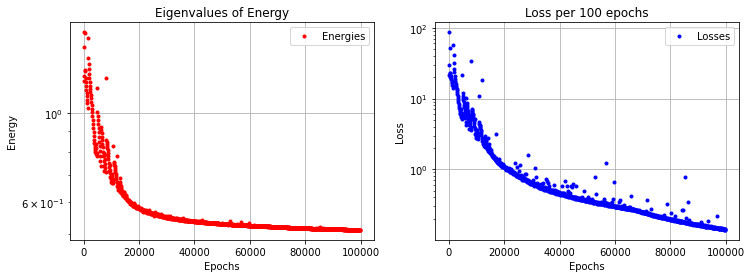

In [256]:
plt.subplots(1,2,figsize=(12,4))
plt.subplot(121)
plt.plot(epochs, 1+np.squeeze(Es), "r.", label="Energies")
plt.title("Eigenvalues of Energy")
plt.yscale("log")
plt.xlabel("Epochs")
plt.ylabel("Energy")
plt.grid()
plt.legend(loc="best")
plt.subplot(122)
plt.plot(epochs, lss, "b.", label="Losses")
plt.title("Loss per 100 epochs")
plt.yscale("log")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.grid()
plt.legend(loc="best")
plt.show()

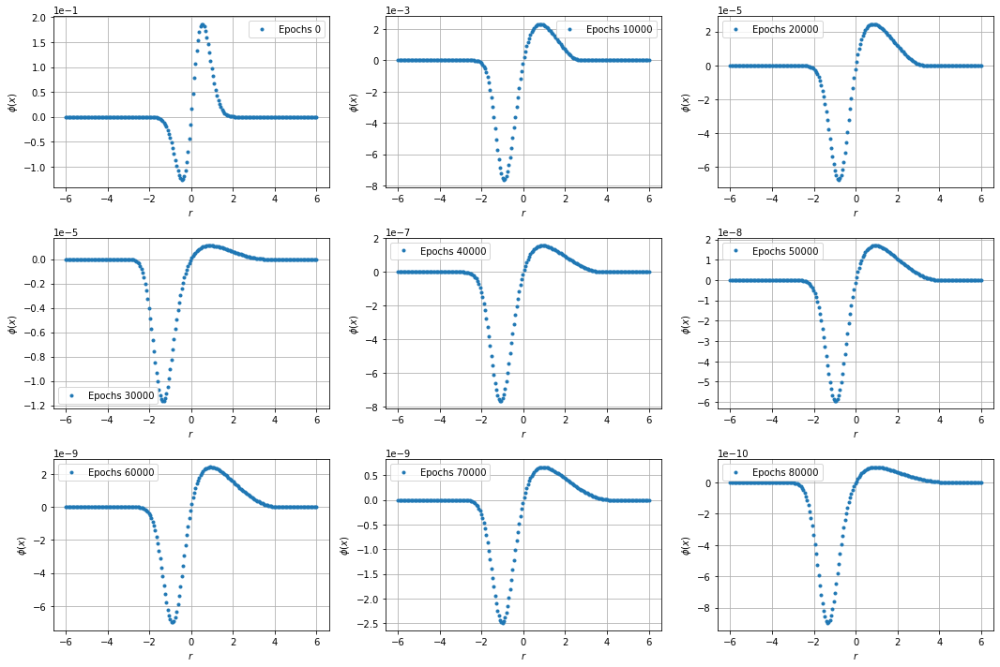

In [270]:
rr = np.linspace(lower_r, upper_r, steps)[:,None]
fig, axs = plt.subplots(3,3,figsize=(15,10))

fil = 0
col = 0
for i in range(0,9):
    yy = Phis_t[100*i]
    axs[fil,col].plot(rr, yy.squeeze(), ".", label=f"Epochs {epochs[100*i]}")
    axs[fil,col].set_xlabel("$r$")
    axs[fil,col].set_ylabel("$\phi(x)$")
    axs[fil,col].legend(loc="best")
    axs[fil,col].ticklabel_format(style='sci', axis='y', scilimits=(0,0))
    axs[fil,col].grid()
    if col == 2:
       col = 0
       fil = fil+1
    else:
       col = col+1
plt.tight_layout()
plt.show()   

In [271]:
np.mean(np.squeeze(Es)[900:])

-0.48594943